# 데이터 다운로드

In [1]:
# !kaggle competitions download -c spaceship-titanic

# 필요 라이브러리 import

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing

from catboost import CatBoostClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_validate
from sklearn.metrics import accuracy_score

In [3]:
pd.set_option('mode.chained_assignment',  None) # 판다스 경고 제거

# 데이터 로드

* <mark style='background-color: #f4f4f4'>PassengerId</mark> - A unique Id for each passenger. Each Id takes the form gggg_pp where gggg indicates a group the passenger is travelling with and pp is their number within the group. People in a group are often family members, but not always.
* <mark style='background-color: #f4f4f4'>HomePlanet</mark> - The planet the passenger departed from, typically their planet of permanent residence.
* <mark style='background-color: #f4f4f4'>CryoSleep</mark> - Indicates whether the passenger elected to be put into suspended animation for the duration of the voyage. Passengers in cryosleep are confined to their cabins.
* <mark style='background-color: #f4f4f4'>Cabin</mark> - The cabin number where the passenger is staying. Takes the form deck/num/side, where side can be either P for Port or S for Starboard.
* <mark style='background-color: #f4f4f4'>Destination</mark> - The planet the passenger will be debarking to.
* <mark style='background-color: #f4f4f4'>Age</mark> - The age of the passenger.
* <mark style='background-color: #f4f4f4'>VIP</mark> - Whether the passenger has paid for special VIP service during the voyage.
* <mark style='background-color: #f4f4f4'>RoomService, FoodCourt, ShoppingMall, Spa, VRDeck</mark> - Amount the passenger has billed at each of the Spaceship Titanic's many luxury amenities.
* <mark style='background-color: #f4f4f4'>Name</mark> - The first and last names of the passenger.


* <mark style='background-color: #f4f4f4'>Transported</mark> - Whether the passenger was transported to another dimension. This is the target, the column you are trying to predict.

In [4]:
train_data = pd.read_csv('./dataset/train.csv')
train_data

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8688,9276_01,Europa,False,A/98/P,55 Cancri e,41.0,True,0.0,6819.0,0.0,1643.0,74.0,Gravior Noxnuther,False
8689,9278_01,Earth,True,G/1499/S,PSO J318.5-22,18.0,False,0.0,0.0,0.0,0.0,0.0,Kurta Mondalley,False
8690,9279_01,Earth,False,G/1500/S,TRAPPIST-1e,26.0,False,0.0,0.0,1872.0,1.0,0.0,Fayey Connon,True
8691,9280_01,Europa,False,E/608/S,55 Cancri e,32.0,False,0.0,1049.0,0.0,353.0,3235.0,Celeon Hontichre,False


In [5]:
test_data = pd.read_csv('./dataset/test.csv')
test_data

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name
0,0013_01,Earth,True,G/3/S,TRAPPIST-1e,27.0,False,0.0,0.0,0.0,0.0,0.0,Nelly Carsoning
1,0018_01,Earth,False,F/4/S,TRAPPIST-1e,19.0,False,0.0,9.0,0.0,2823.0,0.0,Lerome Peckers
2,0019_01,Europa,True,C/0/S,55 Cancri e,31.0,False,0.0,0.0,0.0,0.0,0.0,Sabih Unhearfus
3,0021_01,Europa,False,C/1/S,TRAPPIST-1e,38.0,False,0.0,6652.0,0.0,181.0,585.0,Meratz Caltilter
4,0023_01,Earth,False,F/5/S,TRAPPIST-1e,20.0,False,10.0,0.0,635.0,0.0,0.0,Brence Harperez
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4272,9266_02,Earth,True,G/1496/S,TRAPPIST-1e,34.0,False,0.0,0.0,0.0,0.0,0.0,Jeron Peter
4273,9269_01,Earth,False,NaN,TRAPPIST-1e,42.0,False,0.0,847.0,17.0,10.0,144.0,Matty Scheron
4274,9271_01,Mars,True,D/296/P,55 Cancri e,NaN,False,0.0,0.0,0.0,0.0,0.0,Jayrin Pore
4275,9273_01,Europa,False,D/297/P,NaN,NaN,False,0.0,2680.0,0.0,0.0,523.0,Kitakan Conale


In [6]:
train_data.describe()

,Age,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck
count,8514.000000,8512.000000,8510.000000,8485.000000,8510.000000,8505.000000
mean,28.827930,224.687617,458.077203,173.729169,311.138778,304.854791
std,14.489021,666.717663,1611.489240,604.696458,1136.705535,1145.717189
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,19.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,38.000000,47.000000,76.000000,27.000000,59.000000,46.000000
max,79.000000,14327.000000,29813.000000,23492.000000,22408.000000,24133.000000


In [7]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   8693 non-null   object 
 1   HomePlanet    8492 non-null   object 
 2   CryoSleep     8476 non-null   object 
 3   Cabin         8494 non-null   object 
 4   Destination   8511 non-null   object 
 5   Age           8514 non-null   float64
 6   VIP           8490 non-null   object 
 7   RoomService   8512 non-null   float64
 8   FoodCourt     8510 non-null   float64
 9   ShoppingMall  8485 non-null   float64
 10  Spa           8510 non-null   float64
 11  VRDeck        8505 non-null   float64
 12  Name          8493 non-null   object 
 13  Transported   8693 non-null   bool   
dtypes: bool(1), float64(6), object(7)
memory usage: 891.5+ KB


In [8]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4277 entries, 0 to 4276
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   4277 non-null   object 
 1   HomePlanet    4190 non-null   object 
 2   CryoSleep     4184 non-null   object 
 3   Cabin         4177 non-null   object 
 4   Destination   4185 non-null   object 
 5   Age           4186 non-null   float64
 6   VIP           4184 non-null   object 
 7   RoomService   4195 non-null   float64
 8   FoodCourt     4171 non-null   float64
 9   ShoppingMall  4179 non-null   float64
 10  Spa           4176 non-null   float64
 11  VRDeck        4197 non-null   float64
 12  Name          4183 non-null   object 
dtypes: float64(6), object(7)
memory usage: 434.5+ KB


# 데이터 전처리

## 결측치 확인 및 제거
* 수치형 데이터는 결측치를 0으로 대체한다

In [9]:
train_data.isnull().sum()

PassengerId       0
HomePlanet      201
CryoSleep       217
Cabin           199
Destination     182
Age             179
VIP             203
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
Name            200
Transported       0
dtype: int64

### 불린 데이터 one-hot encoding
* CryoSleep, VIP 컬럼은 type이 object이나 실질적으로는 boolean이므로 boolean으로 간주

In [10]:
boolean_columns = ['CryoSleep', 'VIP']
train_data[boolean_columns] = train_data[boolean_columns].astype(float)
train_data[boolean_columns].head()

,CryoSleep,VIP
0,0.0,0.0
1,0.0,0.0
2,0.0,1.0
3,0.0,0.0
4,0.0,0.0


### 수치형 데이터

In [11]:
numeric_columns = train_data.describe().columns

In [12]:
train_data[numeric_columns].isnull().sum()

CryoSleep       217
Age             179
VIP             203
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
dtype: int64

In [13]:
train_data[numeric_columns] = train_data[numeric_columns].fillna(0)
train_data[numeric_columns].isnull().sum()

CryoSleep       0
Age             0
VIP             0
RoomService     0
FoodCourt       0
ShoppingMall    0
Spa             0
VRDeck          0
dtype: int64

### Object형 데이터
* 최빈값으로 대체한다.

In [14]:
object_columns = train_data.columns[train_data.dtypes==object]
train_data[object_columns].isnull().sum()

PassengerId      0
HomePlanet     201
Cabin          199
Destination    182
Name           200
dtype: int64

In [15]:
mode = train_data[object_columns].mode().iloc[0] # 최빈값 구하기
mode

PassengerId               0001_01
HomePlanet                  Earth
Cabin                     G/734/S
Destination           TRAPPIST-1e
Name           Alraium Disivering
Name: 0, dtype: object

In [16]:
mode_dict = {k:v for k,v in zip(object_columns,mode)}
mode_dict

{'PassengerId': '0001_01',
 'HomePlanet': 'Earth',
 'Cabin': 'G/734/S',
 'Destination': 'TRAPPIST-1e',
 'Name': 'Alraium Disivering'}

In [17]:
train_data[object_columns] = train_data[object_columns].fillna(mode_dict)
train_data[object_columns].isnull().sum()

PassengerId    0
HomePlanet     0
Cabin          0
Destination    0
Name           0
dtype: int64

In [18]:
train_data.isnull().sum()

PassengerId     0
HomePlanet      0
CryoSleep       0
Cabin           0
Destination     0
Age             0
VIP             0
RoomService     0
FoodCourt       0
ShoppingMall    0
Spa             0
VRDeck          0
Name            0
Transported     0
dtype: int64

## PassengerId 컬럼 분해
PassengerId = gggg_pp
* Group : gggg
* Number : pp

In [19]:
id_columns = ['Group', 'Number']

In [20]:
train_data[id_columns] = train_data['PassengerId'].str.split('_', expand=True)
train_data[id_columns] = train_data[id_columns].astype(float)
train_data[id_columns]

,Group,Number
0,1.0,1.0
1,2.0,1.0
2,3.0,1.0
3,3.0,2.0
4,4.0,1.0
...,...,...
8688,9276.0,1.0
8689,9278.0,1.0
8690,9279.0,1.0
8691,9280.0,1.0


## Cabin 컬럼 분해
Cabin = Deck/Num/Side
* Deck
* Num
* S1ide

In [21]:
cabin_columns = ['Deck', 'Num', 'Side']

In [22]:
train_data[cabin_columns] = train_data['Cabin'].str.split('/', expand=True)
train_data['Num'] = train_data['Num'].astype(float)
train_data[cabin_columns]

,Deck,Num,Side
0,B,0.0,P
1,F,0.0,S
2,A,0.0,S
3,A,0.0,S
4,F,1.0,S
...,...,...,...
8688,A,98.0,P
8689,G,1499.0,S
8690,G,1500.0,S
8691,E,608.0,S


In [23]:
sorted(train_data['Deck'].unique())

['A', 'B', 'C', 'D', 'E', 'F', 'G', 'T']

### Side 컬럼 one-hot encoding
Side 컬럼의 값이 P 또는 S 이므로 0, 1로 one-hot encoding

In [24]:
train_data['Side'] = train_data.loc[:, 'Side'].apply(lambda x: float(x == 'P'))

## 함께 탄 가족이 있는지를 나타내는 Family 컬럼 추가
* 성(last name, L 컬럼)이 같으면 가족으로 간주

In [25]:
train_data.loc[:, ['FirstName', 'LastName']] = train_data['Name'].str.split(' ', expand=True)
train_data[['FirstName', 'LastName']] = train_data['Name'].str.split(' ', expand=True)
train_data[['FirstName', 'LastName']]

,FirstName,LastName
0,Maham,Ofracculy
1,Juanna,Vines
2,Altark,Susent
3,Solam,Susent
4,Willy,Santantines
...,...,...
8688,Gravior,Noxnuther
8689,Kurta,Mondalley
8690,Fayey,Connon
8691,Celeon,Hontichre


In [26]:
train_data['Family'] = 0.

In [27]:
last_names = train_data['LastName'].value_counts()
last_names

Disivering    207
Casonston      18
Oneiles        16
Litthews       15
Domington      15
             ... 
Covale          1
Dun             1
Witalnerod      1
Deryplinet      1
Sionerorly      1
Name: LastName, Length: 2217, dtype: int64

In [28]:
for last_name in last_names[last_names > 1].index:
    train_data.loc[train_data['LastName'] == last_name, 'Family'] = 1.

In [29]:
train_data['Family'].value_counts()

1.0    8311
0.0     382
Name: Family, dtype: int64

## 	HomePlanet, Deck, Destination 컬럼 label encoding
* one-hot encoding 하기에는 개수가 많기 때문에 label encoding 사용

In [30]:
home_planets = train_data['HomePlanet'].unique()
home_planets

array(['Europa', 'Earth', 'Mars'], dtype=object)

In [31]:
for idx, home_planet in enumerate(home_planets):
    train_data.loc[train_data['HomePlanet'] == home_planet, 'HomePlanet'] = idx
train_data['HomePlanet'] = train_data['HomePlanet'].astype('float')

In [32]:
decks = train_data['Deck'].unique()
decks

array(['B', 'F', 'A', 'G', 'E', 'D', 'C', 'T'], dtype=object)

In [33]:
for idx, deck in enumerate(decks):
    train_data.loc[train_data['Deck'] == deck, 'Deck'] = idx
train_data['Deck'] =  train_data['Deck'].astype('float')

In [34]:
destinations = train_data['Destination'].unique()
destinations

array(['TRAPPIST-1e', 'PSO J318.5-22', '55 Cancri e'], dtype=object)

In [35]:
for idx, destination in enumerate(destinations):
    train_data.loc[train_data['Destination'] == destination, 'Destination'] = idx
train_data['Destination'] =  train_data['Destination'].astype('float')

## 불필요한 컬럼 제거

In [36]:
train_data = train_data[['Group', 'Number', 'HomePlanet', 'CryoSleep', 'Deck', 'Num', 'Side',
    'Destination', 'Age', 'VIP', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck',
    'Family', 'Transported']]
train_data

,Group,Number,HomePlanet,CryoSleep,Deck,Num,Side,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Family,Transported
0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,39.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
1,2.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,24.0,0.0,109.0,9.0,25.0,549.0,44.0,1.0,True
2,3.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,58.0,1.0,43.0,3576.0,0.0,6715.0,49.0,1.0,False
3,3.0,2.0,0.0,0.0,2.0,0.0,0.0,0.0,33.0,0.0,0.0,1283.0,371.0,3329.0,193.0,1.0,False
4,4.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,16.0,0.0,303.0,70.0,151.0,565.0,2.0,1.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8688,9276.0,1.0,0.0,0.0,2.0,98.0,1.0,2.0,41.0,1.0,0.0,6819.0,0.0,1643.0,74.0,1.0,False
8689,9278.0,1.0,1.0,1.0,3.0,1499.0,0.0,1.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,False
8690,9279.0,1.0,1.0,0.0,3.0,1500.0,0.0,0.0,26.0,0.0,0.0,0.0,1872.0,1.0,0.0,1.0,True
8691,9280.0,1.0,0.0,0.0,4.0,608.0,0.0,2.0,32.0,0.0,0.0,1049.0,0.0,353.0,3235.0,1.0,False


In [37]:
train_data.dtypes # 타겟 데이터를 제외한 나머지 데이터를 모두 수치형 데이터로 변환 완료

Group           float64
Number          float64
HomePlanet      float64
CryoSleep       float64
Deck            float64
Num             float64
Side            float64
Destination     float64
Age             float64
VIP             float64
RoomService     float64
FoodCourt       float64
ShoppingMall    float64
Spa             float64
VRDeck          float64
Family          float64
Transported        bool
dtype: object

In [38]:
train_data

,Group,Number,HomePlanet,CryoSleep,Deck,Num,Side,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Family,Transported
0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,39.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
1,2.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,24.0,0.0,109.0,9.0,25.0,549.0,44.0,1.0,True
2,3.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,58.0,1.0,43.0,3576.0,0.0,6715.0,49.0,1.0,False
3,3.0,2.0,0.0,0.0,2.0,0.0,0.0,0.0,33.0,0.0,0.0,1283.0,371.0,3329.0,193.0,1.0,False
4,4.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,16.0,0.0,303.0,70.0,151.0,565.0,2.0,1.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8688,9276.0,1.0,0.0,0.0,2.0,98.0,1.0,2.0,41.0,1.0,0.0,6819.0,0.0,1643.0,74.0,1.0,False
8689,9278.0,1.0,1.0,1.0,3.0,1499.0,0.0,1.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,False
8690,9279.0,1.0,1.0,0.0,3.0,1500.0,0.0,0.0,26.0,0.0,0.0,0.0,1872.0,1.0,0.0,1.0,True
8691,9280.0,1.0,0.0,0.0,4.0,608.0,0.0,2.0,32.0,0.0,0.0,1049.0,0.0,353.0,3235.0,1.0,False


## 테스트 데이터 전처리

In [39]:
test_data[boolean_columns] = test_data[boolean_columns].astype(float)
test_data[numeric_columns] = test_data[numeric_columns].fillna(0)
object_columns = test_data.columns[test_data.dtypes==object]
mode = test_data[object_columns].mode().iloc[0]
mode_dict = {k:v for k,v in zip(object_columns,mode)}
test_data[object_columns] = test_data[object_columns].fillna(mode_dict)

test_data[id_columns] = test_data['PassengerId'].str.split('_', expand=True)
test_data[id_columns] = test_data[id_columns].astype(float)

test_data[cabin_columns] = test_data['Cabin'].str.split('/', expand=True)
test_data['Num'] = test_data['Num'].astype(float)

test_data['Side'] = test_data.loc[:, 'Side'].apply(lambda x: float(x == 'P'))

for idx, home_planet in enumerate(home_planets):
    test_data.loc[test_data['HomePlanet'] == home_planet, 'HomePlanet'] = idx
test_data['HomePlanet'] = test_data['HomePlanet'].astype(float)

for idx, deck in enumerate(decks):
    test_data.loc[test_data['Deck'] == deck, 'Deck'] = idx
test_data['Deck'] =  test_data['Deck'].astype(float)

for idx, destination in enumerate(destinations):
    test_data.loc[test_data['Destination'] == destination, 'Destination'] = idx
test_data['Destination'] =  test_data['Destination'].astype(float)

test_data.loc[:, ['FirstName', 'LastName']] = test_data['Name'].str.split(' ', expand=True)
test_data[['FirstName', 'LastName']] = test_data['Name'].str.split(' ', expand=True)

test_data['Family'] = 0.
last_names = test_data['LastName'].value_counts()

for last_name in last_names[last_names > 1].index:
    test_data.loc[test_data['LastName'] == last_name, 'Family'] = 1.

test_data = test_data[['Group', 'Number', 'HomePlanet', 'CryoSleep', 'Deck', 'Num',
'Side', 'Destination', 'Age', 'VIP', 'RoomService', 'FoodCourt', 'ShoppingMall',
'Spa', 'VRDeck', 'Family']]

test_data

,Group,Number,HomePlanet,CryoSleep,Deck,Num,Side,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Family
0,13.0,1.0,1.0,1.0,3.0,3.0,0.0,0.0,27.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,18.0,1.0,1.0,0.0,1.0,4.0,0.0,0.0,19.0,0.0,0.0,9.0,0.0,2823.0,0.0,0.0
2,19.0,1.0,0.0,1.0,6.0,0.0,0.0,2.0,31.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,21.0,1.0,0.0,0.0,6.0,1.0,0.0,0.0,38.0,0.0,0.0,6652.0,0.0,181.0,585.0,0.0
4,23.0,1.0,1.0,0.0,1.0,5.0,0.0,0.0,20.0,0.0,10.0,0.0,635.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4272,9266.0,2.0,1.0,1.0,3.0,1496.0,0.0,0.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4273,9269.0,1.0,1.0,0.0,3.0,160.0,1.0,0.0,42.0,0.0,0.0,847.0,17.0,10.0,144.0,1.0
4274,9271.0,1.0,2.0,1.0,5.0,296.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4275,9273.0,1.0,0.0,0.0,5.0,297.0,1.0,0.0,0.0,0.0,0.0,2680.0,0.0,0.0,523.0,1.0


# 데이터 분석

array([[<AxesSubplot:title={'center':'Group'}>,
        <AxesSubplot:title={'center':'Number'}>,
        <AxesSubplot:title={'center':'HomePlanet'}>,
        <AxesSubplot:title={'center':'CryoSleep'}>],
       [<AxesSubplot:title={'center':'Deck'}>,
        <AxesSubplot:title={'center':'Num'}>,
        <AxesSubplot:title={'center':'Side'}>,
        <AxesSubplot:title={'center':'Destination'}>],
       [<AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'VIP'}>,
        <AxesSubplot:title={'center':'RoomService'}>,
        <AxesSubplot:title={'center':'FoodCourt'}>],
       [<AxesSubplot:title={'center':'ShoppingMall'}>,
        <AxesSubplot:title={'center':'Spa'}>,
        <AxesSubplot:title={'center':'VRDeck'}>,
        <AxesSubplot:title={'center':'Family'}>]], dtype=object)

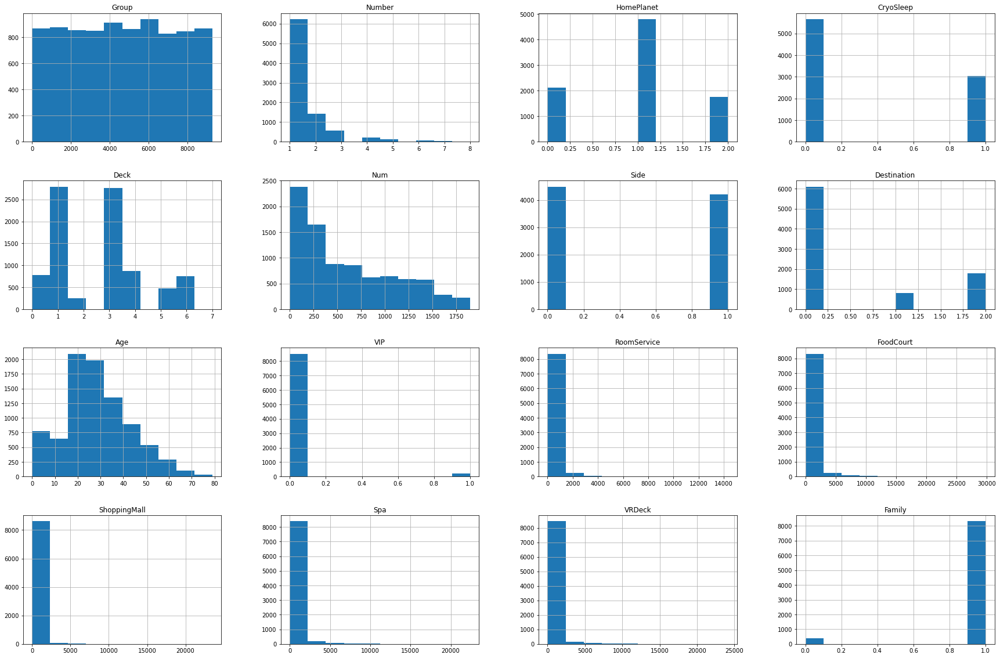

In [40]:
train_data.hist(figsize=(30,20))

## 선형성

## Correlation
* 상관계수로 히트맵을 그려 확인한 결과 선형성이 있다고 판단되는 0.5 이상의 값이 거의 없으므로 선형 모델은 적합하지 않다.

<AxesSubplot:>

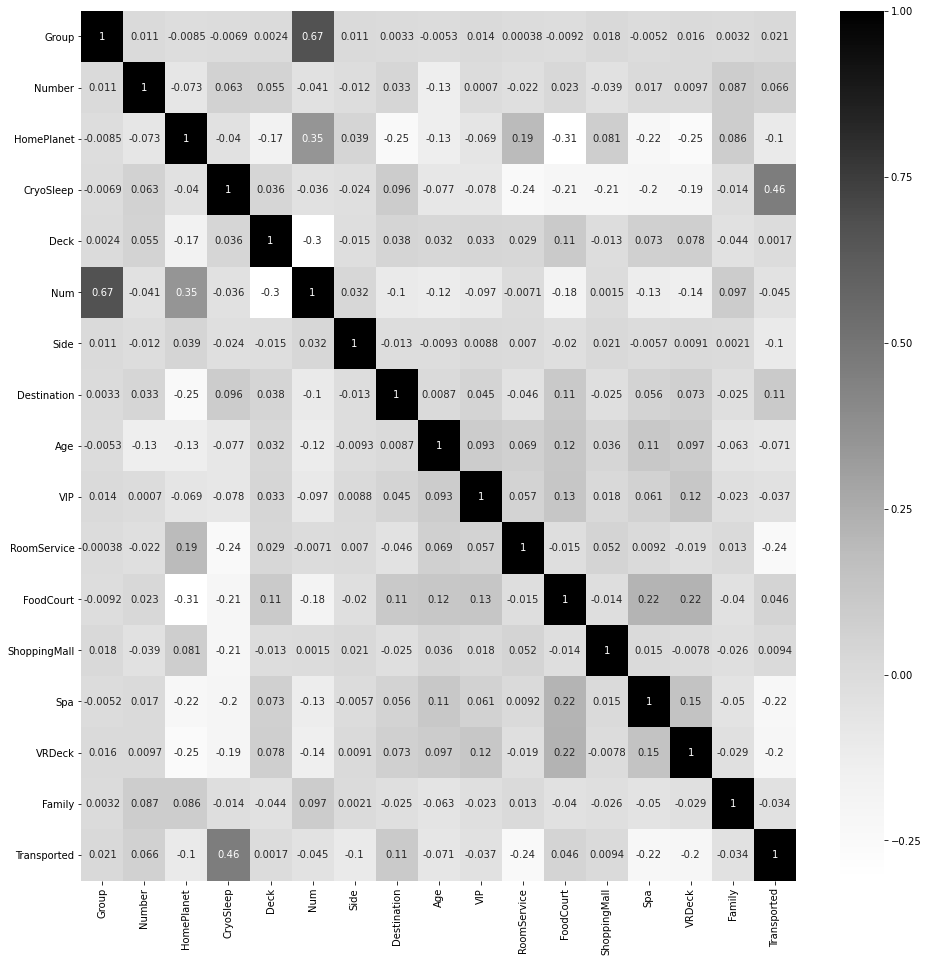

In [41]:
plt.figure(figsize = (16, 16))
sns.heatmap(train_data.corr(), cmap = 'Greys', annot = True)

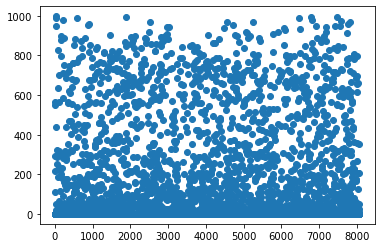

In [42]:
a = train_data['Spa']<1000
plt.scatter(range(len(train_data['Spa'][a])),train_data['Spa'][a])

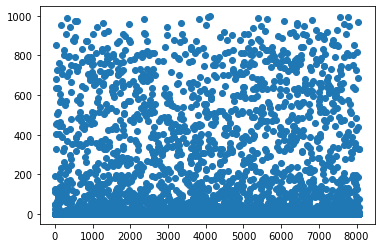

In [43]:
b = train_data['VRDeck']<1000
plt.scatter(range(len(train_data['VRDeck'][b])),train_data['VRDeck'][b])

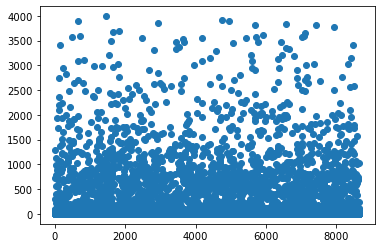

In [44]:
c = train_data['RoomService']<4000
plt.scatter(range(len(train_data['RoomService'][c])),train_data['RoomService'][c])

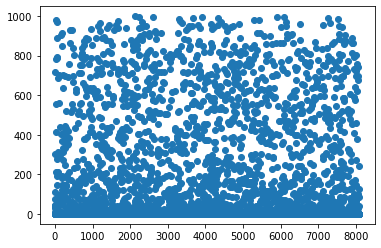

In [45]:
c = train_data['RoomService']<1000
plt.scatter(range(len(train_data['RoomService'][c])),train_data['RoomService'][c])

In [46]:
train_cond = (train_data['Spa']<1000) & (train_data['VRDeck']<1000) & (train_data['RoomService']<1000)

train_data = train_data[train_cond]

In [47]:
cat_model = CatBoostClassifier(
    iterations = 1000,
    #leaf_estimation_iterations = 100,
    #random_strength = 0.5,
    depth = 7,
    l2_leaf_reg = 5,
    learning_rate=0.001,
).fit(train_data.iloc[:,:-1], train_data.iloc[:,-1])

0:	learn: 0.6925213	total: 147ms	remaining: 2m 26s
1:	learn: 0.6918840	total: 153ms	remaining: 1m 16s
2:	learn: 0.6913831	total: 160ms	remaining: 53.1s
3:	learn: 0.6907637	total: 166ms	remaining: 41.4s
4:	learn: 0.6902174	total: 172ms	remaining: 34.3s
5:	learn: 0.6895917	total: 178ms	remaining: 29.5s
6:	learn: 0.6890555	total: 184ms	remaining: 26.1s
7:	learn: 0.6883877	total: 190ms	remaining: 23.5s
8:	learn: 0.6877504	total: 195ms	remaining: 21.5s
9:	learn: 0.6871131	total: 202ms	remaining: 19.9s
10:	learn: 0.6865312	total: 207ms	remaining: 18.6s
11:	learn: 0.6859169	total: 213ms	remaining: 17.5s
12:	learn: 0.6852942	total: 219ms	remaining: 16.6s
13:	learn: 0.6847585	total: 224ms	remaining: 15.8s
14:	learn: 0.6841158	total: 230ms	remaining: 15.1s
15:	learn: 0.6835758	total: 235ms	remaining: 14.4s
16:	learn: 0.6829514	total: 240ms	remaining: 13.9s
17:	learn: 0.6823571	total: 246ms	remaining: 13.4s
18:	learn: 0.6817378	total: 251ms	remaining: 13s
19:	learn: 0.6811463	total: 256ms	remaini

182:	learn: 0.6061442	total: 1.2s	remaining: 5.37s
183:	learn: 0.6057803	total: 1.21s	remaining: 5.36s
184:	learn: 0.6054337	total: 1.21s	remaining: 5.35s
185:	learn: 0.6051066	total: 1.22s	remaining: 5.34s
186:	learn: 0.6047409	total: 1.23s	remaining: 5.33s
187:	learn: 0.6043383	total: 1.23s	remaining: 5.32s
188:	learn: 0.6039596	total: 1.24s	remaining: 5.31s
189:	learn: 0.6035622	total: 1.24s	remaining: 5.29s
190:	learn: 0.6032395	total: 1.25s	remaining: 5.29s
191:	learn: 0.6028830	total: 1.25s	remaining: 5.27s
192:	learn: 0.6024982	total: 1.26s	remaining: 5.26s
193:	learn: 0.6021836	total: 1.26s	remaining: 5.25s
194:	learn: 0.6017949	total: 1.27s	remaining: 5.24s
195:	learn: 0.6014016	total: 1.27s	remaining: 5.23s
196:	learn: 0.6011612	total: 1.28s	remaining: 5.22s
197:	learn: 0.6009277	total: 1.28s	remaining: 5.21s
198:	learn: 0.6006453	total: 1.29s	remaining: 5.19s
199:	learn: 0.6003191	total: 1.29s	remaining: 5.18s
200:	learn: 0.5999406	total: 1.3s	remaining: 5.17s
201:	learn: 0.

368:	learn: 0.5556846	total: 2.27s	remaining: 3.89s
369:	learn: 0.5554725	total: 2.28s	remaining: 3.88s
370:	learn: 0.5552180	total: 2.29s	remaining: 3.88s
371:	learn: 0.5549991	total: 2.29s	remaining: 3.87s
372:	learn: 0.5547953	total: 2.3s	remaining: 3.86s
373:	learn: 0.5546312	total: 2.3s	remaining: 3.86s
374:	learn: 0.5544337	total: 2.31s	remaining: 3.85s
375:	learn: 0.5542382	total: 2.31s	remaining: 3.84s
376:	learn: 0.5540139	total: 2.32s	remaining: 3.83s
377:	learn: 0.5538468	total: 2.33s	remaining: 3.83s
378:	learn: 0.5536526	total: 2.33s	remaining: 3.82s
379:	learn: 0.5534311	total: 2.34s	remaining: 3.81s
380:	learn: 0.5531966	total: 2.34s	remaining: 3.81s
381:	learn: 0.5529769	total: 2.35s	remaining: 3.81s
382:	learn: 0.5528181	total: 2.36s	remaining: 3.8s
383:	learn: 0.5526623	total: 2.37s	remaining: 3.79s
384:	learn: 0.5524151	total: 2.37s	remaining: 3.79s
385:	learn: 0.5522200	total: 2.38s	remaining: 3.78s
386:	learn: 0.5519951	total: 2.38s	remaining: 3.77s
387:	learn: 0.5

554:	learn: 0.5230984	total: 3.36s	remaining: 2.69s
555:	learn: 0.5229556	total: 3.36s	remaining: 2.69s
556:	learn: 0.5227635	total: 3.37s	remaining: 2.68s
557:	learn: 0.5226396	total: 3.38s	remaining: 2.67s
558:	learn: 0.5225135	total: 3.38s	remaining: 2.67s
559:	learn: 0.5223630	total: 3.39s	remaining: 2.66s
560:	learn: 0.5222250	total: 3.39s	remaining: 2.65s
561:	learn: 0.5220771	total: 3.4s	remaining: 2.65s
562:	learn: 0.5219242	total: 3.4s	remaining: 2.64s
563:	learn: 0.5217588	total: 3.41s	remaining: 2.63s
564:	learn: 0.5216448	total: 3.42s	remaining: 2.63s
565:	learn: 0.5214892	total: 3.44s	remaining: 2.64s
566:	learn: 0.5213317	total: 3.45s	remaining: 2.63s
567:	learn: 0.5212167	total: 3.45s	remaining: 2.63s
568:	learn: 0.5210673	total: 3.46s	remaining: 2.62s
569:	learn: 0.5209218	total: 3.46s	remaining: 2.61s
570:	learn: 0.5208049	total: 3.47s	remaining: 2.61s
571:	learn: 0.5206519	total: 3.47s	remaining: 2.6s
572:	learn: 0.5205343	total: 3.48s	remaining: 2.59s
573:	learn: 0.5

740:	learn: 0.5001026	total: 4.43s	remaining: 1.55s
741:	learn: 0.4999995	total: 4.45s	remaining: 1.55s
742:	learn: 0.4998623	total: 4.45s	remaining: 1.54s
743:	learn: 0.4997358	total: 4.46s	remaining: 1.53s
744:	learn: 0.4996384	total: 4.46s	remaining: 1.53s
745:	learn: 0.4995219	total: 4.47s	remaining: 1.52s
746:	learn: 0.4994368	total: 4.47s	remaining: 1.51s
747:	learn: 0.4993021	total: 4.48s	remaining: 1.51s
748:	learn: 0.4991840	total: 4.49s	remaining: 1.5s
749:	learn: 0.4990936	total: 4.49s	remaining: 1.5s
750:	learn: 0.4989754	total: 4.5s	remaining: 1.49s
751:	learn: 0.4988887	total: 4.5s	remaining: 1.48s
752:	learn: 0.4987826	total: 4.51s	remaining: 1.48s
753:	learn: 0.4986790	total: 4.51s	remaining: 1.47s
754:	learn: 0.4985784	total: 4.52s	remaining: 1.47s
755:	learn: 0.4984935	total: 4.52s	remaining: 1.46s
756:	learn: 0.4984025	total: 4.53s	remaining: 1.45s
757:	learn: 0.4983181	total: 4.53s	remaining: 1.45s
758:	learn: 0.4981972	total: 4.54s	remaining: 1.44s
759:	learn: 0.49

925:	learn: 0.4831875	total: 5.5s	remaining: 440ms
926:	learn: 0.4830983	total: 5.51s	remaining: 434ms
927:	learn: 0.4830252	total: 5.51s	remaining: 428ms
928:	learn: 0.4829460	total: 5.52s	remaining: 422ms
929:	learn: 0.4828145	total: 5.52s	remaining: 416ms
930:	learn: 0.4827566	total: 5.53s	remaining: 410ms
931:	learn: 0.4826821	total: 5.54s	remaining: 404ms
932:	learn: 0.4826235	total: 5.54s	remaining: 398ms
933:	learn: 0.4825510	total: 5.55s	remaining: 392ms
934:	learn: 0.4824777	total: 5.55s	remaining: 386ms
935:	learn: 0.4824119	total: 5.56s	remaining: 380ms
936:	learn: 0.4823398	total: 5.56s	remaining: 374ms
937:	learn: 0.4822621	total: 5.57s	remaining: 368ms
938:	learn: 0.4821570	total: 5.57s	remaining: 362ms
939:	learn: 0.4820707	total: 5.59s	remaining: 357ms
940:	learn: 0.4820129	total: 5.6s	remaining: 351ms
941:	learn: 0.4819373	total: 5.6s	remaining: 345ms
942:	learn: 0.4818597	total: 5.61s	remaining: 339ms
943:	learn: 0.4818019	total: 5.61s	remaining: 333ms
944:	learn: 0.4

In [48]:
import shap
explainer = shap.TreeExplainer(cat_model)
shap_values = explainer.shap_values(train_data)

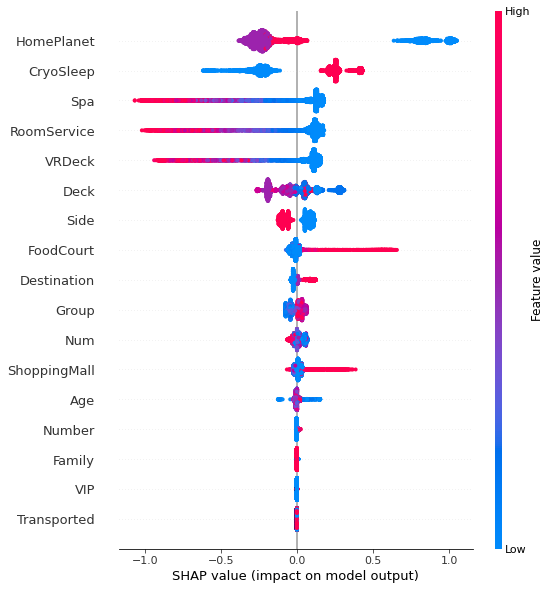

In [49]:
shap.initjs()
shap.summary_plot(shap_values, train_data)

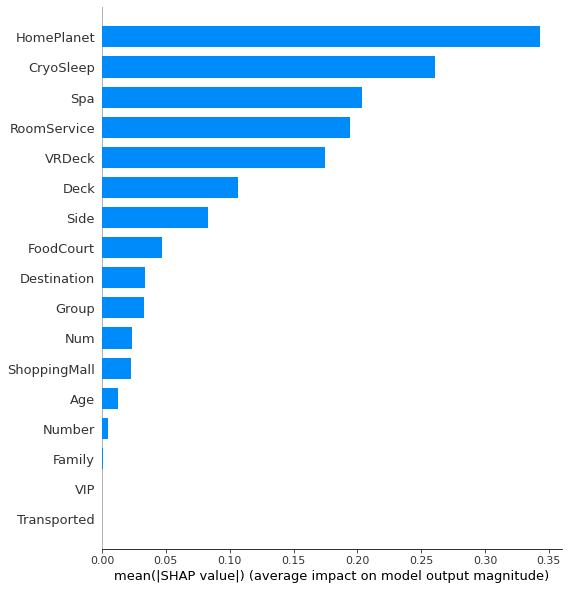

In [50]:
shap.summary_plot(shap_values, train_data, plot_type='bar')

## 컬럼 편집
* shap 분석 결과 VIP, Family, Number, Group의 4개 컬럼은 악영향을 미치거나 영향력이 거의 없으므로 제거한다.

In [51]:
train_data.drop(['VIP', 'Family', 'Number', 'Group'], inplace=True, axis=1)
test_data.drop(['VIP', 'Family', 'Number', 'Group'], inplace=True, axis=1)

# 모델 선택
* 속성들간의 선형성이 낮고, 데이터 분포를 보아도 어떠한 연관성을 찾기는 어려워 보이므로 트리 기반 모델이 적절해 보인다.
* label encoding을 사용했으므로 과대적합이 발생할 여지가 있다. 따라서 label encoding에 적합한 catboost를 선택했다.

In [52]:
data = train_data.iloc[:,:-1]
target = train_data.iloc[:,-1].astype(int)

## 모델학습 및 하이퍼파라미터 튜닝

In [53]:
model = CatBoostClassifier()

In [54]:
params = {
    'depth' : range(3,10,3),
    'n_estimators' : range(100,1100,100),
}

grid = GridSearchCV(
    model,
    params,
    scoring='accuracy',
    verbose=10
)
grid.fit(data, target)
grid.best_params_, grid.best_score_

Fitting 5 folds for each of 30 candidates, totalling 150 fits
[CV 1/5; 1/30] START depth=3, n_estimators=100..................................
Learning rate set to 0.178235
0:	learn: 0.6495002	total: 1.19ms	remaining: 118ms
1:	learn: 0.6180251	total: 2.44ms	remaining: 119ms
2:	learn: 0.5958171	total: 4.01ms	remaining: 130ms
3:	learn: 0.5738726	total: 5.37ms	remaining: 129ms
4:	learn: 0.5571548	total: 6.7ms	remaining: 127ms
5:	learn: 0.5428216	total: 8.01ms	remaining: 125ms
6:	learn: 0.5339392	total: 9.41ms	remaining: 125ms
7:	learn: 0.5238336	total: 10.8ms	remaining: 124ms
8:	learn: 0.5166131	total: 12.2ms	remaining: 123ms
9:	learn: 0.5108641	total: 13.4ms	remaining: 121ms
10:	learn: 0.5056049	total: 15.1ms	remaining: 122ms
11:	learn: 0.5008610	total: 16.7ms	remaining: 123ms
12:	learn: 0.4945475	total: 17.9ms	remaining: 120ms
13:	learn: 0.4890017	total: 19.3ms	remaining: 118ms
14:	learn: 0.4860588	total: 20.5ms	remaining: 116ms
15:	learn: 0.4827787	total: 21.9ms	remaining: 115ms
16:	le

99:	learn: 0.3996339	total: 155ms	remaining: 0us
[CV 2/5; 1/30] END ...depth=3, n_estimators=100;, score=0.770 total time=   0.2s
[CV 3/5; 1/30] START depth=3, n_estimators=100..................................
Learning rate set to 0.178235
0:	learn: 0.6478481	total: 5.26ms	remaining: 521ms
1:	learn: 0.6163691	total: 6.47ms	remaining: 317ms
2:	learn: 0.5926512	total: 7.81ms	remaining: 253ms
3:	learn: 0.5717821	total: 9.26ms	remaining: 222ms
4:	learn: 0.5543394	total: 10.7ms	remaining: 204ms
5:	learn: 0.5405495	total: 12.3ms	remaining: 193ms
6:	learn: 0.5294842	total: 13.9ms	remaining: 185ms
7:	learn: 0.5214259	total: 15.7ms	remaining: 180ms
8:	learn: 0.5137083	total: 17.3ms	remaining: 175ms
9:	learn: 0.5073579	total: 18.9ms	remaining: 170ms
10:	learn: 0.5022567	total: 20.3ms	remaining: 164ms
11:	learn: 0.4985471	total: 21.7ms	remaining: 159ms
12:	learn: 0.4942075	total: 23.5ms	remaining: 158ms
13:	learn: 0.4885004	total: 24.8ms	remaining: 152ms
14:	learn: 0.4851641	total: 26.2ms	remain

94:	learn: 0.4101369	total: 131ms	remaining: 6.9ms
95:	learn: 0.4092764	total: 133ms	remaining: 5.55ms
96:	learn: 0.4090287	total: 135ms	remaining: 4.17ms
97:	learn: 0.4086721	total: 136ms	remaining: 2.78ms
98:	learn: 0.4085103	total: 138ms	remaining: 1.39ms
99:	learn: 0.4084555	total: 139ms	remaining: 0us
[CV 4/5; 1/30] END ...depth=3, n_estimators=100;, score=0.790 total time=   0.2s
[CV 5/5; 1/30] START depth=3, n_estimators=100..................................
Learning rate set to 0.178235
0:	learn: 0.6500724	total: 1.24ms	remaining: 123ms
1:	learn: 0.6201483	total: 2.84ms	remaining: 139ms
2:	learn: 0.5956651	total: 4.62ms	remaining: 149ms
3:	learn: 0.5788365	total: 6.13ms	remaining: 147ms
4:	learn: 0.5620309	total: 7.42ms	remaining: 141ms
5:	learn: 0.5488249	total: 8.71ms	remaining: 136ms
6:	learn: 0.5399630	total: 10.1ms	remaining: 135ms
7:	learn: 0.5290778	total: 11.4ms	remaining: 131ms
8:	learn: 0.5212835	total: 13.1ms	remaining: 133ms
9:	learn: 0.5156367	total: 14.8ms	remaini

54:	learn: 0.4354846	total: 127ms	remaining: 334ms
55:	learn: 0.4351229	total: 129ms	remaining: 333ms
56:	learn: 0.4342651	total: 132ms	remaining: 330ms
57:	learn: 0.4329038	total: 134ms	remaining: 328ms
58:	learn: 0.4309399	total: 136ms	remaining: 326ms
59:	learn: 0.4303566	total: 139ms	remaining: 323ms
60:	learn: 0.4285252	total: 141ms	remaining: 322ms
61:	learn: 0.4280168	total: 143ms	remaining: 319ms
62:	learn: 0.4274062	total: 146ms	remaining: 317ms
63:	learn: 0.4244406	total: 148ms	remaining: 315ms
64:	learn: 0.4238510	total: 150ms	remaining: 312ms
65:	learn: 0.4233931	total: 153ms	remaining: 310ms
66:	learn: 0.4228580	total: 155ms	remaining: 308ms
67:	learn: 0.4221399	total: 157ms	remaining: 305ms
68:	learn: 0.4215090	total: 160ms	remaining: 303ms
69:	learn: 0.4210784	total: 162ms	remaining: 301ms
70:	learn: 0.4207749	total: 164ms	remaining: 298ms
71:	learn: 0.4204154	total: 166ms	remaining: 296ms
72:	learn: 0.4200210	total: 169ms	remaining: 293ms
73:	learn: 0.4197399	total: 171

66:	learn: 0.4315746	total: 161ms	remaining: 319ms
67:	learn: 0.4310525	total: 163ms	remaining: 317ms
68:	learn: 0.4306660	total: 165ms	remaining: 314ms
69:	learn: 0.4288094	total: 168ms	remaining: 311ms
70:	learn: 0.4280929	total: 170ms	remaining: 308ms
71:	learn: 0.4277227	total: 172ms	remaining: 306ms
72:	learn: 0.4274183	total: 175ms	remaining: 304ms
73:	learn: 0.4270669	total: 177ms	remaining: 302ms
74:	learn: 0.4267592	total: 180ms	remaining: 300ms
75:	learn: 0.4262911	total: 182ms	remaining: 297ms
76:	learn: 0.4260024	total: 184ms	remaining: 294ms
77:	learn: 0.4253719	total: 186ms	remaining: 291ms
78:	learn: 0.4247933	total: 189ms	remaining: 289ms
79:	learn: 0.4241990	total: 191ms	remaining: 286ms
80:	learn: 0.4235359	total: 193ms	remaining: 283ms
81:	learn: 0.4233575	total: 195ms	remaining: 280ms
82:	learn: 0.4228146	total: 197ms	remaining: 278ms
83:	learn: 0.4224725	total: 199ms	remaining: 275ms
84:	learn: 0.4214859	total: 202ms	remaining: 273ms
85:	learn: 0.4211330	total: 204

56:	learn: 0.4378804	total: 130ms	remaining: 326ms
57:	learn: 0.4373560	total: 132ms	remaining: 324ms
58:	learn: 0.4355780	total: 135ms	remaining: 322ms
59:	learn: 0.4348112	total: 137ms	remaining: 320ms
60:	learn: 0.4341381	total: 139ms	remaining: 317ms
61:	learn: 0.4335237	total: 141ms	remaining: 314ms
62:	learn: 0.4329816	total: 143ms	remaining: 312ms
63:	learn: 0.4324068	total: 146ms	remaining: 309ms
64:	learn: 0.4319065	total: 148ms	remaining: 308ms
65:	learn: 0.4313976	total: 150ms	remaining: 305ms
66:	learn: 0.4309913	total: 153ms	remaining: 303ms
67:	learn: 0.4304515	total: 155ms	remaining: 301ms
68:	learn: 0.4296587	total: 157ms	remaining: 298ms
69:	learn: 0.4293030	total: 160ms	remaining: 296ms
70:	learn: 0.4289936	total: 162ms	remaining: 294ms
71:	learn: 0.4287176	total: 164ms	remaining: 292ms
72:	learn: 0.4282935	total: 167ms	remaining: 290ms
73:	learn: 0.4278813	total: 169ms	remaining: 288ms
74:	learn: 0.4273159	total: 171ms	remaining: 285ms
75:	learn: 0.4268406	total: 173

55:	learn: 0.4394329	total: 132ms	remaining: 340ms
56:	learn: 0.4390608	total: 135ms	remaining: 338ms
57:	learn: 0.4383232	total: 137ms	remaining: 336ms
58:	learn: 0.4378712	total: 139ms	remaining: 333ms
59:	learn: 0.4374525	total: 142ms	remaining: 331ms
60:	learn: 0.4371005	total: 145ms	remaining: 329ms
61:	learn: 0.4363542	total: 147ms	remaining: 327ms
62:	learn: 0.4358421	total: 149ms	remaining: 325ms
63:	learn: 0.4350035	total: 152ms	remaining: 322ms
64:	learn: 0.4347262	total: 154ms	remaining: 320ms
65:	learn: 0.4342949	total: 156ms	remaining: 317ms
66:	learn: 0.4338579	total: 159ms	remaining: 315ms
67:	learn: 0.4331146	total: 161ms	remaining: 312ms
68:	learn: 0.4327341	total: 163ms	remaining: 310ms
69:	learn: 0.4323520	total: 166ms	remaining: 307ms
70:	learn: 0.4317175	total: 168ms	remaining: 305ms
71:	learn: 0.4309553	total: 170ms	remaining: 302ms
72:	learn: 0.4307138	total: 172ms	remaining: 299ms
73:	learn: 0.4302825	total: 174ms	remaining: 297ms
74:	learn: 0.4295875	total: 177

55:	learn: 0.4376661	total: 130ms	remaining: 334ms
56:	learn: 0.4371972	total: 133ms	remaining: 333ms
57:	learn: 0.4366184	total: 135ms	remaining: 331ms
58:	learn: 0.4356901	total: 138ms	remaining: 329ms
59:	learn: 0.4351202	total: 140ms	remaining: 327ms
60:	learn: 0.4345558	total: 142ms	remaining: 324ms
61:	learn: 0.4336199	total: 144ms	remaining: 321ms
62:	learn: 0.4330013	total: 147ms	remaining: 320ms
63:	learn: 0.4325993	total: 149ms	remaining: 318ms
64:	learn: 0.4321613	total: 152ms	remaining: 316ms
65:	learn: 0.4309215	total: 154ms	remaining: 313ms
66:	learn: 0.4305157	total: 156ms	remaining: 310ms
67:	learn: 0.4300317	total: 159ms	remaining: 308ms
68:	learn: 0.4297213	total: 161ms	remaining: 306ms
69:	learn: 0.4288487	total: 163ms	remaining: 303ms
70:	learn: 0.4282915	total: 166ms	remaining: 301ms
71:	learn: 0.4278206	total: 168ms	remaining: 298ms
72:	learn: 0.4272809	total: 170ms	remaining: 295ms
73:	learn: 0.4268701	total: 172ms	remaining: 293ms
74:	learn: 0.4260524	total: 174

55:	learn: 0.4535056	total: 127ms	remaining: 554ms
56:	learn: 0.4526736	total: 129ms	remaining: 552ms
57:	learn: 0.4517664	total: 132ms	remaining: 549ms
58:	learn: 0.4509903	total: 134ms	remaining: 548ms
59:	learn: 0.4498418	total: 137ms	remaining: 546ms
60:	learn: 0.4478406	total: 139ms	remaining: 543ms
61:	learn: 0.4461231	total: 141ms	remaining: 540ms
62:	learn: 0.4454870	total: 143ms	remaining: 538ms
63:	learn: 0.4447256	total: 145ms	remaining: 536ms
64:	learn: 0.4440959	total: 148ms	remaining: 533ms
65:	learn: 0.4434403	total: 150ms	remaining: 531ms
66:	learn: 0.4422840	total: 152ms	remaining: 529ms
67:	learn: 0.4413045	total: 154ms	remaining: 526ms
68:	learn: 0.4406235	total: 156ms	remaining: 524ms
69:	learn: 0.4401641	total: 159ms	remaining: 522ms
70:	learn: 0.4397291	total: 161ms	remaining: 520ms
71:	learn: 0.4387011	total: 163ms	remaining: 518ms
72:	learn: 0.4383317	total: 166ms	remaining: 516ms
73:	learn: 0.4379728	total: 168ms	remaining: 514ms
74:	learn: 0.4373459	total: 171

276:	learn: 0.3757881	total: 640ms	remaining: 53.1ms
277:	learn: 0.3755342	total: 642ms	remaining: 50.8ms
278:	learn: 0.3754251	total: 644ms	remaining: 48.5ms
279:	learn: 0.3752306	total: 646ms	remaining: 46.2ms
280:	learn: 0.3750249	total: 649ms	remaining: 43.9ms
281:	learn: 0.3748038	total: 651ms	remaining: 41.5ms
282:	learn: 0.3747161	total: 653ms	remaining: 39.2ms
283:	learn: 0.3746125	total: 656ms	remaining: 36.9ms
284:	learn: 0.3744619	total: 658ms	remaining: 34.7ms
285:	learn: 0.3742868	total: 661ms	remaining: 32.3ms
286:	learn: 0.3742041	total: 663ms	remaining: 30ms
287:	learn: 0.3741179	total: 665ms	remaining: 27.7ms
288:	learn: 0.3740009	total: 668ms	remaining: 25.4ms
289:	learn: 0.3738900	total: 670ms	remaining: 23.1ms
290:	learn: 0.3737833	total: 672ms	remaining: 20.8ms
291:	learn: 0.3736039	total: 675ms	remaining: 18.5ms
292:	learn: 0.3734561	total: 677ms	remaining: 16.2ms
293:	learn: 0.3732781	total: 680ms	remaining: 13.9ms
294:	learn: 0.3731046	total: 682ms	remaining: 11

146:	learn: 0.4114923	total: 335ms	remaining: 349ms
147:	learn: 0.4110177	total: 338ms	remaining: 347ms
148:	learn: 0.4107089	total: 340ms	remaining: 345ms
149:	learn: 0.4102529	total: 343ms	remaining: 343ms
150:	learn: 0.4100171	total: 345ms	remaining: 340ms
151:	learn: 0.4098334	total: 348ms	remaining: 338ms
152:	learn: 0.4096098	total: 350ms	remaining: 336ms
153:	learn: 0.4093235	total: 353ms	remaining: 335ms
154:	learn: 0.4091882	total: 356ms	remaining: 333ms
155:	learn: 0.4088556	total: 358ms	remaining: 331ms
156:	learn: 0.4086137	total: 361ms	remaining: 329ms
157:	learn: 0.4084757	total: 363ms	remaining: 327ms
158:	learn: 0.4080669	total: 366ms	remaining: 324ms
159:	learn: 0.4078195	total: 368ms	remaining: 322ms
160:	learn: 0.4076498	total: 371ms	remaining: 320ms
161:	learn: 0.4074991	total: 373ms	remaining: 318ms
162:	learn: 0.4073005	total: 376ms	remaining: 316ms
163:	learn: 0.4067477	total: 378ms	remaining: 314ms
164:	learn: 0.4061114	total: 381ms	remaining: 312ms
165:	learn: 

Learning rate set to 0.065084
0:	learn: 0.6626358	total: 2.56ms	remaining: 766ms
1:	learn: 0.6379506	total: 4.8ms	remaining: 715ms
2:	learn: 0.6245657	total: 6.65ms	remaining: 659ms
3:	learn: 0.6054031	total: 8.99ms	remaining: 665ms
4:	learn: 0.5919951	total: 11.1ms	remaining: 655ms
5:	learn: 0.5782773	total: 13.5ms	remaining: 661ms
6:	learn: 0.5716545	total: 16.1ms	remaining: 673ms
7:	learn: 0.5639691	total: 18.9ms	remaining: 690ms
8:	learn: 0.5576306	total: 21ms	remaining: 681ms
9:	learn: 0.5513140	total: 23.4ms	remaining: 679ms
10:	learn: 0.5455656	total: 25.8ms	remaining: 679ms
11:	learn: 0.5409376	total: 28.2ms	remaining: 678ms
12:	learn: 0.5338015	total: 30.6ms	remaining: 675ms
13:	learn: 0.5298505	total: 32.7ms	remaining: 667ms
14:	learn: 0.5248656	total: 35ms	remaining: 664ms
15:	learn: 0.5195791	total: 37.4ms	remaining: 663ms
16:	learn: 0.5162015	total: 39.7ms	remaining: 661ms
17:	learn: 0.5124958	total: 42.5ms	remaining: 665ms
18:	learn: 0.5097093	total: 44.6ms	remaining: 660

216:	learn: 0.3992131	total: 508ms	remaining: 194ms
217:	learn: 0.3990295	total: 510ms	remaining: 192ms
218:	learn: 0.3988251	total: 512ms	remaining: 189ms
219:	learn: 0.3986218	total: 515ms	remaining: 187ms
220:	learn: 0.3984275	total: 517ms	remaining: 185ms
221:	learn: 0.3982232	total: 519ms	remaining: 182ms
222:	learn: 0.3981296	total: 522ms	remaining: 180ms
223:	learn: 0.3979462	total: 524ms	remaining: 178ms
224:	learn: 0.3978116	total: 527ms	remaining: 176ms
225:	learn: 0.3977489	total: 529ms	remaining: 173ms
226:	learn: 0.3975668	total: 531ms	remaining: 171ms
227:	learn: 0.3966143	total: 534ms	remaining: 168ms
228:	learn: 0.3964280	total: 536ms	remaining: 166ms
229:	learn: 0.3961902	total: 539ms	remaining: 164ms
230:	learn: 0.3960668	total: 541ms	remaining: 162ms
231:	learn: 0.3959055	total: 543ms	remaining: 159ms
232:	learn: 0.3957046	total: 546ms	remaining: 157ms
233:	learn: 0.3955138	total: 548ms	remaining: 155ms
234:	learn: 0.3954125	total: 551ms	remaining: 152ms
235:	learn: 

139:	learn: 0.4200079	total: 338ms	remaining: 386ms
140:	learn: 0.4195767	total: 340ms	remaining: 384ms
141:	learn: 0.4192887	total: 343ms	remaining: 382ms
142:	learn: 0.4190773	total: 345ms	remaining: 379ms
143:	learn: 0.4189105	total: 348ms	remaining: 377ms
144:	learn: 0.4185868	total: 350ms	remaining: 374ms
145:	learn: 0.4181682	total: 352ms	remaining: 372ms
146:	learn: 0.4177521	total: 355ms	remaining: 370ms
147:	learn: 0.4172933	total: 358ms	remaining: 368ms
148:	learn: 0.4170484	total: 360ms	remaining: 365ms
149:	learn: 0.4167856	total: 363ms	remaining: 363ms
150:	learn: 0.4166351	total: 365ms	remaining: 360ms
151:	learn: 0.4164542	total: 368ms	remaining: 358ms
152:	learn: 0.4162752	total: 370ms	remaining: 356ms
153:	learn: 0.4155697	total: 372ms	remaining: 353ms
154:	learn: 0.4152908	total: 375ms	remaining: 351ms
155:	learn: 0.4146998	total: 377ms	remaining: 348ms
156:	learn: 0.4144563	total: 379ms	remaining: 346ms
157:	learn: 0.4141702	total: 382ms	remaining: 343ms
158:	learn: 

[CV 4/5; 3/30] END ...depth=3, n_estimators=300;, score=0.784 total time=   1.0s
[CV 5/5; 3/30] START depth=3, n_estimators=300..................................
Learning rate set to 0.065084
0:	learn: 0.6665033	total: 2.34ms	remaining: 699ms
1:	learn: 0.6391347	total: 4.65ms	remaining: 693ms
2:	learn: 0.6223002	total: 6.9ms	remaining: 683ms
3:	learn: 0.6106568	total: 9.4ms	remaining: 695ms
4:	learn: 0.5965437	total: 11.7ms	remaining: 689ms
5:	learn: 0.5838377	total: 14.1ms	remaining: 693ms
6:	learn: 0.5761209	total: 16.6ms	remaining: 695ms
7:	learn: 0.5694115	total: 18.8ms	remaining: 688ms
8:	learn: 0.5605777	total: 21.4ms	remaining: 691ms
9:	learn: 0.5546844	total: 23.5ms	remaining: 681ms
10:	learn: 0.5476103	total: 25.8ms	remaining: 678ms
11:	learn: 0.5413624	total: 28.2ms	remaining: 676ms
12:	learn: 0.5369995	total: 30.7ms	remaining: 678ms
13:	learn: 0.5328407	total: 33.2ms	remaining: 679ms
14:	learn: 0.5285801	total: 35.8ms	remaining: 681ms
15:	learn: 0.5251794	total: 37.8ms	remai

201:	learn: 0.3974203	total: 471ms	remaining: 229ms
202:	learn: 0.3972040	total: 474ms	remaining: 226ms
203:	learn: 0.3969707	total: 476ms	remaining: 224ms
204:	learn: 0.3966956	total: 479ms	remaining: 222ms
205:	learn: 0.3965656	total: 481ms	remaining: 220ms
206:	learn: 0.3964530	total: 484ms	remaining: 217ms
207:	learn: 0.3962415	total: 486ms	remaining: 215ms
208:	learn: 0.3958086	total: 489ms	remaining: 213ms
209:	learn: 0.3956280	total: 500ms	remaining: 214ms
210:	learn: 0.3954694	total: 502ms	remaining: 212ms
211:	learn: 0.3953011	total: 505ms	remaining: 209ms
212:	learn: 0.3951299	total: 507ms	remaining: 207ms
213:	learn: 0.3949569	total: 509ms	remaining: 205ms
214:	learn: 0.3947766	total: 512ms	remaining: 202ms
215:	learn: 0.3945890	total: 514ms	remaining: 200ms
216:	learn: 0.3944459	total: 517ms	remaining: 198ms
217:	learn: 0.3942765	total: 519ms	remaining: 195ms
218:	learn: 0.3941152	total: 522ms	remaining: 193ms
219:	learn: 0.3939626	total: 524ms	remaining: 191ms
220:	learn: 

126:	learn: 0.4229484	total: 301ms	remaining: 647ms
127:	learn: 0.4220989	total: 304ms	remaining: 645ms
128:	learn: 0.4216950	total: 306ms	remaining: 642ms
129:	learn: 0.4213848	total: 308ms	remaining: 640ms
130:	learn: 0.4212024	total: 310ms	remaining: 637ms
131:	learn: 0.4210292	total: 313ms	remaining: 635ms
132:	learn: 0.4208457	total: 315ms	remaining: 633ms
133:	learn: 0.4205720	total: 317ms	remaining: 630ms
134:	learn: 0.4204103	total: 320ms	remaining: 628ms
135:	learn: 0.4202237	total: 322ms	remaining: 626ms
136:	learn: 0.4199650	total: 325ms	remaining: 623ms
137:	learn: 0.4197434	total: 327ms	remaining: 621ms
138:	learn: 0.4193538	total: 329ms	remaining: 617ms
139:	learn: 0.4190719	total: 331ms	remaining: 614ms
140:	learn: 0.4186816	total: 333ms	remaining: 612ms
141:	learn: 0.4184824	total: 335ms	remaining: 609ms
142:	learn: 0.4182825	total: 337ms	remaining: 606ms
143:	learn: 0.4181381	total: 339ms	remaining: 603ms
144:	learn: 0.4180121	total: 342ms	remaining: 601ms
145:	learn: 

349:	learn: 0.3775581	total: 812ms	remaining: 116ms
350:	learn: 0.3774799	total: 815ms	remaining: 114ms
351:	learn: 0.3773525	total: 817ms	remaining: 111ms
352:	learn: 0.3772937	total: 820ms	remaining: 109ms
353:	learn: 0.3771708	total: 822ms	remaining: 107ms
354:	learn: 0.3770247	total: 825ms	remaining: 105ms
355:	learn: 0.3768641	total: 827ms	remaining: 102ms
356:	learn: 0.3767903	total: 830ms	remaining: 99.9ms
357:	learn: 0.3766922	total: 832ms	remaining: 97.6ms
358:	learn: 0.3766180	total: 834ms	remaining: 95.3ms
359:	learn: 0.3765293	total: 837ms	remaining: 93ms
360:	learn: 0.3764247	total: 839ms	remaining: 90.6ms
361:	learn: 0.3762743	total: 841ms	remaining: 88.3ms
362:	learn: 0.3761418	total: 843ms	remaining: 85.9ms
363:	learn: 0.3760744	total: 846ms	remaining: 83.6ms
364:	learn: 0.3759752	total: 848ms	remaining: 81.3ms
365:	learn: 0.3758233	total: 850ms	remaining: 78.9ms
366:	learn: 0.3757123	total: 852ms	remaining: 76.6ms
367:	learn: 0.3755958	total: 855ms	remaining: 74.3ms
36

127:	learn: 0.4292923	total: 305ms	remaining: 648ms
128:	learn: 0.4281241	total: 307ms	remaining: 646ms
129:	learn: 0.4279015	total: 310ms	remaining: 644ms
130:	learn: 0.4269650	total: 313ms	remaining: 642ms
131:	learn: 0.4263580	total: 315ms	remaining: 639ms
132:	learn: 0.4259780	total: 317ms	remaining: 637ms
133:	learn: 0.4254725	total: 319ms	remaining: 634ms
134:	learn: 0.4253063	total: 322ms	remaining: 632ms
135:	learn: 0.4251004	total: 325ms	remaining: 630ms
136:	learn: 0.4246644	total: 327ms	remaining: 628ms
137:	learn: 0.4244959	total: 330ms	remaining: 626ms
138:	learn: 0.4240892	total: 332ms	remaining: 624ms
139:	learn: 0.4238407	total: 334ms	remaining: 621ms
140:	learn: 0.4236208	total: 336ms	remaining: 618ms
141:	learn: 0.4229530	total: 338ms	remaining: 615ms
142:	learn: 0.4227305	total: 340ms	remaining: 611ms
143:	learn: 0.4225179	total: 343ms	remaining: 609ms
144:	learn: 0.4217905	total: 345ms	remaining: 607ms
145:	learn: 0.4215702	total: 347ms	remaining: 604ms
146:	learn: 

352:	learn: 0.3833228	total: 820ms	remaining: 109ms
353:	learn: 0.3832444	total: 822ms	remaining: 107ms
354:	learn: 0.3831501	total: 825ms	remaining: 105ms
355:	learn: 0.3829756	total: 827ms	remaining: 102ms
356:	learn: 0.3828215	total: 829ms	remaining: 99.9ms
357:	learn: 0.3825557	total: 831ms	remaining: 97.5ms
358:	learn: 0.3824875	total: 834ms	remaining: 95.3ms
359:	learn: 0.3824102	total: 836ms	remaining: 92.9ms
360:	learn: 0.3822848	total: 839ms	remaining: 90.6ms
361:	learn: 0.3821731	total: 841ms	remaining: 88.3ms
362:	learn: 0.3820984	total: 843ms	remaining: 85.9ms
363:	learn: 0.3819949	total: 845ms	remaining: 83.6ms
364:	learn: 0.3818756	total: 847ms	remaining: 81.3ms
365:	learn: 0.3817919	total: 850ms	remaining: 78.9ms
366:	learn: 0.3814016	total: 852ms	remaining: 76.6ms
367:	learn: 0.3812561	total: 854ms	remaining: 74.3ms
368:	learn: 0.3810763	total: 857ms	remaining: 72ms
369:	learn: 0.3809542	total: 859ms	remaining: 69.6ms
370:	learn: 0.3808015	total: 861ms	remaining: 67.3ms

129:	learn: 0.4308383	total: 302ms	remaining: 628ms
130:	learn: 0.4304814	total: 305ms	remaining: 626ms
131:	learn: 0.4302806	total: 307ms	remaining: 623ms
132:	learn: 0.4301568	total: 309ms	remaining: 621ms
133:	learn: 0.4297677	total: 311ms	remaining: 618ms
134:	learn: 0.4295442	total: 314ms	remaining: 616ms
135:	learn: 0.4291877	total: 316ms	remaining: 614ms
136:	learn: 0.4289929	total: 319ms	remaining: 612ms
137:	learn: 0.4288864	total: 322ms	remaining: 611ms
138:	learn: 0.4287324	total: 324ms	remaining: 608ms
139:	learn: 0.4285217	total: 326ms	remaining: 606ms
140:	learn: 0.4283492	total: 329ms	remaining: 605ms
141:	learn: 0.4280473	total: 331ms	remaining: 602ms
142:	learn: 0.4279431	total: 334ms	remaining: 600ms
143:	learn: 0.4276900	total: 336ms	remaining: 597ms
144:	learn: 0.4275498	total: 338ms	remaining: 595ms
145:	learn: 0.4273104	total: 340ms	remaining: 592ms
146:	learn: 0.4271938	total: 343ms	remaining: 591ms
147:	learn: 0.4271064	total: 345ms	remaining: 588ms
148:	learn: 

349:	learn: 0.3887539	total: 816ms	remaining: 117ms
350:	learn: 0.3886440	total: 818ms	remaining: 114ms
351:	learn: 0.3885281	total: 821ms	remaining: 112ms
352:	learn: 0.3884071	total: 823ms	remaining: 110ms
353:	learn: 0.3881916	total: 825ms	remaining: 107ms
354:	learn: 0.3880884	total: 828ms	remaining: 105ms
355:	learn: 0.3879590	total: 830ms	remaining: 103ms
356:	learn: 0.3878370	total: 832ms	remaining: 100ms
357:	learn: 0.3877048	total: 835ms	remaining: 97.9ms
358:	learn: 0.3876050	total: 837ms	remaining: 95.6ms
359:	learn: 0.3874919	total: 840ms	remaining: 93.3ms
360:	learn: 0.3873229	total: 842ms	remaining: 91ms
361:	learn: 0.3870900	total: 844ms	remaining: 88.6ms
362:	learn: 0.3870002	total: 847ms	remaining: 86.3ms
363:	learn: 0.3869455	total: 849ms	remaining: 84ms
364:	learn: 0.3868607	total: 852ms	remaining: 81.7ms
365:	learn: 0.3867392	total: 855ms	remaining: 79.4ms
366:	learn: 0.3866509	total: 857ms	remaining: 77.1ms
367:	learn: 0.3865268	total: 860ms	remaining: 74.8ms
368:	

132:	learn: 0.4317237	total: 308ms	remaining: 618ms
133:	learn: 0.4315213	total: 311ms	remaining: 616ms
134:	learn: 0.4311428	total: 313ms	remaining: 614ms
135:	learn: 0.4308336	total: 315ms	remaining: 611ms
136:	learn: 0.4301975	total: 317ms	remaining: 609ms
137:	learn: 0.4299220	total: 320ms	remaining: 607ms
138:	learn: 0.4297940	total: 322ms	remaining: 605ms
139:	learn: 0.4294307	total: 324ms	remaining: 602ms
140:	learn: 0.4292399	total: 327ms	remaining: 601ms
141:	learn: 0.4289470	total: 329ms	remaining: 598ms
142:	learn: 0.4276548	total: 331ms	remaining: 596ms
143:	learn: 0.4274964	total: 334ms	remaining: 593ms
144:	learn: 0.4273582	total: 336ms	remaining: 591ms
145:	learn: 0.4270590	total: 338ms	remaining: 589ms
146:	learn: 0.4262235	total: 341ms	remaining: 587ms
147:	learn: 0.4260799	total: 344ms	remaining: 585ms
148:	learn: 0.4259590	total: 346ms	remaining: 583ms
149:	learn: 0.4257790	total: 349ms	remaining: 581ms
150:	learn: 0.4255748	total: 351ms	remaining: 578ms
151:	learn: 

343:	learn: 0.3930185	total: 822ms	remaining: 134ms
344:	learn: 0.3930022	total: 825ms	remaining: 131ms
345:	learn: 0.3928635	total: 827ms	remaining: 129ms
346:	learn: 0.3927378	total: 830ms	remaining: 127ms
347:	learn: 0.3926342	total: 832ms	remaining: 124ms
348:	learn: 0.3925513	total: 834ms	remaining: 122ms
349:	learn: 0.3924365	total: 836ms	remaining: 119ms
350:	learn: 0.3922828	total: 839ms	remaining: 117ms
351:	learn: 0.3921144	total: 842ms	remaining: 115ms
352:	learn: 0.3919783	total: 844ms	remaining: 112ms
353:	learn: 0.3917277	total: 846ms	remaining: 110ms
354:	learn: 0.3916214	total: 848ms	remaining: 108ms
355:	learn: 0.3914976	total: 851ms	remaining: 105ms
356:	learn: 0.3913276	total: 853ms	remaining: 103ms
357:	learn: 0.3912145	total: 855ms	remaining: 100ms
358:	learn: 0.3911690	total: 858ms	remaining: 97.9ms
359:	learn: 0.3910403	total: 860ms	remaining: 95.5ms
360:	learn: 0.3908812	total: 862ms	remaining: 93.1ms
361:	learn: 0.3907703	total: 865ms	remaining: 90.8ms
362:	lea

122:	learn: 0.4307796	total: 297ms	remaining: 669ms
123:	learn: 0.4302585	total: 300ms	remaining: 667ms
124:	learn: 0.4300495	total: 302ms	remaining: 664ms
125:	learn: 0.4297377	total: 304ms	remaining: 661ms
126:	learn: 0.4295749	total: 307ms	remaining: 659ms
127:	learn: 0.4294133	total: 309ms	remaining: 657ms
128:	learn: 0.4290681	total: 311ms	remaining: 654ms
129:	learn: 0.4288648	total: 314ms	remaining: 652ms
130:	learn: 0.4284877	total: 316ms	remaining: 649ms
131:	learn: 0.4277889	total: 318ms	remaining: 646ms
132:	learn: 0.4275921	total: 321ms	remaining: 645ms
133:	learn: 0.4274177	total: 324ms	remaining: 642ms
134:	learn: 0.4271873	total: 326ms	remaining: 640ms
135:	learn: 0.4268751	total: 328ms	remaining: 637ms
136:	learn: 0.4267992	total: 330ms	remaining: 634ms
137:	learn: 0.4265975	total: 333ms	remaining: 632ms
138:	learn: 0.4259666	total: 336ms	remaining: 630ms
139:	learn: 0.4257886	total: 338ms	remaining: 628ms
140:	learn: 0.4255354	total: 340ms	remaining: 625ms
141:	learn: 

339:	learn: 0.3864288	total: 798ms	remaining: 141ms
340:	learn: 0.3863338	total: 801ms	remaining: 139ms
341:	learn: 0.3862386	total: 803ms	remaining: 136ms
342:	learn: 0.3861108	total: 805ms	remaining: 134ms
343:	learn: 0.3860223	total: 808ms	remaining: 132ms
344:	learn: 0.3859520	total: 811ms	remaining: 129ms
345:	learn: 0.3858626	total: 813ms	remaining: 127ms
346:	learn: 0.3856099	total: 815ms	remaining: 125ms
347:	learn: 0.3854950	total: 818ms	remaining: 122ms
348:	learn: 0.3852673	total: 820ms	remaining: 120ms
349:	learn: 0.3851984	total: 823ms	remaining: 118ms
350:	learn: 0.3849334	total: 825ms	remaining: 115ms
351:	learn: 0.3848382	total: 827ms	remaining: 113ms
352:	learn: 0.3846778	total: 830ms	remaining: 110ms
353:	learn: 0.3845660	total: 832ms	remaining: 108ms
354:	learn: 0.3844947	total: 834ms	remaining: 106ms
355:	learn: 0.3842414	total: 837ms	remaining: 103ms
356:	learn: 0.3841527	total: 839ms	remaining: 101ms
357:	learn: 0.3840659	total: 842ms	remaining: 98.7ms
358:	learn:

127:	learn: 0.4331240	total: 294ms	remaining: 855ms
128:	learn: 0.4327112	total: 297ms	remaining: 853ms
129:	learn: 0.4322138	total: 299ms	remaining: 850ms
130:	learn: 0.4319174	total: 301ms	remaining: 848ms
131:	learn: 0.4314624	total: 303ms	remaining: 845ms
132:	learn: 0.4312192	total: 305ms	remaining: 843ms
133:	learn: 0.4310673	total: 308ms	remaining: 840ms
134:	learn: 0.4307675	total: 310ms	remaining: 838ms
135:	learn: 0.4303251	total: 312ms	remaining: 836ms
136:	learn: 0.4295878	total: 314ms	remaining: 833ms
137:	learn: 0.4294334	total: 317ms	remaining: 831ms
138:	learn: 0.4290436	total: 319ms	remaining: 829ms
139:	learn: 0.4288629	total: 321ms	remaining: 826ms
140:	learn: 0.4286506	total: 324ms	remaining: 825ms
141:	learn: 0.4284390	total: 326ms	remaining: 822ms
142:	learn: 0.4282233	total: 328ms	remaining: 819ms
143:	learn: 0.4275713	total: 330ms	remaining: 817ms
144:	learn: 0.4273011	total: 333ms	remaining: 815ms
145:	learn: 0.4271296	total: 335ms	remaining: 813ms
146:	learn: 

347:	learn: 0.3858377	total: 805ms	remaining: 352ms
348:	learn: 0.3857195	total: 808ms	remaining: 349ms
349:	learn: 0.3855240	total: 810ms	remaining: 347ms
350:	learn: 0.3854185	total: 813ms	remaining: 345ms
351:	learn: 0.3851674	total: 816ms	remaining: 343ms
352:	learn: 0.3850899	total: 819ms	remaining: 341ms
353:	learn: 0.3849963	total: 822ms	remaining: 339ms
354:	learn: 0.3848730	total: 825ms	remaining: 337ms
355:	learn: 0.3847669	total: 827ms	remaining: 335ms
356:	learn: 0.3846799	total: 830ms	remaining: 332ms
357:	learn: 0.3846094	total: 833ms	remaining: 330ms
358:	learn: 0.3844885	total: 835ms	remaining: 328ms
359:	learn: 0.3843952	total: 837ms	remaining: 326ms
360:	learn: 0.3843056	total: 839ms	remaining: 323ms
361:	learn: 0.3841462	total: 842ms	remaining: 321ms
362:	learn: 0.3840673	total: 844ms	remaining: 319ms
363:	learn: 0.3839672	total: 847ms	remaining: 316ms
364:	learn: 0.3839039	total: 849ms	remaining: 314ms
365:	learn: 0.3837619	total: 852ms	remaining: 312ms
366:	learn: 

67:	learn: 0.4719992	total: 157ms	remaining: 998ms
68:	learn: 0.4708562	total: 160ms	remaining: 997ms
69:	learn: 0.4700693	total: 162ms	remaining: 996ms
70:	learn: 0.4694432	total: 164ms	remaining: 994ms
71:	learn: 0.4688141	total: 167ms	remaining: 992ms
72:	learn: 0.4679000	total: 169ms	remaining: 989ms
73:	learn: 0.4670800	total: 171ms	remaining: 987ms
74:	learn: 0.4660659	total: 174ms	remaining: 984ms
75:	learn: 0.4645616	total: 176ms	remaining: 982ms
76:	learn: 0.4639062	total: 178ms	remaining: 979ms
77:	learn: 0.4632835	total: 180ms	remaining: 976ms
78:	learn: 0.4626526	total: 182ms	remaining: 973ms
79:	learn: 0.4621716	total: 185ms	remaining: 970ms
80:	learn: 0.4617850	total: 187ms	remaining: 968ms
81:	learn: 0.4610175	total: 189ms	remaining: 965ms
82:	learn: 0.4602561	total: 191ms	remaining: 962ms
83:	learn: 0.4589220	total: 193ms	remaining: 958ms
84:	learn: 0.4585307	total: 196ms	remaining: 955ms
85:	learn: 0.4580096	total: 198ms	remaining: 953ms
86:	learn: 0.4576927	total: 200

292:	learn: 0.4008533	total: 670ms	remaining: 474ms
293:	learn: 0.4007153	total: 673ms	remaining: 471ms
294:	learn: 0.4004608	total: 675ms	remaining: 469ms
295:	learn: 0.4003735	total: 677ms	remaining: 467ms
296:	learn: 0.4001662	total: 679ms	remaining: 464ms
297:	learn: 0.3998783	total: 681ms	remaining: 462ms
298:	learn: 0.3997413	total: 684ms	remaining: 460ms
299:	learn: 0.3996229	total: 686ms	remaining: 457ms
300:	learn: 0.3994824	total: 688ms	remaining: 455ms
301:	learn: 0.3993956	total: 691ms	remaining: 453ms
302:	learn: 0.3991947	total: 693ms	remaining: 450ms
303:	learn: 0.3991125	total: 695ms	remaining: 448ms
304:	learn: 0.3989543	total: 697ms	remaining: 446ms
305:	learn: 0.3987373	total: 700ms	remaining: 444ms
306:	learn: 0.3986053	total: 702ms	remaining: 441ms
307:	learn: 0.3984819	total: 704ms	remaining: 439ms
308:	learn: 0.3983737	total: 707ms	remaining: 437ms
309:	learn: 0.3982550	total: 709ms	remaining: 435ms
310:	learn: 0.3980719	total: 711ms	remaining: 432ms
311:	learn: 

[CV 2/5; 5/30] END ...depth=3, n_estimators=500;, score=0.743 total time=   1.4s
[CV 3/5; 5/30] START depth=3, n_estimators=500..................................
Learning rate set to 0.040742
0:	learn: 0.6735615	total: 2.32ms	remaining: 1.16s
1:	learn: 0.6564733	total: 4.54ms	remaining: 1.13s
2:	learn: 0.6418053	total: 7.05ms	remaining: 1.17s
3:	learn: 0.6302549	total: 9.33ms	remaining: 1.16s
4:	learn: 0.6216606	total: 12ms	remaining: 1.18s
5:	learn: 0.6103293	total: 14.5ms	remaining: 1.19s
6:	learn: 0.5978432	total: 17ms	remaining: 1.2s
7:	learn: 0.5900119	total: 19.4ms	remaining: 1.19s
8:	learn: 0.5829659	total: 22ms	remaining: 1.2s
9:	learn: 0.5780771	total: 24.6ms	remaining: 1.21s
10:	learn: 0.5724496	total: 27ms	remaining: 1.2s
11:	learn: 0.5677644	total: 29.8ms	remaining: 1.21s
12:	learn: 0.5637703	total: 32.3ms	remaining: 1.21s
13:	learn: 0.5599394	total: 34.8ms	remaining: 1.21s
14:	learn: 0.5559853	total: 37.4ms	remaining: 1.21s
15:	learn: 0.5482172	total: 39.9ms	remaining: 1.2

206:	learn: 0.4233880	total: 478ms	remaining: 677ms
207:	learn: 0.4232887	total: 481ms	remaining: 676ms
208:	learn: 0.4231675	total: 484ms	remaining: 674ms
209:	learn: 0.4228550	total: 486ms	remaining: 671ms
210:	learn: 0.4227961	total: 489ms	remaining: 669ms
211:	learn: 0.4226269	total: 491ms	remaining: 667ms
212:	learn: 0.4225576	total: 494ms	remaining: 665ms
213:	learn: 0.4224526	total: 496ms	remaining: 663ms
214:	learn: 0.4218249	total: 498ms	remaining: 661ms
215:	learn: 0.4217174	total: 500ms	remaining: 658ms
216:	learn: 0.4215879	total: 502ms	remaining: 655ms
217:	learn: 0.4213977	total: 505ms	remaining: 653ms
218:	learn: 0.4212228	total: 507ms	remaining: 651ms
219:	learn: 0.4211053	total: 509ms	remaining: 648ms
220:	learn: 0.4209753	total: 512ms	remaining: 646ms
221:	learn: 0.4208383	total: 514ms	remaining: 644ms
222:	learn: 0.4205404	total: 516ms	remaining: 641ms
223:	learn: 0.4204395	total: 519ms	remaining: 639ms
224:	learn: 0.4202959	total: 521ms	remaining: 637ms
225:	learn: 

421:	learn: 0.3913802	total: 994ms	remaining: 184ms
422:	learn: 0.3912904	total: 997ms	remaining: 181ms
423:	learn: 0.3912033	total: 999ms	remaining: 179ms
424:	learn: 0.3911243	total: 1s	remaining: 177ms
425:	learn: 0.3910395	total: 1s	remaining: 174ms
426:	learn: 0.3908904	total: 1.01s	remaining: 172ms
427:	learn: 0.3908378	total: 1.01s	remaining: 170ms
428:	learn: 0.3907464	total: 1.01s	remaining: 167ms
429:	learn: 0.3906630	total: 1.01s	remaining: 165ms
430:	learn: 0.3904858	total: 1.02s	remaining: 163ms
431:	learn: 0.3904046	total: 1.02s	remaining: 160ms
432:	learn: 0.3903382	total: 1.02s	remaining: 158ms
433:	learn: 0.3902657	total: 1.02s	remaining: 156ms
434:	learn: 0.3901650	total: 1.02s	remaining: 153ms
435:	learn: 0.3900797	total: 1.03s	remaining: 151ms
436:	learn: 0.3899454	total: 1.03s	remaining: 149ms
437:	learn: 0.3898838	total: 1.03s	remaining: 146ms
438:	learn: 0.3898140	total: 1.03s	remaining: 144ms
439:	learn: 0.3897313	total: 1.04s	remaining: 141ms
440:	learn: 0.3896

144:	learn: 0.4370560	total: 329ms	remaining: 805ms
145:	learn: 0.4365996	total: 331ms	remaining: 803ms
146:	learn: 0.4364582	total: 333ms	remaining: 800ms
147:	learn: 0.4361053	total: 336ms	remaining: 798ms
148:	learn: 0.4359304	total: 338ms	remaining: 797ms
149:	learn: 0.4357244	total: 341ms	remaining: 795ms
150:	learn: 0.4355631	total: 343ms	remaining: 793ms
151:	learn: 0.4354118	total: 345ms	remaining: 791ms
152:	learn: 0.4352073	total: 348ms	remaining: 789ms
153:	learn: 0.4346077	total: 350ms	remaining: 787ms
154:	learn: 0.4343798	total: 353ms	remaining: 785ms
155:	learn: 0.4341157	total: 355ms	remaining: 782ms
156:	learn: 0.4337728	total: 357ms	remaining: 780ms
157:	learn: 0.4335716	total: 359ms	remaining: 777ms
158:	learn: 0.4332960	total: 361ms	remaining: 775ms
159:	learn: 0.4331289	total: 364ms	remaining: 773ms
160:	learn: 0.4329767	total: 366ms	remaining: 771ms
161:	learn: 0.4329099	total: 368ms	remaining: 769ms
162:	learn: 0.4324596	total: 371ms	remaining: 766ms
163:	learn: 

365:	learn: 0.3988695	total: 843ms	remaining: 309ms
366:	learn: 0.3988465	total: 846ms	remaining: 307ms
367:	learn: 0.3987550	total: 848ms	remaining: 304ms
368:	learn: 0.3986363	total: 850ms	remaining: 302ms
369:	learn: 0.3985776	total: 853ms	remaining: 300ms
370:	learn: 0.3983001	total: 855ms	remaining: 297ms
371:	learn: 0.3981547	total: 857ms	remaining: 295ms
372:	learn: 0.3979521	total: 860ms	remaining: 293ms
373:	learn: 0.3978445	total: 862ms	remaining: 290ms
374:	learn: 0.3975895	total: 864ms	remaining: 288ms
375:	learn: 0.3975167	total: 867ms	remaining: 286ms
376:	learn: 0.3974344	total: 869ms	remaining: 284ms
377:	learn: 0.3973355	total: 872ms	remaining: 281ms
378:	learn: 0.3971009	total: 874ms	remaining: 279ms
379:	learn: 0.3969870	total: 876ms	remaining: 277ms
380:	learn: 0.3969222	total: 878ms	remaining: 274ms
381:	learn: 0.3968400	total: 880ms	remaining: 272ms
382:	learn: 0.3967060	total: 883ms	remaining: 270ms
383:	learn: 0.3966164	total: 885ms	remaining: 267ms
384:	learn: 

50:	learn: 0.4879047	total: 121ms	remaining: 1.06s
51:	learn: 0.4869543	total: 123ms	remaining: 1.06s
52:	learn: 0.4860647	total: 125ms	remaining: 1.05s
53:	learn: 0.4846081	total: 127ms	remaining: 1.05s
54:	learn: 0.4836427	total: 130ms	remaining: 1.05s
55:	learn: 0.4827561	total: 132ms	remaining: 1.05s
56:	learn: 0.4817304	total: 134ms	remaining: 1.04s
57:	learn: 0.4807561	total: 137ms	remaining: 1.04s
58:	learn: 0.4800276	total: 139ms	remaining: 1.04s
59:	learn: 0.4794466	total: 142ms	remaining: 1.04s
60:	learn: 0.4780982	total: 144ms	remaining: 1.04s
61:	learn: 0.4770526	total: 146ms	remaining: 1.03s
62:	learn: 0.4761104	total: 149ms	remaining: 1.03s
63:	learn: 0.4754299	total: 151ms	remaining: 1.03s
64:	learn: 0.4748685	total: 153ms	remaining: 1.03s
65:	learn: 0.4741457	total: 156ms	remaining: 1.02s
66:	learn: 0.4734173	total: 159ms	remaining: 1.02s
67:	learn: 0.4724769	total: 161ms	remaining: 1.02s
68:	learn: 0.4714910	total: 164ms	remaining: 1.02s
69:	learn: 0.4701646	total: 166

274:	learn: 0.4035568	total: 634ms	remaining: 518ms
275:	learn: 0.4034532	total: 636ms	remaining: 516ms
276:	learn: 0.4033238	total: 638ms	remaining: 514ms
277:	learn: 0.4031503	total: 641ms	remaining: 512ms
278:	learn: 0.4028446	total: 643ms	remaining: 509ms
279:	learn: 0.4026884	total: 645ms	remaining: 507ms
280:	learn: 0.4026075	total: 648ms	remaining: 505ms
281:	learn: 0.4024598	total: 650ms	remaining: 503ms
282:	learn: 0.4023412	total: 652ms	remaining: 500ms
283:	learn: 0.4021896	total: 655ms	remaining: 498ms
284:	learn: 0.4019608	total: 657ms	remaining: 496ms
285:	learn: 0.4018457	total: 660ms	remaining: 494ms
286:	learn: 0.4016900	total: 662ms	remaining: 491ms
287:	learn: 0.4015048	total: 664ms	remaining: 489ms
288:	learn: 0.4013707	total: 667ms	remaining: 487ms
289:	learn: 0.4012215	total: 669ms	remaining: 484ms
290:	learn: 0.4010981	total: 671ms	remaining: 482ms
291:	learn: 0.4008193	total: 673ms	remaining: 480ms
292:	learn: 0.4007387	total: 676ms	remaining: 477ms
293:	learn: 

494:	learn: 0.3787428	total: 1.15s	remaining: 11.6ms
495:	learn: 0.3785172	total: 1.15s	remaining: 9.28ms
496:	learn: 0.3784454	total: 1.15s	remaining: 6.96ms
497:	learn: 0.3783531	total: 1.16s	remaining: 4.64ms
498:	learn: 0.3782547	total: 1.16s	remaining: 2.32ms
499:	learn: 0.3781971	total: 1.16s	remaining: 0us
[CV 5/5; 5/30] END ...depth=3, n_estimators=500;, score=0.753 total time=   1.4s
[CV 1/5; 6/30] START depth=3, n_estimators=600..................................
Learning rate set to 0.034469
0:	learn: 0.6780392	total: 2.18ms	remaining: 1.31s
1:	learn: 0.6620947	total: 4.49ms	remaining: 1.34s
2:	learn: 0.6499441	total: 6.84ms	remaining: 1.36s
3:	learn: 0.6387325	total: 9.26ms	remaining: 1.38s
4:	learn: 0.6322860	total: 11.5ms	remaining: 1.37s
5:	learn: 0.6255104	total: 14.3ms	remaining: 1.42s
6:	learn: 0.6146411	total: 16.6ms	remaining: 1.41s
7:	learn: 0.6087234	total: 19.2ms	remaining: 1.42s
8:	learn: 0.6032948	total: 21.4ms	remaining: 1.41s
9:	learn: 0.5980574	total: 24ms	re

188:	learn: 0.4240608	total: 467ms	remaining: 1.01s
189:	learn: 0.4239266	total: 469ms	remaining: 1.01s
190:	learn: 0.4237944	total: 471ms	remaining: 1.01s
191:	learn: 0.4234018	total: 474ms	remaining: 1.01s
192:	learn: 0.4231886	total: 477ms	remaining: 1s
193:	learn: 0.4230499	total: 479ms	remaining: 1s
194:	learn: 0.4229218	total: 482ms	remaining: 1s
195:	learn: 0.4227197	total: 485ms	remaining: 999ms
196:	learn: 0.4223587	total: 487ms	remaining: 997ms
197:	learn: 0.4222539	total: 490ms	remaining: 995ms
198:	learn: 0.4221515	total: 493ms	remaining: 993ms
199:	learn: 0.4219783	total: 495ms	remaining: 991ms
200:	learn: 0.4218126	total: 498ms	remaining: 990ms
201:	learn: 0.4217439	total: 501ms	remaining: 987ms
202:	learn: 0.4216056	total: 504ms	remaining: 985ms
203:	learn: 0.4212422	total: 506ms	remaining: 983ms
204:	learn: 0.4210201	total: 508ms	remaining: 980ms
205:	learn: 0.4208465	total: 511ms	remaining: 976ms
206:	learn: 0.4206648	total: 513ms	remaining: 974ms
207:	learn: 0.4205308

400:	learn: 0.3889443	total: 974ms	remaining: 483ms
401:	learn: 0.3886779	total: 977ms	remaining: 481ms
402:	learn: 0.3884236	total: 979ms	remaining: 479ms
403:	learn: 0.3883396	total: 982ms	remaining: 476ms
404:	learn: 0.3882818	total: 984ms	remaining: 474ms
405:	learn: 0.3882006	total: 986ms	remaining: 471ms
406:	learn: 0.3880984	total: 989ms	remaining: 469ms
407:	learn: 0.3879465	total: 991ms	remaining: 466ms
408:	learn: 0.3878367	total: 996ms	remaining: 465ms
409:	learn: 0.3877702	total: 1s	remaining: 464ms
410:	learn: 0.3876272	total: 1.01s	remaining: 464ms
411:	learn: 0.3875496	total: 1.02s	remaining: 465ms
412:	learn: 0.3873948	total: 1.02s	remaining: 463ms
413:	learn: 0.3873328	total: 1.02s	remaining: 460ms
414:	learn: 0.3870874	total: 1.03s	remaining: 459ms
415:	learn: 0.3869764	total: 1.03s	remaining: 457ms
416:	learn: 0.3867419	total: 1.03s	remaining: 454ms
417:	learn: 0.3866571	total: 1.04s	remaining: 452ms
418:	learn: 0.3865471	total: 1.04s	remaining: 449ms
419:	learn: 0.3

[CV 1/5; 6/30] END ...depth=3, n_estimators=600;, score=0.741 total time=   1.9s
[CV 2/5; 6/30] START depth=3, n_estimators=600..................................
Learning rate set to 0.034469
0:	learn: 0.6782848	total: 2.55ms	remaining: 1.53s
1:	learn: 0.6645902	total: 5.43ms	remaining: 1.62s
2:	learn: 0.6497237	total: 7.78ms	remaining: 1.55s
3:	learn: 0.6385569	total: 10.2ms	remaining: 1.51s
4:	learn: 0.6285420	total: 12.8ms	remaining: 1.52s
5:	learn: 0.6219456	total: 15.1ms	remaining: 1.49s
6:	learn: 0.6144399	total: 17.5ms	remaining: 1.48s
7:	learn: 0.6041686	total: 19.9ms	remaining: 1.47s
8:	learn: 0.5987099	total: 22.3ms	remaining: 1.47s
9:	learn: 0.5916507	total: 24.9ms	remaining: 1.47s
10:	learn: 0.5853035	total: 27.4ms	remaining: 1.47s
11:	learn: 0.5809156	total: 29.8ms	remaining: 1.46s
12:	learn: 0.5768991	total: 32.3ms	remaining: 1.46s
13:	learn: 0.5732703	total: 34.7ms	remaining: 1.45s
14:	learn: 0.5699513	total: 36.9ms	remaining: 1.44s
15:	learn: 0.5650867	total: 39.5ms	rem

184:	learn: 0.4311088	total: 450ms	remaining: 1.01s
185:	learn: 0.4310013	total: 452ms	remaining: 1.01s
186:	learn: 0.4303505	total: 455ms	remaining: 1s
187:	learn: 0.4302631	total: 457ms	remaining: 1s
188:	learn: 0.4299707	total: 459ms	remaining: 999ms
189:	learn: 0.4297942	total: 462ms	remaining: 997ms
190:	learn: 0.4295515	total: 464ms	remaining: 994ms
191:	learn: 0.4289139	total: 466ms	remaining: 991ms
192:	learn: 0.4286489	total: 469ms	remaining: 989ms
193:	learn: 0.4285781	total: 471ms	remaining: 986ms
194:	learn: 0.4284160	total: 474ms	remaining: 983ms
195:	learn: 0.4283057	total: 476ms	remaining: 981ms
196:	learn: 0.4281490	total: 478ms	remaining: 978ms
197:	learn: 0.4280227	total: 480ms	remaining: 975ms
198:	learn: 0.4279011	total: 483ms	remaining: 973ms
199:	learn: 0.4277633	total: 485ms	remaining: 970ms
200:	learn: 0.4276313	total: 487ms	remaining: 968ms
201:	learn: 0.4271395	total: 490ms	remaining: 965ms
202:	learn: 0.4270553	total: 492ms	remaining: 963ms
203:	learn: 0.4269

357:	learn: 0.4003688	total: 951ms	remaining: 643ms
358:	learn: 0.4002580	total: 956ms	remaining: 642ms
359:	learn: 0.4001039	total: 960ms	remaining: 640ms
360:	learn: 0.4000092	total: 963ms	remaining: 638ms
361:	learn: 0.3999355	total: 967ms	remaining: 636ms
362:	learn: 0.3998316	total: 970ms	remaining: 633ms
363:	learn: 0.3997297	total: 974ms	remaining: 631ms
364:	learn: 0.3996612	total: 977ms	remaining: 629ms
365:	learn: 0.3994939	total: 980ms	remaining: 626ms
366:	learn: 0.3992814	total: 983ms	remaining: 624ms
367:	learn: 0.3991636	total: 986ms	remaining: 622ms
368:	learn: 0.3989835	total: 989ms	remaining: 619ms
369:	learn: 0.3987099	total: 993ms	remaining: 617ms
370:	learn: 0.3986049	total: 999ms	remaining: 617ms
371:	learn: 0.3985304	total: 1s	remaining: 615ms
372:	learn: 0.3984613	total: 1.01s	remaining: 612ms
373:	learn: 0.3982918	total: 1.01s	remaining: 610ms
374:	learn: 0.3981578	total: 1.01s	remaining: 609ms
375:	learn: 0.3980253	total: 1.02s	remaining: 606ms
376:	learn: 0.3

548:	learn: 0.3801161	total: 1.63s	remaining: 152ms
549:	learn: 0.3800432	total: 1.63s	remaining: 149ms
550:	learn: 0.3799778	total: 1.64s	remaining: 146ms
551:	learn: 0.3798612	total: 1.64s	remaining: 143ms
552:	learn: 0.3797673	total: 1.64s	remaining: 140ms
553:	learn: 0.3797195	total: 1.65s	remaining: 137ms
554:	learn: 0.3796322	total: 1.65s	remaining: 134ms
555:	learn: 0.3794540	total: 1.65s	remaining: 131ms
556:	learn: 0.3793595	total: 1.66s	remaining: 128ms
557:	learn: 0.3792945	total: 1.66s	remaining: 125ms
558:	learn: 0.3792142	total: 1.66s	remaining: 122ms
559:	learn: 0.3791314	total: 1.67s	remaining: 119ms
560:	learn: 0.3790311	total: 1.67s	remaining: 116ms
561:	learn: 0.3789215	total: 1.67s	remaining: 113ms
562:	learn: 0.3787536	total: 1.67s	remaining: 110ms
563:	learn: 0.3787092	total: 1.68s	remaining: 107ms
564:	learn: 0.3786010	total: 1.68s	remaining: 104ms
565:	learn: 0.3784604	total: 1.68s	remaining: 101ms
566:	learn: 0.3784061	total: 1.69s	remaining: 98.1ms
567:	learn:

109:	learn: 0.4532772	total: 298ms	remaining: 1.32s
110:	learn: 0.4529242	total: 300ms	remaining: 1.32s
111:	learn: 0.4525047	total: 303ms	remaining: 1.32s
112:	learn: 0.4522961	total: 305ms	remaining: 1.31s
113:	learn: 0.4520653	total: 308ms	remaining: 1.31s
114:	learn: 0.4518606	total: 310ms	remaining: 1.31s
115:	learn: 0.4516520	total: 313ms	remaining: 1.3s
116:	learn: 0.4512309	total: 315ms	remaining: 1.3s
117:	learn: 0.4507871	total: 318ms	remaining: 1.3s
118:	learn: 0.4503114	total: 320ms	remaining: 1.29s
119:	learn: 0.4497087	total: 322ms	remaining: 1.29s
120:	learn: 0.4495139	total: 325ms	remaining: 1.29s
121:	learn: 0.4493201	total: 328ms	remaining: 1.28s
122:	learn: 0.4491546	total: 330ms	remaining: 1.28s
123:	learn: 0.4488784	total: 333ms	remaining: 1.28s
124:	learn: 0.4483984	total: 336ms	remaining: 1.27s
125:	learn: 0.4478133	total: 339ms	remaining: 1.27s
126:	learn: 0.4475207	total: 342ms	remaining: 1.27s
127:	learn: 0.4472282	total: 346ms	remaining: 1.28s
128:	learn: 0.4

273:	learn: 0.4170702	total: 799ms	remaining: 951ms
274:	learn: 0.4168645	total: 802ms	remaining: 947ms
275:	learn: 0.4167416	total: 804ms	remaining: 944ms
276:	learn: 0.4165478	total: 806ms	remaining: 940ms
277:	learn: 0.4164459	total: 809ms	remaining: 937ms
278:	learn: 0.4163405	total: 812ms	remaining: 934ms
279:	learn: 0.4162257	total: 814ms	remaining: 930ms
280:	learn: 0.4161259	total: 816ms	remaining: 927ms
281:	learn: 0.4159738	total: 818ms	remaining: 923ms
282:	learn: 0.4158802	total: 821ms	remaining: 919ms
283:	learn: 0.4158213	total: 825ms	remaining: 918ms
284:	learn: 0.4157220	total: 827ms	remaining: 914ms
285:	learn: 0.4155435	total: 829ms	remaining: 910ms
286:	learn: 0.4154022	total: 832ms	remaining: 907ms
287:	learn: 0.4153405	total: 835ms	remaining: 904ms
288:	learn: 0.4152300	total: 837ms	remaining: 901ms
289:	learn: 0.4151387	total: 840ms	remaining: 898ms
290:	learn: 0.4147596	total: 843ms	remaining: 895ms
291:	learn: 0.4146646	total: 846ms	remaining: 892ms
292:	learn: 

438:	learn: 0.3969312	total: 1.3s	remaining: 476ms
439:	learn: 0.3967379	total: 1.3s	remaining: 473ms
440:	learn: 0.3965504	total: 1.3s	remaining: 470ms
441:	learn: 0.3964344	total: 1.3s	remaining: 467ms
442:	learn: 0.3963398	total: 1.31s	remaining: 464ms
443:	learn: 0.3962871	total: 1.31s	remaining: 461ms
444:	learn: 0.3962121	total: 1.31s	remaining: 458ms
445:	learn: 0.3961253	total: 1.32s	remaining: 455ms
446:	learn: 0.3960355	total: 1.32s	remaining: 452ms
447:	learn: 0.3959178	total: 1.32s	remaining: 448ms
448:	learn: 0.3958371	total: 1.32s	remaining: 445ms
449:	learn: 0.3957085	total: 1.33s	remaining: 442ms
450:	learn: 0.3956490	total: 1.33s	remaining: 439ms
451:	learn: 0.3955999	total: 1.33s	remaining: 437ms
452:	learn: 0.3955217	total: 1.33s	remaining: 434ms
453:	learn: 0.3953440	total: 1.34s	remaining: 431ms
454:	learn: 0.3952384	total: 1.34s	remaining: 428ms
455:	learn: 0.3951433	total: 1.34s	remaining: 425ms
456:	learn: 0.3950455	total: 1.35s	remaining: 422ms
457:	learn: 0.39

[CV 3/5; 6/30] END ...depth=3, n_estimators=600;, score=0.770 total time=   2.1s
[CV 4/5; 6/30] START depth=3, n_estimators=600..................................
Learning rate set to 0.034469
0:	learn: 0.6769086	total: 3.57ms	remaining: 2.14s
1:	learn: 0.6627397	total: 7.42ms	remaining: 2.22s
2:	learn: 0.6506093	total: 11.5ms	remaining: 2.29s
3:	learn: 0.6392929	total: 16.5ms	remaining: 2.45s
4:	learn: 0.6286995	total: 20.5ms	remaining: 2.43s
5:	learn: 0.6164913	total: 26.3ms	remaining: 2.6s
6:	learn: 0.6107296	total: 29ms	remaining: 2.46s
7:	learn: 0.6055852	total: 33.1ms	remaining: 2.45s
8:	learn: 0.5982246	total: 37ms	remaining: 2.43s
9:	learn: 0.5908874	total: 43.4ms	remaining: 2.56s
10:	learn: 0.5867786	total: 46.2ms	remaining: 2.48s
11:	learn: 0.5806291	total: 49.4ms	remaining: 2.42s
12:	learn: 0.5761555	total: 53.6ms	remaining: 2.42s
13:	learn: 0.5725678	total: 57.6ms	remaining: 2.41s
14:	learn: 0.5690349	total: 63.4ms	remaining: 2.47s
15:	learn: 0.5663501	total: 69ms	remaining:

169:	learn: 0.4369498	total: 632ms	remaining: 1.6s
170:	learn: 0.4367777	total: 634ms	remaining: 1.59s
171:	learn: 0.4364761	total: 637ms	remaining: 1.58s
172:	learn: 0.4361223	total: 640ms	remaining: 1.58s
173:	learn: 0.4359524	total: 642ms	remaining: 1.57s
174:	learn: 0.4357611	total: 645ms	remaining: 1.57s
175:	learn: 0.4354499	total: 647ms	remaining: 1.56s
176:	learn: 0.4349415	total: 650ms	remaining: 1.55s
177:	learn: 0.4347819	total: 653ms	remaining: 1.55s
178:	learn: 0.4346166	total: 655ms	remaining: 1.54s
179:	learn: 0.4344115	total: 658ms	remaining: 1.53s
180:	learn: 0.4342132	total: 661ms	remaining: 1.53s
181:	learn: 0.4340819	total: 663ms	remaining: 1.52s
182:	learn: 0.4337651	total: 666ms	remaining: 1.52s
183:	learn: 0.4335150	total: 668ms	remaining: 1.51s
184:	learn: 0.4333943	total: 671ms	remaining: 1.5s
185:	learn: 0.4329594	total: 674ms	remaining: 1.5s
186:	learn: 0.4326581	total: 676ms	remaining: 1.49s
187:	learn: 0.4325103	total: 678ms	remaining: 1.49s
188:	learn: 0.4

347:	learn: 0.4074107	total: 1.13s	remaining: 819ms
348:	learn: 0.4072995	total: 1.13s	remaining: 815ms
349:	learn: 0.4071862	total: 1.14s	remaining: 812ms
350:	learn: 0.4070868	total: 1.14s	remaining: 808ms
351:	learn: 0.4069918	total: 1.14s	remaining: 805ms
352:	learn: 0.4068854	total: 1.15s	remaining: 801ms
353:	learn: 0.4067529	total: 1.15s	remaining: 798ms
354:	learn: 0.4066893	total: 1.15s	remaining: 794ms
355:	learn: 0.4065775	total: 1.15s	remaining: 790ms
356:	learn: 0.4065282	total: 1.16s	remaining: 786ms
357:	learn: 0.4063667	total: 1.16s	remaining: 784ms
358:	learn: 0.4061294	total: 1.16s	remaining: 780ms
359:	learn: 0.4059647	total: 1.16s	remaining: 777ms
360:	learn: 0.4058326	total: 1.17s	remaining: 773ms
361:	learn: 0.4058224	total: 1.17s	remaining: 769ms
362:	learn: 0.4057227	total: 1.17s	remaining: 766ms
363:	learn: 0.4056134	total: 1.18s	remaining: 762ms
364:	learn: 0.4055558	total: 1.18s	remaining: 759ms
365:	learn: 0.4054144	total: 1.18s	remaining: 755ms
366:	learn: 

517:	learn: 0.3912828	total: 1.62s	remaining: 257ms
518:	learn: 0.3912470	total: 1.63s	remaining: 254ms
519:	learn: 0.3911457	total: 1.63s	remaining: 251ms
520:	learn: 0.3910666	total: 1.63s	remaining: 247ms
521:	learn: 0.3908940	total: 1.63s	remaining: 244ms
522:	learn: 0.3908343	total: 1.64s	remaining: 241ms
523:	learn: 0.3907415	total: 1.64s	remaining: 238ms
524:	learn: 0.3906641	total: 1.64s	remaining: 235ms
525:	learn: 0.3905770	total: 1.65s	remaining: 232ms
526:	learn: 0.3905073	total: 1.65s	remaining: 228ms
527:	learn: 0.3904474	total: 1.65s	remaining: 225ms
528:	learn: 0.3903898	total: 1.65s	remaining: 222ms
529:	learn: 0.3903194	total: 1.66s	remaining: 219ms
530:	learn: 0.3901576	total: 1.66s	remaining: 216ms
531:	learn: 0.3901439	total: 1.66s	remaining: 212ms
532:	learn: 0.3900386	total: 1.66s	remaining: 209ms
533:	learn: 0.3899397	total: 1.67s	remaining: 206ms
534:	learn: 0.3898601	total: 1.67s	remaining: 203ms
535:	learn: 0.3897741	total: 1.67s	remaining: 200ms
536:	learn: 

85:	learn: 0.4658165	total: 290ms	remaining: 1.73s
86:	learn: 0.4648975	total: 293ms	remaining: 1.73s
87:	learn: 0.4644716	total: 300ms	remaining: 1.74s
88:	learn: 0.4640152	total: 303ms	remaining: 1.74s
89:	learn: 0.4635135	total: 307ms	remaining: 1.74s
90:	learn: 0.4631071	total: 312ms	remaining: 1.74s
91:	learn: 0.4626873	total: 315ms	remaining: 1.74s
92:	learn: 0.4619241	total: 318ms	remaining: 1.74s
93:	learn: 0.4615351	total: 321ms	remaining: 1.73s
94:	learn: 0.4610917	total: 324ms	remaining: 1.72s
95:	learn: 0.4606348	total: 328ms	remaining: 1.72s
96:	learn: 0.4599595	total: 330ms	remaining: 1.71s
97:	learn: 0.4595703	total: 333ms	remaining: 1.7s
98:	learn: 0.4591949	total: 336ms	remaining: 1.7s
99:	learn: 0.4589303	total: 339ms	remaining: 1.69s
100:	learn: 0.4585892	total: 343ms	remaining: 1.69s
101:	learn: 0.4580107	total: 345ms	remaining: 1.69s
102:	learn: 0.4572356	total: 348ms	remaining: 1.68s
103:	learn: 0.4569438	total: 351ms	remaining: 1.67s
104:	learn: 0.4566360	total: 

293:	learn: 0.4086778	total: 952ms	remaining: 991ms
294:	learn: 0.4085520	total: 954ms	remaining: 987ms
295:	learn: 0.4084654	total: 958ms	remaining: 983ms
296:	learn: 0.4082998	total: 961ms	remaining: 981ms
297:	learn: 0.4081672	total: 964ms	remaining: 977ms
298:	learn: 0.4080535	total: 967ms	remaining: 973ms
299:	learn: 0.4078925	total: 970ms	remaining: 970ms
300:	learn: 0.4077123	total: 973ms	remaining: 966ms
301:	learn: 0.4073462	total: 976ms	remaining: 963ms
302:	learn: 0.4072359	total: 979ms	remaining: 960ms
303:	learn: 0.4071470	total: 983ms	remaining: 957ms
304:	learn: 0.4070557	total: 986ms	remaining: 953ms
305:	learn: 0.4069300	total: 989ms	remaining: 950ms
306:	learn: 0.4068288	total: 992ms	remaining: 946ms
307:	learn: 0.4066123	total: 995ms	remaining: 943ms
308:	learn: 0.4065172	total: 998ms	remaining: 940ms
309:	learn: 0.4063217	total: 1s	remaining: 937ms
310:	learn: 0.4060653	total: 1s	remaining: 933ms
311:	learn: 0.4059254	total: 1.01s	remaining: 929ms
312:	learn: 0.4055

459:	learn: 0.3884800	total: 1.45s	remaining: 442ms
460:	learn: 0.3883989	total: 1.45s	remaining: 439ms
461:	learn: 0.3881756	total: 1.46s	remaining: 435ms
462:	learn: 0.3880799	total: 1.46s	remaining: 433ms
463:	learn: 0.3878728	total: 1.47s	remaining: 429ms
464:	learn: 0.3877780	total: 1.47s	remaining: 426ms
465:	learn: 0.3876868	total: 1.47s	remaining: 423ms
466:	learn: 0.3876060	total: 1.48s	remaining: 420ms
467:	learn: 0.3874996	total: 1.48s	remaining: 417ms
468:	learn: 0.3874126	total: 1.48s	remaining: 414ms
469:	learn: 0.3873587	total: 1.48s	remaining: 411ms
470:	learn: 0.3872830	total: 1.49s	remaining: 407ms
471:	learn: 0.3872111	total: 1.49s	remaining: 404ms
472:	learn: 0.3871241	total: 1.5s	remaining: 404ms
473:	learn: 0.3870247	total: 1.51s	remaining: 401ms
474:	learn: 0.3869457	total: 1.51s	remaining: 398ms
475:	learn: 0.3868503	total: 1.51s	remaining: 394ms
476:	learn: 0.3867794	total: 1.52s	remaining: 391ms
477:	learn: 0.3867358	total: 1.52s	remaining: 388ms
478:	learn: 0

29:	learn: 0.5337916	total: 114ms	remaining: 2.55s
30:	learn: 0.5322259	total: 118ms	remaining: 2.54s
31:	learn: 0.5303006	total: 122ms	remaining: 2.54s
32:	learn: 0.5280643	total: 125ms	remaining: 2.53s
33:	learn: 0.5255855	total: 129ms	remaining: 2.52s
34:	learn: 0.5238533	total: 132ms	remaining: 2.51s
35:	learn: 0.5226899	total: 134ms	remaining: 2.48s
36:	learn: 0.5212603	total: 140ms	remaining: 2.51s
37:	learn: 0.5192283	total: 143ms	remaining: 2.49s
38:	learn: 0.5163784	total: 146ms	remaining: 2.48s
39:	learn: 0.5145011	total: 149ms	remaining: 2.46s
40:	learn: 0.5131781	total: 153ms	remaining: 2.47s
41:	learn: 0.5119240	total: 158ms	remaining: 2.48s
42:	learn: 0.5105435	total: 161ms	remaining: 2.46s
43:	learn: 0.5094099	total: 164ms	remaining: 2.44s
44:	learn: 0.5083646	total: 166ms	remaining: 2.42s
45:	learn: 0.5074682	total: 169ms	remaining: 2.41s
46:	learn: 0.5060273	total: 172ms	remaining: 2.38s
47:	learn: 0.5046922	total: 174ms	remaining: 2.37s
48:	learn: 0.5035183	total: 177

219:	learn: 0.4224858	total: 616ms	remaining: 1.34s
220:	learn: 0.4224030	total: 618ms	remaining: 1.34s
221:	learn: 0.4220775	total: 620ms	remaining: 1.33s
222:	learn: 0.4219089	total: 623ms	remaining: 1.33s
223:	learn: 0.4217694	total: 626ms	remaining: 1.33s
224:	learn: 0.4213858	total: 629ms	remaining: 1.33s
225:	learn: 0.4212981	total: 631ms	remaining: 1.32s
226:	learn: 0.4212099	total: 634ms	remaining: 1.32s
227:	learn: 0.4210291	total: 636ms	remaining: 1.32s
228:	learn: 0.4208740	total: 639ms	remaining: 1.31s
229:	learn: 0.4207179	total: 642ms	remaining: 1.31s
230:	learn: 0.4205423	total: 645ms	remaining: 1.31s
231:	learn: 0.4203891	total: 647ms	remaining: 1.3s
232:	learn: 0.4202845	total: 649ms	remaining: 1.3s
233:	learn: 0.4200123	total: 651ms	remaining: 1.3s
234:	learn: 0.4197826	total: 654ms	remaining: 1.29s
235:	learn: 0.4196504	total: 657ms	remaining: 1.29s
236:	learn: 0.4192191	total: 660ms	remaining: 1.29s
237:	learn: 0.4191101	total: 662ms	remaining: 1.28s
238:	learn: 0.4

401:	learn: 0.3942208	total: 1.12s	remaining: 829ms
402:	learn: 0.3941445	total: 1.12s	remaining: 826ms
403:	learn: 0.3940358	total: 1.12s	remaining: 823ms
404:	learn: 0.3939744	total: 1.13s	remaining: 820ms
405:	learn: 0.3938723	total: 1.13s	remaining: 817ms
406:	learn: 0.3935804	total: 1.13s	remaining: 814ms
407:	learn: 0.3935010	total: 1.13s	remaining: 811ms
408:	learn: 0.3933543	total: 1.14s	remaining: 808ms
409:	learn: 0.3932927	total: 1.14s	remaining: 805ms
410:	learn: 0.3932022	total: 1.14s	remaining: 802ms
411:	learn: 0.3930809	total: 1.14s	remaining: 799ms
412:	learn: 0.3929165	total: 1.14s	remaining: 796ms
413:	learn: 0.3926444	total: 1.15s	remaining: 793ms
414:	learn: 0.3925297	total: 1.15s	remaining: 790ms
415:	learn: 0.3924458	total: 1.15s	remaining: 787ms
416:	learn: 0.3923678	total: 1.15s	remaining: 784ms
417:	learn: 0.3923001	total: 1.16s	remaining: 781ms
418:	learn: 0.3922280	total: 1.16s	remaining: 777ms
419:	learn: 0.3921032	total: 1.16s	remaining: 774ms
420:	learn: 

590:	learn: 0.3770973	total: 1.63s	remaining: 300ms
591:	learn: 0.3770472	total: 1.63s	remaining: 297ms
592:	learn: 0.3769664	total: 1.63s	remaining: 294ms
593:	learn: 0.3768899	total: 1.63s	remaining: 291ms
594:	learn: 0.3768289	total: 1.64s	remaining: 289ms
595:	learn: 0.3767924	total: 1.64s	remaining: 286ms
596:	learn: 0.3767122	total: 1.64s	remaining: 283ms
597:	learn: 0.3766400	total: 1.64s	remaining: 280ms
598:	learn: 0.3766121	total: 1.64s	remaining: 277ms
599:	learn: 0.3764934	total: 1.65s	remaining: 275ms
600:	learn: 0.3764381	total: 1.65s	remaining: 272ms
601:	learn: 0.3763646	total: 1.65s	remaining: 269ms
602:	learn: 0.3763463	total: 1.65s	remaining: 266ms
603:	learn: 0.3762890	total: 1.66s	remaining: 263ms
604:	learn: 0.3762045	total: 1.66s	remaining: 260ms
605:	learn: 0.3761554	total: 1.66s	remaining: 258ms
606:	learn: 0.3761074	total: 1.66s	remaining: 255ms
607:	learn: 0.3760458	total: 1.67s	remaining: 252ms
608:	learn: 0.3759223	total: 1.67s	remaining: 249ms
609:	learn: 

53:	learn: 0.5008040	total: 127ms	remaining: 1.52s
54:	learn: 0.4997438	total: 130ms	remaining: 1.52s
55:	learn: 0.4987009	total: 132ms	remaining: 1.52s
56:	learn: 0.4974802	total: 135ms	remaining: 1.52s
57:	learn: 0.4960794	total: 137ms	remaining: 1.51s
58:	learn: 0.4953846	total: 139ms	remaining: 1.51s
59:	learn: 0.4944653	total: 141ms	remaining: 1.5s
60:	learn: 0.4938820	total: 143ms	remaining: 1.5s
61:	learn: 0.4919496	total: 146ms	remaining: 1.5s
62:	learn: 0.4911595	total: 148ms	remaining: 1.5s
63:	learn: 0.4905162	total: 150ms	remaining: 1.49s
64:	learn: 0.4899416	total: 153ms	remaining: 1.49s
65:	learn: 0.4889787	total: 155ms	remaining: 1.48s
66:	learn: 0.4883531	total: 157ms	remaining: 1.48s
67:	learn: 0.4875856	total: 160ms	remaining: 1.48s
68:	learn: 0.4871307	total: 162ms	remaining: 1.48s
69:	learn: 0.4858016	total: 164ms	remaining: 1.48s
70:	learn: 0.4849392	total: 166ms	remaining: 1.47s
71:	learn: 0.4843495	total: 169ms	remaining: 1.47s
72:	learn: 0.4836861	total: 171ms	r

273:	learn: 0.4194527	total: 638ms	remaining: 992ms
274:	learn: 0.4193431	total: 641ms	remaining: 990ms
275:	learn: 0.4188690	total: 643ms	remaining: 988ms
276:	learn: 0.4185872	total: 645ms	remaining: 985ms
277:	learn: 0.4184581	total: 648ms	remaining: 983ms
278:	learn: 0.4183831	total: 650ms	remaining: 981ms
279:	learn: 0.4183046	total: 652ms	remaining: 978ms
280:	learn: 0.4181479	total: 654ms	remaining: 976ms
281:	learn: 0.4179794	total: 656ms	remaining: 973ms
282:	learn: 0.4178370	total: 658ms	remaining: 970ms
283:	learn: 0.4177710	total: 661ms	remaining: 968ms
284:	learn: 0.4176175	total: 663ms	remaining: 966ms
285:	learn: 0.4174500	total: 666ms	remaining: 963ms
286:	learn: 0.4170987	total: 668ms	remaining: 961ms
287:	learn: 0.4169644	total: 670ms	remaining: 958ms
288:	learn: 0.4168583	total: 672ms	remaining: 955ms
289:	learn: 0.4167468	total: 674ms	remaining: 953ms
290:	learn: 0.4165111	total: 676ms	remaining: 951ms
291:	learn: 0.4163575	total: 679ms	remaining: 948ms
292:	learn: 

489:	learn: 0.3932512	total: 1.15s	remaining: 493ms
490:	learn: 0.3930565	total: 1.15s	remaining: 491ms
491:	learn: 0.3929930	total: 1.16s	remaining: 488ms
492:	learn: 0.3929025	total: 1.16s	remaining: 486ms
493:	learn: 0.3927622	total: 1.16s	remaining: 483ms
494:	learn: 0.3927109	total: 1.16s	remaining: 481ms
495:	learn: 0.3926122	total: 1.16s	remaining: 479ms
496:	learn: 0.3925484	total: 1.17s	remaining: 476ms
497:	learn: 0.3924412	total: 1.17s	remaining: 474ms
498:	learn: 0.3923356	total: 1.17s	remaining: 472ms
499:	learn: 0.3922301	total: 1.17s	remaining: 469ms
500:	learn: 0.3921648	total: 1.17s	remaining: 467ms
501:	learn: 0.3920651	total: 1.18s	remaining: 464ms
502:	learn: 0.3918993	total: 1.18s	remaining: 462ms
503:	learn: 0.3918422	total: 1.18s	remaining: 460ms
504:	learn: 0.3917487	total: 1.18s	remaining: 457ms
505:	learn: 0.3916731	total: 1.19s	remaining: 455ms
506:	learn: 0.3915573	total: 1.19s	remaining: 452ms
507:	learn: 0.3914581	total: 1.19s	remaining: 450ms
508:	learn: 

[CV 2/5; 7/30] END ...depth=3, n_estimators=700;, score=0.749 total time=   1.9s
[CV 3/5; 7/30] START depth=3, n_estimators=700..................................
Learning rate set to 0.029925
0:	learn: 0.6785962	total: 2.35ms	remaining: 1.65s
1:	learn: 0.6654877	total: 4.6ms	remaining: 1.6s
2:	learn: 0.6537906	total: 6.75ms	remaining: 1.57s
3:	learn: 0.6429566	total: 9.46ms	remaining: 1.65s
4:	learn: 0.6309367	total: 12.3ms	remaining: 1.71s
5:	learn: 0.6223604	total: 14.7ms	remaining: 1.7s
6:	learn: 0.6142500	total: 16.9ms	remaining: 1.67s
7:	learn: 0.6065887	total: 19.6ms	remaining: 1.69s
8:	learn: 0.5995712	total: 21.9ms	remaining: 1.68s
9:	learn: 0.5947113	total: 25ms	remaining: 1.72s
10:	learn: 0.5900821	total: 28.6ms	remaining: 1.79s
11:	learn: 0.5844947	total: 32.4ms	remaining: 1.86s
12:	learn: 0.5804056	total: 35.1ms	remaining: 1.85s
13:	learn: 0.5733049	total: 38ms	remaining: 1.86s
14:	learn: 0.5688120	total: 40.9ms	remaining: 1.87s
15:	learn: 0.5654924	total: 43.3ms	remaining:

172:	learn: 0.4400513	total: 465ms	remaining: 1.42s
173:	learn: 0.4398469	total: 468ms	remaining: 1.41s
174:	learn: 0.4396944	total: 470ms	remaining: 1.41s
175:	learn: 0.4395209	total: 472ms	remaining: 1.41s
176:	learn: 0.4392091	total: 475ms	remaining: 1.4s
177:	learn: 0.4389590	total: 477ms	remaining: 1.4s
178:	learn: 0.4388339	total: 479ms	remaining: 1.39s
179:	learn: 0.4384851	total: 481ms	remaining: 1.39s
180:	learn: 0.4382969	total: 483ms	remaining: 1.38s
181:	learn: 0.4381543	total: 485ms	remaining: 1.38s
182:	learn: 0.4377069	total: 488ms	remaining: 1.38s
183:	learn: 0.4375597	total: 491ms	remaining: 1.38s
184:	learn: 0.4374396	total: 494ms	remaining: 1.38s
185:	learn: 0.4373084	total: 497ms	remaining: 1.37s
186:	learn: 0.4371333	total: 499ms	remaining: 1.37s
187:	learn: 0.4369976	total: 501ms	remaining: 1.36s
188:	learn: 0.4368420	total: 504ms	remaining: 1.36s
189:	learn: 0.4366657	total: 507ms	remaining: 1.36s
190:	learn: 0.4364832	total: 509ms	remaining: 1.36s
191:	learn: 0.

346:	learn: 0.4131799	total: 975ms	remaining: 992ms
347:	learn: 0.4128709	total: 978ms	remaining: 989ms
348:	learn: 0.4127658	total: 980ms	remaining: 985ms
349:	learn: 0.4126618	total: 982ms	remaining: 982ms
350:	learn: 0.4123242	total: 985ms	remaining: 980ms
351:	learn: 0.4122333	total: 988ms	remaining: 977ms
352:	learn: 0.4121226	total: 991ms	remaining: 974ms
353:	learn: 0.4120370	total: 994ms	remaining: 971ms
354:	learn: 0.4118119	total: 997ms	remaining: 969ms
355:	learn: 0.4117420	total: 1s	remaining: 967ms
356:	learn: 0.4115675	total: 1s	remaining: 964ms
357:	learn: 0.4114396	total: 1.01s	remaining: 962ms
358:	learn: 0.4113276	total: 1.01s	remaining: 959ms
359:	learn: 0.4112354	total: 1.01s	remaining: 956ms
360:	learn: 0.4109856	total: 1.02s	remaining: 955ms
361:	learn: 0.4109001	total: 1.02s	remaining: 953ms
362:	learn: 0.4108403	total: 1.02s	remaining: 950ms
363:	learn: 0.4106797	total: 1.03s	remaining: 948ms
364:	learn: 0.4105606	total: 1.03s	remaining: 947ms
365:	learn: 0.4104

513:	learn: 0.3956330	total: 1.48s	remaining: 534ms
514:	learn: 0.3955647	total: 1.48s	remaining: 531ms
515:	learn: 0.3954679	total: 1.48s	remaining: 528ms
516:	learn: 0.3953790	total: 1.48s	remaining: 525ms
517:	learn: 0.3952795	total: 1.49s	remaining: 522ms
518:	learn: 0.3952084	total: 1.49s	remaining: 519ms
519:	learn: 0.3951141	total: 1.49s	remaining: 516ms
520:	learn: 0.3949601	total: 1.49s	remaining: 513ms
521:	learn: 0.3949188	total: 1.5s	remaining: 510ms
522:	learn: 0.3948400	total: 1.5s	remaining: 507ms
523:	learn: 0.3947831	total: 1.5s	remaining: 504ms
524:	learn: 0.3946943	total: 1.5s	remaining: 501ms
525:	learn: 0.3946140	total: 1.51s	remaining: 499ms
526:	learn: 0.3945471	total: 1.51s	remaining: 496ms
527:	learn: 0.3944552	total: 1.51s	remaining: 493ms
528:	learn: 0.3943704	total: 1.51s	remaining: 490ms
529:	learn: 0.3943012	total: 1.52s	remaining: 486ms
530:	learn: 0.3942541	total: 1.52s	remaining: 484ms
531:	learn: 0.3942049	total: 1.52s	remaining: 481ms
532:	learn: 0.39

[CV 3/5; 7/30] END ...depth=3, n_estimators=700;, score=0.770 total time=   2.3s
[CV 4/5; 7/30] START depth=3, n_estimators=700..................................
Learning rate set to 0.029925
0:	learn: 0.6789891	total: 3.14ms	remaining: 2.19s
1:	learn: 0.6664628	total: 5.53ms	remaining: 1.93s
2:	learn: 0.6555757	total: 7.9ms	remaining: 1.84s
3:	learn: 0.6452132	total: 10.4ms	remaining: 1.81s
4:	learn: 0.6356560	total: 12.8ms	remaining: 1.77s
5:	learn: 0.6242776	total: 16.1ms	remaining: 1.87s
6:	learn: 0.6167890	total: 19.4ms	remaining: 1.92s
7:	learn: 0.6095512	total: 22.5ms	remaining: 1.94s
8:	learn: 0.6052157	total: 24.9ms	remaining: 1.91s
9:	learn: 0.6012526	total: 27.3ms	remaining: 1.88s
10:	learn: 0.5968687	total: 30.7ms	remaining: 1.92s
11:	learn: 0.5913059	total: 33.4ms	remaining: 1.91s
12:	learn: 0.5876967	total: 35.9ms	remaining: 1.9s
13:	learn: 0.5824549	total: 39.5ms	remaining: 1.94s
14:	learn: 0.5780884	total: 41.7ms	remaining: 1.9s
15:	learn: 0.5744057	total: 45.8ms	remain

220:	learn: 0.4318305	total: 625ms	remaining: 1.35s
221:	learn: 0.4316701	total: 628ms	remaining: 1.35s
222:	learn: 0.4312967	total: 630ms	remaining: 1.35s
223:	learn: 0.4311566	total: 632ms	remaining: 1.34s
224:	learn: 0.4309653	total: 634ms	remaining: 1.34s
225:	learn: 0.4308960	total: 637ms	remaining: 1.34s
226:	learn: 0.4303768	total: 640ms	remaining: 1.33s
227:	learn: 0.4302763	total: 642ms	remaining: 1.33s
228:	learn: 0.4301821	total: 645ms	remaining: 1.33s
229:	learn: 0.4301108	total: 647ms	remaining: 1.32s
230:	learn: 0.4297391	total: 649ms	remaining: 1.32s
231:	learn: 0.4295336	total: 651ms	remaining: 1.31s
232:	learn: 0.4293924	total: 654ms	remaining: 1.31s
233:	learn: 0.4291395	total: 656ms	remaining: 1.3s
234:	learn: 0.4290592	total: 658ms	remaining: 1.3s
235:	learn: 0.4287013	total: 660ms	remaining: 1.3s
236:	learn: 0.4285855	total: 663ms	remaining: 1.29s
237:	learn: 0.4284899	total: 665ms	remaining: 1.29s
238:	learn: 0.4283553	total: 667ms	remaining: 1.29s
239:	learn: 0.4

392:	learn: 0.4071021	total: 1.13s	remaining: 883ms
393:	learn: 0.4070116	total: 1.13s	remaining: 880ms
394:	learn: 0.4069797	total: 1.14s	remaining: 877ms
395:	learn: 0.4068894	total: 1.14s	remaining: 874ms
396:	learn: 0.4067928	total: 1.14s	remaining: 871ms
397:	learn: 0.4066810	total: 1.14s	remaining: 868ms
398:	learn: 0.4064850	total: 1.15s	remaining: 865ms
399:	learn: 0.4064180	total: 1.15s	remaining: 862ms
400:	learn: 0.4063560	total: 1.15s	remaining: 859ms
401:	learn: 0.4062303	total: 1.16s	remaining: 857ms
402:	learn: 0.4061074	total: 1.16s	remaining: 853ms
403:	learn: 0.4059134	total: 1.16s	remaining: 850ms
404:	learn: 0.4056760	total: 1.16s	remaining: 848ms
405:	learn: 0.4055743	total: 1.17s	remaining: 845ms
406:	learn: 0.4054890	total: 1.17s	remaining: 842ms
407:	learn: 0.4054193	total: 1.17s	remaining: 839ms
408:	learn: 0.4053219	total: 1.17s	remaining: 836ms
409:	learn: 0.4052444	total: 1.18s	remaining: 832ms
410:	learn: 0.4051668	total: 1.18s	remaining: 830ms
411:	learn: 

575:	learn: 0.3924267	total: 1.64s	remaining: 352ms
576:	learn: 0.3922840	total: 1.64s	remaining: 350ms
577:	learn: 0.3922215	total: 1.64s	remaining: 347ms
578:	learn: 0.3920100	total: 1.65s	remaining: 344ms
579:	learn: 0.3919135	total: 1.65s	remaining: 341ms
580:	learn: 0.3918177	total: 1.65s	remaining: 338ms
581:	learn: 0.3917401	total: 1.65s	remaining: 335ms
582:	learn: 0.3916723	total: 1.66s	remaining: 332ms
583:	learn: 0.3916632	total: 1.66s	remaining: 330ms
584:	learn: 0.3916519	total: 1.66s	remaining: 327ms
585:	learn: 0.3915664	total: 1.66s	remaining: 324ms
586:	learn: 0.3914940	total: 1.67s	remaining: 321ms
587:	learn: 0.3914712	total: 1.67s	remaining: 318ms
588:	learn: 0.3914331	total: 1.67s	remaining: 315ms
589:	learn: 0.3913833	total: 1.67s	remaining: 312ms
590:	learn: 0.3913368	total: 1.68s	remaining: 309ms
591:	learn: 0.3911721	total: 1.68s	remaining: 306ms
592:	learn: 0.3910814	total: 1.68s	remaining: 303ms
593:	learn: 0.3910006	total: 1.68s	remaining: 300ms
594:	learn: 

42:	learn: 0.5157261	total: 121ms	remaining: 1.85s
43:	learn: 0.5142819	total: 125ms	remaining: 1.86s
44:	learn: 0.5129023	total: 131ms	remaining: 1.9s
45:	learn: 0.5116194	total: 134ms	remaining: 1.91s
46:	learn: 0.5100357	total: 137ms	remaining: 1.9s
47:	learn: 0.5082838	total: 140ms	remaining: 1.9s
48:	learn: 0.5072707	total: 144ms	remaining: 1.91s
49:	learn: 0.5062694	total: 148ms	remaining: 1.92s
50:	learn: 0.5054228	total: 151ms	remaining: 1.92s
51:	learn: 0.5044579	total: 153ms	remaining: 1.91s
52:	learn: 0.5019475	total: 157ms	remaining: 1.92s
53:	learn: 0.5005523	total: 160ms	remaining: 1.92s
54:	learn: 0.4996970	total: 165ms	remaining: 1.93s
55:	learn: 0.4989499	total: 167ms	remaining: 1.92s
56:	learn: 0.4979259	total: 171ms	remaining: 1.93s
57:	learn: 0.4970703	total: 175ms	remaining: 1.93s
58:	learn: 0.4960126	total: 177ms	remaining: 1.93s
59:	learn: 0.4943743	total: 180ms	remaining: 1.92s
60:	learn: 0.4936134	total: 183ms	remaining: 1.91s
61:	learn: 0.4929601	total: 187ms	

215:	learn: 0.4277146	total: 618ms	remaining: 1.39s
216:	learn: 0.4274971	total: 621ms	remaining: 1.38s
217:	learn: 0.4273108	total: 623ms	remaining: 1.38s
218:	learn: 0.4271144	total: 626ms	remaining: 1.37s
219:	learn: 0.4269905	total: 628ms	remaining: 1.37s
220:	learn: 0.4269174	total: 633ms	remaining: 1.37s
221:	learn: 0.4267724	total: 636ms	remaining: 1.37s
222:	learn: 0.4266679	total: 638ms	remaining: 1.36s
223:	learn: 0.4265178	total: 641ms	remaining: 1.36s
224:	learn: 0.4263497	total: 643ms	remaining: 1.36s
225:	learn: 0.4261727	total: 646ms	remaining: 1.35s
226:	learn: 0.4256424	total: 649ms	remaining: 1.35s
227:	learn: 0.4255288	total: 651ms	remaining: 1.35s
228:	learn: 0.4254448	total: 653ms	remaining: 1.34s
229:	learn: 0.4253389	total: 655ms	remaining: 1.34s
230:	learn: 0.4252020	total: 658ms	remaining: 1.33s
231:	learn: 0.4250934	total: 661ms	remaining: 1.33s
232:	learn: 0.4249532	total: 664ms	remaining: 1.33s
233:	learn: 0.4248267	total: 666ms	remaining: 1.33s
234:	learn: 

405:	learn: 0.3993149	total: 1.13s	remaining: 817ms
406:	learn: 0.3992548	total: 1.13s	remaining: 814ms
407:	learn: 0.3990560	total: 1.13s	remaining: 811ms
408:	learn: 0.3989398	total: 1.14s	remaining: 808ms
409:	learn: 0.3988314	total: 1.14s	remaining: 805ms
410:	learn: 0.3987326	total: 1.14s	remaining: 803ms
411:	learn: 0.3986518	total: 1.14s	remaining: 800ms
412:	learn: 0.3985748	total: 1.15s	remaining: 797ms
413:	learn: 0.3983868	total: 1.15s	remaining: 794ms
414:	learn: 0.3983159	total: 1.15s	remaining: 791ms
415:	learn: 0.3982149	total: 1.16s	remaining: 789ms
416:	learn: 0.3979251	total: 1.16s	remaining: 786ms
417:	learn: 0.3978619	total: 1.16s	remaining: 784ms
418:	learn: 0.3977665	total: 1.16s	remaining: 781ms
419:	learn: 0.3976746	total: 1.17s	remaining: 778ms
420:	learn: 0.3976292	total: 1.17s	remaining: 776ms
421:	learn: 0.3975515	total: 1.17s	remaining: 773ms
422:	learn: 0.3974604	total: 1.18s	remaining: 770ms
423:	learn: 0.3973644	total: 1.18s	remaining: 767ms
424:	learn: 

584:	learn: 0.3838510	total: 1.64s	remaining: 322ms
585:	learn: 0.3837908	total: 1.64s	remaining: 319ms
586:	learn: 0.3837338	total: 1.64s	remaining: 316ms
587:	learn: 0.3836821	total: 1.64s	remaining: 313ms
588:	learn: 0.3836486	total: 1.65s	remaining: 310ms
589:	learn: 0.3835658	total: 1.65s	remaining: 307ms
590:	learn: 0.3835045	total: 1.65s	remaining: 305ms
591:	learn: 0.3834275	total: 1.65s	remaining: 302ms
592:	learn: 0.3833339	total: 1.66s	remaining: 299ms
593:	learn: 0.3832308	total: 1.66s	remaining: 296ms
594:	learn: 0.3831733	total: 1.66s	remaining: 293ms
595:	learn: 0.3830952	total: 1.66s	remaining: 290ms
596:	learn: 0.3830334	total: 1.67s	remaining: 288ms
597:	learn: 0.3829894	total: 1.67s	remaining: 285ms
598:	learn: 0.3828649	total: 1.67s	remaining: 282ms
599:	learn: 0.3828052	total: 1.68s	remaining: 279ms
600:	learn: 0.3826695	total: 1.68s	remaining: 276ms
601:	learn: 0.3826297	total: 1.68s	remaining: 274ms
602:	learn: 0.3825566	total: 1.68s	remaining: 271ms
603:	learn: 

39:	learn: 0.5235967	total: 118ms	remaining: 2.24s
40:	learn: 0.5222396	total: 121ms	remaining: 2.23s
41:	learn: 0.5207274	total: 123ms	remaining: 2.22s
42:	learn: 0.5193379	total: 126ms	remaining: 2.21s
43:	learn: 0.5176123	total: 129ms	remaining: 2.21s
44:	learn: 0.5164583	total: 131ms	remaining: 2.2s
45:	learn: 0.5151454	total: 134ms	remaining: 2.2s
46:	learn: 0.5139300	total: 137ms	remaining: 2.19s
47:	learn: 0.5128686	total: 139ms	remaining: 2.17s
48:	learn: 0.5116840	total: 142ms	remaining: 2.17s
49:	learn: 0.5103249	total: 145ms	remaining: 2.17s
50:	learn: 0.5094627	total: 147ms	remaining: 2.16s
51:	learn: 0.5085673	total: 149ms	remaining: 2.15s
52:	learn: 0.5077084	total: 152ms	remaining: 2.14s
53:	learn: 0.5062254	total: 156ms	remaining: 2.15s
54:	learn: 0.5048716	total: 158ms	remaining: 2.14s
55:	learn: 0.5040816	total: 161ms	remaining: 2.13s
56:	learn: 0.5032716	total: 163ms	remaining: 2.13s
57:	learn: 0.5023084	total: 166ms	remaining: 2.12s
58:	learn: 0.5014023	total: 168ms

212:	learn: 0.4309303	total: 615ms	remaining: 1.69s
213:	learn: 0.4308414	total: 617ms	remaining: 1.69s
214:	learn: 0.4305495	total: 620ms	remaining: 1.69s
215:	learn: 0.4304163	total: 622ms	remaining: 1.68s
216:	learn: 0.4298567	total: 624ms	remaining: 1.68s
217:	learn: 0.4296969	total: 628ms	remaining: 1.68s
218:	learn: 0.4294425	total: 630ms	remaining: 1.67s
219:	learn: 0.4292935	total: 633ms	remaining: 1.67s
220:	learn: 0.4291050	total: 635ms	remaining: 1.66s
221:	learn: 0.4287638	total: 637ms	remaining: 1.66s
222:	learn: 0.4286081	total: 640ms	remaining: 1.66s
223:	learn: 0.4284922	total: 643ms	remaining: 1.65s
224:	learn: 0.4280469	total: 646ms	remaining: 1.65s
225:	learn: 0.4279040	total: 648ms	remaining: 1.65s
226:	learn: 0.4277262	total: 651ms	remaining: 1.64s
227:	learn: 0.4276286	total: 654ms	remaining: 1.64s
228:	learn: 0.4271449	total: 656ms	remaining: 1.64s
229:	learn: 0.4270115	total: 659ms	remaining: 1.63s
230:	learn: 0.4265970	total: 662ms	remaining: 1.63s
231:	learn: 

399:	learn: 0.4002023	total: 1.13s	remaining: 1.13s
400:	learn: 0.4001383	total: 1.13s	remaining: 1.13s
401:	learn: 0.4000244	total: 1.14s	remaining: 1.12s
402:	learn: 0.3998783	total: 1.14s	remaining: 1.12s
403:	learn: 0.3998166	total: 1.14s	remaining: 1.12s
404:	learn: 0.3997134	total: 1.15s	remaining: 1.12s
405:	learn: 0.3996090	total: 1.15s	remaining: 1.11s
406:	learn: 0.3995479	total: 1.15s	remaining: 1.11s
407:	learn: 0.3994447	total: 1.15s	remaining: 1.11s
408:	learn: 0.3993898	total: 1.16s	remaining: 1.1s
409:	learn: 0.3993327	total: 1.16s	remaining: 1.1s
410:	learn: 0.3991608	total: 1.16s	remaining: 1.1s
411:	learn: 0.3990790	total: 1.16s	remaining: 1.1s
412:	learn: 0.3986773	total: 1.17s	remaining: 1.09s
413:	learn: 0.3984146	total: 1.17s	remaining: 1.09s
414:	learn: 0.3983502	total: 1.17s	remaining: 1.09s
415:	learn: 0.3982726	total: 1.18s	remaining: 1.09s
416:	learn: 0.3982195	total: 1.18s	remaining: 1.08s
417:	learn: 0.3981451	total: 1.18s	remaining: 1.08s
418:	learn: 0.39

579:	learn: 0.3833490	total: 1.63s	remaining: 620ms
580:	learn: 0.3832913	total: 1.64s	remaining: 617ms
581:	learn: 0.3832257	total: 1.64s	remaining: 614ms
582:	learn: 0.3831347	total: 1.64s	remaining: 611ms
583:	learn: 0.3830500	total: 1.64s	remaining: 608ms
584:	learn: 0.3829907	total: 1.65s	remaining: 605ms
585:	learn: 0.3829101	total: 1.65s	remaining: 603ms
586:	learn: 0.3828175	total: 1.65s	remaining: 600ms
587:	learn: 0.3826797	total: 1.65s	remaining: 596ms
588:	learn: 0.3826121	total: 1.66s	remaining: 594ms
589:	learn: 0.3825554	total: 1.66s	remaining: 591ms
590:	learn: 0.3824937	total: 1.66s	remaining: 588ms
591:	learn: 0.3824370	total: 1.66s	remaining: 585ms
592:	learn: 0.3823594	total: 1.67s	remaining: 582ms
593:	learn: 0.3822957	total: 1.67s	remaining: 579ms
594:	learn: 0.3822552	total: 1.67s	remaining: 577ms
595:	learn: 0.3822204	total: 1.68s	remaining: 574ms
596:	learn: 0.3821817	total: 1.68s	remaining: 571ms
597:	learn: 0.3821327	total: 1.68s	remaining: 568ms
598:	learn: 

758:	learn: 0.3715309	total: 2.14s	remaining: 116ms
759:	learn: 0.3715017	total: 2.14s	remaining: 113ms
760:	learn: 0.3714525	total: 2.15s	remaining: 110ms
761:	learn: 0.3713869	total: 2.15s	remaining: 107ms
762:	learn: 0.3713003	total: 2.15s	remaining: 104ms
763:	learn: 0.3712340	total: 2.16s	remaining: 102ms
764:	learn: 0.3711957	total: 2.16s	remaining: 99ms
765:	learn: 0.3711543	total: 2.17s	remaining: 96.2ms
766:	learn: 0.3711200	total: 2.17s	remaining: 93.4ms
767:	learn: 0.3710510	total: 2.17s	remaining: 90.6ms
768:	learn: 0.3710081	total: 2.17s	remaining: 87.7ms
769:	learn: 0.3709629	total: 2.18s	remaining: 84.9ms
770:	learn: 0.3708814	total: 2.18s	remaining: 82.1ms
771:	learn: 0.3708138	total: 2.19s	remaining: 79.3ms
772:	learn: 0.3707680	total: 2.19s	remaining: 76.4ms
773:	learn: 0.3707078	total: 2.19s	remaining: 73.6ms
774:	learn: 0.3706141	total: 2.19s	remaining: 70.8ms
775:	learn: 0.3705803	total: 2.2s	remaining: 68ms
776:	learn: 0.3705086	total: 2.2s	remaining: 65.2ms
777:	

178:	learn: 0.4453159	total: 459ms	remaining: 1.59s
179:	learn: 0.4451469	total: 462ms	remaining: 1.59s
180:	learn: 0.4447801	total: 464ms	remaining: 1.59s
181:	learn: 0.4446192	total: 466ms	remaining: 1.58s
182:	learn: 0.4437990	total: 468ms	remaining: 1.58s
183:	learn: 0.4436334	total: 471ms	remaining: 1.58s
184:	learn: 0.4434986	total: 474ms	remaining: 1.57s
185:	learn: 0.4432964	total: 476ms	remaining: 1.57s
186:	learn: 0.4431024	total: 479ms	remaining: 1.57s
187:	learn: 0.4429066	total: 481ms	remaining: 1.56s
188:	learn: 0.4425995	total: 483ms	remaining: 1.56s
189:	learn: 0.4423299	total: 485ms	remaining: 1.56s
190:	learn: 0.4420615	total: 488ms	remaining: 1.55s
191:	learn: 0.4418362	total: 489ms	remaining: 1.55s
192:	learn: 0.4416879	total: 493ms	remaining: 1.55s
193:	learn: 0.4414081	total: 495ms	remaining: 1.55s
194:	learn: 0.4413144	total: 497ms	remaining: 1.54s
195:	learn: 0.4410897	total: 500ms	remaining: 1.54s
196:	learn: 0.4407509	total: 502ms	remaining: 1.54s
197:	learn: 

380:	learn: 0.4090095	total: 965ms	remaining: 1.06s
381:	learn: 0.4089547	total: 967ms	remaining: 1.06s
382:	learn: 0.4088923	total: 970ms	remaining: 1.05s
383:	learn: 0.4087759	total: 972ms	remaining: 1.05s
384:	learn: 0.4085630	total: 975ms	remaining: 1.05s
385:	learn: 0.4084714	total: 977ms	remaining: 1.05s
386:	learn: 0.4083940	total: 979ms	remaining: 1.04s
387:	learn: 0.4082629	total: 982ms	remaining: 1.04s
388:	learn: 0.4080534	total: 984ms	remaining: 1.04s
389:	learn: 0.4079773	total: 987ms	remaining: 1.04s
390:	learn: 0.4078709	total: 989ms	remaining: 1.03s
391:	learn: 0.4077909	total: 991ms	remaining: 1.03s
392:	learn: 0.4076805	total: 994ms	remaining: 1.03s
393:	learn: 0.4076025	total: 997ms	remaining: 1.03s
394:	learn: 0.4074278	total: 999ms	remaining: 1.02s
395:	learn: 0.4072984	total: 1s	remaining: 1.02s
396:	learn: 0.4072075	total: 1s	remaining: 1.02s
397:	learn: 0.4071103	total: 1.01s	remaining: 1.02s
398:	learn: 0.4069408	total: 1.01s	remaining: 1.01s
399:	learn: 0.4066

581:	learn: 0.3895265	total: 1.48s	remaining: 553ms
582:	learn: 0.3894438	total: 1.48s	remaining: 550ms
583:	learn: 0.3893880	total: 1.48s	remaining: 548ms
584:	learn: 0.3892860	total: 1.48s	remaining: 545ms
585:	learn: 0.3892427	total: 1.49s	remaining: 543ms
586:	learn: 0.3891911	total: 1.49s	remaining: 540ms
587:	learn: 0.3891227	total: 1.49s	remaining: 538ms
588:	learn: 0.3890326	total: 1.49s	remaining: 535ms
589:	learn: 0.3889792	total: 1.5s	remaining: 532ms
590:	learn: 0.3889086	total: 1.5s	remaining: 530ms
591:	learn: 0.3888401	total: 1.5s	remaining: 527ms
592:	learn: 0.3887925	total: 1.5s	remaining: 525ms
593:	learn: 0.3887361	total: 1.5s	remaining: 522ms
594:	learn: 0.3886828	total: 1.51s	remaining: 520ms
595:	learn: 0.3886457	total: 1.51s	remaining: 517ms
596:	learn: 0.3885599	total: 1.51s	remaining: 514ms
597:	learn: 0.3884650	total: 1.51s	remaining: 512ms
598:	learn: 0.3884117	total: 1.52s	remaining: 509ms
599:	learn: 0.3883508	total: 1.52s	remaining: 507ms
600:	learn: 0.388

778:	learn: 0.3750661	total: 1.99s	remaining: 53.6ms
779:	learn: 0.3749625	total: 1.99s	remaining: 51ms
780:	learn: 0.3748918	total: 1.99s	remaining: 48.5ms
781:	learn: 0.3748171	total: 1.99s	remaining: 45.9ms
782:	learn: 0.3747518	total: 2s	remaining: 43.4ms
783:	learn: 0.3746969	total: 2s	remaining: 40.8ms
784:	learn: 0.3746384	total: 2s	remaining: 38.3ms
785:	learn: 0.3745761	total: 2.01s	remaining: 35.7ms
786:	learn: 0.3745256	total: 2.01s	remaining: 33.2ms
787:	learn: 0.3744243	total: 2.01s	remaining: 30.6ms
788:	learn: 0.3743942	total: 2.01s	remaining: 28.1ms
789:	learn: 0.3743430	total: 2.02s	remaining: 25.5ms
790:	learn: 0.3743039	total: 2.02s	remaining: 23ms
791:	learn: 0.3742285	total: 2.02s	remaining: 20.4ms
792:	learn: 0.3741749	total: 2.02s	remaining: 17.9ms
793:	learn: 0.3741227	total: 2.03s	remaining: 15.3ms
794:	learn: 0.3740777	total: 2.03s	remaining: 12.8ms
795:	learn: 0.3740428	total: 2.03s	remaining: 10.2ms
796:	learn: 0.3739924	total: 2.04s	remaining: 7.67ms
797:	l

172:	learn: 0.4456695	total: 455ms	remaining: 1.65s
173:	learn: 0.4454606	total: 458ms	remaining: 1.65s
174:	learn: 0.4452448	total: 461ms	remaining: 1.65s
175:	learn: 0.4451279	total: 463ms	remaining: 1.64s
176:	learn: 0.4449921	total: 466ms	remaining: 1.64s
177:	learn: 0.4448021	total: 468ms	remaining: 1.63s
178:	learn: 0.4446936	total: 470ms	remaining: 1.63s
179:	learn: 0.4445524	total: 475ms	remaining: 1.64s
180:	learn: 0.4444278	total: 478ms	remaining: 1.63s
181:	learn: 0.4442740	total: 480ms	remaining: 1.63s
182:	learn: 0.4440528	total: 482ms	remaining: 1.63s
183:	learn: 0.4439219	total: 485ms	remaining: 1.62s
184:	learn: 0.4437477	total: 490ms	remaining: 1.63s
185:	learn: 0.4429620	total: 493ms	remaining: 1.63s
186:	learn: 0.4428046	total: 495ms	remaining: 1.62s
187:	learn: 0.4426569	total: 498ms	remaining: 1.62s
188:	learn: 0.4425118	total: 500ms	remaining: 1.62s
189:	learn: 0.4423423	total: 505ms	remaining: 1.62s
190:	learn: 0.4420089	total: 508ms	remaining: 1.62s
191:	learn: 

355:	learn: 0.4168610	total: 971ms	remaining: 1.21s
356:	learn: 0.4167754	total: 973ms	remaining: 1.21s
357:	learn: 0.4166566	total: 975ms	remaining: 1.2s
358:	learn: 0.4165405	total: 978ms	remaining: 1.2s
359:	learn: 0.4164884	total: 983ms	remaining: 1.2s
360:	learn: 0.4163848	total: 986ms	remaining: 1.2s
361:	learn: 0.4163157	total: 988ms	remaining: 1.2s
362:	learn: 0.4162680	total: 990ms	remaining: 1.19s
363:	learn: 0.4162126	total: 993ms	remaining: 1.19s
364:	learn: 0.4161389	total: 996ms	remaining: 1.19s
365:	learn: 0.4160576	total: 999ms	remaining: 1.18s
366:	learn: 0.4159951	total: 1s	remaining: 1.18s
367:	learn: 0.4159051	total: 1s	remaining: 1.18s
368:	learn: 0.4158388	total: 1s	remaining: 1.17s
369:	learn: 0.4157941	total: 1.01s	remaining: 1.17s
370:	learn: 0.4157133	total: 1.01s	remaining: 1.17s
371:	learn: 0.4156411	total: 1.01s	remaining: 1.17s
372:	learn: 0.4155730	total: 1.01s	remaining: 1.16s
373:	learn: 0.4153230	total: 1.02s	remaining: 1.16s
374:	learn: 0.4152385	tota

548:	learn: 0.3977547	total: 1.48s	remaining: 677ms
549:	learn: 0.3976790	total: 1.48s	remaining: 674ms
550:	learn: 0.3975864	total: 1.49s	remaining: 671ms
551:	learn: 0.3975375	total: 1.49s	remaining: 668ms
552:	learn: 0.3974974	total: 1.49s	remaining: 667ms
553:	learn: 0.3974012	total: 1.5s	remaining: 664ms
554:	learn: 0.3973085	total: 1.5s	remaining: 661ms
555:	learn: 0.3972501	total: 1.5s	remaining: 658ms
556:	learn: 0.3972128	total: 1.5s	remaining: 655ms
557:	learn: 0.3971743	total: 1.51s	remaining: 654ms
558:	learn: 0.3970530	total: 1.51s	remaining: 651ms
559:	learn: 0.3969539	total: 1.51s	remaining: 648ms
560:	learn: 0.3968878	total: 1.51s	remaining: 645ms
561:	learn: 0.3968307	total: 1.52s	remaining: 643ms
562:	learn: 0.3967960	total: 1.52s	remaining: 640ms
563:	learn: 0.3967254	total: 1.52s	remaining: 638ms
564:	learn: 0.3966654	total: 1.53s	remaining: 635ms
565:	learn: 0.3966039	total: 1.53s	remaining: 632ms
566:	learn: 0.3965241	total: 1.53s	remaining: 629ms
567:	learn: 0.39

736:	learn: 0.3844762	total: 1.98s	remaining: 169ms
737:	learn: 0.3844200	total: 1.99s	remaining: 167ms
738:	learn: 0.3843815	total: 1.99s	remaining: 164ms
739:	learn: 0.3842998	total: 1.99s	remaining: 161ms
740:	learn: 0.3842307	total: 1.99s	remaining: 159ms
741:	learn: 0.3841916	total: 2s	remaining: 156ms
742:	learn: 0.3841163	total: 2s	remaining: 153ms
743:	learn: 0.3840510	total: 2s	remaining: 151ms
744:	learn: 0.3839900	total: 2s	remaining: 148ms
745:	learn: 0.3839417	total: 2.01s	remaining: 145ms
746:	learn: 0.3838912	total: 2.01s	remaining: 143ms
747:	learn: 0.3838517	total: 2.01s	remaining: 140ms
748:	learn: 0.3837962	total: 2.02s	remaining: 137ms
749:	learn: 0.3837445	total: 2.02s	remaining: 135ms
750:	learn: 0.3836768	total: 2.02s	remaining: 132ms
751:	learn: 0.3836432	total: 2.02s	remaining: 129ms
752:	learn: 0.3835790	total: 2.02s	remaining: 126ms
753:	learn: 0.3835352	total: 2.03s	remaining: 124ms
754:	learn: 0.3834868	total: 2.03s	remaining: 121ms
755:	learn: 0.3833509	to

109:	learn: 0.4667545	total: 295ms	remaining: 1.85s
110:	learn: 0.4662103	total: 297ms	remaining: 1.84s
111:	learn: 0.4659242	total: 299ms	remaining: 1.84s
112:	learn: 0.4655792	total: 301ms	remaining: 1.83s
113:	learn: 0.4648484	total: 304ms	remaining: 1.83s
114:	learn: 0.4646424	total: 306ms	remaining: 1.82s
115:	learn: 0.4642424	total: 309ms	remaining: 1.82s
116:	learn: 0.4639070	total: 311ms	remaining: 1.82s
117:	learn: 0.4635343	total: 314ms	remaining: 1.81s
118:	learn: 0.4631882	total: 317ms	remaining: 1.81s
119:	learn: 0.4624210	total: 319ms	remaining: 1.81s
120:	learn: 0.4621331	total: 322ms	remaining: 1.8s
121:	learn: 0.4616215	total: 324ms	remaining: 1.8s
122:	learn: 0.4609067	total: 327ms	remaining: 1.8s
123:	learn: 0.4606438	total: 330ms	remaining: 1.8s
124:	learn: 0.4603962	total: 333ms	remaining: 1.79s
125:	learn: 0.4601002	total: 335ms	remaining: 1.79s
126:	learn: 0.4597370	total: 338ms	remaining: 1.79s
127:	learn: 0.4594367	total: 340ms	remaining: 1.78s
128:	learn: 0.45

286:	learn: 0.4260607	total: 796ms	remaining: 1.42s
287:	learn: 0.4260051	total: 798ms	remaining: 1.42s
288:	learn: 0.4258500	total: 802ms	remaining: 1.42s
289:	learn: 0.4257268	total: 805ms	remaining: 1.42s
290:	learn: 0.4254553	total: 808ms	remaining: 1.41s
291:	learn: 0.4252757	total: 810ms	remaining: 1.41s
292:	learn: 0.4251825	total: 812ms	remaining: 1.41s
293:	learn: 0.4248732	total: 815ms	remaining: 1.4s
294:	learn: 0.4248183	total: 818ms	remaining: 1.4s
295:	learn: 0.4244160	total: 820ms	remaining: 1.4s
296:	learn: 0.4241847	total: 823ms	remaining: 1.39s
297:	learn: 0.4240831	total: 825ms	remaining: 1.39s
298:	learn: 0.4239862	total: 827ms	remaining: 1.39s
299:	learn: 0.4238970	total: 830ms	remaining: 1.38s
300:	learn: 0.4238079	total: 833ms	remaining: 1.38s
301:	learn: 0.4236884	total: 835ms	remaining: 1.38s
302:	learn: 0.4235251	total: 837ms	remaining: 1.37s
303:	learn: 0.4234136	total: 840ms	remaining: 1.37s
304:	learn: 0.4233364	total: 842ms	remaining: 1.37s
305:	learn: 0.4

468:	learn: 0.4048101	total: 1.3s	remaining: 915ms
469:	learn: 0.4047993	total: 1.3s	remaining: 912ms
470:	learn: 0.4047909	total: 1.3s	remaining: 909ms
471:	learn: 0.4047720	total: 1.3s	remaining: 906ms
472:	learn: 0.4046873	total: 1.31s	remaining: 903ms
473:	learn: 0.4045830	total: 1.31s	remaining: 900ms
474:	learn: 0.4045256	total: 1.31s	remaining: 898ms
475:	learn: 0.4043427	total: 1.31s	remaining: 895ms
476:	learn: 0.4042697	total: 1.32s	remaining: 892ms
477:	learn: 0.4042090	total: 1.32s	remaining: 889ms
478:	learn: 0.4041815	total: 1.32s	remaining: 886ms
479:	learn: 0.4041366	total: 1.32s	remaining: 884ms
480:	learn: 0.4041291	total: 1.33s	remaining: 881ms
481:	learn: 0.4040443	total: 1.33s	remaining: 878ms
482:	learn: 0.4039592	total: 1.33s	remaining: 875ms
483:	learn: 0.4038864	total: 1.34s	remaining: 873ms
484:	learn: 0.4037548	total: 1.34s	remaining: 870ms
485:	learn: 0.4037138	total: 1.34s	remaining: 868ms
486:	learn: 0.4036008	total: 1.34s	remaining: 865ms
487:	learn: 0.40

641:	learn: 0.3928961	total: 1.8s	remaining: 443ms
642:	learn: 0.3928868	total: 1.8s	remaining: 440ms
643:	learn: 0.3928433	total: 1.8s	remaining: 437ms
644:	learn: 0.3928316	total: 1.81s	remaining: 434ms
645:	learn: 0.3927595	total: 1.81s	remaining: 432ms
646:	learn: 0.3926571	total: 1.81s	remaining: 429ms
647:	learn: 0.3925835	total: 1.82s	remaining: 426ms
648:	learn: 0.3925723	total: 1.82s	remaining: 423ms
649:	learn: 0.3924886	total: 1.82s	remaining: 421ms
650:	learn: 0.3924311	total: 1.83s	remaining: 418ms
651:	learn: 0.3923694	total: 1.83s	remaining: 415ms
652:	learn: 0.3923610	total: 1.83s	remaining: 412ms
653:	learn: 0.3922812	total: 1.83s	remaining: 409ms
654:	learn: 0.3921602	total: 1.84s	remaining: 407ms
655:	learn: 0.3920839	total: 1.84s	remaining: 404ms
656:	learn: 0.3920047	total: 1.84s	remaining: 401ms
657:	learn: 0.3919620	total: 1.85s	remaining: 398ms
658:	learn: 0.3919578	total: 1.85s	remaining: 396ms
659:	learn: 0.3918382	total: 1.85s	remaining: 393ms
660:	learn: 0.3

[CV 4/5; 8/30] END ...depth=3, n_estimators=800;, score=0.785 total time=   2.7s
[CV 5/5; 8/30] START depth=3, n_estimators=800..................................
Learning rate set to 0.026476
0:	learn: 0.6819174	total: 2.6ms	remaining: 2.08s
1:	learn: 0.6691233	total: 5.21ms	remaining: 2.08s
2:	learn: 0.6574427	total: 7.71ms	remaining: 2.05s
3:	learn: 0.6484876	total: 10ms	remaining: 2s
4:	learn: 0.6404795	total: 12.4ms	remaining: 1.97s
5:	learn: 0.6330362	total: 14.6ms	remaining: 1.93s
6:	learn: 0.6259154	total: 17.2ms	remaining: 1.95s
7:	learn: 0.6214824	total: 19.3ms	remaining: 1.91s
8:	learn: 0.6171077	total: 21.6ms	remaining: 1.9s
9:	learn: 0.6110151	total: 23.8ms	remaining: 1.88s
10:	learn: 0.6066394	total: 26.2ms	remaining: 1.88s
11:	learn: 0.6025477	total: 28.4ms	remaining: 1.86s
12:	learn: 0.5987924	total: 30.8ms	remaining: 1.86s
13:	learn: 0.5937690	total: 33.4ms	remaining: 1.88s
14:	learn: 0.5907215	total: 35.6ms	remaining: 1.86s
15:	learn: 0.5865509	total: 38ms	remaining: 1

174:	learn: 0.4421286	total: 463ms	remaining: 1.65s
175:	learn: 0.4419126	total: 467ms	remaining: 1.66s
176:	learn: 0.4417486	total: 470ms	remaining: 1.65s
177:	learn: 0.4414219	total: 472ms	remaining: 1.65s
178:	learn: 0.4410249	total: 475ms	remaining: 1.65s
179:	learn: 0.4408187	total: 478ms	remaining: 1.65s
180:	learn: 0.4406629	total: 482ms	remaining: 1.65s
181:	learn: 0.4403475	total: 484ms	remaining: 1.64s
182:	learn: 0.4399964	total: 487ms	remaining: 1.64s
183:	learn: 0.4397682	total: 490ms	remaining: 1.64s
184:	learn: 0.4396188	total: 493ms	remaining: 1.64s
185:	learn: 0.4393604	total: 496ms	remaining: 1.64s
186:	learn: 0.4391148	total: 499ms	remaining: 1.64s
187:	learn: 0.4386835	total: 502ms	remaining: 1.63s
188:	learn: 0.4384441	total: 504ms	remaining: 1.63s
189:	learn: 0.4382253	total: 508ms	remaining: 1.63s
190:	learn: 0.4378362	total: 511ms	remaining: 1.63s
191:	learn: 0.4376095	total: 513ms	remaining: 1.63s
192:	learn: 0.4374789	total: 516ms	remaining: 1.62s
193:	learn: 

358:	learn: 0.4102086	total: 966ms	remaining: 1.19s
359:	learn: 0.4100917	total: 969ms	remaining: 1.18s
360:	learn: 0.4099760	total: 974ms	remaining: 1.18s
361:	learn: 0.4098687	total: 976ms	remaining: 1.18s
362:	learn: 0.4097857	total: 979ms	remaining: 1.18s
363:	learn: 0.4096439	total: 981ms	remaining: 1.18s
364:	learn: 0.4095455	total: 983ms	remaining: 1.17s
365:	learn: 0.4093615	total: 988ms	remaining: 1.17s
366:	learn: 0.4090681	total: 991ms	remaining: 1.17s
367:	learn: 0.4089764	total: 993ms	remaining: 1.17s
368:	learn: 0.4088725	total: 996ms	remaining: 1.16s
369:	learn: 0.4087541	total: 998ms	remaining: 1.16s
370:	learn: 0.4086312	total: 1s	remaining: 1.16s
371:	learn: 0.4085298	total: 1s	remaining: 1.16s
372:	learn: 0.4084446	total: 1.01s	remaining: 1.15s
373:	learn: 0.4083234	total: 1.01s	remaining: 1.15s
374:	learn: 0.4082333	total: 1.01s	remaining: 1.15s
375:	learn: 0.4080886	total: 1.02s	remaining: 1.15s
376:	learn: 0.4079265	total: 1.02s	remaining: 1.15s
377:	learn: 0.4076

527:	learn: 0.3931795	total: 1.47s	remaining: 755ms
528:	learn: 0.3931379	total: 1.47s	remaining: 752ms
529:	learn: 0.3930661	total: 1.47s	remaining: 749ms
530:	learn: 0.3929574	total: 1.47s	remaining: 746ms
531:	learn: 0.3929115	total: 1.48s	remaining: 743ms
532:	learn: 0.3928384	total: 1.48s	remaining: 740ms
533:	learn: 0.3927755	total: 1.48s	remaining: 737ms
534:	learn: 0.3927175	total: 1.48s	remaining: 734ms
535:	learn: 0.3926545	total: 1.48s	remaining: 731ms
536:	learn: 0.3925497	total: 1.49s	remaining: 728ms
537:	learn: 0.3924901	total: 1.49s	remaining: 725ms
538:	learn: 0.3924321	total: 1.49s	remaining: 722ms
539:	learn: 0.3923419	total: 1.49s	remaining: 719ms
540:	learn: 0.3922851	total: 1.5s	remaining: 716ms
541:	learn: 0.3922408	total: 1.5s	remaining: 713ms
542:	learn: 0.3921700	total: 1.5s	remaining: 710ms
543:	learn: 0.3921143	total: 1.5s	remaining: 707ms
544:	learn: 0.3920598	total: 1.5s	remaining: 704ms
545:	learn: 0.3919028	total: 1.51s	remaining: 701ms
546:	learn: 0.391

707:	learn: 0.3812205	total: 1.97s	remaining: 256ms
708:	learn: 0.3811685	total: 1.97s	remaining: 253ms
709:	learn: 0.3811326	total: 1.98s	remaining: 250ms
710:	learn: 0.3810837	total: 1.98s	remaining: 248ms
711:	learn: 0.3810132	total: 1.98s	remaining: 245ms
712:	learn: 0.3809626	total: 1.99s	remaining: 242ms
713:	learn: 0.3808965	total: 1.99s	remaining: 240ms
714:	learn: 0.3808244	total: 1.99s	remaining: 237ms
715:	learn: 0.3807717	total: 1.99s	remaining: 234ms
716:	learn: 0.3807204	total: 2s	remaining: 231ms
717:	learn: 0.3806828	total: 2s	remaining: 229ms
718:	learn: 0.3806472	total: 2s	remaining: 226ms
719:	learn: 0.3806083	total: 2.01s	remaining: 223ms
720:	learn: 0.3805754	total: 2.01s	remaining: 220ms
721:	learn: 0.3805332	total: 2.02s	remaining: 218ms
722:	learn: 0.3804836	total: 2.02s	remaining: 215ms
723:	learn: 0.3804100	total: 2.02s	remaining: 212ms
724:	learn: 0.3803671	total: 2.02s	remaining: 210ms
725:	learn: 0.3802405	total: 2.03s	remaining: 207ms
726:	learn: 0.3801516

106:	learn: 0.4739242	total: 288ms	remaining: 2.13s
107:	learn: 0.4733549	total: 292ms	remaining: 2.14s
108:	learn: 0.4725818	total: 295ms	remaining: 2.14s
109:	learn: 0.4720798	total: 297ms	remaining: 2.13s
110:	learn: 0.4713364	total: 300ms	remaining: 2.13s
111:	learn: 0.4701889	total: 302ms	remaining: 2.13s
112:	learn: 0.4696295	total: 306ms	remaining: 2.13s
113:	learn: 0.4692439	total: 309ms	remaining: 2.13s
114:	learn: 0.4683001	total: 312ms	remaining: 2.13s
115:	learn: 0.4677793	total: 314ms	remaining: 2.12s
116:	learn: 0.4673060	total: 317ms	remaining: 2.12s
117:	learn: 0.4667632	total: 320ms	remaining: 2.12s
118:	learn: 0.4664284	total: 324ms	remaining: 2.13s
119:	learn: 0.4660442	total: 327ms	remaining: 2.13s
120:	learn: 0.4656679	total: 330ms	remaining: 2.12s
121:	learn: 0.4652932	total: 332ms	remaining: 2.12s
122:	learn: 0.4647533	total: 338ms	remaining: 2.13s
123:	learn: 0.4644077	total: 341ms	remaining: 2.13s
124:	learn: 0.4640724	total: 343ms	remaining: 2.13s
125:	learn: 

280:	learn: 0.4222839	total: 789ms	remaining: 1.74s
281:	learn: 0.4219633	total: 791ms	remaining: 1.73s
282:	learn: 0.4217296	total: 796ms	remaining: 1.74s
283:	learn: 0.4216329	total: 799ms	remaining: 1.73s
284:	learn: 0.4214984	total: 801ms	remaining: 1.73s
285:	learn: 0.4214029	total: 804ms	remaining: 1.73s
286:	learn: 0.4213382	total: 806ms	remaining: 1.72s
287:	learn: 0.4210618	total: 810ms	remaining: 1.72s
288:	learn: 0.4205464	total: 812ms	remaining: 1.72s
289:	learn: 0.4204716	total: 815ms	remaining: 1.71s
290:	learn: 0.4203282	total: 817ms	remaining: 1.71s
291:	learn: 0.4202336	total: 820ms	remaining: 1.71s
292:	learn: 0.4201275	total: 823ms	remaining: 1.7s
293:	learn: 0.4200273	total: 826ms	remaining: 1.7s
294:	learn: 0.4199166	total: 828ms	remaining: 1.7s
295:	learn: 0.4197545	total: 831ms	remaining: 1.7s
296:	learn: 0.4196303	total: 833ms	remaining: 1.69s
297:	learn: 0.4195283	total: 835ms	remaining: 1.69s
298:	learn: 0.4194183	total: 840ms	remaining: 1.69s
299:	learn: 0.41

458:	learn: 0.4000368	total: 1.29s	remaining: 1.24s
459:	learn: 0.3999425	total: 1.29s	remaining: 1.23s
460:	learn: 0.3998942	total: 1.29s	remaining: 1.23s
461:	learn: 0.3998219	total: 1.3s	remaining: 1.23s
462:	learn: 0.3997282	total: 1.3s	remaining: 1.23s
463:	learn: 0.3996260	total: 1.3s	remaining: 1.22s
464:	learn: 0.3995453	total: 1.3s	remaining: 1.22s
465:	learn: 0.3994575	total: 1.31s	remaining: 1.22s
466:	learn: 0.3993316	total: 1.31s	remaining: 1.21s
467:	learn: 0.3992628	total: 1.31s	remaining: 1.21s
468:	learn: 0.3991829	total: 1.31s	remaining: 1.21s
469:	learn: 0.3989850	total: 1.32s	remaining: 1.21s
470:	learn: 0.3988985	total: 1.32s	remaining: 1.2s
471:	learn: 0.3988198	total: 1.32s	remaining: 1.2s
472:	learn: 0.3987698	total: 1.32s	remaining: 1.2s
473:	learn: 0.3987230	total: 1.33s	remaining: 1.19s
474:	learn: 0.3986393	total: 1.33s	remaining: 1.19s
475:	learn: 0.3985610	total: 1.33s	remaining: 1.19s
476:	learn: 0.3985016	total: 1.33s	remaining: 1.18s
477:	learn: 0.39845

646:	learn: 0.3836145	total: 1.79s	remaining: 700ms
647:	learn: 0.3835753	total: 1.79s	remaining: 697ms
648:	learn: 0.3835158	total: 1.79s	remaining: 694ms
649:	learn: 0.3834834	total: 1.8s	remaining: 691ms
650:	learn: 0.3834345	total: 1.8s	remaining: 689ms
651:	learn: 0.3832925	total: 1.8s	remaining: 686ms
652:	learn: 0.3832378	total: 1.81s	remaining: 683ms
653:	learn: 0.3831932	total: 1.81s	remaining: 680ms
654:	learn: 0.3831224	total: 1.81s	remaining: 677ms
655:	learn: 0.3830719	total: 1.81s	remaining: 674ms
656:	learn: 0.3830004	total: 1.81s	remaining: 671ms
657:	learn: 0.3829404	total: 1.82s	remaining: 669ms
658:	learn: 0.3828447	total: 1.82s	remaining: 666ms
659:	learn: 0.3828007	total: 1.82s	remaining: 663ms
660:	learn: 0.3827432	total: 1.83s	remaining: 660ms
661:	learn: 0.3826858	total: 1.83s	remaining: 657ms
662:	learn: 0.3826364	total: 1.83s	remaining: 654ms
663:	learn: 0.3825773	total: 1.83s	remaining: 652ms
664:	learn: 0.3825101	total: 1.84s	remaining: 649ms
665:	learn: 0.3

848:	learn: 0.3717098	total: 2.3s	remaining: 138ms
849:	learn: 0.3716802	total: 2.31s	remaining: 136ms
850:	learn: 0.3716518	total: 2.31s	remaining: 133ms
851:	learn: 0.3716006	total: 2.31s	remaining: 130ms
852:	learn: 0.3715320	total: 2.31s	remaining: 127ms
853:	learn: 0.3714735	total: 2.31s	remaining: 125ms
854:	learn: 0.3714448	total: 2.32s	remaining: 122ms
855:	learn: 0.3714125	total: 2.32s	remaining: 119ms
856:	learn: 0.3713690	total: 2.32s	remaining: 117ms
857:	learn: 0.3712933	total: 2.33s	remaining: 114ms
858:	learn: 0.3712488	total: 2.33s	remaining: 111ms
859:	learn: 0.3711947	total: 2.33s	remaining: 108ms
860:	learn: 0.3711717	total: 2.33s	remaining: 106ms
861:	learn: 0.3711307	total: 2.33s	remaining: 103ms
862:	learn: 0.3710882	total: 2.34s	remaining: 100ms
863:	learn: 0.3710472	total: 2.34s	remaining: 97.5ms
864:	learn: 0.3709837	total: 2.34s	remaining: 94.8ms
865:	learn: 0.3709122	total: 2.34s	remaining: 92ms
866:	learn: 0.3708791	total: 2.35s	remaining: 89.3ms
867:	learn:

109:	learn: 0.4744883	total: 295ms	remaining: 2.12s
110:	learn: 0.4737852	total: 298ms	remaining: 2.12s
111:	learn: 0.4733012	total: 301ms	remaining: 2.11s
112:	learn: 0.4729537	total: 303ms	remaining: 2.11s
113:	learn: 0.4725861	total: 306ms	remaining: 2.11s
114:	learn: 0.4721571	total: 309ms	remaining: 2.11s
115:	learn: 0.4718307	total: 311ms	remaining: 2.1s
116:	learn: 0.4713546	total: 314ms	remaining: 2.1s
117:	learn: 0.4708088	total: 317ms	remaining: 2.1s
118:	learn: 0.4704488	total: 319ms	remaining: 2.09s
119:	learn: 0.4701458	total: 322ms	remaining: 2.09s
120:	learn: 0.4696149	total: 324ms	remaining: 2.09s
121:	learn: 0.4692936	total: 327ms	remaining: 2.08s
122:	learn: 0.4689929	total: 329ms	remaining: 2.08s
123:	learn: 0.4686028	total: 331ms	remaining: 2.07s
124:	learn: 0.4683635	total: 334ms	remaining: 2.07s
125:	learn: 0.4680016	total: 336ms	remaining: 2.06s
126:	learn: 0.4677365	total: 339ms	remaining: 2.06s
127:	learn: 0.4672270	total: 341ms	remaining: 2.06s
128:	learn: 0.4

290:	learn: 0.4258916	total: 800ms	remaining: 1.67s
291:	learn: 0.4258073	total: 803ms	remaining: 1.67s
292:	learn: 0.4256959	total: 805ms	remaining: 1.67s
293:	learn: 0.4255781	total: 808ms	remaining: 1.66s
294:	learn: 0.4252680	total: 810ms	remaining: 1.66s
295:	learn: 0.4249052	total: 813ms	remaining: 1.66s
296:	learn: 0.4248480	total: 816ms	remaining: 1.66s
297:	learn: 0.4245950	total: 819ms	remaining: 1.66s
298:	learn: 0.4244990	total: 822ms	remaining: 1.65s
299:	learn: 0.4243766	total: 824ms	remaining: 1.65s
300:	learn: 0.4243147	total: 827ms	remaining: 1.64s
301:	learn: 0.4242241	total: 829ms	remaining: 1.64s
302:	learn: 0.4241162	total: 832ms	remaining: 1.64s
303:	learn: 0.4239327	total: 834ms	remaining: 1.63s
304:	learn: 0.4235449	total: 836ms	remaining: 1.63s
305:	learn: 0.4234354	total: 838ms	remaining: 1.63s
306:	learn: 0.4233559	total: 841ms	remaining: 1.62s
307:	learn: 0.4232210	total: 843ms	remaining: 1.62s
308:	learn: 0.4230788	total: 846ms	remaining: 1.62s
309:	learn: 

471:	learn: 0.4040220	total: 1.3s	remaining: 1.18s
472:	learn: 0.4039460	total: 1.3s	remaining: 1.18s
473:	learn: 0.4038072	total: 1.3s	remaining: 1.17s
474:	learn: 0.4037374	total: 1.31s	remaining: 1.17s
475:	learn: 0.4036054	total: 1.31s	remaining: 1.17s
476:	learn: 0.4034989	total: 1.31s	remaining: 1.16s
477:	learn: 0.4034193	total: 1.31s	remaining: 1.16s
478:	learn: 0.4032942	total: 1.32s	remaining: 1.16s
479:	learn: 0.4032054	total: 1.32s	remaining: 1.16s
480:	learn: 0.4031358	total: 1.32s	remaining: 1.15s
481:	learn: 0.4029187	total: 1.33s	remaining: 1.15s
482:	learn: 0.4028299	total: 1.33s	remaining: 1.15s
483:	learn: 0.4027719	total: 1.33s	remaining: 1.14s
484:	learn: 0.4027144	total: 1.33s	remaining: 1.14s
485:	learn: 0.4025530	total: 1.34s	remaining: 1.14s
486:	learn: 0.4024878	total: 1.34s	remaining: 1.14s
487:	learn: 0.4024241	total: 1.34s	remaining: 1.13s
488:	learn: 0.4023482	total: 1.35s	remaining: 1.13s
489:	learn: 0.4021638	total: 1.35s	remaining: 1.13s
490:	learn: 0.4

658:	learn: 0.3888569	total: 1.81s	remaining: 662ms
659:	learn: 0.3888157	total: 1.81s	remaining: 659ms
660:	learn: 0.3887495	total: 1.82s	remaining: 657ms
661:	learn: 0.3887079	total: 1.82s	remaining: 654ms
662:	learn: 0.3886672	total: 1.82s	remaining: 651ms
663:	learn: 0.3886186	total: 1.82s	remaining: 648ms
664:	learn: 0.3885583	total: 1.83s	remaining: 645ms
665:	learn: 0.3885186	total: 1.83s	remaining: 643ms
666:	learn: 0.3884610	total: 1.83s	remaining: 640ms
667:	learn: 0.3884213	total: 1.83s	remaining: 637ms
668:	learn: 0.3883606	total: 1.83s	remaining: 634ms
669:	learn: 0.3883236	total: 1.84s	remaining: 631ms
670:	learn: 0.3882891	total: 1.84s	remaining: 628ms
671:	learn: 0.3882458	total: 1.84s	remaining: 625ms
672:	learn: 0.3882053	total: 1.84s	remaining: 623ms
673:	learn: 0.3881529	total: 1.85s	remaining: 620ms
674:	learn: 0.3880588	total: 1.85s	remaining: 617ms
675:	learn: 0.3880240	total: 1.85s	remaining: 614ms
676:	learn: 0.3879825	total: 1.85s	remaining: 611ms
677:	learn: 

839:	learn: 0.3773204	total: 2.32s	remaining: 166ms
840:	learn: 0.3772633	total: 2.32s	remaining: 163ms
841:	learn: 0.3772230	total: 2.32s	remaining: 160ms
842:	learn: 0.3771140	total: 2.32s	remaining: 157ms
843:	learn: 0.3770635	total: 2.33s	remaining: 154ms
844:	learn: 0.3770299	total: 2.33s	remaining: 152ms
845:	learn: 0.3769832	total: 2.33s	remaining: 149ms
846:	learn: 0.3769359	total: 2.33s	remaining: 146ms
847:	learn: 0.3768912	total: 2.34s	remaining: 143ms
848:	learn: 0.3767931	total: 2.34s	remaining: 141ms
849:	learn: 0.3767439	total: 2.34s	remaining: 138ms
850:	learn: 0.3766804	total: 2.35s	remaining: 135ms
851:	learn: 0.3766535	total: 2.35s	remaining: 132ms
852:	learn: 0.3766155	total: 2.35s	remaining: 130ms
853:	learn: 0.3765485	total: 2.35s	remaining: 127ms
854:	learn: 0.3765015	total: 2.35s	remaining: 124ms
855:	learn: 0.3764424	total: 2.36s	remaining: 121ms
856:	learn: 0.3763814	total: 2.36s	remaining: 118ms
857:	learn: 0.3763365	total: 2.36s	remaining: 116ms
858:	learn: 

106:	learn: 0.4696033	total: 307ms	remaining: 2.28s
107:	learn: 0.4693793	total: 310ms	remaining: 2.27s
108:	learn: 0.4688456	total: 312ms	remaining: 2.27s
109:	learn: 0.4683917	total: 315ms	remaining: 2.26s
110:	learn: 0.4680937	total: 318ms	remaining: 2.26s
111:	learn: 0.4677320	total: 321ms	remaining: 2.25s
112:	learn: 0.4674197	total: 323ms	remaining: 2.25s
113:	learn: 0.4671741	total: 326ms	remaining: 2.25s
114:	learn: 0.4668353	total: 329ms	remaining: 2.24s
115:	learn: 0.4663224	total: 331ms	remaining: 2.24s
116:	learn: 0.4661339	total: 333ms	remaining: 2.23s
117:	learn: 0.4651092	total: 336ms	remaining: 2.23s
118:	learn: 0.4647691	total: 339ms	remaining: 2.22s
119:	learn: 0.4645184	total: 341ms	remaining: 2.22s
120:	learn: 0.4643061	total: 344ms	remaining: 2.21s
121:	learn: 0.4639874	total: 346ms	remaining: 2.21s
122:	learn: 0.4636380	total: 349ms	remaining: 2.2s
123:	learn: 0.4633501	total: 352ms	remaining: 2.2s
124:	learn: 0.4630188	total: 355ms	remaining: 2.2s
125:	learn: 0.4

311:	learn: 0.4273930	total: 813ms	remaining: 1.53s
312:	learn: 0.4273074	total: 815ms	remaining: 1.53s
313:	learn: 0.4272470	total: 818ms	remaining: 1.52s
314:	learn: 0.4271679	total: 820ms	remaining: 1.52s
315:	learn: 0.4270911	total: 822ms	remaining: 1.52s
316:	learn: 0.4270263	total: 824ms	remaining: 1.52s
317:	learn: 0.4269772	total: 827ms	remaining: 1.51s
318:	learn: 0.4268713	total: 829ms	remaining: 1.51s
319:	learn: 0.4267901	total: 831ms	remaining: 1.51s
320:	learn: 0.4267052	total: 833ms	remaining: 1.5s
321:	learn: 0.4263606	total: 836ms	remaining: 1.5s
322:	learn: 0.4262866	total: 838ms	remaining: 1.5s
323:	learn: 0.4262168	total: 840ms	remaining: 1.49s
324:	learn: 0.4261499	total: 843ms	remaining: 1.49s
325:	learn: 0.4260047	total: 845ms	remaining: 1.49s
326:	learn: 0.4259033	total: 847ms	remaining: 1.48s
327:	learn: 0.4257723	total: 849ms	remaining: 1.48s
328:	learn: 0.4256733	total: 851ms	remaining: 1.48s
329:	learn: 0.4255993	total: 854ms	remaining: 1.47s
330:	learn: 0.4

509:	learn: 0.4073988	total: 1.32s	remaining: 1.01s
510:	learn: 0.4073475	total: 1.33s	remaining: 1.01s
511:	learn: 0.4072561	total: 1.33s	remaining: 1.01s
512:	learn: 0.4071853	total: 1.33s	remaining: 1s
513:	learn: 0.4070007	total: 1.33s	remaining: 1s
514:	learn: 0.4069061	total: 1.34s	remaining: 999ms
515:	learn: 0.4068598	total: 1.34s	remaining: 996ms
516:	learn: 0.4067744	total: 1.34s	remaining: 993ms
517:	learn: 0.4067427	total: 1.34s	remaining: 991ms
518:	learn: 0.4066922	total: 1.34s	remaining: 988ms
519:	learn: 0.4066043	total: 1.35s	remaining: 985ms
520:	learn: 0.4065301	total: 1.35s	remaining: 983ms
521:	learn: 0.4063031	total: 1.35s	remaining: 980ms
522:	learn: 0.4060953	total: 1.35s	remaining: 977ms
523:	learn: 0.4059505	total: 1.36s	remaining: 974ms
524:	learn: 0.4058820	total: 1.36s	remaining: 971ms
525:	learn: 0.4058147	total: 1.36s	remaining: 969ms
526:	learn: 0.4057355	total: 1.36s	remaining: 966ms
527:	learn: 0.4056050	total: 1.37s	remaining: 963ms
528:	learn: 0.4054

709:	learn: 0.3929950	total: 1.83s	remaining: 489ms
710:	learn: 0.3929446	total: 1.83s	remaining: 486ms
711:	learn: 0.3929128	total: 1.83s	remaining: 484ms
712:	learn: 0.3928668	total: 1.83s	remaining: 481ms
713:	learn: 0.3928042	total: 1.84s	remaining: 479ms
714:	learn: 0.3927331	total: 1.84s	remaining: 476ms
715:	learn: 0.3926759	total: 1.84s	remaining: 474ms
716:	learn: 0.3926179	total: 1.84s	remaining: 471ms
717:	learn: 0.3924359	total: 1.85s	remaining: 468ms
718:	learn: 0.3923677	total: 1.85s	remaining: 466ms
719:	learn: 0.3923164	total: 1.85s	remaining: 463ms
720:	learn: 0.3922177	total: 1.85s	remaining: 461ms
721:	learn: 0.3921327	total: 1.86s	remaining: 458ms
722:	learn: 0.3920553	total: 1.86s	remaining: 455ms
723:	learn: 0.3919997	total: 1.86s	remaining: 453ms
724:	learn: 0.3918579	total: 1.87s	remaining: 450ms
725:	learn: 0.3918192	total: 1.87s	remaining: 448ms
726:	learn: 0.3917835	total: 1.87s	remaining: 445ms
727:	learn: 0.3917476	total: 1.87s	remaining: 443ms
728:	learn: 

880:	learn: 0.3830082	total: 2.33s	remaining: 50.2ms
881:	learn: 0.3829562	total: 2.33s	remaining: 47.5ms
882:	learn: 0.3828965	total: 2.33s	remaining: 44.9ms
883:	learn: 0.3828473	total: 2.33s	remaining: 42.2ms
884:	learn: 0.3828103	total: 2.34s	remaining: 39.6ms
885:	learn: 0.3827814	total: 2.34s	remaining: 37ms
886:	learn: 0.3827426	total: 2.34s	remaining: 34.3ms
887:	learn: 0.3827005	total: 2.34s	remaining: 31.7ms
888:	learn: 0.3826117	total: 2.35s	remaining: 29ms
889:	learn: 0.3825663	total: 2.35s	remaining: 26.4ms
890:	learn: 0.3825152	total: 2.35s	remaining: 23.8ms
891:	learn: 0.3824755	total: 2.35s	remaining: 21.1ms
892:	learn: 0.3824450	total: 2.36s	remaining: 18.5ms
893:	learn: 0.3824084	total: 2.36s	remaining: 15.8ms
894:	learn: 0.3823649	total: 2.36s	remaining: 13.2ms
895:	learn: 0.3822980	total: 2.37s	remaining: 10.6ms
896:	learn: 0.3822647	total: 2.37s	remaining: 7.93ms
897:	learn: 0.3822203	total: 2.37s	remaining: 5.28ms
898:	learn: 0.3821656	total: 2.38s	remaining: 2.64

182:	learn: 0.4478291	total: 472ms	remaining: 1.85s
183:	learn: 0.4476219	total: 475ms	remaining: 1.85s
184:	learn: 0.4474512	total: 478ms	remaining: 1.84s
185:	learn: 0.4471971	total: 480ms	remaining: 1.84s
186:	learn: 0.4469014	total: 482ms	remaining: 1.84s
187:	learn: 0.4466689	total: 485ms	remaining: 1.83s
188:	learn: 0.4464972	total: 487ms	remaining: 1.83s
189:	learn: 0.4463316	total: 489ms	remaining: 1.83s
190:	learn: 0.4461726	total: 492ms	remaining: 1.82s
191:	learn: 0.4459981	total: 495ms	remaining: 1.82s
192:	learn: 0.4458003	total: 498ms	remaining: 1.82s
193:	learn: 0.4455781	total: 500ms	remaining: 1.82s
194:	learn: 0.4453836	total: 502ms	remaining: 1.82s
195:	learn: 0.4451708	total: 505ms	remaining: 1.81s
196:	learn: 0.4449873	total: 507ms	remaining: 1.81s
197:	learn: 0.4446928	total: 509ms	remaining: 1.81s
198:	learn: 0.4445503	total: 512ms	remaining: 1.8s
199:	learn: 0.4444426	total: 514ms	remaining: 1.8s
200:	learn: 0.4443040	total: 517ms	remaining: 1.8s
201:	learn: 0.4

380:	learn: 0.4192626	total: 975ms	remaining: 1.33s
381:	learn: 0.4191998	total: 977ms	remaining: 1.32s
382:	learn: 0.4190469	total: 980ms	remaining: 1.32s
383:	learn: 0.4188085	total: 982ms	remaining: 1.32s
384:	learn: 0.4186254	total: 985ms	remaining: 1.32s
385:	learn: 0.4185325	total: 987ms	remaining: 1.31s
386:	learn: 0.4184268	total: 990ms	remaining: 1.31s
387:	learn: 0.4183861	total: 992ms	remaining: 1.31s
388:	learn: 0.4181854	total: 994ms	remaining: 1.31s
389:	learn: 0.4180470	total: 998ms	remaining: 1.3s
390:	learn: 0.4179129	total: 1s	remaining: 1.3s
391:	learn: 0.4178461	total: 1s	remaining: 1.3s
392:	learn: 0.4177793	total: 1.01s	remaining: 1.3s
393:	learn: 0.4176861	total: 1.01s	remaining: 1.29s
394:	learn: 0.4176289	total: 1.01s	remaining: 1.29s
395:	learn: 0.4175839	total: 1.01s	remaining: 1.29s
396:	learn: 0.4174128	total: 1.02s	remaining: 1.29s
397:	learn: 0.4173243	total: 1.02s	remaining: 1.28s
398:	learn: 0.4171458	total: 1.02s	remaining: 1.28s
399:	learn: 0.4169535	

596:	learn: 0.4000793	total: 1.49s	remaining: 754ms
597:	learn: 0.4000283	total: 1.49s	remaining: 752ms
598:	learn: 0.3999701	total: 1.49s	remaining: 749ms
599:	learn: 0.3999245	total: 1.49s	remaining: 747ms
600:	learn: 0.3998631	total: 1.5s	remaining: 744ms
601:	learn: 0.3998116	total: 1.5s	remaining: 742ms
602:	learn: 0.3997035	total: 1.5s	remaining: 739ms
603:	learn: 0.3996877	total: 1.5s	remaining: 736ms
604:	learn: 0.3996224	total: 1.5s	remaining: 734ms
605:	learn: 0.3995578	total: 1.51s	remaining: 732ms
606:	learn: 0.3995224	total: 1.51s	remaining: 729ms
607:	learn: 0.3995153	total: 1.51s	remaining: 727ms
608:	learn: 0.3994528	total: 1.51s	remaining: 724ms
609:	learn: 0.3994046	total: 1.52s	remaining: 722ms
610:	learn: 0.3993452	total: 1.52s	remaining: 720ms
611:	learn: 0.3992911	total: 1.52s	remaining: 717ms
612:	learn: 0.3992158	total: 1.53s	remaining: 715ms
613:	learn: 0.3991921	total: 1.53s	remaining: 712ms
614:	learn: 0.3990895	total: 1.53s	remaining: 710ms
615:	learn: 0.398

811:	learn: 0.3879424	total: 2s	remaining: 217ms
812:	learn: 0.3878818	total: 2s	remaining: 214ms
813:	learn: 0.3878332	total: 2s	remaining: 212ms
814:	learn: 0.3878148	total: 2.01s	remaining: 209ms
815:	learn: 0.3878017	total: 2.01s	remaining: 207ms
816:	learn: 0.3877513	total: 2.01s	remaining: 204ms
817:	learn: 0.3877083	total: 2.01s	remaining: 202ms
818:	learn: 0.3876477	total: 2.02s	remaining: 199ms
819:	learn: 0.3876256	total: 2.02s	remaining: 197ms
820:	learn: 0.3875138	total: 2.02s	remaining: 195ms
821:	learn: 0.3874717	total: 2.02s	remaining: 192ms
822:	learn: 0.3874302	total: 2.03s	remaining: 190ms
823:	learn: 0.3873990	total: 2.03s	remaining: 187ms
824:	learn: 0.3873499	total: 2.03s	remaining: 185ms
825:	learn: 0.3872851	total: 2.04s	remaining: 182ms
826:	learn: 0.3872249	total: 2.04s	remaining: 180ms
827:	learn: 0.3871903	total: 2.04s	remaining: 178ms
828:	learn: 0.3871371	total: 2.04s	remaining: 175ms
829:	learn: 0.3870904	total: 2.05s	remaining: 173ms
830:	learn: 0.3870516

127:	learn: 0.4643161	total: 298ms	remaining: 1.8s
128:	learn: 0.4638872	total: 301ms	remaining: 1.8s
129:	learn: 0.4635530	total: 303ms	remaining: 1.8s
130:	learn: 0.4632944	total: 306ms	remaining: 1.79s
131:	learn: 0.4629228	total: 308ms	remaining: 1.79s
132:	learn: 0.4626432	total: 311ms	remaining: 1.79s
133:	learn: 0.4622555	total: 313ms	remaining: 1.79s
134:	learn: 0.4618554	total: 315ms	remaining: 1.78s
135:	learn: 0.4611943	total: 317ms	remaining: 1.78s
136:	learn: 0.4609755	total: 320ms	remaining: 1.78s
137:	learn: 0.4606685	total: 323ms	remaining: 1.78s
138:	learn: 0.4603535	total: 325ms	remaining: 1.78s
139:	learn: 0.4601054	total: 328ms	remaining: 1.78s
140:	learn: 0.4597656	total: 330ms	remaining: 1.77s
141:	learn: 0.4594067	total: 332ms	remaining: 1.77s
142:	learn: 0.4591659	total: 335ms	remaining: 1.77s
143:	learn: 0.4588499	total: 337ms	remaining: 1.77s
144:	learn: 0.4585895	total: 339ms	remaining: 1.77s
145:	learn: 0.4582989	total: 341ms	remaining: 1.76s
146:	learn: 0.4

350:	learn: 0.4183357	total: 810ms	remaining: 1.27s
351:	learn: 0.4182721	total: 813ms	remaining: 1.27s
352:	learn: 0.4180919	total: 815ms	remaining: 1.26s
353:	learn: 0.4180251	total: 818ms	remaining: 1.26s
354:	learn: 0.4175927	total: 820ms	remaining: 1.26s
355:	learn: 0.4175134	total: 823ms	remaining: 1.26s
356:	learn: 0.4173090	total: 825ms	remaining: 1.25s
357:	learn: 0.4170955	total: 827ms	remaining: 1.25s
358:	learn: 0.4170059	total: 830ms	remaining: 1.25s
359:	learn: 0.4168532	total: 832ms	remaining: 1.25s
360:	learn: 0.4167857	total: 835ms	remaining: 1.25s
361:	learn: 0.4166456	total: 837ms	remaining: 1.24s
362:	learn: 0.4165311	total: 840ms	remaining: 1.24s
363:	learn: 0.4164302	total: 842ms	remaining: 1.24s
364:	learn: 0.4163368	total: 844ms	remaining: 1.24s
365:	learn: 0.4162515	total: 847ms	remaining: 1.24s
366:	learn: 0.4160968	total: 849ms	remaining: 1.23s
367:	learn: 0.4160286	total: 852ms	remaining: 1.23s
368:	learn: 0.4155646	total: 854ms	remaining: 1.23s
369:	learn: 

569:	learn: 0.3954619	total: 1.33s	remaining: 768ms
570:	learn: 0.3953997	total: 1.33s	remaining: 766ms
571:	learn: 0.3953324	total: 1.33s	remaining: 763ms
572:	learn: 0.3952834	total: 1.33s	remaining: 761ms
573:	learn: 0.3951533	total: 1.34s	remaining: 759ms
574:	learn: 0.3950805	total: 1.34s	remaining: 757ms
575:	learn: 0.3950241	total: 1.34s	remaining: 755ms
576:	learn: 0.3949305	total: 1.34s	remaining: 752ms
577:	learn: 0.3948778	total: 1.35s	remaining: 750ms
578:	learn: 0.3948113	total: 1.35s	remaining: 748ms
579:	learn: 0.3947491	total: 1.35s	remaining: 746ms
580:	learn: 0.3946899	total: 1.35s	remaining: 744ms
581:	learn: 0.3946351	total: 1.36s	remaining: 741ms
582:	learn: 0.3945641	total: 1.36s	remaining: 739ms
583:	learn: 0.3945097	total: 1.36s	remaining: 736ms
584:	learn: 0.3944077	total: 1.36s	remaining: 734ms
585:	learn: 0.3942720	total: 1.36s	remaining: 732ms
586:	learn: 0.3942160	total: 1.37s	remaining: 729ms
587:	learn: 0.3941453	total: 1.37s	remaining: 727ms
588:	learn: 

789:	learn: 0.3817691	total: 1.84s	remaining: 256ms
790:	learn: 0.3816719	total: 1.84s	remaining: 254ms
791:	learn: 0.3815614	total: 1.84s	remaining: 252ms
792:	learn: 0.3814887	total: 1.85s	remaining: 249ms
793:	learn: 0.3814432	total: 1.85s	remaining: 247ms
794:	learn: 0.3813566	total: 1.85s	remaining: 244ms
795:	learn: 0.3813123	total: 1.85s	remaining: 242ms
796:	learn: 0.3812788	total: 1.85s	remaining: 240ms
797:	learn: 0.3812285	total: 1.86s	remaining: 237ms
798:	learn: 0.3811865	total: 1.86s	remaining: 235ms
799:	learn: 0.3811248	total: 1.86s	remaining: 233ms
800:	learn: 0.3810705	total: 1.86s	remaining: 231ms
801:	learn: 0.3810254	total: 1.87s	remaining: 228ms
802:	learn: 0.3809668	total: 1.87s	remaining: 226ms
803:	learn: 0.3809230	total: 1.87s	remaining: 224ms
804:	learn: 0.3808888	total: 1.88s	remaining: 221ms
805:	learn: 0.3808402	total: 1.88s	remaining: 219ms
806:	learn: 0.3807926	total: 1.88s	remaining: 217ms
807:	learn: 0.3807219	total: 1.88s	remaining: 214ms
808:	learn: 

54:	learn: 0.5155183	total: 129ms	remaining: 2.21s
55:	learn: 0.5145899	total: 131ms	remaining: 2.21s
56:	learn: 0.5132680	total: 133ms	remaining: 2.21s
57:	learn: 0.5120548	total: 136ms	remaining: 2.21s
58:	learn: 0.5109855	total: 138ms	remaining: 2.21s
59:	learn: 0.5099132	total: 155ms	remaining: 2.43s
60:	learn: 0.5088340	total: 157ms	remaining: 2.42s
61:	learn: 0.5079649	total: 159ms	remaining: 2.41s
62:	learn: 0.5072089	total: 161ms	remaining: 2.4s
63:	learn: 0.5065618	total: 164ms	remaining: 2.39s
64:	learn: 0.5055150	total: 166ms	remaining: 2.39s
65:	learn: 0.5046022	total: 168ms	remaining: 2.38s
66:	learn: 0.5038205	total: 171ms	remaining: 2.38s
67:	learn: 0.5029370	total: 173ms	remaining: 2.37s
68:	learn: 0.5019211	total: 175ms	remaining: 2.37s
69:	learn: 0.5013655	total: 178ms	remaining: 2.36s
70:	learn: 0.5006438	total: 180ms	remaining: 2.35s
71:	learn: 0.5001256	total: 183ms	remaining: 2.35s
72:	learn: 0.4995001	total: 185ms	remaining: 2.35s
73:	learn: 0.4989742	total: 187m

270:	learn: 0.4294816	total: 641ms	remaining: 1.73s
271:	learn: 0.4293866	total: 644ms	remaining: 1.72s
272:	learn: 0.4291483	total: 646ms	remaining: 1.72s
273:	learn: 0.4290479	total: 648ms	remaining: 1.72s
274:	learn: 0.4284872	total: 651ms	remaining: 1.72s
275:	learn: 0.4282211	total: 653ms	remaining: 1.71s
276:	learn: 0.4278767	total: 655ms	remaining: 1.71s
277:	learn: 0.4277540	total: 657ms	remaining: 1.71s
278:	learn: 0.4276813	total: 660ms	remaining: 1.71s
279:	learn: 0.4274734	total: 662ms	remaining: 1.7s
280:	learn: 0.4274005	total: 665ms	remaining: 1.7s
281:	learn: 0.4272848	total: 667ms	remaining: 1.7s
282:	learn: 0.4270341	total: 669ms	remaining: 1.7s
283:	learn: 0.4269483	total: 672ms	remaining: 1.69s
284:	learn: 0.4268241	total: 674ms	remaining: 1.69s
285:	learn: 0.4267327	total: 677ms	remaining: 1.69s
286:	learn: 0.4266501	total: 679ms	remaining: 1.69s
287:	learn: 0.4264808	total: 681ms	remaining: 1.68s
288:	learn: 0.4261206	total: 683ms	remaining: 1.68s
289:	learn: 0.42

491:	learn: 0.4010375	total: 1.16s	remaining: 1.19s
492:	learn: 0.4009811	total: 1.16s	remaining: 1.19s
493:	learn: 0.4009181	total: 1.16s	remaining: 1.19s
494:	learn: 0.4008736	total: 1.16s	remaining: 1.19s
495:	learn: 0.4008276	total: 1.17s	remaining: 1.18s
496:	learn: 0.4007949	total: 1.17s	remaining: 1.18s
497:	learn: 0.4006429	total: 1.17s	remaining: 1.18s
498:	learn: 0.4003824	total: 1.17s	remaining: 1.18s
499:	learn: 0.4002925	total: 1.18s	remaining: 1.18s
500:	learn: 0.4001110	total: 1.18s	remaining: 1.17s
501:	learn: 0.4000541	total: 1.18s	remaining: 1.17s
502:	learn: 0.3998091	total: 1.18s	remaining: 1.17s
503:	learn: 0.3997312	total: 1.19s	remaining: 1.17s
504:	learn: 0.3996688	total: 1.19s	remaining: 1.16s
505:	learn: 0.3996236	total: 1.19s	remaining: 1.16s
506:	learn: 0.3995574	total: 1.19s	remaining: 1.16s
507:	learn: 0.3995085	total: 1.19s	remaining: 1.16s
508:	learn: 0.3994473	total: 1.2s	remaining: 1.15s
509:	learn: 0.3993867	total: 1.2s	remaining: 1.15s
510:	learn: 0.

704:	learn: 0.3846715	total: 1.67s	remaining: 698ms
705:	learn: 0.3846260	total: 1.67s	remaining: 696ms
706:	learn: 0.3845804	total: 1.67s	remaining: 693ms
707:	learn: 0.3845158	total: 1.67s	remaining: 691ms
708:	learn: 0.3843834	total: 1.68s	remaining: 688ms
709:	learn: 0.3843488	total: 1.68s	remaining: 686ms
710:	learn: 0.3842925	total: 1.68s	remaining: 684ms
711:	learn: 0.3842149	total: 1.68s	remaining: 681ms
712:	learn: 0.3841662	total: 1.69s	remaining: 679ms
713:	learn: 0.3840312	total: 1.69s	remaining: 677ms
714:	learn: 0.3839833	total: 1.69s	remaining: 674ms
715:	learn: 0.3839231	total: 1.69s	remaining: 672ms
716:	learn: 0.3838325	total: 1.7s	remaining: 669ms
717:	learn: 0.3837861	total: 1.7s	remaining: 667ms
718:	learn: 0.3837432	total: 1.7s	remaining: 665ms
719:	learn: 0.3836532	total: 1.7s	remaining: 662ms
720:	learn: 0.3835670	total: 1.71s	remaining: 660ms
721:	learn: 0.3834997	total: 1.71s	remaining: 658ms
722:	learn: 0.3834553	total: 1.71s	remaining: 655ms
723:	learn: 0.38

925:	learn: 0.3725982	total: 2.18s	remaining: 174ms
926:	learn: 0.3725752	total: 2.19s	remaining: 172ms
927:	learn: 0.3725311	total: 2.19s	remaining: 170ms
928:	learn: 0.3724783	total: 2.19s	remaining: 167ms
929:	learn: 0.3724539	total: 2.19s	remaining: 165ms
930:	learn: 0.3723905	total: 2.19s	remaining: 163ms
931:	learn: 0.3723243	total: 2.2s	remaining: 160ms
932:	learn: 0.3722760	total: 2.2s	remaining: 158ms
933:	learn: 0.3722466	total: 2.2s	remaining: 156ms
934:	learn: 0.3722101	total: 2.2s	remaining: 153ms
935:	learn: 0.3721850	total: 2.21s	remaining: 151ms
936:	learn: 0.3721450	total: 2.21s	remaining: 149ms
937:	learn: 0.3720988	total: 2.21s	remaining: 146ms
938:	learn: 0.3720793	total: 2.21s	remaining: 144ms
939:	learn: 0.3720242	total: 2.22s	remaining: 142ms
940:	learn: 0.3719454	total: 2.22s	remaining: 139ms
941:	learn: 0.3719015	total: 2.22s	remaining: 137ms
942:	learn: 0.3718530	total: 2.22s	remaining: 134ms
943:	learn: 0.3717981	total: 2.23s	remaining: 132ms
944:	learn: 0.37

126:	learn: 0.4704548	total: 295ms	remaining: 2.03s
127:	learn: 0.4701054	total: 297ms	remaining: 2.03s
128:	learn: 0.4697768	total: 300ms	remaining: 2.02s
129:	learn: 0.4694281	total: 302ms	remaining: 2.02s
130:	learn: 0.4684899	total: 304ms	remaining: 2.02s
131:	learn: 0.4681282	total: 307ms	remaining: 2.02s
132:	learn: 0.4676052	total: 309ms	remaining: 2.02s
133:	learn: 0.4672684	total: 312ms	remaining: 2.02s
134:	learn: 0.4669560	total: 314ms	remaining: 2.01s
135:	learn: 0.4666893	total: 317ms	remaining: 2.01s
136:	learn: 0.4664946	total: 319ms	remaining: 2.01s
137:	learn: 0.4662003	total: 322ms	remaining: 2.01s
138:	learn: 0.4659639	total: 324ms	remaining: 2.01s
139:	learn: 0.4651558	total: 326ms	remaining: 2s
140:	learn: 0.4647748	total: 328ms	remaining: 2s
141:	learn: 0.4643988	total: 331ms	remaining: 2s
142:	learn: 0.4641185	total: 333ms	remaining: 2s
143:	learn: 0.4637706	total: 335ms	remaining: 1.99s
144:	learn: 0.4635589	total: 338ms	remaining: 1.99s
145:	learn: 0.4632363	to

342:	learn: 0.4225402	total: 807ms	remaining: 1.54s
343:	learn: 0.4224050	total: 809ms	remaining: 1.54s
344:	learn: 0.4223119	total: 812ms	remaining: 1.54s
345:	learn: 0.4222236	total: 814ms	remaining: 1.54s
346:	learn: 0.4221596	total: 817ms	remaining: 1.54s
347:	learn: 0.4220872	total: 819ms	remaining: 1.53s
348:	learn: 0.4220151	total: 822ms	remaining: 1.53s
349:	learn: 0.4218924	total: 824ms	remaining: 1.53s
350:	learn: 0.4218212	total: 826ms	remaining: 1.53s
351:	learn: 0.4214179	total: 829ms	remaining: 1.52s
352:	learn: 0.4212876	total: 831ms	remaining: 1.52s
353:	learn: 0.4210072	total: 833ms	remaining: 1.52s
354:	learn: 0.4209424	total: 835ms	remaining: 1.52s
355:	learn: 0.4208837	total: 837ms	remaining: 1.51s
356:	learn: 0.4207870	total: 840ms	remaining: 1.51s
357:	learn: 0.4206977	total: 842ms	remaining: 1.51s
358:	learn: 0.4205777	total: 844ms	remaining: 1.51s
359:	learn: 0.4205182	total: 847ms	remaining: 1.5s
360:	learn: 0.4202953	total: 849ms	remaining: 1.5s
361:	learn: 0.

559:	learn: 0.4013301	total: 1.32s	remaining: 1.04s
560:	learn: 0.4012650	total: 1.32s	remaining: 1.04s
561:	learn: 0.4011893	total: 1.33s	remaining: 1.03s
562:	learn: 0.4011451	total: 1.33s	remaining: 1.03s
563:	learn: 0.4010496	total: 1.33s	remaining: 1.03s
564:	learn: 0.4010024	total: 1.33s	remaining: 1.03s
565:	learn: 0.4009451	total: 1.34s	remaining: 1.02s
566:	learn: 0.4008627	total: 1.34s	remaining: 1.02s
567:	learn: 0.4008193	total: 1.34s	remaining: 1.02s
568:	learn: 0.4007578	total: 1.34s	remaining: 1.02s
569:	learn: 0.4005764	total: 1.35s	remaining: 1.02s
570:	learn: 0.4005288	total: 1.35s	remaining: 1.01s
571:	learn: 0.4004696	total: 1.35s	remaining: 1.01s
572:	learn: 0.4003658	total: 1.35s	remaining: 1.01s
573:	learn: 0.4002444	total: 1.36s	remaining: 1.01s
574:	learn: 0.4001717	total: 1.36s	remaining: 1s
575:	learn: 0.4000672	total: 1.36s	remaining: 1s
576:	learn: 0.3999223	total: 1.36s	remaining: 1s
577:	learn: 0.3998738	total: 1.37s	remaining: 998ms
578:	learn: 0.3997347

779:	learn: 0.3863774	total: 1.84s	remaining: 518ms
780:	learn: 0.3862508	total: 1.84s	remaining: 516ms
781:	learn: 0.3862039	total: 1.84s	remaining: 513ms
782:	learn: 0.3861642	total: 1.84s	remaining: 511ms
783:	learn: 0.3861096	total: 1.85s	remaining: 509ms
784:	learn: 0.3860772	total: 1.85s	remaining: 507ms
785:	learn: 0.3859868	total: 1.85s	remaining: 504ms
786:	learn: 0.3859133	total: 1.85s	remaining: 502ms
787:	learn: 0.3858633	total: 1.86s	remaining: 500ms
788:	learn: 0.3858024	total: 1.86s	remaining: 498ms
789:	learn: 0.3857112	total: 1.86s	remaining: 495ms
790:	learn: 0.3856630	total: 1.87s	remaining: 493ms
791:	learn: 0.3856172	total: 1.87s	remaining: 491ms
792:	learn: 0.3855749	total: 1.87s	remaining: 489ms
793:	learn: 0.3855228	total: 1.87s	remaining: 486ms
794:	learn: 0.3854842	total: 1.88s	remaining: 484ms
795:	learn: 0.3854256	total: 1.88s	remaining: 482ms
796:	learn: 0.3854026	total: 1.88s	remaining: 479ms
797:	learn: 0.3853375	total: 1.88s	remaining: 477ms
798:	learn: 

997:	learn: 0.3736684	total: 2.35s	remaining: 4.71ms
998:	learn: 0.3736283	total: 2.35s	remaining: 2.36ms
999:	learn: 0.3735880	total: 2.35s	remaining: 0us
[CV 2/5; 10/30] END .depth=3, n_estimators=1000;, score=0.742 total time=   2.9s
[CV 3/5; 10/30] START depth=3, n_estimators=1000................................
Learning rate set to 0.021577
0:	learn: 0.6825776	total: 2.32ms	remaining: 2.32s
1:	learn: 0.6727924	total: 4.75ms	remaining: 2.37s
2:	learn: 0.6638116	total: 7.43ms	remaining: 2.47s
3:	learn: 0.6553123	total: 9.98ms	remaining: 2.48s
4:	learn: 0.6457577	total: 12.3ms	remaining: 2.45s
5:	learn: 0.6386123	total: 14.7ms	remaining: 2.44s
6:	learn: 0.6316123	total: 17ms	remaining: 2.42s
7:	learn: 0.6248935	total: 19.1ms	remaining: 2.37s
8:	learn: 0.6186829	total: 21.3ms	remaining: 2.35s
9:	learn: 0.6129263	total: 23.7ms	remaining: 2.34s
10:	learn: 0.6075080	total: 26.1ms	remaining: 2.35s
11:	learn: 0.6028824	total: 28.7ms	remaining: 2.37s
12:	learn: 0.5993312	total: 31.2ms	remai

202:	learn: 0.4480242	total: 475ms	remaining: 1.86s
203:	learn: 0.4477747	total: 478ms	remaining: 1.86s
204:	learn: 0.4474650	total: 480ms	remaining: 1.86s
205:	learn: 0.4472853	total: 482ms	remaining: 1.86s
206:	learn: 0.4468002	total: 485ms	remaining: 1.86s
207:	learn: 0.4466599	total: 487ms	remaining: 1.85s
208:	learn: 0.4465625	total: 489ms	remaining: 1.85s
209:	learn: 0.4463621	total: 492ms	remaining: 1.85s
210:	learn: 0.4461966	total: 494ms	remaining: 1.85s
211:	learn: 0.4460840	total: 496ms	remaining: 1.84s
212:	learn: 0.4460231	total: 499ms	remaining: 1.84s
213:	learn: 0.4458929	total: 501ms	remaining: 1.84s
214:	learn: 0.4454826	total: 503ms	remaining: 1.84s
215:	learn: 0.4453715	total: 506ms	remaining: 1.84s
216:	learn: 0.4451019	total: 508ms	remaining: 1.83s
217:	learn: 0.4449912	total: 511ms	remaining: 1.83s
218:	learn: 0.4448383	total: 513ms	remaining: 1.83s
219:	learn: 0.4446476	total: 515ms	remaining: 1.83s
220:	learn: 0.4445205	total: 518ms	remaining: 1.82s
221:	learn: 

424:	learn: 0.4191132	total: 997ms	remaining: 1.35s
425:	learn: 0.4190321	total: 1000ms	remaining: 1.35s
426:	learn: 0.4189515	total: 1s	remaining: 1.34s
427:	learn: 0.4188921	total: 1s	remaining: 1.34s
428:	learn: 0.4187759	total: 1.01s	remaining: 1.34s
429:	learn: 0.4187174	total: 1.01s	remaining: 1.34s
430:	learn: 0.4186706	total: 1.01s	remaining: 1.33s
431:	learn: 0.4185718	total: 1.01s	remaining: 1.33s
432:	learn: 0.4185198	total: 1.02s	remaining: 1.33s
433:	learn: 0.4184290	total: 1.02s	remaining: 1.33s
434:	learn: 0.4183605	total: 1.02s	remaining: 1.33s
435:	learn: 0.4183012	total: 1.02s	remaining: 1.32s
436:	learn: 0.4182202	total: 1.02s	remaining: 1.32s
437:	learn: 0.4181499	total: 1.03s	remaining: 1.32s
438:	learn: 0.4180682	total: 1.03s	remaining: 1.32s
439:	learn: 0.4179005	total: 1.03s	remaining: 1.31s
440:	learn: 0.4177927	total: 1.03s	remaining: 1.31s
441:	learn: 0.4176192	total: 1.04s	remaining: 1.31s
442:	learn: 0.4174980	total: 1.04s	remaining: 1.31s
443:	learn: 0.417

643:	learn: 0.4002485	total: 1.5s	remaining: 831ms
644:	learn: 0.4001378	total: 1.51s	remaining: 829ms
645:	learn: 0.4000720	total: 1.51s	remaining: 827ms
646:	learn: 0.3999418	total: 1.51s	remaining: 824ms
647:	learn: 0.3998360	total: 1.51s	remaining: 822ms
648:	learn: 0.3997736	total: 1.51s	remaining: 820ms
649:	learn: 0.3997441	total: 1.52s	remaining: 817ms
650:	learn: 0.3996879	total: 1.52s	remaining: 815ms
651:	learn: 0.3996373	total: 1.52s	remaining: 813ms
652:	learn: 0.3996053	total: 1.52s	remaining: 810ms
653:	learn: 0.3995504	total: 1.53s	remaining: 808ms
654:	learn: 0.3994694	total: 1.53s	remaining: 806ms
655:	learn: 0.3994181	total: 1.53s	remaining: 804ms
656:	learn: 0.3993686	total: 1.53s	remaining: 801ms
657:	learn: 0.3993099	total: 1.54s	remaining: 799ms
658:	learn: 0.3992387	total: 1.54s	remaining: 796ms
659:	learn: 0.3991372	total: 1.54s	remaining: 794ms
660:	learn: 0.3990973	total: 1.54s	remaining: 792ms
661:	learn: 0.3990004	total: 1.55s	remaining: 789ms
662:	learn: 0

850:	learn: 0.3875715	total: 2.01s	remaining: 353ms
851:	learn: 0.3875333	total: 2.02s	remaining: 350ms
852:	learn: 0.3874934	total: 2.02s	remaining: 348ms
853:	learn: 0.3874462	total: 2.02s	remaining: 346ms
854:	learn: 0.3873952	total: 2.02s	remaining: 343ms
855:	learn: 0.3873570	total: 2.03s	remaining: 341ms
856:	learn: 0.3873020	total: 2.03s	remaining: 339ms
857:	learn: 0.3872747	total: 2.03s	remaining: 336ms
858:	learn: 0.3872452	total: 2.03s	remaining: 334ms
859:	learn: 0.3871925	total: 2.04s	remaining: 332ms
860:	learn: 0.3871449	total: 2.04s	remaining: 329ms
861:	learn: 0.3871080	total: 2.04s	remaining: 327ms
862:	learn: 0.3870631	total: 2.04s	remaining: 324ms
863:	learn: 0.3869316	total: 2.04s	remaining: 322ms
864:	learn: 0.3868802	total: 2.05s	remaining: 320ms
865:	learn: 0.3868165	total: 2.05s	remaining: 317ms
866:	learn: 0.3867747	total: 2.05s	remaining: 315ms
867:	learn: 0.3867382	total: 2.06s	remaining: 313ms
868:	learn: 0.3866927	total: 2.06s	remaining: 310ms
869:	learn: 

66:	learn: 0.4993535	total: 157ms	remaining: 2.19s
67:	learn: 0.4985630	total: 160ms	remaining: 2.19s
68:	learn: 0.4974889	total: 163ms	remaining: 2.19s
69:	learn: 0.4967473	total: 165ms	remaining: 2.19s
70:	learn: 0.4957903	total: 168ms	remaining: 2.2s
71:	learn: 0.4952176	total: 171ms	remaining: 2.2s
72:	learn: 0.4946624	total: 173ms	remaining: 2.2s
73:	learn: 0.4941703	total: 176ms	remaining: 2.21s
74:	learn: 0.4934956	total: 179ms	remaining: 2.21s
75:	learn: 0.4929256	total: 182ms	remaining: 2.21s
76:	learn: 0.4921588	total: 185ms	remaining: 2.21s
77:	learn: 0.4913874	total: 187ms	remaining: 2.21s
78:	learn: 0.4908983	total: 189ms	remaining: 2.21s
79:	learn: 0.4901447	total: 192ms	remaining: 2.2s
80:	learn: 0.4895576	total: 194ms	remaining: 2.2s
81:	learn: 0.4890106	total: 196ms	remaining: 2.19s
82:	learn: 0.4884466	total: 198ms	remaining: 2.19s
83:	learn: 0.4880541	total: 200ms	remaining: 2.19s
84:	learn: 0.4876319	total: 203ms	remaining: 2.18s
85:	learn: 0.4870382	total: 205ms	re

289:	learn: 0.4328454	total: 672ms	remaining: 1.64s
290:	learn: 0.4327623	total: 674ms	remaining: 1.64s
291:	learn: 0.4327196	total: 677ms	remaining: 1.64s
292:	learn: 0.4325607	total: 679ms	remaining: 1.64s
293:	learn: 0.4324656	total: 681ms	remaining: 1.64s
294:	learn: 0.4323703	total: 683ms	remaining: 1.63s
295:	learn: 0.4322688	total: 686ms	remaining: 1.63s
296:	learn: 0.4321305	total: 689ms	remaining: 1.63s
297:	learn: 0.4320607	total: 691ms	remaining: 1.63s
298:	learn: 0.4319855	total: 693ms	remaining: 1.63s
299:	learn: 0.4319293	total: 697ms	remaining: 1.63s
300:	learn: 0.4317962	total: 699ms	remaining: 1.62s
301:	learn: 0.4314516	total: 701ms	remaining: 1.62s
302:	learn: 0.4313820	total: 703ms	remaining: 1.62s
303:	learn: 0.4312352	total: 705ms	remaining: 1.61s
304:	learn: 0.4310724	total: 708ms	remaining: 1.61s
305:	learn: 0.4309654	total: 710ms	remaining: 1.61s
306:	learn: 0.4308959	total: 712ms	remaining: 1.61s
307:	learn: 0.4307320	total: 714ms	remaining: 1.6s
308:	learn: 0

506:	learn: 0.4104225	total: 1.18s	remaining: 1.15s
507:	learn: 0.4103525	total: 1.19s	remaining: 1.15s
508:	learn: 0.4103039	total: 1.19s	remaining: 1.15s
509:	learn: 0.4101773	total: 1.19s	remaining: 1.15s
510:	learn: 0.4101267	total: 1.19s	remaining: 1.14s
511:	learn: 0.4099983	total: 1.2s	remaining: 1.14s
512:	learn: 0.4099623	total: 1.2s	remaining: 1.14s
513:	learn: 0.4098401	total: 1.2s	remaining: 1.14s
514:	learn: 0.4097241	total: 1.2s	remaining: 1.13s
515:	learn: 0.4096755	total: 1.21s	remaining: 1.13s
516:	learn: 0.4095965	total: 1.21s	remaining: 1.13s
517:	learn: 0.4094792	total: 1.21s	remaining: 1.13s
518:	learn: 0.4094100	total: 1.21s	remaining: 1.13s
519:	learn: 0.4093007	total: 1.22s	remaining: 1.12s
520:	learn: 0.4092187	total: 1.22s	remaining: 1.12s
521:	learn: 0.4091884	total: 1.22s	remaining: 1.12s
522:	learn: 0.4091548	total: 1.22s	remaining: 1.12s
523:	learn: 0.4090012	total: 1.23s	remaining: 1.11s
524:	learn: 0.4089449	total: 1.23s	remaining: 1.11s
525:	learn: 0.40

726:	learn: 0.3965559	total: 1.7s	remaining: 638ms
727:	learn: 0.3965163	total: 1.7s	remaining: 636ms
728:	learn: 0.3963880	total: 1.7s	remaining: 633ms
729:	learn: 0.3963154	total: 1.71s	remaining: 631ms
730:	learn: 0.3962754	total: 1.71s	remaining: 629ms
731:	learn: 0.3962441	total: 1.71s	remaining: 626ms
732:	learn: 0.3961117	total: 1.71s	remaining: 624ms
733:	learn: 0.3960385	total: 1.72s	remaining: 622ms
734:	learn: 0.3959570	total: 1.72s	remaining: 619ms
735:	learn: 0.3959055	total: 1.72s	remaining: 617ms
736:	learn: 0.3958456	total: 1.72s	remaining: 615ms
737:	learn: 0.3958066	total: 1.73s	remaining: 613ms
738:	learn: 0.3957405	total: 1.73s	remaining: 610ms
739:	learn: 0.3956907	total: 1.73s	remaining: 608ms
740:	learn: 0.3956510	total: 1.73s	remaining: 605ms
741:	learn: 0.3956160	total: 1.73s	remaining: 603ms
742:	learn: 0.3955699	total: 1.74s	remaining: 601ms
743:	learn: 0.3955253	total: 1.74s	remaining: 599ms
744:	learn: 0.3954673	total: 1.74s	remaining: 596ms
745:	learn: 0.3

943:	learn: 0.3852900	total: 2.21s	remaining: 131ms
944:	learn: 0.3852464	total: 2.21s	remaining: 129ms
945:	learn: 0.3851795	total: 2.22s	remaining: 127ms
946:	learn: 0.3851263	total: 2.22s	remaining: 124ms
947:	learn: 0.3850888	total: 2.22s	remaining: 122ms
948:	learn: 0.3850712	total: 2.22s	remaining: 120ms
949:	learn: 0.3850446	total: 2.23s	remaining: 117ms
950:	learn: 0.3849942	total: 2.23s	remaining: 115ms
951:	learn: 0.3849447	total: 2.23s	remaining: 113ms
952:	learn: 0.3849112	total: 2.23s	remaining: 110ms
953:	learn: 0.3848677	total: 2.24s	remaining: 108ms
954:	learn: 0.3848331	total: 2.24s	remaining: 106ms
955:	learn: 0.3848058	total: 2.24s	remaining: 103ms
956:	learn: 0.3847601	total: 2.25s	remaining: 101ms
957:	learn: 0.3847336	total: 2.25s	remaining: 98.6ms
958:	learn: 0.3846883	total: 2.25s	remaining: 96.2ms
959:	learn: 0.3845867	total: 2.25s	remaining: 93.9ms
960:	learn: 0.3845306	total: 2.25s	remaining: 91.5ms
961:	learn: 0.3844228	total: 2.26s	remaining: 89.2ms
962:	le

124:	learn: 0.4704679	total: 302ms	remaining: 2.11s
125:	learn: 0.4699649	total: 304ms	remaining: 2.11s
126:	learn: 0.4694248	total: 307ms	remaining: 2.11s
127:	learn: 0.4690841	total: 309ms	remaining: 2.11s
128:	learn: 0.4686688	total: 312ms	remaining: 2.1s
129:	learn: 0.4683339	total: 314ms	remaining: 2.1s
130:	learn: 0.4679063	total: 316ms	remaining: 2.1s
131:	learn: 0.4675214	total: 319ms	remaining: 2.1s
132:	learn: 0.4672127	total: 321ms	remaining: 2.09s
133:	learn: 0.4666469	total: 324ms	remaining: 2.09s
134:	learn: 0.4663671	total: 326ms	remaining: 2.09s
135:	learn: 0.4657408	total: 329ms	remaining: 2.09s
136:	learn: 0.4654053	total: 331ms	remaining: 2.08s
137:	learn: 0.4650900	total: 334ms	remaining: 2.08s
138:	learn: 0.4648406	total: 336ms	remaining: 2.08s
139:	learn: 0.4645638	total: 338ms	remaining: 2.08s
140:	learn: 0.4641839	total: 340ms	remaining: 2.07s
141:	learn: 0.4638721	total: 342ms	remaining: 2.07s
142:	learn: 0.4636416	total: 345ms	remaining: 2.07s
143:	learn: 0.46

345:	learn: 0.4236965	total: 814ms	remaining: 1.54s
346:	learn: 0.4236017	total: 817ms	remaining: 1.54s
347:	learn: 0.4235083	total: 819ms	remaining: 1.53s
348:	learn: 0.4234302	total: 822ms	remaining: 1.53s
349:	learn: 0.4231769	total: 824ms	remaining: 1.53s
350:	learn: 0.4231040	total: 827ms	remaining: 1.53s
351:	learn: 0.4229732	total: 829ms	remaining: 1.52s
352:	learn: 0.4225850	total: 831ms	remaining: 1.52s
353:	learn: 0.4223870	total: 833ms	remaining: 1.52s
354:	learn: 0.4222684	total: 836ms	remaining: 1.52s
355:	learn: 0.4221968	total: 839ms	remaining: 1.52s
356:	learn: 0.4220500	total: 841ms	remaining: 1.51s
357:	learn: 0.4219673	total: 843ms	remaining: 1.51s
358:	learn: 0.4218907	total: 846ms	remaining: 1.51s
359:	learn: 0.4216567	total: 848ms	remaining: 1.51s
360:	learn: 0.4215372	total: 851ms	remaining: 1.5s
361:	learn: 0.4214258	total: 853ms	remaining: 1.5s
362:	learn: 0.4213799	total: 855ms	remaining: 1.5s
363:	learn: 0.4211875	total: 857ms	remaining: 1.5s
364:	learn: 0.42

564:	learn: 0.4000657	total: 1.33s	remaining: 1.02s
565:	learn: 0.3999969	total: 1.33s	remaining: 1.02s
566:	learn: 0.3998995	total: 1.33s	remaining: 1.02s
567:	learn: 0.3998147	total: 1.33s	remaining: 1.02s
568:	learn: 0.3997545	total: 1.34s	remaining: 1.01s
569:	learn: 0.3997077	total: 1.34s	remaining: 1.01s
570:	learn: 0.3995800	total: 1.34s	remaining: 1.01s
571:	learn: 0.3995181	total: 1.34s	remaining: 1.01s
572:	learn: 0.3994156	total: 1.35s	remaining: 1s
573:	learn: 0.3993717	total: 1.35s	remaining: 1s
574:	learn: 0.3992824	total: 1.35s	remaining: 1s
575:	learn: 0.3992228	total: 1.35s	remaining: 998ms
576:	learn: 0.3991584	total: 1.36s	remaining: 995ms
577:	learn: 0.3991219	total: 1.36s	remaining: 993ms
578:	learn: 0.3990594	total: 1.36s	remaining: 991ms
579:	learn: 0.3989833	total: 1.36s	remaining: 989ms
580:	learn: 0.3989206	total: 1.37s	remaining: 986ms
581:	learn: 0.3988443	total: 1.37s	remaining: 985ms
582:	learn: 0.3987461	total: 1.37s	remaining: 982ms
583:	learn: 0.3986753

783:	learn: 0.3865136	total: 1.84s	remaining: 508ms
784:	learn: 0.3864031	total: 1.84s	remaining: 505ms
785:	learn: 0.3863411	total: 1.85s	remaining: 503ms
786:	learn: 0.3862803	total: 1.85s	remaining: 500ms
787:	learn: 0.3861939	total: 1.85s	remaining: 498ms
788:	learn: 0.3861275	total: 1.85s	remaining: 496ms
789:	learn: 0.3860900	total: 1.86s	remaining: 493ms
790:	learn: 0.3860369	total: 1.86s	remaining: 491ms
791:	learn: 0.3859982	total: 1.86s	remaining: 489ms
792:	learn: 0.3859542	total: 1.86s	remaining: 486ms
793:	learn: 0.3858869	total: 1.86s	remaining: 484ms
794:	learn: 0.3857986	total: 1.87s	remaining: 482ms
795:	learn: 0.3857557	total: 1.87s	remaining: 479ms
796:	learn: 0.3857151	total: 1.87s	remaining: 477ms
797:	learn: 0.3856470	total: 1.88s	remaining: 475ms
798:	learn: 0.3855785	total: 1.88s	remaining: 473ms
799:	learn: 0.3855318	total: 1.88s	remaining: 470ms
800:	learn: 0.3854825	total: 1.88s	remaining: 468ms
801:	learn: 0.3854423	total: 1.89s	remaining: 465ms
802:	learn: 

994:	learn: 0.3756850	total: 2.35s	remaining: 11.8ms
995:	learn: 0.3756411	total: 2.36s	remaining: 9.47ms
996:	learn: 0.3756113	total: 2.36s	remaining: 7.1ms
997:	learn: 0.3755556	total: 2.36s	remaining: 4.74ms
998:	learn: 0.3755140	total: 2.37s	remaining: 2.37ms
999:	learn: 0.3754751	total: 2.37s	remaining: 0us
[CV 5/5; 10/30] END .depth=3, n_estimators=1000;, score=0.756 total time=   2.7s
[CV 1/5; 11/30] START depth=6, n_estimators=100.................................
Learning rate set to 0.178235
0:	learn: 0.6403150	total: 3.54ms	remaining: 351ms
1:	learn: 0.6064559	total: 6.54ms	remaining: 321ms
2:	learn: 0.5737338	total: 10ms	remaining: 324ms
3:	learn: 0.5476692	total: 13.9ms	remaining: 333ms
4:	learn: 0.5288467	total: 16.8ms	remaining: 319ms
5:	learn: 0.5117226	total: 19.5ms	remaining: 306ms
6:	learn: 0.4985832	total: 23ms	remaining: 306ms
7:	learn: 0.4881515	total: 26.3ms	remaining: 302ms
8:	learn: 0.4796586	total: 29ms	remaining: 294ms
9:	learn: 0.4746342	total: 31.1ms	remaini

[CV 2/5; 11/30] END ..depth=6, n_estimators=100;, score=0.719 total time=   0.5s
[CV 3/5; 11/30] START depth=6, n_estimators=100.................................
Learning rate set to 0.178235
0:	learn: 0.6390931	total: 2.92ms	remaining: 289ms
1:	learn: 0.6006485	total: 5.46ms	remaining: 267ms
2:	learn: 0.5723757	total: 7.93ms	remaining: 256ms
3:	learn: 0.5474544	total: 10.6ms	remaining: 254ms
4:	learn: 0.5280731	total: 13.3ms	remaining: 253ms
5:	learn: 0.5137321	total: 16.4ms	remaining: 258ms
6:	learn: 0.5032263	total: 19.3ms	remaining: 256ms
7:	learn: 0.4932642	total: 21.9ms	remaining: 251ms
8:	learn: 0.4854678	total: 24.5ms	remaining: 247ms
9:	learn: 0.4797489	total: 26.9ms	remaining: 242ms
10:	learn: 0.4749360	total: 29.6ms	remaining: 239ms
11:	learn: 0.4680543	total: 32.5ms	remaining: 239ms
12:	learn: 0.4631611	total: 35ms	remaining: 234ms
13:	learn: 0.4589769	total: 37.7ms	remaining: 231ms
14:	learn: 0.4545242	total: 40.3ms	remaining: 229ms
15:	learn: 0.4504557	total: 43.6ms	remai

[CV 4/5; 11/30] END ..depth=6, n_estimators=100;, score=0.783 total time=   0.4s
[CV 5/5; 11/30] START depth=6, n_estimators=100.................................
Learning rate set to 0.178235
0:	learn: 0.6424897	total: 2.62ms	remaining: 259ms
1:	learn: 0.6056777	total: 5.5ms	remaining: 269ms
2:	learn: 0.5744675	total: 8.02ms	remaining: 259ms
3:	learn: 0.5493784	total: 11.3ms	remaining: 270ms
4:	learn: 0.5316286	total: 13.8ms	remaining: 263ms
5:	learn: 0.5154550	total: 16.6ms	remaining: 259ms
6:	learn: 0.5052409	total: 19.2ms	remaining: 255ms
7:	learn: 0.4955429	total: 22ms	remaining: 253ms
8:	learn: 0.4872906	total: 24.8ms	remaining: 251ms
9:	learn: 0.4784586	total: 27.9ms	remaining: 251ms
10:	learn: 0.4734640	total: 30.8ms	remaining: 249ms
11:	learn: 0.4662650	total: 33.2ms	remaining: 243ms
12:	learn: 0.4623460	total: 35.7ms	remaining: 239ms
13:	learn: 0.4580766	total: 38.5ms	remaining: 237ms
14:	learn: 0.4546361	total: 40.9ms	remaining: 232ms
15:	learn: 0.4508604	total: 43.3ms	remain

78:	learn: 0.3624313	total: 307ms	remaining: 470ms
79:	learn: 0.3620493	total: 312ms	remaining: 468ms
80:	learn: 0.3615504	total: 316ms	remaining: 464ms
81:	learn: 0.3609390	total: 320ms	remaining: 461ms
82:	learn: 0.3600978	total: 325ms	remaining: 457ms
83:	learn: 0.3596828	total: 329ms	remaining: 454ms
84:	learn: 0.3591669	total: 333ms	remaining: 450ms
85:	learn: 0.3585050	total: 337ms	remaining: 446ms
86:	learn: 0.3578459	total: 340ms	remaining: 442ms
87:	learn: 0.3569908	total: 344ms	remaining: 437ms
88:	learn: 0.3564268	total: 347ms	remaining: 433ms
89:	learn: 0.3560515	total: 351ms	remaining: 429ms
90:	learn: 0.3553725	total: 355ms	remaining: 425ms
91:	learn: 0.3548980	total: 358ms	remaining: 420ms
92:	learn: 0.3541089	total: 362ms	remaining: 417ms
93:	learn: 0.3534007	total: 366ms	remaining: 412ms
94:	learn: 0.3531225	total: 369ms	remaining: 408ms
95:	learn: 0.3524573	total: 373ms	remaining: 404ms
96:	learn: 0.3518624	total: 377ms	remaining: 400ms
97:	learn: 0.3511299	total: 380

72:	learn: 0.3684633	total: 301ms	remaining: 524ms
73:	learn: 0.3674421	total: 305ms	remaining: 519ms
74:	learn: 0.3669391	total: 309ms	remaining: 515ms
75:	learn: 0.3664629	total: 313ms	remaining: 510ms
76:	learn: 0.3658624	total: 317ms	remaining: 506ms
77:	learn: 0.3655035	total: 320ms	remaining: 501ms
78:	learn: 0.3648125	total: 325ms	remaining: 498ms
79:	learn: 0.3640227	total: 330ms	remaining: 494ms
80:	learn: 0.3628995	total: 334ms	remaining: 490ms
81:	learn: 0.3624411	total: 337ms	remaining: 485ms
82:	learn: 0.3619076	total: 341ms	remaining: 480ms
83:	learn: 0.3615072	total: 344ms	remaining: 475ms
84:	learn: 0.3608429	total: 348ms	remaining: 471ms
85:	learn: 0.3603082	total: 352ms	remaining: 466ms
86:	learn: 0.3596084	total: 356ms	remaining: 462ms
87:	learn: 0.3589862	total: 359ms	remaining: 457ms
88:	learn: 0.3569271	total: 363ms	remaining: 453ms
89:	learn: 0.3563289	total: 366ms	remaining: 448ms
90:	learn: 0.3553935	total: 371ms	remaining: 444ms
91:	learn: 0.3546723	total: 374

34:	learn: 0.4132291	total: 133ms	remaining: 626ms
35:	learn: 0.4115787	total: 137ms	remaining: 624ms
36:	learn: 0.4102991	total: 141ms	remaining: 620ms
37:	learn: 0.4084870	total: 145ms	remaining: 619ms
38:	learn: 0.4077810	total: 149ms	remaining: 616ms
39:	learn: 0.4068337	total: 153ms	remaining: 613ms
40:	learn: 0.4055976	total: 157ms	remaining: 609ms
41:	learn: 0.4042953	total: 161ms	remaining: 604ms
42:	learn: 0.4025894	total: 164ms	remaining: 599ms
43:	learn: 0.4015405	total: 168ms	remaining: 594ms
44:	learn: 0.3990689	total: 172ms	remaining: 591ms
45:	learn: 0.3977169	total: 175ms	remaining: 586ms
46:	learn: 0.3967219	total: 179ms	remaining: 582ms
47:	learn: 0.3959687	total: 182ms	remaining: 578ms
48:	learn: 0.3951932	total: 186ms	remaining: 574ms
49:	learn: 0.3936521	total: 191ms	remaining: 572ms
50:	learn: 0.3928882	total: 194ms	remaining: 568ms
51:	learn: 0.3920757	total: 198ms	remaining: 564ms
52:	learn: 0.3913548	total: 202ms	remaining: 561ms
53:	learn: 0.3907016	total: 207

[CV 3/5; 12/30] END ..depth=6, n_estimators=200;, score=0.738 total time=   0.9s
[CV 4/5; 12/30] START depth=6, n_estimators=200.................................
Learning rate set to 0.094395
0:	learn: 0.6372135	total: 3.75ms	remaining: 746ms
1:	learn: 0.5988091	total: 7.12ms	remaining: 705ms
2:	learn: 0.5707008	total: 10.7ms	remaining: 701ms
3:	learn: 0.5545948	total: 14.2ms	remaining: 697ms
4:	learn: 0.5376513	total: 17.6ms	remaining: 686ms
5:	learn: 0.5207443	total: 21.3ms	remaining: 688ms
6:	learn: 0.5093877	total: 25.6ms	remaining: 705ms
7:	learn: 0.4999553	total: 29.3ms	remaining: 703ms
8:	learn: 0.4914451	total: 32.8ms	remaining: 697ms
9:	learn: 0.4829453	total: 36.5ms	remaining: 694ms
10:	learn: 0.4761087	total: 40.4ms	remaining: 694ms
11:	learn: 0.4707748	total: 44ms	remaining: 690ms
12:	learn: 0.4673814	total: 47.5ms	remaining: 684ms
13:	learn: 0.4632854	total: 51ms	remaining: 677ms
14:	learn: 0.4594869	total: 55.1ms	remaining: 679ms
15:	learn: 0.4557150	total: 58.6ms	remaini

175:	learn: 0.3286129	total: 672ms	remaining: 91.6ms
176:	learn: 0.3283702	total: 676ms	remaining: 87.8ms
177:	learn: 0.3278822	total: 680ms	remaining: 84ms
178:	learn: 0.3272647	total: 684ms	remaining: 80.2ms
179:	learn: 0.3266566	total: 688ms	remaining: 76.4ms
180:	learn: 0.3262538	total: 692ms	remaining: 72.6ms
181:	learn: 0.3258477	total: 696ms	remaining: 68.8ms
182:	learn: 0.3254628	total: 700ms	remaining: 65ms
183:	learn: 0.3249963	total: 704ms	remaining: 61.2ms
184:	learn: 0.3245904	total: 707ms	remaining: 57.3ms
185:	learn: 0.3241935	total: 711ms	remaining: 53.5ms
186:	learn: 0.3239715	total: 714ms	remaining: 49.7ms
187:	learn: 0.3235505	total: 718ms	remaining: 45.8ms
188:	learn: 0.3230589	total: 722ms	remaining: 42ms
189:	learn: 0.3226378	total: 725ms	remaining: 38.2ms
190:	learn: 0.3220564	total: 729ms	remaining: 34.4ms
191:	learn: 0.3217577	total: 732ms	remaining: 30.5ms
192:	learn: 0.3212808	total: 736ms	remaining: 26.7ms
193:	learn: 0.3210136	total: 740ms	remaining: 22.9ms

131:	learn: 0.3316410	total: 488ms	remaining: 252ms
132:	learn: 0.3309222	total: 492ms	remaining: 248ms
133:	learn: 0.3305982	total: 496ms	remaining: 244ms
134:	learn: 0.3301605	total: 500ms	remaining: 241ms
135:	learn: 0.3295795	total: 504ms	remaining: 237ms
136:	learn: 0.3289580	total: 508ms	remaining: 234ms
137:	learn: 0.3284014	total: 512ms	remaining: 230ms
138:	learn: 0.3281113	total: 516ms	remaining: 226ms
139:	learn: 0.3275103	total: 531ms	remaining: 228ms
140:	learn: 0.3270683	total: 535ms	remaining: 224ms
141:	learn: 0.3265417	total: 539ms	remaining: 220ms
142:	learn: 0.3260331	total: 543ms	remaining: 217ms
143:	learn: 0.3257629	total: 547ms	remaining: 213ms
144:	learn: 0.3253462	total: 552ms	remaining: 209ms
145:	learn: 0.3248644	total: 556ms	remaining: 206ms
146:	learn: 0.3242301	total: 560ms	remaining: 202ms
147:	learn: 0.3238479	total: 563ms	remaining: 198ms
148:	learn: 0.3234077	total: 567ms	remaining: 194ms
149:	learn: 0.3228955	total: 570ms	remaining: 190ms
150:	learn: 

111:	learn: 0.3613012	total: 442ms	remaining: 741ms
112:	learn: 0.3607091	total: 446ms	remaining: 737ms
113:	learn: 0.3604218	total: 449ms	remaining: 733ms
114:	learn: 0.3595735	total: 454ms	remaining: 730ms
115:	learn: 0.3592901	total: 457ms	remaining: 725ms
116:	learn: 0.3589875	total: 461ms	remaining: 721ms
117:	learn: 0.3587480	total: 465ms	remaining: 717ms
118:	learn: 0.3584138	total: 469ms	remaining: 713ms
119:	learn: 0.3580168	total: 473ms	remaining: 709ms
120:	learn: 0.3576810	total: 476ms	remaining: 705ms
121:	learn: 0.3573567	total: 480ms	remaining: 700ms
122:	learn: 0.3569715	total: 484ms	remaining: 696ms
123:	learn: 0.3565429	total: 488ms	remaining: 692ms
124:	learn: 0.3562270	total: 491ms	remaining: 688ms
125:	learn: 0.3550556	total: 495ms	remaining: 684ms
126:	learn: 0.3546563	total: 500ms	remaining: 681ms
127:	learn: 0.3543409	total: 504ms	remaining: 677ms
128:	learn: 0.3540890	total: 507ms	remaining: 673ms
129:	learn: 0.3536975	total: 511ms	remaining: 668ms
130:	learn: 

298:	learn: 0.2950668	total: 1.15s	remaining: 3.84ms
299:	learn: 0.2946923	total: 1.15s	remaining: 0us
[CV 1/5; 13/30] END ..depth=6, n_estimators=300;, score=0.739 total time=   1.4s
[CV 2/5; 13/30] START depth=6, n_estimators=300.................................
Learning rate set to 0.065084
0:	learn: 0.6550455	total: 3.82ms	remaining: 1.14s
1:	learn: 0.6277886	total: 7.38ms	remaining: 1.1s
2:	learn: 0.6050125	total: 11.1ms	remaining: 1.1s
3:	learn: 0.5909215	total: 14.9ms	remaining: 1.1s
4:	learn: 0.5748215	total: 18.6ms	remaining: 1.09s
5:	learn: 0.5635864	total: 22.3ms	remaining: 1.09s
6:	learn: 0.5506620	total: 26ms	remaining: 1.09s
7:	learn: 0.5380565	total: 29.9ms	remaining: 1.09s
8:	learn: 0.5278413	total: 33.6ms	remaining: 1.09s
9:	learn: 0.5189079	total: 37.3ms	remaining: 1.08s
10:	learn: 0.5110570	total: 41ms	remaining: 1.08s
11:	learn: 0.5043322	total: 44.8ms	remaining: 1.07s
12:	learn: 0.4995938	total: 48.5ms	remaining: 1.07s
13:	learn: 0.4952488	total: 52.7ms	remaining: 

179:	learn: 0.3356421	total: 693ms	remaining: 462ms
180:	learn: 0.3352368	total: 697ms	remaining: 458ms
181:	learn: 0.3346721	total: 704ms	remaining: 456ms
182:	learn: 0.3341595	total: 708ms	remaining: 452ms
183:	learn: 0.3335894	total: 712ms	remaining: 449ms
184:	learn: 0.3330673	total: 716ms	remaining: 445ms
185:	learn: 0.3323907	total: 719ms	remaining: 441ms
186:	learn: 0.3319179	total: 724ms	remaining: 437ms
187:	learn: 0.3311581	total: 728ms	remaining: 433ms
188:	learn: 0.3307756	total: 731ms	remaining: 430ms
189:	learn: 0.3303593	total: 735ms	remaining: 426ms
190:	learn: 0.3299253	total: 739ms	remaining: 422ms
191:	learn: 0.3295523	total: 742ms	remaining: 418ms
192:	learn: 0.3290365	total: 746ms	remaining: 414ms
193:	learn: 0.3287554	total: 750ms	remaining: 410ms
194:	learn: 0.3283904	total: 754ms	remaining: 406ms
195:	learn: 0.3278528	total: 757ms	remaining: 402ms
196:	learn: 0.3274839	total: 761ms	remaining: 398ms
197:	learn: 0.3272485	total: 765ms	remaining: 394ms
198:	learn: 

35:	learn: 0.4303276	total: 133ms	remaining: 979ms
36:	learn: 0.4278207	total: 138ms	remaining: 979ms
37:	learn: 0.4265571	total: 142ms	remaining: 977ms
38:	learn: 0.4258824	total: 146ms	remaining: 974ms
39:	learn: 0.4246279	total: 149ms	remaining: 970ms
40:	learn: 0.4235611	total: 153ms	remaining: 969ms
41:	learn: 0.4220186	total: 157ms	remaining: 967ms
42:	learn: 0.4205454	total: 161ms	remaining: 963ms
43:	learn: 0.4193771	total: 165ms	remaining: 960ms
44:	learn: 0.4168718	total: 169ms	remaining: 960ms
45:	learn: 0.4163945	total: 173ms	remaining: 955ms
46:	learn: 0.4154415	total: 177ms	remaining: 951ms
47:	learn: 0.4144285	total: 181ms	remaining: 949ms
48:	learn: 0.4136858	total: 184ms	remaining: 945ms
49:	learn: 0.4131222	total: 188ms	remaining: 940ms
50:	learn: 0.4123480	total: 192ms	remaining: 936ms
51:	learn: 0.4115078	total: 195ms	remaining: 931ms
52:	learn: 0.4108114	total: 199ms	remaining: 925ms
53:	learn: 0.4099677	total: 202ms	remaining: 921ms
54:	learn: 0.4092523	total: 206

214:	learn: 0.3305048	total: 850ms	remaining: 336ms
215:	learn: 0.3300250	total: 854ms	remaining: 332ms
216:	learn: 0.3297637	total: 858ms	remaining: 328ms
217:	learn: 0.3294565	total: 862ms	remaining: 324ms
218:	learn: 0.3290109	total: 866ms	remaining: 320ms
219:	learn: 0.3287633	total: 870ms	remaining: 316ms
220:	learn: 0.3284839	total: 874ms	remaining: 312ms
221:	learn: 0.3281700	total: 877ms	remaining: 308ms
222:	learn: 0.3276469	total: 881ms	remaining: 304ms
223:	learn: 0.3273775	total: 885ms	remaining: 300ms
224:	learn: 0.3269977	total: 889ms	remaining: 296ms
225:	learn: 0.3265449	total: 893ms	remaining: 292ms
226:	learn: 0.3262042	total: 896ms	remaining: 288ms
227:	learn: 0.3258366	total: 900ms	remaining: 284ms
228:	learn: 0.3255509	total: 904ms	remaining: 280ms
229:	learn: 0.3252744	total: 908ms	remaining: 276ms
230:	learn: 0.3250867	total: 911ms	remaining: 272ms
231:	learn: 0.3243062	total: 915ms	remaining: 268ms
232:	learn: 0.3239990	total: 919ms	remaining: 264ms
233:	learn: 

75:	learn: 0.3949733	total: 313ms	remaining: 923ms
76:	learn: 0.3941726	total: 317ms	remaining: 919ms
77:	learn: 0.3936302	total: 322ms	remaining: 916ms
78:	learn: 0.3931666	total: 326ms	remaining: 911ms
79:	learn: 0.3924942	total: 329ms	remaining: 906ms
80:	learn: 0.3916450	total: 333ms	remaining: 901ms
81:	learn: 0.3911794	total: 338ms	remaining: 898ms
82:	learn: 0.3908558	total: 342ms	remaining: 893ms
83:	learn: 0.3904525	total: 345ms	remaining: 887ms
84:	learn: 0.3901505	total: 349ms	remaining: 882ms
85:	learn: 0.3897006	total: 352ms	remaining: 877ms
86:	learn: 0.3894277	total: 355ms	remaining: 870ms
87:	learn: 0.3890539	total: 359ms	remaining: 864ms
88:	learn: 0.3885818	total: 363ms	remaining: 860ms
89:	learn: 0.3879518	total: 366ms	remaining: 854ms
90:	learn: 0.3874111	total: 370ms	remaining: 849ms
91:	learn: 0.3869115	total: 373ms	remaining: 844ms
92:	learn: 0.3865513	total: 377ms	remaining: 839ms
93:	learn: 0.3861154	total: 381ms	remaining: 835ms
94:	learn: 0.3855743	total: 384

252:	learn: 0.3266354	total: 997ms	remaining: 185ms
253:	learn: 0.3263935	total: 1.01s	remaining: 183ms
254:	learn: 0.3262856	total: 1.01s	remaining: 179ms
255:	learn: 0.3260803	total: 1.02s	remaining: 175ms
256:	learn: 0.3259206	total: 1.02s	remaining: 171ms
257:	learn: 0.3255133	total: 1.03s	remaining: 167ms
258:	learn: 0.3253320	total: 1.03s	remaining: 163ms
259:	learn: 0.3250269	total: 1.03s	remaining: 159ms
260:	learn: 0.3248642	total: 1.04s	remaining: 155ms
261:	learn: 0.3245751	total: 1.04s	remaining: 151ms
262:	learn: 0.3242397	total: 1.04s	remaining: 147ms
263:	learn: 0.3239524	total: 1.05s	remaining: 143ms
264:	learn: 0.3236950	total: 1.05s	remaining: 139ms
265:	learn: 0.3232997	total: 1.05s	remaining: 135ms
266:	learn: 0.3231039	total: 1.06s	remaining: 131ms
267:	learn: 0.3228124	total: 1.06s	remaining: 127ms
268:	learn: 0.3226531	total: 1.07s	remaining: 123ms
269:	learn: 0.3224637	total: 1.07s	remaining: 119ms
270:	learn: 0.3221843	total: 1.07s	remaining: 115ms
271:	learn: 

135:	learn: 0.3577286	total: 523ms	remaining: 631ms
136:	learn: 0.3572654	total: 527ms	remaining: 627ms
137:	learn: 0.3566823	total: 531ms	remaining: 623ms
138:	learn: 0.3563774	total: 535ms	remaining: 620ms
139:	learn: 0.3558540	total: 539ms	remaining: 616ms
140:	learn: 0.3555309	total: 543ms	remaining: 612ms
141:	learn: 0.3551062	total: 550ms	remaining: 612ms
142:	learn: 0.3546950	total: 559ms	remaining: 614ms
143:	learn: 0.3542417	total: 570ms	remaining: 617ms
144:	learn: 0.3539944	total: 580ms	remaining: 620ms
145:	learn: 0.3535019	total: 584ms	remaining: 616ms
146:	learn: 0.3529710	total: 588ms	remaining: 612ms
147:	learn: 0.3525755	total: 595ms	remaining: 611ms
148:	learn: 0.3521345	total: 600ms	remaining: 608ms
149:	learn: 0.3518150	total: 604ms	remaining: 604ms
150:	learn: 0.3513621	total: 609ms	remaining: 601ms
151:	learn: 0.3508889	total: 613ms	remaining: 597ms
152:	learn: 0.3504160	total: 617ms	remaining: 593ms
153:	learn: 0.3500499	total: 621ms	remaining: 589ms
154:	learn: 

[CV 5/5; 13/30] END ..depth=6, n_estimators=300;, score=0.742 total time=   1.4s
[CV 1/5; 14/30] START depth=6, n_estimators=400.................................
Learning rate set to 0.049992
0:	learn: 0.6627553	total: 3.71ms	remaining: 1.48s
1:	learn: 0.6410564	total: 7.48ms	remaining: 1.49s
2:	learn: 0.6217762	total: 11.7ms	remaining: 1.55s
3:	learn: 0.6091858	total: 15.5ms	remaining: 1.53s
4:	learn: 0.5946057	total: 19ms	remaining: 1.5s
5:	learn: 0.5796275	total: 22.7ms	remaining: 1.49s
6:	learn: 0.5682424	total: 27.1ms	remaining: 1.52s
7:	learn: 0.5602031	total: 31.3ms	remaining: 1.53s
8:	learn: 0.5490786	total: 35.4ms	remaining: 1.54s
9:	learn: 0.5404533	total: 40.2ms	remaining: 1.57s
10:	learn: 0.5313983	total: 44.7ms	remaining: 1.58s
11:	learn: 0.5234972	total: 48.8ms	remaining: 1.58s
12:	learn: 0.5178572	total: 53.2ms	remaining: 1.58s
13:	learn: 0.5130087	total: 57.5ms	remaining: 1.59s
14:	learn: 0.5078647	total: 61.9ms	remaining: 1.59s
15:	learn: 0.5024304	total: 66.1ms	remain

174:	learn: 0.3521399	total: 657ms	remaining: 844ms
175:	learn: 0.3518350	total: 660ms	remaining: 840ms
176:	learn: 0.3515016	total: 665ms	remaining: 837ms
177:	learn: 0.3512028	total: 669ms	remaining: 834ms
178:	learn: 0.3508047	total: 673ms	remaining: 831ms
179:	learn: 0.3504196	total: 677ms	remaining: 828ms
180:	learn: 0.3499665	total: 683ms	remaining: 826ms
181:	learn: 0.3495493	total: 687ms	remaining: 822ms
182:	learn: 0.3492609	total: 691ms	remaining: 819ms
183:	learn: 0.3488719	total: 695ms	remaining: 815ms
184:	learn: 0.3486500	total: 698ms	remaining: 811ms
185:	learn: 0.3483003	total: 702ms	remaining: 807ms
186:	learn: 0.3480076	total: 706ms	remaining: 804ms
187:	learn: 0.3477314	total: 709ms	remaining: 800ms
188:	learn: 0.3473318	total: 713ms	remaining: 796ms
189:	learn: 0.3471914	total: 716ms	remaining: 791ms
190:	learn: 0.3466973	total: 720ms	remaining: 788ms
191:	learn: 0.3464073	total: 723ms	remaining: 784ms
192:	learn: 0.3461591	total: 727ms	remaining: 780ms
193:	learn: 

360:	learn: 0.3018593	total: 1.36s	remaining: 147ms
361:	learn: 0.3017494	total: 1.36s	remaining: 143ms
362:	learn: 0.3015187	total: 1.37s	remaining: 139ms
363:	learn: 0.3012774	total: 1.37s	remaining: 136ms
364:	learn: 0.3011284	total: 1.38s	remaining: 132ms
365:	learn: 0.3008602	total: 1.38s	remaining: 128ms
366:	learn: 0.3006208	total: 1.38s	remaining: 124ms
367:	learn: 0.3004616	total: 1.39s	remaining: 121ms
368:	learn: 0.3002546	total: 1.39s	remaining: 117ms
369:	learn: 0.3000691	total: 1.4s	remaining: 113ms
370:	learn: 0.2998170	total: 1.4s	remaining: 109ms
371:	learn: 0.2994939	total: 1.4s	remaining: 106ms
372:	learn: 0.2992292	total: 1.41s	remaining: 102ms
373:	learn: 0.2989503	total: 1.41s	remaining: 98.1ms
374:	learn: 0.2987146	total: 1.42s	remaining: 94.4ms
375:	learn: 0.2985994	total: 1.42s	remaining: 90.6ms
376:	learn: 0.2984492	total: 1.42s	remaining: 86.8ms
377:	learn: 0.2983233	total: 1.43s	remaining: 83ms
378:	learn: 0.2981114	total: 1.43s	remaining: 79.2ms
379:	learn:

126:	learn: 0.3727663	total: 475ms	remaining: 1.02s
127:	learn: 0.3724229	total: 479ms	remaining: 1.02s
128:	learn: 0.3721344	total: 482ms	remaining: 1.01s
129:	learn: 0.3719289	total: 486ms	remaining: 1.01s
130:	learn: 0.3713946	total: 490ms	remaining: 1.01s
131:	learn: 0.3712161	total: 493ms	remaining: 1s
132:	learn: 0.3709406	total: 497ms	remaining: 999ms
133:	learn: 0.3706278	total: 501ms	remaining: 995ms
134:	learn: 0.3702585	total: 505ms	remaining: 992ms
135:	learn: 0.3701185	total: 508ms	remaining: 986ms
136:	learn: 0.3698353	total: 512ms	remaining: 982ms
137:	learn: 0.3695184	total: 515ms	remaining: 979ms
138:	learn: 0.3690655	total: 520ms	remaining: 976ms
139:	learn: 0.3684768	total: 524ms	remaining: 972ms
140:	learn: 0.3681814	total: 528ms	remaining: 970ms
141:	learn: 0.3679066	total: 532ms	remaining: 967ms
142:	learn: 0.3676001	total: 536ms	remaining: 963ms
143:	learn: 0.3673013	total: 540ms	remaining: 960ms
144:	learn: 0.3668683	total: 544ms	remaining: 956ms
145:	learn: 0.3

309:	learn: 0.3120229	total: 1.18s	remaining: 342ms
310:	learn: 0.3118567	total: 1.19s	remaining: 339ms
311:	learn: 0.3116022	total: 1.19s	remaining: 336ms
312:	learn: 0.3112906	total: 1.19s	remaining: 332ms
313:	learn: 0.3109340	total: 1.2s	remaining: 328ms
314:	learn: 0.3105898	total: 1.2s	remaining: 325ms
315:	learn: 0.3102155	total: 1.21s	remaining: 321ms
316:	learn: 0.3100345	total: 1.21s	remaining: 317ms
317:	learn: 0.3097768	total: 1.21s	remaining: 313ms
318:	learn: 0.3095479	total: 1.22s	remaining: 309ms
319:	learn: 0.3093767	total: 1.22s	remaining: 305ms
320:	learn: 0.3092160	total: 1.22s	remaining: 301ms
321:	learn: 0.3088824	total: 1.23s	remaining: 298ms
322:	learn: 0.3086804	total: 1.23s	remaining: 294ms
323:	learn: 0.3084842	total: 1.24s	remaining: 290ms
324:	learn: 0.3082230	total: 1.24s	remaining: 286ms
325:	learn: 0.3079443	total: 1.24s	remaining: 282ms
326:	learn: 0.3077050	total: 1.25s	remaining: 278ms
327:	learn: 0.3075428	total: 1.25s	remaining: 275ms
328:	learn: 0.

80:	learn: 0.4016984	total: 313ms	remaining: 1.23s
81:	learn: 0.4006891	total: 317ms	remaining: 1.23s
82:	learn: 0.4003134	total: 321ms	remaining: 1.23s
83:	learn: 0.3999395	total: 325ms	remaining: 1.22s
84:	learn: 0.3995520	total: 329ms	remaining: 1.22s
85:	learn: 0.3989564	total: 333ms	remaining: 1.22s
86:	learn: 0.3985044	total: 337ms	remaining: 1.21s
87:	learn: 0.3980403	total: 341ms	remaining: 1.21s
88:	learn: 0.3974289	total: 345ms	remaining: 1.21s
89:	learn: 0.3969532	total: 349ms	remaining: 1.2s
90:	learn: 0.3963141	total: 353ms	remaining: 1.2s
91:	learn: 0.3956259	total: 357ms	remaining: 1.19s
92:	learn: 0.3953310	total: 360ms	remaining: 1.19s
93:	learn: 0.3951674	total: 364ms	remaining: 1.18s
94:	learn: 0.3942150	total: 367ms	remaining: 1.18s
95:	learn: 0.3937816	total: 371ms	remaining: 1.18s
96:	learn: 0.3933141	total: 375ms	remaining: 1.17s
97:	learn: 0.3929258	total: 379ms	remaining: 1.17s
98:	learn: 0.3924107	total: 382ms	remaining: 1.16s
99:	learn: 0.3913473	total: 386ms

264:	learn: 0.3333251	total: 1.01s	remaining: 517ms
265:	learn: 0.3331050	total: 1.02s	remaining: 513ms
266:	learn: 0.3328256	total: 1.02s	remaining: 509ms
267:	learn: 0.3326539	total: 1.03s	remaining: 506ms
268:	learn: 0.3325279	total: 1.03s	remaining: 504ms
269:	learn: 0.3321174	total: 1.04s	remaining: 501ms
270:	learn: 0.3319465	total: 1.04s	remaining: 497ms
271:	learn: 0.3317309	total: 1.05s	remaining: 493ms
272:	learn: 0.3314522	total: 1.05s	remaining: 489ms
273:	learn: 0.3314084	total: 1.05s	remaining: 485ms
274:	learn: 0.3310368	total: 1.06s	remaining: 481ms
275:	learn: 0.3307278	total: 1.06s	remaining: 477ms
276:	learn: 0.3304573	total: 1.07s	remaining: 473ms
277:	learn: 0.3302549	total: 1.07s	remaining: 469ms
278:	learn: 0.3300556	total: 1.07s	remaining: 465ms
279:	learn: 0.3300089	total: 1.08s	remaining: 462ms
280:	learn: 0.3297676	total: 1.08s	remaining: 457ms
281:	learn: 0.3294519	total: 1.08s	remaining: 453ms
282:	learn: 0.3291943	total: 1.09s	remaining: 450ms
283:	learn: 

35:	learn: 0.4465009	total: 138ms	remaining: 1.4s
36:	learn: 0.4443401	total: 142ms	remaining: 1.39s
37:	learn: 0.4427234	total: 146ms	remaining: 1.39s
38:	learn: 0.4415024	total: 149ms	remaining: 1.38s
39:	learn: 0.4393978	total: 154ms	remaining: 1.38s
40:	learn: 0.4382981	total: 158ms	remaining: 1.38s
41:	learn: 0.4370959	total: 162ms	remaining: 1.38s
42:	learn: 0.4353222	total: 166ms	remaining: 1.38s
43:	learn: 0.4343641	total: 169ms	remaining: 1.37s
44:	learn: 0.4333226	total: 173ms	remaining: 1.37s
45:	learn: 0.4315846	total: 177ms	remaining: 1.36s
46:	learn: 0.4300356	total: 181ms	remaining: 1.36s
47:	learn: 0.4287106	total: 185ms	remaining: 1.35s
48:	learn: 0.4279936	total: 188ms	remaining: 1.35s
49:	learn: 0.4268800	total: 192ms	remaining: 1.34s
50:	learn: 0.4257868	total: 196ms	remaining: 1.34s
51:	learn: 0.4252582	total: 199ms	remaining: 1.33s
52:	learn: 0.4243835	total: 203ms	remaining: 1.33s
53:	learn: 0.4238494	total: 205ms	remaining: 1.32s
54:	learn: 0.4228378	total: 209m

221:	learn: 0.3531606	total: 841ms	remaining: 674ms
222:	learn: 0.3529906	total: 846ms	remaining: 671ms
223:	learn: 0.3528807	total: 849ms	remaining: 667ms
224:	learn: 0.3526684	total: 853ms	remaining: 664ms
225:	learn: 0.3524470	total: 857ms	remaining: 660ms
226:	learn: 0.3523050	total: 861ms	remaining: 656ms
227:	learn: 0.3520990	total: 865ms	remaining: 652ms
228:	learn: 0.3518311	total: 868ms	remaining: 648ms
229:	learn: 0.3516064	total: 872ms	remaining: 645ms
230:	learn: 0.3512606	total: 876ms	remaining: 641ms
231:	learn: 0.3510539	total: 879ms	remaining: 637ms
232:	learn: 0.3506055	total: 883ms	remaining: 633ms
233:	learn: 0.3502920	total: 887ms	remaining: 629ms
234:	learn: 0.3498890	total: 891ms	remaining: 626ms
235:	learn: 0.3494857	total: 894ms	remaining: 622ms
236:	learn: 0.3492858	total: 898ms	remaining: 618ms
237:	learn: 0.3492394	total: 902ms	remaining: 614ms
238:	learn: 0.3490786	total: 905ms	remaining: 610ms
239:	learn: 0.3489585	total: 909ms	remaining: 606ms
240:	learn: 

[CV 4/5; 14/30] END ..depth=6, n_estimators=400;, score=0.790 total time=   1.7s
[CV 5/5; 14/30] START depth=6, n_estimators=400.................................
Learning rate set to 0.049992
0:	learn: 0.6644920	total: 12.8ms	remaining: 5.12s
1:	learn: 0.6420425	total: 16.4ms	remaining: 3.26s
2:	learn: 0.6210037	total: 20.3ms	remaining: 2.69s
3:	learn: 0.6050798	total: 24ms	remaining: 2.37s
4:	learn: 0.5916149	total: 27.6ms	remaining: 2.18s
5:	learn: 0.5775539	total: 31.4ms	remaining: 2.06s
6:	learn: 0.5678799	total: 35ms	remaining: 1.97s
7:	learn: 0.5581989	total: 39.2ms	remaining: 1.92s
8:	learn: 0.5468282	total: 43.3ms	remaining: 1.88s
9:	learn: 0.5385099	total: 47.1ms	remaining: 1.83s
10:	learn: 0.5291049	total: 51.1ms	remaining: 1.81s
11:	learn: 0.5227596	total: 55.5ms	remaining: 1.79s
12:	learn: 0.5156636	total: 59.4ms	remaining: 1.77s
13:	learn: 0.5098507	total: 63.1ms	remaining: 1.74s
14:	learn: 0.5042823	total: 66.9ms	remaining: 1.72s
15:	learn: 0.4999084	total: 70.6ms	remaini

173:	learn: 0.3581504	total: 671ms	remaining: 871ms
174:	learn: 0.3576258	total: 675ms	remaining: 867ms
175:	learn: 0.3572065	total: 678ms	remaining: 863ms
176:	learn: 0.3568641	total: 682ms	remaining: 859ms
177:	learn: 0.3566660	total: 686ms	remaining: 856ms
178:	learn: 0.3564414	total: 690ms	remaining: 852ms
179:	learn: 0.3561106	total: 694ms	remaining: 849ms
180:	learn: 0.3558067	total: 699ms	remaining: 846ms
181:	learn: 0.3553328	total: 702ms	remaining: 841ms
182:	learn: 0.3550213	total: 706ms	remaining: 837ms
183:	learn: 0.3548266	total: 710ms	remaining: 833ms
184:	learn: 0.3544149	total: 713ms	remaining: 829ms
185:	learn: 0.3540613	total: 717ms	remaining: 825ms
186:	learn: 0.3537789	total: 721ms	remaining: 821ms
187:	learn: 0.3531512	total: 724ms	remaining: 817ms
188:	learn: 0.3526413	total: 728ms	remaining: 813ms
189:	learn: 0.3523809	total: 732ms	remaining: 809ms
190:	learn: 0.3521592	total: 736ms	remaining: 805ms
191:	learn: 0.3518262	total: 739ms	remaining: 801ms
192:	learn: 

355:	learn: 0.3052596	total: 1.37s	remaining: 169ms
356:	learn: 0.3050640	total: 1.37s	remaining: 166ms
357:	learn: 0.3048010	total: 1.38s	remaining: 162ms
358:	learn: 0.3045776	total: 1.38s	remaining: 158ms
359:	learn: 0.3042633	total: 1.39s	remaining: 154ms
360:	learn: 0.3040453	total: 1.39s	remaining: 150ms
361:	learn: 0.3038207	total: 1.39s	remaining: 146ms
362:	learn: 0.3035773	total: 1.4s	remaining: 143ms
363:	learn: 0.3034193	total: 1.41s	remaining: 140ms
364:	learn: 0.3032086	total: 1.41s	remaining: 136ms
365:	learn: 0.3030367	total: 1.42s	remaining: 132ms
366:	learn: 0.3027982	total: 1.42s	remaining: 128ms
367:	learn: 0.3025082	total: 1.43s	remaining: 124ms
368:	learn: 0.3022099	total: 1.43s	remaining: 120ms
369:	learn: 0.3019851	total: 1.43s	remaining: 116ms
370:	learn: 0.3017280	total: 1.44s	remaining: 112ms
371:	learn: 0.3015143	total: 1.44s	remaining: 108ms
372:	learn: 0.3012791	total: 1.44s	remaining: 105ms
373:	learn: 0.3010380	total: 1.45s	remaining: 101ms
374:	learn: 0

127:	learn: 0.3807832	total: 486ms	remaining: 1.41s
128:	learn: 0.3805762	total: 490ms	remaining: 1.41s
129:	learn: 0.3802127	total: 494ms	remaining: 1.41s
130:	learn: 0.3800306	total: 498ms	remaining: 1.4s
131:	learn: 0.3798397	total: 502ms	remaining: 1.4s
132:	learn: 0.3791204	total: 507ms	remaining: 1.4s
133:	learn: 0.3788091	total: 511ms	remaining: 1.4s
134:	learn: 0.3785990	total: 515ms	remaining: 1.39s
135:	learn: 0.3781228	total: 518ms	remaining: 1.39s
136:	learn: 0.3778765	total: 522ms	remaining: 1.38s
137:	learn: 0.3775726	total: 525ms	remaining: 1.38s
138:	learn: 0.3769984	total: 529ms	remaining: 1.37s
139:	learn: 0.3767907	total: 533ms	remaining: 1.37s
140:	learn: 0.3764417	total: 536ms	remaining: 1.36s
141:	learn: 0.3760669	total: 540ms	remaining: 1.36s
142:	learn: 0.3758669	total: 544ms	remaining: 1.36s
143:	learn: 0.3752420	total: 547ms	remaining: 1.35s
144:	learn: 0.3750111	total: 551ms	remaining: 1.35s
145:	learn: 0.3744117	total: 554ms	remaining: 1.34s
146:	learn: 0.37

312:	learn: 0.3287326	total: 1.19s	remaining: 710ms
313:	learn: 0.3285656	total: 1.19s	remaining: 707ms
314:	learn: 0.3284229	total: 1.2s	remaining: 703ms
315:	learn: 0.3281951	total: 1.2s	remaining: 699ms
316:	learn: 0.3280435	total: 1.2s	remaining: 695ms
317:	learn: 0.3276811	total: 1.21s	remaining: 691ms
318:	learn: 0.3274956	total: 1.21s	remaining: 688ms
319:	learn: 0.3273471	total: 1.22s	remaining: 684ms
320:	learn: 0.3272017	total: 1.22s	remaining: 680ms
321:	learn: 0.3268722	total: 1.22s	remaining: 676ms
322:	learn: 0.3266846	total: 1.23s	remaining: 672ms
323:	learn: 0.3264482	total: 1.23s	remaining: 670ms
324:	learn: 0.3262481	total: 1.24s	remaining: 666ms
325:	learn: 0.3259161	total: 1.24s	remaining: 662ms
326:	learn: 0.3257704	total: 1.24s	remaining: 658ms
327:	learn: 0.3255566	total: 1.25s	remaining: 655ms
328:	learn: 0.3252799	total: 1.25s	remaining: 651ms
329:	learn: 0.3250757	total: 1.25s	remaining: 647ms
330:	learn: 0.3249352	total: 1.26s	remaining: 643ms
331:	learn: 0.3

499:	learn: 0.2925669	total: 1.9s	remaining: 0us
[CV 1/5; 15/30] END ..depth=6, n_estimators=500;, score=0.734 total time=   2.2s
[CV 2/5; 15/30] START depth=6, n_estimators=500.................................
Learning rate set to 0.040742
0:	learn: 0.6686658	total: 4.06ms	remaining: 2.02s
1:	learn: 0.6497731	total: 8.24ms	remaining: 2.05s
2:	learn: 0.6327697	total: 12.1ms	remaining: 2.01s
3:	learn: 0.6185367	total: 16ms	remaining: 1.99s
4:	learn: 0.6052187	total: 20ms	remaining: 1.98s
5:	learn: 0.5925227	total: 23.7ms	remaining: 1.95s
6:	learn: 0.5802712	total: 27.6ms	remaining: 1.94s
7:	learn: 0.5713578	total: 31.2ms	remaining: 1.92s
8:	learn: 0.5639407	total: 34.8ms	remaining: 1.9s
9:	learn: 0.5558855	total: 38.6ms	remaining: 1.89s
10:	learn: 0.5486740	total: 42.7ms	remaining: 1.9s
11:	learn: 0.5421534	total: 46.5ms	remaining: 1.89s
12:	learn: 0.5360004	total: 50.4ms	remaining: 1.89s
13:	learn: 0.5310619	total: 54.2ms	remaining: 1.88s
14:	learn: 0.5265633	total: 57.9ms	remaining: 1

178:	learn: 0.3668986	total: 701ms	remaining: 1.26s
179:	learn: 0.3665729	total: 705ms	remaining: 1.25s
180:	learn: 0.3662177	total: 709ms	remaining: 1.25s
181:	learn: 0.3659280	total: 713ms	remaining: 1.25s
182:	learn: 0.3656221	total: 717ms	remaining: 1.24s
183:	learn: 0.3652310	total: 721ms	remaining: 1.24s
184:	learn: 0.3648849	total: 726ms	remaining: 1.24s
185:	learn: 0.3646856	total: 729ms	remaining: 1.23s
186:	learn: 0.3643093	total: 733ms	remaining: 1.23s
187:	learn: 0.3641060	total: 737ms	remaining: 1.22s
188:	learn: 0.3639229	total: 741ms	remaining: 1.22s
189:	learn: 0.3636858	total: 745ms	remaining: 1.22s
190:	learn: 0.3634818	total: 748ms	remaining: 1.21s
191:	learn: 0.3631744	total: 752ms	remaining: 1.21s
192:	learn: 0.3627050	total: 756ms	remaining: 1.2s
193:	learn: 0.3625016	total: 760ms	remaining: 1.2s
194:	learn: 0.3622702	total: 764ms	remaining: 1.19s
195:	learn: 0.3619212	total: 767ms	remaining: 1.19s
196:	learn: 0.3616694	total: 772ms	remaining: 1.19s
197:	learn: 0.

362:	learn: 0.3165174	total: 1.4s	remaining: 529ms
363:	learn: 0.3163718	total: 1.4s	remaining: 525ms
364:	learn: 0.3162292	total: 1.41s	remaining: 521ms
365:	learn: 0.3160198	total: 1.41s	remaining: 517ms
366:	learn: 0.3157750	total: 1.42s	remaining: 513ms
367:	learn: 0.3155398	total: 1.42s	remaining: 510ms
368:	learn: 0.3153216	total: 1.42s	remaining: 506ms
369:	learn: 0.3151000	total: 1.43s	remaining: 502ms
370:	learn: 0.3148744	total: 1.43s	remaining: 498ms
371:	learn: 0.3146440	total: 1.44s	remaining: 494ms
372:	learn: 0.3145134	total: 1.44s	remaining: 490ms
373:	learn: 0.3142937	total: 1.44s	remaining: 486ms
374:	learn: 0.3140387	total: 1.45s	remaining: 482ms
375:	learn: 0.3138823	total: 1.45s	remaining: 478ms
376:	learn: 0.3137432	total: 1.45s	remaining: 474ms
377:	learn: 0.3134790	total: 1.46s	remaining: 471ms
378:	learn: 0.3133290	total: 1.46s	remaining: 467ms
379:	learn: 0.3132067	total: 1.47s	remaining: 463ms
380:	learn: 0.3129831	total: 1.47s	remaining: 459ms
381:	learn: 0.

34:	learn: 0.4572271	total: 132ms	remaining: 1.75s
35:	learn: 0.4554695	total: 136ms	remaining: 1.75s
36:	learn: 0.4536463	total: 139ms	remaining: 1.75s
37:	learn: 0.4525450	total: 143ms	remaining: 1.74s
38:	learn: 0.4506554	total: 147ms	remaining: 1.74s
39:	learn: 0.4482065	total: 151ms	remaining: 1.74s
40:	learn: 0.4468180	total: 156ms	remaining: 1.74s
41:	learn: 0.4453406	total: 159ms	remaining: 1.74s
42:	learn: 0.4443410	total: 164ms	remaining: 1.74s
43:	learn: 0.4432891	total: 167ms	remaining: 1.73s
44:	learn: 0.4423177	total: 171ms	remaining: 1.73s
45:	learn: 0.4413182	total: 175ms	remaining: 1.73s
46:	learn: 0.4397040	total: 179ms	remaining: 1.73s
47:	learn: 0.4382049	total: 183ms	remaining: 1.72s
48:	learn: 0.4373797	total: 186ms	remaining: 1.71s
49:	learn: 0.4364018	total: 189ms	remaining: 1.7s
50:	learn: 0.4354047	total: 192ms	remaining: 1.69s
51:	learn: 0.4346658	total: 196ms	remaining: 1.69s
52:	learn: 0.4330916	total: 200ms	remaining: 1.69s
53:	learn: 0.4318625	total: 204m

222:	learn: 0.3613229	total: 833ms	remaining: 1.03s
223:	learn: 0.3610550	total: 837ms	remaining: 1.03s
224:	learn: 0.3608041	total: 841ms	remaining: 1.03s
225:	learn: 0.3606388	total: 845ms	remaining: 1.02s
226:	learn: 0.3600748	total: 849ms	remaining: 1.02s
227:	learn: 0.3596877	total: 853ms	remaining: 1.02s
228:	learn: 0.3594452	total: 857ms	remaining: 1.01s
229:	learn: 0.3591630	total: 862ms	remaining: 1.01s
230:	learn: 0.3586834	total: 866ms	remaining: 1.01s
231:	learn: 0.3583123	total: 870ms	remaining: 1s
232:	learn: 0.3581725	total: 874ms	remaining: 1s
233:	learn: 0.3578937	total: 877ms	remaining: 997ms
234:	learn: 0.3576480	total: 881ms	remaining: 993ms
235:	learn: 0.3574909	total: 885ms	remaining: 990ms
236:	learn: 0.3572426	total: 889ms	remaining: 986ms
237:	learn: 0.3567601	total: 892ms	remaining: 982ms
238:	learn: 0.3565558	total: 896ms	remaining: 979ms
239:	learn: 0.3562248	total: 899ms	remaining: 974ms
240:	learn: 0.3557531	total: 903ms	remaining: 971ms
241:	learn: 0.3556

400:	learn: 0.3176283	total: 1.53s	remaining: 379ms
401:	learn: 0.3173854	total: 1.54s	remaining: 375ms
402:	learn: 0.3171833	total: 1.54s	remaining: 372ms
403:	learn: 0.3170275	total: 1.55s	remaining: 368ms
404:	learn: 0.3168468	total: 1.55s	remaining: 364ms
405:	learn: 0.3163553	total: 1.56s	remaining: 360ms
406:	learn: 0.3162149	total: 1.56s	remaining: 357ms
407:	learn: 0.3159955	total: 1.56s	remaining: 353ms
408:	learn: 0.3158309	total: 1.57s	remaining: 349ms
409:	learn: 0.3156068	total: 1.57s	remaining: 345ms
410:	learn: 0.3154555	total: 1.57s	remaining: 341ms
411:	learn: 0.3151137	total: 1.58s	remaining: 337ms
412:	learn: 0.3148305	total: 1.58s	remaining: 333ms
413:	learn: 0.3145660	total: 1.59s	remaining: 330ms
414:	learn: 0.3144293	total: 1.59s	remaining: 326ms
415:	learn: 0.3142052	total: 1.59s	remaining: 322ms
416:	learn: 0.3140504	total: 1.6s	remaining: 318ms
417:	learn: 0.3138300	total: 1.6s	remaining: 314ms
418:	learn: 0.3137395	total: 1.6s	remaining: 310ms
419:	learn: 0.3

90:	learn: 0.4084690	total: 350ms	remaining: 1.57s
91:	learn: 0.4078131	total: 354ms	remaining: 1.57s
92:	learn: 0.4075105	total: 358ms	remaining: 1.57s
93:	learn: 0.4072953	total: 362ms	remaining: 1.56s
94:	learn: 0.4067560	total: 366ms	remaining: 1.56s
95:	learn: 0.4059656	total: 370ms	remaining: 1.56s
96:	learn: 0.4056742	total: 376ms	remaining: 1.56s
97:	learn: 0.4053901	total: 381ms	remaining: 1.56s
98:	learn: 0.4050331	total: 385ms	remaining: 1.56s
99:	learn: 0.4044255	total: 389ms	remaining: 1.56s
100:	learn: 0.4039612	total: 393ms	remaining: 1.55s
101:	learn: 0.4036849	total: 397ms	remaining: 1.55s
102:	learn: 0.4029257	total: 401ms	remaining: 1.54s
103:	learn: 0.4023999	total: 404ms	remaining: 1.54s
104:	learn: 0.4015178	total: 408ms	remaining: 1.53s
105:	learn: 0.4009986	total: 412ms	remaining: 1.53s
106:	learn: 0.4006980	total: 415ms	remaining: 1.52s
107:	learn: 0.4002249	total: 419ms	remaining: 1.52s
108:	learn: 0.3997651	total: 423ms	remaining: 1.51s
109:	learn: 0.3992687	

278:	learn: 0.3518211	total: 1.05s	remaining: 833ms
279:	learn: 0.3517138	total: 1.05s	remaining: 829ms
280:	learn: 0.3514477	total: 1.06s	remaining: 826ms
281:	learn: 0.3512763	total: 1.06s	remaining: 822ms
282:	learn: 0.3508939	total: 1.07s	remaining: 818ms
283:	learn: 0.3507090	total: 1.07s	remaining: 815ms
284:	learn: 0.3505678	total: 1.07s	remaining: 811ms
285:	learn: 0.3503962	total: 1.08s	remaining: 807ms
286:	learn: 0.3502111	total: 1.08s	remaining: 804ms
287:	learn: 0.3499610	total: 1.09s	remaining: 800ms
288:	learn: 0.3497263	total: 1.09s	remaining: 796ms
289:	learn: 0.3494884	total: 1.09s	remaining: 792ms
290:	learn: 0.3492174	total: 1.1s	remaining: 788ms
291:	learn: 0.3491255	total: 1.1s	remaining: 784ms
292:	learn: 0.3489212	total: 1.1s	remaining: 781ms
293:	learn: 0.3487097	total: 1.11s	remaining: 777ms
294:	learn: 0.3485483	total: 1.11s	remaining: 773ms
295:	learn: 0.3481969	total: 1.12s	remaining: 769ms
296:	learn: 0.3479825	total: 1.12s	remaining: 765ms
297:	learn: 0.3

467:	learn: 0.3169213	total: 1.75s	remaining: 120ms
468:	learn: 0.3167045	total: 1.76s	remaining: 116ms
469:	learn: 0.3165566	total: 1.76s	remaining: 113ms
470:	learn: 0.3162618	total: 1.77s	remaining: 109ms
471:	learn: 0.3161487	total: 1.77s	remaining: 105ms
472:	learn: 0.3158705	total: 1.77s	remaining: 101ms
473:	learn: 0.3157523	total: 1.78s	remaining: 97.6ms
474:	learn: 0.3155912	total: 1.78s	remaining: 93.8ms
475:	learn: 0.3154517	total: 1.79s	remaining: 90.1ms
476:	learn: 0.3152313	total: 1.79s	remaining: 86.3ms
477:	learn: 0.3151085	total: 1.79s	remaining: 82.6ms
478:	learn: 0.3150114	total: 1.8s	remaining: 78.8ms
479:	learn: 0.3148295	total: 1.8s	remaining: 75.1ms
480:	learn: 0.3147138	total: 1.8s	remaining: 71.3ms
481:	learn: 0.3145506	total: 1.81s	remaining: 67.5ms
482:	learn: 0.3144249	total: 1.81s	remaining: 63.8ms
483:	learn: 0.3142991	total: 1.82s	remaining: 60ms
484:	learn: 0.3142195	total: 1.82s	remaining: 56.3ms
485:	learn: 0.3140014	total: 1.82s	remaining: 52.5ms
486:

127:	learn: 0.3846726	total: 483ms	remaining: 1.4s
128:	learn: 0.3844007	total: 488ms	remaining: 1.4s
129:	learn: 0.3841741	total: 491ms	remaining: 1.4s
130:	learn: 0.3838205	total: 495ms	remaining: 1.39s
131:	learn: 0.3834831	total: 499ms	remaining: 1.39s
132:	learn: 0.3832305	total: 503ms	remaining: 1.39s
133:	learn: 0.3828837	total: 508ms	remaining: 1.39s
134:	learn: 0.3825413	total: 511ms	remaining: 1.38s
135:	learn: 0.3820873	total: 515ms	remaining: 1.38s
136:	learn: 0.3817265	total: 519ms	remaining: 1.37s
137:	learn: 0.3812083	total: 522ms	remaining: 1.37s
138:	learn: 0.3808316	total: 526ms	remaining: 1.36s
139:	learn: 0.3802036	total: 530ms	remaining: 1.36s
140:	learn: 0.3798098	total: 533ms	remaining: 1.36s
141:	learn: 0.3794571	total: 537ms	remaining: 1.35s
142:	learn: 0.3791375	total: 541ms	remaining: 1.35s
143:	learn: 0.3789525	total: 544ms	remaining: 1.34s
144:	learn: 0.3784110	total: 548ms	remaining: 1.34s
145:	learn: 0.3781657	total: 551ms	remaining: 1.34s
146:	learn: 0.3

306:	learn: 0.3325321	total: 1.19s	remaining: 746ms
307:	learn: 0.3323008	total: 1.19s	remaining: 742ms
308:	learn: 0.3320661	total: 1.19s	remaining: 738ms
309:	learn: 0.3318147	total: 1.2s	remaining: 734ms
310:	learn: 0.3316024	total: 1.2s	remaining: 730ms
311:	learn: 0.3314640	total: 1.21s	remaining: 727ms
312:	learn: 0.3311854	total: 1.21s	remaining: 723ms
313:	learn: 0.3309276	total: 1.21s	remaining: 719ms
314:	learn: 0.3306484	total: 1.22s	remaining: 715ms
315:	learn: 0.3304316	total: 1.22s	remaining: 712ms
316:	learn: 0.3301427	total: 1.23s	remaining: 708ms
317:	learn: 0.3299279	total: 1.23s	remaining: 704ms
318:	learn: 0.3296353	total: 1.23s	remaining: 700ms
319:	learn: 0.3293980	total: 1.24s	remaining: 696ms
320:	learn: 0.3291819	total: 1.24s	remaining: 692ms
321:	learn: 0.3289302	total: 1.24s	remaining: 688ms
322:	learn: 0.3286677	total: 1.25s	remaining: 684ms
323:	learn: 0.3283170	total: 1.25s	remaining: 680ms
324:	learn: 0.3280312	total: 1.25s	remaining: 676ms
325:	learn: 0.

487:	learn: 0.2970576	total: 1.87s	remaining: 46.1ms
488:	learn: 0.2968999	total: 1.88s	remaining: 42.2ms
489:	learn: 0.2967451	total: 1.88s	remaining: 38.4ms
490:	learn: 0.2965484	total: 1.89s	remaining: 34.6ms
491:	learn: 0.2963260	total: 1.89s	remaining: 30.7ms
492:	learn: 0.2961549	total: 1.89s	remaining: 26.9ms
493:	learn: 0.2960317	total: 1.9s	remaining: 23ms
494:	learn: 0.2957896	total: 1.9s	remaining: 19.2ms
495:	learn: 0.2956410	total: 1.9s	remaining: 15.4ms
496:	learn: 0.2955684	total: 1.91s	remaining: 11.5ms
497:	learn: 0.2953897	total: 1.91s	remaining: 7.68ms
498:	learn: 0.2951965	total: 1.92s	remaining: 3.84ms
499:	learn: 0.2951224	total: 1.92s	remaining: 0us
[CV 5/5; 15/30] END ..depth=6, n_estimators=500;, score=0.739 total time=   2.2s
[CV 1/5; 16/30] START depth=6, n_estimators=600.................................
Learning rate set to 0.034469
0:	learn: 0.6718475	total: 8.07ms	remaining: 4.84s
1:	learn: 0.6551384	total: 11.7ms	remaining: 3.49s
2:	learn: 0.6403249	total

158:	learn: 0.3761865	total: 625ms	remaining: 1.73s
159:	learn: 0.3760048	total: 629ms	remaining: 1.73s
160:	learn: 0.3756105	total: 633ms	remaining: 1.73s
161:	learn: 0.3751859	total: 637ms	remaining: 1.72s
162:	learn: 0.3748500	total: 641ms	remaining: 1.72s
163:	learn: 0.3746563	total: 645ms	remaining: 1.71s
164:	learn: 0.3744329	total: 681ms	remaining: 1.79s
165:	learn: 0.3742457	total: 690ms	remaining: 1.8s
166:	learn: 0.3740129	total: 697ms	remaining: 1.81s
167:	learn: 0.3737727	total: 704ms	remaining: 1.81s
168:	learn: 0.3734954	total: 711ms	remaining: 1.81s
169:	learn: 0.3729772	total: 717ms	remaining: 1.81s
170:	learn: 0.3726183	total: 723ms	remaining: 1.81s
171:	learn: 0.3723022	total: 727ms	remaining: 1.81s
172:	learn: 0.3722807	total: 730ms	remaining: 1.8s
173:	learn: 0.3718906	total: 735ms	remaining: 1.8s
174:	learn: 0.3717111	total: 739ms	remaining: 1.79s
175:	learn: 0.3713195	total: 743ms	remaining: 1.79s
176:	learn: 0.3711086	total: 747ms	remaining: 1.78s
177:	learn: 0.3

329:	learn: 0.3357011	total: 1.33s	remaining: 1.09s
330:	learn: 0.3355822	total: 1.33s	remaining: 1.08s
331:	learn: 0.3353933	total: 1.34s	remaining: 1.08s
332:	learn: 0.3351926	total: 1.34s	remaining: 1.08s
333:	learn: 0.3349455	total: 1.35s	remaining: 1.07s
334:	learn: 0.3348214	total: 1.35s	remaining: 1.07s
335:	learn: 0.3346014	total: 1.35s	remaining: 1.06s
336:	learn: 0.3343865	total: 1.36s	remaining: 1.06s
337:	learn: 0.3342490	total: 1.36s	remaining: 1.06s
338:	learn: 0.3341168	total: 1.37s	remaining: 1.05s
339:	learn: 0.3339555	total: 1.37s	remaining: 1.05s
340:	learn: 0.3337945	total: 1.37s	remaining: 1.04s
341:	learn: 0.3336861	total: 1.38s	remaining: 1.04s
342:	learn: 0.3335093	total: 1.38s	remaining: 1.03s
343:	learn: 0.3333809	total: 1.39s	remaining: 1.03s
344:	learn: 0.3332385	total: 1.39s	remaining: 1.03s
345:	learn: 0.3329300	total: 1.39s	remaining: 1.02s
346:	learn: 0.3326663	total: 1.4s	remaining: 1.02s
347:	learn: 0.3324810	total: 1.4s	remaining: 1.01s
348:	learn: 0.

509:	learn: 0.3045237	total: 2.03s	remaining: 359ms
510:	learn: 0.3043168	total: 2.04s	remaining: 355ms
511:	learn: 0.3041314	total: 2.04s	remaining: 351ms
512:	learn: 0.3039382	total: 2.04s	remaining: 347ms
513:	learn: 0.3036900	total: 2.05s	remaining: 343ms
514:	learn: 0.3035533	total: 2.05s	remaining: 339ms
515:	learn: 0.3033842	total: 2.06s	remaining: 335ms
516:	learn: 0.3030363	total: 2.06s	remaining: 331ms
517:	learn: 0.3029542	total: 2.06s	remaining: 327ms
518:	learn: 0.3028117	total: 2.07s	remaining: 323ms
519:	learn: 0.3026897	total: 2.07s	remaining: 319ms
520:	learn: 0.3025388	total: 2.08s	remaining: 315ms
521:	learn: 0.3024150	total: 2.08s	remaining: 311ms
522:	learn: 0.3023126	total: 2.08s	remaining: 307ms
523:	learn: 0.3021016	total: 2.09s	remaining: 303ms
524:	learn: 0.3019748	total: 2.09s	remaining: 299ms
525:	learn: 0.3018365	total: 2.09s	remaining: 295ms
526:	learn: 0.3017360	total: 2.1s	remaining: 291ms
527:	learn: 0.3015331	total: 2.1s	remaining: 287ms
528:	learn: 0.

77:	learn: 0.4191461	total: 321ms	remaining: 2.15s
78:	learn: 0.4185519	total: 325ms	remaining: 2.14s
79:	learn: 0.4178346	total: 329ms	remaining: 2.14s
80:	learn: 0.4167330	total: 333ms	remaining: 2.13s
81:	learn: 0.4157930	total: 337ms	remaining: 2.13s
82:	learn: 0.4152516	total: 341ms	remaining: 2.12s
83:	learn: 0.4149022	total: 345ms	remaining: 2.12s
84:	learn: 0.4145096	total: 350ms	remaining: 2.12s
85:	learn: 0.4140946	total: 353ms	remaining: 2.11s
86:	learn: 0.4135433	total: 357ms	remaining: 2.1s
87:	learn: 0.4127864	total: 360ms	remaining: 2.1s
88:	learn: 0.4121739	total: 364ms	remaining: 2.09s
89:	learn: 0.4117379	total: 368ms	remaining: 2.08s
90:	learn: 0.4108410	total: 372ms	remaining: 2.08s
91:	learn: 0.4100181	total: 375ms	remaining: 2.07s
92:	learn: 0.4097006	total: 379ms	remaining: 2.06s
93:	learn: 0.4091713	total: 382ms	remaining: 2.06s
94:	learn: 0.4087243	total: 386ms	remaining: 2.05s
95:	learn: 0.4082799	total: 390ms	remaining: 2.04s
96:	learn: 0.4074876	total: 393ms

262:	learn: 0.3532773	total: 1.03s	remaining: 1.32s
263:	learn: 0.3530811	total: 1.04s	remaining: 1.32s
264:	learn: 0.3528675	total: 1.04s	remaining: 1.32s
265:	learn: 0.3526483	total: 1.05s	remaining: 1.31s
266:	learn: 0.3522984	total: 1.05s	remaining: 1.31s
267:	learn: 0.3515316	total: 1.06s	remaining: 1.31s
268:	learn: 0.3512875	total: 1.06s	remaining: 1.31s
269:	learn: 0.3510218	total: 1.07s	remaining: 1.3s
270:	learn: 0.3507664	total: 1.07s	remaining: 1.3s
271:	learn: 0.3504768	total: 1.07s	remaining: 1.29s
272:	learn: 0.3497546	total: 1.08s	remaining: 1.29s
273:	learn: 0.3495162	total: 1.08s	remaining: 1.29s
274:	learn: 0.3491595	total: 1.08s	remaining: 1.28s
275:	learn: 0.3488275	total: 1.09s	remaining: 1.28s
276:	learn: 0.3484845	total: 1.09s	remaining: 1.27s
277:	learn: 0.3482244	total: 1.1s	remaining: 1.27s
278:	learn: 0.3480286	total: 1.1s	remaining: 1.26s
279:	learn: 0.3478478	total: 1.1s	remaining: 1.26s
280:	learn: 0.3475509	total: 1.11s	remaining: 1.26s
281:	learn: 0.347

449:	learn: 0.3113715	total: 1.74s	remaining: 580ms
450:	learn: 0.3111661	total: 1.74s	remaining: 576ms
451:	learn: 0.3110344	total: 1.75s	remaining: 572ms
452:	learn: 0.3108113	total: 1.75s	remaining: 569ms
453:	learn: 0.3106909	total: 1.75s	remaining: 565ms
454:	learn: 0.3104984	total: 1.76s	remaining: 561ms
455:	learn: 0.3101889	total: 1.76s	remaining: 557ms
456:	learn: 0.3100280	total: 1.77s	remaining: 553ms
457:	learn: 0.3099007	total: 1.77s	remaining: 549ms
458:	learn: 0.3097483	total: 1.77s	remaining: 546ms
459:	learn: 0.3095850	total: 1.79s	remaining: 546ms
460:	learn: 0.3093974	total: 1.8s	remaining: 543ms
461:	learn: 0.3092374	total: 1.8s	remaining: 539ms
462:	learn: 0.3090746	total: 1.81s	remaining: 534ms
463:	learn: 0.3089585	total: 1.81s	remaining: 531ms
464:	learn: 0.3088107	total: 1.81s	remaining: 526ms
465:	learn: 0.3086134	total: 1.82s	remaining: 522ms
466:	learn: 0.3084217	total: 1.82s	remaining: 518ms
467:	learn: 0.3083319	total: 1.82s	remaining: 515ms
468:	learn: 0.

33:	learn: 0.4686254	total: 127ms	remaining: 2.11s
34:	learn: 0.4672699	total: 131ms	remaining: 2.11s
35:	learn: 0.4655511	total: 135ms	remaining: 2.11s
36:	learn: 0.4634269	total: 139ms	remaining: 2.11s
37:	learn: 0.4617685	total: 142ms	remaining: 2.11s
38:	learn: 0.4604366	total: 146ms	remaining: 2.11s
39:	learn: 0.4579655	total: 151ms	remaining: 2.12s
40:	learn: 0.4565089	total: 155ms	remaining: 2.11s
41:	learn: 0.4549579	total: 159ms	remaining: 2.12s
42:	learn: 0.4531226	total: 163ms	remaining: 2.11s
43:	learn: 0.4513479	total: 167ms	remaining: 2.11s
44:	learn: 0.4502519	total: 170ms	remaining: 2.1s
45:	learn: 0.4491955	total: 175ms	remaining: 2.1s
46:	learn: 0.4475515	total: 179ms	remaining: 2.1s
47:	learn: 0.4466623	total: 182ms	remaining: 2.09s
48:	learn: 0.4459783	total: 186ms	remaining: 2.09s
49:	learn: 0.4444395	total: 190ms	remaining: 2.09s
50:	learn: 0.4435032	total: 193ms	remaining: 2.08s
51:	learn: 0.4428497	total: 197ms	remaining: 2.07s
52:	learn: 0.4419367	total: 200ms	

219:	learn: 0.3725579	total: 845ms	remaining: 1.46s
220:	learn: 0.3724006	total: 849ms	remaining: 1.46s
221:	learn: 0.3721588	total: 853ms	remaining: 1.45s
222:	learn: 0.3721179	total: 856ms	remaining: 1.45s
223:	learn: 0.3718405	total: 860ms	remaining: 1.44s
224:	learn: 0.3716138	total: 864ms	remaining: 1.44s
225:	learn: 0.3714050	total: 868ms	remaining: 1.44s
226:	learn: 0.3712738	total: 873ms	remaining: 1.43s
227:	learn: 0.3712088	total: 877ms	remaining: 1.43s
228:	learn: 0.3710071	total: 880ms	remaining: 1.43s
229:	learn: 0.3708105	total: 884ms	remaining: 1.42s
230:	learn: 0.3704914	total: 888ms	remaining: 1.42s
231:	learn: 0.3703404	total: 892ms	remaining: 1.41s
232:	learn: 0.3700642	total: 896ms	remaining: 1.41s
233:	learn: 0.3699305	total: 900ms	remaining: 1.41s
234:	learn: 0.3697055	total: 904ms	remaining: 1.4s
235:	learn: 0.3693664	total: 907ms	remaining: 1.4s
236:	learn: 0.3691431	total: 911ms	remaining: 1.4s
237:	learn: 0.3690615	total: 915ms	remaining: 1.39s
238:	learn: 0.3

399:	learn: 0.3333959	total: 1.55s	remaining: 774ms
400:	learn: 0.3332083	total: 1.55s	remaining: 770ms
401:	learn: 0.3330736	total: 1.55s	remaining: 766ms
402:	learn: 0.3325788	total: 1.56s	remaining: 762ms
403:	learn: 0.3324070	total: 1.56s	remaining: 758ms
404:	learn: 0.3321785	total: 1.57s	remaining: 754ms
405:	learn: 0.3319847	total: 1.57s	remaining: 751ms
406:	learn: 0.3317384	total: 1.57s	remaining: 747ms
407:	learn: 0.3315823	total: 1.58s	remaining: 743ms
408:	learn: 0.3314178	total: 1.58s	remaining: 739ms
409:	learn: 0.3312592	total: 1.59s	remaining: 735ms
410:	learn: 0.3311195	total: 1.59s	remaining: 731ms
411:	learn: 0.3309787	total: 1.59s	remaining: 727ms
412:	learn: 0.3308425	total: 1.6s	remaining: 723ms
413:	learn: 0.3304845	total: 1.6s	remaining: 719ms
414:	learn: 0.3303052	total: 1.6s	remaining: 715ms
415:	learn: 0.3301318	total: 1.61s	remaining: 711ms
416:	learn: 0.3300635	total: 1.61s	remaining: 707ms
417:	learn: 0.3298368	total: 1.61s	remaining: 703ms
418:	learn: 0.3

575:	learn: 0.3027124	total: 2.25s	remaining: 93.9ms
576:	learn: 0.3026279	total: 2.26s	remaining: 90ms
577:	learn: 0.3025157	total: 2.26s	remaining: 86.1ms
578:	learn: 0.3021849	total: 2.27s	remaining: 82.2ms
579:	learn: 0.3020165	total: 2.27s	remaining: 78.3ms
580:	learn: 0.3018785	total: 2.27s	remaining: 74.4ms
581:	learn: 0.3017329	total: 2.28s	remaining: 70.5ms
582:	learn: 0.3015197	total: 2.28s	remaining: 66.6ms
583:	learn: 0.3013754	total: 2.29s	remaining: 62.7ms
584:	learn: 0.3011771	total: 2.29s	remaining: 58.8ms
585:	learn: 0.3010724	total: 2.3s	remaining: 54.9ms
586:	learn: 0.3008824	total: 2.3s	remaining: 50.9ms
587:	learn: 0.3007635	total: 2.3s	remaining: 47ms
588:	learn: 0.3006388	total: 2.31s	remaining: 43.1ms
589:	learn: 0.3004449	total: 2.31s	remaining: 39.2ms
590:	learn: 0.3002118	total: 2.31s	remaining: 35.3ms
591:	learn: 0.3000556	total: 2.32s	remaining: 31.3ms
592:	learn: 0.2999317	total: 2.32s	remaining: 27.4ms
593:	learn: 0.2998078	total: 2.33s	remaining: 23.5ms


153:	learn: 0.3919291	total: 649ms	remaining: 1.88s
154:	learn: 0.3916670	total: 654ms	remaining: 1.88s
155:	learn: 0.3914848	total: 658ms	remaining: 1.87s
156:	learn: 0.3913037	total: 662ms	remaining: 1.87s
157:	learn: 0.3909644	total: 666ms	remaining: 1.86s
158:	learn: 0.3908195	total: 670ms	remaining: 1.86s
159:	learn: 0.3905791	total: 674ms	remaining: 1.85s
160:	learn: 0.3903988	total: 680ms	remaining: 1.85s
161:	learn: 0.3901276	total: 685ms	remaining: 1.85s
162:	learn: 0.3897640	total: 688ms	remaining: 1.84s
163:	learn: 0.3894680	total: 692ms	remaining: 1.84s
164:	learn: 0.3892142	total: 696ms	remaining: 1.83s
165:	learn: 0.3888197	total: 700ms	remaining: 1.83s
166:	learn: 0.3886686	total: 704ms	remaining: 1.83s
167:	learn: 0.3884663	total: 708ms	remaining: 1.82s
168:	learn: 0.3882470	total: 712ms	remaining: 1.82s
169:	learn: 0.3880227	total: 716ms	remaining: 1.81s
170:	learn: 0.3877690	total: 720ms	remaining: 1.8s
171:	learn: 0.3876135	total: 724ms	remaining: 1.8s
172:	learn: 0.

332:	learn: 0.3518582	total: 1.34s	remaining: 1.08s
333:	learn: 0.3518264	total: 1.35s	remaining: 1.07s
334:	learn: 0.3514621	total: 1.35s	remaining: 1.07s
335:	learn: 0.3512785	total: 1.36s	remaining: 1.06s
336:	learn: 0.3509886	total: 1.36s	remaining: 1.06s
337:	learn: 0.3509404	total: 1.36s	remaining: 1.06s
338:	learn: 0.3507379	total: 1.37s	remaining: 1.05s
339:	learn: 0.3504995	total: 1.37s	remaining: 1.05s
340:	learn: 0.3501809	total: 1.38s	remaining: 1.04s
341:	learn: 0.3499615	total: 1.38s	remaining: 1.04s
342:	learn: 0.3498615	total: 1.38s	remaining: 1.04s
343:	learn: 0.3496409	total: 1.39s	remaining: 1.03s
344:	learn: 0.3493836	total: 1.39s	remaining: 1.03s
345:	learn: 0.3491167	total: 1.4s	remaining: 1.02s
346:	learn: 0.3489673	total: 1.4s	remaining: 1.02s
347:	learn: 0.3487328	total: 1.4s	remaining: 1.01s
348:	learn: 0.3486232	total: 1.41s	remaining: 1.01s
349:	learn: 0.3484714	total: 1.41s	remaining: 1.01s
350:	learn: 0.3481858	total: 1.41s	remaining: 1s
351:	learn: 0.3479

502:	learn: 0.3239417	total: 2.04s	remaining: 394ms
503:	learn: 0.3237419	total: 2.05s	remaining: 390ms
504:	learn: 0.3235380	total: 2.05s	remaining: 386ms
505:	learn: 0.3234691	total: 2.05s	remaining: 382ms
506:	learn: 0.3233100	total: 2.06s	remaining: 378ms
507:	learn: 0.3231418	total: 2.06s	remaining: 374ms
508:	learn: 0.3229733	total: 2.07s	remaining: 370ms
509:	learn: 0.3228297	total: 2.07s	remaining: 365ms
510:	learn: 0.3226829	total: 2.08s	remaining: 362ms
511:	learn: 0.3226212	total: 2.08s	remaining: 357ms
512:	learn: 0.3224818	total: 2.08s	remaining: 353ms
513:	learn: 0.3223252	total: 2.09s	remaining: 349ms
514:	learn: 0.3221824	total: 2.09s	remaining: 345ms
515:	learn: 0.3219384	total: 2.1s	remaining: 341ms
516:	learn: 0.3217428	total: 2.1s	remaining: 337ms
517:	learn: 0.3215695	total: 2.1s	remaining: 333ms
518:	learn: 0.3214177	total: 2.11s	remaining: 329ms
519:	learn: 0.3212441	total: 2.11s	remaining: 325ms
520:	learn: 0.3211260	total: 2.12s	remaining: 321ms
521:	learn: 0.3

79:	learn: 0.4169760	total: 303ms	remaining: 1.97s
80:	learn: 0.4164760	total: 307ms	remaining: 1.97s
81:	learn: 0.4158878	total: 311ms	remaining: 1.97s
82:	learn: 0.4153817	total: 316ms	remaining: 1.97s
83:	learn: 0.4149019	total: 320ms	remaining: 1.96s
84:	learn: 0.4145332	total: 323ms	remaining: 1.96s
85:	learn: 0.4140307	total: 328ms	remaining: 1.96s
86:	learn: 0.4128230	total: 332ms	remaining: 1.96s
87:	learn: 0.4122161	total: 336ms	remaining: 1.95s
88:	learn: 0.4113966	total: 340ms	remaining: 1.95s
89:	learn: 0.4111552	total: 343ms	remaining: 1.94s
90:	learn: 0.4105379	total: 346ms	remaining: 1.94s
91:	learn: 0.4100784	total: 350ms	remaining: 1.93s
92:	learn: 0.4096087	total: 355ms	remaining: 1.93s
93:	learn: 0.4091177	total: 359ms	remaining: 1.93s
94:	learn: 0.4082511	total: 363ms	remaining: 1.93s
95:	learn: 0.4074519	total: 367ms	remaining: 1.93s
96:	learn: 0.4070887	total: 371ms	remaining: 1.92s
97:	learn: 0.4061040	total: 375ms	remaining: 1.92s
98:	learn: 0.4055792	total: 379

263:	learn: 0.3557987	total: 1s	remaining: 1.27s
264:	learn: 0.3556718	total: 1s	remaining: 1.27s
265:	learn: 0.3554540	total: 1.01s	remaining: 1.26s
266:	learn: 0.3552214	total: 1.01s	remaining: 1.26s
267:	learn: 0.3549733	total: 1.01s	remaining: 1.26s
268:	learn: 0.3546139	total: 1.02s	remaining: 1.25s
269:	learn: 0.3544846	total: 1.02s	remaining: 1.25s
270:	learn: 0.3541836	total: 1.03s	remaining: 1.25s
271:	learn: 0.3541074	total: 1.03s	remaining: 1.24s
272:	learn: 0.3539107	total: 1.03s	remaining: 1.24s
273:	learn: 0.3536132	total: 1.04s	remaining: 1.24s
274:	learn: 0.3533032	total: 1.04s	remaining: 1.23s
275:	learn: 0.3529795	total: 1.04s	remaining: 1.23s
276:	learn: 0.3527922	total: 1.05s	remaining: 1.22s
277:	learn: 0.3526784	total: 1.05s	remaining: 1.22s
278:	learn: 0.3524861	total: 1.06s	remaining: 1.22s
279:	learn: 0.3522558	total: 1.06s	remaining: 1.21s
280:	learn: 0.3521284	total: 1.06s	remaining: 1.21s
281:	learn: 0.3519307	total: 1.07s	remaining: 1.2s
282:	learn: 0.35178

437:	learn: 0.3190047	total: 1.68s	remaining: 623ms
438:	learn: 0.3188345	total: 1.69s	remaining: 619ms
439:	learn: 0.3186045	total: 1.69s	remaining: 615ms
440:	learn: 0.3184532	total: 1.7s	remaining: 612ms
441:	learn: 0.3183122	total: 1.7s	remaining: 608ms
442:	learn: 0.3181784	total: 1.7s	remaining: 604ms
443:	learn: 0.3180558	total: 1.71s	remaining: 600ms
444:	learn: 0.3178084	total: 1.71s	remaining: 597ms
445:	learn: 0.3176367	total: 1.72s	remaining: 593ms
446:	learn: 0.3174497	total: 1.72s	remaining: 589ms
447:	learn: 0.3172687	total: 1.72s	remaining: 585ms
448:	learn: 0.3171162	total: 1.73s	remaining: 581ms
449:	learn: 0.3170399	total: 1.73s	remaining: 577ms
450:	learn: 0.3168376	total: 1.73s	remaining: 573ms
451:	learn: 0.3167224	total: 1.74s	remaining: 569ms
452:	learn: 0.3165306	total: 1.74s	remaining: 565ms
453:	learn: 0.3163511	total: 1.75s	remaining: 561ms
454:	learn: 0.3161714	total: 1.75s	remaining: 557ms
455:	learn: 0.3159702	total: 1.75s	remaining: 553ms
456:	learn: 0.3

[CV 5/5; 16/30] END ..depth=6, n_estimators=600;, score=0.744 total time=   2.7s
[CV 1/5; 17/30] START depth=6, n_estimators=700.................................
Learning rate set to 0.029925
0:	learn: 0.6745695	total: 3.69ms	remaining: 2.58s
1:	learn: 0.6597912	total: 7.17ms	remaining: 2.5s
2:	learn: 0.6465206	total: 11.1ms	remaining: 2.58s
3:	learn: 0.6346483	total: 15.1ms	remaining: 2.63s
4:	learn: 0.6240674	total: 18.7ms	remaining: 2.6s
5:	learn: 0.6127504	total: 22.3ms	remaining: 2.58s
6:	learn: 0.6012155	total: 26.7ms	remaining: 2.65s
7:	learn: 0.5933444	total: 30.7ms	remaining: 2.65s
8:	learn: 0.5839436	total: 34.6ms	remaining: 2.65s
9:	learn: 0.5766254	total: 38.5ms	remaining: 2.65s
10:	learn: 0.5694550	total: 42.3ms	remaining: 2.65s
11:	learn: 0.5637375	total: 46.2ms	remaining: 2.65s
12:	learn: 0.5578299	total: 50.4ms	remaining: 2.66s
13:	learn: 0.5530270	total: 54.1ms	remaining: 2.65s
14:	learn: 0.5486847	total: 57.7ms	remaining: 2.63s
15:	learn: 0.5427938	total: 61.4ms	remai

171:	learn: 0.3813034	total: 657ms	remaining: 2.02s
172:	learn: 0.3811237	total: 661ms	remaining: 2.01s
173:	learn: 0.3809580	total: 665ms	remaining: 2.01s
174:	learn: 0.3808050	total: 669ms	remaining: 2.01s
175:	learn: 0.3805928	total: 673ms	remaining: 2s
176:	learn: 0.3803628	total: 676ms	remaining: 2s
177:	learn: 0.3800271	total: 681ms	remaining: 2s
178:	learn: 0.3794639	total: 685ms	remaining: 1.99s
179:	learn: 0.3792198	total: 688ms	remaining: 1.99s
180:	learn: 0.3790814	total: 692ms	remaining: 1.98s
181:	learn: 0.3788631	total: 696ms	remaining: 1.98s
182:	learn: 0.3786433	total: 700ms	remaining: 1.98s
183:	learn: 0.3784486	total: 703ms	remaining: 1.97s
184:	learn: 0.3781184	total: 707ms	remaining: 1.97s
185:	learn: 0.3779698	total: 711ms	remaining: 1.96s
186:	learn: 0.3778312	total: 714ms	remaining: 1.96s
187:	learn: 0.3773563	total: 718ms	remaining: 1.96s
188:	learn: 0.3772022	total: 722ms	remaining: 1.95s
189:	learn: 0.3767638	total: 726ms	remaining: 1.95s
190:	learn: 0.3764430

349:	learn: 0.3432959	total: 1.36s	remaining: 1.36s
350:	learn: 0.3430819	total: 1.36s	remaining: 1.35s
351:	learn: 0.3429285	total: 1.36s	remaining: 1.35s
352:	learn: 0.3427901	total: 1.37s	remaining: 1.35s
353:	learn: 0.3425543	total: 1.37s	remaining: 1.34s
354:	learn: 0.3424217	total: 1.38s	remaining: 1.34s
355:	learn: 0.3421429	total: 1.38s	remaining: 1.33s
356:	learn: 0.3419246	total: 1.39s	remaining: 1.33s
357:	learn: 0.3415366	total: 1.39s	remaining: 1.33s
358:	learn: 0.3414068	total: 1.39s	remaining: 1.32s
359:	learn: 0.3412427	total: 1.4s	remaining: 1.32s
360:	learn: 0.3411402	total: 1.4s	remaining: 1.31s
361:	learn: 0.3409805	total: 1.4s	remaining: 1.31s
362:	learn: 0.3407812	total: 1.41s	remaining: 1.31s
363:	learn: 0.3405929	total: 1.41s	remaining: 1.3s
364:	learn: 0.3404490	total: 1.42s	remaining: 1.3s
365:	learn: 0.3402502	total: 1.42s	remaining: 1.29s
366:	learn: 0.3400383	total: 1.42s	remaining: 1.29s
367:	learn: 0.3398175	total: 1.43s	remaining: 1.29s
368:	learn: 0.339

534:	learn: 0.3128043	total: 2.06s	remaining: 636ms
535:	learn: 0.3126470	total: 2.07s	remaining: 633ms
536:	learn: 0.3125277	total: 2.07s	remaining: 629ms
537:	learn: 0.3124107	total: 2.08s	remaining: 625ms
538:	learn: 0.3122488	total: 2.08s	remaining: 622ms
539:	learn: 0.3119841	total: 2.09s	remaining: 618ms
540:	learn: 0.3119745	total: 2.09s	remaining: 614ms
541:	learn: 0.3118926	total: 2.09s	remaining: 610ms
542:	learn: 0.3118784	total: 2.1s	remaining: 606ms
543:	learn: 0.3117044	total: 2.1s	remaining: 603ms
544:	learn: 0.3115968	total: 2.1s	remaining: 599ms
545:	learn: 0.3113748	total: 2.11s	remaining: 595ms
546:	learn: 0.3112320	total: 2.11s	remaining: 591ms
547:	learn: 0.3111491	total: 2.12s	remaining: 587ms
548:	learn: 0.3110376	total: 2.12s	remaining: 583ms
549:	learn: 0.3108312	total: 2.12s	remaining: 579ms
550:	learn: 0.3106428	total: 2.13s	remaining: 575ms
551:	learn: 0.3105022	total: 2.13s	remaining: 571ms
552:	learn: 0.3103531	total: 2.13s	remaining: 568ms
553:	learn: 0.3

[CV 1/5; 17/30] END ..depth=6, n_estimators=700;, score=0.729 total time=   3.0s
[CV 2/5; 17/30] START depth=6, n_estimators=700.................................
Learning rate set to 0.029925
0:	learn: 0.6749602	total: 14.5ms	remaining: 10.1s
1:	learn: 0.6604571	total: 18ms	remaining: 6.29s
2:	learn: 0.6469550	total: 21.7ms	remaining: 5.04s
3:	learn: 0.6353775	total: 25.4ms	remaining: 4.42s
4:	learn: 0.6241729	total: 29.4ms	remaining: 4.09s
5:	learn: 0.6132334	total: 33ms	remaining: 3.82s
6:	learn: 0.6012934	total: 36.5ms	remaining: 3.62s
7:	learn: 0.5937420	total: 40.4ms	remaining: 3.5s
8:	learn: 0.5854145	total: 44.1ms	remaining: 3.39s
9:	learn: 0.5780680	total: 47.7ms	remaining: 3.29s
10:	learn: 0.5722388	total: 51.6ms	remaining: 3.23s
11:	learn: 0.5665271	total: 55.2ms	remaining: 3.16s
12:	learn: 0.5604981	total: 59.1ms	remaining: 3.12s
13:	learn: 0.5543580	total: 62.9ms	remaining: 3.08s
14:	learn: 0.5501485	total: 66.7ms	remaining: 3.05s
15:	learn: 0.5432036	total: 70.5ms	remainin

170:	learn: 0.3856742	total: 657ms	remaining: 2.03s
171:	learn: 0.3852050	total: 661ms	remaining: 2.03s
172:	learn: 0.3849483	total: 665ms	remaining: 2.02s
173:	learn: 0.3848183	total: 669ms	remaining: 2.02s
174:	learn: 0.3846299	total: 672ms	remaining: 2.02s
175:	learn: 0.3842920	total: 688ms	remaining: 2.05s
176:	learn: 0.3839431	total: 691ms	remaining: 2.04s
177:	learn: 0.3837409	total: 695ms	remaining: 2.04s
178:	learn: 0.3834198	total: 698ms	remaining: 2.03s
179:	learn: 0.3832084	total: 702ms	remaining: 2.03s
180:	learn: 0.3829899	total: 706ms	remaining: 2.02s
181:	learn: 0.3827193	total: 710ms	remaining: 2.02s
182:	learn: 0.3823170	total: 715ms	remaining: 2.02s
183:	learn: 0.3819860	total: 719ms	remaining: 2.02s
184:	learn: 0.3818268	total: 723ms	remaining: 2.01s
185:	learn: 0.3814532	total: 727ms	remaining: 2.01s
186:	learn: 0.3809567	total: 731ms	remaining: 2.01s
187:	learn: 0.3806439	total: 735ms	remaining: 2s
188:	learn: 0.3803141	total: 739ms	remaining: 2s
189:	learn: 0.3801

350:	learn: 0.3439857	total: 1.34s	remaining: 1.33s
351:	learn: 0.3437575	total: 1.35s	remaining: 1.33s
352:	learn: 0.3433869	total: 1.35s	remaining: 1.33s
353:	learn: 0.3432676	total: 1.35s	remaining: 1.32s
354:	learn: 0.3429852	total: 1.36s	remaining: 1.32s
355:	learn: 0.3427524	total: 1.36s	remaining: 1.31s
356:	learn: 0.3425008	total: 1.36s	remaining: 1.31s
357:	learn: 0.3423639	total: 1.37s	remaining: 1.31s
358:	learn: 0.3421145	total: 1.37s	remaining: 1.3s
359:	learn: 0.3419029	total: 1.38s	remaining: 1.3s
360:	learn: 0.3417188	total: 1.38s	remaining: 1.3s
361:	learn: 0.3415401	total: 1.39s	remaining: 1.29s
362:	learn: 0.3414299	total: 1.39s	remaining: 1.29s
363:	learn: 0.3413048	total: 1.39s	remaining: 1.28s
364:	learn: 0.3411009	total: 1.4s	remaining: 1.28s
365:	learn: 0.3409185	total: 1.4s	remaining: 1.28s
366:	learn: 0.3405342	total: 1.4s	remaining: 1.27s
367:	learn: 0.3402902	total: 1.41s	remaining: 1.27s
368:	learn: 0.3401594	total: 1.41s	remaining: 1.26s
369:	learn: 0.3399

528:	learn: 0.3112978	total: 2.05s	remaining: 661ms
529:	learn: 0.3110740	total: 2.05s	remaining: 658ms
530:	learn: 0.3109141	total: 2.05s	remaining: 654ms
531:	learn: 0.3107550	total: 2.06s	remaining: 650ms
532:	learn: 0.3106583	total: 2.06s	remaining: 646ms
533:	learn: 0.3104464	total: 2.06s	remaining: 642ms
534:	learn: 0.3102050	total: 2.07s	remaining: 638ms
535:	learn: 0.3099896	total: 2.07s	remaining: 635ms
536:	learn: 0.3098091	total: 2.08s	remaining: 631ms
537:	learn: 0.3096682	total: 2.08s	remaining: 627ms
538:	learn: 0.3095554	total: 2.08s	remaining: 623ms
539:	learn: 0.3093857	total: 2.09s	remaining: 619ms
540:	learn: 0.3093050	total: 2.1s	remaining: 619ms
541:	learn: 0.3091151	total: 2.11s	remaining: 615ms
542:	learn: 0.3089530	total: 2.11s	remaining: 611ms
543:	learn: 0.3087708	total: 2.12s	remaining: 607ms
544:	learn: 0.3085855	total: 2.12s	remaining: 603ms
545:	learn: 0.3084516	total: 2.12s	remaining: 599ms
546:	learn: 0.3082733	total: 2.13s	remaining: 595ms
547:	learn: 0

[CV 2/5; 17/30] END ..depth=6, n_estimators=700;, score=0.694 total time=   3.0s
[CV 3/5; 17/30] START depth=6, n_estimators=700.................................
Learning rate set to 0.029925
0:	learn: 0.6734323	total: 3.9ms	remaining: 2.72s
1:	learn: 0.6570440	total: 7.61ms	remaining: 2.65s
2:	learn: 0.6421077	total: 11ms	remaining: 2.56s
3:	learn: 0.6292594	total: 14.5ms	remaining: 2.52s
4:	learn: 0.6185262	total: 18.3ms	remaining: 2.54s
5:	learn: 0.6108367	total: 22.1ms	remaining: 2.56s
6:	learn: 0.5979932	total: 25.5ms	remaining: 2.52s
7:	learn: 0.5899848	total: 28.9ms	remaining: 2.5s
8:	learn: 0.5795629	total: 33ms	remaining: 2.53s
9:	learn: 0.5711743	total: 37.1ms	remaining: 2.56s
10:	learn: 0.5644676	total: 40.7ms	remaining: 2.55s
11:	learn: 0.5572949	total: 44.6ms	remaining: 2.56s
12:	learn: 0.5508723	total: 48.3ms	remaining: 2.55s
13:	learn: 0.5455585	total: 51.9ms	remaining: 2.54s
14:	learn: 0.5402065	total: 55.5ms	remaining: 2.54s
15:	learn: 0.5358359	total: 59.5ms	remaining

170:	learn: 0.3905915	total: 650ms	remaining: 2.01s
171:	learn: 0.3905583	total: 652ms	remaining: 2s
172:	learn: 0.3903003	total: 656ms	remaining: 2s
173:	learn: 0.3901252	total: 660ms	remaining: 1.99s
174:	learn: 0.3899243	total: 664ms	remaining: 1.99s
175:	learn: 0.3896812	total: 667ms	remaining: 1.99s
176:	learn: 0.3894244	total: 671ms	remaining: 1.98s
177:	learn: 0.3892030	total: 676ms	remaining: 1.98s
178:	learn: 0.3887838	total: 680ms	remaining: 1.98s
179:	learn: 0.3885462	total: 683ms	remaining: 1.97s
180:	learn: 0.3882491	total: 687ms	remaining: 1.97s
181:	learn: 0.3879703	total: 691ms	remaining: 1.97s
182:	learn: 0.3877349	total: 694ms	remaining: 1.96s
183:	learn: 0.3875933	total: 698ms	remaining: 1.96s
184:	learn: 0.3872328	total: 701ms	remaining: 1.95s
185:	learn: 0.3870523	total: 705ms	remaining: 1.95s
186:	learn: 0.3868152	total: 708ms	remaining: 1.94s
187:	learn: 0.3864591	total: 712ms	remaining: 1.94s
188:	learn: 0.3863414	total: 715ms	remaining: 1.93s
189:	learn: 0.3861

357:	learn: 0.3492667	total: 1.35s	remaining: 1.29s
358:	learn: 0.3490879	total: 1.35s	remaining: 1.29s
359:	learn: 0.3489551	total: 1.36s	remaining: 1.28s
360:	learn: 0.3487963	total: 1.36s	remaining: 1.28s
361:	learn: 0.3486321	total: 1.36s	remaining: 1.27s
362:	learn: 0.3484640	total: 1.37s	remaining: 1.27s
363:	learn: 0.3483142	total: 1.37s	remaining: 1.27s
364:	learn: 0.3481093	total: 1.38s	remaining: 1.26s
365:	learn: 0.3479503	total: 1.38s	remaining: 1.26s
366:	learn: 0.3477027	total: 1.38s	remaining: 1.26s
367:	learn: 0.3475429	total: 1.39s	remaining: 1.25s
368:	learn: 0.3472748	total: 1.39s	remaining: 1.25s
369:	learn: 0.3470365	total: 1.4s	remaining: 1.25s
370:	learn: 0.3468125	total: 1.4s	remaining: 1.24s
371:	learn: 0.3465322	total: 1.4s	remaining: 1.24s
372:	learn: 0.3464197	total: 1.41s	remaining: 1.23s
373:	learn: 0.3461198	total: 1.41s	remaining: 1.23s
374:	learn: 0.3459865	total: 1.42s	remaining: 1.23s
375:	learn: 0.3457827	total: 1.42s	remaining: 1.22s
376:	learn: 0.3

543:	learn: 0.3182502	total: 2.05s	remaining: 588ms
544:	learn: 0.3180675	total: 2.06s	remaining: 585ms
545:	learn: 0.3179992	total: 2.06s	remaining: 581ms
546:	learn: 0.3178366	total: 2.06s	remaining: 577ms
547:	learn: 0.3177176	total: 2.07s	remaining: 574ms
548:	learn: 0.3175488	total: 2.07s	remaining: 570ms
549:	learn: 0.3173363	total: 2.08s	remaining: 566ms
550:	learn: 0.3171642	total: 2.08s	remaining: 562ms
551:	learn: 0.3170302	total: 2.08s	remaining: 559ms
552:	learn: 0.3169278	total: 2.09s	remaining: 555ms
553:	learn: 0.3168069	total: 2.09s	remaining: 551ms
554:	learn: 0.3166260	total: 2.1s	remaining: 547ms
555:	learn: 0.3164715	total: 2.1s	remaining: 544ms
556:	learn: 0.3163709	total: 2.1s	remaining: 540ms
557:	learn: 0.3162451	total: 2.11s	remaining: 536ms
558:	learn: 0.3160967	total: 2.11s	remaining: 532ms
559:	learn: 0.3159669	total: 2.11s	remaining: 528ms
560:	learn: 0.3157824	total: 2.12s	remaining: 525ms
561:	learn: 0.3156794	total: 2.12s	remaining: 521ms
562:	learn: 0.3

36:	learn: 0.4757686	total: 138ms	remaining: 2.46s
37:	learn: 0.4738204	total: 141ms	remaining: 2.46s
38:	learn: 0.4726437	total: 145ms	remaining: 2.46s
39:	learn: 0.4702020	total: 150ms	remaining: 2.47s
40:	learn: 0.4688652	total: 153ms	remaining: 2.46s
41:	learn: 0.4676955	total: 157ms	remaining: 2.46s
42:	learn: 0.4658995	total: 161ms	remaining: 2.46s
43:	learn: 0.4643704	total: 166ms	remaining: 2.47s
44:	learn: 0.4632580	total: 169ms	remaining: 2.46s
45:	learn: 0.4622647	total: 173ms	remaining: 2.46s
46:	learn: 0.4610734	total: 177ms	remaining: 2.46s
47:	learn: 0.4596251	total: 181ms	remaining: 2.45s
48:	learn: 0.4587609	total: 184ms	remaining: 2.45s
49:	learn: 0.4575146	total: 188ms	remaining: 2.44s
50:	learn: 0.4561860	total: 191ms	remaining: 2.44s
51:	learn: 0.4552861	total: 195ms	remaining: 2.43s
52:	learn: 0.4542778	total: 199ms	remaining: 2.42s
53:	learn: 0.4528727	total: 202ms	remaining: 2.42s
54:	learn: 0.4516569	total: 206ms	remaining: 2.41s
55:	learn: 0.4508265	total: 209

223:	learn: 0.3820399	total: 839ms	remaining: 1.78s
224:	learn: 0.3818217	total: 843ms	remaining: 1.78s
225:	learn: 0.3814734	total: 847ms	remaining: 1.78s
226:	learn: 0.3810713	total: 852ms	remaining: 1.77s
227:	learn: 0.3807479	total: 856ms	remaining: 1.77s
228:	learn: 0.3805143	total: 860ms	remaining: 1.77s
229:	learn: 0.3803821	total: 864ms	remaining: 1.76s
230:	learn: 0.3802390	total: 868ms	remaining: 1.76s
231:	learn: 0.3800905	total: 872ms	remaining: 1.76s
232:	learn: 0.3798973	total: 876ms	remaining: 1.75s
233:	learn: 0.3797260	total: 879ms	remaining: 1.75s
234:	learn: 0.3794652	total: 884ms	remaining: 1.75s
235:	learn: 0.3792205	total: 887ms	remaining: 1.74s
236:	learn: 0.3791086	total: 891ms	remaining: 1.74s
237:	learn: 0.3787163	total: 894ms	remaining: 1.74s
238:	learn: 0.3783500	total: 898ms	remaining: 1.73s
239:	learn: 0.3780725	total: 902ms	remaining: 1.73s
240:	learn: 0.3779024	total: 905ms	remaining: 1.72s
241:	learn: 0.3778105	total: 909ms	remaining: 1.72s
242:	learn: 

406:	learn: 0.3485551	total: 1.54s	remaining: 1.11s
407:	learn: 0.3483752	total: 1.54s	remaining: 1.1s
408:	learn: 0.3482774	total: 1.55s	remaining: 1.1s
409:	learn: 0.3480922	total: 1.55s	remaining: 1.1s
410:	learn: 0.3479004	total: 1.56s	remaining: 1.09s
411:	learn: 0.3477432	total: 1.56s	remaining: 1.09s
412:	learn: 0.3475343	total: 1.56s	remaining: 1.09s
413:	learn: 0.3474573	total: 1.57s	remaining: 1.08s
414:	learn: 0.3472428	total: 1.57s	remaining: 1.08s
415:	learn: 0.3470686	total: 1.58s	remaining: 1.08s
416:	learn: 0.3468886	total: 1.58s	remaining: 1.07s
417:	learn: 0.3467739	total: 1.58s	remaining: 1.07s
418:	learn: 0.3466593	total: 1.59s	remaining: 1.06s
419:	learn: 0.3464439	total: 1.59s	remaining: 1.06s
420:	learn: 0.3462029	total: 1.59s	remaining: 1.06s
421:	learn: 0.3460305	total: 1.6s	remaining: 1.05s
422:	learn: 0.3457857	total: 1.6s	remaining: 1.05s
423:	learn: 0.3455886	total: 1.61s	remaining: 1.05s
424:	learn: 0.3453864	total: 1.61s	remaining: 1.04s
425:	learn: 0.345

593:	learn: 0.3229178	total: 2.24s	remaining: 400ms
594:	learn: 0.3227355	total: 2.25s	remaining: 396ms
595:	learn: 0.3225956	total: 2.25s	remaining: 393ms
596:	learn: 0.3225422	total: 2.25s	remaining: 389ms
597:	learn: 0.3224305	total: 2.26s	remaining: 385ms
598:	learn: 0.3223039	total: 2.26s	remaining: 381ms
599:	learn: 0.3221969	total: 2.27s	remaining: 378ms
600:	learn: 0.3220975	total: 2.27s	remaining: 374ms
601:	learn: 0.3218930	total: 2.28s	remaining: 371ms
602:	learn: 0.3217809	total: 2.28s	remaining: 367ms
603:	learn: 0.3215913	total: 2.29s	remaining: 364ms
604:	learn: 0.3214594	total: 2.29s	remaining: 360ms
605:	learn: 0.3213660	total: 2.29s	remaining: 356ms
606:	learn: 0.3212456	total: 2.3s	remaining: 352ms
607:	learn: 0.3211361	total: 2.3s	remaining: 348ms
608:	learn: 0.3210251	total: 2.31s	remaining: 345ms
609:	learn: 0.3208857	total: 2.31s	remaining: 341ms
610:	learn: 0.3208382	total: 2.31s	remaining: 337ms
611:	learn: 0.3207176	total: 2.32s	remaining: 333ms
612:	learn: 0.

78:	learn: 0.4254617	total: 310ms	remaining: 2.44s
79:	learn: 0.4248659	total: 314ms	remaining: 2.44s
80:	learn: 0.4240578	total: 318ms	remaining: 2.43s
81:	learn: 0.4235262	total: 322ms	remaining: 2.43s
82:	learn: 0.4228949	total: 326ms	remaining: 2.42s
83:	learn: 0.4224426	total: 330ms	remaining: 2.42s
84:	learn: 0.4220910	total: 334ms	remaining: 2.42s
85:	learn: 0.4213990	total: 338ms	remaining: 2.41s
86:	learn: 0.4210894	total: 342ms	remaining: 2.41s
87:	learn: 0.4205544	total: 345ms	remaining: 2.4s
88:	learn: 0.4197287	total: 349ms	remaining: 2.39s
89:	learn: 0.4191014	total: 353ms	remaining: 2.39s
90:	learn: 0.4188928	total: 356ms	remaining: 2.38s
91:	learn: 0.4183553	total: 360ms	remaining: 2.38s
92:	learn: 0.4176743	total: 363ms	remaining: 2.37s
93:	learn: 0.4170288	total: 367ms	remaining: 2.37s
94:	learn: 0.4163636	total: 371ms	remaining: 2.36s
95:	learn: 0.4157211	total: 375ms	remaining: 2.36s
96:	learn: 0.4151111	total: 379ms	remaining: 2.35s
97:	learn: 0.4145441	total: 383m

264:	learn: 0.3657214	total: 1.01s	remaining: 1.66s
265:	learn: 0.3654547	total: 1.01s	remaining: 1.66s
266:	learn: 0.3653334	total: 1.02s	remaining: 1.65s
267:	learn: 0.3650399	total: 1.02s	remaining: 1.65s
268:	learn: 0.3645885	total: 1.03s	remaining: 1.64s
269:	learn: 0.3643393	total: 1.03s	remaining: 1.64s
270:	learn: 0.3641068	total: 1.03s	remaining: 1.64s
271:	learn: 0.3639744	total: 1.04s	remaining: 1.63s
272:	learn: 0.3636923	total: 1.04s	remaining: 1.63s
273:	learn: 0.3634929	total: 1.04s	remaining: 1.63s
274:	learn: 0.3632114	total: 1.05s	remaining: 1.62s
275:	learn: 0.3630059	total: 1.05s	remaining: 1.62s
276:	learn: 0.3627774	total: 1.06s	remaining: 1.61s
277:	learn: 0.3625847	total: 1.06s	remaining: 1.61s
278:	learn: 0.3623314	total: 1.06s	remaining: 1.61s
279:	learn: 0.3621467	total: 1.07s	remaining: 1.6s
280:	learn: 0.3618596	total: 1.07s	remaining: 1.6s
281:	learn: 0.3616736	total: 1.07s	remaining: 1.59s
282:	learn: 0.3614812	total: 1.08s	remaining: 1.59s
283:	learn: 0.

448:	learn: 0.3290452	total: 1.7s	remaining: 948ms
449:	learn: 0.3288789	total: 1.7s	remaining: 945ms
450:	learn: 0.3287010	total: 1.7s	remaining: 941ms
451:	learn: 0.3285266	total: 1.71s	remaining: 937ms
452:	learn: 0.3283341	total: 1.71s	remaining: 933ms
453:	learn: 0.3281997	total: 1.72s	remaining: 930ms
454:	learn: 0.3280223	total: 1.72s	remaining: 926ms
455:	learn: 0.3278184	total: 1.72s	remaining: 922ms
456:	learn: 0.3276121	total: 1.73s	remaining: 919ms
457:	learn: 0.3274162	total: 1.73s	remaining: 915ms
458:	learn: 0.3272409	total: 1.73s	remaining: 911ms
459:	learn: 0.3271290	total: 1.74s	remaining: 908ms
460:	learn: 0.3269553	total: 1.74s	remaining: 904ms
461:	learn: 0.3267513	total: 1.75s	remaining: 900ms
462:	learn: 0.3265887	total: 1.75s	remaining: 896ms
463:	learn: 0.3264545	total: 1.75s	remaining: 892ms
464:	learn: 0.3263125	total: 1.76s	remaining: 888ms
465:	learn: 0.3261733	total: 1.76s	remaining: 884ms
466:	learn: 0.3260507	total: 1.76s	remaining: 880ms
467:	learn: 0.3

627:	learn: 0.3032900	total: 2.4s	remaining: 275ms
628:	learn: 0.3031547	total: 2.4s	remaining: 271ms
629:	learn: 0.3030213	total: 2.4s	remaining: 267ms
630:	learn: 0.3029209	total: 2.41s	remaining: 264ms
631:	learn: 0.3027956	total: 2.41s	remaining: 260ms
632:	learn: 0.3026779	total: 2.42s	remaining: 256ms
633:	learn: 0.3025378	total: 2.42s	remaining: 252ms
634:	learn: 0.3024037	total: 2.43s	remaining: 249ms
635:	learn: 0.3022737	total: 2.43s	remaining: 245ms
636:	learn: 0.3022028	total: 2.44s	remaining: 241ms
637:	learn: 0.3021079	total: 2.44s	remaining: 237ms
638:	learn: 0.3019929	total: 2.44s	remaining: 233ms
639:	learn: 0.3018690	total: 2.45s	remaining: 230ms
640:	learn: 0.3017404	total: 2.45s	remaining: 226ms
641:	learn: 0.3016209	total: 2.46s	remaining: 222ms
642:	learn: 0.3014675	total: 2.46s	remaining: 218ms
643:	learn: 0.3012947	total: 2.46s	remaining: 214ms
644:	learn: 0.3011273	total: 2.47s	remaining: 211ms
645:	learn: 0.3010085	total: 2.47s	remaining: 207ms
646:	learn: 0.3

128:	learn: 0.4022148	total: 482ms	remaining: 2.51s
129:	learn: 0.4017066	total: 486ms	remaining: 2.5s
130:	learn: 0.4012564	total: 490ms	remaining: 2.5s
131:	learn: 0.4008255	total: 494ms	remaining: 2.5s
132:	learn: 0.4004933	total: 498ms	remaining: 2.5s
133:	learn: 0.4002677	total: 502ms	remaining: 2.49s
134:	learn: 0.3997659	total: 506ms	remaining: 2.49s
135:	learn: 0.3995172	total: 511ms	remaining: 2.49s
136:	learn: 0.3990190	total: 514ms	remaining: 2.49s
137:	learn: 0.3984789	total: 518ms	remaining: 2.48s
138:	learn: 0.3979839	total: 522ms	remaining: 2.48s
139:	learn: 0.3975451	total: 526ms	remaining: 2.48s
140:	learn: 0.3972444	total: 529ms	remaining: 2.47s
141:	learn: 0.3969823	total: 533ms	remaining: 2.47s
142:	learn: 0.3964874	total: 537ms	remaining: 2.46s
143:	learn: 0.3958741	total: 541ms	remaining: 2.46s
144:	learn: 0.3955445	total: 544ms	remaining: 2.46s
145:	learn: 0.3948162	total: 548ms	remaining: 2.45s
146:	learn: 0.3945114	total: 552ms	remaining: 2.45s
147:	learn: 0.39

314:	learn: 0.3572216	total: 1.18s	remaining: 1.82s
315:	learn: 0.3570577	total: 1.19s	remaining: 1.82s
316:	learn: 0.3569187	total: 1.19s	remaining: 1.82s
317:	learn: 0.3566503	total: 1.2s	remaining: 1.81s
318:	learn: 0.3563039	total: 1.2s	remaining: 1.81s
319:	learn: 0.3561357	total: 1.2s	remaining: 1.8s
320:	learn: 0.3558050	total: 1.21s	remaining: 1.8s
321:	learn: 0.3556116	total: 1.21s	remaining: 1.8s
322:	learn: 0.3554710	total: 1.22s	remaining: 1.8s
323:	learn: 0.3552734	total: 1.22s	remaining: 1.79s
324:	learn: 0.3550732	total: 1.22s	remaining: 1.79s
325:	learn: 0.3549859	total: 1.23s	remaining: 1.78s
326:	learn: 0.3548419	total: 1.23s	remaining: 1.78s
327:	learn: 0.3545953	total: 1.23s	remaining: 1.78s
328:	learn: 0.3544806	total: 1.24s	remaining: 1.77s
329:	learn: 0.3543774	total: 1.24s	remaining: 1.77s
330:	learn: 0.3542229	total: 1.25s	remaining: 1.76s
331:	learn: 0.3539969	total: 1.25s	remaining: 1.76s
332:	learn: 0.3538226	total: 1.25s	remaining: 1.76s
333:	learn: 0.35364

499:	learn: 0.3260797	total: 1.89s	remaining: 1.13s
500:	learn: 0.3259718	total: 1.89s	remaining: 1.13s
501:	learn: 0.3258764	total: 1.9s	remaining: 1.13s
502:	learn: 0.3257271	total: 1.9s	remaining: 1.12s
503:	learn: 0.3256080	total: 1.9s	remaining: 1.12s
504:	learn: 0.3254160	total: 1.91s	remaining: 1.11s
505:	learn: 0.3252965	total: 1.91s	remaining: 1.11s
506:	learn: 0.3251618	total: 1.92s	remaining: 1.11s
507:	learn: 0.3249623	total: 1.92s	remaining: 1.1s
508:	learn: 0.3248105	total: 1.92s	remaining: 1.1s
509:	learn: 0.3246973	total: 1.93s	remaining: 1.1s
510:	learn: 0.3244921	total: 1.93s	remaining: 1.09s
511:	learn: 0.3243725	total: 1.94s	remaining: 1.09s
512:	learn: 0.3242116	total: 1.94s	remaining: 1.08s
513:	learn: 0.3241074	total: 1.94s	remaining: 1.08s
514:	learn: 0.3239795	total: 1.95s	remaining: 1.08s
515:	learn: 0.3238640	total: 1.95s	remaining: 1.07s
516:	learn: 0.3237454	total: 1.95s	remaining: 1.07s
517:	learn: 0.3235269	total: 1.96s	remaining: 1.06s
518:	learn: 0.3233

682:	learn: 0.3040053	total: 2.59s	remaining: 443ms
683:	learn: 0.3039502	total: 2.59s	remaining: 439ms
684:	learn: 0.3038722	total: 2.6s	remaining: 436ms
685:	learn: 0.3037652	total: 2.6s	remaining: 432ms
686:	learn: 0.3036834	total: 2.6s	remaining: 428ms
687:	learn: 0.3035791	total: 2.61s	remaining: 424ms
688:	learn: 0.3033768	total: 2.61s	remaining: 421ms
689:	learn: 0.3031714	total: 2.62s	remaining: 417ms
690:	learn: 0.3031571	total: 2.62s	remaining: 413ms
691:	learn: 0.3030151	total: 2.62s	remaining: 409ms
692:	learn: 0.3029120	total: 2.63s	remaining: 405ms
693:	learn: 0.3028346	total: 2.63s	remaining: 402ms
694:	learn: 0.3026888	total: 2.63s	remaining: 398ms
695:	learn: 0.3025757	total: 2.64s	remaining: 394ms
696:	learn: 0.3024723	total: 2.64s	remaining: 390ms
697:	learn: 0.3023558	total: 2.64s	remaining: 387ms
698:	learn: 0.3022164	total: 2.65s	remaining: 383ms
699:	learn: 0.3020530	total: 2.65s	remaining: 379ms
700:	learn: 0.3019071	total: 2.66s	remaining: 375ms
701:	learn: 0.3

77:	learn: 0.4355498	total: 308ms	remaining: 2.85s
78:	learn: 0.4348869	total: 312ms	remaining: 2.85s
79:	learn: 0.4338095	total: 316ms	remaining: 2.84s
80:	learn: 0.4327285	total: 320ms	remaining: 2.84s
81:	learn: 0.4317839	total: 324ms	remaining: 2.83s
82:	learn: 0.4311622	total: 328ms	remaining: 2.83s
83:	learn: 0.4305941	total: 332ms	remaining: 2.83s
84:	learn: 0.4300135	total: 336ms	remaining: 2.82s
85:	learn: 0.4295221	total: 339ms	remaining: 2.82s
86:	learn: 0.4290073	total: 343ms	remaining: 2.81s
87:	learn: 0.4277932	total: 347ms	remaining: 2.81s
88:	learn: 0.4271637	total: 351ms	remaining: 2.81s
89:	learn: 0.4267255	total: 355ms	remaining: 2.8s
90:	learn: 0.4258913	total: 358ms	remaining: 2.79s
91:	learn: 0.4250536	total: 362ms	remaining: 2.79s
92:	learn: 0.4245101	total: 366ms	remaining: 2.78s
93:	learn: 0.4237222	total: 370ms	remaining: 2.77s
94:	learn: 0.4229876	total: 373ms	remaining: 2.77s
95:	learn: 0.4220280	total: 378ms	remaining: 2.77s
96:	learn: 0.4214274	total: 381m

256:	learn: 0.3697531	total: 986ms	remaining: 2.08s
257:	learn: 0.3694920	total: 990ms	remaining: 2.08s
258:	learn: 0.3693403	total: 994ms	remaining: 2.08s
259:	learn: 0.3691828	total: 998ms	remaining: 2.07s
260:	learn: 0.3690351	total: 1s	remaining: 2.07s
261:	learn: 0.3688431	total: 1s	remaining: 2.06s
262:	learn: 0.3685285	total: 1.01s	remaining: 2.06s
263:	learn: 0.3683752	total: 1.01s	remaining: 2.06s
264:	learn: 0.3682633	total: 1.02s	remaining: 2.06s
265:	learn: 0.3679427	total: 1.02s	remaining: 2.05s
266:	learn: 0.3677818	total: 1.03s	remaining: 2.05s
267:	learn: 0.3676003	total: 1.03s	remaining: 2.04s
268:	learn: 0.3671594	total: 1.03s	remaining: 2.04s
269:	learn: 0.3669964	total: 1.04s	remaining: 2.04s
270:	learn: 0.3668609	total: 1.04s	remaining: 2.03s
271:	learn: 0.3666076	total: 1.04s	remaining: 2.03s
272:	learn: 0.3664831	total: 1.05s	remaining: 2.02s
273:	learn: 0.3662125	total: 1.05s	remaining: 2.02s
274:	learn: 0.3659384	total: 1.05s	remaining: 2.02s
275:	learn: 0.3658

440:	learn: 0.3342066	total: 1.69s	remaining: 1.37s
441:	learn: 0.3340695	total: 1.69s	remaining: 1.37s
442:	learn: 0.3338487	total: 1.7s	remaining: 1.37s
443:	learn: 0.3336333	total: 1.7s	remaining: 1.36s
444:	learn: 0.3334737	total: 1.7s	remaining: 1.36s
445:	learn: 0.3333340	total: 1.71s	remaining: 1.35s
446:	learn: 0.3330700	total: 1.71s	remaining: 1.35s
447:	learn: 0.3329123	total: 1.72s	remaining: 1.35s
448:	learn: 0.3327262	total: 1.72s	remaining: 1.34s
449:	learn: 0.3325015	total: 1.72s	remaining: 1.34s
450:	learn: 0.3323279	total: 1.73s	remaining: 1.34s
451:	learn: 0.3321857	total: 1.73s	remaining: 1.33s
452:	learn: 0.3320278	total: 1.73s	remaining: 1.33s
453:	learn: 0.3318489	total: 1.74s	remaining: 1.32s
454:	learn: 0.3316993	total: 1.74s	remaining: 1.32s
455:	learn: 0.3314851	total: 1.75s	remaining: 1.32s
456:	learn: 0.3313383	total: 1.75s	remaining: 1.31s
457:	learn: 0.3312047	total: 1.75s	remaining: 1.31s
458:	learn: 0.3310328	total: 1.76s	remaining: 1.31s
459:	learn: 0.3

614:	learn: 0.3079406	total: 2.39s	remaining: 720ms
615:	learn: 0.3078166	total: 2.4s	remaining: 716ms
616:	learn: 0.3077039	total: 2.4s	remaining: 712ms
617:	learn: 0.3075662	total: 2.4s	remaining: 708ms
618:	learn: 0.3074595	total: 2.41s	remaining: 704ms
619:	learn: 0.3073503	total: 2.41s	remaining: 700ms
620:	learn: 0.3072149	total: 2.42s	remaining: 696ms
621:	learn: 0.3071031	total: 2.42s	remaining: 693ms
622:	learn: 0.3070147	total: 2.42s	remaining: 689ms
623:	learn: 0.3068723	total: 2.43s	remaining: 685ms
624:	learn: 0.3067885	total: 2.43s	remaining: 681ms
625:	learn: 0.3066750	total: 2.44s	remaining: 677ms
626:	learn: 0.3065363	total: 2.44s	remaining: 673ms
627:	learn: 0.3063913	total: 2.44s	remaining: 670ms
628:	learn: 0.3062662	total: 2.45s	remaining: 666ms
629:	learn: 0.3060492	total: 2.45s	remaining: 662ms
630:	learn: 0.3059468	total: 2.46s	remaining: 658ms
631:	learn: 0.3058538	total: 2.46s	remaining: 654ms
632:	learn: 0.3056791	total: 2.46s	remaining: 650ms
633:	learn: 0.3

798:	learn: 0.2865675	total: 3.09s	remaining: 3.87ms
799:	learn: 0.2864779	total: 3.1s	remaining: 0us
[CV 2/5; 18/30] END ..depth=6, n_estimators=800;, score=0.695 total time=   3.4s
[CV 3/5; 18/30] START depth=6, n_estimators=800.................................
Learning rate set to 0.026476
0:	learn: 0.6756403	total: 9.66ms	remaining: 7.72s
1:	learn: 0.6607471	total: 13.4ms	remaining: 5.36s
2:	learn: 0.6471816	total: 17.4ms	remaining: 4.63s
3:	learn: 0.6354239	total: 21ms	remaining: 4.18s
4:	learn: 0.6249934	total: 24.8ms	remaining: 3.94s
5:	learn: 0.6141427	total: 28.6ms	remaining: 3.79s
6:	learn: 0.6025499	total: 32.3ms	remaining: 3.65s
7:	learn: 0.5952140	total: 36.2ms	remaining: 3.58s
8:	learn: 0.5856575	total: 39.9ms	remaining: 3.51s
9:	learn: 0.5778903	total: 43.6ms	remaining: 3.45s
10:	learn: 0.5716072	total: 47.5ms	remaining: 3.41s
11:	learn: 0.5648509	total: 51.4ms	remaining: 3.38s
12:	learn: 0.5587250	total: 65.5ms	remaining: 3.96s
13:	learn: 0.5536661	total: 69.2ms	remaini

173:	learn: 0.3956860	total: 691ms	remaining: 2.48s
174:	learn: 0.3954518	total: 695ms	remaining: 2.48s
175:	learn: 0.3952177	total: 698ms	remaining: 2.48s
176:	learn: 0.3948903	total: 703ms	remaining: 2.47s
177:	learn: 0.3947093	total: 706ms	remaining: 2.47s
178:	learn: 0.3945393	total: 710ms	remaining: 2.46s
179:	learn: 0.3943254	total: 714ms	remaining: 2.46s
180:	learn: 0.3941605	total: 718ms	remaining: 2.46s
181:	learn: 0.3939177	total: 722ms	remaining: 2.45s
182:	learn: 0.3936436	total: 725ms	remaining: 2.44s
183:	learn: 0.3935313	total: 729ms	remaining: 2.44s
184:	learn: 0.3933714	total: 734ms	remaining: 2.44s
185:	learn: 0.3932183	total: 737ms	remaining: 2.43s
186:	learn: 0.3930616	total: 741ms	remaining: 2.43s
187:	learn: 0.3926854	total: 744ms	remaining: 2.42s
188:	learn: 0.3922699	total: 748ms	remaining: 2.42s
189:	learn: 0.3920991	total: 752ms	remaining: 2.41s
190:	learn: 0.3920074	total: 754ms	remaining: 2.4s
191:	learn: 0.3918552	total: 758ms	remaining: 2.4s
192:	learn: 0.

353:	learn: 0.3602509	total: 1.39s	remaining: 1.75s
354:	learn: 0.3601409	total: 1.4s	remaining: 1.75s
355:	learn: 0.3598399	total: 1.4s	remaining: 1.75s
356:	learn: 0.3596524	total: 1.4s	remaining: 1.74s
357:	learn: 0.3594532	total: 1.41s	remaining: 1.74s
358:	learn: 0.3592409	total: 1.41s	remaining: 1.73s
359:	learn: 0.3590636	total: 1.42s	remaining: 1.73s
360:	learn: 0.3589461	total: 1.42s	remaining: 1.73s
361:	learn: 0.3587865	total: 1.42s	remaining: 1.72s
362:	learn: 0.3587053	total: 1.43s	remaining: 1.72s
363:	learn: 0.3585489	total: 1.43s	remaining: 1.71s
364:	learn: 0.3581334	total: 1.44s	remaining: 1.71s
365:	learn: 0.3578686	total: 1.44s	remaining: 1.71s
366:	learn: 0.3575934	total: 1.44s	remaining: 1.7s
367:	learn: 0.3574783	total: 1.45s	remaining: 1.7s
368:	learn: 0.3573698	total: 1.45s	remaining: 1.69s
369:	learn: 0.3569075	total: 1.45s	remaining: 1.69s
370:	learn: 0.3567703	total: 1.46s	remaining: 1.69s
371:	learn: 0.3566136	total: 1.46s	remaining: 1.68s
372:	learn: 0.356

536:	learn: 0.3298964	total: 2.11s	remaining: 1.03s
537:	learn: 0.3297908	total: 2.12s	remaining: 1.03s
538:	learn: 0.3297491	total: 2.12s	remaining: 1.03s
539:	learn: 0.3296561	total: 2.12s	remaining: 1.02s
540:	learn: 0.3294815	total: 2.13s	remaining: 1.02s
541:	learn: 0.3293002	total: 2.13s	remaining: 1.01s
542:	learn: 0.3291898	total: 2.14s	remaining: 1.01s
543:	learn: 0.3290286	total: 2.14s	remaining: 1.01s
544:	learn: 0.3289105	total: 2.14s	remaining: 1s
545:	learn: 0.3285308	total: 2.15s	remaining: 999ms
546:	learn: 0.3282638	total: 2.15s	remaining: 996ms
547:	learn: 0.3281229	total: 2.16s	remaining: 992ms
548:	learn: 0.3279970	total: 2.16s	remaining: 988ms
549:	learn: 0.3277988	total: 2.16s	remaining: 984ms
550:	learn: 0.3276174	total: 2.17s	remaining: 980ms
551:	learn: 0.3274996	total: 2.17s	remaining: 976ms
552:	learn: 0.3273414	total: 2.17s	remaining: 972ms
553:	learn: 0.3273186	total: 2.18s	remaining: 968ms
554:	learn: 0.3271793	total: 2.18s	remaining: 964ms
555:	learn: 0.3

714:	learn: 0.3076194	total: 2.81s	remaining: 334ms
715:	learn: 0.3075504	total: 2.81s	remaining: 330ms
716:	learn: 0.3073836	total: 2.82s	remaining: 326ms
717:	learn: 0.3072307	total: 2.82s	remaining: 322ms
718:	learn: 0.3070497	total: 2.83s	remaining: 318ms
719:	learn: 0.3069314	total: 2.83s	remaining: 314ms
720:	learn: 0.3068261	total: 2.83s	remaining: 310ms
721:	learn: 0.3066804	total: 2.84s	remaining: 307ms
722:	learn: 0.3065179	total: 2.84s	remaining: 303ms
723:	learn: 0.3064123	total: 2.85s	remaining: 299ms
724:	learn: 0.3063013	total: 2.85s	remaining: 295ms
725:	learn: 0.3062351	total: 2.85s	remaining: 291ms
726:	learn: 0.3061202	total: 2.86s	remaining: 287ms
727:	learn: 0.3060086	total: 2.86s	remaining: 283ms
728:	learn: 0.3058899	total: 2.86s	remaining: 279ms
729:	learn: 0.3057722	total: 2.87s	remaining: 275ms
730:	learn: 0.3056514	total: 2.87s	remaining: 271ms
731:	learn: 0.3055493	total: 2.87s	remaining: 267ms
732:	learn: 0.3054081	total: 2.88s	remaining: 263ms
733:	learn: 

76:	learn: 0.4396960	total: 317ms	remaining: 2.98s
77:	learn: 0.4389706	total: 321ms	remaining: 2.97s
78:	learn: 0.4385443	total: 325ms	remaining: 2.96s
79:	learn: 0.4380548	total: 329ms	remaining: 2.96s
80:	learn: 0.4374765	total: 333ms	remaining: 2.95s
81:	learn: 0.4366743	total: 337ms	remaining: 2.95s
82:	learn: 0.4360326	total: 341ms	remaining: 2.94s
83:	learn: 0.4354777	total: 345ms	remaining: 2.94s
84:	learn: 0.4350491	total: 349ms	remaining: 2.94s
85:	learn: 0.4345654	total: 353ms	remaining: 2.93s
86:	learn: 0.4340208	total: 357ms	remaining: 2.92s
87:	learn: 0.4330531	total: 360ms	remaining: 2.92s
88:	learn: 0.4324898	total: 364ms	remaining: 2.91s
89:	learn: 0.4319066	total: 368ms	remaining: 2.9s
90:	learn: 0.4313934	total: 372ms	remaining: 2.9s
91:	learn: 0.4308357	total: 375ms	remaining: 2.89s
92:	learn: 0.4303536	total: 379ms	remaining: 2.88s
93:	learn: 0.4295357	total: 383ms	remaining: 2.87s
94:	learn: 0.4287211	total: 387ms	remaining: 2.87s
95:	learn: 0.4279265	total: 391ms

261:	learn: 0.3794385	total: 1.02s	remaining: 2.09s
262:	learn: 0.3792543	total: 1.02s	remaining: 2.09s
263:	learn: 0.3791230	total: 1.03s	remaining: 2.08s
264:	learn: 0.3788046	total: 1.03s	remaining: 2.08s
265:	learn: 0.3786114	total: 1.03s	remaining: 2.08s
266:	learn: 0.3784497	total: 1.04s	remaining: 2.07s
267:	learn: 0.3782665	total: 1.05s	remaining: 2.1s
268:	learn: 0.3781174	total: 1.06s	remaining: 2.09s
269:	learn: 0.3779079	total: 1.06s	remaining: 2.09s
270:	learn: 0.3777585	total: 1.07s	remaining: 2.08s
271:	learn: 0.3775661	total: 1.07s	remaining: 2.08s
272:	learn: 0.3774908	total: 1.07s	remaining: 2.07s
273:	learn: 0.3774187	total: 1.08s	remaining: 2.07s
274:	learn: 0.3771776	total: 1.08s	remaining: 2.06s
275:	learn: 0.3770297	total: 1.08s	remaining: 2.06s
276:	learn: 0.3767826	total: 1.09s	remaining: 2.05s
277:	learn: 0.3766511	total: 1.09s	remaining: 2.05s
278:	learn: 0.3765612	total: 1.09s	remaining: 2.04s
279:	learn: 0.3764002	total: 1.1s	remaining: 2.04s
280:	learn: 0.

434:	learn: 0.3511501	total: 1.73s	remaining: 1.45s
435:	learn: 0.3510077	total: 1.73s	remaining: 1.44s
436:	learn: 0.3509017	total: 1.73s	remaining: 1.44s
437:	learn: 0.3507045	total: 1.74s	remaining: 1.44s
438:	learn: 0.3505898	total: 1.74s	remaining: 1.43s
439:	learn: 0.3504407	total: 1.75s	remaining: 1.43s
440:	learn: 0.3502071	total: 1.75s	remaining: 1.42s
441:	learn: 0.3499839	total: 1.75s	remaining: 1.42s
442:	learn: 0.3497313	total: 1.76s	remaining: 1.42s
443:	learn: 0.3495653	total: 1.76s	remaining: 1.41s
444:	learn: 0.3495017	total: 1.76s	remaining: 1.41s
445:	learn: 0.3494308	total: 1.77s	remaining: 1.4s
446:	learn: 0.3492785	total: 1.77s	remaining: 1.4s
447:	learn: 0.3491914	total: 1.77s	remaining: 1.39s
448:	learn: 0.3490344	total: 1.78s	remaining: 1.39s
449:	learn: 0.3489420	total: 1.78s	remaining: 1.39s
450:	learn: 0.3487721	total: 1.79s	remaining: 1.38s
451:	learn: 0.3486597	total: 1.79s	remaining: 1.38s
452:	learn: 0.3486321	total: 1.79s	remaining: 1.37s
453:	learn: 0.

623:	learn: 0.3272042	total: 2.42s	remaining: 683ms
624:	learn: 0.3271290	total: 2.43s	remaining: 679ms
625:	learn: 0.3269748	total: 2.43s	remaining: 676ms
626:	learn: 0.3269302	total: 2.43s	remaining: 672ms
627:	learn: 0.3268228	total: 2.44s	remaining: 668ms
628:	learn: 0.3266895	total: 2.44s	remaining: 664ms
629:	learn: 0.3265523	total: 2.45s	remaining: 660ms
630:	learn: 0.3265071	total: 2.45s	remaining: 656ms
631:	learn: 0.3263630	total: 2.45s	remaining: 652ms
632:	learn: 0.3263103	total: 2.46s	remaining: 649ms
633:	learn: 0.3261690	total: 2.46s	remaining: 645ms
634:	learn: 0.3260881	total: 2.46s	remaining: 641ms
635:	learn: 0.3259739	total: 2.47s	remaining: 637ms
636:	learn: 0.3258778	total: 2.47s	remaining: 633ms
637:	learn: 0.3257193	total: 2.48s	remaining: 629ms
638:	learn: 0.3255172	total: 2.48s	remaining: 625ms
639:	learn: 0.3253647	total: 2.48s	remaining: 621ms
640:	learn: 0.3252569	total: 2.49s	remaining: 618ms
641:	learn: 0.3252155	total: 2.49s	remaining: 614ms
642:	learn: 

787:	learn: 0.3092935	total: 3.12s	remaining: 47.5ms
788:	learn: 0.3091858	total: 3.13s	remaining: 43.6ms
789:	learn: 0.3091395	total: 3.13s	remaining: 39.6ms
790:	learn: 0.3090326	total: 3.13s	remaining: 35.7ms
791:	learn: 0.3089281	total: 3.14s	remaining: 31.7ms
792:	learn: 0.3088215	total: 3.14s	remaining: 27.7ms
793:	learn: 0.3087221	total: 3.15s	remaining: 23.8ms
794:	learn: 0.3086442	total: 3.15s	remaining: 19.8ms
795:	learn: 0.3085733	total: 3.15s	remaining: 15.9ms
796:	learn: 0.3084261	total: 3.16s	remaining: 11.9ms
797:	learn: 0.3083229	total: 3.16s	remaining: 7.93ms
798:	learn: 0.3082111	total: 3.17s	remaining: 3.96ms
799:	learn: 0.3081169	total: 3.17s	remaining: 0us
[CV 4/5; 18/30] END ..depth=6, n_estimators=800;, score=0.785 total time=   3.6s
[CV 5/5; 18/30] START depth=6, n_estimators=800.................................
Learning rate set to 0.026476
0:	learn: 0.6776059	total: 4.82ms	remaining: 3.85s
1:	learn: 0.6645433	total: 16.3ms	remaining: 6.49s
2:	learn: 0.6520185	

154:	learn: 0.3969293	total: 655ms	remaining: 2.73s
155:	learn: 0.3965486	total: 659ms	remaining: 2.72s
156:	learn: 0.3962990	total: 663ms	remaining: 2.71s
157:	learn: 0.3960848	total: 667ms	remaining: 2.71s
158:	learn: 0.3958976	total: 671ms	remaining: 2.71s
159:	learn: 0.3957098	total: 675ms	remaining: 2.7s
160:	learn: 0.3951694	total: 680ms	remaining: 2.7s
161:	learn: 0.3949366	total: 684ms	remaining: 2.69s
162:	learn: 0.3945788	total: 687ms	remaining: 2.69s
163:	learn: 0.3943699	total: 691ms	remaining: 2.68s
164:	learn: 0.3942085	total: 696ms	remaining: 2.68s
165:	learn: 0.3939868	total: 700ms	remaining: 2.67s
166:	learn: 0.3935542	total: 703ms	remaining: 2.67s
167:	learn: 0.3931411	total: 708ms	remaining: 2.66s
168:	learn: 0.3928100	total: 712ms	remaining: 2.66s
169:	learn: 0.3924797	total: 715ms	remaining: 2.65s
170:	learn: 0.3922347	total: 719ms	remaining: 2.64s
171:	learn: 0.3919157	total: 723ms	remaining: 2.64s
172:	learn: 0.3916901	total: 726ms	remaining: 2.63s
173:	learn: 0.

320:	learn: 0.3601211	total: 1.35s	remaining: 2.02s
321:	learn: 0.3597439	total: 1.36s	remaining: 2.02s
322:	learn: 0.3595314	total: 1.36s	remaining: 2.01s
323:	learn: 0.3593329	total: 1.37s	remaining: 2.01s
324:	learn: 0.3592172	total: 1.37s	remaining: 2.01s
325:	learn: 0.3590347	total: 1.38s	remaining: 2s
326:	learn: 0.3588251	total: 1.38s	remaining: 2s
327:	learn: 0.3586383	total: 1.39s	remaining: 1.99s
328:	learn: 0.3583518	total: 1.39s	remaining: 1.99s
329:	learn: 0.3580653	total: 1.4s	remaining: 1.99s
330:	learn: 0.3578695	total: 1.4s	remaining: 1.98s
331:	learn: 0.3576837	total: 1.4s	remaining: 1.98s
332:	learn: 0.3574757	total: 1.41s	remaining: 1.97s
333:	learn: 0.3573488	total: 1.41s	remaining: 1.97s
334:	learn: 0.3571375	total: 1.42s	remaining: 1.97s
335:	learn: 0.3569808	total: 1.42s	remaining: 1.96s
336:	learn: 0.3567320	total: 1.42s	remaining: 1.96s
337:	learn: 0.3566168	total: 1.43s	remaining: 1.95s
338:	learn: 0.3563473	total: 1.43s	remaining: 1.95s
339:	learn: 0.3561978

494:	learn: 0.3291433	total: 2.06s	remaining: 1.27s
495:	learn: 0.3290167	total: 2.06s	remaining: 1.26s
496:	learn: 0.3288448	total: 2.07s	remaining: 1.26s
497:	learn: 0.3286980	total: 2.07s	remaining: 1.26s
498:	learn: 0.3286132	total: 2.08s	remaining: 1.25s
499:	learn: 0.3284682	total: 2.08s	remaining: 1.25s
500:	learn: 0.3283244	total: 2.09s	remaining: 1.25s
501:	learn: 0.3281972	total: 2.09s	remaining: 1.24s
502:	learn: 0.3279940	total: 2.1s	remaining: 1.24s
503:	learn: 0.3278154	total: 2.1s	remaining: 1.23s
504:	learn: 0.3276597	total: 2.1s	remaining: 1.23s
505:	learn: 0.3275736	total: 2.11s	remaining: 1.22s
506:	learn: 0.3273907	total: 2.11s	remaining: 1.22s
507:	learn: 0.3272521	total: 2.11s	remaining: 1.22s
508:	learn: 0.3270985	total: 2.12s	remaining: 1.21s
509:	learn: 0.3270098	total: 2.12s	remaining: 1.21s
510:	learn: 0.3268725	total: 2.12s	remaining: 1.2s
511:	learn: 0.3266818	total: 2.13s	remaining: 1.2s
512:	learn: 0.3265701	total: 2.13s	remaining: 1.19s
513:	learn: 0.326

680:	learn: 0.3050151	total: 2.76s	remaining: 483ms
681:	learn: 0.3049043	total: 2.77s	remaining: 479ms
682:	learn: 0.3047722	total: 2.77s	remaining: 475ms
683:	learn: 0.3045943	total: 2.78s	remaining: 471ms
684:	learn: 0.3044495	total: 2.78s	remaining: 467ms
685:	learn: 0.3043106	total: 2.79s	remaining: 463ms
686:	learn: 0.3042048	total: 2.79s	remaining: 459ms
687:	learn: 0.3040872	total: 2.8s	remaining: 455ms
688:	learn: 0.3039671	total: 2.8s	remaining: 451ms
689:	learn: 0.3038378	total: 2.81s	remaining: 447ms
690:	learn: 0.3037038	total: 2.81s	remaining: 443ms
691:	learn: 0.3036263	total: 2.81s	remaining: 439ms
692:	learn: 0.3034850	total: 2.82s	remaining: 435ms
693:	learn: 0.3033544	total: 2.82s	remaining: 431ms
694:	learn: 0.3032072	total: 2.83s	remaining: 427ms
695:	learn: 0.3031054	total: 2.83s	remaining: 423ms
696:	learn: 0.3029615	total: 2.83s	remaining: 419ms
697:	learn: 0.3028568	total: 2.84s	remaining: 415ms
698:	learn: 0.3027672	total: 2.84s	remaining: 410ms
699:	learn: 0.

35:	learn: 0.4963341	total: 136ms	remaining: 3.27s
36:	learn: 0.4938147	total: 140ms	remaining: 3.27s
37:	learn: 0.4917155	total: 144ms	remaining: 3.27s
38:	learn: 0.4901542	total: 148ms	remaining: 3.27s
39:	learn: 0.4886014	total: 152ms	remaining: 3.27s
40:	learn: 0.4868796	total: 156ms	remaining: 3.27s
41:	learn: 0.4851788	total: 161ms	remaining: 3.28s
42:	learn: 0.4837423	total: 164ms	remaining: 3.28s
43:	learn: 0.4823757	total: 169ms	remaining: 3.28s
44:	learn: 0.4810204	total: 172ms	remaining: 3.27s
45:	learn: 0.4795630	total: 176ms	remaining: 3.27s
46:	learn: 0.4780503	total: 179ms	remaining: 3.26s
47:	learn: 0.4767616	total: 183ms	remaining: 3.25s
48:	learn: 0.4758052	total: 187ms	remaining: 3.25s
49:	learn: 0.4737191	total: 191ms	remaining: 3.25s
50:	learn: 0.4711325	total: 194ms	remaining: 3.24s
51:	learn: 0.4693300	total: 198ms	remaining: 3.23s
52:	learn: 0.4682099	total: 202ms	remaining: 3.22s
53:	learn: 0.4672032	total: 204ms	remaining: 3.2s
54:	learn: 0.4663495	total: 208m

217:	learn: 0.3791146	total: 857ms	remaining: 2.68s
218:	learn: 0.3787565	total: 860ms	remaining: 2.67s
219:	learn: 0.3786527	total: 864ms	remaining: 2.67s
220:	learn: 0.3785282	total: 868ms	remaining: 2.67s
221:	learn: 0.3783051	total: 872ms	remaining: 2.66s
222:	learn: 0.3781870	total: 876ms	remaining: 2.66s
223:	learn: 0.3780638	total: 880ms	remaining: 2.65s
224:	learn: 0.3777984	total: 885ms	remaining: 2.65s
225:	learn: 0.3776673	total: 888ms	remaining: 2.65s
226:	learn: 0.3773701	total: 892ms	remaining: 2.64s
227:	learn: 0.3771069	total: 896ms	remaining: 2.64s
228:	learn: 0.3767435	total: 900ms	remaining: 2.64s
229:	learn: 0.3765471	total: 903ms	remaining: 2.63s
230:	learn: 0.3762966	total: 907ms	remaining: 2.63s
231:	learn: 0.3761001	total: 911ms	remaining: 2.62s
232:	learn: 0.3759531	total: 914ms	remaining: 2.62s
233:	learn: 0.3757394	total: 918ms	remaining: 2.61s
234:	learn: 0.3754942	total: 922ms	remaining: 2.61s
235:	learn: 0.3753027	total: 925ms	remaining: 2.6s
236:	learn: 0

402:	learn: 0.3473505	total: 1.56s	remaining: 1.92s
403:	learn: 0.3472362	total: 1.56s	remaining: 1.92s
404:	learn: 0.3471196	total: 1.56s	remaining: 1.91s
405:	learn: 0.3469880	total: 1.57s	remaining: 1.91s
406:	learn: 0.3468833	total: 1.57s	remaining: 1.91s
407:	learn: 0.3467405	total: 1.58s	remaining: 1.9s
408:	learn: 0.3466483	total: 1.58s	remaining: 1.9s
409:	learn: 0.3464302	total: 1.58s	remaining: 1.9s
410:	learn: 0.3462667	total: 1.59s	remaining: 1.89s
411:	learn: 0.3461219	total: 1.59s	remaining: 1.89s
412:	learn: 0.3459014	total: 1.6s	remaining: 1.88s
413:	learn: 0.3457784	total: 1.6s	remaining: 1.88s
414:	learn: 0.3456568	total: 1.6s	remaining: 1.87s
415:	learn: 0.3454855	total: 1.61s	remaining: 1.87s
416:	learn: 0.3453504	total: 1.61s	remaining: 1.87s
417:	learn: 0.3451930	total: 1.61s	remaining: 1.86s
418:	learn: 0.3449209	total: 1.62s	remaining: 1.86s
419:	learn: 0.3447988	total: 1.62s	remaining: 1.85s
420:	learn: 0.3446223	total: 1.63s	remaining: 1.85s
421:	learn: 0.3444

581:	learn: 0.3224772	total: 2.25s	remaining: 1.23s
582:	learn: 0.3223441	total: 2.26s	remaining: 1.23s
583:	learn: 0.3222326	total: 2.26s	remaining: 1.22s
584:	learn: 0.3221348	total: 2.27s	remaining: 1.22s
585:	learn: 0.3220279	total: 2.27s	remaining: 1.22s
586:	learn: 0.3219094	total: 2.28s	remaining: 1.21s
587:	learn: 0.3218110	total: 2.28s	remaining: 1.21s
588:	learn: 0.3216934	total: 2.29s	remaining: 1.21s
589:	learn: 0.3214713	total: 2.29s	remaining: 1.2s
590:	learn: 0.3213209	total: 2.29s	remaining: 1.2s
591:	learn: 0.3212189	total: 2.3s	remaining: 1.2s
592:	learn: 0.3211477	total: 2.3s	remaining: 1.19s
593:	learn: 0.3209673	total: 2.31s	remaining: 1.19s
594:	learn: 0.3208304	total: 2.31s	remaining: 1.18s
595:	learn: 0.3206764	total: 2.31s	remaining: 1.18s
596:	learn: 0.3205910	total: 2.32s	remaining: 1.18s
597:	learn: 0.3204146	total: 2.32s	remaining: 1.17s
598:	learn: 0.3202261	total: 2.32s	remaining: 1.17s
599:	learn: 0.3201193	total: 2.33s	remaining: 1.16s
600:	learn: 0.320

770:	learn: 0.3015206	total: 2.96s	remaining: 495ms
771:	learn: 0.3014259	total: 2.96s	remaining: 491ms
772:	learn: 0.3013208	total: 2.96s	remaining: 487ms
773:	learn: 0.3012425	total: 2.97s	remaining: 483ms
774:	learn: 0.3010674	total: 2.97s	remaining: 480ms
775:	learn: 0.3009747	total: 2.98s	remaining: 476ms
776:	learn: 0.3008448	total: 2.98s	remaining: 472ms
777:	learn: 0.3007577	total: 2.98s	remaining: 468ms
778:	learn: 0.3006463	total: 2.99s	remaining: 464ms
779:	learn: 0.3004833	total: 2.99s	remaining: 461ms
780:	learn: 0.3004157	total: 3s	remaining: 457ms
781:	learn: 0.3003853	total: 3s	remaining: 453ms
782:	learn: 0.3003802	total: 3s	remaining: 449ms
783:	learn: 0.3002946	total: 3.01s	remaining: 445ms
784:	learn: 0.3001716	total: 3.01s	remaining: 441ms
785:	learn: 0.2999699	total: 3.01s	remaining: 437ms
786:	learn: 0.2998555	total: 3.02s	remaining: 433ms
787:	learn: 0.2997847	total: 3.02s	remaining: 430ms
788:	learn: 0.2997356	total: 3.02s	remaining: 426ms
789:	learn: 0.2995819

33:	learn: 0.5019015	total: 127ms	remaining: 3.23s
34:	learn: 0.4995244	total: 131ms	remaining: 3.23s
35:	learn: 0.4975899	total: 134ms	remaining: 3.23s
36:	learn: 0.4951339	total: 138ms	remaining: 3.22s
37:	learn: 0.4924112	total: 142ms	remaining: 3.23s
38:	learn: 0.4906779	total: 146ms	remaining: 3.22s
39:	learn: 0.4891867	total: 150ms	remaining: 3.22s
40:	learn: 0.4874222	total: 154ms	remaining: 3.22s
41:	learn: 0.4860012	total: 158ms	remaining: 3.22s
42:	learn: 0.4846219	total: 162ms	remaining: 3.22s
43:	learn: 0.4822152	total: 166ms	remaining: 3.23s
44:	learn: 0.4808585	total: 171ms	remaining: 3.24s
45:	learn: 0.4795887	total: 175ms	remaining: 3.24s
46:	learn: 0.4775504	total: 179ms	remaining: 3.25s
47:	learn: 0.4763773	total: 183ms	remaining: 3.25s
48:	learn: 0.4754113	total: 187ms	remaining: 3.25s
49:	learn: 0.4741885	total: 191ms	remaining: 3.25s
50:	learn: 0.4729192	total: 195ms	remaining: 3.25s
51:	learn: 0.4707196	total: 199ms	remaining: 3.24s
52:	learn: 0.4696071	total: 203

213:	learn: 0.3860465	total: 829ms	remaining: 2.66s
214:	learn: 0.3857591	total: 833ms	remaining: 2.65s
215:	learn: 0.3855680	total: 837ms	remaining: 2.65s
216:	learn: 0.3854233	total: 841ms	remaining: 2.65s
217:	learn: 0.3851572	total: 845ms	remaining: 2.64s
218:	learn: 0.3848191	total: 849ms	remaining: 2.64s
219:	learn: 0.3844283	total: 853ms	remaining: 2.64s
220:	learn: 0.3842619	total: 857ms	remaining: 2.63s
221:	learn: 0.3840311	total: 861ms	remaining: 2.63s
222:	learn: 0.3838777	total: 865ms	remaining: 2.63s
223:	learn: 0.3837572	total: 869ms	remaining: 2.62s
224:	learn: 0.3835899	total: 872ms	remaining: 2.62s
225:	learn: 0.3832854	total: 876ms	remaining: 2.61s
226:	learn: 0.3830821	total: 879ms	remaining: 2.61s
227:	learn: 0.3830186	total: 883ms	remaining: 2.6s
228:	learn: 0.3828224	total: 887ms	remaining: 2.6s
229:	learn: 0.3821992	total: 891ms	remaining: 2.59s
230:	learn: 0.3819268	total: 895ms	remaining: 2.59s
231:	learn: 0.3816348	total: 898ms	remaining: 2.59s
232:	learn: 0.

394:	learn: 0.3517309	total: 1.53s	remaining: 1.96s
395:	learn: 0.3514641	total: 1.54s	remaining: 1.96s
396:	learn: 0.3513603	total: 1.54s	remaining: 1.95s
397:	learn: 0.3511466	total: 1.54s	remaining: 1.95s
398:	learn: 0.3510111	total: 1.55s	remaining: 1.94s
399:	learn: 0.3508063	total: 1.55s	remaining: 1.94s
400:	learn: 0.3506539	total: 1.56s	remaining: 1.94s
401:	learn: 0.3505414	total: 1.56s	remaining: 1.93s
402:	learn: 0.3503580	total: 1.56s	remaining: 1.93s
403:	learn: 0.3502690	total: 1.57s	remaining: 1.93s
404:	learn: 0.3500661	total: 1.57s	remaining: 1.92s
405:	learn: 0.3498421	total: 1.57s	remaining: 1.92s
406:	learn: 0.3496952	total: 1.58s	remaining: 1.91s
407:	learn: 0.3495254	total: 1.58s	remaining: 1.91s
408:	learn: 0.3493477	total: 1.59s	remaining: 1.91s
409:	learn: 0.3492059	total: 1.59s	remaining: 1.9s
410:	learn: 0.3491088	total: 1.59s	remaining: 1.9s
411:	learn: 0.3489941	total: 1.6s	remaining: 1.89s
412:	learn: 0.3488164	total: 1.6s	remaining: 1.89s
413:	learn: 0.34

577:	learn: 0.3221322	total: 2.23s	remaining: 1.25s
578:	learn: 0.3220193	total: 2.24s	remaining: 1.24s
579:	learn: 0.3219009	total: 2.24s	remaining: 1.24s
580:	learn: 0.3217837	total: 2.25s	remaining: 1.23s
581:	learn: 0.3216586	total: 2.25s	remaining: 1.23s
582:	learn: 0.3215122	total: 2.25s	remaining: 1.23s
583:	learn: 0.3213582	total: 2.26s	remaining: 1.22s
584:	learn: 0.3212534	total: 2.26s	remaining: 1.22s
585:	learn: 0.3210565	total: 2.27s	remaining: 1.21s
586:	learn: 0.3209410	total: 2.27s	remaining: 1.21s
587:	learn: 0.3207750	total: 2.27s	remaining: 1.21s
588:	learn: 0.3206778	total: 2.28s	remaining: 1.2s
589:	learn: 0.3205555	total: 2.28s	remaining: 1.2s
590:	learn: 0.3202782	total: 2.29s	remaining: 1.2s
591:	learn: 0.3201569	total: 2.29s	remaining: 1.19s
592:	learn: 0.3200746	total: 2.29s	remaining: 1.19s
593:	learn: 0.3199260	total: 2.3s	remaining: 1.18s
594:	learn: 0.3198093	total: 2.3s	remaining: 1.18s
595:	learn: 0.3196639	total: 2.3s	remaining: 1.18s
596:	learn: 0.3195

755:	learn: 0.3004975	total: 2.94s	remaining: 560ms
756:	learn: 0.3004343	total: 2.94s	remaining: 556ms
757:	learn: 0.3003404	total: 2.94s	remaining: 552ms
758:	learn: 0.3002418	total: 2.95s	remaining: 548ms
759:	learn: 0.3001637	total: 2.95s	remaining: 544ms
760:	learn: 0.3000625	total: 2.96s	remaining: 540ms
761:	learn: 0.2999608	total: 2.96s	remaining: 536ms
762:	learn: 0.2998879	total: 2.97s	remaining: 533ms
763:	learn: 0.2997935	total: 2.97s	remaining: 529ms
764:	learn: 0.2996978	total: 2.97s	remaining: 525ms
765:	learn: 0.2995940	total: 2.98s	remaining: 521ms
766:	learn: 0.2994863	total: 2.98s	remaining: 517ms
767:	learn: 0.2993449	total: 2.98s	remaining: 513ms
768:	learn: 0.2992493	total: 2.99s	remaining: 509ms
769:	learn: 0.2991472	total: 2.99s	remaining: 505ms
770:	learn: 0.2990635	total: 2.99s	remaining: 501ms
771:	learn: 0.2989548	total: 3s	remaining: 497ms
772:	learn: 0.2988091	total: 3s	remaining: 493ms
773:	learn: 0.2987028	total: 3s	remaining: 489ms
774:	learn: 0.2986137

35:	learn: 0.4935202	total: 135ms	remaining: 3.25s
36:	learn: 0.4909614	total: 139ms	remaining: 3.24s
37:	learn: 0.4889795	total: 143ms	remaining: 3.25s
38:	learn: 0.4875589	total: 147ms	remaining: 3.25s
39:	learn: 0.4861837	total: 151ms	remaining: 3.25s
40:	learn: 0.4844843	total: 155ms	remaining: 3.25s
41:	learn: 0.4826336	total: 159ms	remaining: 3.25s
42:	learn: 0.4806343	total: 164ms	remaining: 3.27s
43:	learn: 0.4788354	total: 168ms	remaining: 3.26s
44:	learn: 0.4775088	total: 172ms	remaining: 3.27s
45:	learn: 0.4762072	total: 175ms	remaining: 3.25s
46:	learn: 0.4741086	total: 179ms	remaining: 3.25s
47:	learn: 0.4724115	total: 182ms	remaining: 3.24s
48:	learn: 0.4708029	total: 186ms	remaining: 3.24s
49:	learn: 0.4694654	total: 190ms	remaining: 3.23s
50:	learn: 0.4682059	total: 194ms	remaining: 3.22s
51:	learn: 0.4667220	total: 197ms	remaining: 3.22s
52:	learn: 0.4656640	total: 201ms	remaining: 3.21s
53:	learn: 0.4646170	total: 205ms	remaining: 3.21s
54:	learn: 0.4632537	total: 208

218:	learn: 0.3909807	total: 840ms	remaining: 2.61s
219:	learn: 0.3908209	total: 843ms	remaining: 2.61s
220:	learn: 0.3906473	total: 848ms	remaining: 2.6s
221:	learn: 0.3905322	total: 851ms	remaining: 2.6s
222:	learn: 0.3902604	total: 855ms	remaining: 2.6s
223:	learn: 0.3899826	total: 859ms	remaining: 2.59s
224:	learn: 0.3898889	total: 863ms	remaining: 2.59s
225:	learn: 0.3896118	total: 868ms	remaining: 2.59s
226:	learn: 0.3894099	total: 872ms	remaining: 2.58s
227:	learn: 0.3891083	total: 876ms	remaining: 2.58s
228:	learn: 0.3889672	total: 880ms	remaining: 2.58s
229:	learn: 0.3887884	total: 883ms	remaining: 2.57s
230:	learn: 0.3885675	total: 887ms	remaining: 2.57s
231:	learn: 0.3884626	total: 890ms	remaining: 2.56s
232:	learn: 0.3882614	total: 894ms	remaining: 2.56s
233:	learn: 0.3880926	total: 898ms	remaining: 2.56s
234:	learn: 0.3878572	total: 901ms	remaining: 2.55s
235:	learn: 0.3876989	total: 905ms	remaining: 2.54s
236:	learn: 0.3875275	total: 908ms	remaining: 2.54s
237:	learn: 0.3

405:	learn: 0.3572435	total: 1.54s	remaining: 1.87s
406:	learn: 0.3571178	total: 1.54s	remaining: 1.87s
407:	learn: 0.3569383	total: 1.55s	remaining: 1.87s
408:	learn: 0.3568452	total: 1.55s	remaining: 1.86s
409:	learn: 0.3567361	total: 1.55s	remaining: 1.86s
410:	learn: 0.3565917	total: 1.56s	remaining: 1.85s
411:	learn: 0.3563707	total: 1.56s	remaining: 1.85s
412:	learn: 0.3562747	total: 1.57s	remaining: 1.85s
413:	learn: 0.3561239	total: 1.57s	remaining: 1.84s
414:	learn: 0.3559573	total: 1.57s	remaining: 1.84s
415:	learn: 0.3557246	total: 1.58s	remaining: 1.84s
416:	learn: 0.3555831	total: 1.58s	remaining: 1.83s
417:	learn: 0.3554809	total: 1.59s	remaining: 1.83s
418:	learn: 0.3552993	total: 1.59s	remaining: 1.83s
419:	learn: 0.3551009	total: 1.59s	remaining: 1.82s
420:	learn: 0.3549624	total: 1.6s	remaining: 1.82s
421:	learn: 0.3547001	total: 1.6s	remaining: 1.81s
422:	learn: 0.3544956	total: 1.6s	remaining: 1.81s
423:	learn: 0.3543253	total: 1.61s	remaining: 1.8s
424:	learn: 0.35

586:	learn: 0.3306081	total: 2.26s	remaining: 1.2s
587:	learn: 0.3304822	total: 2.26s	remaining: 1.2s
588:	learn: 0.3304427	total: 2.27s	remaining: 1.2s
589:	learn: 0.3303969	total: 2.27s	remaining: 1.19s
590:	learn: 0.3303552	total: 2.27s	remaining: 1.19s
591:	learn: 0.3302458	total: 2.28s	remaining: 1.19s
592:	learn: 0.3301429	total: 2.28s	remaining: 1.18s
593:	learn: 0.3300951	total: 2.29s	remaining: 1.18s
594:	learn: 0.3300572	total: 2.29s	remaining: 1.17s
595:	learn: 0.3300235	total: 2.29s	remaining: 1.17s
596:	learn: 0.3296356	total: 2.3s	remaining: 1.17s
597:	learn: 0.3295965	total: 2.3s	remaining: 1.16s
598:	learn: 0.3294770	total: 2.31s	remaining: 1.16s
599:	learn: 0.3293878	total: 2.31s	remaining: 1.16s
600:	learn: 0.3292098	total: 2.32s	remaining: 1.15s
601:	learn: 0.3291162	total: 2.32s	remaining: 1.15s
602:	learn: 0.3289616	total: 2.32s	remaining: 1.14s
603:	learn: 0.3288122	total: 2.33s	remaining: 1.14s
604:	learn: 0.3287160	total: 2.33s	remaining: 1.14s
605:	learn: 0.328

770:	learn: 0.3091824	total: 2.96s	remaining: 495ms
771:	learn: 0.3090707	total: 2.96s	remaining: 491ms
772:	learn: 0.3089943	total: 2.97s	remaining: 487ms
773:	learn: 0.3089021	total: 2.97s	remaining: 484ms
774:	learn: 0.3088223	total: 2.98s	remaining: 480ms
775:	learn: 0.3087256	total: 2.98s	remaining: 476ms
776:	learn: 0.3085867	total: 2.98s	remaining: 472ms
777:	learn: 0.3084427	total: 2.99s	remaining: 468ms
778:	learn: 0.3083557	total: 2.99s	remaining: 465ms
779:	learn: 0.3082715	total: 3s	remaining: 461ms
780:	learn: 0.3081441	total: 3s	remaining: 457ms
781:	learn: 0.3079104	total: 3s	remaining: 453ms
782:	learn: 0.3077904	total: 3.01s	remaining: 449ms
783:	learn: 0.3076526	total: 3.01s	remaining: 446ms
784:	learn: 0.3075172	total: 3.02s	remaining: 442ms
785:	learn: 0.3073979	total: 3.02s	remaining: 438ms
786:	learn: 0.3072277	total: 3.02s	remaining: 434ms
787:	learn: 0.3071038	total: 3.03s	remaining: 430ms
788:	learn: 0.3070386	total: 3.03s	remaining: 426ms
789:	learn: 0.3068991

33:	learn: 0.4966369	total: 129ms	remaining: 3.28s
34:	learn: 0.4949916	total: 133ms	remaining: 3.28s
35:	learn: 0.4930630	total: 137ms	remaining: 3.28s
36:	learn: 0.4908012	total: 141ms	remaining: 3.28s
37:	learn: 0.4889673	total: 144ms	remaining: 3.28s
38:	learn: 0.4874667	total: 149ms	remaining: 3.28s
39:	learn: 0.4859524	total: 153ms	remaining: 3.29s
40:	learn: 0.4843571	total: 157ms	remaining: 3.28s
41:	learn: 0.4826125	total: 160ms	remaining: 3.28s
42:	learn: 0.4806586	total: 164ms	remaining: 3.27s
43:	learn: 0.4792273	total: 168ms	remaining: 3.27s
44:	learn: 0.4779862	total: 172ms	remaining: 3.26s
45:	learn: 0.4759788	total: 175ms	remaining: 3.25s
46:	learn: 0.4747068	total: 186ms	remaining: 3.37s
47:	learn: 0.4735735	total: 189ms	remaining: 3.36s
48:	learn: 0.4720102	total: 193ms	remaining: 3.35s
49:	learn: 0.4706570	total: 197ms	remaining: 3.34s
50:	learn: 0.4695288	total: 200ms	remaining: 3.33s
51:	learn: 0.4680838	total: 204ms	remaining: 3.32s
52:	learn: 0.4670468	total: 207

218:	learn: 0.3922315	total: 831ms	remaining: 2.58s
219:	learn: 0.3919588	total: 835ms	remaining: 2.58s
220:	learn: 0.3917439	total: 839ms	remaining: 2.58s
221:	learn: 0.3915116	total: 843ms	remaining: 2.58s
222:	learn: 0.3914377	total: 847ms	remaining: 2.57s
223:	learn: 0.3911976	total: 851ms	remaining: 2.57s
224:	learn: 0.3910877	total: 855ms	remaining: 2.56s
225:	learn: 0.3908311	total: 859ms	remaining: 2.56s
226:	learn: 0.3907342	total: 864ms	remaining: 2.56s
227:	learn: 0.3902737	total: 867ms	remaining: 2.56s
228:	learn: 0.3900370	total: 871ms	remaining: 2.55s
229:	learn: 0.3899364	total: 874ms	remaining: 2.55s
230:	learn: 0.3897476	total: 878ms	remaining: 2.54s
231:	learn: 0.3894861	total: 882ms	remaining: 2.54s
232:	learn: 0.3893758	total: 885ms	remaining: 2.53s
233:	learn: 0.3892719	total: 889ms	remaining: 2.53s
234:	learn: 0.3891697	total: 892ms	remaining: 2.52s
235:	learn: 0.3890541	total: 896ms	remaining: 2.52s
236:	learn: 0.3887885	total: 899ms	remaining: 2.52s
237:	learn: 

405:	learn: 0.3621188	total: 1.53s	remaining: 1.86s
406:	learn: 0.3620254	total: 1.54s	remaining: 1.86s
407:	learn: 0.3619132	total: 1.54s	remaining: 1.86s
408:	learn: 0.3616421	total: 1.54s	remaining: 1.85s
409:	learn: 0.3615031	total: 1.55s	remaining: 1.85s
410:	learn: 0.3613828	total: 1.55s	remaining: 1.85s
411:	learn: 0.3611838	total: 1.56s	remaining: 1.84s
412:	learn: 0.3611019	total: 1.56s	remaining: 1.84s
413:	learn: 0.3610171	total: 1.56s	remaining: 1.84s
414:	learn: 0.3608610	total: 1.57s	remaining: 1.83s
415:	learn: 0.3607068	total: 1.57s	remaining: 1.83s
416:	learn: 0.3606065	total: 1.57s	remaining: 1.82s
417:	learn: 0.3604376	total: 1.58s	remaining: 1.82s
418:	learn: 0.3602123	total: 1.58s	remaining: 1.82s
419:	learn: 0.3601072	total: 1.59s	remaining: 1.81s
420:	learn: 0.3599580	total: 1.59s	remaining: 1.81s
421:	learn: 0.3598638	total: 1.59s	remaining: 1.8s
422:	learn: 0.3596834	total: 1.6s	remaining: 1.8s
423:	learn: 0.3595466	total: 1.6s	remaining: 1.8s
424:	learn: 0.359

596:	learn: 0.3379514	total: 2.24s	remaining: 1.14s
597:	learn: 0.3378517	total: 2.24s	remaining: 1.13s
598:	learn: 0.3377208	total: 2.24s	remaining: 1.13s
599:	learn: 0.3376363	total: 2.25s	remaining: 1.12s
600:	learn: 0.3375011	total: 2.25s	remaining: 1.12s
601:	learn: 0.3374279	total: 2.26s	remaining: 1.12s
602:	learn: 0.3373214	total: 2.26s	remaining: 1.11s
603:	learn: 0.3371933	total: 2.26s	remaining: 1.11s
604:	learn: 0.3370695	total: 2.27s	remaining: 1.11s
605:	learn: 0.3369879	total: 2.27s	remaining: 1.1s
606:	learn: 0.3368587	total: 2.28s	remaining: 1.1s
607:	learn: 0.3368010	total: 2.28s	remaining: 1.09s
608:	learn: 0.3366772	total: 2.28s	remaining: 1.09s
609:	learn: 0.3364802	total: 2.29s	remaining: 1.09s
610:	learn: 0.3363553	total: 2.29s	remaining: 1.08s
611:	learn: 0.3362269	total: 2.29s	remaining: 1.08s
612:	learn: 0.3360782	total: 2.3s	remaining: 1.08s
613:	learn: 0.3360223	total: 2.3s	remaining: 1.07s
614:	learn: 0.3358770	total: 2.31s	remaining: 1.07s
615:	learn: 0.33

777:	learn: 0.3188094	total: 2.94s	remaining: 461ms
778:	learn: 0.3187134	total: 2.94s	remaining: 457ms
779:	learn: 0.3186250	total: 2.95s	remaining: 453ms
780:	learn: 0.3185259	total: 2.95s	remaining: 450ms
781:	learn: 0.3183574	total: 2.95s	remaining: 446ms
782:	learn: 0.3182827	total: 2.96s	remaining: 442ms
783:	learn: 0.3181838	total: 2.96s	remaining: 438ms
784:	learn: 0.3180470	total: 2.97s	remaining: 435ms
785:	learn: 0.3179582	total: 2.97s	remaining: 431ms
786:	learn: 0.3178826	total: 2.97s	remaining: 427ms
787:	learn: 0.3178299	total: 2.98s	remaining: 423ms
788:	learn: 0.3177974	total: 2.98s	remaining: 419ms
789:	learn: 0.3177616	total: 2.98s	remaining: 416ms
790:	learn: 0.3176662	total: 2.99s	remaining: 412ms
791:	learn: 0.3175972	total: 2.99s	remaining: 408ms
792:	learn: 0.3175226	total: 3s	remaining: 404ms
793:	learn: 0.3174217	total: 3s	remaining: 401ms
794:	learn: 0.3173239	total: 3s	remaining: 397ms
795:	learn: 0.3172322	total: 3.01s	remaining: 393ms
796:	learn: 0.3170689

34:	learn: 0.4993655	total: 138ms	remaining: 3.42s
35:	learn: 0.4967401	total: 142ms	remaining: 3.41s
36:	learn: 0.4945561	total: 146ms	remaining: 3.41s
37:	learn: 0.4920663	total: 150ms	remaining: 3.4s
38:	learn: 0.4904477	total: 154ms	remaining: 3.4s
39:	learn: 0.4891627	total: 158ms	remaining: 3.39s
40:	learn: 0.4873305	total: 161ms	remaining: 3.38s
41:	learn: 0.4858454	total: 165ms	remaining: 3.36s
42:	learn: 0.4844673	total: 168ms	remaining: 3.35s
43:	learn: 0.4819105	total: 172ms	remaining: 3.35s
44:	learn: 0.4806844	total: 176ms	remaining: 3.34s
45:	learn: 0.4787302	total: 179ms	remaining: 3.33s
46:	learn: 0.4763766	total: 184ms	remaining: 3.33s
47:	learn: 0.4750568	total: 187ms	remaining: 3.32s
48:	learn: 0.4723766	total: 191ms	remaining: 3.31s
49:	learn: 0.4706194	total: 195ms	remaining: 3.31s
50:	learn: 0.4684038	total: 199ms	remaining: 3.31s
51:	learn: 0.4672220	total: 203ms	remaining: 3.31s
52:	learn: 0.4658592	total: 207ms	remaining: 3.31s
53:	learn: 0.4643480	total: 211ms

213:	learn: 0.3870362	total: 849ms	remaining: 2.72s
214:	learn: 0.3868607	total: 853ms	remaining: 2.72s
215:	learn: 0.3864168	total: 857ms	remaining: 2.71s
216:	learn: 0.3862367	total: 862ms	remaining: 2.71s
217:	learn: 0.3859824	total: 866ms	remaining: 2.71s
218:	learn: 0.3858119	total: 870ms	remaining: 2.71s
219:	learn: 0.3856646	total: 874ms	remaining: 2.7s
220:	learn: 0.3853580	total: 879ms	remaining: 2.7s
221:	learn: 0.3851569	total: 883ms	remaining: 2.7s
222:	learn: 0.3849567	total: 887ms	remaining: 2.69s
223:	learn: 0.3847258	total: 890ms	remaining: 2.69s
224:	learn: 0.3844729	total: 894ms	remaining: 2.68s
225:	learn: 0.3841804	total: 897ms	remaining: 2.67s
226:	learn: 0.3839596	total: 901ms	remaining: 2.67s
227:	learn: 0.3836813	total: 905ms	remaining: 2.67s
228:	learn: 0.3835503	total: 908ms	remaining: 2.66s
229:	learn: 0.3834425	total: 912ms	remaining: 2.66s
230:	learn: 0.3833286	total: 916ms	remaining: 2.65s
231:	learn: 0.3830920	total: 920ms	remaining: 2.65s
232:	learn: 0.3

399:	learn: 0.3531009	total: 1.55s	remaining: 1.94s
400:	learn: 0.3529553	total: 1.55s	remaining: 1.93s
401:	learn: 0.3527376	total: 1.56s	remaining: 1.93s
402:	learn: 0.3526595	total: 1.56s	remaining: 1.92s
403:	learn: 0.3524778	total: 1.56s	remaining: 1.92s
404:	learn: 0.3522261	total: 1.57s	remaining: 1.92s
405:	learn: 0.3520634	total: 1.57s	remaining: 1.91s
406:	learn: 0.3518288	total: 1.58s	remaining: 1.91s
407:	learn: 0.3517555	total: 1.58s	remaining: 1.91s
408:	learn: 0.3515442	total: 1.58s	remaining: 1.9s
409:	learn: 0.3513407	total: 1.59s	remaining: 1.9s
410:	learn: 0.3511807	total: 1.59s	remaining: 1.89s
411:	learn: 0.3509607	total: 1.59s	remaining: 1.89s
412:	learn: 0.3507422	total: 1.6s	remaining: 1.89s
413:	learn: 0.3506117	total: 1.6s	remaining: 1.88s
414:	learn: 0.3504333	total: 1.61s	remaining: 1.88s
415:	learn: 0.3502435	total: 1.61s	remaining: 1.87s
416:	learn: 0.3501549	total: 1.61s	remaining: 1.87s
417:	learn: 0.3499610	total: 1.62s	remaining: 1.86s
418:	learn: 0.34

582:	learn: 0.3249065	total: 2.25s	remaining: 1.22s
583:	learn: 0.3247998	total: 2.25s	remaining: 1.22s
584:	learn: 0.3246619	total: 2.26s	remaining: 1.22s
585:	learn: 0.3245516	total: 2.26s	remaining: 1.21s
586:	learn: 0.3244294	total: 2.26s	remaining: 1.21s
587:	learn: 0.3243092	total: 2.3s	remaining: 1.22s
588:	learn: 0.3241944	total: 2.3s	remaining: 1.22s
589:	learn: 0.3240450	total: 2.31s	remaining: 1.21s
590:	learn: 0.3238845	total: 2.31s	remaining: 1.21s
591:	learn: 0.3237059	total: 2.31s	remaining: 1.2s
592:	learn: 0.3235303	total: 2.32s	remaining: 1.2s
593:	learn: 0.3233729	total: 2.32s	remaining: 1.2s
594:	learn: 0.3233030	total: 2.32s	remaining: 1.19s
595:	learn: 0.3231926	total: 2.33s	remaining: 1.19s
596:	learn: 0.3230175	total: 2.33s	remaining: 1.18s
597:	learn: 0.3228762	total: 2.34s	remaining: 1.18s
598:	learn: 0.3227799	total: 2.34s	remaining: 1.18s
599:	learn: 0.3227015	total: 2.34s	remaining: 1.17s
600:	learn: 0.3225513	total: 2.35s	remaining: 1.17s
601:	learn: 0.322

759:	learn: 0.3047851	total: 2.95s	remaining: 543ms
760:	learn: 0.3046998	total: 2.95s	remaining: 539ms
761:	learn: 0.3045974	total: 2.96s	remaining: 535ms
762:	learn: 0.3045053	total: 2.96s	remaining: 532ms
763:	learn: 0.3044181	total: 2.96s	remaining: 528ms
764:	learn: 0.3042989	total: 2.97s	remaining: 524ms
765:	learn: 0.3042033	total: 2.97s	remaining: 520ms
766:	learn: 0.3041109	total: 2.98s	remaining: 516ms
767:	learn: 0.3039903	total: 2.98s	remaining: 512ms
768:	learn: 0.3039085	total: 2.98s	remaining: 508ms
769:	learn: 0.3038183	total: 2.99s	remaining: 505ms
770:	learn: 0.3036898	total: 2.99s	remaining: 501ms
771:	learn: 0.3035895	total: 3s	remaining: 497ms
772:	learn: 0.3035000	total: 3s	remaining: 493ms
773:	learn: 0.3033566	total: 3s	remaining: 489ms
774:	learn: 0.3032531	total: 3.01s	remaining: 485ms
775:	learn: 0.3031797	total: 3.01s	remaining: 481ms
776:	learn: 0.3031017	total: 3.01s	remaining: 477ms
777:	learn: 0.3029902	total: 3.02s	remaining: 473ms
778:	learn: 0.3028512

34:	learn: 0.5068931	total: 131ms	remaining: 3.62s
35:	learn: 0.5048658	total: 135ms	remaining: 3.62s
36:	learn: 0.5030134	total: 139ms	remaining: 3.62s
37:	learn: 0.5013286	total: 143ms	remaining: 3.62s
38:	learn: 0.4996822	total: 147ms	remaining: 3.62s
39:	learn: 0.4981075	total: 151ms	remaining: 3.62s
40:	learn: 0.4960771	total: 155ms	remaining: 3.62s
41:	learn: 0.4942480	total: 159ms	remaining: 3.63s
42:	learn: 0.4927517	total: 163ms	remaining: 3.62s
43:	learn: 0.4910775	total: 166ms	remaining: 3.62s
44:	learn: 0.4895940	total: 170ms	remaining: 3.61s
45:	learn: 0.4880172	total: 174ms	remaining: 3.61s
46:	learn: 0.4865588	total: 178ms	remaining: 3.61s
47:	learn: 0.4851775	total: 182ms	remaining: 3.61s
48:	learn: 0.4840352	total: 186ms	remaining: 3.61s
49:	learn: 0.4823967	total: 190ms	remaining: 3.61s
50:	learn: 0.4798247	total: 194ms	remaining: 3.6s
51:	learn: 0.4779089	total: 197ms	remaining: 3.6s
52:	learn: 0.4763458	total: 202ms	remaining: 3.6s
53:	learn: 0.4743231	total: 206ms	

214:	learn: 0.3848453	total: 835ms	remaining: 3.05s
215:	learn: 0.3847058	total: 839ms	remaining: 3.04s
216:	learn: 0.3845476	total: 843ms	remaining: 3.04s
217:	learn: 0.3842494	total: 847ms	remaining: 3.04s
218:	learn: 0.3838647	total: 851ms	remaining: 3.03s
219:	learn: 0.3836850	total: 855ms	remaining: 3.03s
220:	learn: 0.3835402	total: 859ms	remaining: 3.03s
221:	learn: 0.3833233	total: 863ms	remaining: 3.02s
222:	learn: 0.3831478	total: 867ms	remaining: 3.02s
223:	learn: 0.3829934	total: 871ms	remaining: 3.02s
224:	learn: 0.3826580	total: 874ms	remaining: 3.01s
225:	learn: 0.3825341	total: 878ms	remaining: 3s
226:	learn: 0.3822253	total: 881ms	remaining: 3s
227:	learn: 0.3819757	total: 885ms	remaining: 3s
228:	learn: 0.3816033	total: 889ms	remaining: 2.99s
229:	learn: 0.3812403	total: 893ms	remaining: 2.99s
230:	learn: 0.3810427	total: 896ms	remaining: 2.98s
231:	learn: 0.3808548	total: 900ms	remaining: 2.98s
232:	learn: 0.3807235	total: 904ms	remaining: 2.97s
233:	learn: 0.3805140

393:	learn: 0.3542006	total: 1.53s	remaining: 2.36s
394:	learn: 0.3541098	total: 1.54s	remaining: 2.35s
395:	learn: 0.3539067	total: 1.54s	remaining: 2.35s
396:	learn: 0.3538520	total: 1.54s	remaining: 2.35s
397:	learn: 0.3536205	total: 1.55s	remaining: 2.34s
398:	learn: 0.3535054	total: 1.55s	remaining: 2.34s
399:	learn: 0.3534243	total: 1.56s	remaining: 2.33s
400:	learn: 0.3533062	total: 1.56s	remaining: 2.33s
401:	learn: 0.3531364	total: 1.57s	remaining: 2.33s
402:	learn: 0.3530306	total: 1.57s	remaining: 2.33s
403:	learn: 0.3528298	total: 1.57s	remaining: 2.32s
404:	learn: 0.3527303	total: 1.58s	remaining: 2.32s
405:	learn: 0.3526007	total: 1.58s	remaining: 2.32s
406:	learn: 0.3524649	total: 1.59s	remaining: 2.31s
407:	learn: 0.3523220	total: 1.59s	remaining: 2.31s
408:	learn: 0.3521915	total: 1.6s	remaining: 2.31s
409:	learn: 0.3521296	total: 1.61s	remaining: 2.31s
410:	learn: 0.3519969	total: 1.61s	remaining: 2.31s
411:	learn: 0.3517149	total: 1.61s	remaining: 2.3s
412:	learn: 0.

577:	learn: 0.3297602	total: 2.24s	remaining: 1.64s
578:	learn: 0.3296757	total: 2.25s	remaining: 1.63s
579:	learn: 0.3295723	total: 2.25s	remaining: 1.63s
580:	learn: 0.3293937	total: 2.25s	remaining: 1.63s
581:	learn: 0.3292723	total: 2.26s	remaining: 1.62s
582:	learn: 0.3290994	total: 2.26s	remaining: 1.62s
583:	learn: 0.3289713	total: 2.27s	remaining: 1.61s
584:	learn: 0.3287955	total: 2.27s	remaining: 1.61s
585:	learn: 0.3286953	total: 2.27s	remaining: 1.61s
586:	learn: 0.3286011	total: 2.28s	remaining: 1.6s
587:	learn: 0.3284380	total: 2.28s	remaining: 1.6s
588:	learn: 0.3282673	total: 2.29s	remaining: 1.59s
589:	learn: 0.3281299	total: 2.29s	remaining: 1.59s
590:	learn: 0.3280467	total: 2.29s	remaining: 1.59s
591:	learn: 0.3278596	total: 2.3s	remaining: 1.58s
592:	learn: 0.3277049	total: 2.3s	remaining: 1.58s
593:	learn: 0.3275379	total: 2.3s	remaining: 1.57s
594:	learn: 0.3274378	total: 2.31s	remaining: 1.57s
595:	learn: 0.3272827	total: 2.31s	remaining: 1.57s
596:	learn: 0.327

753:	learn: 0.3108113	total: 2.94s	remaining: 958ms
754:	learn: 0.3107116	total: 2.94s	remaining: 955ms
755:	learn: 0.3105619	total: 2.95s	remaining: 951ms
756:	learn: 0.3104631	total: 2.95s	remaining: 947ms
757:	learn: 0.3103114	total: 2.96s	remaining: 944ms
758:	learn: 0.3102280	total: 2.96s	remaining: 940ms
759:	learn: 0.3100892	total: 2.96s	remaining: 936ms
760:	learn: 0.3100814	total: 2.97s	remaining: 932ms
761:	learn: 0.3099891	total: 2.97s	remaining: 928ms
762:	learn: 0.3098655	total: 2.98s	remaining: 925ms
763:	learn: 0.3097804	total: 2.98s	remaining: 921ms
764:	learn: 0.3097234	total: 2.98s	remaining: 917ms
765:	learn: 0.3096261	total: 2.99s	remaining: 913ms
766:	learn: 0.3095047	total: 2.99s	remaining: 909ms
767:	learn: 0.3093897	total: 3s	remaining: 905ms
768:	learn: 0.3093258	total: 3s	remaining: 901ms
769:	learn: 0.3091832	total: 3.01s	remaining: 898ms
770:	learn: 0.3090344	total: 3.01s	remaining: 894ms
771:	learn: 0.3088906	total: 3.02s	remaining: 891ms
772:	learn: 0.3088

932:	learn: 0.2937965	total: 3.64s	remaining: 262ms
933:	learn: 0.2937075	total: 3.65s	remaining: 258ms
934:	learn: 0.2936319	total: 3.65s	remaining: 254ms
935:	learn: 0.2935613	total: 3.65s	remaining: 250ms
936:	learn: 0.2935060	total: 3.66s	remaining: 246ms
937:	learn: 0.2934996	total: 3.66s	remaining: 242ms
938:	learn: 0.2933453	total: 3.67s	remaining: 238ms
939:	learn: 0.2932390	total: 3.7s	remaining: 236ms
940:	learn: 0.2931801	total: 3.71s	remaining: 232ms
941:	learn: 0.2930947	total: 3.71s	remaining: 229ms
942:	learn: 0.2930460	total: 3.72s	remaining: 225ms
943:	learn: 0.2929352	total: 3.72s	remaining: 221ms
944:	learn: 0.2928257	total: 3.73s	remaining: 217ms
945:	learn: 0.2927590	total: 3.73s	remaining: 213ms
946:	learn: 0.2927169	total: 3.74s	remaining: 209ms
947:	learn: 0.2926384	total: 3.74s	remaining: 205ms
948:	learn: 0.2925716	total: 3.75s	remaining: 201ms
949:	learn: 0.2925221	total: 3.75s	remaining: 197ms
950:	learn: 0.2924284	total: 3.75s	remaining: 193ms
951:	learn: 0

124:	learn: 0.4195669	total: 485ms	remaining: 3.39s
125:	learn: 0.4190329	total: 489ms	remaining: 3.39s
126:	learn: 0.4185414	total: 493ms	remaining: 3.38s
127:	learn: 0.4180281	total: 496ms	remaining: 3.38s
128:	learn: 0.4177186	total: 500ms	remaining: 3.38s
129:	learn: 0.4174155	total: 504ms	remaining: 3.38s
130:	learn: 0.4169878	total: 508ms	remaining: 3.37s
131:	learn: 0.4166387	total: 513ms	remaining: 3.37s
132:	learn: 0.4160888	total: 516ms	remaining: 3.37s
133:	learn: 0.4157915	total: 520ms	remaining: 3.36s
134:	learn: 0.4153397	total: 524ms	remaining: 3.35s
135:	learn: 0.4151290	total: 528ms	remaining: 3.35s
136:	learn: 0.4145009	total: 531ms	remaining: 3.35s
137:	learn: 0.4140387	total: 535ms	remaining: 3.34s
138:	learn: 0.4136917	total: 539ms	remaining: 3.33s
139:	learn: 0.4131026	total: 542ms	remaining: 3.33s
140:	learn: 0.4126484	total: 546ms	remaining: 3.33s
141:	learn: 0.4120279	total: 550ms	remaining: 3.32s
142:	learn: 0.4114750	total: 554ms	remaining: 3.32s
143:	learn: 

305:	learn: 0.3713744	total: 1.2s	remaining: 2.73s
306:	learn: 0.3712988	total: 1.21s	remaining: 2.73s
307:	learn: 0.3709202	total: 1.21s	remaining: 2.72s
308:	learn: 0.3707946	total: 1.22s	remaining: 2.72s
309:	learn: 0.3703014	total: 1.22s	remaining: 2.71s
310:	learn: 0.3702016	total: 1.22s	remaining: 2.71s
311:	learn: 0.3701158	total: 1.23s	remaining: 2.71s
312:	learn: 0.3700600	total: 1.23s	remaining: 2.71s
313:	learn: 0.3699465	total: 1.24s	remaining: 2.7s
314:	learn: 0.3697928	total: 1.24s	remaining: 2.7s
315:	learn: 0.3696796	total: 1.24s	remaining: 2.69s
316:	learn: 0.3696229	total: 1.25s	remaining: 2.69s
317:	learn: 0.3693726	total: 1.25s	remaining: 2.68s
318:	learn: 0.3689116	total: 1.25s	remaining: 2.68s
319:	learn: 0.3688104	total: 1.26s	remaining: 2.67s
320:	learn: 0.3687354	total: 1.26s	remaining: 2.67s
321:	learn: 0.3685381	total: 1.26s	remaining: 2.67s
322:	learn: 0.3684410	total: 1.27s	remaining: 2.66s
323:	learn: 0.3682924	total: 1.27s	remaining: 2.66s
324:	learn: 0.3

489:	learn: 0.3426682	total: 1.9s	remaining: 1.98s
490:	learn: 0.3425590	total: 1.91s	remaining: 1.98s
491:	learn: 0.3424326	total: 1.91s	remaining: 1.97s
492:	learn: 0.3422675	total: 1.92s	remaining: 1.97s
493:	learn: 0.3421655	total: 1.92s	remaining: 1.97s
494:	learn: 0.3419816	total: 1.92s	remaining: 1.96s
495:	learn: 0.3417692	total: 1.93s	remaining: 1.96s
496:	learn: 0.3415599	total: 1.93s	remaining: 1.96s
497:	learn: 0.3414345	total: 1.94s	remaining: 1.95s
498:	learn: 0.3413593	total: 1.94s	remaining: 1.95s
499:	learn: 0.3412471	total: 1.94s	remaining: 1.94s
500:	learn: 0.3410938	total: 1.95s	remaining: 1.94s
501:	learn: 0.3409799	total: 1.95s	remaining: 1.94s
502:	learn: 0.3408631	total: 1.96s	remaining: 1.93s
503:	learn: 0.3407657	total: 1.96s	remaining: 1.93s
504:	learn: 0.3406701	total: 1.96s	remaining: 1.93s
505:	learn: 0.3405174	total: 1.97s	remaining: 1.92s
506:	learn: 0.3403709	total: 1.97s	remaining: 1.92s
507:	learn: 0.3402776	total: 1.98s	remaining: 1.91s
508:	learn: 0

674:	learn: 0.3173032	total: 2.61s	remaining: 1.25s
675:	learn: 0.3172370	total: 2.61s	remaining: 1.25s
676:	learn: 0.3171491	total: 2.61s	remaining: 1.25s
677:	learn: 0.3170842	total: 2.62s	remaining: 1.24s
678:	learn: 0.3169892	total: 2.62s	remaining: 1.24s
679:	learn: 0.3169100	total: 2.63s	remaining: 1.24s
680:	learn: 0.3168062	total: 2.63s	remaining: 1.23s
681:	learn: 0.3166826	total: 2.64s	remaining: 1.23s
682:	learn: 0.3165835	total: 2.64s	remaining: 1.23s
683:	learn: 0.3164829	total: 2.64s	remaining: 1.22s
684:	learn: 0.3163186	total: 2.65s	remaining: 1.22s
685:	learn: 0.3162337	total: 2.65s	remaining: 1.21s
686:	learn: 0.3161190	total: 2.66s	remaining: 1.21s
687:	learn: 0.3160235	total: 2.66s	remaining: 1.21s
688:	learn: 0.3158991	total: 2.66s	remaining: 1.2s
689:	learn: 0.3157842	total: 2.67s	remaining: 1.2s
690:	learn: 0.3156403	total: 2.67s	remaining: 1.19s
691:	learn: 0.3155603	total: 2.67s	remaining: 1.19s
692:	learn: 0.3154308	total: 2.68s	remaining: 1.19s
693:	learn: 0.

851:	learn: 0.2987854	total: 3.31s	remaining: 575ms
852:	learn: 0.2986865	total: 3.31s	remaining: 571ms
853:	learn: 0.2985407	total: 3.32s	remaining: 567ms
854:	learn: 0.2984724	total: 3.32s	remaining: 563ms
855:	learn: 0.2983427	total: 3.32s	remaining: 559ms
856:	learn: 0.2982525	total: 3.33s	remaining: 555ms
857:	learn: 0.2981498	total: 3.33s	remaining: 551ms
858:	learn: 0.2980696	total: 3.34s	remaining: 548ms
859:	learn: 0.2979375	total: 3.34s	remaining: 544ms
860:	learn: 0.2978410	total: 3.34s	remaining: 540ms
861:	learn: 0.2977508	total: 3.35s	remaining: 536ms
862:	learn: 0.2976534	total: 3.35s	remaining: 532ms
863:	learn: 0.2975866	total: 3.35s	remaining: 528ms
864:	learn: 0.2974790	total: 3.36s	remaining: 524ms
865:	learn: 0.2973681	total: 3.36s	remaining: 520ms
866:	learn: 0.2972816	total: 3.37s	remaining: 516ms
867:	learn: 0.2972096	total: 3.37s	remaining: 512ms
868:	learn: 0.2971298	total: 3.37s	remaining: 508ms
869:	learn: 0.2970374	total: 3.38s	remaining: 505ms
870:	learn: 

35:	learn: 0.4998152	total: 150ms	remaining: 4.02s
36:	learn: 0.4973224	total: 155ms	remaining: 4.03s
37:	learn: 0.4952392	total: 159ms	remaining: 4.02s
38:	learn: 0.4937408	total: 163ms	remaining: 4.01s
39:	learn: 0.4922130	total: 167ms	remaining: 4s
40:	learn: 0.4903941	total: 170ms	remaining: 3.98s
41:	learn: 0.4884573	total: 174ms	remaining: 3.97s
42:	learn: 0.4863658	total: 178ms	remaining: 3.97s
43:	learn: 0.4845122	total: 183ms	remaining: 3.96s
44:	learn: 0.4831286	total: 186ms	remaining: 3.95s
45:	learn: 0.4819954	total: 190ms	remaining: 3.95s
46:	learn: 0.4805683	total: 195ms	remaining: 3.94s
47:	learn: 0.4788601	total: 198ms	remaining: 3.93s
48:	learn: 0.4772779	total: 202ms	remaining: 3.92s
49:	learn: 0.4759488	total: 207ms	remaining: 3.92s
50:	learn: 0.4747558	total: 211ms	remaining: 3.92s
51:	learn: 0.4734884	total: 214ms	remaining: 3.91s
52:	learn: 0.4723882	total: 218ms	remaining: 3.9s
53:	learn: 0.4713419	total: 222ms	remaining: 3.89s
54:	learn: 0.4699181	total: 226ms	r

215:	learn: 0.3959147	total: 848ms	remaining: 3.08s
216:	learn: 0.3957573	total: 852ms	remaining: 3.07s
217:	learn: 0.3954003	total: 856ms	remaining: 3.07s
218:	learn: 0.3952062	total: 859ms	remaining: 3.06s
219:	learn: 0.3949517	total: 863ms	remaining: 3.06s
220:	learn: 0.3947508	total: 867ms	remaining: 3.06s
221:	learn: 0.3945412	total: 871ms	remaining: 3.05s
222:	learn: 0.3944588	total: 875ms	remaining: 3.05s
223:	learn: 0.3942254	total: 879ms	remaining: 3.04s
224:	learn: 0.3938933	total: 883ms	remaining: 3.04s
225:	learn: 0.3937397	total: 887ms	remaining: 3.04s
226:	learn: 0.3934944	total: 891ms	remaining: 3.03s
227:	learn: 0.3933628	total: 894ms	remaining: 3.03s
228:	learn: 0.3931174	total: 898ms	remaining: 3.02s
229:	learn: 0.3929955	total: 901ms	remaining: 3.02s
230:	learn: 0.3927967	total: 905ms	remaining: 3.01s
231:	learn: 0.3926649	total: 909ms	remaining: 3.01s
232:	learn: 0.3924743	total: 913ms	remaining: 3s
233:	learn: 0.3922142	total: 916ms	remaining: 3s
234:	learn: 0.3918

395:	learn: 0.3655733	total: 1.53s	remaining: 2.33s
396:	learn: 0.3654913	total: 1.53s	remaining: 2.33s
397:	learn: 0.3652698	total: 1.54s	remaining: 2.33s
398:	learn: 0.3651749	total: 1.54s	remaining: 2.32s
399:	learn: 0.3650358	total: 1.55s	remaining: 2.32s
400:	learn: 0.3649321	total: 1.55s	remaining: 2.31s
401:	learn: 0.3648345	total: 1.55s	remaining: 2.31s
402:	learn: 0.3646456	total: 1.56s	remaining: 2.31s
403:	learn: 0.3645032	total: 1.56s	remaining: 2.3s
404:	learn: 0.3643772	total: 1.56s	remaining: 2.3s
405:	learn: 0.3642046	total: 1.57s	remaining: 2.29s
406:	learn: 0.3640384	total: 1.57s	remaining: 2.29s
407:	learn: 0.3638869	total: 1.58s	remaining: 2.29s
408:	learn: 0.3638036	total: 1.58s	remaining: 2.28s
409:	learn: 0.3637268	total: 1.58s	remaining: 2.28s
410:	learn: 0.3635741	total: 1.59s	remaining: 2.27s
411:	learn: 0.3634469	total: 1.59s	remaining: 2.27s
412:	learn: 0.3632439	total: 1.59s	remaining: 2.27s
413:	learn: 0.3630802	total: 1.6s	remaining: 2.26s
414:	learn: 0.3

581:	learn: 0.3380018	total: 2.23s	remaining: 1.6s
582:	learn: 0.3378677	total: 2.23s	remaining: 1.6s
583:	learn: 0.3377420	total: 2.24s	remaining: 1.59s
584:	learn: 0.3376949	total: 2.24s	remaining: 1.59s
585:	learn: 0.3376521	total: 2.25s	remaining: 1.59s
586:	learn: 0.3375230	total: 2.25s	remaining: 1.58s
587:	learn: 0.3374678	total: 2.25s	remaining: 1.58s
588:	learn: 0.3373562	total: 2.26s	remaining: 1.57s
589:	learn: 0.3371788	total: 2.26s	remaining: 1.57s
590:	learn: 0.3370691	total: 2.27s	remaining: 1.57s
591:	learn: 0.3369673	total: 2.27s	remaining: 1.56s
592:	learn: 0.3369160	total: 2.27s	remaining: 1.56s
593:	learn: 0.3367677	total: 2.28s	remaining: 1.55s
594:	learn: 0.3364194	total: 2.28s	remaining: 1.55s
595:	learn: 0.3363111	total: 2.28s	remaining: 1.55s
596:	learn: 0.3362219	total: 2.29s	remaining: 1.54s
597:	learn: 0.3359340	total: 2.29s	remaining: 1.54s
598:	learn: 0.3358894	total: 2.29s	remaining: 1.54s
599:	learn: 0.3357804	total: 2.3s	remaining: 1.53s
600:	learn: 0.3

769:	learn: 0.3162181	total: 2.93s	remaining: 876ms
770:	learn: 0.3161429	total: 2.94s	remaining: 872ms
771:	learn: 0.3160280	total: 2.94s	remaining: 868ms
772:	learn: 0.3158997	total: 2.94s	remaining: 865ms
773:	learn: 0.3157950	total: 2.95s	remaining: 861ms
774:	learn: 0.3157029	total: 2.95s	remaining: 857ms
775:	learn: 0.3156066	total: 2.96s	remaining: 853ms
776:	learn: 0.3154693	total: 2.96s	remaining: 849ms
777:	learn: 0.3153555	total: 2.96s	remaining: 846ms
778:	learn: 0.3152720	total: 2.97s	remaining: 842ms
779:	learn: 0.3151522	total: 2.97s	remaining: 838ms
780:	learn: 0.3150239	total: 2.97s	remaining: 834ms
781:	learn: 0.3149491	total: 2.98s	remaining: 830ms
782:	learn: 0.3148701	total: 2.98s	remaining: 826ms
783:	learn: 0.3147572	total: 2.98s	remaining: 822ms
784:	learn: 0.3145989	total: 2.99s	remaining: 819ms
785:	learn: 0.3145095	total: 2.99s	remaining: 815ms
786:	learn: 0.3144160	total: 3s	remaining: 811ms
787:	learn: 0.3143043	total: 3s	remaining: 807ms
788:	learn: 0.3141

949:	learn: 0.2987730	total: 3.64s	remaining: 191ms
950:	learn: 0.2986937	total: 3.64s	remaining: 188ms
951:	learn: 0.2986026	total: 3.64s	remaining: 184ms
952:	learn: 0.2984908	total: 3.65s	remaining: 180ms
953:	learn: 0.2984022	total: 3.65s	remaining: 176ms
954:	learn: 0.2983568	total: 3.65s	remaining: 172ms
955:	learn: 0.2982910	total: 3.66s	remaining: 168ms
956:	learn: 0.2982316	total: 3.66s	remaining: 165ms
957:	learn: 0.2981206	total: 3.67s	remaining: 161ms
958:	learn: 0.2980455	total: 3.67s	remaining: 157ms
959:	learn: 0.2979602	total: 3.67s	remaining: 153ms
960:	learn: 0.2978578	total: 3.68s	remaining: 149ms
961:	learn: 0.2977985	total: 3.68s	remaining: 145ms
962:	learn: 0.2977075	total: 3.69s	remaining: 142ms
963:	learn: 0.2975973	total: 3.69s	remaining: 138ms
964:	learn: 0.2974768	total: 3.69s	remaining: 134ms
965:	learn: 0.2973939	total: 3.7s	remaining: 130ms
966:	learn: 0.2973053	total: 3.7s	remaining: 126ms
967:	learn: 0.2972140	total: 3.7s	remaining: 122ms
968:	learn: 0.2

125:	learn: 0.4242973	total: 480ms	remaining: 3.33s
126:	learn: 0.4238211	total: 484ms	remaining: 3.33s
127:	learn: 0.4232918	total: 488ms	remaining: 3.32s
128:	learn: 0.4229590	total: 493ms	remaining: 3.33s
129:	learn: 0.4221912	total: 497ms	remaining: 3.33s
130:	learn: 0.4219543	total: 501ms	remaining: 3.32s
131:	learn: 0.4216864	total: 505ms	remaining: 3.32s
132:	learn: 0.4214580	total: 510ms	remaining: 3.32s
133:	learn: 0.4208522	total: 514ms	remaining: 3.32s
134:	learn: 0.4202440	total: 518ms	remaining: 3.32s
135:	learn: 0.4199436	total: 522ms	remaining: 3.31s
136:	learn: 0.4197039	total: 525ms	remaining: 3.31s
137:	learn: 0.4191980	total: 529ms	remaining: 3.3s
138:	learn: 0.4187019	total: 533ms	remaining: 3.3s
139:	learn: 0.4182684	total: 537ms	remaining: 3.3s
140:	learn: 0.4177812	total: 540ms	remaining: 3.29s
141:	learn: 0.4175781	total: 544ms	remaining: 3.29s
142:	learn: 0.4170120	total: 548ms	remaining: 3.29s
143:	learn: 0.4167482	total: 552ms	remaining: 3.28s
144:	learn: 0.4

309:	learn: 0.3814603	total: 1.18s	remaining: 2.63s
310:	learn: 0.3812826	total: 1.19s	remaining: 2.63s
311:	learn: 0.3811726	total: 1.19s	remaining: 2.62s
312:	learn: 0.3810818	total: 1.19s	remaining: 2.62s
313:	learn: 0.3809437	total: 1.2s	remaining: 2.62s
314:	learn: 0.3806620	total: 1.2s	remaining: 2.61s
315:	learn: 0.3805697	total: 1.2s	remaining: 2.61s
316:	learn: 0.3803985	total: 1.21s	remaining: 2.6s
317:	learn: 0.3802826	total: 1.21s	remaining: 2.6s
318:	learn: 0.3801857	total: 1.22s	remaining: 2.6s
319:	learn: 0.3799179	total: 1.22s	remaining: 2.59s
320:	learn: 0.3798327	total: 1.22s	remaining: 2.59s
321:	learn: 0.3796938	total: 1.23s	remaining: 2.58s
322:	learn: 0.3795797	total: 1.23s	remaining: 2.58s
323:	learn: 0.3794422	total: 1.24s	remaining: 2.58s
324:	learn: 0.3793503	total: 1.24s	remaining: 2.57s
325:	learn: 0.3792636	total: 1.24s	remaining: 2.57s
326:	learn: 0.3790966	total: 1.25s	remaining: 2.56s
327:	learn: 0.3789131	total: 1.25s	remaining: 2.56s
328:	learn: 0.3787

497:	learn: 0.3550939	total: 1.88s	remaining: 1.9s
498:	learn: 0.3549241	total: 1.89s	remaining: 1.89s
499:	learn: 0.3548182	total: 1.89s	remaining: 1.89s
500:	learn: 0.3547311	total: 1.89s	remaining: 1.89s
501:	learn: 0.3546049	total: 1.9s	remaining: 1.88s
502:	learn: 0.3545613	total: 1.9s	remaining: 1.88s
503:	learn: 0.3544238	total: 1.91s	remaining: 1.88s
504:	learn: 0.3542808	total: 1.91s	remaining: 1.87s
505:	learn: 0.3541704	total: 1.91s	remaining: 1.87s
506:	learn: 0.3540206	total: 1.92s	remaining: 1.86s
507:	learn: 0.3539751	total: 1.92s	remaining: 1.86s
508:	learn: 0.3538380	total: 1.93s	remaining: 1.86s
509:	learn: 0.3536307	total: 1.93s	remaining: 1.85s
510:	learn: 0.3534676	total: 1.93s	remaining: 1.85s
511:	learn: 0.3533092	total: 1.94s	remaining: 1.84s
512:	learn: 0.3532404	total: 1.94s	remaining: 1.84s
513:	learn: 0.3531192	total: 1.94s	remaining: 1.84s
514:	learn: 0.3530193	total: 1.95s	remaining: 1.83s
515:	learn: 0.3528396	total: 1.95s	remaining: 1.83s
516:	learn: 0.3

675:	learn: 0.3353129	total: 2.58s	remaining: 1.24s
676:	learn: 0.3352424	total: 2.59s	remaining: 1.23s
677:	learn: 0.3351470	total: 2.59s	remaining: 1.23s
678:	learn: 0.3350389	total: 2.59s	remaining: 1.23s
679:	learn: 0.3348916	total: 2.6s	remaining: 1.22s
680:	learn: 0.3348368	total: 2.6s	remaining: 1.22s
681:	learn: 0.3347558	total: 2.61s	remaining: 1.22s
682:	learn: 0.3346970	total: 2.61s	remaining: 1.21s
683:	learn: 0.3346432	total: 2.61s	remaining: 1.21s
684:	learn: 0.3345715	total: 2.62s	remaining: 1.2s
685:	learn: 0.3343842	total: 2.62s	remaining: 1.2s
686:	learn: 0.3343326	total: 2.63s	remaining: 1.2s
687:	learn: 0.3342909	total: 2.63s	remaining: 1.19s
688:	learn: 0.3341515	total: 2.63s	remaining: 1.19s
689:	learn: 0.3341223	total: 2.64s	remaining: 1.18s
690:	learn: 0.3339983	total: 2.64s	remaining: 1.18s
691:	learn: 0.3339397	total: 2.64s	remaining: 1.18s
692:	learn: 0.3338400	total: 2.65s	remaining: 1.17s
693:	learn: 0.3337196	total: 2.65s	remaining: 1.17s
694:	learn: 0.333

863:	learn: 0.3179353	total: 3.29s	remaining: 517ms
864:	learn: 0.3178465	total: 3.29s	remaining: 513ms
865:	learn: 0.3177660	total: 3.29s	remaining: 510ms
866:	learn: 0.3176785	total: 3.3s	remaining: 506ms
867:	learn: 0.3175629	total: 3.3s	remaining: 502ms
868:	learn: 0.3174337	total: 3.31s	remaining: 498ms
869:	learn: 0.3173565	total: 3.31s	remaining: 495ms
870:	learn: 0.3172737	total: 3.31s	remaining: 491ms
871:	learn: 0.3172137	total: 3.32s	remaining: 487ms
872:	learn: 0.3171113	total: 3.32s	remaining: 483ms
873:	learn: 0.3170372	total: 3.33s	remaining: 480ms
874:	learn: 0.3169396	total: 3.33s	remaining: 476ms
875:	learn: 0.3168497	total: 3.33s	remaining: 472ms
876:	learn: 0.3167992	total: 3.34s	remaining: 468ms
877:	learn: 0.3167096	total: 3.34s	remaining: 464ms
878:	learn: 0.3165799	total: 3.35s	remaining: 461ms
879:	learn: 0.3165046	total: 3.35s	remaining: 457ms
880:	learn: 0.3164145	total: 3.35s	remaining: 453ms
881:	learn: 0.3163693	total: 3.36s	remaining: 449ms
882:	learn: 0.

34:	learn: 0.5044076	total: 133ms	remaining: 3.68s
35:	learn: 0.5024555	total: 137ms	remaining: 3.68s
36:	learn: 0.5005890	total: 141ms	remaining: 3.67s
37:	learn: 0.4982598	total: 145ms	remaining: 3.67s
38:	learn: 0.4965031	total: 149ms	remaining: 3.66s
39:	learn: 0.4950871	total: 152ms	remaining: 3.66s
40:	learn: 0.4933942	total: 156ms	remaining: 3.65s
41:	learn: 0.4917445	total: 160ms	remaining: 3.65s
42:	learn: 0.4898535	total: 164ms	remaining: 3.66s
43:	learn: 0.4881905	total: 168ms	remaining: 3.65s
44:	learn: 0.4866852	total: 172ms	remaining: 3.64s
45:	learn: 0.4851047	total: 175ms	remaining: 3.63s
46:	learn: 0.4831535	total: 179ms	remaining: 3.64s
47:	learn: 0.4818960	total: 183ms	remaining: 3.64s
48:	learn: 0.4800177	total: 187ms	remaining: 3.63s
49:	learn: 0.4788451	total: 190ms	remaining: 3.62s
50:	learn: 0.4776187	total: 194ms	remaining: 3.61s
51:	learn: 0.4763634	total: 198ms	remaining: 3.6s
52:	learn: 0.4750011	total: 201ms	remaining: 3.6s
53:	learn: 0.4735437	total: 205ms

223:	learn: 0.3898413	total: 838ms	remaining: 2.9s
224:	learn: 0.3897104	total: 842ms	remaining: 2.9s
225:	learn: 0.3895016	total: 846ms	remaining: 2.9s
226:	learn: 0.3893254	total: 849ms	remaining: 2.89s
227:	learn: 0.3891819	total: 853ms	remaining: 2.89s
228:	learn: 0.3889411	total: 857ms	remaining: 2.89s
229:	learn: 0.3888234	total: 862ms	remaining: 2.88s
230:	learn: 0.3887073	total: 866ms	remaining: 2.88s
231:	learn: 0.3884645	total: 870ms	remaining: 2.88s
232:	learn: 0.3883193	total: 874ms	remaining: 2.88s
233:	learn: 0.3882266	total: 878ms	remaining: 2.87s
234:	learn: 0.3882120	total: 880ms	remaining: 2.86s
235:	learn: 0.3879938	total: 884ms	remaining: 2.86s
236:	learn: 0.3877277	total: 888ms	remaining: 2.86s
237:	learn: 0.3875626	total: 892ms	remaining: 2.85s
238:	learn: 0.3873651	total: 896ms	remaining: 2.85s
239:	learn: 0.3870844	total: 899ms	remaining: 2.85s
240:	learn: 0.3869335	total: 904ms	remaining: 2.85s
241:	learn: 0.3866698	total: 908ms	remaining: 2.84s
242:	learn: 0.3

399:	learn: 0.3601193	total: 1.54s	remaining: 2.31s
400:	learn: 0.3600215	total: 1.54s	remaining: 2.31s
401:	learn: 0.3598753	total: 1.55s	remaining: 2.3s
402:	learn: 0.3596919	total: 1.55s	remaining: 2.3s
403:	learn: 0.3594796	total: 1.56s	remaining: 2.3s
404:	learn: 0.3592146	total: 1.56s	remaining: 2.29s
405:	learn: 0.3589085	total: 1.56s	remaining: 2.29s
406:	learn: 0.3587577	total: 1.57s	remaining: 2.29s
407:	learn: 0.3586099	total: 1.57s	remaining: 2.28s
408:	learn: 0.3585002	total: 1.57s	remaining: 2.28s
409:	learn: 0.3583018	total: 1.58s	remaining: 2.27s
410:	learn: 0.3581459	total: 1.58s	remaining: 2.27s
411:	learn: 0.3579418	total: 1.59s	remaining: 2.27s
412:	learn: 0.3577886	total: 1.59s	remaining: 2.26s
413:	learn: 0.3576461	total: 1.59s	remaining: 2.26s
414:	learn: 0.3574641	total: 1.6s	remaining: 2.25s
415:	learn: 0.3573324	total: 1.6s	remaining: 2.25s
416:	learn: 0.3571871	total: 1.6s	remaining: 2.25s
417:	learn: 0.3570366	total: 1.61s	remaining: 2.24s
418:	learn: 0.3568

580:	learn: 0.3331271	total: 2.25s	remaining: 1.62s
581:	learn: 0.3329929	total: 2.26s	remaining: 1.62s
582:	learn: 0.3329139	total: 2.26s	remaining: 1.62s
583:	learn: 0.3327346	total: 2.26s	remaining: 1.61s
584:	learn: 0.3326008	total: 2.27s	remaining: 1.61s
585:	learn: 0.3324692	total: 2.27s	remaining: 1.6s
586:	learn: 0.3323569	total: 2.28s	remaining: 1.6s
587:	learn: 0.3322352	total: 2.28s	remaining: 1.6s
588:	learn: 0.3321127	total: 2.28s	remaining: 1.59s
589:	learn: 0.3320666	total: 2.29s	remaining: 1.59s
590:	learn: 0.3319418	total: 2.29s	remaining: 1.58s
591:	learn: 0.3317913	total: 2.29s	remaining: 1.58s
592:	learn: 0.3316016	total: 2.3s	remaining: 1.58s
593:	learn: 0.3314497	total: 2.3s	remaining: 1.57s
594:	learn: 0.3313087	total: 2.31s	remaining: 1.57s
595:	learn: 0.3312311	total: 2.31s	remaining: 1.56s
596:	learn: 0.3310867	total: 2.31s	remaining: 1.56s
597:	learn: 0.3309496	total: 2.32s	remaining: 1.56s
598:	learn: 0.3308596	total: 2.32s	remaining: 1.55s
599:	learn: 0.330

764:	learn: 0.3120800	total: 2.96s	remaining: 909ms
765:	learn: 0.3119377	total: 2.96s	remaining: 905ms
766:	learn: 0.3117628	total: 2.97s	remaining: 901ms
767:	learn: 0.3116542	total: 2.97s	remaining: 897ms
768:	learn: 0.3115457	total: 2.97s	remaining: 893ms
769:	learn: 0.3114383	total: 2.98s	remaining: 890ms
770:	learn: 0.3113401	total: 2.98s	remaining: 886ms
771:	learn: 0.3112355	total: 2.99s	remaining: 882ms
772:	learn: 0.3111583	total: 2.99s	remaining: 878ms
773:	learn: 0.3110980	total: 2.99s	remaining: 874ms
774:	learn: 0.3109751	total: 3s	remaining: 870ms
775:	learn: 0.3108942	total: 3s	remaining: 866ms
776:	learn: 0.3107821	total: 3s	remaining: 862ms
777:	learn: 0.3106563	total: 3.01s	remaining: 858ms
778:	learn: 0.3105209	total: 3.01s	remaining: 855ms
779:	learn: 0.3104178	total: 3.02s	remaining: 851ms
780:	learn: 0.3103351	total: 3.02s	remaining: 847ms
781:	learn: 0.3102735	total: 3.02s	remaining: 843ms
782:	learn: 0.3101888	total: 3.03s	remaining: 839ms
783:	learn: 0.3100217

940:	learn: 0.2959031	total: 3.64s	remaining: 228ms
941:	learn: 0.2957770	total: 3.65s	remaining: 225ms
942:	learn: 0.2956500	total: 3.65s	remaining: 221ms
943:	learn: 0.2955650	total: 3.65s	remaining: 217ms
944:	learn: 0.2954744	total: 3.66s	remaining: 213ms
945:	learn: 0.2953735	total: 3.66s	remaining: 209ms
946:	learn: 0.2952553	total: 3.67s	remaining: 205ms
947:	learn: 0.2951747	total: 3.67s	remaining: 201ms
948:	learn: 0.2951186	total: 3.67s	remaining: 197ms
949:	learn: 0.2950728	total: 3.68s	remaining: 194ms
950:	learn: 0.2949986	total: 3.68s	remaining: 190ms
951:	learn: 0.2949535	total: 3.69s	remaining: 186ms
952:	learn: 0.2948799	total: 3.69s	remaining: 182ms
953:	learn: 0.2947896	total: 3.69s	remaining: 178ms
954:	learn: 0.2947432	total: 3.7s	remaining: 174ms
955:	learn: 0.2946566	total: 3.7s	remaining: 170ms
956:	learn: 0.2945542	total: 3.7s	remaining: 166ms
957:	learn: 0.2944770	total: 3.71s	remaining: 163ms
958:	learn: 0.2944203	total: 3.71s	remaining: 159ms
959:	learn: 0.2

99:	learn: 0.3100528	total: 1.13s	remaining: 0us
[CV 1/5; 21/30] END ..depth=9, n_estimators=100;, score=0.725 total time=   1.3s
[CV 2/5; 21/30] START depth=9, n_estimators=100.................................
Learning rate set to 0.178235
0:	learn: 0.6380655	total: 12.1ms	remaining: 1.19s
1:	learn: 0.5981865	total: 21.7ms	remaining: 1.06s
2:	learn: 0.5672361	total: 32ms	remaining: 1.03s
3:	learn: 0.5392431	total: 42.3ms	remaining: 1.02s
4:	learn: 0.5183775	total: 52.9ms	remaining: 1s
5:	learn: 0.5010645	total: 64.6ms	remaining: 1.01s
6:	learn: 0.4877225	total: 74.9ms	remaining: 995ms
7:	learn: 0.4758423	total: 85.9ms	remaining: 988ms
8:	learn: 0.4650021	total: 96ms	remaining: 970ms
9:	learn: 0.4567390	total: 106ms	remaining: 953ms
10:	learn: 0.4489112	total: 117ms	remaining: 945ms
11:	learn: 0.4442327	total: 127ms	remaining: 935ms
12:	learn: 0.4404918	total: 138ms	remaining: 921ms
13:	learn: 0.4363218	total: 148ms	remaining: 908ms
14:	learn: 0.4336009	total: 158ms	remaining: 893ms
15

64:	learn: 0.3496304	total: 726ms	remaining: 391ms
65:	learn: 0.3488512	total: 738ms	remaining: 380ms
66:	learn: 0.3474240	total: 750ms	remaining: 369ms
67:	learn: 0.3461263	total: 762ms	remaining: 358ms
68:	learn: 0.3449611	total: 772ms	remaining: 347ms
69:	learn: 0.3442300	total: 783ms	remaining: 336ms
70:	learn: 0.3433515	total: 793ms	remaining: 324ms
71:	learn: 0.3425604	total: 803ms	remaining: 312ms
72:	learn: 0.3415762	total: 813ms	remaining: 301ms
73:	learn: 0.3408521	total: 824ms	remaining: 290ms
74:	learn: 0.3397671	total: 834ms	remaining: 278ms
75:	learn: 0.3388521	total: 845ms	remaining: 267ms
76:	learn: 0.3378399	total: 855ms	remaining: 255ms
77:	learn: 0.3368616	total: 865ms	remaining: 244ms
78:	learn: 0.3359571	total: 876ms	remaining: 233ms
79:	learn: 0.3354232	total: 885ms	remaining: 221ms
80:	learn: 0.3348986	total: 895ms	remaining: 210ms
81:	learn: 0.3337565	total: 906ms	remaining: 199ms
82:	learn: 0.3326088	total: 919ms	remaining: 188ms
83:	learn: 0.3315644	total: 931

29:	learn: 0.3895836	total: 330ms	remaining: 769ms
30:	learn: 0.3882365	total: 343ms	remaining: 763ms
31:	learn: 0.3868342	total: 354ms	remaining: 753ms
32:	learn: 0.3859947	total: 357ms	remaining: 724ms
33:	learn: 0.3841889	total: 368ms	remaining: 714ms
34:	learn: 0.3822922	total: 379ms	remaining: 703ms
35:	learn: 0.3802768	total: 389ms	remaining: 692ms
36:	learn: 0.3788359	total: 400ms	remaining: 680ms
37:	learn: 0.3777236	total: 416ms	remaining: 679ms
38:	learn: 0.3767762	total: 427ms	remaining: 667ms
39:	learn: 0.3747499	total: 437ms	remaining: 656ms
40:	learn: 0.3734148	total: 449ms	remaining: 645ms
41:	learn: 0.3715708	total: 460ms	remaining: 636ms
42:	learn: 0.3705746	total: 471ms	remaining: 625ms
43:	learn: 0.3682763	total: 482ms	remaining: 613ms
44:	learn: 0.3673111	total: 492ms	remaining: 601ms
45:	learn: 0.3655960	total: 502ms	remaining: 590ms
46:	learn: 0.3643358	total: 516ms	remaining: 582ms
47:	learn: 0.3625604	total: 529ms	remaining: 573ms
48:	learn: 0.3615610	total: 543

90:	learn: 0.2851723	total: 1.16s	remaining: 1.39s
91:	learn: 0.2845455	total: 1.17s	remaining: 1.38s
92:	learn: 0.2838457	total: 1.19s	remaining: 1.37s
93:	learn: 0.2833566	total: 1.2s	remaining: 1.35s
94:	learn: 0.2826561	total: 1.21s	remaining: 1.34s
95:	learn: 0.2820437	total: 1.23s	remaining: 1.33s
96:	learn: 0.2810434	total: 1.24s	remaining: 1.31s
97:	learn: 0.2802943	total: 1.25s	remaining: 1.3s
98:	learn: 0.2794161	total: 1.26s	remaining: 1.28s
99:	learn: 0.2784297	total: 1.27s	remaining: 1.27s
100:	learn: 0.2775543	total: 1.28s	remaining: 1.26s
101:	learn: 0.2768735	total: 1.29s	remaining: 1.24s
102:	learn: 0.2759454	total: 1.3s	remaining: 1.23s
103:	learn: 0.2752285	total: 1.32s	remaining: 1.21s
104:	learn: 0.2746585	total: 1.33s	remaining: 1.2s
105:	learn: 0.2736327	total: 1.34s	remaining: 1.19s
106:	learn: 0.2729158	total: 1.35s	remaining: 1.18s
107:	learn: 0.2718717	total: 1.37s	remaining: 1.17s
108:	learn: 0.2703913	total: 1.38s	remaining: 1.15s
109:	learn: 0.2694159	tota

50:	learn: 0.3335503	total: 603ms	remaining: 1.76s
51:	learn: 0.3328683	total: 617ms	remaining: 1.75s
52:	learn: 0.3321384	total: 631ms	remaining: 1.75s
53:	learn: 0.3307364	total: 642ms	remaining: 1.74s
54:	learn: 0.3294323	total: 654ms	remaining: 1.73s
55:	learn: 0.3276066	total: 667ms	remaining: 1.71s
56:	learn: 0.3266271	total: 678ms	remaining: 1.7s
57:	learn: 0.3247994	total: 692ms	remaining: 1.69s
58:	learn: 0.3233007	total: 704ms	remaining: 1.68s
59:	learn: 0.3219695	total: 715ms	remaining: 1.67s
60:	learn: 0.3208548	total: 726ms	remaining: 1.65s
61:	learn: 0.3196160	total: 737ms	remaining: 1.64s
62:	learn: 0.3184543	total: 750ms	remaining: 1.63s
63:	learn: 0.3166173	total: 762ms	remaining: 1.62s
64:	learn: 0.3156643	total: 774ms	remaining: 1.61s
65:	learn: 0.3135521	total: 786ms	remaining: 1.59s
66:	learn: 0.3115988	total: 800ms	remaining: 1.59s
67:	learn: 0.3105434	total: 813ms	remaining: 1.58s
68:	learn: 0.3090479	total: 825ms	remaining: 1.56s
69:	learn: 0.3077674	total: 836m

12:	learn: 0.4351228	total: 167ms	remaining: 2.4s
13:	learn: 0.4293493	total: 184ms	remaining: 2.44s
14:	learn: 0.4239137	total: 200ms	remaining: 2.47s
15:	learn: 0.4186655	total: 216ms	remaining: 2.48s
16:	learn: 0.4144909	total: 230ms	remaining: 2.48s
17:	learn: 0.4103297	total: 245ms	remaining: 2.48s
18:	learn: 0.4057117	total: 260ms	remaining: 2.47s
19:	learn: 0.4010857	total: 275ms	remaining: 2.47s
20:	learn: 0.3983158	total: 287ms	remaining: 2.45s
21:	learn: 0.3948792	total: 297ms	remaining: 2.41s
22:	learn: 0.3912617	total: 309ms	remaining: 2.38s
23:	learn: 0.3886953	total: 320ms	remaining: 2.35s
24:	learn: 0.3866521	total: 332ms	remaining: 2.32s
25:	learn: 0.3843509	total: 342ms	remaining: 2.29s
26:	learn: 0.3826607	total: 355ms	remaining: 2.28s
27:	learn: 0.3800817	total: 369ms	remaining: 2.27s
28:	learn: 0.3775620	total: 384ms	remaining: 2.26s
29:	learn: 0.3744757	total: 398ms	remaining: 2.26s
30:	learn: 0.3735409	total: 420ms	remaining: 2.29s
31:	learn: 0.3699439	total: 431m

175:	learn: 0.2286500	total: 2.16s	remaining: 294ms
176:	learn: 0.2280701	total: 2.17s	remaining: 282ms
177:	learn: 0.2274152	total: 2.19s	remaining: 270ms
178:	learn: 0.2270712	total: 2.2s	remaining: 259ms
179:	learn: 0.2267161	total: 2.21s	remaining: 246ms
180:	learn: 0.2264122	total: 2.23s	remaining: 234ms
181:	learn: 0.2257998	total: 2.24s	remaining: 221ms
182:	learn: 0.2249867	total: 2.25s	remaining: 209ms
183:	learn: 0.2246777	total: 2.26s	remaining: 196ms
184:	learn: 0.2245382	total: 2.27s	remaining: 184ms
185:	learn: 0.2237261	total: 2.28s	remaining: 172ms
186:	learn: 0.2229950	total: 2.29s	remaining: 159ms
187:	learn: 0.2224347	total: 2.3s	remaining: 147ms
188:	learn: 0.2217966	total: 2.31s	remaining: 135ms
189:	learn: 0.2213261	total: 2.33s	remaining: 122ms
190:	learn: 0.2203359	total: 2.34s	remaining: 110ms
191:	learn: 0.2197148	total: 2.35s	remaining: 97.9ms
192:	learn: 0.2190962	total: 2.36s	remaining: 85.7ms
193:	learn: 0.2185078	total: 2.38s	remaining: 73.5ms
194:	learn:

135:	learn: 0.2666367	total: 1.72s	remaining: 808ms
136:	learn: 0.2657462	total: 1.73s	remaining: 796ms
137:	learn: 0.2647764	total: 1.74s	remaining: 784ms
138:	learn: 0.2643842	total: 1.76s	remaining: 771ms
139:	learn: 0.2640884	total: 1.77s	remaining: 758ms
140:	learn: 0.2634444	total: 1.78s	remaining: 745ms
141:	learn: 0.2629289	total: 1.79s	remaining: 732ms
142:	learn: 0.2619550	total: 1.8s	remaining: 720ms
143:	learn: 0.2612086	total: 1.82s	remaining: 707ms
144:	learn: 0.2605611	total: 1.83s	remaining: 694ms
145:	learn: 0.2599942	total: 1.84s	remaining: 682ms
146:	learn: 0.2594739	total: 1.85s	remaining: 669ms
147:	learn: 0.2585346	total: 1.87s	remaining: 656ms
148:	learn: 0.2581458	total: 1.87s	remaining: 641ms
149:	learn: 0.2571449	total: 1.88s	remaining: 628ms
150:	learn: 0.2565092	total: 1.9s	remaining: 615ms
151:	learn: 0.2555743	total: 1.91s	remaining: 603ms
152:	learn: 0.2547291	total: 1.92s	remaining: 590ms
153:	learn: 0.2544740	total: 1.93s	remaining: 578ms
154:	learn: 0.

93:	learn: 0.2871974	total: 1.15s	remaining: 1.29s
94:	learn: 0.2857187	total: 1.16s	remaining: 1.28s
95:	learn: 0.2845809	total: 1.17s	remaining: 1.27s
96:	learn: 0.2828809	total: 1.18s	remaining: 1.26s
97:	learn: 0.2818783	total: 1.2s	remaining: 1.25s
98:	learn: 0.2809465	total: 1.21s	remaining: 1.23s
99:	learn: 0.2799396	total: 1.22s	remaining: 1.22s
100:	learn: 0.2782460	total: 1.23s	remaining: 1.21s
101:	learn: 0.2772288	total: 1.25s	remaining: 1.2s
102:	learn: 0.2766184	total: 1.26s	remaining: 1.19s
103:	learn: 0.2756328	total: 1.27s	remaining: 1.17s
104:	learn: 0.2743412	total: 1.28s	remaining: 1.16s
105:	learn: 0.2737404	total: 1.29s	remaining: 1.15s
106:	learn: 0.2730365	total: 1.3s	remaining: 1.13s
107:	learn: 0.2724634	total: 1.32s	remaining: 1.12s
108:	learn: 0.2709937	total: 1.33s	remaining: 1.11s
109:	learn: 0.2701086	total: 1.34s	remaining: 1.1s
110:	learn: 0.2693708	total: 1.36s	remaining: 1.09s
111:	learn: 0.2681730	total: 1.37s	remaining: 1.08s
112:	learn: 0.2673760	t

62:	learn: 0.3396948	total: 759ms	remaining: 2.85s
63:	learn: 0.3385517	total: 772ms	remaining: 2.85s
64:	learn: 0.3385051	total: 774ms	remaining: 2.8s
65:	learn: 0.3367748	total: 788ms	remaining: 2.79s
66:	learn: 0.3360565	total: 799ms	remaining: 2.78s
67:	learn: 0.3347947	total: 813ms	remaining: 2.77s
68:	learn: 0.3337017	total: 833ms	remaining: 2.79s
69:	learn: 0.3324841	total: 843ms	remaining: 2.77s
70:	learn: 0.3313484	total: 855ms	remaining: 2.76s
71:	learn: 0.3306146	total: 866ms	remaining: 2.74s
72:	learn: 0.3293808	total: 877ms	remaining: 2.73s
73:	learn: 0.3287381	total: 888ms	remaining: 2.71s
74:	learn: 0.3275364	total: 914ms	remaining: 2.74s
75:	learn: 0.3268546	total: 926ms	remaining: 2.73s
76:	learn: 0.3267880	total: 928ms	remaining: 2.69s
77:	learn: 0.3263144	total: 952ms	remaining: 2.71s
78:	learn: 0.3257062	total: 966ms	remaining: 2.7s
79:	learn: 0.3245861	total: 979ms	remaining: 2.69s
80:	learn: 0.3237913	total: 992ms	remaining: 2.68s
81:	learn: 0.3230316	total: 1s	re

222:	learn: 0.2385498	total: 2.72s	remaining: 940ms
223:	learn: 0.2381872	total: 2.74s	remaining: 928ms
224:	learn: 0.2378330	total: 2.75s	remaining: 917ms
225:	learn: 0.2375852	total: 2.76s	remaining: 905ms
226:	learn: 0.2371825	total: 2.77s	remaining: 893ms
227:	learn: 0.2364915	total: 2.79s	remaining: 881ms
228:	learn: 0.2358453	total: 2.8s	remaining: 869ms
229:	learn: 0.2354549	total: 2.81s	remaining: 856ms
230:	learn: 0.2350268	total: 2.83s	remaining: 844ms
231:	learn: 0.2344240	total: 2.84s	remaining: 832ms
232:	learn: 0.2340868	total: 2.85s	remaining: 819ms
233:	learn: 0.2336791	total: 2.88s	remaining: 811ms
234:	learn: 0.2330850	total: 2.89s	remaining: 799ms
235:	learn: 0.2327634	total: 2.9s	remaining: 786ms
236:	learn: 0.2322209	total: 2.92s	remaining: 777ms
237:	learn: 0.2317196	total: 2.94s	remaining: 765ms
238:	learn: 0.2312820	total: 2.95s	remaining: 753ms
239:	learn: 0.2308019	total: 2.96s	remaining: 741ms
240:	learn: 0.2303429	total: 2.98s	remaining: 729ms
241:	learn: 0.

93:	learn: 0.3142632	total: 1.15s	remaining: 2.52s
94:	learn: 0.3134498	total: 1.16s	remaining: 2.51s
95:	learn: 0.3124193	total: 1.18s	remaining: 2.5s
96:	learn: 0.3116675	total: 1.19s	remaining: 2.48s
97:	learn: 0.3110917	total: 1.2s	remaining: 2.47s
98:	learn: 0.3105484	total: 1.21s	remaining: 2.46s
99:	learn: 0.3097751	total: 1.22s	remaining: 2.44s
100:	learn: 0.3085977	total: 1.23s	remaining: 2.43s
101:	learn: 0.3078144	total: 1.25s	remaining: 2.42s
102:	learn: 0.3073785	total: 1.26s	remaining: 2.4s
103:	learn: 0.3067022	total: 1.27s	remaining: 2.39s
104:	learn: 0.3063436	total: 1.28s	remaining: 2.38s
105:	learn: 0.3053560	total: 1.29s	remaining: 2.36s
106:	learn: 0.3041226	total: 1.3s	remaining: 2.35s
107:	learn: 0.3032569	total: 1.32s	remaining: 2.34s
108:	learn: 0.3030971	total: 1.32s	remaining: 2.32s
109:	learn: 0.3020664	total: 1.33s	remaining: 2.3s
110:	learn: 0.3016605	total: 1.35s	remaining: 2.29s
111:	learn: 0.3003998	total: 1.36s	remaining: 2.29s
112:	learn: 0.2996563	to

255:	learn: 0.2199422	total: 3.1s	remaining: 534ms
256:	learn: 0.2194357	total: 3.13s	remaining: 524ms
257:	learn: 0.2191223	total: 3.14s	remaining: 512ms
258:	learn: 0.2186720	total: 3.15s	remaining: 499ms
259:	learn: 0.2181947	total: 3.17s	remaining: 487ms
260:	learn: 0.2175855	total: 3.17s	remaining: 475ms
261:	learn: 0.2167477	total: 3.19s	remaining: 462ms
262:	learn: 0.2165661	total: 3.2s	remaining: 450ms
263:	learn: 0.2163070	total: 3.21s	remaining: 438ms
264:	learn: 0.2160274	total: 3.22s	remaining: 425ms
265:	learn: 0.2156492	total: 3.23s	remaining: 413ms
266:	learn: 0.2154291	total: 3.25s	remaining: 401ms
267:	learn: 0.2149210	total: 3.26s	remaining: 389ms
268:	learn: 0.2143140	total: 3.27s	remaining: 377ms
269:	learn: 0.2140603	total: 3.28s	remaining: 365ms
270:	learn: 0.2135826	total: 3.29s	remaining: 352ms
271:	learn: 0.2133322	total: 3.31s	remaining: 340ms
272:	learn: 0.2129828	total: 3.32s	remaining: 328ms
273:	learn: 0.2126583	total: 3.33s	remaining: 316ms
274:	learn: 0.

114:	learn: 0.3104520	total: 1.33s	remaining: 2.13s
115:	learn: 0.3098293	total: 1.34s	remaining: 2.13s
116:	learn: 0.3091278	total: 1.36s	remaining: 2.12s
117:	learn: 0.3084171	total: 1.37s	remaining: 2.11s
118:	learn: 0.3078361	total: 1.38s	remaining: 2.1s
119:	learn: 0.3069468	total: 1.39s	remaining: 2.09s
120:	learn: 0.3062180	total: 1.4s	remaining: 2.07s
121:	learn: 0.3047830	total: 1.41s	remaining: 2.06s
122:	learn: 0.3041093	total: 1.43s	remaining: 2.05s
123:	learn: 0.3030169	total: 1.44s	remaining: 2.04s
124:	learn: 0.3021535	total: 1.45s	remaining: 2.03s
125:	learn: 0.3011412	total: 1.46s	remaining: 2.02s
126:	learn: 0.3002425	total: 1.48s	remaining: 2.01s
127:	learn: 0.2993346	total: 1.49s	remaining: 2s
128:	learn: 0.2980719	total: 1.5s	remaining: 1.99s
129:	learn: 0.2976253	total: 1.51s	remaining: 1.97s
130:	learn: 0.2972046	total: 1.52s	remaining: 1.97s
131:	learn: 0.2967462	total: 1.54s	remaining: 1.96s
132:	learn: 0.2962306	total: 1.55s	remaining: 1.95s
133:	learn: 0.2953

284:	learn: 0.2179773	total: 3.45s	remaining: 181ms
285:	learn: 0.2174106	total: 3.46s	remaining: 169ms
286:	learn: 0.2172070	total: 3.47s	remaining: 157ms
287:	learn: 0.2168395	total: 3.48s	remaining: 145ms
288:	learn: 0.2163826	total: 3.5s	remaining: 133ms
289:	learn: 0.2159613	total: 3.51s	remaining: 121ms
290:	learn: 0.2157114	total: 3.52s	remaining: 109ms
291:	learn: 0.2154288	total: 3.53s	remaining: 96.7ms
292:	learn: 0.2153079	total: 3.54s	remaining: 84.6ms
293:	learn: 0.2147667	total: 3.55s	remaining: 72.5ms
294:	learn: 0.2144083	total: 3.56s	remaining: 60.4ms
295:	learn: 0.2138959	total: 3.58s	remaining: 48.3ms
296:	learn: 0.2135296	total: 3.59s	remaining: 36.2ms
297:	learn: 0.2128107	total: 3.6s	remaining: 24.2ms
298:	learn: 0.2124133	total: 3.61s	remaining: 12.1ms
299:	learn: 0.2121193	total: 3.62s	remaining: 0us
[CV 3/5; 23/30] END ..depth=9, n_estimators=300;, score=0.754 total time=   3.8s
[CV 4/5; 23/30] START depth=9, n_estimators=300.................................
Le

146:	learn: 0.2916529	total: 1.89s	remaining: 1.96s
147:	learn: 0.2906281	total: 1.9s	remaining: 1.95s
148:	learn: 0.2903121	total: 1.91s	remaining: 1.94s
149:	learn: 0.2899061	total: 1.93s	remaining: 1.93s
150:	learn: 0.2895127	total: 1.94s	remaining: 1.92s
151:	learn: 0.2888444	total: 1.96s	remaining: 1.91s
152:	learn: 0.2884164	total: 1.97s	remaining: 1.89s
153:	learn: 0.2878944	total: 1.98s	remaining: 1.88s
154:	learn: 0.2874711	total: 2s	remaining: 1.87s
155:	learn: 0.2867051	total: 2.01s	remaining: 1.86s
156:	learn: 0.2860017	total: 2.02s	remaining: 1.84s
157:	learn: 0.2855229	total: 2.04s	remaining: 1.83s
158:	learn: 0.2846443	total: 2.05s	remaining: 1.82s
159:	learn: 0.2841707	total: 2.07s	remaining: 1.81s
160:	learn: 0.2831009	total: 2.08s	remaining: 1.8s
161:	learn: 0.2823602	total: 2.1s	remaining: 1.79s
162:	learn: 0.2817092	total: 2.12s	remaining: 1.78s
163:	learn: 0.2813740	total: 2.13s	remaining: 1.77s
164:	learn: 0.2808128	total: 2.15s	remaining: 1.76s
165:	learn: 0.2804

8:	learn: 0.4957432	total: 155ms	remaining: 5.01s
9:	learn: 0.4882596	total: 169ms	remaining: 4.89s
10:	learn: 0.4804418	total: 183ms	remaining: 4.79s
11:	learn: 0.4709984	total: 198ms	remaining: 4.75s
12:	learn: 0.4638279	total: 214ms	remaining: 4.73s
13:	learn: 0.4574877	total: 229ms	remaining: 4.67s
14:	learn: 0.4533728	total: 241ms	remaining: 4.57s
15:	learn: 0.4466103	total: 253ms	remaining: 4.49s
16:	learn: 0.4413447	total: 265ms	remaining: 4.4s
17:	learn: 0.4354186	total: 277ms	remaining: 4.34s
18:	learn: 0.4305783	total: 289ms	remaining: 4.28s
19:	learn: 0.4265621	total: 301ms	remaining: 4.21s
20:	learn: 0.4220878	total: 312ms	remaining: 4.15s
21:	learn: 0.4194141	total: 327ms	remaining: 4.13s
22:	learn: 0.4156010	total: 341ms	remaining: 4.11s
23:	learn: 0.4123348	total: 356ms	remaining: 4.09s
24:	learn: 0.4083942	total: 370ms	remaining: 4.07s
25:	learn: 0.4047632	total: 384ms	remaining: 4.05s
26:	learn: 0.4017812	total: 396ms	remaining: 4s
27:	learn: 0.3991590	total: 409ms	rem

169:	learn: 0.2643421	total: 2.35s	remaining: 1.8s
170:	learn: 0.2636381	total: 2.37s	remaining: 1.78s
171:	learn: 0.2629747	total: 2.38s	remaining: 1.77s
172:	learn: 0.2621259	total: 2.4s	remaining: 1.76s
173:	learn: 0.2613237	total: 2.41s	remaining: 1.75s
174:	learn: 0.2608415	total: 2.43s	remaining: 1.74s
175:	learn: 0.2602688	total: 2.45s	remaining: 1.73s
176:	learn: 0.2598658	total: 2.46s	remaining: 1.71s
177:	learn: 0.2591318	total: 2.48s	remaining: 1.7s
178:	learn: 0.2585609	total: 2.49s	remaining: 1.68s
179:	learn: 0.2581035	total: 2.5s	remaining: 1.67s
180:	learn: 0.2576458	total: 2.51s	remaining: 1.65s
181:	learn: 0.2570789	total: 2.52s	remaining: 1.64s
182:	learn: 0.2565183	total: 2.54s	remaining: 1.62s
183:	learn: 0.2559279	total: 2.55s	remaining: 1.61s
184:	learn: 0.2552088	total: 2.56s	remaining: 1.59s
185:	learn: 0.2546413	total: 2.58s	remaining: 1.58s
186:	learn: 0.2539926	total: 2.59s	remaining: 1.56s
187:	learn: 0.2534864	total: 2.6s	remaining: 1.55s
188:	learn: 0.252

37:	learn: 0.3880248	total: 534ms	remaining: 5.09s
38:	learn: 0.3860729	total: 549ms	remaining: 5.08s
39:	learn: 0.3846957	total: 564ms	remaining: 5.07s
40:	learn: 0.3829356	total: 575ms	remaining: 5.04s
41:	learn: 0.3817281	total: 587ms	remaining: 5s
42:	learn: 0.3805110	total: 600ms	remaining: 4.98s
43:	learn: 0.3790959	total: 611ms	remaining: 4.94s
44:	learn: 0.3778627	total: 622ms	remaining: 4.91s
45:	learn: 0.3769941	total: 634ms	remaining: 4.88s
46:	learn: 0.3760570	total: 645ms	remaining: 4.84s
47:	learn: 0.3745763	total: 657ms	remaining: 4.82s
48:	learn: 0.3730829	total: 668ms	remaining: 4.79s
49:	learn: 0.3723905	total: 679ms	remaining: 4.76s
50:	learn: 0.3709601	total: 691ms	remaining: 4.73s
51:	learn: 0.3694835	total: 702ms	remaining: 4.69s
52:	learn: 0.3688156	total: 713ms	remaining: 4.67s
53:	learn: 0.3675564	total: 727ms	remaining: 4.66s
54:	learn: 0.3659952	total: 740ms	remaining: 4.64s
55:	learn: 0.3649860	total: 753ms	remaining: 4.63s
56:	learn: 0.3638651	total: 765ms	

205:	learn: 0.2708451	total: 2.69s	remaining: 2.53s
206:	learn: 0.2704362	total: 2.7s	remaining: 2.52s
207:	learn: 0.2702189	total: 2.71s	remaining: 2.5s
208:	learn: 0.2699159	total: 2.73s	remaining: 2.49s
209:	learn: 0.2695881	total: 2.75s	remaining: 2.49s
210:	learn: 0.2688842	total: 2.76s	remaining: 2.47s
211:	learn: 0.2685311	total: 2.77s	remaining: 2.46s
212:	learn: 0.2681722	total: 2.79s	remaining: 2.45s
213:	learn: 0.2676874	total: 2.8s	remaining: 2.44s
214:	learn: 0.2671974	total: 2.81s	remaining: 2.42s
215:	learn: 0.2667660	total: 2.83s	remaining: 2.41s
216:	learn: 0.2662449	total: 2.84s	remaining: 2.39s
217:	learn: 0.2656507	total: 2.85s	remaining: 2.38s
218:	learn: 0.2651689	total: 2.86s	remaining: 2.37s
219:	learn: 0.2646993	total: 2.88s	remaining: 2.35s
220:	learn: 0.2642581	total: 2.89s	remaining: 2.34s
221:	learn: 0.2639972	total: 2.9s	remaining: 2.33s
222:	learn: 0.2633125	total: 2.92s	remaining: 2.32s
223:	learn: 0.2626434	total: 2.93s	remaining: 2.3s
224:	learn: 0.262

365:	learn: 0.2125145	total: 4.65s	remaining: 432ms
366:	learn: 0.2122919	total: 4.66s	remaining: 419ms
367:	learn: 0.2121294	total: 4.67s	remaining: 406ms
368:	learn: 0.2117151	total: 4.68s	remaining: 394ms
369:	learn: 0.2115586	total: 4.7s	remaining: 381ms
370:	learn: 0.2114163	total: 4.71s	remaining: 368ms
371:	learn: 0.2112111	total: 4.72s	remaining: 355ms
372:	learn: 0.2109686	total: 4.73s	remaining: 343ms
373:	learn: 0.2105452	total: 4.74s	remaining: 330ms
374:	learn: 0.2100623	total: 4.75s	remaining: 317ms
375:	learn: 0.2098720	total: 4.77s	remaining: 304ms
376:	learn: 0.2097374	total: 4.78s	remaining: 292ms
377:	learn: 0.2096206	total: 4.79s	remaining: 279ms
378:	learn: 0.2094341	total: 4.81s	remaining: 266ms
379:	learn: 0.2093069	total: 4.82s	remaining: 254ms
380:	learn: 0.2090459	total: 4.83s	remaining: 241ms
381:	learn: 0.2088012	total: 4.84s	remaining: 228ms
382:	learn: 0.2084746	total: 4.86s	remaining: 216ms
383:	learn: 0.2083325	total: 4.87s	remaining: 203ms
384:	learn: 0

125:	learn: 0.3141964	total: 1.5s	remaining: 3.26s
126:	learn: 0.3135222	total: 1.51s	remaining: 3.25s
127:	learn: 0.3129846	total: 1.52s	remaining: 3.24s
128:	learn: 0.3126179	total: 1.54s	remaining: 3.23s
129:	learn: 0.3121743	total: 1.55s	remaining: 3.22s
130:	learn: 0.3116880	total: 1.56s	remaining: 3.2s
131:	learn: 0.3111657	total: 1.57s	remaining: 3.19s
132:	learn: 0.3107224	total: 1.58s	remaining: 3.18s
133:	learn: 0.3103138	total: 1.59s	remaining: 3.16s
134:	learn: 0.3096651	total: 1.6s	remaining: 3.15s
135:	learn: 0.3091207	total: 1.62s	remaining: 3.14s
136:	learn: 0.3086187	total: 1.63s	remaining: 3.13s
137:	learn: 0.3082021	total: 1.64s	remaining: 3.11s
138:	learn: 0.3078657	total: 1.65s	remaining: 3.09s
139:	learn: 0.3074412	total: 1.66s	remaining: 3.08s
140:	learn: 0.3070405	total: 1.67s	remaining: 3.06s
141:	learn: 0.3062993	total: 1.68s	remaining: 3.05s
142:	learn: 0.3057637	total: 1.69s	remaining: 3.04s
143:	learn: 0.3053857	total: 1.72s	remaining: 3.05s
144:	learn: 0.3

286:	learn: 0.2341056	total: 3.49s	remaining: 1.37s
287:	learn: 0.2338373	total: 3.5s	remaining: 1.36s
288:	learn: 0.2335517	total: 3.52s	remaining: 1.35s
289:	learn: 0.2331273	total: 3.53s	remaining: 1.34s
290:	learn: 0.2327022	total: 3.54s	remaining: 1.32s
291:	learn: 0.2323297	total: 3.55s	remaining: 1.31s
292:	learn: 0.2318644	total: 3.56s	remaining: 1.3s
293:	learn: 0.2314743	total: 3.57s	remaining: 1.29s
294:	learn: 0.2312508	total: 3.58s	remaining: 1.27s
295:	learn: 0.2309166	total: 3.59s	remaining: 1.26s
296:	learn: 0.2306309	total: 3.6s	remaining: 1.25s
297:	learn: 0.2303852	total: 3.62s	remaining: 1.24s
298:	learn: 0.2299730	total: 3.63s	remaining: 1.23s
299:	learn: 0.2297465	total: 3.64s	remaining: 1.21s
300:	learn: 0.2294536	total: 3.65s	remaining: 1.2s
301:	learn: 0.2289742	total: 3.66s	remaining: 1.19s
302:	learn: 0.2287731	total: 3.67s	remaining: 1.18s
303:	learn: 0.2285045	total: 3.69s	remaining: 1.16s
304:	learn: 0.2282693	total: 3.7s	remaining: 1.15s
305:	learn: 0.227

44:	learn: 0.3885240	total: 538ms	remaining: 4.24s
45:	learn: 0.3872644	total: 551ms	remaining: 4.24s
46:	learn: 0.3864671	total: 565ms	remaining: 4.24s
47:	learn: 0.3848972	total: 576ms	remaining: 4.22s
48:	learn: 0.3830218	total: 588ms	remaining: 4.21s
49:	learn: 0.3819102	total: 600ms	remaining: 4.2s
50:	learn: 0.3810075	total: 611ms	remaining: 4.18s
51:	learn: 0.3801515	total: 622ms	remaining: 4.17s
52:	learn: 0.3793980	total: 634ms	remaining: 4.15s
53:	learn: 0.3771957	total: 647ms	remaining: 4.14s
54:	learn: 0.3762239	total: 657ms	remaining: 4.12s
55:	learn: 0.3751671	total: 668ms	remaining: 4.1s
56:	learn: 0.3740023	total: 680ms	remaining: 4.09s
57:	learn: 0.3739420	total: 683ms	remaining: 4.02s
58:	learn: 0.3730012	total: 694ms	remaining: 4.01s
59:	learn: 0.3719149	total: 705ms	remaining: 3.99s
60:	learn: 0.3703284	total: 716ms	remaining: 3.98s
61:	learn: 0.3692027	total: 730ms	remaining: 3.98s
62:	learn: 0.3684433	total: 742ms	remaining: 3.97s
63:	learn: 0.3670870	total: 756ms

204:	learn: 0.2790045	total: 2.5s	remaining: 2.38s
205:	learn: 0.2786045	total: 2.51s	remaining: 2.37s
206:	learn: 0.2783552	total: 2.52s	remaining: 2.35s
207:	learn: 0.2777270	total: 2.54s	remaining: 2.34s
208:	learn: 0.2771965	total: 2.55s	remaining: 2.33s
209:	learn: 0.2769178	total: 2.56s	remaining: 2.32s
210:	learn: 0.2764189	total: 2.57s	remaining: 2.3s
211:	learn: 0.2760586	total: 2.58s	remaining: 2.29s
212:	learn: 0.2754872	total: 2.59s	remaining: 2.28s
213:	learn: 0.2748201	total: 2.6s	remaining: 2.26s
214:	learn: 0.2743352	total: 2.62s	remaining: 2.25s
215:	learn: 0.2738013	total: 2.63s	remaining: 2.24s
216:	learn: 0.2734886	total: 2.64s	remaining: 2.23s
217:	learn: 0.2731042	total: 2.65s	remaining: 2.22s
218:	learn: 0.2727026	total: 2.67s	remaining: 2.2s
219:	learn: 0.2719446	total: 2.68s	remaining: 2.19s
220:	learn: 0.2713972	total: 2.69s	remaining: 2.18s
221:	learn: 0.2710671	total: 2.7s	remaining: 2.17s
222:	learn: 0.2706897	total: 2.71s	remaining: 2.15s
223:	learn: 0.270

377:	learn: 0.2159704	total: 4.68s	remaining: 273ms
378:	learn: 0.2157026	total: 4.7s	remaining: 260ms
379:	learn: 0.2153773	total: 4.71s	remaining: 248ms
380:	learn: 0.2152590	total: 4.72s	remaining: 236ms
381:	learn: 0.2150146	total: 4.74s	remaining: 223ms
382:	learn: 0.2149045	total: 4.75s	remaining: 211ms
383:	learn: 0.2144813	total: 4.76s	remaining: 198ms
384:	learn: 0.2143211	total: 4.77s	remaining: 186ms
385:	learn: 0.2140660	total: 4.78s	remaining: 174ms
386:	learn: 0.2137862	total: 4.79s	remaining: 161ms
387:	learn: 0.2135491	total: 4.81s	remaining: 149ms
388:	learn: 0.2132061	total: 4.82s	remaining: 136ms
389:	learn: 0.2129971	total: 4.83s	remaining: 124ms
390:	learn: 0.2127628	total: 4.84s	remaining: 111ms
391:	learn: 0.2124331	total: 4.85s	remaining: 99.1ms
392:	learn: 0.2121711	total: 4.87s	remaining: 86.7ms
393:	learn: 0.2119591	total: 4.88s	remaining: 74.3ms
394:	learn: 0.2118416	total: 4.9s	remaining: 62ms
395:	learn: 0.2114805	total: 4.91s	remaining: 49.6ms
396:	learn:

135:	learn: 0.3164175	total: 2.22s	remaining: 4.31s
136:	learn: 0.3158125	total: 2.24s	remaining: 4.3s
137:	learn: 0.3153676	total: 2.25s	remaining: 4.28s
138:	learn: 0.3148880	total: 2.27s	remaining: 4.26s
139:	learn: 0.3145246	total: 2.28s	remaining: 4.24s
140:	learn: 0.3139555	total: 2.32s	remaining: 4.26s
141:	learn: 0.3133511	total: 2.36s	remaining: 4.29s
142:	learn: 0.3123049	total: 2.39s	remaining: 4.29s
143:	learn: 0.3120286	total: 2.42s	remaining: 4.3s
144:	learn: 0.3115336	total: 2.45s	remaining: 4.31s
145:	learn: 0.3111625	total: 2.48s	remaining: 4.32s
146:	learn: 0.3106102	total: 2.51s	remaining: 4.32s
147:	learn: 0.3101749	total: 2.54s	remaining: 4.32s
148:	learn: 0.3100860	total: 2.54s	remaining: 4.28s
149:	learn: 0.3096620	total: 2.56s	remaining: 4.27s
150:	learn: 0.3092319	total: 2.58s	remaining: 4.26s
151:	learn: 0.3086960	total: 2.6s	remaining: 4.25s
152:	learn: 0.3083564	total: 2.62s	remaining: 4.23s
153:	learn: 0.3078267	total: 2.63s	remaining: 4.21s
154:	learn: 0.3

304:	learn: 0.2500376	total: 5.07s	remaining: 1.58s
305:	learn: 0.2497027	total: 5.08s	remaining: 1.56s
306:	learn: 0.2494782	total: 5.1s	remaining: 1.54s
307:	learn: 0.2491546	total: 5.12s	remaining: 1.53s
308:	learn: 0.2489570	total: 5.13s	remaining: 1.51s
309:	learn: 0.2488076	total: 5.14s	remaining: 1.49s
310:	learn: 0.2486354	total: 5.16s	remaining: 1.48s
311:	learn: 0.2481241	total: 5.17s	remaining: 1.46s
312:	learn: 0.2476935	total: 5.19s	remaining: 1.44s
313:	learn: 0.2474773	total: 5.2s	remaining: 1.42s
314:	learn: 0.2471934	total: 5.21s	remaining: 1.41s
315:	learn: 0.2469544	total: 5.23s	remaining: 1.39s
316:	learn: 0.2466058	total: 5.25s	remaining: 1.37s
317:	learn: 0.2463803	total: 5.26s	remaining: 1.36s
318:	learn: 0.2461459	total: 5.28s	remaining: 1.34s
319:	learn: 0.2459950	total: 5.29s	remaining: 1.32s
320:	learn: 0.2454563	total: 5.3s	remaining: 1.3s
321:	learn: 0.2451524	total: 5.32s	remaining: 1.29s
322:	learn: 0.2448255	total: 5.33s	remaining: 1.27s
323:	learn: 0.24

70:	learn: 0.3565824	total: 955ms	remaining: 4.42s
71:	learn: 0.3556914	total: 971ms	remaining: 4.42s
72:	learn: 0.3554506	total: 976ms	remaining: 4.37s
73:	learn: 0.3547705	total: 988ms	remaining: 4.35s
74:	learn: 0.3535602	total: 999ms	remaining: 4.33s
75:	learn: 0.3527929	total: 1.01s	remaining: 4.31s
76:	learn: 0.3517149	total: 1.02s	remaining: 4.3s
77:	learn: 0.3505733	total: 1.04s	remaining: 4.28s
78:	learn: 0.3497766	total: 1.06s	remaining: 4.3s
79:	learn: 0.3485680	total: 1.08s	remaining: 4.34s
80:	learn: 0.3475594	total: 1.1s	remaining: 4.33s
81:	learn: 0.3468954	total: 1.11s	remaining: 4.33s
82:	learn: 0.3457909	total: 1.13s	remaining: 4.33s
83:	learn: 0.3443901	total: 1.15s	remaining: 4.34s
84:	learn: 0.3439760	total: 1.18s	remaining: 4.38s
85:	learn: 0.3430540	total: 1.2s	remaining: 4.39s
86:	learn: 0.3422283	total: 1.22s	remaining: 4.41s
87:	learn: 0.3413996	total: 1.24s	remaining: 4.4s
88:	learn: 0.3409014	total: 1.25s	remaining: 4.38s
89:	learn: 0.3399399	total: 1.27s	re

237:	learn: 0.2578757	total: 3.79s	remaining: 2.58s
238:	learn: 0.2573897	total: 3.8s	remaining: 2.56s
239:	learn: 0.2570616	total: 3.85s	remaining: 2.57s
240:	learn: 0.2566149	total: 3.88s	remaining: 2.56s
241:	learn: 0.2561044	total: 3.9s	remaining: 2.54s
242:	learn: 0.2557782	total: 3.91s	remaining: 2.53s
243:	learn: 0.2552083	total: 3.92s	remaining: 2.51s
244:	learn: 0.2548380	total: 3.94s	remaining: 2.49s
245:	learn: 0.2546018	total: 3.95s	remaining: 2.47s
246:	learn: 0.2542741	total: 3.96s	remaining: 2.45s
247:	learn: 0.2538325	total: 3.97s	remaining: 2.43s
248:	learn: 0.2534627	total: 3.99s	remaining: 2.42s
249:	learn: 0.2531398	total: 4s	remaining: 2.4s
250:	learn: 0.2527562	total: 4.01s	remaining: 2.38s
251:	learn: 0.2523355	total: 4.03s	remaining: 2.36s
252:	learn: 0.2515864	total: 4.04s	remaining: 2.35s
253:	learn: 0.2512166	total: 4.05s	remaining: 2.33s
254:	learn: 0.2507635	total: 4.07s	remaining: 2.31s
255:	learn: 0.2504387	total: 4.08s	remaining: 2.3s
256:	learn: 0.24981

397:	learn: 0.2066924	total: 6.41s	remaining: 32.2ms
398:	learn: 0.2061870	total: 6.42s	remaining: 16.1ms
399:	learn: 0.2058720	total: 6.44s	remaining: 0us
[CV 5/5; 24/30] END ..depth=9, n_estimators=400;, score=0.744 total time=   6.7s
[CV 1/5; 25/30] START depth=9, n_estimators=500.................................
Learning rate set to 0.040742
0:	learn: 0.6649136	total: 14ms	remaining: 6.96s
1:	learn: 0.6395777	total: 27.3ms	remaining: 6.8s
2:	learn: 0.6180066	total: 38.5ms	remaining: 6.38s
3:	learn: 0.5995325	total: 51.7ms	remaining: 6.41s
4:	learn: 0.5847153	total: 64.4ms	remaining: 6.38s
5:	learn: 0.5726180	total: 76ms	remaining: 6.25s
6:	learn: 0.5608835	total: 86.9ms	remaining: 6.12s
7:	learn: 0.5486197	total: 98.9ms	remaining: 6.08s
8:	learn: 0.5362140	total: 110ms	remaining: 6.02s
9:	learn: 0.5271656	total: 128ms	remaining: 6.26s
10:	learn: 0.5197049	total: 139ms	remaining: 6.19s
11:	learn: 0.5133553	total: 154ms	remaining: 6.26s
12:	learn: 0.5018541	total: 167ms	remaining: 6.

156:	learn: 0.3057681	total: 2.11s	remaining: 4.61s
157:	learn: 0.3055755	total: 2.12s	remaining: 4.6s
158:	learn: 0.3052971	total: 2.14s	remaining: 4.58s
159:	learn: 0.3048653	total: 2.15s	remaining: 4.57s
160:	learn: 0.3041466	total: 2.16s	remaining: 4.55s
161:	learn: 0.3036927	total: 2.17s	remaining: 4.54s
162:	learn: 0.3032593	total: 2.19s	remaining: 4.52s
163:	learn: 0.3028235	total: 2.2s	remaining: 4.5s
164:	learn: 0.3024982	total: 2.21s	remaining: 4.49s
165:	learn: 0.3023423	total: 2.22s	remaining: 4.47s
166:	learn: 0.3020581	total: 2.23s	remaining: 4.46s
167:	learn: 0.3016404	total: 2.25s	remaining: 4.44s
168:	learn: 0.3010420	total: 2.26s	remaining: 4.43s
169:	learn: 0.3007173	total: 2.27s	remaining: 4.41s
170:	learn: 0.3004045	total: 2.28s	remaining: 4.39s
171:	learn: 0.3000161	total: 2.3s	remaining: 4.38s
172:	learn: 0.2996729	total: 2.31s	remaining: 4.37s
173:	learn: 0.2992830	total: 2.33s	remaining: 4.36s
174:	learn: 0.2987197	total: 2.34s	remaining: 4.34s
175:	learn: 0.29

316:	learn: 0.2451671	total: 4.5s	remaining: 2.6s
317:	learn: 0.2446939	total: 4.52s	remaining: 2.59s
318:	learn: 0.2445048	total: 4.55s	remaining: 2.58s
319:	learn: 0.2441848	total: 4.56s	remaining: 2.56s
320:	learn: 0.2439076	total: 4.58s	remaining: 2.55s
321:	learn: 0.2437898	total: 4.61s	remaining: 2.55s
322:	learn: 0.2434255	total: 4.65s	remaining: 2.55s
323:	learn: 0.2431337	total: 4.67s	remaining: 2.54s
324:	learn: 0.2428879	total: 4.68s	remaining: 2.52s
325:	learn: 0.2427101	total: 4.7s	remaining: 2.51s
326:	learn: 0.2424946	total: 4.71s	remaining: 2.49s
327:	learn: 0.2421029	total: 4.73s	remaining: 2.48s
328:	learn: 0.2417302	total: 4.75s	remaining: 2.47s
329:	learn: 0.2415122	total: 4.77s	remaining: 2.46s
330:	learn: 0.2412372	total: 4.78s	remaining: 2.44s
331:	learn: 0.2410631	total: 4.79s	remaining: 2.43s
332:	learn: 0.2407067	total: 4.81s	remaining: 2.41s
333:	learn: 0.2404464	total: 4.84s	remaining: 2.41s
334:	learn: 0.2400650	total: 4.86s	remaining: 2.39s
335:	learn: 0.2

483:	learn: 0.2032698	total: 7.09s	remaining: 235ms
484:	learn: 0.2030641	total: 7.11s	remaining: 220ms
485:	learn: 0.2027153	total: 7.12s	remaining: 205ms
486:	learn: 0.2025315	total: 7.14s	remaining: 191ms
487:	learn: 0.2023172	total: 7.15s	remaining: 176ms
488:	learn: 0.2020435	total: 7.17s	remaining: 161ms
489:	learn: 0.2017985	total: 7.18s	remaining: 147ms
490:	learn: 0.2015933	total: 7.2s	remaining: 132ms
491:	learn: 0.2013887	total: 7.21s	remaining: 117ms
492:	learn: 0.2012175	total: 7.22s	remaining: 103ms
493:	learn: 0.2010487	total: 7.23s	remaining: 87.8ms
494:	learn: 0.2008762	total: 7.25s	remaining: 73.2ms
495:	learn: 0.2004915	total: 7.26s	remaining: 58.5ms
496:	learn: 0.2000919	total: 7.27s	remaining: 43.9ms
497:	learn: 0.1998261	total: 7.28s	remaining: 29.3ms
498:	learn: 0.1995561	total: 7.3s	remaining: 14.6ms
499:	learn: 0.1994231	total: 7.31s	remaining: 0us
[CV 1/5; 25/30] END ..depth=9, n_estimators=500;, score=0.736 total time=   7.7s
[CV 2/5; 25/30] START depth=9, n_

149:	learn: 0.3137465	total: 2.16s	remaining: 5.04s
150:	learn: 0.3134378	total: 2.17s	remaining: 5.03s
151:	learn: 0.3130277	total: 2.19s	remaining: 5.01s
152:	learn: 0.3126078	total: 2.2s	remaining: 5s
153:	learn: 0.3121137	total: 2.22s	remaining: 4.98s
154:	learn: 0.3111595	total: 2.24s	remaining: 4.98s
155:	learn: 0.3105303	total: 2.25s	remaining: 4.96s
156:	learn: 0.3103507	total: 2.26s	remaining: 4.94s
157:	learn: 0.3100622	total: 2.27s	remaining: 4.92s
158:	learn: 0.3094536	total: 2.28s	remaining: 4.9s
159:	learn: 0.3088594	total: 2.29s	remaining: 4.88s
160:	learn: 0.3083046	total: 2.31s	remaining: 4.86s
161:	learn: 0.3079664	total: 2.33s	remaining: 4.85s
162:	learn: 0.3075884	total: 2.34s	remaining: 4.84s
163:	learn: 0.3073110	total: 2.35s	remaining: 4.82s
164:	learn: 0.3069776	total: 2.37s	remaining: 4.81s
165:	learn: 0.3066926	total: 2.38s	remaining: 4.79s
166:	learn: 0.3064204	total: 2.39s	remaining: 4.77s
167:	learn: 0.3058392	total: 2.4s	remaining: 4.75s
168:	learn: 0.3052

316:	learn: 0.2453259	total: 4.55s	remaining: 2.63s
317:	learn: 0.2448588	total: 4.56s	remaining: 2.61s
318:	learn: 0.2444127	total: 4.58s	remaining: 2.6s
319:	learn: 0.2441528	total: 4.6s	remaining: 2.59s
320:	learn: 0.2438752	total: 4.61s	remaining: 2.57s
321:	learn: 0.2434430	total: 4.63s	remaining: 2.56s
322:	learn: 0.2432692	total: 4.64s	remaining: 2.54s
323:	learn: 0.2430670	total: 4.66s	remaining: 2.53s
324:	learn: 0.2426274	total: 4.67s	remaining: 2.52s
325:	learn: 0.2424091	total: 4.69s	remaining: 2.5s
326:	learn: 0.2421817	total: 4.7s	remaining: 2.49s
327:	learn: 0.2419163	total: 4.71s	remaining: 2.47s
328:	learn: 0.2416786	total: 4.72s	remaining: 2.46s
329:	learn: 0.2410801	total: 4.74s	remaining: 2.44s
330:	learn: 0.2406775	total: 4.76s	remaining: 2.43s
331:	learn: 0.2402685	total: 4.77s	remaining: 2.42s
332:	learn: 0.2400325	total: 4.79s	remaining: 2.4s
333:	learn: 0.2397808	total: 4.81s	remaining: 2.39s
334:	learn: 0.2393680	total: 4.82s	remaining: 2.38s
335:	learn: 0.239

483:	learn: 0.2030231	total: 7.58s	remaining: 250ms
484:	learn: 0.2029313	total: 7.6s	remaining: 235ms
485:	learn: 0.2026480	total: 7.62s	remaining: 220ms
486:	learn: 0.2024938	total: 7.67s	remaining: 205ms
487:	learn: 0.2023329	total: 7.69s	remaining: 189ms
488:	learn: 0.2021799	total: 7.71s	remaining: 173ms
489:	learn: 0.2019815	total: 7.73s	remaining: 158ms
490:	learn: 0.2018183	total: 7.74s	remaining: 142ms
491:	learn: 0.2016973	total: 7.76s	remaining: 126ms
492:	learn: 0.2014899	total: 7.78s	remaining: 111ms
493:	learn: 0.2013108	total: 7.8s	remaining: 94.7ms
494:	learn: 0.2011148	total: 7.81s	remaining: 78.9ms
495:	learn: 0.2008102	total: 7.83s	remaining: 63.1ms
496:	learn: 0.2006833	total: 7.84s	remaining: 47.3ms
497:	learn: 0.2004786	total: 7.85s	remaining: 31.5ms
498:	learn: 0.2003809	total: 7.86s	remaining: 15.8ms
499:	learn: 0.2000881	total: 7.88s	remaining: 0us
[CV 2/5; 25/30] END ..depth=9, n_estimators=500;, score=0.686 total time=   8.3s
[CV 3/5; 25/30] START depth=9, n_

153:	learn: 0.3195696	total: 2.31s	remaining: 5.18s
154:	learn: 0.3195518	total: 2.31s	remaining: 5.14s
155:	learn: 0.3190142	total: 2.32s	remaining: 5.13s
156:	learn: 0.3183561	total: 2.34s	remaining: 5.12s
157:	learn: 0.3181217	total: 2.35s	remaining: 5.1s
158:	learn: 0.3179953	total: 2.36s	remaining: 5.06s
159:	learn: 0.3174506	total: 2.37s	remaining: 5.04s
160:	learn: 0.3171499	total: 2.39s	remaining: 5.03s
161:	learn: 0.3166056	total: 2.4s	remaining: 5.01s
162:	learn: 0.3161542	total: 2.42s	remaining: 4.99s
163:	learn: 0.3157608	total: 2.43s	remaining: 4.98s
164:	learn: 0.3149942	total: 2.46s	remaining: 4.99s
165:	learn: 0.3142094	total: 2.47s	remaining: 4.98s
166:	learn: 0.3139401	total: 2.49s	remaining: 4.96s
167:	learn: 0.3136072	total: 2.5s	remaining: 4.95s
168:	learn: 0.3134300	total: 2.52s	remaining: 4.93s
169:	learn: 0.3130118	total: 2.53s	remaining: 4.91s
170:	learn: 0.3124499	total: 2.55s	remaining: 4.9s
171:	learn: 0.3120524	total: 2.56s	remaining: 4.89s
172:	learn: 0.31

313:	learn: 0.2555356	total: 4.7s	remaining: 2.79s
314:	learn: 0.2554829	total: 4.72s	remaining: 2.77s
315:	learn: 0.2552851	total: 4.73s	remaining: 2.76s
316:	learn: 0.2549095	total: 4.75s	remaining: 2.74s
317:	learn: 0.2548713	total: 4.76s	remaining: 2.72s
318:	learn: 0.2544643	total: 4.77s	remaining: 2.71s
319:	learn: 0.2538816	total: 4.79s	remaining: 2.69s
320:	learn: 0.2536596	total: 4.8s	remaining: 2.68s
321:	learn: 0.2532697	total: 4.82s	remaining: 2.66s
322:	learn: 0.2529926	total: 4.83s	remaining: 2.65s
323:	learn: 0.2526124	total: 4.84s	remaining: 2.63s
324:	learn: 0.2523527	total: 4.86s	remaining: 2.62s
325:	learn: 0.2520645	total: 4.88s	remaining: 2.6s
326:	learn: 0.2515894	total: 4.89s	remaining: 2.59s
327:	learn: 0.2512843	total: 4.9s	remaining: 2.57s
328:	learn: 0.2508085	total: 4.92s	remaining: 2.56s
329:	learn: 0.2504998	total: 4.93s	remaining: 2.54s
330:	learn: 0.2503201	total: 4.94s	remaining: 2.52s
331:	learn: 0.2501348	total: 4.96s	remaining: 2.51s
332:	learn: 0.24

474:	learn: 0.2130264	total: 6.9s	remaining: 363ms
475:	learn: 0.2129643	total: 6.92s	remaining: 349ms
476:	learn: 0.2128535	total: 6.93s	remaining: 334ms
477:	learn: 0.2126800	total: 6.95s	remaining: 320ms
478:	learn: 0.2124021	total: 6.96s	remaining: 305ms
479:	learn: 0.2119961	total: 6.98s	remaining: 291ms
480:	learn: 0.2118440	total: 6.99s	remaining: 276ms
481:	learn: 0.2116506	total: 7.01s	remaining: 262ms
482:	learn: 0.2115363	total: 7.02s	remaining: 247ms
483:	learn: 0.2113723	total: 7.03s	remaining: 232ms
484:	learn: 0.2112000	total: 7.05s	remaining: 218ms
485:	learn: 0.2110471	total: 7.06s	remaining: 203ms
486:	learn: 0.2109379	total: 7.07s	remaining: 189ms
487:	learn: 0.2107845	total: 7.08s	remaining: 174ms
488:	learn: 0.2106809	total: 7.1s	remaining: 160ms
489:	learn: 0.2104944	total: 7.11s	remaining: 145ms
490:	learn: 0.2102523	total: 7.13s	remaining: 131ms
491:	learn: 0.2101319	total: 7.14s	remaining: 116ms
492:	learn: 0.2098960	total: 7.15s	remaining: 102ms
493:	learn: 0.

143:	learn: 0.3318306	total: 1.95s	remaining: 4.82s
144:	learn: 0.3313321	total: 1.97s	remaining: 4.81s
145:	learn: 0.3309662	total: 1.98s	remaining: 4.8s
146:	learn: 0.3302605	total: 1.99s	remaining: 4.79s
147:	learn: 0.3295353	total: 2.01s	remaining: 4.77s
148:	learn: 0.3292045	total: 2.02s	remaining: 4.76s
149:	learn: 0.3287200	total: 2.03s	remaining: 4.74s
150:	learn: 0.3279688	total: 2.04s	remaining: 4.72s
151:	learn: 0.3277384	total: 2.05s	remaining: 4.7s
152:	learn: 0.3272727	total: 2.07s	remaining: 4.69s
153:	learn: 0.3270627	total: 2.08s	remaining: 4.67s
154:	learn: 0.3267824	total: 2.1s	remaining: 4.66s
155:	learn: 0.3264139	total: 2.11s	remaining: 4.64s
156:	learn: 0.3257995	total: 2.12s	remaining: 4.63s
157:	learn: 0.3250979	total: 2.13s	remaining: 4.61s
158:	learn: 0.3243639	total: 2.15s	remaining: 4.61s
159:	learn: 0.3237400	total: 2.16s	remaining: 4.59s
160:	learn: 0.3233842	total: 2.18s	remaining: 4.58s
161:	learn: 0.3226066	total: 2.19s	remaining: 4.57s
162:	learn: 0.3

313:	learn: 0.2648665	total: 4.32s	remaining: 2.56s
314:	learn: 0.2646707	total: 4.34s	remaining: 2.55s
315:	learn: 0.2641803	total: 4.36s	remaining: 2.54s
316:	learn: 0.2640195	total: 4.38s	remaining: 2.53s
317:	learn: 0.2637912	total: 4.39s	remaining: 2.52s
318:	learn: 0.2636493	total: 4.41s	remaining: 2.5s
319:	learn: 0.2631365	total: 4.43s	remaining: 2.49s
320:	learn: 0.2627994	total: 4.44s	remaining: 2.48s
321:	learn: 0.2625977	total: 4.46s	remaining: 2.47s
322:	learn: 0.2621781	total: 4.48s	remaining: 2.45s
323:	learn: 0.2618889	total: 4.49s	remaining: 2.44s
324:	learn: 0.2617751	total: 4.51s	remaining: 2.43s
325:	learn: 0.2614812	total: 4.53s	remaining: 2.42s
326:	learn: 0.2611163	total: 4.55s	remaining: 2.4s
327:	learn: 0.2609596	total: 4.56s	remaining: 2.39s
328:	learn: 0.2605384	total: 4.57s	remaining: 2.38s
329:	learn: 0.2603267	total: 4.59s	remaining: 2.36s
330:	learn: 0.2601372	total: 4.6s	remaining: 2.35s
331:	learn: 0.2600120	total: 4.62s	remaining: 2.34s
332:	learn: 0.2

472:	learn: 0.2235369	total: 7.21s	remaining: 411ms
473:	learn: 0.2233933	total: 7.24s	remaining: 397ms
474:	learn: 0.2231548	total: 7.27s	remaining: 383ms
475:	learn: 0.2230487	total: 7.28s	remaining: 367ms
476:	learn: 0.2228891	total: 7.3s	remaining: 352ms
477:	learn: 0.2226555	total: 7.32s	remaining: 337ms
478:	learn: 0.2224284	total: 7.33s	remaining: 322ms
479:	learn: 0.2222518	total: 7.37s	remaining: 307ms
480:	learn: 0.2222344	total: 7.41s	remaining: 293ms
481:	learn: 0.2220169	total: 7.43s	remaining: 278ms
482:	learn: 0.2218422	total: 7.47s	remaining: 263ms
483:	learn: 0.2216076	total: 7.53s	remaining: 249ms
484:	learn: 0.2214486	total: 7.56s	remaining: 234ms
485:	learn: 0.2212647	total: 7.58s	remaining: 218ms
486:	learn: 0.2210460	total: 7.6s	remaining: 203ms
487:	learn: 0.2210255	total: 7.61s	remaining: 187ms
488:	learn: 0.2208630	total: 7.63s	remaining: 172ms
489:	learn: 0.2208412	total: 7.64s	remaining: 156ms
490:	learn: 0.2205885	total: 7.65s	remaining: 140ms
491:	learn: 0.

138:	learn: 0.3238715	total: 3.59s	remaining: 9.32s
139:	learn: 0.3235527	total: 3.62s	remaining: 9.32s
140:	learn: 0.3234839	total: 3.63s	remaining: 9.24s
141:	learn: 0.3227994	total: 3.64s	remaining: 9.19s
142:	learn: 0.3221757	total: 3.66s	remaining: 9.14s
143:	learn: 0.3216485	total: 3.68s	remaining: 9.1s
144:	learn: 0.3210401	total: 3.7s	remaining: 9.05s
145:	learn: 0.3205745	total: 3.71s	remaining: 9.01s
146:	learn: 0.3201393	total: 3.73s	remaining: 8.96s
147:	learn: 0.3195534	total: 3.76s	remaining: 8.94s
148:	learn: 0.3195149	total: 3.76s	remaining: 8.86s
149:	learn: 0.3190035	total: 3.77s	remaining: 8.81s
150:	learn: 0.3183922	total: 3.79s	remaining: 8.76s
151:	learn: 0.3179313	total: 3.81s	remaining: 8.71s
152:	learn: 0.3176106	total: 3.82s	remaining: 8.66s
153:	learn: 0.3170783	total: 3.83s	remaining: 8.61s
154:	learn: 0.3170480	total: 3.84s	remaining: 8.54s
155:	learn: 0.3165643	total: 3.85s	remaining: 8.49s
156:	learn: 0.3158678	total: 3.87s	remaining: 8.45s
157:	learn: 0.

303:	learn: 0.2531135	total: 7.33s	remaining: 4.73s
304:	learn: 0.2527982	total: 7.35s	remaining: 4.7s
305:	learn: 0.2524652	total: 7.37s	remaining: 4.67s
306:	learn: 0.2521641	total: 7.39s	remaining: 4.65s
307:	learn: 0.2518272	total: 7.41s	remaining: 4.62s
308:	learn: 0.2515113	total: 7.44s	remaining: 4.6s
309:	learn: 0.2512644	total: 7.45s	remaining: 4.57s
310:	learn: 0.2510369	total: 7.47s	remaining: 4.54s
311:	learn: 0.2507484	total: 7.49s	remaining: 4.51s
312:	learn: 0.2503958	total: 7.5s	remaining: 4.48s
313:	learn: 0.2501113	total: 7.53s	remaining: 4.46s
314:	learn: 0.2498677	total: 7.55s	remaining: 4.43s
315:	learn: 0.2495932	total: 7.57s	remaining: 4.41s
316:	learn: 0.2494312	total: 7.59s	remaining: 4.38s
317:	learn: 0.2492242	total: 7.61s	remaining: 4.35s
318:	learn: 0.2490045	total: 7.63s	remaining: 4.33s
319:	learn: 0.2486877	total: 7.65s	remaining: 4.3s
320:	learn: 0.2484721	total: 7.67s	remaining: 4.28s
321:	learn: 0.2481871	total: 7.69s	remaining: 4.25s
322:	learn: 0.24

462:	learn: 0.2117943	total: 11.6s	remaining: 926ms
463:	learn: 0.2116270	total: 11.7s	remaining: 904ms
464:	learn: 0.2114614	total: 11.7s	remaining: 879ms
465:	learn: 0.2112655	total: 11.7s	remaining: 854ms
466:	learn: 0.2110619	total: 11.8s	remaining: 833ms
467:	learn: 0.2108766	total: 11.8s	remaining: 808ms
468:	learn: 0.2106850	total: 11.9s	remaining: 785ms
469:	learn: 0.2104953	total: 11.9s	remaining: 760ms
470:	learn: 0.2104398	total: 11.9s	remaining: 734ms
471:	learn: 0.2103053	total: 12s	remaining: 709ms
472:	learn: 0.2100792	total: 12s	remaining: 684ms
473:	learn: 0.2098407	total: 12s	remaining: 659ms
474:	learn: 0.2097129	total: 12s	remaining: 634ms
475:	learn: 0.2093696	total: 12.1s	remaining: 609ms
476:	learn: 0.2091916	total: 12.1s	remaining: 584ms
477:	learn: 0.2090404	total: 12.1s	remaining: 558ms
478:	learn: 0.2088331	total: 12.2s	remaining: 533ms
479:	learn: 0.2086161	total: 12.2s	remaining: 507ms
480:	learn: 0.2084606	total: 12.2s	remaining: 482ms
481:	learn: 0.208185

119:	learn: 0.3363429	total: 2.84s	remaining: 11.4s
120:	learn: 0.3355763	total: 2.86s	remaining: 11.3s
121:	learn: 0.3347038	total: 2.88s	remaining: 11.3s
122:	learn: 0.3343299	total: 2.9s	remaining: 11.3s
123:	learn: 0.3333273	total: 2.93s	remaining: 11.2s
124:	learn: 0.3328599	total: 2.95s	remaining: 11.2s
125:	learn: 0.3324219	total: 2.97s	remaining: 11.2s
126:	learn: 0.3320642	total: 2.99s	remaining: 11.1s
127:	learn: 0.3316273	total: 3.01s	remaining: 11.1s
128:	learn: 0.3312643	total: 3.03s	remaining: 11.1s
129:	learn: 0.3307587	total: 3.07s	remaining: 11.1s
130:	learn: 0.3305174	total: 3.11s	remaining: 11.1s
131:	learn: 0.3299857	total: 3.14s	remaining: 11.1s
132:	learn: 0.3294880	total: 3.16s	remaining: 11.1s
133:	learn: 0.3290368	total: 3.18s	remaining: 11.1s
134:	learn: 0.3281725	total: 3.2s	remaining: 11s
135:	learn: 0.3275713	total: 3.22s	remaining: 11s
136:	learn: 0.3271775	total: 3.24s	remaining: 11s
137:	learn: 0.3267257	total: 3.26s	remaining: 10.9s
138:	learn: 0.326255

280:	learn: 0.2745372	total: 8.21s	remaining: 9.32s
281:	learn: 0.2741813	total: 8.26s	remaining: 9.31s
282:	learn: 0.2738509	total: 8.32s	remaining: 9.32s
283:	learn: 0.2735067	total: 8.36s	remaining: 9.3s
284:	learn: 0.2731954	total: 8.4s	remaining: 9.29s
285:	learn: 0.2728469	total: 8.45s	remaining: 9.27s
286:	learn: 0.2726734	total: 8.54s	remaining: 9.31s
287:	learn: 0.2723289	total: 8.6s	remaining: 9.31s
288:	learn: 0.2719887	total: 8.72s	remaining: 9.39s
289:	learn: 0.2716658	total: 8.81s	remaining: 9.41s
290:	learn: 0.2714120	total: 8.85s	remaining: 9.39s
291:	learn: 0.2711439	total: 8.87s	remaining: 9.36s
292:	learn: 0.2707403	total: 8.9s	remaining: 9.32s
293:	learn: 0.2704487	total: 8.94s	remaining: 9.3s
294:	learn: 0.2701095	total: 8.97s	remaining: 9.28s
295:	learn: 0.2697855	total: 9s	remaining: 9.24s
296:	learn: 0.2695741	total: 9.04s	remaining: 9.22s
297:	learn: 0.2693669	total: 9.06s	remaining: 9.18s
298:	learn: 0.2689707	total: 9.1s	remaining: 9.16s
299:	learn: 0.2686028

442:	learn: 0.2292456	total: 12.5s	remaining: 4.44s
443:	learn: 0.2289799	total: 12.6s	remaining: 4.42s
444:	learn: 0.2287234	total: 12.6s	remaining: 4.39s
445:	learn: 0.2284599	total: 12.6s	remaining: 4.36s
446:	learn: 0.2282787	total: 12.6s	remaining: 4.33s
447:	learn: 0.2280350	total: 12.7s	remaining: 4.3s
448:	learn: 0.2279646	total: 12.7s	remaining: 4.26s
449:	learn: 0.2278030	total: 12.7s	remaining: 4.23s
450:	learn: 0.2277101	total: 12.7s	remaining: 4.2s
451:	learn: 0.2275971	total: 12.7s	remaining: 4.17s
452:	learn: 0.2273548	total: 12.8s	remaining: 4.14s
453:	learn: 0.2270575	total: 12.8s	remaining: 4.12s
454:	learn: 0.2267943	total: 12.8s	remaining: 4.09s
455:	learn: 0.2265311	total: 12.9s	remaining: 4.06s
456:	learn: 0.2262878	total: 12.9s	remaining: 4.03s
457:	learn: 0.2261304	total: 12.9s	remaining: 4s
458:	learn: 0.2259798	total: 12.9s	remaining: 3.97s
459:	learn: 0.2258612	total: 13s	remaining: 3.94s
460:	learn: 0.2257077	total: 13s	remaining: 3.91s
461:	learn: 0.2254270

5:	learn: 0.5912799	total: 146ms	remaining: 14.5s
6:	learn: 0.5788330	total: 180ms	remaining: 15.3s
7:	learn: 0.5660939	total: 211ms	remaining: 15.6s
8:	learn: 0.5557820	total: 253ms	remaining: 16.6s
9:	learn: 0.5459638	total: 290ms	remaining: 17.1s
10:	learn: 0.5376432	total: 344ms	remaining: 18.4s
11:	learn: 0.5309527	total: 381ms	remaining: 18.7s
12:	learn: 0.5227424	total: 415ms	remaining: 18.8s
13:	learn: 0.5168394	total: 453ms	remaining: 19s
14:	learn: 0.5118976	total: 487ms	remaining: 19s
15:	learn: 0.5040593	total: 515ms	remaining: 18.8s
16:	learn: 0.4976171	total: 547ms	remaining: 18.7s
17:	learn: 0.4948262	total: 551ms	remaining: 17.8s
18:	learn: 0.4878963	total: 579ms	remaining: 17.7s
19:	learn: 0.4825114	total: 601ms	remaining: 17.4s
20:	learn: 0.4769596	total: 634ms	remaining: 17.5s
21:	learn: 0.4729810	total: 665ms	remaining: 17.5s
22:	learn: 0.4697006	total: 685ms	remaining: 17.2s
23:	learn: 0.4667369	total: 709ms	remaining: 17s
24:	learn: 0.4619286	total: 731ms	remainin

167:	learn: 0.3189078	total: 4.36s	remaining: 11.2s
168:	learn: 0.3186156	total: 4.4s	remaining: 11.2s
169:	learn: 0.3178604	total: 4.42s	remaining: 11.2s
170:	learn: 0.3176188	total: 4.45s	remaining: 11.2s
171:	learn: 0.3171190	total: 4.47s	remaining: 11.1s
172:	learn: 0.3167806	total: 4.5s	remaining: 11.1s
173:	learn: 0.3163448	total: 4.52s	remaining: 11.1s
174:	learn: 0.3159290	total: 4.54s	remaining: 11s
175:	learn: 0.3154012	total: 4.57s	remaining: 11s
176:	learn: 0.3148587	total: 4.59s	remaining: 11s
177:	learn: 0.3143352	total: 4.62s	remaining: 10.9s
178:	learn: 0.3139897	total: 4.64s	remaining: 10.9s
179:	learn: 0.3137763	total: 4.66s	remaining: 10.9s
180:	learn: 0.3134221	total: 4.69s	remaining: 10.9s
181:	learn: 0.3129801	total: 4.72s	remaining: 10.8s
182:	learn: 0.3122647	total: 4.76s	remaining: 10.8s
183:	learn: 0.3119308	total: 4.79s	remaining: 10.8s
184:	learn: 0.3113431	total: 4.81s	remaining: 10.8s
185:	learn: 0.3111486	total: 4.84s	remaining: 10.8s
186:	learn: 0.310610

329:	learn: 0.2572561	total: 8.7s	remaining: 7.12s
330:	learn: 0.2570342	total: 8.73s	remaining: 7.09s
331:	learn: 0.2568265	total: 8.77s	remaining: 7.08s
332:	learn: 0.2565828	total: 8.8s	remaining: 7.06s
333:	learn: 0.2563020	total: 8.83s	remaining: 7.03s
334:	learn: 0.2561133	total: 8.87s	remaining: 7.01s
335:	learn: 0.2558548	total: 8.89s	remaining: 6.99s
336:	learn: 0.2556038	total: 8.93s	remaining: 6.97s
337:	learn: 0.2552807	total: 8.96s	remaining: 6.94s
338:	learn: 0.2549319	total: 8.98s	remaining: 6.91s
339:	learn: 0.2547079	total: 9s	remaining: 6.88s
340:	learn: 0.2544669	total: 9.03s	remaining: 6.86s
341:	learn: 0.2541499	total: 9.05s	remaining: 6.83s
342:	learn: 0.2539551	total: 9.07s	remaining: 6.8s
343:	learn: 0.2536843	total: 9.1s	remaining: 6.77s
344:	learn: 0.2533509	total: 9.12s	remaining: 6.74s
345:	learn: 0.2529915	total: 9.14s	remaining: 6.71s
346:	learn: 0.2527382	total: 9.16s	remaining: 6.68s
347:	learn: 0.2525819	total: 9.2s	remaining: 6.66s
348:	learn: 0.252399

494:	learn: 0.2187612	total: 13.7s	remaining: 2.91s
495:	learn: 0.2186089	total: 13.8s	remaining: 2.89s
496:	learn: 0.2183765	total: 13.8s	remaining: 2.86s
497:	learn: 0.2181853	total: 13.8s	remaining: 2.83s
498:	learn: 0.2179392	total: 13.8s	remaining: 2.8s
499:	learn: 0.2176741	total: 13.9s	remaining: 2.77s
500:	learn: 0.2174463	total: 13.9s	remaining: 2.75s
501:	learn: 0.2171901	total: 13.9s	remaining: 2.72s
502:	learn: 0.2168395	total: 14s	remaining: 2.69s
503:	learn: 0.2166943	total: 14s	remaining: 2.66s
504:	learn: 0.2165398	total: 14s	remaining: 2.64s
505:	learn: 0.2163251	total: 14.1s	remaining: 2.61s
506:	learn: 0.2161602	total: 14.1s	remaining: 2.58s
507:	learn: 0.2159775	total: 14.1s	remaining: 2.55s
508:	learn: 0.2157433	total: 14.1s	remaining: 2.53s
509:	learn: 0.2154905	total: 14.2s	remaining: 2.5s
510:	learn: 0.2152946	total: 14.2s	remaining: 2.47s
511:	learn: 0.2151781	total: 14.2s	remaining: 2.44s
512:	learn: 0.2150188	total: 14.2s	remaining: 2.41s
513:	learn: 0.214881

51:	learn: 0.4058259	total: 1.23s	remaining: 13s
52:	learn: 0.4046606	total: 1.25s	remaining: 12.9s
53:	learn: 0.4026195	total: 1.29s	remaining: 13.1s
54:	learn: 0.4014434	total: 1.36s	remaining: 13.5s
55:	learn: 0.4003537	total: 1.38s	remaining: 13.4s
56:	learn: 0.3988413	total: 1.43s	remaining: 13.6s
57:	learn: 0.3975489	total: 1.47s	remaining: 13.8s
58:	learn: 0.3963575	total: 1.51s	remaining: 13.8s
59:	learn: 0.3950492	total: 1.54s	remaining: 13.9s
60:	learn: 0.3942885	total: 1.59s	remaining: 14.1s
61:	learn: 0.3934792	total: 1.64s	remaining: 14.2s
62:	learn: 0.3923807	total: 1.69s	remaining: 14.4s
63:	learn: 0.3916890	total: 1.74s	remaining: 14.6s
64:	learn: 0.3901934	total: 1.78s	remaining: 14.6s
65:	learn: 0.3894773	total: 1.81s	remaining: 14.6s
66:	learn: 0.3887108	total: 1.85s	remaining: 14.7s
67:	learn: 0.3874748	total: 1.9s	remaining: 14.8s
68:	learn: 0.3863865	total: 1.92s	remaining: 14.8s
69:	learn: 0.3850679	total: 1.95s	remaining: 14.8s
70:	learn: 0.3840048	total: 1.97s	

212:	learn: 0.3094684	total: 5.13s	remaining: 9.32s
213:	learn: 0.3091411	total: 5.16s	remaining: 9.31s
214:	learn: 0.3087669	total: 5.19s	remaining: 9.29s
215:	learn: 0.3082801	total: 5.2s	remaining: 9.25s
216:	learn: 0.3079438	total: 5.22s	remaining: 9.21s
217:	learn: 0.3077635	total: 5.23s	remaining: 9.16s
218:	learn: 0.3072094	total: 5.24s	remaining: 9.12s
219:	learn: 0.3066008	total: 5.26s	remaining: 9.08s
220:	learn: 0.3060256	total: 5.28s	remaining: 9.05s
221:	learn: 0.3057686	total: 5.29s	remaining: 9.01s
222:	learn: 0.3056091	total: 5.32s	remaining: 8.99s
223:	learn: 0.3050386	total: 5.34s	remaining: 8.97s
224:	learn: 0.3048314	total: 5.36s	remaining: 8.93s
225:	learn: 0.3045186	total: 5.38s	remaining: 8.91s
226:	learn: 0.3041740	total: 5.4s	remaining: 8.88s
227:	learn: 0.3035314	total: 5.42s	remaining: 8.84s
228:	learn: 0.3030703	total: 5.44s	remaining: 8.81s
229:	learn: 0.3024617	total: 5.45s	remaining: 8.77s
230:	learn: 0.3023389	total: 5.47s	remaining: 8.75s
231:	learn: 0.

375:	learn: 0.2543467	total: 8.89s	remaining: 5.3s
376:	learn: 0.2541857	total: 8.93s	remaining: 5.28s
377:	learn: 0.2540425	total: 8.96s	remaining: 5.26s
378:	learn: 0.2536054	total: 8.98s	remaining: 5.24s
379:	learn: 0.2534922	total: 9.01s	remaining: 5.21s
380:	learn: 0.2531760	total: 9.03s	remaining: 5.19s
381:	learn: 0.2528141	total: 9.05s	remaining: 5.17s
382:	learn: 0.2523835	total: 9.1s	remaining: 5.16s
383:	learn: 0.2521664	total: 9.13s	remaining: 5.13s
384:	learn: 0.2518733	total: 9.16s	remaining: 5.11s
385:	learn: 0.2516079	total: 9.19s	remaining: 5.09s
386:	learn: 0.2513245	total: 9.21s	remaining: 5.07s
387:	learn: 0.2512352	total: 9.23s	remaining: 5.04s
388:	learn: 0.2509767	total: 9.26s	remaining: 5.02s
389:	learn: 0.2506832	total: 9.28s	remaining: 5s
390:	learn: 0.2503637	total: 9.3s	remaining: 4.97s
391:	learn: 0.2500344	total: 9.33s	remaining: 4.95s
392:	learn: 0.2497915	total: 9.37s	remaining: 4.94s
393:	learn: 0.2496136	total: 9.4s	remaining: 4.92s
394:	learn: 0.24949

541:	learn: 0.2171012	total: 12.7s	remaining: 1.36s
542:	learn: 0.2170220	total: 12.7s	remaining: 1.33s
543:	learn: 0.2168272	total: 12.7s	remaining: 1.31s
544:	learn: 0.2166817	total: 12.8s	remaining: 1.29s
545:	learn: 0.2165345	total: 12.8s	remaining: 1.26s
546:	learn: 0.2163753	total: 12.8s	remaining: 1.24s
547:	learn: 0.2162119	total: 12.8s	remaining: 1.22s
548:	learn: 0.2160280	total: 12.8s	remaining: 1.19s
549:	learn: 0.2158207	total: 12.8s	remaining: 1.17s
550:	learn: 0.2155698	total: 12.9s	remaining: 1.15s
551:	learn: 0.2153516	total: 13s	remaining: 1.13s
552:	learn: 0.2152105	total: 13s	remaining: 1.1s
553:	learn: 0.2149937	total: 13s	remaining: 1.08s
554:	learn: 0.2147686	total: 13s	remaining: 1.06s
555:	learn: 0.2146321	total: 13.1s	remaining: 1.03s
556:	learn: 0.2144879	total: 13.1s	remaining: 1.01s
557:	learn: 0.2142648	total: 13.1s	remaining: 986ms
558:	learn: 0.2141404	total: 13.1s	remaining: 963ms
559:	learn: 0.2138813	total: 13.1s	remaining: 939ms
560:	learn: 0.2137207

100:	learn: 0.3664566	total: 2.02s	remaining: 10s
101:	learn: 0.3652442	total: 2.05s	remaining: 10s
102:	learn: 0.3644678	total: 2.08s	remaining: 10s
103:	learn: 0.3633102	total: 2.1s	remaining: 10s
104:	learn: 0.3629616	total: 2.12s	remaining: 9.99s
105:	learn: 0.3625942	total: 2.14s	remaining: 9.96s
106:	learn: 0.3615542	total: 2.16s	remaining: 9.96s
107:	learn: 0.3608995	total: 2.19s	remaining: 9.97s
108:	learn: 0.3604373	total: 2.22s	remaining: 10s
109:	learn: 0.3598164	total: 2.26s	remaining: 10.1s
110:	learn: 0.3588127	total: 2.3s	remaining: 10.1s
111:	learn: 0.3580400	total: 2.33s	remaining: 10.2s
112:	learn: 0.3575303	total: 2.36s	remaining: 10.2s
113:	learn: 0.3569759	total: 2.39s	remaining: 10.2s
114:	learn: 0.3561046	total: 2.42s	remaining: 10.2s
115:	learn: 0.3557630	total: 2.46s	remaining: 10.2s
116:	learn: 0.3553834	total: 2.47s	remaining: 10.2s
117:	learn: 0.3550833	total: 2.5s	remaining: 10.2s
118:	learn: 0.3544991	total: 2.54s	remaining: 10.3s
119:	learn: 0.3539698	tot

265:	learn: 0.2963514	total: 6.76s	remaining: 8.48s
266:	learn: 0.2961963	total: 6.8s	remaining: 8.48s
267:	learn: 0.2956938	total: 6.83s	remaining: 8.46s
268:	learn: 0.2953368	total: 6.86s	remaining: 8.44s
269:	learn: 0.2951454	total: 6.88s	remaining: 8.41s
270:	learn: 0.2946775	total: 6.9s	remaining: 8.38s
271:	learn: 0.2944079	total: 6.94s	remaining: 8.37s
272:	learn: 0.2942071	total: 6.97s	remaining: 8.36s
273:	learn: 0.2939534	total: 7.01s	remaining: 8.34s
274:	learn: 0.2934977	total: 7.04s	remaining: 8.32s
275:	learn: 0.2931800	total: 7.07s	remaining: 8.29s
276:	learn: 0.2929439	total: 7.09s	remaining: 8.27s
277:	learn: 0.2926286	total: 7.12s	remaining: 8.25s
278:	learn: 0.2922545	total: 7.14s	remaining: 8.21s
279:	learn: 0.2918514	total: 7.16s	remaining: 8.18s
280:	learn: 0.2913725	total: 7.19s	remaining: 8.16s
281:	learn: 0.2910956	total: 7.21s	remaining: 8.13s
282:	learn: 0.2905697	total: 7.24s	remaining: 8.1s
283:	learn: 0.2902669	total: 7.26s	remaining: 8.07s
284:	learn: 0.2

425:	learn: 0.2528764	total: 10.6s	remaining: 4.34s
426:	learn: 0.2524759	total: 10.7s	remaining: 4.32s
427:	learn: 0.2521975	total: 10.7s	remaining: 4.3s
428:	learn: 0.2518138	total: 10.7s	remaining: 4.28s
429:	learn: 0.2515584	total: 10.8s	remaining: 4.26s
430:	learn: 0.2513554	total: 10.8s	remaining: 4.24s
431:	learn: 0.2511851	total: 10.8s	remaining: 4.22s
432:	learn: 0.2508996	total: 10.9s	remaining: 4.2s
433:	learn: 0.2506231	total: 10.9s	remaining: 4.17s
434:	learn: 0.2503632	total: 10.9s	remaining: 4.15s
435:	learn: 0.2501767	total: 11s	remaining: 4.12s
436:	learn: 0.2500653	total: 11s	remaining: 4.1s
437:	learn: 0.2499167	total: 11s	remaining: 4.07s
438:	learn: 0.2496508	total: 11s	remaining: 4.05s
439:	learn: 0.2494440	total: 11.1s	remaining: 4.03s
440:	learn: 0.2493187	total: 11.1s	remaining: 4s
441:	learn: 0.2492036	total: 11.1s	remaining: 3.98s
442:	learn: 0.2490378	total: 11.2s	remaining: 3.96s
443:	learn: 0.2488663	total: 11.2s	remaining: 3.93s
444:	learn: 0.2487020	tota

585:	learn: 0.2223997	total: 14.7s	remaining: 351ms
586:	learn: 0.2221009	total: 14.7s	remaining: 326ms
587:	learn: 0.2219170	total: 14.7s	remaining: 301ms
588:	learn: 0.2217352	total: 14.8s	remaining: 276ms
589:	learn: 0.2215869	total: 14.8s	remaining: 251ms
590:	learn: 0.2214072	total: 14.8s	remaining: 226ms
591:	learn: 0.2212712	total: 14.8s	remaining: 200ms
592:	learn: 0.2209619	total: 14.9s	remaining: 175ms
593:	learn: 0.2207932	total: 14.9s	remaining: 150ms
594:	learn: 0.2206155	total: 14.9s	remaining: 125ms
595:	learn: 0.2204958	total: 14.9s	remaining: 100ms
596:	learn: 0.2203248	total: 14.9s	remaining: 75ms
597:	learn: 0.2201575	total: 15s	remaining: 50ms
598:	learn: 0.2198456	total: 15s	remaining: 25ms
599:	learn: 0.2197059	total: 15s	remaining: 0us
[CV 4/5; 26/30] END ..depth=9, n_estimators=600;, score=0.782 total time=  15.6s
[CV 5/5; 26/30] START depth=9, n_estimators=600.................................
Learning rate set to 0.034469
0:	learn: 0.6702576	total: 19.4ms	remai

146:	learn: 0.3284426	total: 3.74s	remaining: 11.5s
147:	learn: 0.3276206	total: 3.76s	remaining: 11.5s
148:	learn: 0.3269772	total: 3.81s	remaining: 11.5s
149:	learn: 0.3268132	total: 3.82s	remaining: 11.5s
150:	learn: 0.3264064	total: 3.85s	remaining: 11.4s
151:	learn: 0.3258826	total: 3.87s	remaining: 11.4s
152:	learn: 0.3257301	total: 3.89s	remaining: 11.4s
153:	learn: 0.3255061	total: 3.92s	remaining: 11.4s
154:	learn: 0.3250667	total: 3.94s	remaining: 11.3s
155:	learn: 0.3245665	total: 3.97s	remaining: 11.3s
156:	learn: 0.3241486	total: 3.98s	remaining: 11.2s
157:	learn: 0.3237482	total: 4.01s	remaining: 11.2s
158:	learn: 0.3235146	total: 4.03s	remaining: 11.2s
159:	learn: 0.3231383	total: 4.05s	remaining: 11.1s
160:	learn: 0.3227562	total: 4.08s	remaining: 11.1s
161:	learn: 0.3222864	total: 4.13s	remaining: 11.2s
162:	learn: 0.3219151	total: 4.19s	remaining: 11.2s
163:	learn: 0.3218878	total: 4.2s	remaining: 11.2s
164:	learn: 0.3213499	total: 4.23s	remaining: 11.2s
165:	learn: 0

305:	learn: 0.2682936	total: 7.8s	remaining: 7.5s
306:	learn: 0.2679975	total: 7.82s	remaining: 7.46s
307:	learn: 0.2677655	total: 7.83s	remaining: 7.43s
308:	learn: 0.2675649	total: 7.86s	remaining: 7.41s
309:	learn: 0.2673607	total: 7.88s	remaining: 7.37s
310:	learn: 0.2669853	total: 7.89s	remaining: 7.33s
311:	learn: 0.2665636	total: 7.9s	remaining: 7.29s
312:	learn: 0.2663670	total: 7.91s	remaining: 7.26s
313:	learn: 0.2660960	total: 7.93s	remaining: 7.22s
314:	learn: 0.2657952	total: 7.94s	remaining: 7.18s
315:	learn: 0.2655702	total: 7.95s	remaining: 7.15s
316:	learn: 0.2654049	total: 7.97s	remaining: 7.11s
317:	learn: 0.2649806	total: 7.98s	remaining: 7.08s
318:	learn: 0.2647020	total: 8s	remaining: 7.04s
319:	learn: 0.2643636	total: 8.01s	remaining: 7.01s
320:	learn: 0.2640220	total: 8.03s	remaining: 6.98s
321:	learn: 0.2637234	total: 8.04s	remaining: 6.94s
322:	learn: 0.2633233	total: 8.06s	remaining: 6.91s
323:	learn: 0.2629391	total: 8.07s	remaining: 6.88s
324:	learn: 0.2627

477:	learn: 0.2248344	total: 10.4s	remaining: 2.65s
478:	learn: 0.2247197	total: 10.4s	remaining: 2.62s
479:	learn: 0.2245330	total: 10.4s	remaining: 2.6s
480:	learn: 0.2242931	total: 10.4s	remaining: 2.58s
481:	learn: 0.2239487	total: 10.4s	remaining: 2.55s
482:	learn: 0.2237095	total: 10.5s	remaining: 2.53s
483:	learn: 0.2234193	total: 10.5s	remaining: 2.51s
484:	learn: 0.2231344	total: 10.5s	remaining: 2.48s
485:	learn: 0.2230068	total: 10.5s	remaining: 2.46s
486:	learn: 0.2227545	total: 10.5s	remaining: 2.44s
487:	learn: 0.2224160	total: 10.5s	remaining: 2.41s
488:	learn: 0.2220374	total: 10.5s	remaining: 2.39s
489:	learn: 0.2218737	total: 10.5s	remaining: 2.37s
490:	learn: 0.2215558	total: 10.6s	remaining: 2.34s
491:	learn: 0.2214213	total: 10.6s	remaining: 2.32s
492:	learn: 0.2212722	total: 10.6s	remaining: 2.3s
493:	learn: 0.2211058	total: 10.6s	remaining: 2.27s
494:	learn: 0.2208567	total: 10.6s	remaining: 2.25s
495:	learn: 0.2206576	total: 10.6s	remaining: 2.23s
496:	learn: 0.

42:	learn: 0.4237915	total: 659ms	remaining: 10.1s
43:	learn: 0.4219898	total: 679ms	remaining: 10.1s
44:	learn: 0.4190740	total: 701ms	remaining: 10.2s
45:	learn: 0.4176792	total: 718ms	remaining: 10.2s
46:	learn: 0.4154193	total: 738ms	remaining: 10.3s
47:	learn: 0.4140792	total: 759ms	remaining: 10.3s
48:	learn: 0.4124847	total: 779ms	remaining: 10.4s
49:	learn: 0.4106481	total: 802ms	remaining: 10.4s
50:	learn: 0.4084518	total: 817ms	remaining: 10.4s
51:	learn: 0.4064214	total: 833ms	remaining: 10.4s
52:	learn: 0.4050458	total: 850ms	remaining: 10.4s
53:	learn: 0.4040325	total: 866ms	remaining: 10.4s
54:	learn: 0.4026325	total: 884ms	remaining: 10.4s
55:	learn: 0.4011109	total: 901ms	remaining: 10.4s
56:	learn: 0.3998917	total: 916ms	remaining: 10.3s
57:	learn: 0.3985246	total: 931ms	remaining: 10.3s
58:	learn: 0.3973509	total: 946ms	remaining: 10.3s
59:	learn: 0.3960552	total: 960ms	remaining: 10.2s
60:	learn: 0.3946016	total: 972ms	remaining: 10.2s
61:	learn: 0.3935010	total: 986

205:	learn: 0.3125166	total: 3.04s	remaining: 7.29s
206:	learn: 0.3121634	total: 3.05s	remaining: 7.27s
207:	learn: 0.3114546	total: 3.07s	remaining: 7.26s
208:	learn: 0.3111662	total: 3.08s	remaining: 7.25s
209:	learn: 0.3108897	total: 3.1s	remaining: 7.23s
210:	learn: 0.3101700	total: 3.11s	remaining: 7.21s
211:	learn: 0.3098871	total: 3.13s	remaining: 7.2s
212:	learn: 0.3095904	total: 3.14s	remaining: 7.18s
213:	learn: 0.3093363	total: 3.15s	remaining: 7.16s
214:	learn: 0.3089791	total: 3.16s	remaining: 7.14s
215:	learn: 0.3083849	total: 3.18s	remaining: 7.12s
216:	learn: 0.3079991	total: 3.19s	remaining: 7.1s
217:	learn: 0.3077123	total: 3.2s	remaining: 7.08s
218:	learn: 0.3072106	total: 3.22s	remaining: 7.07s
219:	learn: 0.3067046	total: 3.23s	remaining: 7.04s
220:	learn: 0.3062665	total: 3.24s	remaining: 7.03s
221:	learn: 0.3060601	total: 3.26s	remaining: 7.01s
222:	learn: 0.3056737	total: 3.27s	remaining: 7s
223:	learn: 0.3053969	total: 3.29s	remaining: 6.98s
224:	learn: 0.30500

375:	learn: 0.2620718	total: 5.44s	remaining: 4.69s
376:	learn: 0.2618354	total: 5.46s	remaining: 4.67s
377:	learn: 0.2615298	total: 5.47s	remaining: 4.66s
378:	learn: 0.2612923	total: 5.49s	remaining: 4.65s
379:	learn: 0.2610749	total: 5.51s	remaining: 4.64s
380:	learn: 0.2607935	total: 5.52s	remaining: 4.62s
381:	learn: 0.2604408	total: 5.54s	remaining: 4.61s
382:	learn: 0.2602022	total: 5.55s	remaining: 4.6s
383:	learn: 0.2598343	total: 5.57s	remaining: 4.58s
384:	learn: 0.2596045	total: 5.59s	remaining: 4.57s
385:	learn: 0.2593972	total: 5.6s	remaining: 4.56s
386:	learn: 0.2590850	total: 5.62s	remaining: 4.55s
387:	learn: 0.2588568	total: 5.63s	remaining: 4.53s
388:	learn: 0.2586377	total: 5.65s	remaining: 4.52s
389:	learn: 0.2583813	total: 5.67s	remaining: 4.5s
390:	learn: 0.2580126	total: 5.68s	remaining: 4.49s
391:	learn: 0.2577730	total: 5.7s	remaining: 4.48s
392:	learn: 0.2574872	total: 5.71s	remaining: 4.46s
393:	learn: 0.2570960	total: 5.73s	remaining: 4.45s
394:	learn: 0.25

543:	learn: 0.2235981	total: 8.26s	remaining: 2.37s
544:	learn: 0.2234459	total: 8.27s	remaining: 2.35s
545:	learn: 0.2233332	total: 8.29s	remaining: 2.34s
546:	learn: 0.2231489	total: 8.3s	remaining: 2.32s
547:	learn: 0.2229535	total: 8.32s	remaining: 2.31s
548:	learn: 0.2227158	total: 8.34s	remaining: 2.29s
549:	learn: 0.2225180	total: 8.35s	remaining: 2.28s
550:	learn: 0.2223250	total: 8.37s	remaining: 2.26s
551:	learn: 0.2221758	total: 8.38s	remaining: 2.25s
552:	learn: 0.2220735	total: 8.4s	remaining: 2.23s
553:	learn: 0.2219414	total: 8.42s	remaining: 2.22s
554:	learn: 0.2217425	total: 8.43s	remaining: 2.2s
555:	learn: 0.2215387	total: 8.46s	remaining: 2.19s
556:	learn: 0.2213506	total: 8.47s	remaining: 2.17s
557:	learn: 0.2211892	total: 8.5s	remaining: 2.16s
558:	learn: 0.2210224	total: 8.51s	remaining: 2.15s
559:	learn: 0.2208306	total: 8.53s	remaining: 2.13s
560:	learn: 0.2207434	total: 8.54s	remaining: 2.12s
561:	learn: 0.2204483	total: 8.55s	remaining: 2.1s
562:	learn: 0.220

10:	learn: 0.5479865	total: 149ms	remaining: 9.3s
11:	learn: 0.5415813	total: 163ms	remaining: 9.35s
12:	learn: 0.5337160	total: 180ms	remaining: 9.49s
13:	learn: 0.5280405	total: 196ms	remaining: 9.61s
14:	learn: 0.5231585	total: 211ms	remaining: 9.65s
15:	learn: 0.5154488	total: 226ms	remaining: 9.65s
16:	learn: 0.5091745	total: 240ms	remaining: 9.65s
17:	learn: 0.5063411	total: 244ms	remaining: 9.23s
18:	learn: 0.4996174	total: 256ms	remaining: 9.17s
19:	learn: 0.4942732	total: 267ms	remaining: 9.08s
20:	learn: 0.4891618	total: 282ms	remaining: 9.11s
21:	learn: 0.4850574	total: 294ms	remaining: 9.06s
22:	learn: 0.4816570	total: 308ms	remaining: 9.05s
23:	learn: 0.4777604	total: 320ms	remaining: 9.02s
24:	learn: 0.4730848	total: 332ms	remaining: 8.95s
25:	learn: 0.4702816	total: 349ms	remaining: 9.05s
26:	learn: 0.4668231	total: 363ms	remaining: 9.04s
27:	learn: 0.4645156	total: 377ms	remaining: 9.05s
28:	learn: 0.4606681	total: 390ms	remaining: 9.02s
29:	learn: 0.4577110	total: 402m

180:	learn: 0.3234326	total: 2.56s	remaining: 7.33s
181:	learn: 0.3231779	total: 2.57s	remaining: 7.31s
182:	learn: 0.3229425	total: 2.58s	remaining: 7.3s
183:	learn: 0.3220571	total: 2.6s	remaining: 7.29s
184:	learn: 0.3213149	total: 2.62s	remaining: 7.28s
185:	learn: 0.3211915	total: 2.63s	remaining: 7.28s
186:	learn: 0.3209362	total: 2.65s	remaining: 7.28s
187:	learn: 0.3204630	total: 2.68s	remaining: 7.3s
188:	learn: 0.3201259	total: 2.69s	remaining: 7.29s
189:	learn: 0.3198567	total: 2.71s	remaining: 7.28s
190:	learn: 0.3197157	total: 2.73s	remaining: 7.26s
191:	learn: 0.3192071	total: 2.76s	remaining: 7.29s
192:	learn: 0.3186754	total: 2.78s	remaining: 7.3s
193:	learn: 0.3182768	total: 2.8s	remaining: 7.3s
194:	learn: 0.3179885	total: 2.82s	remaining: 7.29s
195:	learn: 0.3174562	total: 2.83s	remaining: 7.29s
196:	learn: 0.3170807	total: 2.86s	remaining: 7.32s
197:	learn: 0.3166845	total: 2.88s	remaining: 7.3s
198:	learn: 0.3163667	total: 2.9s	remaining: 7.29s
199:	learn: 0.315773

346:	learn: 0.2668671	total: 4.96s	remaining: 5.04s
347:	learn: 0.2666489	total: 4.97s	remaining: 5.03s
348:	learn: 0.2663225	total: 4.99s	remaining: 5.01s
349:	learn: 0.2660613	total: 5s	remaining: 5s
350:	learn: 0.2658304	total: 5.01s	remaining: 4.98s
351:	learn: 0.2655933	total: 5.02s	remaining: 4.97s
352:	learn: 0.2652968	total: 5.04s	remaining: 4.95s
353:	learn: 0.2651205	total: 5.05s	remaining: 4.93s
354:	learn: 0.2648927	total: 5.06s	remaining: 4.92s
355:	learn: 0.2644387	total: 5.08s	remaining: 4.9s
356:	learn: 0.2642346	total: 5.09s	remaining: 4.89s
357:	learn: 0.2640828	total: 5.1s	remaining: 4.88s
358:	learn: 0.2637510	total: 5.12s	remaining: 4.86s
359:	learn: 0.2634474	total: 5.14s	remaining: 4.86s
360:	learn: 0.2630655	total: 5.16s	remaining: 4.84s
361:	learn: 0.2627130	total: 5.17s	remaining: 4.83s
362:	learn: 0.2624593	total: 5.19s	remaining: 4.81s
363:	learn: 0.2622401	total: 5.2s	remaining: 4.8s
364:	learn: 0.2619498	total: 5.21s	remaining: 4.78s
365:	learn: 0.2617514	

516:	learn: 0.2265927	total: 7.61s	remaining: 2.69s
517:	learn: 0.2264255	total: 7.62s	remaining: 2.68s
518:	learn: 0.2262626	total: 7.64s	remaining: 2.66s
519:	learn: 0.2260882	total: 7.65s	remaining: 2.65s
520:	learn: 0.2258678	total: 7.66s	remaining: 2.63s
521:	learn: 0.2256670	total: 7.67s	remaining: 2.62s
522:	learn: 0.2254810	total: 7.69s	remaining: 2.6s
523:	learn: 0.2252431	total: 7.7s	remaining: 2.59s
524:	learn: 0.2249969	total: 7.71s	remaining: 2.57s
525:	learn: 0.2246901	total: 7.73s	remaining: 2.56s
526:	learn: 0.2244352	total: 7.74s	remaining: 2.54s
527:	learn: 0.2242100	total: 7.75s	remaining: 2.52s
528:	learn: 0.2240292	total: 7.76s	remaining: 2.51s
529:	learn: 0.2238297	total: 7.78s	remaining: 2.5s
530:	learn: 0.2236906	total: 7.8s	remaining: 2.48s
531:	learn: 0.2235196	total: 7.81s	remaining: 2.47s
532:	learn: 0.2232676	total: 7.83s	remaining: 2.45s
533:	learn: 0.2231363	total: 7.84s	remaining: 2.44s
534:	learn: 0.2229779	total: 7.86s	remaining: 2.42s
535:	learn: 0.22

681:	learn: 0.1989827	total: 9.97s	remaining: 263ms
682:	learn: 0.1989213	total: 10s	remaining: 249ms
683:	learn: 0.1986800	total: 10s	remaining: 234ms
684:	learn: 0.1984871	total: 10s	remaining: 219ms
685:	learn: 0.1983832	total: 10s	remaining: 205ms
686:	learn: 0.1981930	total: 10s	remaining: 190ms
687:	learn: 0.1980687	total: 10.1s	remaining: 175ms
688:	learn: 0.1979640	total: 10.1s	remaining: 161ms
689:	learn: 0.1977934	total: 10.1s	remaining: 146ms
690:	learn: 0.1977206	total: 10.1s	remaining: 132ms
691:	learn: 0.1973879	total: 10.1s	remaining: 117ms
692:	learn: 0.1972564	total: 10.1s	remaining: 102ms
693:	learn: 0.1971537	total: 10.1s	remaining: 87.7ms
694:	learn: 0.1969844	total: 10.2s	remaining: 73.1ms
695:	learn: 0.1968721	total: 10.2s	remaining: 58.5ms
696:	learn: 0.1967278	total: 10.2s	remaining: 43.9ms
697:	learn: 0.1966443	total: 10.2s	remaining: 29.3ms
698:	learn: 0.1965663	total: 10.2s	remaining: 14.6ms
699:	learn: 0.1965017	total: 10.2s	remaining: 0us
[CV 2/5; 27/30] EN

142:	learn: 0.3466215	total: 1.94s	remaining: 7.55s
143:	learn: 0.3459394	total: 1.96s	remaining: 7.55s
144:	learn: 0.3455318	total: 1.97s	remaining: 7.55s
145:	learn: 0.3451583	total: 1.99s	remaining: 7.54s
146:	learn: 0.3447976	total: 2s	remaining: 7.54s
147:	learn: 0.3447378	total: 2.01s	remaining: 7.48s
148:	learn: 0.3444015	total: 2.02s	remaining: 7.47s
149:	learn: 0.3439486	total: 2.03s	remaining: 7.46s
150:	learn: 0.3436501	total: 2.06s	remaining: 7.48s
151:	learn: 0.3433486	total: 2.07s	remaining: 7.46s
152:	learn: 0.3429269	total: 2.08s	remaining: 7.45s
153:	learn: 0.3425866	total: 2.1s	remaining: 7.43s
154:	learn: 0.3420671	total: 2.11s	remaining: 7.41s
155:	learn: 0.3417032	total: 2.12s	remaining: 7.41s
156:	learn: 0.3411109	total: 2.14s	remaining: 7.4s
157:	learn: 0.3404949	total: 2.15s	remaining: 7.39s
158:	learn: 0.3401840	total: 2.17s	remaining: 7.38s
159:	learn: 0.3393457	total: 2.18s	remaining: 7.36s
160:	learn: 0.3389069	total: 2.19s	remaining: 7.35s
161:	learn: 0.338

302:	learn: 0.2893538	total: 4.13s	remaining: 5.42s
303:	learn: 0.2889923	total: 4.15s	remaining: 5.41s
304:	learn: 0.2886247	total: 4.17s	remaining: 5.4s
305:	learn: 0.2884305	total: 4.18s	remaining: 5.38s
306:	learn: 0.2881702	total: 4.19s	remaining: 5.37s
307:	learn: 0.2879581	total: 4.21s	remaining: 5.35s
308:	learn: 0.2876563	total: 4.22s	remaining: 5.34s
309:	learn: 0.2872537	total: 4.24s	remaining: 5.33s
310:	learn: 0.2866287	total: 4.25s	remaining: 5.31s
311:	learn: 0.2862897	total: 4.26s	remaining: 5.3s
312:	learn: 0.2861012	total: 4.28s	remaining: 5.29s
313:	learn: 0.2859389	total: 4.29s	remaining: 5.27s
314:	learn: 0.2856939	total: 4.3s	remaining: 5.25s
315:	learn: 0.2853768	total: 4.31s	remaining: 5.24s
316:	learn: 0.2850958	total: 4.33s	remaining: 5.22s
317:	learn: 0.2847647	total: 4.34s	remaining: 5.21s
318:	learn: 0.2845568	total: 4.35s	remaining: 5.2s
319:	learn: 0.2840511	total: 4.37s	remaining: 5.19s
320:	learn: 0.2837769	total: 4.38s	remaining: 5.17s
321:	learn: 0.28

475:	learn: 0.2440678	total: 6.51s	remaining: 3.06s
476:	learn: 0.2438508	total: 6.52s	remaining: 3.05s
477:	learn: 0.2434596	total: 6.54s	remaining: 3.04s
478:	learn: 0.2432384	total: 6.55s	remaining: 3.02s
479:	learn: 0.2431111	total: 6.56s	remaining: 3.01s
480:	learn: 0.2429524	total: 6.58s	remaining: 2.99s
481:	learn: 0.2427738	total: 6.59s	remaining: 2.98s
482:	learn: 0.2426320	total: 6.6s	remaining: 2.96s
483:	learn: 0.2424670	total: 6.62s	remaining: 2.95s
484:	learn: 0.2423368	total: 6.63s	remaining: 2.94s
485:	learn: 0.2420800	total: 6.65s	remaining: 2.93s
486:	learn: 0.2419159	total: 6.66s	remaining: 2.91s
487:	learn: 0.2415468	total: 6.67s	remaining: 2.9s
488:	learn: 0.2412890	total: 6.68s	remaining: 2.88s
489:	learn: 0.2410992	total: 6.7s	remaining: 2.87s
490:	learn: 0.2409476	total: 6.72s	remaining: 2.86s
491:	learn: 0.2408144	total: 6.73s	remaining: 2.85s
492:	learn: 0.2406105	total: 6.75s	remaining: 2.83s
493:	learn: 0.2402860	total: 6.76s	remaining: 2.82s
494:	learn: 0.2

645:	learn: 0.2142442	total: 8.89s	remaining: 744ms
646:	learn: 0.2141005	total: 8.91s	remaining: 730ms
647:	learn: 0.2139881	total: 8.92s	remaining: 716ms
648:	learn: 0.2138756	total: 8.94s	remaining: 702ms
649:	learn: 0.2136871	total: 8.95s	remaining: 689ms
650:	learn: 0.2134855	total: 8.97s	remaining: 675ms
651:	learn: 0.2132534	total: 8.98s	remaining: 661ms
652:	learn: 0.2131437	total: 8.99s	remaining: 647ms
653:	learn: 0.2130413	total: 9s	remaining: 633ms
654:	learn: 0.2128337	total: 9.02s	remaining: 619ms
655:	learn: 0.2126779	total: 9.03s	remaining: 606ms
656:	learn: 0.2125111	total: 9.04s	remaining: 592ms
657:	learn: 0.2124081	total: 9.05s	remaining: 578ms
658:	learn: 0.2122048	total: 9.07s	remaining: 564ms
659:	learn: 0.2120468	total: 9.08s	remaining: 550ms
660:	learn: 0.2118869	total: 9.1s	remaining: 537ms
661:	learn: 0.2117281	total: 9.11s	remaining: 523ms
662:	learn: 0.2115868	total: 9.13s	remaining: 509ms
663:	learn: 0.2113823	total: 9.14s	remaining: 496ms
664:	learn: 0.21

110:	learn: 0.3681990	total: 1.54s	remaining: 8.2s
111:	learn: 0.3671674	total: 1.56s	remaining: 8.19s
112:	learn: 0.3667314	total: 1.57s	remaining: 8.18s
113:	learn: 0.3660030	total: 1.59s	remaining: 8.17s
114:	learn: 0.3654998	total: 1.6s	remaining: 8.15s
115:	learn: 0.3646972	total: 1.61s	remaining: 8.13s
116:	learn: 0.3641743	total: 1.63s	remaining: 8.11s
117:	learn: 0.3635874	total: 1.64s	remaining: 8.09s
118:	learn: 0.3632979	total: 1.65s	remaining: 8.07s
119:	learn: 0.3625955	total: 1.68s	remaining: 8.11s
120:	learn: 0.3621712	total: 1.69s	remaining: 8.08s
121:	learn: 0.3617169	total: 1.7s	remaining: 8.07s
122:	learn: 0.3611258	total: 1.72s	remaining: 8.04s
123:	learn: 0.3608624	total: 1.73s	remaining: 8.02s
124:	learn: 0.3605189	total: 1.74s	remaining: 8.01s
125:	learn: 0.3597624	total: 1.75s	remaining: 8s
126:	learn: 0.3591472	total: 1.77s	remaining: 7.99s
127:	learn: 0.3589408	total: 1.78s	remaining: 7.97s
128:	learn: 0.3585915	total: 1.8s	remaining: 7.95s
129:	learn: 0.35832

274:	learn: 0.3074594	total: 3.74s	remaining: 5.77s
275:	learn: 0.3071948	total: 3.75s	remaining: 5.76s
276:	learn: 0.3066728	total: 3.76s	remaining: 5.75s
277:	learn: 0.3064561	total: 3.78s	remaining: 5.73s
278:	learn: 0.3059485	total: 3.79s	remaining: 5.72s
279:	learn: 0.3059184	total: 3.79s	remaining: 5.69s
280:	learn: 0.3055339	total: 3.81s	remaining: 5.68s
281:	learn: 0.3052367	total: 3.82s	remaining: 5.66s
282:	learn: 0.3049195	total: 3.83s	remaining: 5.65s
283:	learn: 0.3043812	total: 3.86s	remaining: 5.65s
284:	learn: 0.3040003	total: 3.87s	remaining: 5.64s
285:	learn: 0.3038361	total: 3.89s	remaining: 5.63s
286:	learn: 0.3036885	total: 3.9s	remaining: 5.62s
287:	learn: 0.3033685	total: 3.92s	remaining: 5.6s
288:	learn: 0.3031602	total: 3.93s	remaining: 5.59s
289:	learn: 0.3027878	total: 3.94s	remaining: 5.58s
290:	learn: 0.3023746	total: 3.96s	remaining: 5.57s
291:	learn: 0.3020600	total: 3.97s	remaining: 5.55s
292:	learn: 0.3018428	total: 3.99s	remaining: 5.54s
293:	learn: 0.

444:	learn: 0.2639972	total: 6.11s	remaining: 3.5s
445:	learn: 0.2637876	total: 6.13s	remaining: 3.49s
446:	learn: 0.2635187	total: 6.14s	remaining: 3.48s
447:	learn: 0.2633024	total: 6.15s	remaining: 3.46s
448:	learn: 0.2629651	total: 6.17s	remaining: 3.45s
449:	learn: 0.2626894	total: 6.18s	remaining: 3.43s
450:	learn: 0.2624605	total: 6.19s	remaining: 3.42s
451:	learn: 0.2623438	total: 6.21s	remaining: 3.41s
452:	learn: 0.2620846	total: 6.22s	remaining: 3.39s
453:	learn: 0.2618121	total: 6.24s	remaining: 3.38s
454:	learn: 0.2616104	total: 6.25s	remaining: 3.37s
455:	learn: 0.2614066	total: 6.26s	remaining: 3.35s
456:	learn: 0.2612736	total: 6.28s	remaining: 3.34s
457:	learn: 0.2610820	total: 6.29s	remaining: 3.32s
458:	learn: 0.2609180	total: 6.3s	remaining: 3.31s
459:	learn: 0.2607254	total: 6.32s	remaining: 3.3s
460:	learn: 0.2603903	total: 6.33s	remaining: 3.28s
461:	learn: 0.2602366	total: 6.35s	remaining: 3.27s
462:	learn: 0.2599977	total: 6.37s	remaining: 3.26s
463:	learn: 0.2

603:	learn: 0.2359799	total: 8.32s	remaining: 1.32s
604:	learn: 0.2357809	total: 8.33s	remaining: 1.31s
605:	learn: 0.2355665	total: 8.35s	remaining: 1.29s
606:	learn: 0.2354078	total: 8.36s	remaining: 1.28s
607:	learn: 0.2352571	total: 8.38s	remaining: 1.27s
608:	learn: 0.2350318	total: 8.39s	remaining: 1.25s
609:	learn: 0.2348200	total: 8.4s	remaining: 1.24s
610:	learn: 0.2346405	total: 8.42s	remaining: 1.23s
611:	learn: 0.2342990	total: 8.43s	remaining: 1.21s
612:	learn: 0.2340933	total: 8.44s	remaining: 1.2s
613:	learn: 0.2338871	total: 8.46s	remaining: 1.18s
614:	learn: 0.2336966	total: 8.47s	remaining: 1.17s
615:	learn: 0.2334888	total: 8.48s	remaining: 1.16s
616:	learn: 0.2333136	total: 8.5s	remaining: 1.14s
617:	learn: 0.2332042	total: 8.52s	remaining: 1.13s
618:	learn: 0.2330721	total: 8.53s	remaining: 1.12s
619:	learn: 0.2328911	total: 8.55s	remaining: 1.1s
620:	learn: 0.2328305	total: 8.56s	remaining: 1.09s
621:	learn: 0.2324755	total: 8.57s	remaining: 1.07s
622:	learn: 0.23

70:	learn: 0.3889669	total: 955ms	remaining: 8.46s
71:	learn: 0.3875643	total: 971ms	remaining: 8.46s
72:	learn: 0.3873646	total: 975ms	remaining: 8.37s
73:	learn: 0.3864253	total: 989ms	remaining: 8.37s
74:	learn: 0.3858168	total: 1s	remaining: 8.37s
75:	learn: 0.3849943	total: 1.02s	remaining: 8.36s
76:	learn: 0.3842078	total: 1.03s	remaining: 8.34s
77:	learn: 0.3835871	total: 1.04s	remaining: 8.31s
78:	learn: 0.3827544	total: 1.05s	remaining: 8.29s
79:	learn: 0.3821804	total: 1.07s	remaining: 8.27s
80:	learn: 0.3814889	total: 1.08s	remaining: 8.25s
81:	learn: 0.3803247	total: 1.09s	remaining: 8.23s
82:	learn: 0.3798197	total: 1.1s	remaining: 8.2s
83:	learn: 0.3792866	total: 1.11s	remaining: 8.18s
84:	learn: 0.3780734	total: 1.13s	remaining: 8.17s
85:	learn: 0.3770441	total: 1.14s	remaining: 8.14s
86:	learn: 0.3762284	total: 1.16s	remaining: 8.14s
87:	learn: 0.3755453	total: 1.17s	remaining: 8.13s
88:	learn: 0.3746838	total: 1.18s	remaining: 8.12s
89:	learn: 0.3737501	total: 1.2s	rem

232:	learn: 0.3078085	total: 3.14s	remaining: 6.29s
233:	learn: 0.3072494	total: 3.15s	remaining: 6.28s
234:	learn: 0.3070342	total: 3.17s	remaining: 6.27s
235:	learn: 0.3066216	total: 3.18s	remaining: 6.26s
236:	learn: 0.3062899	total: 3.2s	remaining: 6.24s
237:	learn: 0.3060432	total: 3.21s	remaining: 6.23s
238:	learn: 0.3057518	total: 3.22s	remaining: 6.22s
239:	learn: 0.3057413	total: 3.23s	remaining: 6.18s
240:	learn: 0.3055126	total: 3.24s	remaining: 6.17s
241:	learn: 0.3050936	total: 3.25s	remaining: 6.16s
242:	learn: 0.3047479	total: 3.26s	remaining: 6.14s
243:	learn: 0.3043894	total: 3.27s	remaining: 6.12s
244:	learn: 0.3041044	total: 3.29s	remaining: 6.11s
245:	learn: 0.3037522	total: 3.3s	remaining: 6.09s
246:	learn: 0.3030148	total: 3.31s	remaining: 6.08s
247:	learn: 0.3027183	total: 3.33s	remaining: 6.07s
248:	learn: 0.3023954	total: 3.34s	remaining: 6.05s
249:	learn: 0.3018499	total: 3.36s	remaining: 6.04s
250:	learn: 0.3015983	total: 3.37s	remaining: 6.03s
251:	learn: 0.

393:	learn: 0.2583048	total: 5.32s	remaining: 4.13s
394:	learn: 0.2579392	total: 5.33s	remaining: 4.12s
395:	learn: 0.2577438	total: 5.34s	remaining: 4.1s
396:	learn: 0.2573357	total: 5.36s	remaining: 4.09s
397:	learn: 0.2569954	total: 5.37s	remaining: 4.08s
398:	learn: 0.2567560	total: 5.38s	remaining: 4.06s
399:	learn: 0.2565555	total: 5.4s	remaining: 4.05s
400:	learn: 0.2563895	total: 5.41s	remaining: 4.03s
401:	learn: 0.2561546	total: 5.42s	remaining: 4.02s
402:	learn: 0.2559413	total: 5.43s	remaining: 4s
403:	learn: 0.2557179	total: 5.45s	remaining: 3.99s
404:	learn: 0.2555287	total: 5.46s	remaining: 3.98s
405:	learn: 0.2553262	total: 5.47s	remaining: 3.96s
406:	learn: 0.2550829	total: 5.48s	remaining: 3.95s
407:	learn: 0.2547875	total: 5.5s	remaining: 3.93s
408:	learn: 0.2545129	total: 5.51s	remaining: 3.92s
409:	learn: 0.2542432	total: 5.54s	remaining: 3.92s
410:	learn: 0.2540616	total: 5.55s	remaining: 3.9s
411:	learn: 0.2538307	total: 5.56s	remaining: 3.89s
412:	learn: 0.25362

564:	learn: 0.2218571	total: 7.72s	remaining: 1.84s
565:	learn: 0.2216944	total: 7.74s	remaining: 1.83s
566:	learn: 0.2214891	total: 7.75s	remaining: 1.82s
567:	learn: 0.2213449	total: 7.77s	remaining: 1.8s
568:	learn: 0.2211720	total: 7.78s	remaining: 1.79s
569:	learn: 0.2210653	total: 7.79s	remaining: 1.78s
570:	learn: 0.2208206	total: 7.81s	remaining: 1.76s
571:	learn: 0.2206209	total: 7.82s	remaining: 1.75s
572:	learn: 0.2203857	total: 7.84s	remaining: 1.74s
573:	learn: 0.2202295	total: 7.85s	remaining: 1.72s
574:	learn: 0.2199961	total: 7.87s	remaining: 1.71s
575:	learn: 0.2198837	total: 7.88s	remaining: 1.7s
576:	learn: 0.2197596	total: 7.89s	remaining: 1.68s
577:	learn: 0.2196444	total: 7.91s	remaining: 1.67s
578:	learn: 0.2194889	total: 7.92s	remaining: 1.66s
579:	learn: 0.2192102	total: 7.94s	remaining: 1.64s
580:	learn: 0.2190811	total: 7.96s	remaining: 1.63s
581:	learn: 0.2188983	total: 7.97s	remaining: 1.62s
582:	learn: 0.2187134	total: 7.99s	remaining: 1.6s
583:	learn: 0.2

25:	learn: 0.4818466	total: 360ms	remaining: 10.7s
26:	learn: 0.4762226	total: 380ms	remaining: 10.9s
27:	learn: 0.4734689	total: 398ms	remaining: 11s
28:	learn: 0.4708580	total: 421ms	remaining: 11.2s
29:	learn: 0.4679580	total: 437ms	remaining: 11.2s
30:	learn: 0.4642850	total: 450ms	remaining: 11.2s
31:	learn: 0.4610776	total: 461ms	remaining: 11.1s
32:	learn: 0.4583021	total: 476ms	remaining: 11.1s
33:	learn: 0.4556078	total: 487ms	remaining: 11s
34:	learn: 0.4525306	total: 498ms	remaining: 10.9s
35:	learn: 0.4500212	total: 512ms	remaining: 10.9s
36:	learn: 0.4472589	total: 524ms	remaining: 10.8s
37:	learn: 0.4456877	total: 531ms	remaining: 10.6s
38:	learn: 0.4431364	total: 546ms	remaining: 10.6s
39:	learn: 0.4415211	total: 559ms	remaining: 10.6s
40:	learn: 0.4399240	total: 574ms	remaining: 10.6s
41:	learn: 0.4386953	total: 588ms	remaining: 10.6s
42:	learn: 0.4368904	total: 601ms	remaining: 10.6s
43:	learn: 0.4361542	total: 604ms	remaining: 10.4s
44:	learn: 0.4337431	total: 618ms	r

195:	learn: 0.3261486	total: 2.74s	remaining: 8.44s
196:	learn: 0.3256358	total: 2.76s	remaining: 8.44s
197:	learn: 0.3252787	total: 2.77s	remaining: 8.43s
198:	learn: 0.3249283	total: 2.79s	remaining: 8.42s
199:	learn: 0.3245313	total: 2.8s	remaining: 8.4s
200:	learn: 0.3239583	total: 2.81s	remaining: 8.38s
201:	learn: 0.3236050	total: 2.83s	remaining: 8.38s
202:	learn: 0.3233923	total: 2.84s	remaining: 8.36s
203:	learn: 0.3231522	total: 2.85s	remaining: 8.34s
204:	learn: 0.3226695	total: 2.87s	remaining: 8.32s
205:	learn: 0.3223451	total: 2.88s	remaining: 8.31s
206:	learn: 0.3219907	total: 2.89s	remaining: 8.29s
207:	learn: 0.3215905	total: 2.9s	remaining: 8.27s
208:	learn: 0.3209503	total: 2.92s	remaining: 8.25s
209:	learn: 0.3205750	total: 2.93s	remaining: 8.24s
210:	learn: 0.3202227	total: 2.95s	remaining: 8.23s
211:	learn: 0.3199992	total: 2.96s	remaining: 8.21s
212:	learn: 0.3197816	total: 2.98s	remaining: 8.2s
213:	learn: 0.3196451	total: 2.99s	remaining: 8.18s
214:	learn: 0.31

365:	learn: 0.2773913	total: 5.13s	remaining: 6.08s
366:	learn: 0.2771716	total: 5.15s	remaining: 6.08s
367:	learn: 0.2768869	total: 5.17s	remaining: 6.07s
368:	learn: 0.2767509	total: 5.18s	remaining: 6.05s
369:	learn: 0.2765750	total: 5.19s	remaining: 6.03s
370:	learn: 0.2762202	total: 5.21s	remaining: 6.02s
371:	learn: 0.2761023	total: 5.22s	remaining: 6s
372:	learn: 0.2758675	total: 5.23s	remaining: 5.99s
373:	learn: 0.2754097	total: 5.25s	remaining: 5.97s
374:	learn: 0.2751144	total: 5.26s	remaining: 5.96s
375:	learn: 0.2748463	total: 5.27s	remaining: 5.94s
376:	learn: 0.2746161	total: 5.28s	remaining: 5.93s
377:	learn: 0.2743615	total: 5.29s	remaining: 5.91s
378:	learn: 0.2740048	total: 5.31s	remaining: 5.9s
379:	learn: 0.2738343	total: 5.32s	remaining: 5.88s
380:	learn: 0.2735650	total: 5.34s	remaining: 5.87s
381:	learn: 0.2731970	total: 5.35s	remaining: 5.86s
382:	learn: 0.2729993	total: 5.37s	remaining: 5.84s
383:	learn: 0.2727790	total: 5.38s	remaining: 5.83s
384:	learn: 0.27

533:	learn: 0.2393623	total: 7.52s	remaining: 3.74s
534:	learn: 0.2392445	total: 7.53s	remaining: 3.73s
535:	learn: 0.2389853	total: 7.55s	remaining: 3.72s
536:	learn: 0.2388440	total: 7.56s	remaining: 3.7s
537:	learn: 0.2386930	total: 7.57s	remaining: 3.69s
538:	learn: 0.2385162	total: 7.59s	remaining: 3.67s
539:	learn: 0.2384340	total: 7.6s	remaining: 3.66s
540:	learn: 0.2382179	total: 7.62s	remaining: 3.65s
541:	learn: 0.2380141	total: 7.63s	remaining: 3.63s
542:	learn: 0.2378079	total: 7.64s	remaining: 3.62s
543:	learn: 0.2375471	total: 7.66s	remaining: 3.6s
544:	learn: 0.2373849	total: 7.67s	remaining: 3.59s
545:	learn: 0.2372472	total: 7.68s	remaining: 3.57s
546:	learn: 0.2370543	total: 7.69s	remaining: 3.56s
547:	learn: 0.2369783	total: 7.71s	remaining: 3.54s
548:	learn: 0.2368852	total: 7.72s	remaining: 3.53s
549:	learn: 0.2366278	total: 7.74s	remaining: 3.52s
550:	learn: 0.2364900	total: 7.75s	remaining: 3.5s
551:	learn: 0.2362954	total: 7.77s	remaining: 3.49s
552:	learn: 0.23

701:	learn: 0.2116647	total: 9.9s	remaining: 1.38s
702:	learn: 0.2115546	total: 9.92s	remaining: 1.37s
703:	learn: 0.2114683	total: 9.93s	remaining: 1.35s
704:	learn: 0.2113702	total: 9.95s	remaining: 1.34s
705:	learn: 0.2112374	total: 9.96s	remaining: 1.33s
706:	learn: 0.2111800	total: 9.98s	remaining: 1.31s
707:	learn: 0.2110066	total: 9.99s	remaining: 1.3s
708:	learn: 0.2108723	total: 10s	remaining: 1.28s
709:	learn: 0.2107262	total: 10s	remaining: 1.27s
710:	learn: 0.2105543	total: 10s	remaining: 1.25s
711:	learn: 0.2103794	total: 10s	remaining: 1.24s
712:	learn: 0.2102640	total: 10.1s	remaining: 1.23s
713:	learn: 0.2101060	total: 10.1s	remaining: 1.21s
714:	learn: 0.2100036	total: 10.1s	remaining: 1.2s
715:	learn: 0.2098611	total: 10.1s	remaining: 1.18s
716:	learn: 0.2097774	total: 10.1s	remaining: 1.17s
717:	learn: 0.2096949	total: 10.1s	remaining: 1.16s
718:	learn: 0.2094356	total: 10.1s	remaining: 1.14s
719:	learn: 0.2092602	total: 10.2s	remaining: 1.13s
720:	learn: 0.2091616	t

68:	learn: 0.3973365	total: 927ms	remaining: 9.82s
69:	learn: 0.3963938	total: 943ms	remaining: 9.83s
70:	learn: 0.3951472	total: 958ms	remaining: 9.83s
71:	learn: 0.3945421	total: 969ms	remaining: 9.8s
72:	learn: 0.3936098	total: 985ms	remaining: 9.81s
73:	learn: 0.3924473	total: 999ms	remaining: 9.8s
74:	learn: 0.3917117	total: 1.01s	remaining: 9.77s
75:	learn: 0.3916544	total: 1.01s	remaining: 9.65s
76:	learn: 0.3908057	total: 1.03s	remaining: 9.63s
77:	learn: 0.3899026	total: 1.04s	remaining: 9.61s
78:	learn: 0.3889205	total: 1.05s	remaining: 9.57s
79:	learn: 0.3879593	total: 1.06s	remaining: 9.58s
80:	learn: 0.3870613	total: 1.08s	remaining: 9.57s
81:	learn: 0.3864054	total: 1.09s	remaining: 9.55s
82:	learn: 0.3855473	total: 1.1s	remaining: 9.54s
83:	learn: 0.3850915	total: 1.12s	remaining: 9.53s
84:	learn: 0.3839431	total: 1.13s	remaining: 9.55s
85:	learn: 0.3829030	total: 1.15s	remaining: 9.54s
86:	learn: 0.3822379	total: 1.16s	remaining: 9.54s
87:	learn: 0.3816898	total: 1.18s	

227:	learn: 0.3144885	total: 3.12s	remaining: 7.83s
228:	learn: 0.3142683	total: 3.13s	remaining: 7.82s
229:	learn: 0.3136898	total: 3.15s	remaining: 7.8s
230:	learn: 0.3133517	total: 3.17s	remaining: 7.8s
231:	learn: 0.3130203	total: 3.18s	remaining: 7.78s
232:	learn: 0.3126678	total: 3.19s	remaining: 7.77s
233:	learn: 0.3121936	total: 3.2s	remaining: 7.75s
234:	learn: 0.3118556	total: 3.21s	remaining: 7.73s
235:	learn: 0.3114100	total: 3.23s	remaining: 7.72s
236:	learn: 0.3111816	total: 3.24s	remaining: 7.7s
237:	learn: 0.3109037	total: 3.25s	remaining: 7.68s
238:	learn: 0.3105294	total: 3.27s	remaining: 7.67s
239:	learn: 0.3101283	total: 3.28s	remaining: 7.65s
240:	learn: 0.3098614	total: 3.29s	remaining: 7.63s
241:	learn: 0.3094656	total: 3.3s	remaining: 7.62s
242:	learn: 0.3091883	total: 3.32s	remaining: 7.61s
243:	learn: 0.3089138	total: 3.33s	remaining: 7.59s
244:	learn: 0.3084808	total: 3.35s	remaining: 7.58s
245:	learn: 0.3081404	total: 3.36s	remaining: 7.57s
246:	learn: 0.307

386:	learn: 0.2693307	total: 5.31s	remaining: 5.67s
387:	learn: 0.2691537	total: 5.33s	remaining: 5.66s
388:	learn: 0.2689325	total: 5.34s	remaining: 5.64s
389:	learn: 0.2687128	total: 5.36s	remaining: 5.63s
390:	learn: 0.2685285	total: 5.37s	remaining: 5.62s
391:	learn: 0.2683348	total: 5.38s	remaining: 5.6s
392:	learn: 0.2681448	total: 5.39s	remaining: 5.59s
393:	learn: 0.2677064	total: 5.41s	remaining: 5.57s
394:	learn: 0.2675231	total: 5.42s	remaining: 5.56s
395:	learn: 0.2673506	total: 5.43s	remaining: 5.54s
396:	learn: 0.2669877	total: 5.45s	remaining: 5.53s
397:	learn: 0.2666226	total: 5.46s	remaining: 5.51s
398:	learn: 0.2664627	total: 5.47s	remaining: 5.5s
399:	learn: 0.2662418	total: 5.49s	remaining: 5.49s
400:	learn: 0.2660384	total: 5.5s	remaining: 5.47s
401:	learn: 0.2656965	total: 5.51s	remaining: 5.46s
402:	learn: 0.2654709	total: 5.53s	remaining: 5.45s
403:	learn: 0.2652815	total: 5.54s	remaining: 5.43s
404:	learn: 0.2649661	total: 5.56s	remaining: 5.42s
405:	learn: 0.2

556:	learn: 0.2321089	total: 7.67s	remaining: 3.35s
557:	learn: 0.2319241	total: 7.68s	remaining: 3.33s
558:	learn: 0.2317853	total: 7.7s	remaining: 3.32s
559:	learn: 0.2316844	total: 7.71s	remaining: 3.3s
560:	learn: 0.2314061	total: 7.72s	remaining: 3.29s
561:	learn: 0.2312884	total: 7.74s	remaining: 3.28s
562:	learn: 0.2310799	total: 7.75s	remaining: 3.26s
563:	learn: 0.2308345	total: 7.76s	remaining: 3.25s
564:	learn: 0.2306811	total: 7.78s	remaining: 3.23s
565:	learn: 0.2305168	total: 7.79s	remaining: 3.22s
566:	learn: 0.2304143	total: 7.8s	remaining: 3.21s
567:	learn: 0.2302432	total: 7.82s	remaining: 3.19s
568:	learn: 0.2301146	total: 7.83s	remaining: 3.18s
569:	learn: 0.2298221	total: 7.84s	remaining: 3.16s
570:	learn: 0.2296166	total: 7.86s	remaining: 3.15s
571:	learn: 0.2294432	total: 7.88s	remaining: 3.14s
572:	learn: 0.2293315	total: 7.89s	remaining: 3.13s
573:	learn: 0.2291287	total: 7.91s	remaining: 3.11s
574:	learn: 0.2288687	total: 7.93s	remaining: 3.1s
575:	learn: 0.22

724:	learn: 0.2064153	total: 10s	remaining: 1.04s
725:	learn: 0.2061947	total: 10s	remaining: 1.02s
726:	learn: 0.2060655	total: 10.1s	remaining: 1.01s
727:	learn: 0.2059216	total: 10.1s	remaining: 997ms
728:	learn: 0.2058378	total: 10.1s	remaining: 983ms
729:	learn: 0.2057169	total: 10.1s	remaining: 969ms
730:	learn: 0.2055285	total: 10.1s	remaining: 955ms
731:	learn: 0.2054521	total: 10.1s	remaining: 941ms
732:	learn: 0.2053296	total: 10.1s	remaining: 927ms
733:	learn: 0.2052146	total: 10.2s	remaining: 913ms
734:	learn: 0.2050596	total: 10.2s	remaining: 899ms
735:	learn: 0.2049493	total: 10.2s	remaining: 885ms
736:	learn: 0.2048051	total: 10.2s	remaining: 871ms
737:	learn: 0.2047062	total: 10.2s	remaining: 857ms
738:	learn: 0.2045567	total: 10.2s	remaining: 843ms
739:	learn: 0.2043794	total: 10.2s	remaining: 830ms
740:	learn: 0.2042953	total: 10.2s	remaining: 816ms
741:	learn: 0.2041646	total: 10.3s	remaining: 802ms
742:	learn: 0.2039557	total: 10.3s	remaining: 788ms
743:	learn: 0.20

82:	learn: 0.3913194	total: 1.15s	remaining: 9.93s
83:	learn: 0.3903588	total: 1.16s	remaining: 9.91s
84:	learn: 0.3895255	total: 1.18s	remaining: 9.92s
85:	learn: 0.3885055	total: 1.19s	remaining: 9.91s
86:	learn: 0.3877774	total: 1.21s	remaining: 9.9s
87:	learn: 0.3871168	total: 1.22s	remaining: 9.89s
88:	learn: 0.3861893	total: 1.24s	remaining: 9.87s
89:	learn: 0.3858021	total: 1.25s	remaining: 9.85s
90:	learn: 0.3849618	total: 1.26s	remaining: 9.82s
91:	learn: 0.3843002	total: 1.27s	remaining: 9.8s
92:	learn: 0.3837978	total: 1.29s	remaining: 9.78s
93:	learn: 0.3830870	total: 1.3s	remaining: 9.76s
94:	learn: 0.3825975	total: 1.31s	remaining: 9.73s
95:	learn: 0.3820768	total: 1.33s	remaining: 9.75s
96:	learn: 0.3812119	total: 1.34s	remaining: 9.74s
97:	learn: 0.3799774	total: 1.36s	remaining: 9.75s
98:	learn: 0.3790780	total: 1.38s	remaining: 9.77s
99:	learn: 0.3784698	total: 1.39s	remaining: 9.76s
100:	learn: 0.3783519	total: 1.4s	remaining: 9.67s
101:	learn: 0.3777567	total: 1.41s

252:	learn: 0.3158667	total: 3.5s	remaining: 7.56s
253:	learn: 0.3154723	total: 3.51s	remaining: 7.55s
254:	learn: 0.3148970	total: 3.53s	remaining: 7.54s
255:	learn: 0.3145163	total: 3.54s	remaining: 7.52s
256:	learn: 0.3141255	total: 3.56s	remaining: 7.53s
257:	learn: 0.3139580	total: 3.58s	remaining: 7.52s
258:	learn: 0.3136626	total: 3.59s	remaining: 7.5s
259:	learn: 0.3132646	total: 3.6s	remaining: 7.48s
260:	learn: 0.3132123	total: 3.6s	remaining: 7.45s
261:	learn: 0.3128682	total: 3.63s	remaining: 7.46s
262:	learn: 0.3125881	total: 3.64s	remaining: 7.44s
263:	learn: 0.3124791	total: 3.65s	remaining: 7.41s
264:	learn: 0.3121892	total: 3.67s	remaining: 7.4s
265:	learn: 0.3119761	total: 3.68s	remaining: 7.39s
266:	learn: 0.3116516	total: 3.69s	remaining: 7.38s
267:	learn: 0.3110765	total: 3.71s	remaining: 7.36s
268:	learn: 0.3108213	total: 3.73s	remaining: 7.35s
269:	learn: 0.3104434	total: 3.74s	remaining: 7.34s
270:	learn: 0.3101904	total: 3.75s	remaining: 7.32s
271:	learn: 0.310

411:	learn: 0.2701405	total: 5.69s	remaining: 5.36s
412:	learn: 0.2698534	total: 5.71s	remaining: 5.35s
413:	learn: 0.2696339	total: 5.72s	remaining: 5.33s
414:	learn: 0.2694351	total: 5.73s	remaining: 5.32s
415:	learn: 0.2692690	total: 5.75s	remaining: 5.3s
416:	learn: 0.2689547	total: 5.76s	remaining: 5.29s
417:	learn: 0.2687402	total: 5.77s	remaining: 5.27s
418:	learn: 0.2684481	total: 5.78s	remaining: 5.26s
419:	learn: 0.2683979	total: 5.79s	remaining: 5.24s
420:	learn: 0.2681432	total: 5.81s	remaining: 5.23s
421:	learn: 0.2679119	total: 5.82s	remaining: 5.21s
422:	learn: 0.2677239	total: 5.83s	remaining: 5.2s
423:	learn: 0.2676603	total: 5.85s	remaining: 5.18s
424:	learn: 0.2674806	total: 5.86s	remaining: 5.17s
425:	learn: 0.2671419	total: 5.87s	remaining: 5.16s
426:	learn: 0.2669687	total: 5.89s	remaining: 5.14s
427:	learn: 0.2666719	total: 5.9s	remaining: 5.13s
428:	learn: 0.2663676	total: 5.92s	remaining: 5.12s
429:	learn: 0.2660187	total: 5.93s	remaining: 5.1s
430:	learn: 0.26

581:	learn: 0.2369165	total: 8.03s	remaining: 3.01s
582:	learn: 0.2367058	total: 8.05s	remaining: 3s
583:	learn: 0.2365050	total: 8.06s	remaining: 2.98s
584:	learn: 0.2363410	total: 8.08s	remaining: 2.97s
585:	learn: 0.2361296	total: 8.09s	remaining: 2.96s
586:	learn: 0.2358998	total: 8.11s	remaining: 2.94s
587:	learn: 0.2357373	total: 8.12s	remaining: 2.93s
588:	learn: 0.2355586	total: 8.13s	remaining: 2.91s
589:	learn: 0.2353221	total: 8.15s	remaining: 2.9s
590:	learn: 0.2351347	total: 8.16s	remaining: 2.88s
591:	learn: 0.2349905	total: 8.17s	remaining: 2.87s
592:	learn: 0.2348470	total: 8.19s	remaining: 2.86s
593:	learn: 0.2347497	total: 8.2s	remaining: 2.84s
594:	learn: 0.2344178	total: 8.21s	remaining: 2.83s
595:	learn: 0.2342713	total: 8.22s	remaining: 2.81s
596:	learn: 0.2341752	total: 8.24s	remaining: 2.8s
597:	learn: 0.2340588	total: 8.25s	remaining: 2.79s
598:	learn: 0.2339056	total: 8.27s	remaining: 2.77s
599:	learn: 0.2337630	total: 8.28s	remaining: 2.76s
600:	learn: 0.2336

749:	learn: 0.2115772	total: 10.4s	remaining: 694ms
750:	learn: 0.2114395	total: 10.4s	remaining: 680ms
751:	learn: 0.2113319	total: 10.4s	remaining: 666ms
752:	learn: 0.2112457	total: 10.4s	remaining: 652ms
753:	learn: 0.2110608	total: 10.5s	remaining: 638ms
754:	learn: 0.2109224	total: 10.5s	remaining: 625ms
755:	learn: 0.2107881	total: 10.5s	remaining: 611ms
756:	learn: 0.2106790	total: 10.5s	remaining: 597ms
757:	learn: 0.2105873	total: 10.5s	remaining: 583ms
758:	learn: 0.2104407	total: 10.5s	remaining: 569ms
759:	learn: 0.2103040	total: 10.5s	remaining: 555ms
760:	learn: 0.2101841	total: 10.6s	remaining: 541ms
761:	learn: 0.2101124	total: 10.6s	remaining: 527ms
762:	learn: 0.2099777	total: 10.6s	remaining: 513ms
763:	learn: 0.2098591	total: 10.6s	remaining: 499ms
764:	learn: 0.2096870	total: 10.6s	remaining: 485ms
765:	learn: 0.2096216	total: 10.6s	remaining: 472ms
766:	learn: 0.2094625	total: 10.6s	remaining: 458ms
767:	learn: 0.2093708	total: 10.7s	remaining: 444ms
768:	learn: 

116:	learn: 0.3743229	total: 1.56s	remaining: 9.12s
117:	learn: 0.3731035	total: 1.58s	remaining: 9.11s
118:	learn: 0.3725445	total: 1.59s	remaining: 9.12s
119:	learn: 0.3721059	total: 1.61s	remaining: 9.11s
120:	learn: 0.3716083	total: 1.62s	remaining: 9.12s
121:	learn: 0.3709641	total: 1.64s	remaining: 9.1s
122:	learn: 0.3703929	total: 1.65s	remaining: 9.08s
123:	learn: 0.3700348	total: 1.67s	remaining: 9.08s
124:	learn: 0.3695913	total: 1.68s	remaining: 9.07s
125:	learn: 0.3688098	total: 1.7s	remaining: 9.07s
126:	learn: 0.3683179	total: 1.71s	remaining: 9.06s
127:	learn: 0.3678869	total: 1.72s	remaining: 9.05s
128:	learn: 0.3675492	total: 1.74s	remaining: 9.04s
129:	learn: 0.3669105	total: 1.75s	remaining: 9.04s
130:	learn: 0.3663182	total: 1.77s	remaining: 9.06s
131:	learn: 0.3659285	total: 1.79s	remaining: 9.07s
132:	learn: 0.3654697	total: 1.81s	remaining: 9.08s
133:	learn: 0.3647040	total: 1.82s	remaining: 9.07s
134:	learn: 0.3641926	total: 1.86s	remaining: 9.16s
135:	learn: 0.

278:	learn: 0.3134868	total: 3.73s	remaining: 6.97s
279:	learn: 0.3132282	total: 3.75s	remaining: 6.96s
280:	learn: 0.3130185	total: 3.76s	remaining: 6.95s
281:	learn: 0.3127567	total: 3.78s	remaining: 6.94s
282:	learn: 0.3124293	total: 3.8s	remaining: 6.94s
283:	learn: 0.3121809	total: 3.81s	remaining: 6.93s
284:	learn: 0.3119382	total: 3.83s	remaining: 6.91s
285:	learn: 0.3116703	total: 3.84s	remaining: 6.9s
286:	learn: 0.3114212	total: 3.85s	remaining: 6.88s
287:	learn: 0.3111033	total: 3.86s	remaining: 6.86s
288:	learn: 0.3109801	total: 3.87s	remaining: 6.85s
289:	learn: 0.3107194	total: 3.88s	remaining: 6.83s
290:	learn: 0.3106117	total: 3.9s	remaining: 6.82s
291:	learn: 0.3102875	total: 3.92s	remaining: 6.81s
292:	learn: 0.3100628	total: 3.94s	remaining: 6.81s
293:	learn: 0.3100332	total: 3.94s	remaining: 6.78s
294:	learn: 0.3097813	total: 3.96s	remaining: 6.77s
295:	learn: 0.3095031	total: 3.97s	remaining: 6.76s
296:	learn: 0.3093010	total: 3.98s	remaining: 6.75s
297:	learn: 0.3

440:	learn: 0.2749997	total: 5.94s	remaining: 4.83s
441:	learn: 0.2747849	total: 5.96s	remaining: 4.82s
442:	learn: 0.2746518	total: 6.02s	remaining: 4.85s
443:	learn: 0.2743902	total: 6.06s	remaining: 4.86s
444:	learn: 0.2740063	total: 6.08s	remaining: 4.85s
445:	learn: 0.2735994	total: 6.1s	remaining: 4.84s
446:	learn: 0.2734174	total: 6.12s	remaining: 4.83s
447:	learn: 0.2732809	total: 6.13s	remaining: 4.82s
448:	learn: 0.2730503	total: 6.14s	remaining: 4.8s
449:	learn: 0.2729033	total: 6.16s	remaining: 4.79s
450:	learn: 0.2727483	total: 6.17s	remaining: 4.78s
451:	learn: 0.2725232	total: 6.19s	remaining: 4.76s
452:	learn: 0.2723446	total: 6.2s	remaining: 4.75s
453:	learn: 0.2722037	total: 6.21s	remaining: 4.74s
454:	learn: 0.2718760	total: 6.22s	remaining: 4.72s
455:	learn: 0.2717149	total: 6.24s	remaining: 4.71s
456:	learn: 0.2716119	total: 6.25s	remaining: 4.69s
457:	learn: 0.2714680	total: 6.26s	remaining: 4.67s
458:	learn: 0.2712828	total: 6.27s	remaining: 4.66s
459:	learn: 0.2

604:	learn: 0.2443505	total: 8.3s	remaining: 2.67s
605:	learn: 0.2442501	total: 8.31s	remaining: 2.66s
606:	learn: 0.2440943	total: 8.33s	remaining: 2.65s
607:	learn: 0.2439063	total: 8.34s	remaining: 2.63s
608:	learn: 0.2436965	total: 8.36s	remaining: 2.62s
609:	learn: 0.2434984	total: 8.37s	remaining: 2.61s
610:	learn: 0.2433650	total: 8.38s	remaining: 2.59s
611:	learn: 0.2432943	total: 8.39s	remaining: 2.58s
612:	learn: 0.2431569	total: 8.41s	remaining: 2.56s
613:	learn: 0.2430092	total: 8.42s	remaining: 2.55s
614:	learn: 0.2428208	total: 8.43s	remaining: 2.54s
615:	learn: 0.2426632	total: 8.44s	remaining: 2.52s
616:	learn: 0.2423119	total: 8.46s	remaining: 2.51s
617:	learn: 0.2421731	total: 8.47s	remaining: 2.49s
618:	learn: 0.2419825	total: 8.48s	remaining: 2.48s
619:	learn: 0.2416914	total: 8.49s	remaining: 2.47s
620:	learn: 0.2415317	total: 8.51s	remaining: 2.45s
621:	learn: 0.2413260	total: 8.52s	remaining: 2.44s
622:	learn: 0.2411687	total: 8.54s	remaining: 2.42s
623:	learn: 0

768:	learn: 0.2202451	total: 10.7s	remaining: 430ms
769:	learn: 0.2201668	total: 10.7s	remaining: 416ms
770:	learn: 0.2200591	total: 10.7s	remaining: 402ms
771:	learn: 0.2198509	total: 10.7s	remaining: 389ms
772:	learn: 0.2198005	total: 10.7s	remaining: 375ms
773:	learn: 0.2197292	total: 10.7s	remaining: 361ms
774:	learn: 0.2196053	total: 10.8s	remaining: 347ms
775:	learn: 0.2194593	total: 10.8s	remaining: 333ms
776:	learn: 0.2192979	total: 10.8s	remaining: 319ms
777:	learn: 0.2191501	total: 10.8s	remaining: 305ms
778:	learn: 0.2190371	total: 10.8s	remaining: 291ms
779:	learn: 0.2189595	total: 10.8s	remaining: 278ms
780:	learn: 0.2188151	total: 10.8s	remaining: 264ms
781:	learn: 0.2187151	total: 10.8s	remaining: 250ms
782:	learn: 0.2185933	total: 10.9s	remaining: 236ms
783:	learn: 0.2185105	total: 10.9s	remaining: 222ms
784:	learn: 0.2184124	total: 10.9s	remaining: 208ms
785:	learn: 0.2182448	total: 10.9s	remaining: 194ms
786:	learn: 0.2180994	total: 10.9s	remaining: 180ms
787:	learn: 

129:	learn: 0.3570186	total: 1.77s	remaining: 9.15s
130:	learn: 0.3564270	total: 1.79s	remaining: 9.15s
131:	learn: 0.3558102	total: 1.81s	remaining: 9.15s
132:	learn: 0.3550910	total: 1.82s	remaining: 9.15s
133:	learn: 0.3544527	total: 1.84s	remaining: 9.13s
134:	learn: 0.3540790	total: 1.85s	remaining: 9.12s
135:	learn: 0.3535855	total: 1.86s	remaining: 9.1s
136:	learn: 0.3529409	total: 1.88s	remaining: 9.08s
137:	learn: 0.3524913	total: 1.92s	remaining: 9.21s
138:	learn: 0.3520740	total: 1.93s	remaining: 9.18s
139:	learn: 0.3515252	total: 1.94s	remaining: 9.17s
140:	learn: 0.3508829	total: 1.96s	remaining: 9.14s
141:	learn: 0.3504647	total: 1.97s	remaining: 9.14s
142:	learn: 0.3502076	total: 1.99s	remaining: 9.14s
143:	learn: 0.3496086	total: 2s	remaining: 9.12s
144:	learn: 0.3490810	total: 2.02s	remaining: 9.11s
145:	learn: 0.3486515	total: 2.03s	remaining: 9.09s
146:	learn: 0.3479495	total: 2.04s	remaining: 9.06s
147:	learn: 0.3472708	total: 2.06s	remaining: 9.05s
148:	learn: 0.34

300:	learn: 0.2969719	total: 4.12s	remaining: 6.82s
301:	learn: 0.2967957	total: 4.13s	remaining: 6.81s
302:	learn: 0.2964174	total: 4.15s	remaining: 6.8s
303:	learn: 0.2960461	total: 4.16s	remaining: 6.79s
304:	learn: 0.2957730	total: 4.18s	remaining: 6.78s
305:	learn: 0.2954187	total: 4.19s	remaining: 6.76s
306:	learn: 0.2949593	total: 4.2s	remaining: 6.75s
307:	learn: 0.2946285	total: 4.21s	remaining: 6.73s
308:	learn: 0.2943834	total: 4.23s	remaining: 6.71s
309:	learn: 0.2941112	total: 4.24s	remaining: 6.7s
310:	learn: 0.2938296	total: 4.25s	remaining: 6.69s
311:	learn: 0.2935139	total: 4.26s	remaining: 6.67s
312:	learn: 0.2932662	total: 4.28s	remaining: 6.66s
313:	learn: 0.2930571	total: 4.29s	remaining: 6.64s
314:	learn: 0.2926171	total: 4.31s	remaining: 6.63s
315:	learn: 0.2923658	total: 4.32s	remaining: 6.62s
316:	learn: 0.2921911	total: 4.33s	remaining: 6.6s
317:	learn: 0.2919657	total: 4.35s	remaining: 6.59s
318:	learn: 0.2917404	total: 4.36s	remaining: 6.57s
319:	learn: 0.29

471:	learn: 0.2517520	total: 6.5s	remaining: 4.52s
472:	learn: 0.2514256	total: 6.51s	remaining: 4.5s
473:	learn: 0.2511983	total: 6.53s	remaining: 4.49s
474:	learn: 0.2509994	total: 6.55s	remaining: 4.48s
475:	learn: 0.2508214	total: 6.56s	remaining: 4.47s
476:	learn: 0.2506172	total: 6.58s	remaining: 4.45s
477:	learn: 0.2504639	total: 6.59s	remaining: 4.44s
478:	learn: 0.2503118	total: 6.6s	remaining: 4.42s
479:	learn: 0.2500560	total: 6.61s	remaining: 4.41s
480:	learn: 0.2497836	total: 6.63s	remaining: 4.39s
481:	learn: 0.2496321	total: 6.64s	remaining: 4.38s
482:	learn: 0.2494475	total: 6.65s	remaining: 4.37s
483:	learn: 0.2492414	total: 6.66s	remaining: 4.35s
484:	learn: 0.2490627	total: 6.68s	remaining: 4.34s
485:	learn: 0.2488153	total: 6.69s	remaining: 4.32s
486:	learn: 0.2485812	total: 6.71s	remaining: 4.31s
487:	learn: 0.2484311	total: 6.72s	remaining: 4.3s
488:	learn: 0.2482464	total: 6.74s	remaining: 4.28s
489:	learn: 0.2480324	total: 6.75s	remaining: 4.27s
490:	learn: 0.24

642:	learn: 0.2220386	total: 8.9s	remaining: 2.17s
643:	learn: 0.2219222	total: 8.91s	remaining: 2.16s
644:	learn: 0.2217599	total: 8.93s	remaining: 2.14s
645:	learn: 0.2216417	total: 8.94s	remaining: 2.13s
646:	learn: 0.2215425	total: 8.95s	remaining: 2.12s
647:	learn: 0.2213282	total: 8.96s	remaining: 2.1s
648:	learn: 0.2212091	total: 8.98s	remaining: 2.09s
649:	learn: 0.2210534	total: 8.99s	remaining: 2.07s
650:	learn: 0.2208370	total: 9.02s	remaining: 2.06s
651:	learn: 0.2207154	total: 9.03s	remaining: 2.05s
652:	learn: 0.2205177	total: 9.04s	remaining: 2.04s
653:	learn: 0.2203715	total: 9.06s	remaining: 2.02s
654:	learn: 0.2202467	total: 9.07s	remaining: 2.01s
655:	learn: 0.2200932	total: 9.08s	remaining: 1.99s
656:	learn: 0.2199407	total: 9.1s	remaining: 1.98s
657:	learn: 0.2198119	total: 9.11s	remaining: 1.97s
658:	learn: 0.2196822	total: 9.13s	remaining: 1.95s
659:	learn: 0.2195531	total: 9.14s	remaining: 1.94s
660:	learn: 0.2194171	total: 9.15s	remaining: 1.92s
661:	learn: 0.2

10:	learn: 0.5659640	total: 157ms	remaining: 12.7s
11:	learn: 0.5591094	total: 170ms	remaining: 12.6s
12:	learn: 0.5516271	total: 184ms	remaining: 12.6s
13:	learn: 0.5450772	total: 199ms	remaining: 12.6s
14:	learn: 0.5388285	total: 213ms	remaining: 12.6s
15:	learn: 0.5332665	total: 225ms	remaining: 12.5s
16:	learn: 0.5275633	total: 238ms	remaining: 12.3s
17:	learn: 0.5246408	total: 241ms	remaining: 11.8s
18:	learn: 0.5190509	total: 252ms	remaining: 11.7s
19:	learn: 0.5139858	total: 265ms	remaining: 11.7s
20:	learn: 0.5101094	total: 278ms	remaining: 11.6s
21:	learn: 0.5057026	total: 290ms	remaining: 11.6s
22:	learn: 0.5024135	total: 303ms	remaining: 11.5s
23:	learn: 0.4981549	total: 315ms	remaining: 11.5s
24:	learn: 0.4946500	total: 326ms	remaining: 11.4s
25:	learn: 0.4919779	total: 341ms	remaining: 11.4s
26:	learn: 0.4880869	total: 357ms	remaining: 11.5s
27:	learn: 0.4852695	total: 376ms	remaining: 11.7s
28:	learn: 0.4817437	total: 390ms	remaining: 11.7s
29:	learn: 0.4787703	total: 403

171:	learn: 0.3405651	total: 2.33s	remaining: 9.87s
172:	learn: 0.3401106	total: 2.35s	remaining: 9.86s
173:	learn: 0.3400643	total: 2.35s	remaining: 9.81s
174:	learn: 0.3396152	total: 2.37s	remaining: 9.82s
175:	learn: 0.3392193	total: 2.38s	remaining: 9.81s
176:	learn: 0.3387731	total: 2.4s	remaining: 9.8s
177:	learn: 0.3384960	total: 2.41s	remaining: 9.78s
178:	learn: 0.3381701	total: 2.42s	remaining: 9.76s
179:	learn: 0.3377895	total: 2.44s	remaining: 9.74s
180:	learn: 0.3375575	total: 2.45s	remaining: 9.73s
181:	learn: 0.3372449	total: 2.46s	remaining: 9.72s
182:	learn: 0.3369050	total: 2.48s	remaining: 9.7s
183:	learn: 0.3365229	total: 2.49s	remaining: 9.68s
184:	learn: 0.3358679	total: 2.5s	remaining: 9.66s
185:	learn: 0.3356857	total: 2.51s	remaining: 9.64s
186:	learn: 0.3354463	total: 2.53s	remaining: 9.64s
187:	learn: 0.3350857	total: 2.54s	remaining: 9.63s
188:	learn: 0.3347509	total: 2.56s	remaining: 9.62s
189:	learn: 0.3345323	total: 2.57s	remaining: 9.6s
190:	learn: 0.334

333:	learn: 0.2940821	total: 4.52s	remaining: 7.65s
334:	learn: 0.2938639	total: 4.54s	remaining: 7.67s
335:	learn: 0.2935702	total: 4.56s	remaining: 7.65s
336:	learn: 0.2934622	total: 4.57s	remaining: 7.63s
337:	learn: 0.2931306	total: 4.58s	remaining: 7.62s
338:	learn: 0.2926977	total: 4.59s	remaining: 7.6s
339:	learn: 0.2924443	total: 4.61s	remaining: 7.59s
340:	learn: 0.2921381	total: 4.62s	remaining: 7.57s
341:	learn: 0.2917547	total: 4.63s	remaining: 7.56s
342:	learn: 0.2914600	total: 4.64s	remaining: 7.54s
343:	learn: 0.2911795	total: 4.66s	remaining: 7.53s
344:	learn: 0.2907734	total: 4.67s	remaining: 7.51s
345:	learn: 0.2903930	total: 4.68s	remaining: 7.49s
346:	learn: 0.2901288	total: 4.7s	remaining: 7.48s
347:	learn: 0.2898902	total: 4.71s	remaining: 7.47s
348:	learn: 0.2897162	total: 4.72s	remaining: 7.46s
349:	learn: 0.2895951	total: 4.74s	remaining: 7.45s
350:	learn: 0.2893718	total: 4.75s	remaining: 7.43s
351:	learn: 0.2892493	total: 4.77s	remaining: 7.42s
352:	learn: 0.

500:	learn: 0.2570001	total: 6.85s	remaining: 5.46s
501:	learn: 0.2568047	total: 6.87s	remaining: 5.44s
502:	learn: 0.2566533	total: 6.88s	remaining: 5.43s
503:	learn: 0.2564697	total: 6.9s	remaining: 5.42s
504:	learn: 0.2562289	total: 6.91s	remaining: 5.41s
505:	learn: 0.2560617	total: 6.92s	remaining: 5.39s
506:	learn: 0.2558492	total: 6.94s	remaining: 5.38s
507:	learn: 0.2556825	total: 6.95s	remaining: 5.36s
508:	learn: 0.2553483	total: 6.96s	remaining: 5.35s
509:	learn: 0.2551499	total: 6.97s	remaining: 5.33s
510:	learn: 0.2550303	total: 6.99s	remaining: 5.32s
511:	learn: 0.2548484	total: 7s	remaining: 5.3s
512:	learn: 0.2546756	total: 7.01s	remaining: 5.29s
513:	learn: 0.2544900	total: 7.03s	remaining: 5.28s
514:	learn: 0.2541821	total: 7.04s	remaining: 5.26s
515:	learn: 0.2540126	total: 7.06s	remaining: 5.25s
516:	learn: 0.2536746	total: 7.07s	remaining: 5.24s
517:	learn: 0.2535235	total: 7.08s	remaining: 5.22s
518:	learn: 0.2533682	total: 7.1s	remaining: 5.21s
519:	learn: 0.2532

661:	learn: 0.2288930	total: 9.22s	remaining: 3.31s
662:	learn: 0.2287691	total: 9.23s	remaining: 3.3s
663:	learn: 0.2285868	total: 9.24s	remaining: 3.29s
664:	learn: 0.2284385	total: 9.26s	remaining: 3.27s
665:	learn: 0.2282698	total: 9.27s	remaining: 3.26s
666:	learn: 0.2280789	total: 9.28s	remaining: 3.24s
667:	learn: 0.2279930	total: 9.29s	remaining: 3.23s
668:	learn: 0.2278806	total: 9.31s	remaining: 3.21s
669:	learn: 0.2277529	total: 9.32s	remaining: 3.2s
670:	learn: 0.2275697	total: 9.33s	remaining: 3.19s
671:	learn: 0.2273747	total: 9.35s	remaining: 3.17s
672:	learn: 0.2272732	total: 9.37s	remaining: 3.16s
673:	learn: 0.2271197	total: 9.39s	remaining: 3.15s
674:	learn: 0.2269935	total: 9.4s	remaining: 3.13s
675:	learn: 0.2267927	total: 9.42s	remaining: 3.12s
676:	learn: 0.2266631	total: 9.45s	remaining: 3.11s
677:	learn: 0.2264705	total: 9.46s	remaining: 3.1s
678:	learn: 0.2263466	total: 9.48s	remaining: 3.08s
679:	learn: 0.2261791	total: 9.49s	remaining: 3.07s
680:	learn: 0.22

826:	learn: 0.2059273	total: 11.6s	remaining: 1.03s
827:	learn: 0.2058010	total: 11.6s	remaining: 1.01s
828:	learn: 0.2056548	total: 11.7s	remaining: 999ms
829:	learn: 0.2055938	total: 11.7s	remaining: 985ms
830:	learn: 0.2054524	total: 11.7s	remaining: 971ms
831:	learn: 0.2053396	total: 11.7s	remaining: 957ms
832:	learn: 0.2051940	total: 11.7s	remaining: 943ms
833:	learn: 0.2051055	total: 11.7s	remaining: 929ms
834:	learn: 0.2049702	total: 11.8s	remaining: 915ms
835:	learn: 0.2049208	total: 11.8s	remaining: 901ms
836:	learn: 0.2046913	total: 11.8s	remaining: 887ms
837:	learn: 0.2045660	total: 11.8s	remaining: 873ms
838:	learn: 0.2043980	total: 11.8s	remaining: 859ms
839:	learn: 0.2043063	total: 11.8s	remaining: 846ms
840:	learn: 0.2042153	total: 11.9s	remaining: 832ms
841:	learn: 0.2040840	total: 11.9s	remaining: 818ms
842:	learn: 0.2039761	total: 11.9s	remaining: 804ms
843:	learn: 0.2038372	total: 11.9s	remaining: 790ms
844:	learn: 0.2037492	total: 11.9s	remaining: 776ms
845:	learn: 

86:	learn: 0.3917853	total: 1.13s	remaining: 10.6s
87:	learn: 0.3911572	total: 1.15s	remaining: 10.6s
88:	learn: 0.3901276	total: 1.16s	remaining: 10.6s
89:	learn: 0.3891975	total: 1.18s	remaining: 10.6s
90:	learn: 0.3881033	total: 1.19s	remaining: 10.6s
91:	learn: 0.3872936	total: 1.2s	remaining: 10.6s
92:	learn: 0.3866077	total: 1.22s	remaining: 10.5s
93:	learn: 0.3860577	total: 1.23s	remaining: 10.6s
94:	learn: 0.3854432	total: 1.25s	remaining: 10.6s
95:	learn: 0.3844467	total: 1.26s	remaining: 10.6s
96:	learn: 0.3838154	total: 1.27s	remaining: 10.6s
97:	learn: 0.3831551	total: 1.29s	remaining: 10.6s
98:	learn: 0.3824661	total: 1.3s	remaining: 10.6s
99:	learn: 0.3819818	total: 1.32s	remaining: 10.5s
100:	learn: 0.3810717	total: 1.33s	remaining: 10.5s
101:	learn: 0.3804745	total: 1.35s	remaining: 10.6s
102:	learn: 0.3797874	total: 1.36s	remaining: 10.6s
103:	learn: 0.3793275	total: 1.38s	remaining: 10.5s
104:	learn: 0.3788834	total: 1.39s	remaining: 10.5s
105:	learn: 0.3782687	total:

247:	learn: 0.3202571	total: 3.29s	remaining: 8.64s
248:	learn: 0.3200257	total: 3.3s	remaining: 8.63s
249:	learn: 0.3196313	total: 3.33s	remaining: 8.65s
250:	learn: 0.3194554	total: 3.34s	remaining: 8.64s
251:	learn: 0.3192679	total: 3.35s	remaining: 8.63s
252:	learn: 0.3186133	total: 3.37s	remaining: 8.61s
253:	learn: 0.3183109	total: 3.38s	remaining: 8.6s
254:	learn: 0.3180029	total: 3.39s	remaining: 8.58s
255:	learn: 0.3173536	total: 3.4s	remaining: 8.56s
256:	learn: 0.3167923	total: 3.42s	remaining: 8.55s
257:	learn: 0.3166020	total: 3.43s	remaining: 8.54s
258:	learn: 0.3161332	total: 3.44s	remaining: 8.52s
259:	learn: 0.3157179	total: 3.46s	remaining: 8.51s
260:	learn: 0.3155948	total: 3.46s	remaining: 8.47s
261:	learn: 0.3152972	total: 3.47s	remaining: 8.45s
262:	learn: 0.3148894	total: 3.49s	remaining: 8.45s
263:	learn: 0.3141564	total: 3.5s	remaining: 8.43s
264:	learn: 0.3133497	total: 3.52s	remaining: 8.43s
265:	learn: 0.3131809	total: 3.53s	remaining: 8.41s
266:	learn: 0.31

406:	learn: 0.2758965	total: 5.48s	remaining: 6.64s
407:	learn: 0.2755106	total: 5.5s	remaining: 6.63s
408:	learn: 0.2753449	total: 5.51s	remaining: 6.62s
409:	learn: 0.2751400	total: 5.53s	remaining: 6.6s
410:	learn: 0.2748829	total: 5.54s	remaining: 6.59s
411:	learn: 0.2747306	total: 5.55s	remaining: 6.58s
412:	learn: 0.2745316	total: 5.57s	remaining: 6.56s
413:	learn: 0.2743241	total: 5.58s	remaining: 6.55s
414:	learn: 0.2741494	total: 5.59s	remaining: 6.53s
415:	learn: 0.2739429	total: 5.6s	remaining: 6.52s
416:	learn: 0.2736558	total: 5.62s	remaining: 6.5s
417:	learn: 0.2735271	total: 5.63s	remaining: 6.49s
418:	learn: 0.2733073	total: 5.64s	remaining: 6.48s
419:	learn: 0.2730726	total: 5.65s	remaining: 6.46s
420:	learn: 0.2728817	total: 5.67s	remaining: 6.45s
421:	learn: 0.2726095	total: 5.68s	remaining: 6.44s
422:	learn: 0.2724451	total: 5.7s	remaining: 6.42s
423:	learn: 0.2721872	total: 5.71s	remaining: 6.41s
424:	learn: 0.2719890	total: 5.72s	remaining: 6.39s
425:	learn: 0.271

572:	learn: 0.2410928	total: 7.89s	remaining: 4.5s
573:	learn: 0.2408476	total: 7.91s	remaining: 4.49s
574:	learn: 0.2406669	total: 7.92s	remaining: 4.48s
575:	learn: 0.2404826	total: 7.94s	remaining: 4.46s
576:	learn: 0.2403615	total: 7.95s	remaining: 4.45s
577:	learn: 0.2401848	total: 7.96s	remaining: 4.44s
578:	learn: 0.2400878	total: 7.98s	remaining: 4.42s
579:	learn: 0.2398942	total: 7.99s	remaining: 4.41s
580:	learn: 0.2398008	total: 8s	remaining: 4.39s
581:	learn: 0.2396612	total: 8.01s	remaining: 4.38s
582:	learn: 0.2395086	total: 8.03s	remaining: 4.36s
583:	learn: 0.2392549	total: 8.04s	remaining: 4.35s
584:	learn: 0.2390750	total: 8.05s	remaining: 4.34s
585:	learn: 0.2389064	total: 8.07s	remaining: 4.32s
586:	learn: 0.2387428	total: 8.08s	remaining: 4.31s
587:	learn: 0.2385316	total: 8.1s	remaining: 4.29s
588:	learn: 0.2384241	total: 8.11s	remaining: 4.28s
589:	learn: 0.2382283	total: 8.13s	remaining: 4.27s
590:	learn: 0.2380399	total: 8.14s	remaining: 4.25s
591:	learn: 0.237

742:	learn: 0.2146458	total: 10.3s	remaining: 2.17s
743:	learn: 0.2145094	total: 10.3s	remaining: 2.16s
744:	learn: 0.2143493	total: 10.3s	remaining: 2.15s
745:	learn: 0.2142573	total: 10.3s	remaining: 2.13s
746:	learn: 0.2141431	total: 10.3s	remaining: 2.12s
747:	learn: 0.2140012	total: 10.4s	remaining: 2.1s
748:	learn: 0.2138917	total: 10.4s	remaining: 2.09s
749:	learn: 0.2137377	total: 10.4s	remaining: 2.08s
750:	learn: 0.2136184	total: 10.4s	remaining: 2.06s
751:	learn: 0.2134784	total: 10.4s	remaining: 2.05s
752:	learn: 0.2132220	total: 10.4s	remaining: 2.04s
753:	learn: 0.2131071	total: 10.5s	remaining: 2.02s
754:	learn: 0.2129216	total: 10.5s	remaining: 2.01s
755:	learn: 0.2128128	total: 10.5s	remaining: 2s
756:	learn: 0.2127213	total: 10.5s	remaining: 1.98s
757:	learn: 0.2126122	total: 10.5s	remaining: 1.97s
758:	learn: 0.2124513	total: 10.5s	remaining: 1.95s
759:	learn: 0.2123589	total: 10.5s	remaining: 1.94s
760:	learn: 0.2121425	total: 10.5s	remaining: 1.93s
761:	learn: 0.21

11:	learn: 0.5590109	total: 142ms	remaining: 10.5s
12:	learn: 0.5514647	total: 158ms	remaining: 10.8s
13:	learn: 0.5449589	total: 174ms	remaining: 11s
14:	learn: 0.5390227	total: 189ms	remaining: 11.2s
15:	learn: 0.5323730	total: 214ms	remaining: 11.8s
16:	learn: 0.5277249	total: 232ms	remaining: 12s
17:	learn: 0.5223050	total: 245ms	remaining: 12s
18:	learn: 0.5189765	total: 259ms	remaining: 12s
19:	learn: 0.5151894	total: 269ms	remaining: 11.8s
20:	learn: 0.5109712	total: 282ms	remaining: 11.8s
21:	learn: 0.5056539	total: 293ms	remaining: 11.7s
22:	learn: 0.5021187	total: 307ms	remaining: 11.7s
23:	learn: 0.4977153	total: 318ms	remaining: 11.6s
24:	learn: 0.4939556	total: 330ms	remaining: 11.5s
25:	learn: 0.4901297	total: 345ms	remaining: 11.6s
26:	learn: 0.4859925	total: 360ms	remaining: 11.6s
27:	learn: 0.4833897	total: 374ms	remaining: 11.7s
28:	learn: 0.4798079	total: 387ms	remaining: 11.6s
29:	learn: 0.4774405	total: 400ms	remaining: 11.6s
30:	learn: 0.4741500	total: 412ms	remai

173:	learn: 0.3492758	total: 2.34s	remaining: 9.75s
174:	learn: 0.3486780	total: 2.36s	remaining: 9.77s
175:	learn: 0.3482835	total: 2.37s	remaining: 9.76s
176:	learn: 0.3478933	total: 2.38s	remaining: 9.74s
177:	learn: 0.3475842	total: 2.4s	remaining: 9.72s
178:	learn: 0.3471202	total: 2.41s	remaining: 9.71s
179:	learn: 0.3468730	total: 2.42s	remaining: 9.69s
180:	learn: 0.3464335	total: 2.43s	remaining: 9.67s
181:	learn: 0.3463336	total: 2.44s	remaining: 9.62s
182:	learn: 0.3457613	total: 2.45s	remaining: 9.6s
183:	learn: 0.3454310	total: 2.46s	remaining: 9.59s
184:	learn: 0.3450297	total: 2.48s	remaining: 9.57s
185:	learn: 0.3447188	total: 2.49s	remaining: 9.55s
186:	learn: 0.3442962	total: 2.5s	remaining: 9.54s
187:	learn: 0.3436961	total: 2.52s	remaining: 9.53s
188:	learn: 0.3434058	total: 2.53s	remaining: 9.51s
189:	learn: 0.3430101	total: 2.54s	remaining: 9.5s
190:	learn: 0.3423674	total: 2.56s	remaining: 9.52s
191:	learn: 0.3421177	total: 2.58s	remaining: 9.51s
192:	learn: 0.34

337:	learn: 0.3004908	total: 4.52s	remaining: 7.51s
338:	learn: 0.3003515	total: 4.53s	remaining: 7.5s
339:	learn: 0.3000516	total: 4.55s	remaining: 7.49s
340:	learn: 0.2997739	total: 4.56s	remaining: 7.48s
341:	learn: 0.2996309	total: 4.58s	remaining: 7.47s
342:	learn: 0.2994552	total: 4.59s	remaining: 7.45s
343:	learn: 0.2993726	total: 4.6s	remaining: 7.44s
344:	learn: 0.2991958	total: 4.61s	remaining: 7.42s
345:	learn: 0.2988823	total: 4.63s	remaining: 7.41s
346:	learn: 0.2987079	total: 4.64s	remaining: 7.39s
347:	learn: 0.2984579	total: 4.65s	remaining: 7.38s
348:	learn: 0.2982322	total: 4.66s	remaining: 7.36s
349:	learn: 0.2980353	total: 4.68s	remaining: 7.35s
350:	learn: 0.2978550	total: 4.69s	remaining: 7.33s
351:	learn: 0.2975308	total: 4.7s	remaining: 7.32s
352:	learn: 0.2973908	total: 4.72s	remaining: 7.31s
353:	learn: 0.2972197	total: 4.73s	remaining: 7.29s
354:	learn: 0.2968931	total: 4.75s	remaining: 7.29s
355:	learn: 0.2966564	total: 4.76s	remaining: 7.28s
356:	learn: 0.2

510:	learn: 0.2600946	total: 6.89s	remaining: 5.24s
511:	learn: 0.2599439	total: 6.9s	remaining: 5.23s
512:	learn: 0.2597796	total: 6.92s	remaining: 5.22s
513:	learn: 0.2595816	total: 6.93s	remaining: 5.2s
514:	learn: 0.2594390	total: 6.94s	remaining: 5.19s
515:	learn: 0.2592543	total: 6.96s	remaining: 5.18s
516:	learn: 0.2591073	total: 6.97s	remaining: 5.16s
517:	learn: 0.2588900	total: 6.98s	remaining: 5.15s
518:	learn: 0.2586288	total: 6.99s	remaining: 5.13s
519:	learn: 0.2583403	total: 7.01s	remaining: 5.12s
520:	learn: 0.2580645	total: 7.02s	remaining: 5.11s
521:	learn: 0.2578777	total: 7.03s	remaining: 5.09s
522:	learn: 0.2578609	total: 7.04s	remaining: 5.08s
523:	learn: 0.2578305	total: 7.05s	remaining: 5.06s
524:	learn: 0.2576718	total: 7.07s	remaining: 5.05s
525:	learn: 0.2574209	total: 7.09s	remaining: 5.04s
526:	learn: 0.2573353	total: 7.1s	remaining: 5.03s
527:	learn: 0.2573016	total: 7.12s	remaining: 5.01s
528:	learn: 0.2570880	total: 7.13s	remaining: 5s
529:	learn: 0.2569

681:	learn: 0.2309981	total: 9.27s	remaining: 2.96s
682:	learn: 0.2308838	total: 9.29s	remaining: 2.95s
683:	learn: 0.2308195	total: 9.3s	remaining: 2.94s
684:	learn: 0.2307252	total: 9.31s	remaining: 2.92s
685:	learn: 0.2305193	total: 9.33s	remaining: 2.91s
686:	learn: 0.2302789	total: 9.34s	remaining: 2.9s
687:	learn: 0.2300961	total: 9.35s	remaining: 2.88s
688:	learn: 0.2299592	total: 9.37s	remaining: 2.87s
689:	learn: 0.2298466	total: 9.38s	remaining: 2.85s
690:	learn: 0.2297365	total: 9.39s	remaining: 2.84s
691:	learn: 0.2296605	total: 9.4s	remaining: 2.83s
692:	learn: 0.2294710	total: 9.41s	remaining: 2.81s
693:	learn: 0.2293660	total: 9.43s	remaining: 2.8s
694:	learn: 0.2292685	total: 9.44s	remaining: 2.79s
695:	learn: 0.2290251	total: 9.46s	remaining: 2.77s
696:	learn: 0.2288955	total: 9.47s	remaining: 2.76s
697:	learn: 0.2288176	total: 9.49s	remaining: 2.75s
698:	learn: 0.2286831	total: 9.51s	remaining: 2.73s
699:	learn: 0.2285442	total: 9.52s	remaining: 2.72s
700:	learn: 0.22

848:	learn: 0.2104215	total: 11.7s	remaining: 702ms
849:	learn: 0.2102332	total: 11.7s	remaining: 688ms
850:	learn: 0.2101435	total: 11.7s	remaining: 675ms
851:	learn: 0.2100098	total: 11.7s	remaining: 661ms
852:	learn: 0.2099452	total: 11.8s	remaining: 648ms
853:	learn: 0.2098269	total: 11.8s	remaining: 634ms
854:	learn: 0.2096748	total: 11.8s	remaining: 620ms
855:	learn: 0.2095951	total: 11.8s	remaining: 607ms
856:	learn: 0.2094761	total: 11.8s	remaining: 593ms
857:	learn: 0.2094161	total: 11.8s	remaining: 579ms
858:	learn: 0.2092436	total: 11.8s	remaining: 565ms
859:	learn: 0.2091613	total: 11.9s	remaining: 551ms
860:	learn: 0.2090669	total: 11.9s	remaining: 538ms
861:	learn: 0.2089679	total: 11.9s	remaining: 524ms
862:	learn: 0.2088628	total: 11.9s	remaining: 510ms
863:	learn: 0.2087826	total: 11.9s	remaining: 496ms
864:	learn: 0.2086454	total: 11.9s	remaining: 483ms
865:	learn: 0.2085558	total: 11.9s	remaining: 469ms
866:	learn: 0.2084919	total: 12s	remaining: 455ms
867:	learn: 0.

111:	learn: 0.3829140	total: 1.53s	remaining: 10.8s
112:	learn: 0.3824225	total: 1.55s	remaining: 10.8s
113:	learn: 0.3817747	total: 1.57s	remaining: 10.8s
114:	learn: 0.3810670	total: 1.58s	remaining: 10.8s
115:	learn: 0.3802583	total: 1.6s	remaining: 10.8s
116:	learn: 0.3795609	total: 1.61s	remaining: 10.8s
117:	learn: 0.3791873	total: 1.62s	remaining: 10.7s
118:	learn: 0.3787170	total: 1.63s	remaining: 10.7s
119:	learn: 0.3780540	total: 1.65s	remaining: 10.7s
120:	learn: 0.3775951	total: 1.66s	remaining: 10.7s
121:	learn: 0.3772983	total: 1.67s	remaining: 10.7s
122:	learn: 0.3768544	total: 1.69s	remaining: 10.7s
123:	learn: 0.3762048	total: 1.71s	remaining: 10.7s
124:	learn: 0.3755448	total: 1.73s	remaining: 10.7s
125:	learn: 0.3751597	total: 1.75s	remaining: 10.7s
126:	learn: 0.3747304	total: 1.77s	remaining: 10.8s
127:	learn: 0.3739088	total: 1.79s	remaining: 10.8s
128:	learn: 0.3733180	total: 1.8s	remaining: 10.8s
129:	learn: 0.3727819	total: 1.82s	remaining: 10.8s
130:	learn: 0.

276:	learn: 0.3221985	total: 3.71s	remaining: 8.36s
277:	learn: 0.3218702	total: 3.73s	remaining: 8.35s
278:	learn: 0.3216577	total: 3.75s	remaining: 8.34s
279:	learn: 0.3213627	total: 3.77s	remaining: 8.34s
280:	learn: 0.3210270	total: 3.78s	remaining: 8.33s
281:	learn: 0.3208390	total: 3.79s	remaining: 8.31s
282:	learn: 0.3205219	total: 3.81s	remaining: 8.3s
283:	learn: 0.3204648	total: 3.81s	remaining: 8.26s
284:	learn: 0.3201399	total: 3.82s	remaining: 8.25s
285:	learn: 0.3199592	total: 3.83s	remaining: 8.23s
286:	learn: 0.3196227	total: 3.85s	remaining: 8.21s
287:	learn: 0.3194788	total: 3.87s	remaining: 8.23s
288:	learn: 0.3192319	total: 3.88s	remaining: 8.21s
289:	learn: 0.3189932	total: 3.9s	remaining: 8.2s
290:	learn: 0.3188422	total: 3.91s	remaining: 8.19s
291:	learn: 0.3186960	total: 3.93s	remaining: 8.18s
292:	learn: 0.3185506	total: 3.94s	remaining: 8.17s
293:	learn: 0.3184080	total: 3.95s	remaining: 8.15s
294:	learn: 0.3183428	total: 3.96s	remaining: 8.12s
295:	learn: 0.3

449:	learn: 0.2829366	total: 6.09s	remaining: 6.09s
450:	learn: 0.2827263	total: 6.11s	remaining: 6.08s
451:	learn: 0.2824273	total: 6.13s	remaining: 6.08s
452:	learn: 0.2822294	total: 6.14s	remaining: 6.06s
453:	learn: 0.2819637	total: 6.16s	remaining: 6.05s
454:	learn: 0.2818545	total: 6.17s	remaining: 6.04s
455:	learn: 0.2816999	total: 6.18s	remaining: 6.02s
456:	learn: 0.2815155	total: 6.2s	remaining: 6.01s
457:	learn: 0.2812412	total: 6.21s	remaining: 5.99s
458:	learn: 0.2809775	total: 6.22s	remaining: 5.98s
459:	learn: 0.2808156	total: 6.24s	remaining: 5.97s
460:	learn: 0.2806378	total: 6.25s	remaining: 5.95s
461:	learn: 0.2803690	total: 6.26s	remaining: 5.94s
462:	learn: 0.2801052	total: 6.28s	remaining: 5.92s
463:	learn: 0.2800002	total: 6.32s	remaining: 5.94s
464:	learn: 0.2798017	total: 6.33s	remaining: 5.92s
465:	learn: 0.2794947	total: 6.35s	remaining: 5.91s
466:	learn: 0.2792437	total: 6.36s	remaining: 5.9s
467:	learn: 0.2790737	total: 6.37s	remaining: 5.88s
468:	learn: 0.

619:	learn: 0.2533526	total: 8.51s	remaining: 3.84s
620:	learn: 0.2532467	total: 8.52s	remaining: 3.83s
621:	learn: 0.2529593	total: 8.54s	remaining: 3.81s
622:	learn: 0.2527279	total: 8.55s	remaining: 3.8s
623:	learn: 0.2525894	total: 8.56s	remaining: 3.79s
624:	learn: 0.2524930	total: 8.57s	remaining: 3.77s
625:	learn: 0.2524054	total: 8.59s	remaining: 3.76s
626:	learn: 0.2523385	total: 8.6s	remaining: 3.74s
627:	learn: 0.2521657	total: 8.62s	remaining: 3.73s
628:	learn: 0.2520962	total: 8.63s	remaining: 3.72s
629:	learn: 0.2519324	total: 8.64s	remaining: 3.7s
630:	learn: 0.2518764	total: 8.65s	remaining: 3.69s
631:	learn: 0.2515923	total: 8.66s	remaining: 3.67s
632:	learn: 0.2514286	total: 8.68s	remaining: 3.66s
633:	learn: 0.2512497	total: 8.69s	remaining: 3.65s
634:	learn: 0.2510738	total: 8.7s	remaining: 3.63s
635:	learn: 0.2509584	total: 8.72s	remaining: 3.62s
636:	learn: 0.2507657	total: 8.73s	remaining: 3.61s
637:	learn: 0.2505845	total: 8.75s	remaining: 3.59s
638:	learn: 0.25

779:	learn: 0.2312898	total: 10.9s	remaining: 1.68s
780:	learn: 0.2312627	total: 10.9s	remaining: 1.66s
781:	learn: 0.2311488	total: 10.9s	remaining: 1.65s
782:	learn: 0.2309522	total: 11s	remaining: 1.64s
783:	learn: 0.2308486	total: 11s	remaining: 1.62s
784:	learn: 0.2306791	total: 11s	remaining: 1.61s
785:	learn: 0.2305138	total: 11s	remaining: 1.59s
786:	learn: 0.2303693	total: 11s	remaining: 1.58s
787:	learn: 0.2302203	total: 11s	remaining: 1.57s
788:	learn: 0.2300138	total: 11.1s	remaining: 1.55s
789:	learn: 0.2299229	total: 11.1s	remaining: 1.54s
790:	learn: 0.2298943	total: 11.1s	remaining: 1.53s
791:	learn: 0.2297077	total: 11.1s	remaining: 1.51s
792:	learn: 0.2295828	total: 11.1s	remaining: 1.5s
793:	learn: 0.2295053	total: 11.2s	remaining: 1.49s
794:	learn: 0.2294406	total: 11.2s	remaining: 1.48s
795:	learn: 0.2293115	total: 11.2s	remaining: 1.46s
796:	learn: 0.2292590	total: 11.2s	remaining: 1.45s
797:	learn: 0.2291372	total: 11.2s	remaining: 1.44s
798:	learn: 0.2289646	tot

39:	learn: 0.4489756	total: 530ms	remaining: 11.4s
40:	learn: 0.4465566	total: 548ms	remaining: 11.5s
41:	learn: 0.4447383	total: 570ms	remaining: 11.7s
42:	learn: 0.4433861	total: 584ms	remaining: 11.6s
43:	learn: 0.4413087	total: 597ms	remaining: 11.6s
44:	learn: 0.4393042	total: 613ms	remaining: 11.6s
45:	learn: 0.4378332	total: 627ms	remaining: 11.6s
46:	learn: 0.4363560	total: 641ms	remaining: 11.6s
47:	learn: 0.4341612	total: 657ms	remaining: 11.7s
48:	learn: 0.4319204	total: 673ms	remaining: 11.7s
49:	learn: 0.4308704	total: 691ms	remaining: 11.7s
50:	learn: 0.4294712	total: 708ms	remaining: 11.8s
51:	learn: 0.4274514	total: 728ms	remaining: 11.9s
52:	learn: 0.4258808	total: 754ms	remaining: 12.1s
53:	learn: 0.4243689	total: 767ms	remaining: 12s
54:	learn: 0.4222512	total: 783ms	remaining: 12s
55:	learn: 0.4219243	total: 786ms	remaining: 11.8s
56:	learn: 0.4214836	total: 788ms	remaining: 11.7s
57:	learn: 0.4203393	total: 800ms	remaining: 11.6s
58:	learn: 0.4191648	total: 812ms	r

199:	learn: 0.3352813	total: 2.72s	remaining: 9.52s
200:	learn: 0.3349299	total: 2.73s	remaining: 9.51s
201:	learn: 0.3343673	total: 2.75s	remaining: 9.5s
202:	learn: 0.3341217	total: 2.76s	remaining: 9.49s
203:	learn: 0.3337312	total: 2.78s	remaining: 9.47s
204:	learn: 0.3334459	total: 2.79s	remaining: 9.45s
205:	learn: 0.3329851	total: 2.81s	remaining: 9.48s
206:	learn: 0.3326150	total: 2.83s	remaining: 9.46s
207:	learn: 0.3322082	total: 2.84s	remaining: 9.45s
208:	learn: 0.3318403	total: 2.85s	remaining: 9.42s
209:	learn: 0.3314940	total: 2.86s	remaining: 9.41s
210:	learn: 0.3311920	total: 2.88s	remaining: 9.4s
211:	learn: 0.3309311	total: 2.89s	remaining: 9.38s
212:	learn: 0.3307370	total: 2.9s	remaining: 9.37s
213:	learn: 0.3303392	total: 2.92s	remaining: 9.36s
214:	learn: 0.3299336	total: 2.93s	remaining: 9.35s
215:	learn: 0.3295287	total: 2.95s	remaining: 9.34s
216:	learn: 0.3292569	total: 2.96s	remaining: 9.32s
217:	learn: 0.3287072	total: 2.97s	remaining: 9.3s
218:	learn: 0.32

369:	learn: 0.2881103	total: 5.09s	remaining: 7.3s
370:	learn: 0.2878007	total: 5.11s	remaining: 7.29s
371:	learn: 0.2874215	total: 5.13s	remaining: 7.28s
372:	learn: 0.2871369	total: 5.14s	remaining: 7.26s
373:	learn: 0.2868926	total: 5.15s	remaining: 7.25s
374:	learn: 0.2866997	total: 5.17s	remaining: 7.23s
375:	learn: 0.2864570	total: 5.18s	remaining: 7.22s
376:	learn: 0.2862307	total: 5.19s	remaining: 7.2s
377:	learn: 0.2859838	total: 5.2s	remaining: 7.18s
378:	learn: 0.2857763	total: 5.21s	remaining: 7.17s
379:	learn: 0.2855221	total: 5.23s	remaining: 7.16s
380:	learn: 0.2853403	total: 5.24s	remaining: 7.14s
381:	learn: 0.2850981	total: 5.25s	remaining: 7.12s
382:	learn: 0.2848316	total: 5.26s	remaining: 7.11s
383:	learn: 0.2845845	total: 5.28s	remaining: 7.09s
384:	learn: 0.2843985	total: 5.29s	remaining: 7.08s
385:	learn: 0.2842724	total: 5.31s	remaining: 7.07s
386:	learn: 0.2841678	total: 5.32s	remaining: 7.05s
387:	learn: 0.2839010	total: 5.33s	remaining: 7.04s
388:	learn: 0.2

533:	learn: 0.2511059	total: 7.47s	remaining: 5.12s
534:	learn: 0.2508718	total: 7.49s	remaining: 5.11s
535:	learn: 0.2507583	total: 7.51s	remaining: 5.1s
536:	learn: 0.2505723	total: 7.52s	remaining: 5.09s
537:	learn: 0.2503858	total: 7.54s	remaining: 5.07s
538:	learn: 0.2501838	total: 7.55s	remaining: 5.06s
539:	learn: 0.2499402	total: 7.57s	remaining: 5.04s
540:	learn: 0.2497869	total: 7.58s	remaining: 5.03s
541:	learn: 0.2496661	total: 7.59s	remaining: 5.02s
542:	learn: 0.2493962	total: 7.61s	remaining: 5s
543:	learn: 0.2490876	total: 7.62s	remaining: 4.99s
544:	learn: 0.2489963	total: 7.63s	remaining: 4.97s
545:	learn: 0.2487481	total: 7.65s	remaining: 4.96s
546:	learn: 0.2486286	total: 7.66s	remaining: 4.94s
547:	learn: 0.2485004	total: 7.67s	remaining: 4.93s
548:	learn: 0.2483245	total: 7.69s	remaining: 4.92s
549:	learn: 0.2482372	total: 7.71s	remaining: 4.9s
550:	learn: 0.2480398	total: 7.72s	remaining: 4.89s
551:	learn: 0.2478755	total: 7.73s	remaining: 4.87s
552:	learn: 0.247

696:	learn: 0.2252119	total: 9.67s	remaining: 2.82s
697:	learn: 0.2251205	total: 9.68s	remaining: 2.8s
698:	learn: 0.2249785	total: 9.7s	remaining: 2.79s
699:	learn: 0.2248006	total: 9.71s	remaining: 2.77s
700:	learn: 0.2246641	total: 9.73s	remaining: 2.76s
701:	learn: 0.2244433	total: 9.74s	remaining: 2.75s
702:	learn: 0.2242892	total: 9.76s	remaining: 2.73s
703:	learn: 0.2241687	total: 9.77s	remaining: 2.72s
704:	learn: 0.2239701	total: 9.78s	remaining: 2.71s
705:	learn: 0.2238458	total: 9.79s	remaining: 2.69s
706:	learn: 0.2237230	total: 9.81s	remaining: 2.68s
707:	learn: 0.2234996	total: 9.82s	remaining: 2.66s
708:	learn: 0.2233657	total: 9.83s	remaining: 2.65s
709:	learn: 0.2232707	total: 9.85s	remaining: 2.63s
710:	learn: 0.2231424	total: 9.86s	remaining: 2.62s
711:	learn: 0.2230121	total: 9.88s	remaining: 2.61s
712:	learn: 0.2228668	total: 9.89s	remaining: 2.59s
713:	learn: 0.2227733	total: 9.91s	remaining: 2.58s
714:	learn: 0.2226565	total: 9.93s	remaining: 2.57s
715:	learn: 0.

867:	learn: 0.2037144	total: 12s	remaining: 443ms
868:	learn: 0.2036108	total: 12s	remaining: 429ms
869:	learn: 0.2035169	total: 12.1s	remaining: 416ms
870:	learn: 0.2033522	total: 12.1s	remaining: 402ms
871:	learn: 0.2032580	total: 12.1s	remaining: 388ms
872:	learn: 0.2030751	total: 12.1s	remaining: 374ms
873:	learn: 0.2029681	total: 12.1s	remaining: 360ms
874:	learn: 0.2028818	total: 12.1s	remaining: 347ms
875:	learn: 0.2028238	total: 12.1s	remaining: 333ms
876:	learn: 0.2027713	total: 12.2s	remaining: 319ms
877:	learn: 0.2026058	total: 12.2s	remaining: 305ms
878:	learn: 0.2024470	total: 12.2s	remaining: 291ms
879:	learn: 0.2023484	total: 12.2s	remaining: 277ms
880:	learn: 0.2022568	total: 12.2s	remaining: 263ms
881:	learn: 0.2021433	total: 12.2s	remaining: 250ms
882:	learn: 0.2020694	total: 12.2s	remaining: 236ms
883:	learn: 0.2019437	total: 12.3s	remaining: 222ms
884:	learn: 0.2018628	total: 12.3s	remaining: 208ms
885:	learn: 0.2017706	total: 12.3s	remaining: 194ms
886:	learn: 0.20

128:	learn: 0.3670308	total: 1.74s	remaining: 11.8s
129:	learn: 0.3665619	total: 1.76s	remaining: 11.8s
130:	learn: 0.3662183	total: 1.78s	remaining: 11.8s
131:	learn: 0.3656792	total: 1.79s	remaining: 11.8s
132:	learn: 0.3652798	total: 1.81s	remaining: 11.8s
133:	learn: 0.3646261	total: 1.82s	remaining: 11.8s
134:	learn: 0.3642897	total: 1.83s	remaining: 11.7s
135:	learn: 0.3636162	total: 1.85s	remaining: 11.7s
136:	learn: 0.3630695	total: 1.86s	remaining: 11.7s
137:	learn: 0.3628840	total: 1.87s	remaining: 11.7s
138:	learn: 0.3623766	total: 1.88s	remaining: 11.7s
139:	learn: 0.3617629	total: 1.9s	remaining: 11.6s
140:	learn: 0.3614020	total: 1.91s	remaining: 11.6s
141:	learn: 0.3607658	total: 1.92s	remaining: 11.6s
142:	learn: 0.3604660	total: 1.94s	remaining: 11.6s
143:	learn: 0.3600185	total: 1.98s	remaining: 11.8s
144:	learn: 0.3594950	total: 1.99s	remaining: 11.7s
145:	learn: 0.3589210	total: 2s	remaining: 11.7s
146:	learn: 0.3586350	total: 2.02s	remaining: 11.7s
147:	learn: 0.35

296:	learn: 0.3097385	total: 3.96s	remaining: 9.38s
297:	learn: 0.3095415	total: 3.98s	remaining: 9.37s
298:	learn: 0.3092814	total: 3.99s	remaining: 9.36s
299:	learn: 0.3090077	total: 4.01s	remaining: 9.35s
300:	learn: 0.3086506	total: 4.03s	remaining: 9.35s
301:	learn: 0.3083736	total: 4.04s	remaining: 9.34s
302:	learn: 0.3081514	total: 4.06s	remaining: 9.34s
303:	learn: 0.3080756	total: 4.08s	remaining: 9.33s
304:	learn: 0.3078266	total: 4.09s	remaining: 9.32s
305:	learn: 0.3076573	total: 4.11s	remaining: 9.31s
306:	learn: 0.3073880	total: 4.12s	remaining: 9.3s
307:	learn: 0.3072069	total: 4.13s	remaining: 9.29s
308:	learn: 0.3070237	total: 4.15s	remaining: 9.27s
309:	learn: 0.3067170	total: 4.17s	remaining: 9.27s
310:	learn: 0.3065546	total: 4.18s	remaining: 9.27s
311:	learn: 0.3063556	total: 4.2s	remaining: 9.26s
312:	learn: 0.3061585	total: 4.21s	remaining: 9.25s
313:	learn: 0.3059915	total: 4.23s	remaining: 9.23s
314:	learn: 0.3055116	total: 4.24s	remaining: 9.22s
315:	learn: 0.

455:	learn: 0.2756963	total: 6.13s	remaining: 7.32s
456:	learn: 0.2754855	total: 6.15s	remaining: 7.3s
457:	learn: 0.2752906	total: 6.16s	remaining: 7.29s
458:	learn: 0.2750714	total: 6.17s	remaining: 7.28s
459:	learn: 0.2747556	total: 6.19s	remaining: 7.26s
460:	learn: 0.2745617	total: 6.2s	remaining: 7.25s
461:	learn: 0.2743643	total: 6.21s	remaining: 7.24s
462:	learn: 0.2741831	total: 6.22s	remaining: 7.22s
463:	learn: 0.2739812	total: 6.24s	remaining: 7.2s
464:	learn: 0.2737499	total: 6.25s	remaining: 7.19s
465:	learn: 0.2734624	total: 6.27s	remaining: 7.18s
466:	learn: 0.2732721	total: 6.28s	remaining: 7.17s
467:	learn: 0.2730911	total: 6.29s	remaining: 7.16s
468:	learn: 0.2729744	total: 6.31s	remaining: 7.14s
469:	learn: 0.2726603	total: 6.33s	remaining: 7.13s
470:	learn: 0.2725437	total: 6.34s	remaining: 7.12s
471:	learn: 0.2723218	total: 6.36s	remaining: 7.11s
472:	learn: 0.2720696	total: 6.37s	remaining: 7.1s
473:	learn: 0.2719022	total: 6.39s	remaining: 7.09s
474:	learn: 0.27

615:	learn: 0.2447180	total: 8.32s	remaining: 5.19s
616:	learn: 0.2445931	total: 8.34s	remaining: 5.17s
617:	learn: 0.2444720	total: 8.35s	remaining: 5.16s
618:	learn: 0.2442793	total: 8.36s	remaining: 5.15s
619:	learn: 0.2441092	total: 8.38s	remaining: 5.13s
620:	learn: 0.2439561	total: 8.39s	remaining: 5.12s
621:	learn: 0.2437927	total: 8.4s	remaining: 5.11s
622:	learn: 0.2436443	total: 8.41s	remaining: 5.09s
623:	learn: 0.2434670	total: 8.43s	remaining: 5.08s
624:	learn: 0.2433951	total: 8.44s	remaining: 5.06s
625:	learn: 0.2432847	total: 8.45s	remaining: 5.05s
626:	learn: 0.2431375	total: 8.46s	remaining: 5.03s
627:	learn: 0.2430007	total: 8.48s	remaining: 5.02s
628:	learn: 0.2429149	total: 8.49s	remaining: 5.01s
629:	learn: 0.2427932	total: 8.5s	remaining: 4.99s
630:	learn: 0.2427846	total: 8.51s	remaining: 4.98s
631:	learn: 0.2426754	total: 8.53s	remaining: 4.96s
632:	learn: 0.2424551	total: 8.54s	remaining: 4.95s
633:	learn: 0.2422952	total: 8.55s	remaining: 4.94s
634:	learn: 0.

788:	learn: 0.2198565	total: 10.7s	remaining: 2.86s
789:	learn: 0.2197828	total: 10.7s	remaining: 2.85s
790:	learn: 0.2197073	total: 10.7s	remaining: 2.84s
791:	learn: 0.2195198	total: 10.7s	remaining: 2.82s
792:	learn: 0.2194494	total: 10.8s	remaining: 2.81s
793:	learn: 0.2193361	total: 10.8s	remaining: 2.79s
794:	learn: 0.2191658	total: 10.8s	remaining: 2.78s
795:	learn: 0.2190930	total: 10.8s	remaining: 2.77s
796:	learn: 0.2189505	total: 10.8s	remaining: 2.75s
797:	learn: 0.2188558	total: 10.8s	remaining: 2.74s
798:	learn: 0.2187392	total: 10.8s	remaining: 2.73s
799:	learn: 0.2185520	total: 10.9s	remaining: 2.71s
800:	learn: 0.2184817	total: 10.9s	remaining: 2.7s
801:	learn: 0.2183172	total: 10.9s	remaining: 2.69s
802:	learn: 0.2181839	total: 10.9s	remaining: 2.67s
803:	learn: 0.2180955	total: 10.9s	remaining: 2.66s
804:	learn: 0.2179638	total: 10.9s	remaining: 2.65s
805:	learn: 0.2178658	total: 10.9s	remaining: 2.63s
806:	learn: 0.2177675	total: 11s	remaining: 2.62s
807:	learn: 0.2

947:	learn: 0.2019111	total: 12.9s	remaining: 707ms
948:	learn: 0.2018299	total: 12.9s	remaining: 693ms
949:	learn: 0.2016941	total: 12.9s	remaining: 680ms
950:	learn: 0.2015891	total: 12.9s	remaining: 666ms
951:	learn: 0.2015083	total: 12.9s	remaining: 653ms
952:	learn: 0.2014568	total: 13s	remaining: 639ms
953:	learn: 0.2013521	total: 13s	remaining: 625ms
954:	learn: 0.2012512	total: 13s	remaining: 612ms
955:	learn: 0.2011183	total: 13s	remaining: 598ms
956:	learn: 0.2009904	total: 13s	remaining: 584ms
957:	learn: 0.2008684	total: 13s	remaining: 571ms
958:	learn: 0.2007573	total: 13s	remaining: 557ms
959:	learn: 0.2006395	total: 13s	remaining: 544ms
960:	learn: 0.2004924	total: 13.1s	remaining: 530ms
961:	learn: 0.2003740	total: 13.1s	remaining: 517ms
962:	learn: 0.2002472	total: 13.1s	remaining: 503ms
963:	learn: 0.2000827	total: 13.1s	remaining: 490ms
964:	learn: 0.1999162	total: 13.1s	remaining: 476ms
965:	learn: 0.1998126	total: 13.1s	remaining: 462ms
966:	learn: 0.1997154	total:

117:	learn: 0.3759791	total: 1.55s	remaining: 11.6s
118:	learn: 0.3753978	total: 1.58s	remaining: 11.7s
119:	learn: 0.3750207	total: 1.59s	remaining: 11.7s
120:	learn: 0.3743557	total: 1.6s	remaining: 11.6s
121:	learn: 0.3737893	total: 1.62s	remaining: 11.6s
122:	learn: 0.3731532	total: 1.63s	remaining: 11.6s
123:	learn: 0.3724890	total: 1.64s	remaining: 11.6s
124:	learn: 0.3720989	total: 1.66s	remaining: 11.6s
125:	learn: 0.3714582	total: 1.67s	remaining: 11.6s
126:	learn: 0.3708717	total: 1.68s	remaining: 11.6s
127:	learn: 0.3704716	total: 1.7s	remaining: 11.6s
128:	learn: 0.3702083	total: 1.71s	remaining: 11.5s
129:	learn: 0.3697434	total: 1.72s	remaining: 11.5s
130:	learn: 0.3691890	total: 1.73s	remaining: 11.5s
131:	learn: 0.3685612	total: 1.75s	remaining: 11.5s
132:	learn: 0.3682453	total: 1.76s	remaining: 11.5s
133:	learn: 0.3679127	total: 1.78s	remaining: 11.5s
134:	learn: 0.3673962	total: 1.8s	remaining: 11.5s
135:	learn: 0.3668722	total: 1.81s	remaining: 11.5s
136:	learn: 0.3

287:	learn: 0.3116591	total: 3.9s	remaining: 9.63s
288:	learn: 0.3115458	total: 3.91s	remaining: 9.63s
289:	learn: 0.3113622	total: 3.93s	remaining: 9.62s
290:	learn: 0.3110960	total: 3.94s	remaining: 9.61s
291:	learn: 0.3109264	total: 3.95s	remaining: 9.59s
292:	learn: 0.3106234	total: 3.97s	remaining: 9.57s
293:	learn: 0.3103272	total: 4.02s	remaining: 9.65s
294:	learn: 0.3097693	total: 4.05s	remaining: 9.69s
295:	learn: 0.3095850	total: 4.07s	remaining: 9.68s
296:	learn: 0.3093310	total: 4.09s	remaining: 9.68s
297:	learn: 0.3090976	total: 4.11s	remaining: 9.68s
298:	learn: 0.3089500	total: 4.12s	remaining: 9.67s
299:	learn: 0.3086027	total: 4.13s	remaining: 9.65s
300:	learn: 0.3082844	total: 4.15s	remaining: 9.63s
301:	learn: 0.3081867	total: 4.16s	remaining: 9.61s
302:	learn: 0.3078926	total: 4.17s	remaining: 9.59s
303:	learn: 0.3075564	total: 4.18s	remaining: 9.57s
304:	learn: 0.3073271	total: 4.19s	remaining: 9.56s
305:	learn: 0.3073182	total: 4.2s	remaining: 9.52s
306:	learn: 0.

458:	learn: 0.2711979	total: 6.29s	remaining: 7.42s
459:	learn: 0.2709287	total: 6.31s	remaining: 7.4s
460:	learn: 0.2707682	total: 6.32s	remaining: 7.39s
461:	learn: 0.2704718	total: 6.33s	remaining: 7.38s
462:	learn: 0.2702388	total: 6.35s	remaining: 7.36s
463:	learn: 0.2699176	total: 6.36s	remaining: 7.35s
464:	learn: 0.2697269	total: 6.38s	remaining: 7.33s
465:	learn: 0.2694874	total: 6.39s	remaining: 7.33s
466:	learn: 0.2692465	total: 6.4s	remaining: 7.31s
467:	learn: 0.2689745	total: 6.42s	remaining: 7.29s
468:	learn: 0.2688215	total: 6.43s	remaining: 7.28s
469:	learn: 0.2686029	total: 6.44s	remaining: 7.27s
470:	learn: 0.2683995	total: 6.46s	remaining: 7.25s
471:	learn: 0.2682336	total: 6.47s	remaining: 7.24s
472:	learn: 0.2679385	total: 6.49s	remaining: 7.23s
473:	learn: 0.2677065	total: 6.5s	remaining: 7.22s
474:	learn: 0.2675424	total: 6.52s	remaining: 7.21s
475:	learn: 0.2674354	total: 6.53s	remaining: 7.19s
476:	learn: 0.2672116	total: 6.55s	remaining: 7.18s
477:	learn: 0.2

630:	learn: 0.2403891	total: 8.66s	remaining: 5.06s
631:	learn: 0.2402524	total: 8.68s	remaining: 5.05s
632:	learn: 0.2401450	total: 8.69s	remaining: 5.04s
633:	learn: 0.2400120	total: 8.71s	remaining: 5.03s
634:	learn: 0.2399078	total: 8.72s	remaining: 5.01s
635:	learn: 0.2398025	total: 8.74s	remaining: 5s
636:	learn: 0.2396768	total: 8.75s	remaining: 4.99s
637:	learn: 0.2396110	total: 8.77s	remaining: 4.97s
638:	learn: 0.2394622	total: 8.78s	remaining: 4.96s
639:	learn: 0.2393193	total: 8.8s	remaining: 4.95s
640:	learn: 0.2391321	total: 8.81s	remaining: 4.93s
641:	learn: 0.2390306	total: 8.82s	remaining: 4.92s
642:	learn: 0.2389014	total: 8.84s	remaining: 4.91s
643:	learn: 0.2386767	total: 8.85s	remaining: 4.89s
644:	learn: 0.2383649	total: 8.87s	remaining: 4.88s
645:	learn: 0.2381348	total: 8.88s	remaining: 4.87s
646:	learn: 0.2379008	total: 8.9s	remaining: 4.86s
647:	learn: 0.2377417	total: 8.91s	remaining: 4.84s
648:	learn: 0.2375682	total: 8.93s	remaining: 4.83s
649:	learn: 0.237

789:	learn: 0.2178394	total: 10.9s	remaining: 2.89s
790:	learn: 0.2177444	total: 10.9s	remaining: 2.87s
791:	learn: 0.2176639	total: 10.9s	remaining: 2.86s
792:	learn: 0.2175720	total: 10.9s	remaining: 2.85s
793:	learn: 0.2174592	total: 10.9s	remaining: 2.83s
794:	learn: 0.2173065	total: 10.9s	remaining: 2.82s
795:	learn: 0.2171890	total: 11s	remaining: 2.81s
796:	learn: 0.2171171	total: 11s	remaining: 2.79s
797:	learn: 0.2170069	total: 11s	remaining: 2.78s
798:	learn: 0.2168774	total: 11s	remaining: 2.76s
799:	learn: 0.2167129	total: 11s	remaining: 2.75s
800:	learn: 0.2165673	total: 11s	remaining: 2.74s
801:	learn: 0.2164582	total: 11s	remaining: 2.73s
802:	learn: 0.2163445	total: 11.1s	remaining: 2.71s
803:	learn: 0.2162635	total: 11.1s	remaining: 2.7s
804:	learn: 0.2161674	total: 11.1s	remaining: 2.69s
805:	learn: 0.2160444	total: 11.1s	remaining: 2.67s
806:	learn: 0.2159418	total: 11.1s	remaining: 2.66s
807:	learn: 0.2158013	total: 11.1s	remaining: 2.64s
808:	learn: 0.2157255	total

949:	learn: 0.2002498	total: 13s	remaining: 686ms
950:	learn: 0.2001647	total: 13.1s	remaining: 673ms
951:	learn: 0.2000124	total: 13.1s	remaining: 659ms
952:	learn: 0.1999292	total: 13.1s	remaining: 645ms
953:	learn: 0.1998133	total: 13.1s	remaining: 631ms
954:	learn: 0.1997116	total: 13.1s	remaining: 618ms
955:	learn: 0.1996230	total: 13.1s	remaining: 604ms
956:	learn: 0.1994951	total: 13.1s	remaining: 590ms
957:	learn: 0.1993428	total: 13.1s	remaining: 576ms
958:	learn: 0.1992057	total: 13.2s	remaining: 563ms
959:	learn: 0.1991125	total: 13.2s	remaining: 549ms
960:	learn: 0.1990156	total: 13.2s	remaining: 535ms
961:	learn: 0.1989342	total: 13.2s	remaining: 521ms
962:	learn: 0.1987766	total: 13.2s	remaining: 508ms
963:	learn: 0.1986412	total: 13.2s	remaining: 494ms
964:	learn: 0.1984938	total: 13.2s	remaining: 480ms
965:	learn: 0.1984070	total: 13.3s	remaining: 467ms
966:	learn: 0.1983304	total: 13.3s	remaining: 453ms
967:	learn: 0.1982529	total: 13.3s	remaining: 439ms
968:	learn: 0.

112:	learn: 0.3862192	total: 1.49s	remaining: 11.7s
113:	learn: 0.3855866	total: 1.52s	remaining: 11.8s
114:	learn: 0.3855339	total: 1.52s	remaining: 11.7s
115:	learn: 0.3851440	total: 1.53s	remaining: 11.7s
116:	learn: 0.3845635	total: 1.55s	remaining: 11.7s
117:	learn: 0.3840165	total: 1.56s	remaining: 11.7s
118:	learn: 0.3836247	total: 1.57s	remaining: 11.7s
119:	learn: 0.3829432	total: 1.59s	remaining: 11.6s
120:	learn: 0.3820227	total: 1.6s	remaining: 11.6s
121:	learn: 0.3814569	total: 1.61s	remaining: 11.6s
122:	learn: 0.3806078	total: 1.63s	remaining: 11.6s
123:	learn: 0.3801978	total: 1.64s	remaining: 11.6s
124:	learn: 0.3797004	total: 1.65s	remaining: 11.6s
125:	learn: 0.3788004	total: 1.67s	remaining: 11.6s
126:	learn: 0.3782160	total: 1.68s	remaining: 11.6s
127:	learn: 0.3779548	total: 1.69s	remaining: 11.5s
128:	learn: 0.3775318	total: 1.71s	remaining: 11.5s
129:	learn: 0.3770695	total: 1.72s	remaining: 11.5s
130:	learn: 0.3763988	total: 1.73s	remaining: 11.5s
131:	learn: 0

273:	learn: 0.3239518	total: 3.67s	remaining: 9.74s
274:	learn: 0.3238427	total: 3.69s	remaining: 9.72s
275:	learn: 0.3234955	total: 3.71s	remaining: 9.72s
276:	learn: 0.3232701	total: 3.72s	remaining: 9.72s
277:	learn: 0.3229698	total: 3.74s	remaining: 9.7s
278:	learn: 0.3227429	total: 3.75s	remaining: 9.69s
279:	learn: 0.3227240	total: 3.75s	remaining: 9.65s
280:	learn: 0.3224205	total: 3.77s	remaining: 9.64s
281:	learn: 0.3221868	total: 3.78s	remaining: 9.63s
282:	learn: 0.3220058	total: 3.79s	remaining: 9.61s
283:	learn: 0.3217587	total: 3.81s	remaining: 9.6s
284:	learn: 0.3215655	total: 3.82s	remaining: 9.59s
285:	learn: 0.3214172	total: 3.84s	remaining: 9.58s
286:	learn: 0.3207538	total: 3.85s	remaining: 9.57s
287:	learn: 0.3203859	total: 3.87s	remaining: 9.56s
288:	learn: 0.3197961	total: 3.88s	remaining: 9.56s
289:	learn: 0.3195720	total: 3.9s	remaining: 9.55s
290:	learn: 0.3194061	total: 3.92s	remaining: 9.54s
291:	learn: 0.3192900	total: 3.93s	remaining: 9.53s
292:	learn: 0.3

435:	learn: 0.2860308	total: 5.88s	remaining: 7.61s
436:	learn: 0.2858002	total: 5.89s	remaining: 7.59s
437:	learn: 0.2855315	total: 5.91s	remaining: 7.58s
438:	learn: 0.2852699	total: 5.92s	remaining: 7.57s
439:	learn: 0.2851513	total: 5.95s	remaining: 7.57s
440:	learn: 0.2849810	total: 5.96s	remaining: 7.56s
441:	learn: 0.2845527	total: 5.98s	remaining: 7.55s
442:	learn: 0.2844119	total: 6s	remaining: 7.54s
443:	learn: 0.2842642	total: 6.01s	remaining: 7.53s
444:	learn: 0.2840205	total: 6.02s	remaining: 7.51s
445:	learn: 0.2838508	total: 6.04s	remaining: 7.5s
446:	learn: 0.2834895	total: 6.05s	remaining: 7.48s
447:	learn: 0.2833191	total: 6.06s	remaining: 7.47s
448:	learn: 0.2831642	total: 6.07s	remaining: 7.45s
449:	learn: 0.2830155	total: 6.09s	remaining: 7.44s
450:	learn: 0.2828785	total: 6.1s	remaining: 7.43s
451:	learn: 0.2825478	total: 6.12s	remaining: 7.42s
452:	learn: 0.2823663	total: 6.13s	remaining: 7.4s
453:	learn: 0.2821345	total: 6.14s	remaining: 7.39s
454:	learn: 0.2819

597:	learn: 0.2552662	total: 8.07s	remaining: 5.43s
598:	learn: 0.2551018	total: 8.09s	remaining: 5.41s
599:	learn: 0.2549703	total: 8.1s	remaining: 5.4s
600:	learn: 0.2549511	total: 8.11s	remaining: 5.39s
601:	learn: 0.2548113	total: 8.13s	remaining: 5.37s
602:	learn: 0.2546743	total: 8.14s	remaining: 5.36s
603:	learn: 0.2545515	total: 8.15s	remaining: 5.34s
604:	learn: 0.2544471	total: 8.16s	remaining: 5.33s
605:	learn: 0.2542950	total: 8.18s	remaining: 5.32s
606:	learn: 0.2541077	total: 8.19s	remaining: 5.3s
607:	learn: 0.2539740	total: 8.2s	remaining: 5.29s
608:	learn: 0.2538383	total: 8.22s	remaining: 5.28s
609:	learn: 0.2537060	total: 8.23s	remaining: 5.26s
610:	learn: 0.2535176	total: 8.24s	remaining: 5.25s
611:	learn: 0.2533380	total: 8.25s	remaining: 5.23s
612:	learn: 0.2531771	total: 8.26s	remaining: 5.22s
613:	learn: 0.2530825	total: 8.28s	remaining: 5.21s
614:	learn: 0.2529529	total: 8.3s	remaining: 5.19s
615:	learn: 0.2528266	total: 8.31s	remaining: 5.18s
616:	learn: 0.252

757:	learn: 0.2320763	total: 10.2s	remaining: 3.27s
758:	learn: 0.2320033	total: 10.2s	remaining: 3.25s
759:	learn: 0.2318975	total: 10.3s	remaining: 3.24s
760:	learn: 0.2318121	total: 10.3s	remaining: 3.23s
761:	learn: 0.2317227	total: 10.3s	remaining: 3.21s
762:	learn: 0.2316059	total: 10.3s	remaining: 3.2s
763:	learn: 0.2314447	total: 10.3s	remaining: 3.19s
764:	learn: 0.2313235	total: 10.3s	remaining: 3.17s
765:	learn: 0.2312227	total: 10.3s	remaining: 3.16s
766:	learn: 0.2311302	total: 10.4s	remaining: 3.15s
767:	learn: 0.2309949	total: 10.4s	remaining: 3.13s
768:	learn: 0.2308759	total: 10.4s	remaining: 3.12s
769:	learn: 0.2308206	total: 10.4s	remaining: 3.1s
770:	learn: 0.2307314	total: 10.4s	remaining: 3.09s
771:	learn: 0.2306752	total: 10.4s	remaining: 3.08s
772:	learn: 0.2305568	total: 10.4s	remaining: 3.06s
773:	learn: 0.2303213	total: 10.5s	remaining: 3.05s
774:	learn: 0.2301522	total: 10.5s	remaining: 3.04s
775:	learn: 0.2299937	total: 10.5s	remaining: 3.02s
776:	learn: 0.

917:	learn: 0.2132319	total: 12.4s	remaining: 1.11s
918:	learn: 0.2131430	total: 12.4s	remaining: 1.09s
919:	learn: 0.2130488	total: 12.4s	remaining: 1.08s
920:	learn: 0.2129351	total: 12.4s	remaining: 1.07s
921:	learn: 0.2127631	total: 12.5s	remaining: 1.05s
922:	learn: 0.2126497	total: 12.5s	remaining: 1.04s
923:	learn: 0.2125651	total: 12.5s	remaining: 1.03s
924:	learn: 0.2124247	total: 12.5s	remaining: 1.01s
925:	learn: 0.2122856	total: 12.5s	remaining: 1s
926:	learn: 0.2121315	total: 12.5s	remaining: 987ms
927:	learn: 0.2120637	total: 12.5s	remaining: 973ms
928:	learn: 0.2120112	total: 12.6s	remaining: 959ms
929:	learn: 0.2119282	total: 12.6s	remaining: 946ms
930:	learn: 0.2118500	total: 12.6s	remaining: 932ms
931:	learn: 0.2117455	total: 12.6s	remaining: 919ms
932:	learn: 0.2116324	total: 12.6s	remaining: 906ms
933:	learn: 0.2115546	total: 12.6s	remaining: 892ms
934:	learn: 0.2114530	total: 12.6s	remaining: 879ms
935:	learn: 0.2113531	total: 12.7s	remaining: 865ms
936:	learn: 0.2

83:	learn: 0.4119401	total: 1.15s	remaining: 12.5s
84:	learn: 0.4110411	total: 1.17s	remaining: 12.5s
85:	learn: 0.4102907	total: 1.18s	remaining: 12.6s
86:	learn: 0.4095821	total: 1.19s	remaining: 12.5s
87:	learn: 0.4084840	total: 1.21s	remaining: 12.5s
88:	learn: 0.4073462	total: 1.22s	remaining: 12.5s
89:	learn: 0.4066624	total: 1.23s	remaining: 12.5s
90:	learn: 0.4058567	total: 1.24s	remaining: 12.4s
91:	learn: 0.4053012	total: 1.26s	remaining: 12.4s
92:	learn: 0.4045720	total: 1.27s	remaining: 12.4s
93:	learn: 0.4034777	total: 1.28s	remaining: 12.4s
94:	learn: 0.4028348	total: 1.3s	remaining: 12.4s
95:	learn: 0.4020296	total: 1.31s	remaining: 12.3s
96:	learn: 0.4012870	total: 1.33s	remaining: 12.3s
97:	learn: 0.4003705	total: 1.34s	remaining: 12.4s
98:	learn: 0.3997549	total: 1.36s	remaining: 12.4s
99:	learn: 0.3989703	total: 1.38s	remaining: 12.4s
100:	learn: 0.3983399	total: 1.4s	remaining: 12.5s
101:	learn: 0.3975188	total: 1.42s	remaining: 12.5s
102:	learn: 0.3968234	total: 1.

253:	learn: 0.3355708	total: 3.52s	remaining: 10.4s
254:	learn: 0.3352097	total: 3.54s	remaining: 10.3s
255:	learn: 0.3349391	total: 3.56s	remaining: 10.3s
256:	learn: 0.3346587	total: 3.57s	remaining: 10.3s
257:	learn: 0.3343129	total: 3.59s	remaining: 10.3s
258:	learn: 0.3340629	total: 3.6s	remaining: 10.3s
259:	learn: 0.3338803	total: 3.62s	remaining: 10.3s
260:	learn: 0.3336272	total: 3.63s	remaining: 10.3s
261:	learn: 0.3333013	total: 3.64s	remaining: 10.3s
262:	learn: 0.3329988	total: 3.66s	remaining: 10.3s
263:	learn: 0.3328256	total: 3.67s	remaining: 10.2s
264:	learn: 0.3326881	total: 3.69s	remaining: 10.2s
265:	learn: 0.3323056	total: 3.7s	remaining: 10.2s
266:	learn: 0.3320593	total: 3.71s	remaining: 10.2s
267:	learn: 0.3318922	total: 3.73s	remaining: 10.2s
268:	learn: 0.3315169	total: 3.74s	remaining: 10.2s
269:	learn: 0.3314333	total: 3.75s	remaining: 10.2s
270:	learn: 0.3311269	total: 3.77s	remaining: 10.1s
271:	learn: 0.3305588	total: 3.78s	remaining: 10.1s
272:	learn: 0.

415:	learn: 0.2982407	total: 5.72s	remaining: 8.03s
416:	learn: 0.2980043	total: 5.74s	remaining: 8.03s
417:	learn: 0.2977394	total: 5.75s	remaining: 8.01s
418:	learn: 0.2976266	total: 5.78s	remaining: 8.01s
419:	learn: 0.2973943	total: 5.79s	remaining: 8s
420:	learn: 0.2972863	total: 5.81s	remaining: 7.99s
421:	learn: 0.2971190	total: 5.82s	remaining: 7.98s
422:	learn: 0.2968926	total: 5.84s	remaining: 7.96s
423:	learn: 0.2968135	total: 5.85s	remaining: 7.95s
424:	learn: 0.2965410	total: 5.86s	remaining: 7.93s
425:	learn: 0.2964299	total: 5.88s	remaining: 7.92s
426:	learn: 0.2962128	total: 5.89s	remaining: 7.9s
427:	learn: 0.2959524	total: 5.9s	remaining: 7.89s
428:	learn: 0.2957720	total: 5.92s	remaining: 7.88s
429:	learn: 0.2955493	total: 5.93s	remaining: 7.86s
430:	learn: 0.2953852	total: 5.95s	remaining: 7.85s
431:	learn: 0.2952404	total: 5.96s	remaining: 7.83s
432:	learn: 0.2950341	total: 5.97s	remaining: 7.82s
433:	learn: 0.2947936	total: 5.98s	remaining: 7.8s
434:	learn: 0.2946

587:	learn: 0.2683553	total: 8.12s	remaining: 5.69s
588:	learn: 0.2681672	total: 8.13s	remaining: 5.67s
589:	learn: 0.2679596	total: 8.15s	remaining: 5.66s
590:	learn: 0.2678188	total: 8.16s	remaining: 5.65s
591:	learn: 0.2676080	total: 8.18s	remaining: 5.63s
592:	learn: 0.2674109	total: 8.19s	remaining: 5.62s
593:	learn: 0.2672658	total: 8.2s	remaining: 5.61s
594:	learn: 0.2671438	total: 8.21s	remaining: 5.59s
595:	learn: 0.2669931	total: 8.22s	remaining: 5.58s
596:	learn: 0.2668778	total: 8.25s	remaining: 5.57s
597:	learn: 0.2667810	total: 8.26s	remaining: 5.55s
598:	learn: 0.2666671	total: 8.27s	remaining: 5.54s
599:	learn: 0.2664101	total: 8.28s	remaining: 5.52s
600:	learn: 0.2662788	total: 8.3s	remaining: 5.51s
601:	learn: 0.2661189	total: 8.31s	remaining: 5.5s
602:	learn: 0.2660166	total: 8.33s	remaining: 5.48s
603:	learn: 0.2659611	total: 8.34s	remaining: 5.47s
604:	learn: 0.2657887	total: 8.35s	remaining: 5.45s
605:	learn: 0.2656654	total: 8.37s	remaining: 5.44s
606:	learn: 0.2

746:	learn: 0.2461714	total: 10.3s	remaining: 3.49s
747:	learn: 0.2461051	total: 10.3s	remaining: 3.48s
748:	learn: 0.2459252	total: 10.3s	remaining: 3.46s
749:	learn: 0.2457600	total: 10.3s	remaining: 3.45s
750:	learn: 0.2456283	total: 10.4s	remaining: 3.44s
751:	learn: 0.2455636	total: 10.4s	remaining: 3.42s
752:	learn: 0.2455128	total: 10.4s	remaining: 3.41s
753:	learn: 0.2453911	total: 10.4s	remaining: 3.39s
754:	learn: 0.2452837	total: 10.4s	remaining: 3.38s
755:	learn: 0.2451963	total: 10.4s	remaining: 3.37s
756:	learn: 0.2450732	total: 10.4s	remaining: 3.35s
757:	learn: 0.2449434	total: 10.5s	remaining: 3.34s
758:	learn: 0.2448509	total: 10.5s	remaining: 3.32s
759:	learn: 0.2447478	total: 10.5s	remaining: 3.31s
760:	learn: 0.2446094	total: 10.5s	remaining: 3.29s
761:	learn: 0.2445196	total: 10.5s	remaining: 3.28s
762:	learn: 0.2443916	total: 10.5s	remaining: 3.27s
763:	learn: 0.2442565	total: 10.5s	remaining: 3.26s
764:	learn: 0.2440574	total: 10.6s	remaining: 3.24s
765:	learn: 

915:	learn: 0.2256473	total: 12.7s	remaining: 1.16s
916:	learn: 0.2255688	total: 12.7s	remaining: 1.15s
917:	learn: 0.2254022	total: 12.7s	remaining: 1.13s
918:	learn: 0.2253392	total: 12.7s	remaining: 1.12s
919:	learn: 0.2252116	total: 12.7s	remaining: 1.1s
920:	learn: 0.2250998	total: 12.7s	remaining: 1.09s
921:	learn: 0.2249912	total: 12.7s	remaining: 1.08s
922:	learn: 0.2248856	total: 12.8s	remaining: 1.06s
923:	learn: 0.2247140	total: 12.8s	remaining: 1.05s
924:	learn: 0.2246552	total: 12.8s	remaining: 1.04s
925:	learn: 0.2245172	total: 12.8s	remaining: 1.02s
926:	learn: 0.2244534	total: 12.8s	remaining: 1.01s
927:	learn: 0.2242820	total: 12.8s	remaining: 995ms
928:	learn: 0.2241855	total: 12.8s	remaining: 981ms
929:	learn: 0.2240546	total: 12.8s	remaining: 967ms
930:	learn: 0.2239215	total: 12.9s	remaining: 953ms
931:	learn: 0.2238370	total: 12.9s	remaining: 939ms
932:	learn: 0.2236885	total: 12.9s	remaining: 926ms
933:	learn: 0.2236100	total: 12.9s	remaining: 912ms
934:	learn: 0

83:	learn: 0.3998458	total: 1.12s	remaining: 12.3s
84:	learn: 0.3987843	total: 1.14s	remaining: 12.3s
85:	learn: 0.3976842	total: 1.15s	remaining: 12.2s
86:	learn: 0.3970702	total: 1.17s	remaining: 12.3s
87:	learn: 0.3962491	total: 1.18s	remaining: 12.2s
88:	learn: 0.3956883	total: 1.2s	remaining: 12.2s
89:	learn: 0.3950196	total: 1.21s	remaining: 12.2s
90:	learn: 0.3943719	total: 1.22s	remaining: 12.2s
91:	learn: 0.3933350	total: 1.23s	remaining: 12.2s
92:	learn: 0.3928450	total: 1.24s	remaining: 12.1s
93:	learn: 0.3924114	total: 1.26s	remaining: 12.1s
94:	learn: 0.3918145	total: 1.27s	remaining: 12.1s
95:	learn: 0.3913797	total: 1.28s	remaining: 12.1s
96:	learn: 0.3908531	total: 1.29s	remaining: 12.1s
97:	learn: 0.3897466	total: 1.31s	remaining: 12.1s
98:	learn: 0.3891425	total: 1.32s	remaining: 12.1s
99:	learn: 0.3884485	total: 1.34s	remaining: 12.1s
100:	learn: 0.3877346	total: 1.35s	remaining: 12s
101:	learn: 0.3869821	total: 1.37s	remaining: 12s
102:	learn: 0.3861823	total: 1.38s

257:	learn: 0.3249736	total: 3.5s	remaining: 10.1s
258:	learn: 0.3247510	total: 3.51s	remaining: 10s
259:	learn: 0.3245134	total: 3.52s	remaining: 10s
260:	learn: 0.3242411	total: 3.54s	remaining: 10s
261:	learn: 0.3240743	total: 3.56s	remaining: 10s
262:	learn: 0.3238885	total: 3.57s	remaining: 10s
263:	learn: 0.3236942	total: 3.59s	remaining: 10s
264:	learn: 0.3234818	total: 3.6s	remaining: 9.98s
265:	learn: 0.3231463	total: 3.61s	remaining: 9.97s
266:	learn: 0.3228728	total: 3.63s	remaining: 9.96s
267:	learn: 0.3226131	total: 3.64s	remaining: 9.94s
268:	learn: 0.3223388	total: 3.65s	remaining: 9.92s
269:	learn: 0.3220431	total: 3.66s	remaining: 9.9s
270:	learn: 0.3219820	total: 3.67s	remaining: 9.86s
271:	learn: 0.3217895	total: 3.68s	remaining: 9.85s
272:	learn: 0.3215079	total: 3.71s	remaining: 9.87s
273:	learn: 0.3212229	total: 3.72s	remaining: 9.85s
274:	learn: 0.3210234	total: 3.73s	remaining: 9.84s
275:	learn: 0.3208801	total: 3.74s	remaining: 9.8s
276:	learn: 0.3206520	total:

425:	learn: 0.2829673	total: 5.91s	remaining: 7.96s
426:	learn: 0.2827143	total: 5.92s	remaining: 7.95s
427:	learn: 0.2824903	total: 5.94s	remaining: 7.93s
428:	learn: 0.2822504	total: 5.95s	remaining: 7.92s
429:	learn: 0.2820684	total: 5.96s	remaining: 7.91s
430:	learn: 0.2818511	total: 5.98s	remaining: 7.89s
431:	learn: 0.2817347	total: 5.99s	remaining: 7.88s
432:	learn: 0.2814654	total: 6.01s	remaining: 7.86s
433:	learn: 0.2811969	total: 6.02s	remaining: 7.85s
434:	learn: 0.2809624	total: 6.05s	remaining: 7.86s
435:	learn: 0.2806960	total: 6.06s	remaining: 7.84s
436:	learn: 0.2805222	total: 6.08s	remaining: 7.83s
437:	learn: 0.2803704	total: 6.09s	remaining: 7.82s
438:	learn: 0.2801694	total: 6.11s	remaining: 7.8s
439:	learn: 0.2799848	total: 6.12s	remaining: 7.79s
440:	learn: 0.2797641	total: 6.13s	remaining: 7.77s
441:	learn: 0.2795278	total: 6.14s	remaining: 7.76s
442:	learn: 0.2793976	total: 6.16s	remaining: 7.74s
443:	learn: 0.2791468	total: 6.17s	remaining: 7.73s
444:	learn: 0

591:	learn: 0.2497652	total: 8.28s	remaining: 5.7s
592:	learn: 0.2496544	total: 8.29s	remaining: 5.69s
593:	learn: 0.2495268	total: 8.3s	remaining: 5.68s
594:	learn: 0.2493463	total: 8.32s	remaining: 5.66s
595:	learn: 0.2491632	total: 8.33s	remaining: 5.65s
596:	learn: 0.2489782	total: 8.34s	remaining: 5.63s
597:	learn: 0.2487861	total: 8.36s	remaining: 5.62s
598:	learn: 0.2486521	total: 8.37s	remaining: 5.6s
599:	learn: 0.2484955	total: 8.38s	remaining: 5.59s
600:	learn: 0.2482320	total: 8.39s	remaining: 5.57s
601:	learn: 0.2480450	total: 8.41s	remaining: 5.56s
602:	learn: 0.2478552	total: 8.42s	remaining: 5.54s
603:	learn: 0.2477309	total: 8.44s	remaining: 5.53s
604:	learn: 0.2476189	total: 8.45s	remaining: 5.52s
605:	learn: 0.2474756	total: 8.47s	remaining: 5.5s
606:	learn: 0.2473385	total: 8.48s	remaining: 5.49s
607:	learn: 0.2471307	total: 8.49s	remaining: 5.48s
608:	learn: 0.2469913	total: 8.51s	remaining: 5.46s
609:	learn: 0.2468013	total: 8.53s	remaining: 5.45s
610:	learn: 0.24

763:	learn: 0.2254028	total: 10.6s	remaining: 3.29s
764:	learn: 0.2252266	total: 10.7s	remaining: 3.27s
765:	learn: 0.2250798	total: 10.7s	remaining: 3.26s
766:	learn: 0.2248834	total: 10.7s	remaining: 3.25s
767:	learn: 0.2246787	total: 10.7s	remaining: 3.23s
768:	learn: 0.2245800	total: 10.7s	remaining: 3.22s
769:	learn: 0.2244323	total: 10.7s	remaining: 3.21s
770:	learn: 0.2243092	total: 10.7s	remaining: 3.19s
771:	learn: 0.2241975	total: 10.8s	remaining: 3.18s
772:	learn: 0.2240236	total: 10.8s	remaining: 3.16s
773:	learn: 0.2238419	total: 10.8s	remaining: 3.15s
774:	learn: 0.2236806	total: 10.8s	remaining: 3.13s
775:	learn: 0.2235647	total: 10.8s	remaining: 3.12s
776:	learn: 0.2234257	total: 10.8s	remaining: 3.1s
777:	learn: 0.2232743	total: 10.8s	remaining: 3.09s
778:	learn: 0.2231148	total: 10.8s	remaining: 3.08s
779:	learn: 0.2229920	total: 10.9s	remaining: 3.06s
780:	learn: 0.2227959	total: 10.9s	remaining: 3.05s
781:	learn: 0.2227235	total: 10.9s	remaining: 3.03s
782:	learn: 0

925:	learn: 0.2056608	total: 12.8s	remaining: 1.03s
926:	learn: 0.2055499	total: 12.9s	remaining: 1.01s
927:	learn: 0.2054302	total: 12.9s	remaining: 999ms
928:	learn: 0.2053424	total: 12.9s	remaining: 985ms
929:	learn: 0.2052541	total: 12.9s	remaining: 971ms
930:	learn: 0.2051525	total: 12.9s	remaining: 957ms
931:	learn: 0.2050723	total: 12.9s	remaining: 943ms
932:	learn: 0.2049875	total: 12.9s	remaining: 929ms
933:	learn: 0.2048742	total: 13s	remaining: 915ms
934:	learn: 0.2047947	total: 13s	remaining: 901ms
935:	learn: 0.2047059	total: 13s	remaining: 887ms
936:	learn: 0.2045407	total: 13s	remaining: 873ms
937:	learn: 0.2044711	total: 13s	remaining: 860ms
938:	learn: 0.2043626	total: 13s	remaining: 846ms
939:	learn: 0.2042606	total: 13s	remaining: 832ms
940:	learn: 0.2042172	total: 13s	remaining: 818ms
941:	learn: 0.2040894	total: 13.1s	remaining: 804ms
942:	learn: 0.2039932	total: 13.1s	remaining: 790ms
943:	learn: 0.2038076	total: 13.1s	remaining: 776ms
944:	learn: 0.2036730	total:

81:	learn: 0.4070380	total: 131ms	remaining: 28.8ms
82:	learn: 0.4067615	total: 133ms	remaining: 27.3ms
83:	learn: 0.4064711	total: 135ms	remaining: 25.7ms
84:	learn: 0.4063289	total: 136ms	remaining: 24ms
85:	learn: 0.4061499	total: 138ms	remaining: 22.4ms
86:	learn: 0.4054364	total: 139ms	remaining: 20.8ms
87:	learn: 0.4049178	total: 141ms	remaining: 19.2ms
88:	learn: 0.4044862	total: 142ms	remaining: 17.6ms
89:	learn: 0.4041309	total: 144ms	remaining: 16ms
90:	learn: 0.4040005	total: 146ms	remaining: 14.4ms
91:	learn: 0.4037847	total: 147ms	remaining: 12.8ms
92:	learn: 0.4032093	total: 149ms	remaining: 11.2ms
93:	learn: 0.4025446	total: 151ms	remaining: 9.62ms
94:	learn: 0.4020576	total: 153ms	remaining: 8.03ms
95:	learn: 0.4015023	total: 155ms	remaining: 6.44ms
96:	learn: 0.4012266	total: 156ms	remaining: 4.84ms
97:	learn: 0.4009531	total: 158ms	remaining: 3.23ms
98:	learn: 0.3999158	total: 160ms	remaining: 1.62ms
99:	learn: 0.3995044	total: 162ms	remaining: 0us


({'depth': 3, 'n_estimators': 100}, 0.7651558073654391)

In [55]:
params = {
    'one_hot_max_size' : range(2,9),
}

grid = GridSearchCV(
    CatBoostClassifier(),
    params,
    scoring='accuracy',
    verbose=10
)
grid.fit(data, target)
grid.best_params_, grid.best_score_

Fitting 5 folds for each of 7 candidates, totalling 35 fits
[CV 1/5; 1/7] START one_hot_max_size=2..........................................
Learning rate set to 0.021577
0:	learn: 0.6796381	total: 12.4ms	remaining: 12.3s
1:	learn: 0.6686205	total: 17.2ms	remaining: 8.56s
2:	learn: 0.6584894	total: 21.4ms	remaining: 7.11s
3:	learn: 0.6490772	total: 25.3ms	remaining: 6.3s
4:	learn: 0.6403701	total: 30.1ms	remaining: 5.99s
5:	learn: 0.6311740	total: 35.4ms	remaining: 5.87s
6:	learn: 0.6216403	total: 39.6ms	remaining: 5.61s
7:	learn: 0.6140208	total: 45ms	remaining: 5.58s
8:	learn: 0.6059763	total: 49.5ms	remaining: 5.45s
9:	learn: 0.5995680	total: 53.5ms	remaining: 5.3s
10:	learn: 0.5933147	total: 57.4ms	remaining: 5.17s
11:	learn: 0.5872341	total: 61.4ms	remaining: 5.06s
12:	learn: 0.5819144	total: 65.5ms	remaining: 4.97s
13:	learn: 0.5775809	total: 69.3ms	remaining: 4.88s
14:	learn: 0.5726086	total: 74.4ms	remaining: 4.88s
15:	learn: 0.5668918	total: 78.9ms	remaining: 4.85s
16:	learn: 

190:	learn: 0.3902839	total: 837ms	remaining: 3.54s
191:	learn: 0.3900565	total: 841ms	remaining: 3.54s
192:	learn: 0.3898736	total: 845ms	remaining: 3.53s
193:	learn: 0.3896031	total: 849ms	remaining: 3.53s
194:	learn: 0.3894008	total: 854ms	remaining: 3.52s
195:	learn: 0.3891044	total: 858ms	remaining: 3.52s
196:	learn: 0.3889253	total: 863ms	remaining: 3.52s
197:	learn: 0.3886916	total: 867ms	remaining: 3.51s
198:	learn: 0.3883433	total: 871ms	remaining: 3.51s
199:	learn: 0.3881918	total: 876ms	remaining: 3.5s
200:	learn: 0.3880589	total: 880ms	remaining: 3.5s
201:	learn: 0.3878771	total: 883ms	remaining: 3.49s
202:	learn: 0.3875799	total: 888ms	remaining: 3.48s
203:	learn: 0.3873455	total: 892ms	remaining: 3.48s
204:	learn: 0.3871313	total: 896ms	remaining: 3.47s
205:	learn: 0.3869096	total: 901ms	remaining: 3.47s
206:	learn: 0.3866289	total: 904ms	remaining: 3.46s
207:	learn: 0.3865677	total: 908ms	remaining: 3.46s
208:	learn: 0.3862373	total: 912ms	remaining: 3.45s
209:	learn: 0.

355:	learn: 0.3597740	total: 1.53s	remaining: 2.77s
356:	learn: 0.3596031	total: 1.54s	remaining: 2.77s
357:	learn: 0.3594681	total: 1.54s	remaining: 2.77s
358:	learn: 0.3593430	total: 1.55s	remaining: 2.76s
359:	learn: 0.3592130	total: 1.55s	remaining: 2.76s
360:	learn: 0.3590429	total: 1.55s	remaining: 2.75s
361:	learn: 0.3589021	total: 1.56s	remaining: 2.75s
362:	learn: 0.3587599	total: 1.56s	remaining: 2.74s
363:	learn: 0.3585743	total: 1.57s	remaining: 2.74s
364:	learn: 0.3583853	total: 1.57s	remaining: 2.74s
365:	learn: 0.3582861	total: 1.58s	remaining: 2.73s
366:	learn: 0.3582071	total: 1.58s	remaining: 2.73s
367:	learn: 0.3579819	total: 1.58s	remaining: 2.72s
368:	learn: 0.3579344	total: 1.59s	remaining: 2.72s
369:	learn: 0.3578388	total: 1.59s	remaining: 2.71s
370:	learn: 0.3577054	total: 1.6s	remaining: 2.71s
371:	learn: 0.3575319	total: 1.6s	remaining: 2.7s
372:	learn: 0.3573536	total: 1.61s	remaining: 2.7s
373:	learn: 0.3570936	total: 1.61s	remaining: 2.7s
374:	learn: 0.357

516:	learn: 0.3374489	total: 2.44s	remaining: 2.28s
517:	learn: 0.3373218	total: 2.45s	remaining: 2.28s
518:	learn: 0.3371728	total: 2.46s	remaining: 2.28s
519:	learn: 0.3370708	total: 2.46s	remaining: 2.27s
520:	learn: 0.3368690	total: 2.47s	remaining: 2.27s
521:	learn: 0.3367742	total: 2.47s	remaining: 2.26s
522:	learn: 0.3366418	total: 2.48s	remaining: 2.26s
523:	learn: 0.3364269	total: 2.48s	remaining: 2.25s
524:	learn: 0.3362259	total: 2.48s	remaining: 2.25s
525:	learn: 0.3360665	total: 2.49s	remaining: 2.24s
526:	learn: 0.3359843	total: 2.49s	remaining: 2.24s
527:	learn: 0.3358557	total: 2.5s	remaining: 2.23s
528:	learn: 0.3357230	total: 2.5s	remaining: 2.23s
529:	learn: 0.3356220	total: 2.51s	remaining: 2.22s
530:	learn: 0.3353793	total: 2.51s	remaining: 2.22s
531:	learn: 0.3352792	total: 2.52s	remaining: 2.21s
532:	learn: 0.3351620	total: 2.52s	remaining: 2.21s
533:	learn: 0.3351017	total: 2.52s	remaining: 2.2s
534:	learn: 0.3350060	total: 2.53s	remaining: 2.2s
535:	learn: 0.33

682:	learn: 0.3178437	total: 3.29s	remaining: 1.53s
683:	learn: 0.3177099	total: 3.29s	remaining: 1.52s
684:	learn: 0.3176326	total: 3.3s	remaining: 1.52s
685:	learn: 0.3175260	total: 3.3s	remaining: 1.51s
686:	learn: 0.3174650	total: 3.31s	remaining: 1.51s
687:	learn: 0.3173565	total: 3.31s	remaining: 1.5s
688:	learn: 0.3172275	total: 3.32s	remaining: 1.5s
689:	learn: 0.3171127	total: 3.32s	remaining: 1.49s
690:	learn: 0.3170318	total: 3.33s	remaining: 1.49s
691:	learn: 0.3169220	total: 3.33s	remaining: 1.48s
692:	learn: 0.3168214	total: 3.34s	remaining: 1.48s
693:	learn: 0.3167609	total: 3.34s	remaining: 1.47s
694:	learn: 0.3166754	total: 3.35s	remaining: 1.47s
695:	learn: 0.3165785	total: 3.35s	remaining: 1.46s
696:	learn: 0.3164844	total: 3.36s	remaining: 1.46s
697:	learn: 0.3163593	total: 3.36s	remaining: 1.45s
698:	learn: 0.3162545	total: 3.36s	remaining: 1.45s
699:	learn: 0.3161189	total: 3.37s	remaining: 1.44s
700:	learn: 0.3160567	total: 3.37s	remaining: 1.44s
701:	learn: 0.31

842:	learn: 0.3018898	total: 4.01s	remaining: 747ms
843:	learn: 0.3018043	total: 4.02s	remaining: 743ms
844:	learn: 0.3017586	total: 4.02s	remaining: 738ms
845:	learn: 0.3016758	total: 4.03s	remaining: 733ms
846:	learn: 0.3016007	total: 4.03s	remaining: 729ms
847:	learn: 0.3015286	total: 4.04s	remaining: 724ms
848:	learn: 0.3014632	total: 4.04s	remaining: 719ms
849:	learn: 0.3013473	total: 4.04s	remaining: 714ms
850:	learn: 0.3012547	total: 4.05s	remaining: 709ms
851:	learn: 0.3011688	total: 4.06s	remaining: 705ms
852:	learn: 0.3010834	total: 4.06s	remaining: 700ms
853:	learn: 0.3009821	total: 4.07s	remaining: 695ms
854:	learn: 0.3008457	total: 4.07s	remaining: 691ms
855:	learn: 0.3007795	total: 4.08s	remaining: 686ms
856:	learn: 0.3006508	total: 4.08s	remaining: 681ms
857:	learn: 0.3005635	total: 4.08s	remaining: 676ms
858:	learn: 0.3004302	total: 4.09s	remaining: 671ms
859:	learn: 0.3003211	total: 4.1s	remaining: 667ms
860:	learn: 0.3001943	total: 4.1s	remaining: 662ms
861:	learn: 0.

[CV 1/5; 1/7] END ...........one_hot_max_size=2;, score=0.732 total time=   5.3s
[CV 2/5; 1/7] START one_hot_max_size=2..........................................
Learning rate set to 0.021577
0:	learn: 0.6799191	total: 8.23ms	remaining: 8.22s
1:	learn: 0.6691133	total: 11.9ms	remaining: 5.94s
2:	learn: 0.6587759	total: 15.8ms	remaining: 5.26s
3:	learn: 0.6497338	total: 19.8ms	remaining: 4.92s
4:	learn: 0.6407748	total: 24.7ms	remaining: 4.92s
5:	learn: 0.6318511	total: 28.8ms	remaining: 4.77s
6:	learn: 0.6220501	total: 32.8ms	remaining: 4.65s
7:	learn: 0.6156860	total: 36.7ms	remaining: 4.54s
8:	learn: 0.6088393	total: 40.7ms	remaining: 4.48s
9:	learn: 0.6017037	total: 44.4ms	remaining: 4.39s
10:	learn: 0.5933347	total: 48.4ms	remaining: 4.35s
11:	learn: 0.5871524	total: 52.4ms	remaining: 4.32s
12:	learn: 0.5817613	total: 56.9ms	remaining: 4.32s
13:	learn: 0.5766985	total: 60.5ms	remaining: 4.26s
14:	learn: 0.5713189	total: 64.4ms	remaining: 4.23s
15:	learn: 0.5650919	total: 68ms	remai

158:	learn: 0.4053057	total: 645ms	remaining: 3.41s
159:	learn: 0.4050579	total: 649ms	remaining: 3.4s
160:	learn: 0.4047849	total: 652ms	remaining: 3.4s
161:	learn: 0.4043326	total: 657ms	remaining: 3.4s
162:	learn: 0.4040905	total: 661ms	remaining: 3.39s
163:	learn: 0.4038332	total: 665ms	remaining: 3.39s
164:	learn: 0.4034431	total: 669ms	remaining: 3.39s
165:	learn: 0.4030483	total: 674ms	remaining: 3.39s
166:	learn: 0.4024751	total: 678ms	remaining: 3.38s
167:	learn: 0.4021780	total: 682ms	remaining: 3.38s
168:	learn: 0.4018443	total: 686ms	remaining: 3.37s
169:	learn: 0.4017111	total: 690ms	remaining: 3.37s
170:	learn: 0.4015653	total: 694ms	remaining: 3.37s
171:	learn: 0.4011279	total: 698ms	remaining: 3.36s
172:	learn: 0.4009022	total: 702ms	remaining: 3.35s
173:	learn: 0.4007033	total: 707ms	remaining: 3.36s
174:	learn: 0.4005404	total: 711ms	remaining: 3.35s
175:	learn: 0.4000484	total: 715ms	remaining: 3.35s
176:	learn: 0.3996997	total: 720ms	remaining: 3.35s
177:	learn: 0.3

359:	learn: 0.3626123	total: 1.52s	remaining: 2.7s
360:	learn: 0.3624525	total: 1.52s	remaining: 2.7s
361:	learn: 0.3623794	total: 1.53s	remaining: 2.7s
362:	learn: 0.3622030	total: 1.53s	remaining: 2.69s
363:	learn: 0.3621000	total: 1.54s	remaining: 2.69s
364:	learn: 0.3619842	total: 1.54s	remaining: 2.68s
365:	learn: 0.3618481	total: 1.55s	remaining: 2.68s
366:	learn: 0.3617092	total: 1.55s	remaining: 2.67s
367:	learn: 0.3615759	total: 1.55s	remaining: 2.67s
368:	learn: 0.3614333	total: 1.56s	remaining: 2.67s
369:	learn: 0.3613108	total: 1.56s	remaining: 2.66s
370:	learn: 0.3611557	total: 1.57s	remaining: 2.66s
371:	learn: 0.3610394	total: 1.57s	remaining: 2.65s
372:	learn: 0.3608295	total: 1.57s	remaining: 2.65s
373:	learn: 0.3607280	total: 1.58s	remaining: 2.64s
374:	learn: 0.3602896	total: 1.58s	remaining: 2.64s
375:	learn: 0.3601521	total: 1.59s	remaining: 2.63s
376:	learn: 0.3600319	total: 1.59s	remaining: 2.63s
377:	learn: 0.3598894	total: 1.59s	remaining: 2.62s
378:	learn: 0.3

533:	learn: 0.3365918	total: 2.22s	remaining: 1.94s
534:	learn: 0.3364293	total: 2.22s	remaining: 1.93s
535:	learn: 0.3363246	total: 2.23s	remaining: 1.93s
536:	learn: 0.3361685	total: 2.23s	remaining: 1.92s
537:	learn: 0.3360125	total: 2.25s	remaining: 1.93s
538:	learn: 0.3358105	total: 2.25s	remaining: 1.93s
539:	learn: 0.3356510	total: 2.26s	remaining: 1.92s
540:	learn: 0.3354876	total: 2.26s	remaining: 1.92s
541:	learn: 0.3352806	total: 2.27s	remaining: 1.92s
542:	learn: 0.3352057	total: 2.27s	remaining: 1.91s
543:	learn: 0.3350403	total: 2.27s	remaining: 1.91s
544:	learn: 0.3348707	total: 2.28s	remaining: 1.9s
545:	learn: 0.3347100	total: 2.28s	remaining: 1.9s
546:	learn: 0.3345580	total: 2.29s	remaining: 1.89s
547:	learn: 0.3344477	total: 2.29s	remaining: 1.89s
548:	learn: 0.3342708	total: 2.29s	remaining: 1.88s
549:	learn: 0.3341139	total: 2.3s	remaining: 1.88s
550:	learn: 0.3339751	total: 2.3s	remaining: 1.88s
551:	learn: 0.3337098	total: 2.31s	remaining: 1.87s
552:	learn: 0.33

697:	learn: 0.3148702	total: 2.92s	remaining: 1.26s
698:	learn: 0.3148087	total: 2.92s	remaining: 1.26s
699:	learn: 0.3147012	total: 2.93s	remaining: 1.25s
700:	learn: 0.3145902	total: 2.93s	remaining: 1.25s
701:	learn: 0.3144159	total: 2.94s	remaining: 1.25s
702:	learn: 0.3143201	total: 2.94s	remaining: 1.24s
703:	learn: 0.3142180	total: 2.94s	remaining: 1.24s
704:	learn: 0.3140573	total: 2.95s	remaining: 1.23s
705:	learn: 0.3139478	total: 2.95s	remaining: 1.23s
706:	learn: 0.3138651	total: 2.96s	remaining: 1.22s
707:	learn: 0.3137368	total: 2.96s	remaining: 1.22s
708:	learn: 0.3136585	total: 2.96s	remaining: 1.22s
709:	learn: 0.3135440	total: 2.97s	remaining: 1.21s
710:	learn: 0.3134490	total: 2.97s	remaining: 1.21s
711:	learn: 0.3132906	total: 2.97s	remaining: 1.2s
712:	learn: 0.3131343	total: 2.98s	remaining: 1.2s
713:	learn: 0.3130294	total: 2.98s	remaining: 1.19s
714:	learn: 0.3129043	total: 2.99s	remaining: 1.19s
715:	learn: 0.3127954	total: 2.99s	remaining: 1.19s
716:	learn: 0.

871:	learn: 0.2969054	total: 3.62s	remaining: 531ms
872:	learn: 0.2968218	total: 3.62s	remaining: 527ms
873:	learn: 0.2967331	total: 3.63s	remaining: 523ms
874:	learn: 0.2966550	total: 3.63s	remaining: 519ms
875:	learn: 0.2965981	total: 3.64s	remaining: 515ms
876:	learn: 0.2965053	total: 3.64s	remaining: 511ms
877:	learn: 0.2963847	total: 3.65s	remaining: 507ms
878:	learn: 0.2962553	total: 3.65s	remaining: 502ms
879:	learn: 0.2961777	total: 3.65s	remaining: 498ms
880:	learn: 0.2961282	total: 3.66s	remaining: 494ms
881:	learn: 0.2959478	total: 3.66s	remaining: 490ms
882:	learn: 0.2958686	total: 3.67s	remaining: 486ms
883:	learn: 0.2957825	total: 3.67s	remaining: 482ms
884:	learn: 0.2956926	total: 3.67s	remaining: 478ms
885:	learn: 0.2955880	total: 3.68s	remaining: 474ms
886:	learn: 0.2954972	total: 3.68s	remaining: 469ms
887:	learn: 0.2953947	total: 3.69s	remaining: 466ms
888:	learn: 0.2952673	total: 3.7s	remaining: 462ms
889:	learn: 0.2952134	total: 3.7s	remaining: 457ms
890:	learn: 0.

43:	learn: 0.4845122	total: 176ms	remaining: 3.82s
44:	learn: 0.4831286	total: 180ms	remaining: 3.81s
45:	learn: 0.4819954	total: 185ms	remaining: 3.83s
46:	learn: 0.4805683	total: 189ms	remaining: 3.83s
47:	learn: 0.4788601	total: 193ms	remaining: 3.83s
48:	learn: 0.4772779	total: 198ms	remaining: 3.84s
49:	learn: 0.4759488	total: 202ms	remaining: 3.83s
50:	learn: 0.4747558	total: 205ms	remaining: 3.82s
51:	learn: 0.4734884	total: 210ms	remaining: 3.83s
52:	learn: 0.4723882	total: 213ms	remaining: 3.81s
53:	learn: 0.4713419	total: 218ms	remaining: 3.82s
54:	learn: 0.4699181	total: 221ms	remaining: 3.81s
55:	learn: 0.4687899	total: 225ms	remaining: 3.8s
56:	learn: 0.4679033	total: 229ms	remaining: 3.8s
57:	learn: 0.4668697	total: 233ms	remaining: 3.79s
58:	learn: 0.4654199	total: 237ms	remaining: 3.78s
59:	learn: 0.4640077	total: 241ms	remaining: 3.77s
60:	learn: 0.4629376	total: 245ms	remaining: 3.77s
61:	learn: 0.4622588	total: 249ms	remaining: 3.76s
62:	learn: 0.4610005	total: 253ms

211:	learn: 0.3968662	total: 874ms	remaining: 3.25s
212:	learn: 0.3966729	total: 877ms	remaining: 3.24s
213:	learn: 0.3964806	total: 884ms	remaining: 3.25s
214:	learn: 0.3963168	total: 889ms	remaining: 3.25s
215:	learn: 0.3959147	total: 894ms	remaining: 3.25s
216:	learn: 0.3957573	total: 898ms	remaining: 3.24s
217:	learn: 0.3954003	total: 903ms	remaining: 3.24s
218:	learn: 0.3952062	total: 906ms	remaining: 3.23s
219:	learn: 0.3949517	total: 911ms	remaining: 3.23s
220:	learn: 0.3947508	total: 915ms	remaining: 3.23s
221:	learn: 0.3945412	total: 919ms	remaining: 3.22s
222:	learn: 0.3944588	total: 923ms	remaining: 3.21s
223:	learn: 0.3942254	total: 926ms	remaining: 3.21s
224:	learn: 0.3938933	total: 947ms	remaining: 3.26s
225:	learn: 0.3937397	total: 951ms	remaining: 3.25s
226:	learn: 0.3934944	total: 954ms	remaining: 3.25s
227:	learn: 0.3933628	total: 958ms	remaining: 3.24s
228:	learn: 0.3931174	total: 962ms	remaining: 3.24s
229:	learn: 0.3929955	total: 966ms	remaining: 3.23s
230:	learn: 

371:	learn: 0.3688989	total: 1.59s	remaining: 2.69s
372:	learn: 0.3687649	total: 1.59s	remaining: 2.68s
373:	learn: 0.3686495	total: 1.6s	remaining: 2.68s
374:	learn: 0.3684726	total: 1.6s	remaining: 2.67s
375:	learn: 0.3683251	total: 1.61s	remaining: 2.67s
376:	learn: 0.3681922	total: 1.61s	remaining: 2.67s
377:	learn: 0.3681108	total: 1.62s	remaining: 2.66s
378:	learn: 0.3680030	total: 1.62s	remaining: 2.65s
379:	learn: 0.3678372	total: 1.62s	remaining: 2.65s
380:	learn: 0.3675892	total: 1.63s	remaining: 2.65s
381:	learn: 0.3673882	total: 1.63s	remaining: 2.64s
382:	learn: 0.3672427	total: 1.64s	remaining: 2.64s
383:	learn: 0.3671456	total: 1.64s	remaining: 2.63s
384:	learn: 0.3670331	total: 1.64s	remaining: 2.63s
385:	learn: 0.3669814	total: 1.65s	remaining: 2.62s
386:	learn: 0.3668683	total: 1.65s	remaining: 2.62s
387:	learn: 0.3667099	total: 1.66s	remaining: 2.61s
388:	learn: 0.3665653	total: 1.66s	remaining: 2.61s
389:	learn: 0.3664677	total: 1.66s	remaining: 2.6s
390:	learn: 0.3

541:	learn: 0.3430217	total: 2.29s	remaining: 1.94s
542:	learn: 0.3428326	total: 2.3s	remaining: 1.93s
543:	learn: 0.3427104	total: 2.3s	remaining: 1.93s
544:	learn: 0.3426129	total: 2.31s	remaining: 1.92s
545:	learn: 0.3423989	total: 2.31s	remaining: 1.92s
546:	learn: 0.3423061	total: 2.31s	remaining: 1.92s
547:	learn: 0.3421889	total: 2.32s	remaining: 1.91s
548:	learn: 0.3420497	total: 2.32s	remaining: 1.91s
549:	learn: 0.3419267	total: 2.33s	remaining: 1.9s
550:	learn: 0.3415552	total: 2.33s	remaining: 1.9s
551:	learn: 0.3414243	total: 2.33s	remaining: 1.89s
552:	learn: 0.3413032	total: 2.34s	remaining: 1.89s
553:	learn: 0.3412291	total: 2.34s	remaining: 1.89s
554:	learn: 0.3410857	total: 2.35s	remaining: 1.88s
555:	learn: 0.3409090	total: 2.35s	remaining: 1.88s
556:	learn: 0.3407939	total: 2.35s	remaining: 1.87s
557:	learn: 0.3406838	total: 2.36s	remaining: 1.87s
558:	learn: 0.3404679	total: 2.36s	remaining: 1.86s
559:	learn: 0.3404128	total: 2.37s	remaining: 1.86s
560:	learn: 0.34

707:	learn: 0.3232572	total: 3s	remaining: 1.24s
708:	learn: 0.3231132	total: 3s	remaining: 1.23s
709:	learn: 0.3230143	total: 3.01s	remaining: 1.23s
710:	learn: 0.3228678	total: 3.01s	remaining: 1.22s
711:	learn: 0.3227145	total: 3.02s	remaining: 1.22s
712:	learn: 0.3225493	total: 3.02s	remaining: 1.22s
713:	learn: 0.3224252	total: 3.02s	remaining: 1.21s
714:	learn: 0.3223063	total: 3.03s	remaining: 1.21s
715:	learn: 0.3222062	total: 3.03s	remaining: 1.2s
716:	learn: 0.3219063	total: 3.04s	remaining: 1.2s
717:	learn: 0.3218219	total: 3.04s	remaining: 1.19s
718:	learn: 0.3217116	total: 3.04s	remaining: 1.19s
719:	learn: 0.3216068	total: 3.05s	remaining: 1.19s
720:	learn: 0.3213977	total: 3.05s	remaining: 1.18s
721:	learn: 0.3212878	total: 3.06s	remaining: 1.18s
722:	learn: 0.3211778	total: 3.06s	remaining: 1.17s
723:	learn: 0.3210771	total: 3.06s	remaining: 1.17s
724:	learn: 0.3209812	total: 3.07s	remaining: 1.16s
725:	learn: 0.3208818	total: 3.07s	remaining: 1.16s
726:	learn: 0.320693

880:	learn: 0.3051427	total: 3.7s	remaining: 500ms
881:	learn: 0.3050177	total: 3.7s	remaining: 495ms
882:	learn: 0.3049196	total: 3.71s	remaining: 491ms
883:	learn: 0.3047952	total: 3.71s	remaining: 487ms
884:	learn: 0.3047386	total: 3.71s	remaining: 483ms
885:	learn: 0.3046836	total: 3.72s	remaining: 479ms
886:	learn: 0.3045936	total: 3.72s	remaining: 475ms
887:	learn: 0.3045443	total: 3.73s	remaining: 470ms
888:	learn: 0.3044612	total: 3.73s	remaining: 466ms
889:	learn: 0.3043487	total: 3.74s	remaining: 462ms
890:	learn: 0.3042239	total: 3.74s	remaining: 458ms
891:	learn: 0.3041142	total: 3.74s	remaining: 453ms
892:	learn: 0.3040292	total: 3.75s	remaining: 449ms
893:	learn: 0.3039752	total: 3.75s	remaining: 445ms
894:	learn: 0.3039043	total: 3.76s	remaining: 441ms
895:	learn: 0.3037590	total: 3.76s	remaining: 436ms
896:	learn: 0.3036983	total: 3.76s	remaining: 432ms
897:	learn: 0.3035689	total: 3.77s	remaining: 428ms
898:	learn: 0.3034623	total: 3.77s	remaining: 424ms
899:	learn: 0.

74:	learn: 0.4514124	total: 303ms	remaining: 3.73s
75:	learn: 0.4506535	total: 306ms	remaining: 3.73s
76:	learn: 0.4501491	total: 310ms	remaining: 3.72s
77:	learn: 0.4490385	total: 316ms	remaining: 3.73s
78:	learn: 0.4482473	total: 320ms	remaining: 3.73s
79:	learn: 0.4477482	total: 324ms	remaining: 3.73s
80:	learn: 0.4471838	total: 328ms	remaining: 3.73s
81:	learn: 0.4466214	total: 332ms	remaining: 3.72s
82:	learn: 0.4459546	total: 336ms	remaining: 3.71s
83:	learn: 0.4453745	total: 339ms	remaining: 3.7s
84:	learn: 0.4448981	total: 344ms	remaining: 3.7s
85:	learn: 0.4442216	total: 348ms	remaining: 3.7s
86:	learn: 0.4438312	total: 352ms	remaining: 3.69s
87:	learn: 0.4434332	total: 356ms	remaining: 3.68s
88:	learn: 0.4425538	total: 360ms	remaining: 3.68s
89:	learn: 0.4415838	total: 363ms	remaining: 3.67s
90:	learn: 0.4409245	total: 367ms	remaining: 3.67s
91:	learn: 0.4402565	total: 371ms	remaining: 3.66s
92:	learn: 0.4396768	total: 375ms	remaining: 3.66s
93:	learn: 0.4388760	total: 379ms	

241:	learn: 0.3925314	total: 1s	remaining: 3.14s
242:	learn: 0.3923540	total: 1s	remaining: 3.13s
243:	learn: 0.3921997	total: 1.01s	remaining: 3.13s
244:	learn: 0.3920441	total: 1.01s	remaining: 3.13s
245:	learn: 0.3918026	total: 1.02s	remaining: 3.12s
246:	learn: 0.3916359	total: 1.02s	remaining: 3.12s
247:	learn: 0.3914206	total: 1.03s	remaining: 3.11s
248:	learn: 0.3911654	total: 1.03s	remaining: 3.11s
249:	learn: 0.3910069	total: 1.03s	remaining: 3.11s
250:	learn: 0.3907339	total: 1.04s	remaining: 3.1s
251:	learn: 0.3905151	total: 1.04s	remaining: 3.1s
252:	learn: 0.3904741	total: 1.04s	remaining: 3.09s
253:	learn: 0.3902586	total: 1.05s	remaining: 3.08s
254:	learn: 0.3900733	total: 1.05s	remaining: 3.08s
255:	learn: 0.3898095	total: 1.06s	remaining: 3.07s
256:	learn: 0.3895870	total: 1.06s	remaining: 3.07s
257:	learn: 0.3894485	total: 1.06s	remaining: 3.06s
258:	learn: 0.3892471	total: 1.07s	remaining: 3.06s
259:	learn: 0.3890216	total: 1.07s	remaining: 3.05s
260:	learn: 0.388731

413:	learn: 0.3662340	total: 1.7s	remaining: 2.41s
414:	learn: 0.3661529	total: 1.7s	remaining: 2.4s
415:	learn: 0.3659403	total: 1.71s	remaining: 2.4s
416:	learn: 0.3657010	total: 1.71s	remaining: 2.4s
417:	learn: 0.3655028	total: 1.72s	remaining: 2.39s
418:	learn: 0.3653571	total: 1.72s	remaining: 2.39s
419:	learn: 0.3653515	total: 1.72s	remaining: 2.38s
420:	learn: 0.3652700	total: 1.73s	remaining: 2.38s
421:	learn: 0.3651996	total: 1.73s	remaining: 2.37s
422:	learn: 0.3650743	total: 1.74s	remaining: 2.37s
423:	learn: 0.3649565	total: 1.74s	remaining: 2.36s
424:	learn: 0.3647673	total: 1.75s	remaining: 2.36s
425:	learn: 0.3647117	total: 1.75s	remaining: 2.36s
426:	learn: 0.3646085	total: 1.75s	remaining: 2.35s
427:	learn: 0.3645062	total: 1.76s	remaining: 2.35s
428:	learn: 0.3643178	total: 1.76s	remaining: 2.34s
429:	learn: 0.3642321	total: 1.76s	remaining: 2.34s
430:	learn: 0.3641391	total: 1.77s	remaining: 2.33s
431:	learn: 0.3639676	total: 1.77s	remaining: 2.33s
432:	learn: 0.363

581:	learn: 0.3452238	total: 2.41s	remaining: 1.73s
582:	learn: 0.3451346	total: 2.41s	remaining: 1.72s
583:	learn: 0.3451177	total: 2.41s	remaining: 1.72s
584:	learn: 0.3450894	total: 2.42s	remaining: 1.72s
585:	learn: 0.3449166	total: 2.42s	remaining: 1.71s
586:	learn: 0.3448035	total: 2.43s	remaining: 1.71s
587:	learn: 0.3447271	total: 2.43s	remaining: 1.71s
588:	learn: 0.3446178	total: 2.44s	remaining: 1.7s
589:	learn: 0.3445113	total: 2.44s	remaining: 1.7s
590:	learn: 0.3443932	total: 2.44s	remaining: 1.69s
591:	learn: 0.3443181	total: 2.45s	remaining: 1.69s
592:	learn: 0.3442021	total: 2.45s	remaining: 1.68s
593:	learn: 0.3440908	total: 2.46s	remaining: 1.68s
594:	learn: 0.3439819	total: 2.46s	remaining: 1.68s
595:	learn: 0.3438105	total: 2.46s	remaining: 1.67s
596:	learn: 0.3436407	total: 2.47s	remaining: 1.67s
597:	learn: 0.3435418	total: 2.47s	remaining: 1.66s
598:	learn: 0.3434309	total: 2.48s	remaining: 1.66s
599:	learn: 0.3433837	total: 2.48s	remaining: 1.65s
600:	learn: 0.

744:	learn: 0.3291016	total: 3.11s	remaining: 1.06s
745:	learn: 0.3290257	total: 3.11s	remaining: 1.06s
746:	learn: 0.3288924	total: 3.12s	remaining: 1.06s
747:	learn: 0.3287979	total: 3.12s	remaining: 1.05s
748:	learn: 0.3286798	total: 3.13s	remaining: 1.05s
749:	learn: 0.3285879	total: 3.13s	remaining: 1.04s
750:	learn: 0.3285163	total: 3.13s	remaining: 1.04s
751:	learn: 0.3283844	total: 3.14s	remaining: 1.03s
752:	learn: 0.3282359	total: 3.14s	remaining: 1.03s
753:	learn: 0.3280918	total: 3.15s	remaining: 1.03s
754:	learn: 0.3279252	total: 3.15s	remaining: 1.02s
755:	learn: 0.3278279	total: 3.15s	remaining: 1.02s
756:	learn: 0.3277111	total: 3.16s	remaining: 1.01s
757:	learn: 0.3276044	total: 3.16s	remaining: 1.01s
758:	learn: 0.3275128	total: 3.17s	remaining: 1s
759:	learn: 0.3273859	total: 3.17s	remaining: 1s
760:	learn: 0.3273117	total: 3.17s	remaining: 997ms
761:	learn: 0.3272166	total: 3.18s	remaining: 993ms
762:	learn: 0.3270911	total: 3.18s	remaining: 988ms
763:	learn: 0.3270

917:	learn: 0.3131377	total: 3.81s	remaining: 340ms
918:	learn: 0.3130012	total: 3.81s	remaining: 336ms
919:	learn: 0.3129164	total: 3.82s	remaining: 332ms
920:	learn: 0.3128396	total: 3.82s	remaining: 328ms
921:	learn: 0.3127821	total: 3.83s	remaining: 324ms
922:	learn: 0.3126875	total: 3.83s	remaining: 320ms
923:	learn: 0.3126020	total: 3.83s	remaining: 315ms
924:	learn: 0.3125207	total: 3.84s	remaining: 311ms
925:	learn: 0.3124186	total: 3.84s	remaining: 307ms
926:	learn: 0.3123694	total: 3.85s	remaining: 303ms
927:	learn: 0.3122646	total: 3.85s	remaining: 299ms
928:	learn: 0.3121877	total: 3.85s	remaining: 294ms
929:	learn: 0.3120691	total: 3.86s	remaining: 290ms
930:	learn: 0.3120011	total: 3.86s	remaining: 286ms
931:	learn: 0.3119187	total: 3.86s	remaining: 282ms
932:	learn: 0.3118270	total: 3.87s	remaining: 278ms
933:	learn: 0.3117307	total: 3.87s	remaining: 274ms
934:	learn: 0.3116863	total: 3.88s	remaining: 269ms
935:	learn: 0.3116068	total: 3.88s	remaining: 265ms
936:	learn: 

75:	learn: 0.4498751	total: 311ms	remaining: 3.78s
76:	learn: 0.4490914	total: 315ms	remaining: 3.78s
77:	learn: 0.4485583	total: 319ms	remaining: 3.77s
78:	learn: 0.4476998	total: 323ms	remaining: 3.77s
79:	learn: 0.4466602	total: 328ms	remaining: 3.77s
80:	learn: 0.4459995	total: 332ms	remaining: 3.77s
81:	learn: 0.4452503	total: 336ms	remaining: 3.76s
82:	learn: 0.4445641	total: 340ms	remaining: 3.76s
83:	learn: 0.4439053	total: 359ms	remaining: 3.92s
84:	learn: 0.4428556	total: 363ms	remaining: 3.91s
85:	learn: 0.4420600	total: 367ms	remaining: 3.9s
86:	learn: 0.4412633	total: 372ms	remaining: 3.9s
87:	learn: 0.4399038	total: 375ms	remaining: 3.89s
88:	learn: 0.4388331	total: 379ms	remaining: 3.88s
89:	learn: 0.4382187	total: 383ms	remaining: 3.87s
90:	learn: 0.4375807	total: 386ms	remaining: 3.86s
91:	learn: 0.4368821	total: 390ms	remaining: 3.85s
92:	learn: 0.4363975	total: 395ms	remaining: 3.85s
93:	learn: 0.4356783	total: 398ms	remaining: 3.84s
94:	learn: 0.4351806	total: 403ms

241:	learn: 0.3866698	total: 1.02s	remaining: 3.21s
242:	learn: 0.3864597	total: 1.03s	remaining: 3.21s
243:	learn: 0.3863215	total: 1.03s	remaining: 3.2s
244:	learn: 0.3861626	total: 1.04s	remaining: 3.2s
245:	learn: 0.3858798	total: 1.04s	remaining: 3.19s
246:	learn: 0.3856880	total: 1.05s	remaining: 3.19s
247:	learn: 0.3855660	total: 1.05s	remaining: 3.19s
248:	learn: 0.3853820	total: 1.05s	remaining: 3.18s
249:	learn: 0.3851484	total: 1.06s	remaining: 3.18s
250:	learn: 0.3850076	total: 1.06s	remaining: 3.18s
251:	learn: 0.3848631	total: 1.07s	remaining: 3.17s
252:	learn: 0.3845144	total: 1.07s	remaining: 3.17s
253:	learn: 0.3843250	total: 1.08s	remaining: 3.17s
254:	learn: 0.3839967	total: 1.08s	remaining: 3.16s
255:	learn: 0.3837091	total: 1.09s	remaining: 3.16s
256:	learn: 0.3835513	total: 1.09s	remaining: 3.15s
257:	learn: 0.3835358	total: 1.09s	remaining: 3.15s
258:	learn: 0.3832981	total: 1.1s	remaining: 3.14s
259:	learn: 0.3830777	total: 1.1s	remaining: 3.14s
260:	learn: 0.38

406:	learn: 0.3587577	total: 1.73s	remaining: 2.52s
407:	learn: 0.3586099	total: 1.73s	remaining: 2.51s
408:	learn: 0.3585002	total: 1.74s	remaining: 2.51s
409:	learn: 0.3583018	total: 1.74s	remaining: 2.5s
410:	learn: 0.3581459	total: 1.74s	remaining: 2.5s
411:	learn: 0.3579418	total: 1.75s	remaining: 2.49s
412:	learn: 0.3577886	total: 1.75s	remaining: 2.49s
413:	learn: 0.3576461	total: 1.75s	remaining: 2.48s
414:	learn: 0.3574641	total: 1.76s	remaining: 2.48s
415:	learn: 0.3573324	total: 1.76s	remaining: 2.48s
416:	learn: 0.3571871	total: 1.77s	remaining: 2.47s
417:	learn: 0.3570366	total: 1.77s	remaining: 2.47s
418:	learn: 0.3568958	total: 1.77s	remaining: 2.46s
419:	learn: 0.3567114	total: 1.78s	remaining: 2.46s
420:	learn: 0.3565335	total: 1.78s	remaining: 2.45s
421:	learn: 0.3564054	total: 1.79s	remaining: 2.45s
422:	learn: 0.3562990	total: 1.79s	remaining: 2.44s
423:	learn: 0.3561518	total: 1.8s	remaining: 2.44s
424:	learn: 0.3559585	total: 1.8s	remaining: 2.44s
425:	learn: 0.35

574:	learn: 0.3339450	total: 2.43s	remaining: 1.79s
575:	learn: 0.3337715	total: 2.43s	remaining: 1.79s
576:	learn: 0.3337082	total: 2.44s	remaining: 1.78s
577:	learn: 0.3335722	total: 2.44s	remaining: 1.78s
578:	learn: 0.3334111	total: 2.45s	remaining: 1.78s
579:	learn: 0.3332517	total: 2.45s	remaining: 1.77s
580:	learn: 0.3331271	total: 2.45s	remaining: 1.77s
581:	learn: 0.3329929	total: 2.46s	remaining: 1.76s
582:	learn: 0.3329139	total: 2.46s	remaining: 1.76s
583:	learn: 0.3327346	total: 2.47s	remaining: 1.76s
584:	learn: 0.3326008	total: 2.47s	remaining: 1.75s
585:	learn: 0.3324692	total: 2.48s	remaining: 1.75s
586:	learn: 0.3323569	total: 2.48s	remaining: 1.75s
587:	learn: 0.3322352	total: 2.48s	remaining: 1.74s
588:	learn: 0.3321127	total: 2.49s	remaining: 1.74s
589:	learn: 0.3320666	total: 2.49s	remaining: 1.73s
590:	learn: 0.3319418	total: 2.5s	remaining: 1.73s
591:	learn: 0.3317913	total: 2.5s	remaining: 1.73s
592:	learn: 0.3316016	total: 2.51s	remaining: 1.72s
593:	learn: 0.

775:	learn: 0.3108942	total: 3.32s	remaining: 958ms
776:	learn: 0.3107821	total: 3.32s	remaining: 954ms
777:	learn: 0.3106563	total: 3.33s	remaining: 949ms
778:	learn: 0.3105209	total: 3.33s	remaining: 945ms
779:	learn: 0.3104178	total: 3.33s	remaining: 941ms
780:	learn: 0.3103351	total: 3.34s	remaining: 936ms
781:	learn: 0.3102735	total: 3.34s	remaining: 932ms
782:	learn: 0.3101888	total: 3.35s	remaining: 928ms
783:	learn: 0.3100217	total: 3.35s	remaining: 923ms
784:	learn: 0.3099364	total: 3.35s	remaining: 919ms
785:	learn: 0.3098309	total: 3.36s	remaining: 915ms
786:	learn: 0.3097649	total: 3.36s	remaining: 910ms
787:	learn: 0.3096593	total: 3.37s	remaining: 906ms
788:	learn: 0.3095440	total: 3.37s	remaining: 901ms
789:	learn: 0.3094311	total: 3.38s	remaining: 897ms
790:	learn: 0.3093369	total: 3.38s	remaining: 893ms
791:	learn: 0.3092572	total: 3.38s	remaining: 888ms
792:	learn: 0.3091483	total: 3.39s	remaining: 884ms
793:	learn: 0.3090698	total: 3.39s	remaining: 880ms
794:	learn: 

949:	learn: 0.2950728	total: 4.03s	remaining: 212ms
950:	learn: 0.2949986	total: 4.03s	remaining: 208ms
951:	learn: 0.2949535	total: 4.04s	remaining: 204ms
952:	learn: 0.2948799	total: 4.04s	remaining: 199ms
953:	learn: 0.2947896	total: 4.05s	remaining: 195ms
954:	learn: 0.2947432	total: 4.05s	remaining: 191ms
955:	learn: 0.2946566	total: 4.06s	remaining: 187ms
956:	learn: 0.2945542	total: 4.07s	remaining: 183ms
957:	learn: 0.2944770	total: 4.07s	remaining: 179ms
958:	learn: 0.2944203	total: 4.08s	remaining: 174ms
959:	learn: 0.2943305	total: 4.08s	remaining: 170ms
960:	learn: 0.2942690	total: 4.09s	remaining: 166ms
961:	learn: 0.2942072	total: 4.09s	remaining: 162ms
962:	learn: 0.2941654	total: 4.09s	remaining: 157ms
963:	learn: 0.2940802	total: 4.1s	remaining: 153ms
964:	learn: 0.2940099	total: 4.1s	remaining: 149ms
965:	learn: 0.2939568	total: 4.11s	remaining: 145ms
966:	learn: 0.2938500	total: 4.11s	remaining: 140ms
967:	learn: 0.2937673	total: 4.12s	remaining: 136ms
968:	learn: 0.

112:	learn: 0.4205556	total: 489ms	remaining: 3.84s
113:	learn: 0.4196709	total: 494ms	remaining: 3.84s
114:	learn: 0.4190965	total: 512ms	remaining: 3.94s
115:	learn: 0.4184717	total: 516ms	remaining: 3.93s
116:	learn: 0.4176149	total: 520ms	remaining: 3.92s
117:	learn: 0.4171302	total: 525ms	remaining: 3.92s
118:	learn: 0.4167068	total: 528ms	remaining: 3.91s
119:	learn: 0.4160594	total: 532ms	remaining: 3.9s
120:	learn: 0.4156071	total: 536ms	remaining: 3.9s
121:	learn: 0.4152646	total: 541ms	remaining: 3.89s
122:	learn: 0.4148924	total: 544ms	remaining: 3.88s
123:	learn: 0.4145942	total: 548ms	remaining: 3.87s
124:	learn: 0.4140773	total: 551ms	remaining: 3.86s
125:	learn: 0.4135378	total: 556ms	remaining: 3.85s
126:	learn: 0.4128443	total: 560ms	remaining: 3.85s
127:	learn: 0.4123962	total: 565ms	remaining: 3.85s
128:	learn: 0.4119816	total: 568ms	remaining: 3.84s
129:	learn: 0.4114748	total: 572ms	remaining: 3.83s
130:	learn: 0.4109769	total: 576ms	remaining: 3.82s
131:	learn: 0.

274:	learn: 0.3730489	total: 1.19s	remaining: 3.14s
275:	learn: 0.3730175	total: 1.2s	remaining: 3.13s
276:	learn: 0.3730011	total: 1.2s	remaining: 3.13s
277:	learn: 0.3728746	total: 1.2s	remaining: 3.12s
278:	learn: 0.3726453	total: 1.21s	remaining: 3.13s
279:	learn: 0.3723715	total: 1.21s	remaining: 3.12s
280:	learn: 0.3720905	total: 1.22s	remaining: 3.12s
281:	learn: 0.3719139	total: 1.22s	remaining: 3.11s
282:	learn: 0.3718849	total: 1.22s	remaining: 3.1s
283:	learn: 0.3716576	total: 1.23s	remaining: 3.1s
284:	learn: 0.3715609	total: 1.23s	remaining: 3.09s
285:	learn: 0.3714864	total: 1.24s	remaining: 3.09s
286:	learn: 0.3712598	total: 1.24s	remaining: 3.09s
287:	learn: 0.3711451	total: 1.25s	remaining: 3.08s
288:	learn: 0.3710400	total: 1.25s	remaining: 3.08s
289:	learn: 0.3708572	total: 1.25s	remaining: 3.07s
290:	learn: 0.3706360	total: 1.26s	remaining: 3.07s
291:	learn: 0.3704768	total: 1.26s	remaining: 3.06s
292:	learn: 0.3703363	total: 1.27s	remaining: 3.06s
293:	learn: 0.370

446:	learn: 0.3470121	total: 1.89s	remaining: 2.34s
447:	learn: 0.3469254	total: 1.9s	remaining: 2.34s
448:	learn: 0.3468031	total: 1.9s	remaining: 2.33s
449:	learn: 0.3467294	total: 1.91s	remaining: 2.33s
450:	learn: 0.3465924	total: 1.91s	remaining: 2.32s
451:	learn: 0.3464883	total: 1.91s	remaining: 2.32s
452:	learn: 0.3463878	total: 1.92s	remaining: 2.31s
453:	learn: 0.3462339	total: 1.92s	remaining: 2.31s
454:	learn: 0.3461031	total: 1.92s	remaining: 2.31s
455:	learn: 0.3458837	total: 1.93s	remaining: 2.3s
456:	learn: 0.3457524	total: 1.93s	remaining: 2.3s
457:	learn: 0.3455801	total: 1.94s	remaining: 2.29s
458:	learn: 0.3454670	total: 1.94s	remaining: 2.29s
459:	learn: 0.3452874	total: 1.95s	remaining: 2.28s
460:	learn: 0.3451277	total: 1.95s	remaining: 2.28s
461:	learn: 0.3449605	total: 1.95s	remaining: 2.27s
462:	learn: 0.3448241	total: 1.96s	remaining: 2.27s
463:	learn: 0.3446651	total: 1.96s	remaining: 2.27s
464:	learn: 0.3445849	total: 1.96s	remaining: 2.26s
465:	learn: 0.34

620:	learn: 0.3243353	total: 2.59s	remaining: 1.58s
621:	learn: 0.3242813	total: 2.6s	remaining: 1.58s
622:	learn: 0.3241854	total: 2.6s	remaining: 1.57s
623:	learn: 0.3241265	total: 2.6s	remaining: 1.57s
624:	learn: 0.3240547	total: 2.61s	remaining: 1.56s
625:	learn: 0.3239305	total: 2.61s	remaining: 1.56s
626:	learn: 0.3237860	total: 2.62s	remaining: 1.56s
627:	learn: 0.3236663	total: 2.62s	remaining: 1.55s
628:	learn: 0.3235209	total: 2.62s	remaining: 1.55s
629:	learn: 0.3234322	total: 2.63s	remaining: 1.54s
630:	learn: 0.3233610	total: 2.63s	remaining: 1.54s
631:	learn: 0.3232567	total: 2.63s	remaining: 1.53s
632:	learn: 0.3231453	total: 2.64s	remaining: 1.53s
633:	learn: 0.3230618	total: 2.64s	remaining: 1.53s
634:	learn: 0.3229717	total: 2.65s	remaining: 1.52s
635:	learn: 0.3228081	total: 2.65s	remaining: 1.52s
636:	learn: 0.3226864	total: 2.66s	remaining: 1.51s
637:	learn: 0.3226186	total: 2.66s	remaining: 1.51s
638:	learn: 0.3224606	total: 2.67s	remaining: 1.5s
639:	learn: 0.32

792:	learn: 0.3068013	total: 3.3s	remaining: 862ms
793:	learn: 0.3067472	total: 3.31s	remaining: 858ms
794:	learn: 0.3065725	total: 3.31s	remaining: 854ms
795:	learn: 0.3064951	total: 3.32s	remaining: 850ms
796:	learn: 0.3064223	total: 3.32s	remaining: 846ms
797:	learn: 0.3063191	total: 3.32s	remaining: 842ms
798:	learn: 0.3062502	total: 3.33s	remaining: 837ms
799:	learn: 0.3061850	total: 3.33s	remaining: 833ms
800:	learn: 0.3060994	total: 3.33s	remaining: 829ms
801:	learn: 0.3059655	total: 3.34s	remaining: 824ms
802:	learn: 0.3058413	total: 3.34s	remaining: 820ms
803:	learn: 0.3056857	total: 3.35s	remaining: 816ms
804:	learn: 0.3056033	total: 3.35s	remaining: 812ms
805:	learn: 0.3054941	total: 3.36s	remaining: 809ms
806:	learn: 0.3054043	total: 3.37s	remaining: 805ms
807:	learn: 0.3052722	total: 3.37s	remaining: 801ms
808:	learn: 0.3051364	total: 3.37s	remaining: 797ms
809:	learn: 0.3050136	total: 3.38s	remaining: 792ms
810:	learn: 0.3049454	total: 3.38s	remaining: 788ms
811:	learn: 0

987:	learn: 0.2891735	total: 4.18s	remaining: 50.8ms
988:	learn: 0.2890999	total: 4.19s	remaining: 46.6ms
989:	learn: 0.2890807	total: 4.2s	remaining: 42.4ms
990:	learn: 0.2890180	total: 4.2s	remaining: 38.2ms
991:	learn: 0.2889379	total: 4.21s	remaining: 33.9ms
992:	learn: 0.2887787	total: 4.21s	remaining: 29.7ms
993:	learn: 0.2887183	total: 4.22s	remaining: 25.5ms
994:	learn: 0.2886562	total: 4.22s	remaining: 21.2ms
995:	learn: 0.2885820	total: 4.22s	remaining: 17ms
996:	learn: 0.2885130	total: 4.23s	remaining: 12.7ms
997:	learn: 0.2883982	total: 4.23s	remaining: 8.48ms
998:	learn: 0.2883283	total: 4.24s	remaining: 4.24ms
999:	learn: 0.2882845	total: 4.24s	remaining: 0us
[CV 1/5; 2/7] END ...........one_hot_max_size=3;, score=0.732 total time=   4.6s
[CV 2/5; 2/7] START one_hot_max_size=3..........................................
Learning rate set to 0.021577
0:	learn: 0.6799191	total: 3.55ms	remaining: 3.55s
1:	learn: 0.6691133	total: 7ms	remaining: 3.49s
2:	learn: 0.6587759	total: 

160:	learn: 0.4047849	total: 655ms	remaining: 3.42s
161:	learn: 0.4043326	total: 660ms	remaining: 3.41s
162:	learn: 0.4040905	total: 664ms	remaining: 3.41s
163:	learn: 0.4038332	total: 668ms	remaining: 3.4s
164:	learn: 0.4034431	total: 672ms	remaining: 3.4s
165:	learn: 0.4030483	total: 677ms	remaining: 3.4s
166:	learn: 0.4024751	total: 681ms	remaining: 3.4s
167:	learn: 0.4021780	total: 685ms	remaining: 3.39s
168:	learn: 0.4018443	total: 689ms	remaining: 3.38s
169:	learn: 0.4017111	total: 692ms	remaining: 3.38s
170:	learn: 0.4015653	total: 698ms	remaining: 3.38s
171:	learn: 0.4011279	total: 702ms	remaining: 3.38s
172:	learn: 0.4009022	total: 705ms	remaining: 3.37s
173:	learn: 0.4007033	total: 710ms	remaining: 3.37s
174:	learn: 0.4005404	total: 714ms	remaining: 3.37s
175:	learn: 0.4000484	total: 718ms	remaining: 3.36s
176:	learn: 0.3996997	total: 721ms	remaining: 3.35s
177:	learn: 0.3993514	total: 725ms	remaining: 3.35s
178:	learn: 0.3991144	total: 729ms	remaining: 3.35s
179:	learn: 0.39

331:	learn: 0.3669695	total: 1.37s	remaining: 2.76s
332:	learn: 0.3668737	total: 1.37s	remaining: 2.75s
333:	learn: 0.3667384	total: 1.38s	remaining: 2.75s
334:	learn: 0.3665642	total: 1.38s	remaining: 2.75s
335:	learn: 0.3663789	total: 1.39s	remaining: 2.74s
336:	learn: 0.3662916	total: 1.39s	remaining: 2.74s
337:	learn: 0.3661925	total: 1.4s	remaining: 2.73s
338:	learn: 0.3660256	total: 1.4s	remaining: 2.73s
339:	learn: 0.3657361	total: 1.4s	remaining: 2.72s
340:	learn: 0.3656487	total: 1.41s	remaining: 2.72s
341:	learn: 0.3653665	total: 1.41s	remaining: 2.71s
342:	learn: 0.3651854	total: 1.42s	remaining: 2.71s
343:	learn: 0.3650829	total: 1.42s	remaining: 2.71s
344:	learn: 0.3648889	total: 1.42s	remaining: 2.7s
345:	learn: 0.3647624	total: 1.43s	remaining: 2.7s
346:	learn: 0.3645974	total: 1.43s	remaining: 2.69s
347:	learn: 0.3644313	total: 1.43s	remaining: 2.69s
348:	learn: 0.3642886	total: 1.44s	remaining: 2.68s
349:	learn: 0.3639454	total: 1.44s	remaining: 2.68s
350:	learn: 0.363

503:	learn: 0.3407657	total: 2.07s	remaining: 2.04s
504:	learn: 0.3406701	total: 2.08s	remaining: 2.03s
505:	learn: 0.3405174	total: 2.08s	remaining: 2.03s
506:	learn: 0.3403709	total: 2.08s	remaining: 2.03s
507:	learn: 0.3402776	total: 2.09s	remaining: 2.02s
508:	learn: 0.3401360	total: 2.09s	remaining: 2.02s
509:	learn: 0.3398109	total: 2.1s	remaining: 2.01s
510:	learn: 0.3396922	total: 2.1s	remaining: 2.01s
511:	learn: 0.3395940	total: 2.1s	remaining: 2s
512:	learn: 0.3394965	total: 2.11s	remaining: 2s
513:	learn: 0.3394145	total: 2.11s	remaining: 2s
514:	learn: 0.3392744	total: 2.12s	remaining: 1.99s
515:	learn: 0.3391851	total: 2.12s	remaining: 1.99s
516:	learn: 0.3390747	total: 2.13s	remaining: 1.99s
517:	learn: 0.3389245	total: 2.13s	remaining: 1.98s
518:	learn: 0.3388045	total: 2.13s	remaining: 1.98s
519:	learn: 0.3386355	total: 2.14s	remaining: 1.97s
520:	learn: 0.3385576	total: 2.14s	remaining: 1.97s
521:	learn: 0.3383489	total: 2.15s	remaining: 1.96s
522:	learn: 0.3382260	to

673:	learn: 0.3174049	total: 2.77s	remaining: 1.34s
674:	learn: 0.3173032	total: 2.77s	remaining: 1.33s
675:	learn: 0.3172370	total: 2.77s	remaining: 1.33s
676:	learn: 0.3171491	total: 2.78s	remaining: 1.33s
677:	learn: 0.3170842	total: 2.78s	remaining: 1.32s
678:	learn: 0.3169892	total: 2.79s	remaining: 1.32s
679:	learn: 0.3169100	total: 2.79s	remaining: 1.31s
680:	learn: 0.3168062	total: 2.8s	remaining: 1.31s
681:	learn: 0.3166826	total: 2.8s	remaining: 1.3s
682:	learn: 0.3165835	total: 2.8s	remaining: 1.3s
683:	learn: 0.3164829	total: 2.81s	remaining: 1.3s
684:	learn: 0.3163186	total: 2.81s	remaining: 1.29s
685:	learn: 0.3162337	total: 2.82s	remaining: 1.29s
686:	learn: 0.3161190	total: 2.82s	remaining: 1.28s
687:	learn: 0.3160235	total: 2.82s	remaining: 1.28s
688:	learn: 0.3158991	total: 2.83s	remaining: 1.28s
689:	learn: 0.3157842	total: 2.83s	remaining: 1.27s
690:	learn: 0.3156403	total: 2.83s	remaining: 1.27s
691:	learn: 0.3155603	total: 2.84s	remaining: 1.26s
692:	learn: 0.3154

841:	learn: 0.2997418	total: 3.47s	remaining: 651ms
842:	learn: 0.2996135	total: 3.47s	remaining: 647ms
843:	learn: 0.2995474	total: 3.48s	remaining: 643ms
844:	learn: 0.2994704	total: 3.48s	remaining: 638ms
845:	learn: 0.2993432	total: 3.48s	remaining: 634ms
846:	learn: 0.2992540	total: 3.49s	remaining: 630ms
847:	learn: 0.2991389	total: 3.49s	remaining: 626ms
848:	learn: 0.2990506	total: 3.5s	remaining: 622ms
849:	learn: 0.2989798	total: 3.5s	remaining: 618ms
850:	learn: 0.2988941	total: 3.5s	remaining: 614ms
851:	learn: 0.2987854	total: 3.51s	remaining: 609ms
852:	learn: 0.2986865	total: 3.51s	remaining: 605ms
853:	learn: 0.2985407	total: 3.52s	remaining: 601ms
854:	learn: 0.2984724	total: 3.52s	remaining: 597ms
855:	learn: 0.2983427	total: 3.52s	remaining: 593ms
856:	learn: 0.2982525	total: 3.53s	remaining: 589ms
857:	learn: 0.2981498	total: 3.53s	remaining: 585ms
858:	learn: 0.2980696	total: 3.54s	remaining: 580ms
859:	learn: 0.2979375	total: 3.54s	remaining: 576ms
860:	learn: 0.2

[CV 2/5; 2/7] END ...........one_hot_max_size=3;, score=0.695 total time=   4.6s
[CV 3/5; 2/7] START one_hot_max_size=3..........................................
Learning rate set to 0.021577
0:	learn: 0.6788060	total: 4.35ms	remaining: 4.35s
1:	learn: 0.6664191	total: 9.16ms	remaining: 4.57s
2:	learn: 0.6549440	total: 14.4ms	remaining: 4.77s
3:	learn: 0.6448722	total: 18.5ms	remaining: 4.61s
4:	learn: 0.6352434	total: 22.3ms	remaining: 4.44s
5:	learn: 0.6257472	total: 26.9ms	remaining: 4.45s
6:	learn: 0.6155025	total: 30.5ms	remaining: 4.32s
7:	learn: 0.6077300	total: 34.2ms	remaining: 4.24s
8:	learn: 0.5991652	total: 38.3ms	remaining: 4.21s
9:	learn: 0.5921136	total: 43.6ms	remaining: 4.31s
10:	learn: 0.5856346	total: 47.4ms	remaining: 4.26s
11:	learn: 0.5793419	total: 51.2ms	remaining: 4.22s
12:	learn: 0.5741867	total: 54.7ms	remaining: 4.15s
13:	learn: 0.5698253	total: 58.2ms	remaining: 4.1s
14:	learn: 0.5652023	total: 61.9ms	remaining: 4.06s
15:	learn: 0.5595245	total: 66.1ms	rema

195:	learn: 0.4002746	total: 843ms	remaining: 3.46s
196:	learn: 0.4000689	total: 849ms	remaining: 3.46s
197:	learn: 0.3999072	total: 855ms	remaining: 3.46s
198:	learn: 0.3997691	total: 860ms	remaining: 3.46s
199:	learn: 0.3995337	total: 864ms	remaining: 3.46s
200:	learn: 0.3993660	total: 868ms	remaining: 3.45s
201:	learn: 0.3990819	total: 873ms	remaining: 3.45s
202:	learn: 0.3988465	total: 877ms	remaining: 3.44s
203:	learn: 0.3987233	total: 882ms	remaining: 3.44s
204:	learn: 0.3986314	total: 886ms	remaining: 3.44s
205:	learn: 0.3984350	total: 904ms	remaining: 3.48s
206:	learn: 0.3980957	total: 909ms	remaining: 3.48s
207:	learn: 0.3979584	total: 913ms	remaining: 3.48s
208:	learn: 0.3978253	total: 917ms	remaining: 3.47s
209:	learn: 0.3974378	total: 921ms	remaining: 3.47s
210:	learn: 0.3972146	total: 926ms	remaining: 3.46s
211:	learn: 0.3968662	total: 930ms	remaining: 3.46s
212:	learn: 0.3966729	total: 934ms	remaining: 3.45s
213:	learn: 0.3964806	total: 938ms	remaining: 3.44s
214:	learn: 

358:	learn: 0.3708261	total: 1.54s	remaining: 2.75s
359:	learn: 0.3706437	total: 1.54s	remaining: 2.75s
360:	learn: 0.3705833	total: 1.55s	remaining: 2.74s
361:	learn: 0.3704575	total: 1.55s	remaining: 2.74s
362:	learn: 0.3702479	total: 1.56s	remaining: 2.73s
363:	learn: 0.3700997	total: 1.56s	remaining: 2.73s
364:	learn: 0.3699657	total: 1.57s	remaining: 2.73s
365:	learn: 0.3697343	total: 1.57s	remaining: 2.72s
366:	learn: 0.3696034	total: 1.58s	remaining: 2.72s
367:	learn: 0.3694944	total: 1.58s	remaining: 2.72s
368:	learn: 0.3693707	total: 1.58s	remaining: 2.71s
369:	learn: 0.3692574	total: 1.59s	remaining: 2.71s
370:	learn: 0.3691386	total: 1.59s	remaining: 2.71s
371:	learn: 0.3688989	total: 1.6s	remaining: 2.7s
372:	learn: 0.3687649	total: 1.6s	remaining: 2.7s
373:	learn: 0.3686495	total: 1.61s	remaining: 2.69s
374:	learn: 0.3684726	total: 1.61s	remaining: 2.69s
375:	learn: 0.3683251	total: 1.61s	remaining: 2.68s
376:	learn: 0.3681922	total: 1.62s	remaining: 2.67s
377:	learn: 0.36

521:	learn: 0.3457767	total: 2.24s	remaining: 2.05s
522:	learn: 0.3455966	total: 2.24s	remaining: 2.04s
523:	learn: 0.3454828	total: 2.25s	remaining: 2.04s
524:	learn: 0.3453680	total: 2.25s	remaining: 2.04s
525:	learn: 0.3452694	total: 2.26s	remaining: 2.03s
526:	learn: 0.3452153	total: 2.26s	remaining: 2.03s
527:	learn: 0.3450821	total: 2.26s	remaining: 2.02s
528:	learn: 0.3449490	total: 2.27s	remaining: 2.02s
529:	learn: 0.3448556	total: 2.27s	remaining: 2.02s
530:	learn: 0.3446652	total: 2.28s	remaining: 2.01s
531:	learn: 0.3445305	total: 2.28s	remaining: 2.01s
532:	learn: 0.3443794	total: 2.28s	remaining: 2s
533:	learn: 0.3442161	total: 2.29s	remaining: 2s
534:	learn: 0.3439334	total: 2.29s	remaining: 1.99s
535:	learn: 0.3437610	total: 2.3s	remaining: 1.99s
536:	learn: 0.3436985	total: 2.3s	remaining: 1.98s
537:	learn: 0.3435283	total: 2.31s	remaining: 1.98s
538:	learn: 0.3433960	total: 2.31s	remaining: 1.97s
539:	learn: 0.3432699	total: 2.31s	remaining: 1.97s
540:	learn: 0.343137

684:	learn: 0.3256918	total: 2.94s	remaining: 1.35s
685:	learn: 0.3255941	total: 2.94s	remaining: 1.34s
686:	learn: 0.3254559	total: 2.94s	remaining: 1.34s
687:	learn: 0.3253255	total: 2.95s	remaining: 1.34s
688:	learn: 0.3250773	total: 2.95s	remaining: 1.33s
689:	learn: 0.3249651	total: 2.96s	remaining: 1.33s
690:	learn: 0.3248790	total: 2.96s	remaining: 1.32s
691:	learn: 0.3247551	total: 2.96s	remaining: 1.32s
692:	learn: 0.3246351	total: 2.97s	remaining: 1.31s
693:	learn: 0.3244938	total: 2.97s	remaining: 1.31s
694:	learn: 0.3243847	total: 2.98s	remaining: 1.3s
695:	learn: 0.3242715	total: 2.98s	remaining: 1.3s
696:	learn: 0.3242358	total: 2.98s	remaining: 1.3s
697:	learn: 0.3241235	total: 2.99s	remaining: 1.29s
698:	learn: 0.3240234	total: 2.99s	remaining: 1.29s
699:	learn: 0.3239026	total: 3s	remaining: 1.28s
700:	learn: 0.3238116	total: 3s	remaining: 1.28s
701:	learn: 0.3236975	total: 3s	remaining: 1.27s
702:	learn: 0.3236345	total: 3.01s	remaining: 1.27s
703:	learn: 0.3235258	to

855:	learn: 0.3073820	total: 3.63s	remaining: 611ms
856:	learn: 0.3072780	total: 3.64s	remaining: 607ms
857:	learn: 0.3071996	total: 3.64s	remaining: 603ms
858:	learn: 0.3070726	total: 3.65s	remaining: 598ms
859:	learn: 0.3069814	total: 3.65s	remaining: 594ms
860:	learn: 0.3069034	total: 3.65s	remaining: 590ms
861:	learn: 0.3068407	total: 3.66s	remaining: 586ms
862:	learn: 0.3067489	total: 3.66s	remaining: 581ms
863:	learn: 0.3066862	total: 3.67s	remaining: 577ms
864:	learn: 0.3066381	total: 3.67s	remaining: 573ms
865:	learn: 0.3065323	total: 3.67s	remaining: 569ms
866:	learn: 0.3064147	total: 3.68s	remaining: 564ms
867:	learn: 0.3063286	total: 3.68s	remaining: 560ms
868:	learn: 0.3061798	total: 3.69s	remaining: 556ms
869:	learn: 0.3061153	total: 3.69s	remaining: 551ms
870:	learn: 0.3059918	total: 3.69s	remaining: 547ms
871:	learn: 0.3059385	total: 3.7s	remaining: 543ms
872:	learn: 0.3058464	total: 3.7s	remaining: 539ms
873:	learn: 0.3057919	total: 3.72s	remaining: 536ms
874:	learn: 0.

33:	learn: 0.5056941	total: 137ms	remaining: 3.89s
34:	learn: 0.5034267	total: 141ms	remaining: 3.88s
35:	learn: 0.5014336	total: 145ms	remaining: 3.87s
36:	learn: 0.4988958	total: 149ms	remaining: 3.87s
37:	learn: 0.4969878	total: 153ms	remaining: 3.88s
38:	learn: 0.4955781	total: 159ms	remaining: 3.91s
39:	learn: 0.4940137	total: 163ms	remaining: 3.9s
40:	learn: 0.4922162	total: 166ms	remaining: 3.89s
41:	learn: 0.4903470	total: 170ms	remaining: 3.88s
42:	learn: 0.4883024	total: 174ms	remaining: 3.87s
43:	learn: 0.4868095	total: 178ms	remaining: 3.87s
44:	learn: 0.4855037	total: 182ms	remaining: 3.85s
45:	learn: 0.4833804	total: 186ms	remaining: 3.85s
46:	learn: 0.4820402	total: 191ms	remaining: 3.87s
47:	learn: 0.4807260	total: 194ms	remaining: 3.86s
48:	learn: 0.4790849	total: 198ms	remaining: 3.85s
49:	learn: 0.4778707	total: 202ms	remaining: 3.83s
50:	learn: 0.4765864	total: 206ms	remaining: 3.84s
51:	learn: 0.4753150	total: 210ms	remaining: 3.82s
52:	learn: 0.4742219	total: 213m

202:	learn: 0.4001293	total: 839ms	remaining: 3.29s
203:	learn: 0.3998752	total: 844ms	remaining: 3.29s
204:	learn: 0.3997404	total: 848ms	remaining: 3.29s
205:	learn: 0.3994640	total: 852ms	remaining: 3.28s
206:	learn: 0.3992203	total: 857ms	remaining: 3.28s
207:	learn: 0.3990734	total: 875ms	remaining: 3.33s
208:	learn: 0.3988838	total: 879ms	remaining: 3.33s
209:	learn: 0.3986791	total: 883ms	remaining: 3.32s
210:	learn: 0.3985412	total: 886ms	remaining: 3.31s
211:	learn: 0.3983582	total: 890ms	remaining: 3.31s
212:	learn: 0.3981749	total: 894ms	remaining: 3.3s
213:	learn: 0.3980248	total: 898ms	remaining: 3.3s
214:	learn: 0.3976278	total: 902ms	remaining: 3.29s
215:	learn: 0.3974947	total: 906ms	remaining: 3.29s
216:	learn: 0.3972260	total: 910ms	remaining: 3.28s
217:	learn: 0.3970580	total: 915ms	remaining: 3.28s
218:	learn: 0.3968325	total: 918ms	remaining: 3.27s
219:	learn: 0.3966715	total: 922ms	remaining: 3.27s
220:	learn: 0.3963691	total: 926ms	remaining: 3.26s
221:	learn: 0.

368:	learn: 0.3728557	total: 1.54s	remaining: 2.63s
369:	learn: 0.3726511	total: 1.54s	remaining: 2.63s
370:	learn: 0.3724271	total: 1.55s	remaining: 2.62s
371:	learn: 0.3721806	total: 1.55s	remaining: 2.62s
372:	learn: 0.3718719	total: 1.56s	remaining: 2.62s
373:	learn: 0.3717237	total: 1.56s	remaining: 2.61s
374:	learn: 0.3715968	total: 1.56s	remaining: 2.61s
375:	learn: 0.3714709	total: 1.57s	remaining: 2.6s
376:	learn: 0.3712063	total: 1.57s	remaining: 2.6s
377:	learn: 0.3711266	total: 1.57s	remaining: 2.59s
378:	learn: 0.3709968	total: 1.58s	remaining: 2.59s
379:	learn: 0.3708455	total: 1.58s	remaining: 2.58s
380:	learn: 0.3706136	total: 1.59s	remaining: 2.58s
381:	learn: 0.3704134	total: 1.59s	remaining: 2.58s
382:	learn: 0.3703118	total: 1.59s	remaining: 2.57s
383:	learn: 0.3702134	total: 1.6s	remaining: 2.56s
384:	learn: 0.3700469	total: 1.6s	remaining: 2.56s
385:	learn: 0.3698419	total: 1.61s	remaining: 2.56s
386:	learn: 0.3697619	total: 1.61s	remaining: 2.55s
387:	learn: 0.36

535:	learn: 0.3500803	total: 2.24s	remaining: 1.94s
536:	learn: 0.3499828	total: 2.24s	remaining: 1.93s
537:	learn: 0.3498380	total: 2.25s	remaining: 1.93s
538:	learn: 0.3497505	total: 2.27s	remaining: 1.94s
539:	learn: 0.3496176	total: 2.27s	remaining: 1.93s
540:	learn: 0.3495700	total: 2.27s	remaining: 1.93s
541:	learn: 0.3494544	total: 2.28s	remaining: 1.92s
542:	learn: 0.3492859	total: 2.28s	remaining: 1.92s
543:	learn: 0.3491448	total: 2.29s	remaining: 1.92s
544:	learn: 0.3490732	total: 2.29s	remaining: 1.91s
545:	learn: 0.3489517	total: 2.29s	remaining: 1.91s
546:	learn: 0.3488670	total: 2.3s	remaining: 1.9s
547:	learn: 0.3487418	total: 2.3s	remaining: 1.9s
548:	learn: 0.3486256	total: 2.3s	remaining: 1.89s
549:	learn: 0.3484893	total: 2.31s	remaining: 1.89s
550:	learn: 0.3484310	total: 2.31s	remaining: 1.88s
551:	learn: 0.3482616	total: 2.32s	remaining: 1.88s
552:	learn: 0.3481801	total: 2.32s	remaining: 1.88s
553:	learn: 0.3480942	total: 2.32s	remaining: 1.87s
554:	learn: 0.347

702:	learn: 0.3328353	total: 2.94s	remaining: 1.24s
703:	learn: 0.3327320	total: 2.94s	remaining: 1.24s
704:	learn: 0.3326492	total: 2.95s	remaining: 1.23s
705:	learn: 0.3325378	total: 2.95s	remaining: 1.23s
706:	learn: 0.3324410	total: 2.96s	remaining: 1.23s
707:	learn: 0.3323167	total: 2.96s	remaining: 1.22s
708:	learn: 0.3322450	total: 2.97s	remaining: 1.22s
709:	learn: 0.3321577	total: 2.97s	remaining: 1.21s
710:	learn: 0.3320659	total: 2.97s	remaining: 1.21s
711:	learn: 0.3319786	total: 2.98s	remaining: 1.2s
712:	learn: 0.3318490	total: 2.98s	remaining: 1.2s
713:	learn: 0.3317911	total: 2.98s	remaining: 1.2s
714:	learn: 0.3316932	total: 2.99s	remaining: 1.19s
715:	learn: 0.3316265	total: 2.99s	remaining: 1.19s
716:	learn: 0.3315347	total: 3s	remaining: 1.18s
717:	learn: 0.3314142	total: 3s	remaining: 1.18s
718:	learn: 0.3313080	total: 3s	remaining: 1.17s
719:	learn: 0.3312271	total: 3.01s	remaining: 1.17s
720:	learn: 0.3311314	total: 3.01s	remaining: 1.17s
721:	learn: 0.3310696	to

874:	learn: 0.3169396	total: 3.64s	remaining: 520ms
875:	learn: 0.3168497	total: 3.64s	remaining: 516ms
876:	learn: 0.3167992	total: 3.65s	remaining: 512ms
877:	learn: 0.3167096	total: 3.65s	remaining: 508ms
878:	learn: 0.3165799	total: 3.66s	remaining: 504ms
879:	learn: 0.3165046	total: 3.66s	remaining: 499ms
880:	learn: 0.3164145	total: 3.67s	remaining: 495ms
881:	learn: 0.3163693	total: 3.67s	remaining: 491ms
882:	learn: 0.3162645	total: 3.67s	remaining: 487ms
883:	learn: 0.3161964	total: 3.68s	remaining: 483ms
884:	learn: 0.3161143	total: 3.68s	remaining: 479ms
885:	learn: 0.3160766	total: 3.69s	remaining: 474ms
886:	learn: 0.3160326	total: 3.69s	remaining: 470ms
887:	learn: 0.3159439	total: 3.69s	remaining: 466ms
888:	learn: 0.3158737	total: 3.7s	remaining: 462ms
889:	learn: 0.3157710	total: 3.7s	remaining: 458ms
890:	learn: 0.3156584	total: 3.71s	remaining: 454ms
891:	learn: 0.3155429	total: 3.71s	remaining: 449ms
892:	learn: 0.3154858	total: 3.71s	remaining: 445ms
893:	learn: 0.

32:	learn: 0.5091152	total: 142ms	remaining: 4.17s
33:	learn: 0.5064567	total: 147ms	remaining: 4.16s
34:	learn: 0.5044076	total: 151ms	remaining: 4.17s
35:	learn: 0.5024555	total: 156ms	remaining: 4.17s
36:	learn: 0.5005890	total: 160ms	remaining: 4.16s
37:	learn: 0.4982598	total: 163ms	remaining: 4.13s
38:	learn: 0.4965031	total: 167ms	remaining: 4.11s
39:	learn: 0.4950871	total: 170ms	remaining: 4.09s
40:	learn: 0.4933942	total: 175ms	remaining: 4.1s
41:	learn: 0.4917445	total: 179ms	remaining: 4.09s
42:	learn: 0.4898535	total: 184ms	remaining: 4.09s
43:	learn: 0.4881905	total: 188ms	remaining: 4.09s
44:	learn: 0.4866852	total: 192ms	remaining: 4.08s
45:	learn: 0.4851047	total: 196ms	remaining: 4.07s
46:	learn: 0.4831535	total: 201ms	remaining: 4.08s
47:	learn: 0.4818960	total: 206ms	remaining: 4.08s
48:	learn: 0.4800177	total: 209ms	remaining: 4.06s
49:	learn: 0.4788451	total: 215ms	remaining: 4.08s
50:	learn: 0.4776187	total: 218ms	remaining: 4.06s
51:	learn: 0.4763634	total: 222m

201:	learn: 0.3944730	total: 869ms	remaining: 3.43s
202:	learn: 0.3942401	total: 873ms	remaining: 3.43s
203:	learn: 0.3941123	total: 878ms	remaining: 3.42s
204:	learn: 0.3938568	total: 882ms	remaining: 3.42s
205:	learn: 0.3936539	total: 888ms	remaining: 3.42s
206:	learn: 0.3934038	total: 893ms	remaining: 3.42s
207:	learn: 0.3931371	total: 897ms	remaining: 3.42s
208:	learn: 0.3929003	total: 900ms	remaining: 3.41s
209:	learn: 0.3926486	total: 904ms	remaining: 3.4s
210:	learn: 0.3924026	total: 908ms	remaining: 3.4s
211:	learn: 0.3922340	total: 912ms	remaining: 3.39s
212:	learn: 0.3919873	total: 916ms	remaining: 3.38s
213:	learn: 0.3917995	total: 920ms	remaining: 3.38s
214:	learn: 0.3916465	total: 925ms	remaining: 3.38s
215:	learn: 0.3914594	total: 929ms	remaining: 3.37s
216:	learn: 0.3910942	total: 932ms	remaining: 3.36s
217:	learn: 0.3909527	total: 936ms	remaining: 3.36s
218:	learn: 0.3907665	total: 940ms	remaining: 3.35s
219:	learn: 0.3905400	total: 944ms	remaining: 3.35s
220:	learn: 0.

375:	learn: 0.3640159	total: 1.57s	remaining: 2.61s
376:	learn: 0.3637986	total: 1.58s	remaining: 2.61s
377:	learn: 0.3635588	total: 1.58s	remaining: 2.6s
378:	learn: 0.3634128	total: 1.58s	remaining: 2.6s
379:	learn: 0.3632953	total: 1.59s	remaining: 2.59s
380:	learn: 0.3631818	total: 1.59s	remaining: 2.59s
381:	learn: 0.3629790	total: 1.6s	remaining: 2.58s
382:	learn: 0.3627846	total: 1.6s	remaining: 2.58s
383:	learn: 0.3625686	total: 1.61s	remaining: 2.58s
384:	learn: 0.3624244	total: 1.61s	remaining: 2.57s
385:	learn: 0.3622532	total: 1.61s	remaining: 2.57s
386:	learn: 0.3620651	total: 1.62s	remaining: 2.56s
387:	learn: 0.3619515	total: 1.62s	remaining: 2.56s
388:	learn: 0.3617993	total: 1.63s	remaining: 2.55s
389:	learn: 0.3616604	total: 1.63s	remaining: 2.55s
390:	learn: 0.3614937	total: 1.63s	remaining: 2.54s
391:	learn: 0.3613588	total: 1.64s	remaining: 2.54s
392:	learn: 0.3611880	total: 1.64s	remaining: 2.53s
393:	learn: 0.3609864	total: 1.65s	remaining: 2.53s
394:	learn: 0.36

542:	learn: 0.3381066	total: 2.28s	remaining: 1.92s
543:	learn: 0.3380007	total: 2.28s	remaining: 1.91s
544:	learn: 0.3378171	total: 2.28s	remaining: 1.91s
545:	learn: 0.3376283	total: 2.29s	remaining: 1.9s
546:	learn: 0.3374990	total: 2.29s	remaining: 1.9s
547:	learn: 0.3373917	total: 2.3s	remaining: 1.9s
548:	learn: 0.3372588	total: 2.3s	remaining: 1.89s
549:	learn: 0.3371303	total: 2.31s	remaining: 1.89s
550:	learn: 0.3369633	total: 2.31s	remaining: 1.88s
551:	learn: 0.3368085	total: 2.31s	remaining: 1.88s
552:	learn: 0.3367211	total: 2.32s	remaining: 1.87s
553:	learn: 0.3366332	total: 2.32s	remaining: 1.87s
554:	learn: 0.3365138	total: 2.33s	remaining: 1.86s
555:	learn: 0.3363643	total: 2.33s	remaining: 1.86s
556:	learn: 0.3362561	total: 2.33s	remaining: 1.86s
557:	learn: 0.3361120	total: 2.34s	remaining: 1.85s
558:	learn: 0.3360002	total: 2.34s	remaining: 1.85s
559:	learn: 0.3359083	total: 2.35s	remaining: 1.84s
560:	learn: 0.3357239	total: 2.35s	remaining: 1.84s
561:	learn: 0.335

711:	learn: 0.3175077	total: 2.98s	remaining: 1.2s
712:	learn: 0.3173890	total: 2.98s	remaining: 1.2s
713:	learn: 0.3172661	total: 2.98s	remaining: 1.2s
714:	learn: 0.3171814	total: 2.99s	remaining: 1.19s
715:	learn: 0.3171011	total: 2.99s	remaining: 1.19s
716:	learn: 0.3170051	total: 3s	remaining: 1.18s
717:	learn: 0.3169327	total: 3s	remaining: 1.18s
718:	learn: 0.3168586	total: 3.01s	remaining: 1.18s
719:	learn: 0.3167086	total: 3.01s	remaining: 1.17s
720:	learn: 0.3166086	total: 3.02s	remaining: 1.17s
721:	learn: 0.3164936	total: 3.02s	remaining: 1.16s
722:	learn: 0.3163576	total: 3.02s	remaining: 1.16s
723:	learn: 0.3162664	total: 3.03s	remaining: 1.15s
724:	learn: 0.3161534	total: 3.03s	remaining: 1.15s
725:	learn: 0.3160448	total: 3.03s	remaining: 1.15s
726:	learn: 0.3159455	total: 3.04s	remaining: 1.14s
727:	learn: 0.3158468	total: 3.04s	remaining: 1.14s
728:	learn: 0.3156623	total: 3.05s	remaining: 1.13s
729:	learn: 0.3155838	total: 3.05s	remaining: 1.13s
730:	learn: 0.3155081

884:	learn: 0.3005851	total: 3.68s	remaining: 478ms
885:	learn: 0.3005038	total: 3.68s	remaining: 474ms
886:	learn: 0.3003842	total: 3.68s	remaining: 469ms
887:	learn: 0.3003078	total: 3.69s	remaining: 465ms
888:	learn: 0.3002506	total: 3.69s	remaining: 461ms
889:	learn: 0.3001507	total: 3.7s	remaining: 457ms
890:	learn: 0.3001034	total: 3.7s	remaining: 453ms
891:	learn: 0.3000020	total: 3.71s	remaining: 449ms
892:	learn: 0.2999022	total: 3.71s	remaining: 445ms
893:	learn: 0.2997981	total: 3.71s	remaining: 441ms
894:	learn: 0.2996872	total: 3.72s	remaining: 437ms
895:	learn: 0.2995879	total: 3.73s	remaining: 433ms
896:	learn: 0.2994790	total: 3.74s	remaining: 430ms
897:	learn: 0.2993920	total: 3.75s	remaining: 426ms
898:	learn: 0.2992972	total: 3.75s	remaining: 421ms
899:	learn: 0.2992076	total: 3.75s	remaining: 417ms
900:	learn: 0.2991413	total: 3.76s	remaining: 413ms
901:	learn: 0.2990407	total: 3.76s	remaining: 409ms
902:	learn: 0.2989402	total: 3.77s	remaining: 405ms
903:	learn: 0.

73:	learn: 0.4469827	total: 298ms	remaining: 3.73s
74:	learn: 0.4460258	total: 303ms	remaining: 3.73s
75:	learn: 0.4448112	total: 307ms	remaining: 3.73s
76:	learn: 0.4441903	total: 311ms	remaining: 3.73s
77:	learn: 0.4430696	total: 316ms	remaining: 3.73s
78:	learn: 0.4421841	total: 320ms	remaining: 3.72s
79:	learn: 0.4415144	total: 323ms	remaining: 3.72s
80:	learn: 0.4402017	total: 327ms	remaining: 3.71s
81:	learn: 0.4395322	total: 332ms	remaining: 3.72s
82:	learn: 0.4387788	total: 336ms	remaining: 3.71s
83:	learn: 0.4380274	total: 340ms	remaining: 3.71s
84:	learn: 0.4375264	total: 344ms	remaining: 3.7s
85:	learn: 0.4363692	total: 349ms	remaining: 3.7s
86:	learn: 0.4357553	total: 353ms	remaining: 3.7s
87:	learn: 0.4349873	total: 357ms	remaining: 3.7s
88:	learn: 0.4339852	total: 363ms	remaining: 3.71s
89:	learn: 0.4331268	total: 367ms	remaining: 3.71s
90:	learn: 0.4324434	total: 372ms	remaining: 3.71s
91:	learn: 0.4316734	total: 376ms	remaining: 3.71s
92:	learn: 0.4311398	total: 380ms	r

244:	learn: 0.3782122	total: 996ms	remaining: 3.07s
245:	learn: 0.3781166	total: 1000ms	remaining: 3.06s
246:	learn: 0.3779625	total: 1s	remaining: 3.06s
247:	learn: 0.3778293	total: 1.01s	remaining: 3.06s
248:	learn: 0.3776589	total: 1.01s	remaining: 3.05s
249:	learn: 0.3774591	total: 1.02s	remaining: 3.05s
250:	learn: 0.3773035	total: 1.02s	remaining: 3.04s
251:	learn: 0.3770578	total: 1.02s	remaining: 3.04s
252:	learn: 0.3768833	total: 1.03s	remaining: 3.04s
253:	learn: 0.3766000	total: 1.03s	remaining: 3.03s
254:	learn: 0.3764074	total: 1.04s	remaining: 3.03s
255:	learn: 0.3762616	total: 1.04s	remaining: 3.02s
256:	learn: 0.3762464	total: 1.04s	remaining: 3.02s
257:	learn: 0.3760947	total: 1.05s	remaining: 3.01s
258:	learn: 0.3759176	total: 1.05s	remaining: 3.01s
259:	learn: 0.3757795	total: 1.05s	remaining: 3s
260:	learn: 0.3755728	total: 1.06s	remaining: 3s
261:	learn: 0.3753960	total: 1.06s	remaining: 2.99s
262:	learn: 0.3752710	total: 1.07s	remaining: 2.99s
263:	learn: 0.375074

417:	learn: 0.3507668	total: 1.7s	remaining: 2.36s
418:	learn: 0.3506523	total: 1.7s	remaining: 2.36s
419:	learn: 0.3503973	total: 1.71s	remaining: 2.35s
420:	learn: 0.3502454	total: 1.71s	remaining: 2.35s
421:	learn: 0.3501377	total: 1.71s	remaining: 2.35s
422:	learn: 0.3499533	total: 1.72s	remaining: 2.34s
423:	learn: 0.3498199	total: 1.72s	remaining: 2.34s
424:	learn: 0.3496858	total: 1.73s	remaining: 2.33s
425:	learn: 0.3495233	total: 1.73s	remaining: 2.33s
426:	learn: 0.3493779	total: 1.74s	remaining: 2.33s
427:	learn: 0.3492679	total: 1.74s	remaining: 2.32s
428:	learn: 0.3491664	total: 1.74s	remaining: 2.32s
429:	learn: 0.3490437	total: 1.75s	remaining: 2.31s
430:	learn: 0.3489748	total: 1.75s	remaining: 2.31s
431:	learn: 0.3488512	total: 1.75s	remaining: 2.31s
432:	learn: 0.3487576	total: 1.76s	remaining: 2.3s
433:	learn: 0.3485633	total: 1.76s	remaining: 2.3s
434:	learn: 0.3484293	total: 1.76s	remaining: 2.29s
435:	learn: 0.3482672	total: 1.77s	remaining: 2.29s
436:	learn: 0.34

590:	learn: 0.3280467	total: 2.41s	remaining: 1.67s
591:	learn: 0.3278596	total: 2.41s	remaining: 1.66s
592:	learn: 0.3277049	total: 2.41s	remaining: 1.66s
593:	learn: 0.3275379	total: 2.42s	remaining: 1.65s
594:	learn: 0.3274378	total: 2.42s	remaining: 1.65s
595:	learn: 0.3272827	total: 2.42s	remaining: 1.64s
596:	learn: 0.3272201	total: 2.43s	remaining: 1.64s
597:	learn: 0.3270994	total: 2.43s	remaining: 1.64s
598:	learn: 0.3270073	total: 2.44s	remaining: 1.63s
599:	learn: 0.3268435	total: 2.44s	remaining: 1.63s
600:	learn: 0.3267414	total: 2.44s	remaining: 1.62s
601:	learn: 0.3266107	total: 2.45s	remaining: 1.62s
602:	learn: 0.3265144	total: 2.45s	remaining: 1.61s
603:	learn: 0.3263983	total: 2.46s	remaining: 1.61s
604:	learn: 0.3262629	total: 2.46s	remaining: 1.61s
605:	learn: 0.3261071	total: 2.46s	remaining: 1.6s
606:	learn: 0.3259940	total: 2.47s	remaining: 1.6s
607:	learn: 0.3258762	total: 2.47s	remaining: 1.59s
608:	learn: 0.3257079	total: 2.48s	remaining: 1.59s
609:	learn: 0.

761:	learn: 0.3099891	total: 3.11s	remaining: 972ms
762:	learn: 0.3098655	total: 3.12s	remaining: 968ms
763:	learn: 0.3097804	total: 3.12s	remaining: 964ms
764:	learn: 0.3097234	total: 3.12s	remaining: 960ms
765:	learn: 0.3096261	total: 3.13s	remaining: 956ms
766:	learn: 0.3095047	total: 3.13s	remaining: 952ms
767:	learn: 0.3093897	total: 3.14s	remaining: 947ms
768:	learn: 0.3093258	total: 3.14s	remaining: 943ms
769:	learn: 0.3091832	total: 3.14s	remaining: 939ms
770:	learn: 0.3090344	total: 3.15s	remaining: 935ms
771:	learn: 0.3088906	total: 3.15s	remaining: 931ms
772:	learn: 0.3088520	total: 3.16s	remaining: 927ms
773:	learn: 0.3087614	total: 3.16s	remaining: 923ms
774:	learn: 0.3086119	total: 3.16s	remaining: 919ms
775:	learn: 0.3085539	total: 3.17s	remaining: 915ms
776:	learn: 0.3084595	total: 3.17s	remaining: 911ms
777:	learn: 0.3083161	total: 3.18s	remaining: 906ms
778:	learn: 0.3082533	total: 3.18s	remaining: 902ms
779:	learn: 0.3081407	total: 3.18s	remaining: 898ms
780:	learn: 

927:	learn: 0.2940982	total: 3.83s	remaining: 297ms
928:	learn: 0.2940247	total: 3.83s	remaining: 293ms
929:	learn: 0.2939607	total: 3.84s	remaining: 289ms
930:	learn: 0.2938950	total: 3.84s	remaining: 285ms
931:	learn: 0.2938348	total: 3.84s	remaining: 281ms
932:	learn: 0.2937965	total: 3.85s	remaining: 276ms
933:	learn: 0.2937075	total: 3.85s	remaining: 272ms
934:	learn: 0.2936319	total: 3.86s	remaining: 268ms
935:	learn: 0.2935613	total: 3.86s	remaining: 264ms
936:	learn: 0.2935060	total: 3.87s	remaining: 260ms
937:	learn: 0.2934996	total: 3.87s	remaining: 256ms
938:	learn: 0.2933453	total: 3.87s	remaining: 252ms
939:	learn: 0.2932390	total: 3.88s	remaining: 247ms
940:	learn: 0.2931801	total: 3.88s	remaining: 243ms
941:	learn: 0.2930947	total: 3.88s	remaining: 239ms
942:	learn: 0.2930460	total: 3.89s	remaining: 235ms
943:	learn: 0.2929352	total: 3.89s	remaining: 231ms
944:	learn: 0.2928257	total: 3.9s	remaining: 227ms
945:	learn: 0.2927590	total: 3.9s	remaining: 223ms
946:	learn: 0.

114:	learn: 0.4244495	total: 487ms	remaining: 3.75s
115:	learn: 0.4240245	total: 491ms	remaining: 3.74s
116:	learn: 0.4233396	total: 496ms	remaining: 3.74s
117:	learn: 0.4226291	total: 501ms	remaining: 3.74s
118:	learn: 0.4220070	total: 504ms	remaining: 3.73s
119:	learn: 0.4216130	total: 509ms	remaining: 3.73s
120:	learn: 0.4211849	total: 513ms	remaining: 3.72s
121:	learn: 0.4208822	total: 517ms	remaining: 3.72s
122:	learn: 0.4203457	total: 521ms	remaining: 3.71s
123:	learn: 0.4199719	total: 524ms	remaining: 3.7s
124:	learn: 0.4195669	total: 529ms	remaining: 3.7s
125:	learn: 0.4190329	total: 533ms	remaining: 3.69s
126:	learn: 0.4185414	total: 536ms	remaining: 3.69s
127:	learn: 0.4180281	total: 540ms	remaining: 3.68s
128:	learn: 0.4177186	total: 544ms	remaining: 3.67s
129:	learn: 0.4174155	total: 548ms	remaining: 3.67s
130:	learn: 0.4169878	total: 552ms	remaining: 3.66s
131:	learn: 0.4166387	total: 555ms	remaining: 3.65s
132:	learn: 0.4160888	total: 559ms	remaining: 3.65s
133:	learn: 0.

287:	learn: 0.3743619	total: 1.19s	remaining: 2.93s
288:	learn: 0.3742490	total: 1.19s	remaining: 2.93s
289:	learn: 0.3737913	total: 1.2s	remaining: 2.93s
290:	learn: 0.3736913	total: 1.2s	remaining: 2.92s
291:	learn: 0.3735578	total: 1.2s	remaining: 2.92s
292:	learn: 0.3734153	total: 1.21s	remaining: 2.91s
293:	learn: 0.3732684	total: 1.21s	remaining: 2.91s
294:	learn: 0.3731594	total: 1.22s	remaining: 2.91s
295:	learn: 0.3729730	total: 1.22s	remaining: 2.9s
296:	learn: 0.3727338	total: 1.22s	remaining: 2.9s
297:	learn: 0.3725039	total: 1.23s	remaining: 2.89s
298:	learn: 0.3723509	total: 1.23s	remaining: 2.89s
299:	learn: 0.3722708	total: 1.24s	remaining: 2.88s
300:	learn: 0.3720786	total: 1.24s	remaining: 2.88s
301:	learn: 0.3719148	total: 1.24s	remaining: 2.88s
302:	learn: 0.3717998	total: 1.25s	remaining: 2.87s
303:	learn: 0.3716099	total: 1.25s	remaining: 2.87s
304:	learn: 0.3714803	total: 1.25s	remaining: 2.86s
305:	learn: 0.3713744	total: 1.26s	remaining: 2.85s
306:	learn: 0.371

457:	learn: 0.3473584	total: 1.89s	remaining: 2.24s
458:	learn: 0.3472095	total: 1.89s	remaining: 2.23s
459:	learn: 0.3470467	total: 1.9s	remaining: 2.23s
460:	learn: 0.3467805	total: 1.9s	remaining: 2.22s
461:	learn: 0.3466927	total: 1.91s	remaining: 2.22s
462:	learn: 0.3465437	total: 1.91s	remaining: 2.22s
463:	learn: 0.3463117	total: 1.91s	remaining: 2.21s
464:	learn: 0.3460925	total: 1.92s	remaining: 2.21s
465:	learn: 0.3460061	total: 1.92s	remaining: 2.2s
466:	learn: 0.3458697	total: 1.93s	remaining: 2.2s
467:	learn: 0.3457670	total: 1.93s	remaining: 2.19s
468:	learn: 0.3456437	total: 1.93s	remaining: 2.19s
469:	learn: 0.3454950	total: 1.94s	remaining: 2.19s
470:	learn: 0.3453560	total: 1.94s	remaining: 2.18s
471:	learn: 0.3452285	total: 1.95s	remaining: 2.18s
472:	learn: 0.3451133	total: 1.95s	remaining: 2.17s
473:	learn: 0.3449695	total: 1.95s	remaining: 2.17s
474:	learn: 0.3447960	total: 1.96s	remaining: 2.17s
475:	learn: 0.3446839	total: 1.96s	remaining: 2.16s
476:	learn: 0.34

630:	learn: 0.3226034	total: 2.57s	remaining: 1.5s
631:	learn: 0.3224419	total: 2.58s	remaining: 1.5s
632:	learn: 0.3223322	total: 2.58s	remaining: 1.5s
633:	learn: 0.3221895	total: 2.58s	remaining: 1.49s
634:	learn: 0.3221156	total: 2.59s	remaining: 1.49s
635:	learn: 0.3220259	total: 2.59s	remaining: 1.48s
636:	learn: 0.3218955	total: 2.6s	remaining: 1.48s
637:	learn: 0.3218137	total: 2.6s	remaining: 1.48s
638:	learn: 0.3217217	total: 2.6s	remaining: 1.47s
639:	learn: 0.3215991	total: 2.61s	remaining: 1.47s
640:	learn: 0.3215097	total: 2.61s	remaining: 1.46s
641:	learn: 0.3213743	total: 2.62s	remaining: 1.46s
642:	learn: 0.3212095	total: 2.62s	remaining: 1.46s
643:	learn: 0.3210946	total: 2.63s	remaining: 1.45s
644:	learn: 0.3209762	total: 2.63s	remaining: 1.45s
645:	learn: 0.3208181	total: 2.63s	remaining: 1.44s
646:	learn: 0.3206980	total: 2.64s	remaining: 1.44s
647:	learn: 0.3206061	total: 2.64s	remaining: 1.43s
648:	learn: 0.3204947	total: 2.64s	remaining: 1.43s
649:	learn: 0.3204

797:	learn: 0.3039621	total: 3.27s	remaining: 829ms
798:	learn: 0.3038554	total: 3.28s	remaining: 825ms
799:	learn: 0.3037587	total: 3.28s	remaining: 821ms
800:	learn: 0.3036221	total: 3.29s	remaining: 816ms
801:	learn: 0.3035144	total: 3.29s	remaining: 812ms
802:	learn: 0.3033782	total: 3.29s	remaining: 809ms
803:	learn: 0.3032923	total: 3.3s	remaining: 804ms
804:	learn: 0.3032173	total: 3.3s	remaining: 800ms
805:	learn: 0.3031513	total: 3.31s	remaining: 796ms
806:	learn: 0.3030588	total: 3.31s	remaining: 792ms
807:	learn: 0.3029666	total: 3.31s	remaining: 788ms
808:	learn: 0.3029062	total: 3.32s	remaining: 784ms
809:	learn: 0.3028188	total: 3.32s	remaining: 779ms
810:	learn: 0.3027425	total: 3.33s	remaining: 775ms
811:	learn: 0.3026749	total: 3.33s	remaining: 771ms
812:	learn: 0.3026092	total: 3.33s	remaining: 767ms
813:	learn: 0.3025344	total: 3.34s	remaining: 763ms
814:	learn: 0.3024731	total: 3.34s	remaining: 758ms
815:	learn: 0.3023871	total: 3.35s	remaining: 754ms
816:	learn: 0.

967:	learn: 0.2882443	total: 3.97s	remaining: 131ms
968:	learn: 0.2881604	total: 3.98s	remaining: 127ms
969:	learn: 0.2880822	total: 3.98s	remaining: 123ms
970:	learn: 0.2880186	total: 3.99s	remaining: 119ms
971:	learn: 0.2879273	total: 3.99s	remaining: 115ms
972:	learn: 0.2878204	total: 3.99s	remaining: 111ms
973:	learn: 0.2877267	total: 4s	remaining: 107ms
974:	learn: 0.2876367	total: 4s	remaining: 103ms
975:	learn: 0.2875393	total: 4.01s	remaining: 98.5ms
976:	learn: 0.2874579	total: 4.01s	remaining: 94.4ms
977:	learn: 0.2873029	total: 4.01s	remaining: 90.3ms
978:	learn: 0.2872203	total: 4.02s	remaining: 86.2ms
979:	learn: 0.2871321	total: 4.02s	remaining: 82.1ms
980:	learn: 0.2870137	total: 4.03s	remaining: 78ms
981:	learn: 0.2869656	total: 4.03s	remaining: 73.9ms
982:	learn: 0.2869009	total: 4.04s	remaining: 69.8ms
983:	learn: 0.2868518	total: 4.04s	remaining: 65.7ms
984:	learn: 0.2868128	total: 4.04s	remaining: 61.6ms
985:	learn: 0.2867291	total: 4.04s	remaining: 57.4ms
986:	lear

153:	learn: 0.4116239	total: 644ms	remaining: 3.54s
154:	learn: 0.4113939	total: 648ms	remaining: 3.53s
155:	learn: 0.4108847	total: 652ms	remaining: 3.53s
156:	learn: 0.4106433	total: 657ms	remaining: 3.53s
157:	learn: 0.4102235	total: 663ms	remaining: 3.53s
158:	learn: 0.4099433	total: 667ms	remaining: 3.53s
159:	learn: 0.4096241	total: 671ms	remaining: 3.52s
160:	learn: 0.4093719	total: 675ms	remaining: 3.52s
161:	learn: 0.4091370	total: 679ms	remaining: 3.51s
162:	learn: 0.4088658	total: 683ms	remaining: 3.51s
163:	learn: 0.4086588	total: 687ms	remaining: 3.5s
164:	learn: 0.4084038	total: 691ms	remaining: 3.5s
165:	learn: 0.4082109	total: 695ms	remaining: 3.49s
166:	learn: 0.4080325	total: 699ms	remaining: 3.49s
167:	learn: 0.4078342	total: 703ms	remaining: 3.48s
168:	learn: 0.4073149	total: 707ms	remaining: 3.48s
169:	learn: 0.4070386	total: 710ms	remaining: 3.47s
170:	learn: 0.4067664	total: 714ms	remaining: 3.46s
171:	learn: 0.4065604	total: 718ms	remaining: 3.46s
172:	learn: 0.

329:	learn: 0.3752868	total: 1.34s	remaining: 2.73s
330:	learn: 0.3751587	total: 1.35s	remaining: 2.72s
331:	learn: 0.3750150	total: 1.35s	remaining: 2.72s
332:	learn: 0.3748967	total: 1.35s	remaining: 2.71s
333:	learn: 0.3746956	total: 1.36s	remaining: 2.71s
334:	learn: 0.3745477	total: 1.36s	remaining: 2.71s
335:	learn: 0.3744664	total: 1.37s	remaining: 2.71s
336:	learn: 0.3742826	total: 1.37s	remaining: 2.7s
337:	learn: 0.3741148	total: 1.38s	remaining: 2.7s
338:	learn: 0.3738175	total: 1.38s	remaining: 2.69s
339:	learn: 0.3736172	total: 1.38s	remaining: 2.69s
340:	learn: 0.3734590	total: 1.39s	remaining: 2.68s
341:	learn: 0.3732935	total: 1.39s	remaining: 2.68s
342:	learn: 0.3731300	total: 1.4s	remaining: 2.67s
343:	learn: 0.3730362	total: 1.4s	remaining: 2.67s
344:	learn: 0.3729066	total: 1.41s	remaining: 2.67s
345:	learn: 0.3727361	total: 1.41s	remaining: 2.67s
346:	learn: 0.3726077	total: 1.41s	remaining: 2.66s
347:	learn: 0.3724087	total: 1.42s	remaining: 2.66s
348:	learn: 0.37

500:	learn: 0.3490819	total: 2.04s	remaining: 2.04s
501:	learn: 0.3489940	total: 2.05s	remaining: 2.03s
502:	learn: 0.3488811	total: 2.05s	remaining: 2.03s
503:	learn: 0.3487678	total: 2.06s	remaining: 2.02s
504:	learn: 0.3486465	total: 2.06s	remaining: 2.02s
505:	learn: 0.3485281	total: 2.07s	remaining: 2.02s
506:	learn: 0.3483714	total: 2.07s	remaining: 2.01s
507:	learn: 0.3482326	total: 2.08s	remaining: 2.01s
508:	learn: 0.3481001	total: 2.08s	remaining: 2.01s
509:	learn: 0.3479194	total: 2.08s	remaining: 2s
510:	learn: 0.3478030	total: 2.09s	remaining: 2s
511:	learn: 0.3476510	total: 2.09s	remaining: 1.99s
512:	learn: 0.3475461	total: 2.1s	remaining: 1.99s
513:	learn: 0.3474085	total: 2.1s	remaining: 1.99s
514:	learn: 0.3473161	total: 2.1s	remaining: 1.98s
515:	learn: 0.3471722	total: 2.11s	remaining: 1.98s
516:	learn: 0.3468824	total: 2.11s	remaining: 1.97s
517:	learn: 0.3466788	total: 2.12s	remaining: 1.97s
518:	learn: 0.3464401	total: 2.12s	remaining: 1.97s
519:	learn: 0.3463169

670:	learn: 0.3272589	total: 2.75s	remaining: 1.35s
671:	learn: 0.3271654	total: 2.75s	remaining: 1.34s
672:	learn: 0.3271047	total: 2.75s	remaining: 1.34s
673:	learn: 0.3269634	total: 2.76s	remaining: 1.33s
674:	learn: 0.3268046	total: 2.76s	remaining: 1.33s
675:	learn: 0.3267676	total: 2.77s	remaining: 1.33s
676:	learn: 0.3266779	total: 2.79s	remaining: 1.33s
677:	learn: 0.3265844	total: 2.79s	remaining: 1.32s
678:	learn: 0.3264650	total: 2.79s	remaining: 1.32s
679:	learn: 0.3262606	total: 2.8s	remaining: 1.32s
680:	learn: 0.3261702	total: 2.8s	remaining: 1.31s
681:	learn: 0.3260548	total: 2.81s	remaining: 1.31s
682:	learn: 0.3259260	total: 2.81s	remaining: 1.3s
683:	learn: 0.3258178	total: 2.81s	remaining: 1.3s
684:	learn: 0.3256918	total: 2.82s	remaining: 1.29s
685:	learn: 0.3255941	total: 2.82s	remaining: 1.29s
686:	learn: 0.3254559	total: 2.82s	remaining: 1.29s
687:	learn: 0.3253255	total: 2.83s	remaining: 1.28s
688:	learn: 0.3250773	total: 2.83s	remaining: 1.28s
689:	learn: 0.32

838:	learn: 0.3090190	total: 3.44s	remaining: 661ms
839:	learn: 0.3088956	total: 3.45s	remaining: 657ms
840:	learn: 0.3088058	total: 3.45s	remaining: 653ms
841:	learn: 0.3087489	total: 3.46s	remaining: 649ms
842:	learn: 0.3086482	total: 3.46s	remaining: 645ms
843:	learn: 0.3085748	total: 3.47s	remaining: 641ms
844:	learn: 0.3084633	total: 3.47s	remaining: 637ms
845:	learn: 0.3083532	total: 3.47s	remaining: 632ms
846:	learn: 0.3082227	total: 3.48s	remaining: 628ms
847:	learn: 0.3081377	total: 3.48s	remaining: 624ms
848:	learn: 0.3080438	total: 3.48s	remaining: 620ms
849:	learn: 0.3079650	total: 3.49s	remaining: 616ms
850:	learn: 0.3078533	total: 3.49s	remaining: 612ms
851:	learn: 0.3077532	total: 3.5s	remaining: 608ms
852:	learn: 0.3076548	total: 3.5s	remaining: 603ms
853:	learn: 0.3075608	total: 3.5s	remaining: 599ms
854:	learn: 0.3074775	total: 3.51s	remaining: 595ms
855:	learn: 0.3073820	total: 3.51s	remaining: 591ms
856:	learn: 0.3072780	total: 3.52s	remaining: 587ms
857:	learn: 0.3

[CV 3/5; 3/7] END ...........one_hot_max_size=4;, score=0.749 total time=   4.5s
[CV 4/5; 3/7] START one_hot_max_size=4..........................................
Learning rate set to 0.021577
0:	learn: 0.6792730	total: 11.4ms	remaining: 11.4s
1:	learn: 0.6665499	total: 15.4ms	remaining: 7.71s
2:	learn: 0.6551324	total: 19.6ms	remaining: 6.51s
3:	learn: 0.6455498	total: 23.5ms	remaining: 5.85s
4:	learn: 0.6372439	total: 27.7ms	remaining: 5.52s
5:	learn: 0.6280078	total: 31.4ms	remaining: 5.2s
6:	learn: 0.6178423	total: 34.9ms	remaining: 4.95s
7:	learn: 0.6091163	total: 39.1ms	remaining: 4.85s
8:	learn: 0.6016777	total: 42.8ms	remaining: 4.71s
9:	learn: 0.5946030	total: 47ms	remaining: 4.65s
10:	learn: 0.5887723	total: 51.6ms	remaining: 4.64s
11:	learn: 0.5826368	total: 55.3ms	remaining: 4.55s
12:	learn: 0.5769347	total: 59ms	remaining: 4.48s
13:	learn: 0.5722109	total: 62.9ms	remaining: 4.43s
14:	learn: 0.5674304	total: 66.8ms	remaining: 4.39s
15:	learn: 0.5627238	total: 70.4ms	remainin

189:	learn: 0.4028981	total: 836ms	remaining: 3.56s
190:	learn: 0.4025952	total: 840ms	remaining: 3.56s
191:	learn: 0.4024069	total: 844ms	remaining: 3.55s
192:	learn: 0.4022618	total: 849ms	remaining: 3.55s
193:	learn: 0.4020180	total: 852ms	remaining: 3.54s
194:	learn: 0.4019388	total: 857ms	remaining: 3.54s
195:	learn: 0.4016954	total: 862ms	remaining: 3.54s
196:	learn: 0.4015264	total: 866ms	remaining: 3.53s
197:	learn: 0.4012841	total: 870ms	remaining: 3.52s
198:	learn: 0.4009723	total: 874ms	remaining: 3.52s
199:	learn: 0.4007015	total: 878ms	remaining: 3.51s
200:	learn: 0.4004903	total: 882ms	remaining: 3.5s
201:	learn: 0.4003498	total: 886ms	remaining: 3.5s
202:	learn: 0.4001293	total: 889ms	remaining: 3.49s
203:	learn: 0.3998752	total: 893ms	remaining: 3.48s
204:	learn: 0.3997404	total: 897ms	remaining: 3.48s
205:	learn: 0.3994640	total: 901ms	remaining: 3.47s
206:	learn: 0.3992203	total: 905ms	remaining: 3.46s
207:	learn: 0.3990734	total: 909ms	remaining: 3.46s
208:	learn: 0.

357:	learn: 0.3744066	total: 1.53s	remaining: 2.75s
358:	learn: 0.3742793	total: 1.54s	remaining: 2.75s
359:	learn: 0.3740339	total: 1.54s	remaining: 2.74s
360:	learn: 0.3739703	total: 1.55s	remaining: 2.74s
361:	learn: 0.3738746	total: 1.55s	remaining: 2.73s
362:	learn: 0.3737978	total: 1.55s	remaining: 2.73s
363:	learn: 0.3735823	total: 1.56s	remaining: 2.72s
364:	learn: 0.3734628	total: 1.56s	remaining: 2.72s
365:	learn: 0.3733015	total: 1.57s	remaining: 2.71s
366:	learn: 0.3730914	total: 1.57s	remaining: 2.71s
367:	learn: 0.3729903	total: 1.58s	remaining: 2.71s
368:	learn: 0.3728557	total: 1.58s	remaining: 2.7s
369:	learn: 0.3726511	total: 1.58s	remaining: 2.7s
370:	learn: 0.3724271	total: 1.59s	remaining: 2.69s
371:	learn: 0.3721806	total: 1.59s	remaining: 2.69s
372:	learn: 0.3718719	total: 1.6s	remaining: 2.68s
373:	learn: 0.3717237	total: 1.6s	remaining: 2.68s
374:	learn: 0.3715968	total: 1.6s	remaining: 2.67s
375:	learn: 0.3714709	total: 1.61s	remaining: 2.67s
376:	learn: 0.371

527:	learn: 0.3512522	total: 2.23s	remaining: 2s
528:	learn: 0.3511123	total: 2.24s	remaining: 1.99s
529:	learn: 0.3509102	total: 2.24s	remaining: 1.99s
530:	learn: 0.3507395	total: 2.25s	remaining: 1.99s
531:	learn: 0.3506879	total: 2.25s	remaining: 1.98s
532:	learn: 0.3505405	total: 2.26s	remaining: 1.98s
533:	learn: 0.3503998	total: 2.26s	remaining: 1.97s
534:	learn: 0.3502764	total: 2.27s	remaining: 1.97s
535:	learn: 0.3500803	total: 2.27s	remaining: 1.96s
536:	learn: 0.3499828	total: 2.27s	remaining: 1.96s
537:	learn: 0.3498380	total: 2.28s	remaining: 1.96s
538:	learn: 0.3497505	total: 2.28s	remaining: 1.95s
539:	learn: 0.3496176	total: 2.29s	remaining: 1.95s
540:	learn: 0.3495700	total: 2.29s	remaining: 1.94s
541:	learn: 0.3494544	total: 2.29s	remaining: 1.94s
542:	learn: 0.3492859	total: 2.3s	remaining: 1.93s
543:	learn: 0.3491448	total: 2.3s	remaining: 1.93s
544:	learn: 0.3490732	total: 2.3s	remaining: 1.92s
545:	learn: 0.3489517	total: 2.31s	remaining: 1.92s
546:	learn: 0.3488

700:	learn: 0.3330427	total: 2.94s	remaining: 1.25s
701:	learn: 0.3328904	total: 2.94s	remaining: 1.25s
702:	learn: 0.3328353	total: 2.94s	remaining: 1.24s
703:	learn: 0.3327320	total: 2.95s	remaining: 1.24s
704:	learn: 0.3326492	total: 2.95s	remaining: 1.24s
705:	learn: 0.3325378	total: 2.96s	remaining: 1.23s
706:	learn: 0.3324410	total: 2.96s	remaining: 1.23s
707:	learn: 0.3323167	total: 2.96s	remaining: 1.22s
708:	learn: 0.3322450	total: 2.97s	remaining: 1.22s
709:	learn: 0.3321577	total: 2.97s	remaining: 1.21s
710:	learn: 0.3320659	total: 2.98s	remaining: 1.21s
711:	learn: 0.3319786	total: 2.98s	remaining: 1.21s
712:	learn: 0.3318490	total: 2.98s	remaining: 1.2s
713:	learn: 0.3317911	total: 2.99s	remaining: 1.2s
714:	learn: 0.3316932	total: 2.99s	remaining: 1.19s
715:	learn: 0.3316265	total: 3s	remaining: 1.19s
716:	learn: 0.3315347	total: 3s	remaining: 1.18s
717:	learn: 0.3314142	total: 3s	remaining: 1.18s
718:	learn: 0.3313080	total: 3.01s	remaining: 1.18s
719:	learn: 0.3312271	t

861:	learn: 0.3181270	total: 3.63s	remaining: 582ms
862:	learn: 0.3180210	total: 3.64s	remaining: 578ms
863:	learn: 0.3179353	total: 3.64s	remaining: 573ms
864:	learn: 0.3178465	total: 3.65s	remaining: 569ms
865:	learn: 0.3177660	total: 3.65s	remaining: 565ms
866:	learn: 0.3176785	total: 3.65s	remaining: 561ms
867:	learn: 0.3175629	total: 3.66s	remaining: 556ms
868:	learn: 0.3174337	total: 3.66s	remaining: 552ms
869:	learn: 0.3173565	total: 3.67s	remaining: 548ms
870:	learn: 0.3172737	total: 3.67s	remaining: 544ms
871:	learn: 0.3172137	total: 3.67s	remaining: 539ms
872:	learn: 0.3171113	total: 3.68s	remaining: 535ms
873:	learn: 0.3170372	total: 3.68s	remaining: 531ms
874:	learn: 0.3169396	total: 3.69s	remaining: 527ms
875:	learn: 0.3168497	total: 3.69s	remaining: 522ms
876:	learn: 0.3167992	total: 3.69s	remaining: 518ms
877:	learn: 0.3167096	total: 3.7s	remaining: 514ms
878:	learn: 0.3165799	total: 3.7s	remaining: 510ms
879:	learn: 0.3165046	total: 3.71s	remaining: 505ms
880:	learn: 0.

30:	learn: 0.5142569	total: 121ms	remaining: 3.77s
31:	learn: 0.5118250	total: 124ms	remaining: 3.76s
32:	learn: 0.5091152	total: 129ms	remaining: 3.77s
33:	learn: 0.5064567	total: 133ms	remaining: 3.77s
34:	learn: 0.5044076	total: 137ms	remaining: 3.77s
35:	learn: 0.5024555	total: 141ms	remaining: 3.78s
36:	learn: 0.5005890	total: 147ms	remaining: 3.83s
37:	learn: 0.4982598	total: 152ms	remaining: 3.84s
38:	learn: 0.4965031	total: 156ms	remaining: 3.84s
39:	learn: 0.4950871	total: 161ms	remaining: 3.86s
40:	learn: 0.4933942	total: 166ms	remaining: 3.87s
41:	learn: 0.4917445	total: 170ms	remaining: 3.87s
42:	learn: 0.4898535	total: 176ms	remaining: 3.91s
43:	learn: 0.4881905	total: 181ms	remaining: 3.92s
44:	learn: 0.4866852	total: 185ms	remaining: 3.93s
45:	learn: 0.4851047	total: 189ms	remaining: 3.93s
46:	learn: 0.4831535	total: 194ms	remaining: 3.94s
47:	learn: 0.4818960	total: 198ms	remaining: 3.93s
48:	learn: 0.4800177	total: 202ms	remaining: 3.92s
49:	learn: 0.4788451	total: 207

199:	learn: 0.3948924	total: 821ms	remaining: 3.29s
200:	learn: 0.3946705	total: 826ms	remaining: 3.28s
201:	learn: 0.3944730	total: 831ms	remaining: 3.28s
202:	learn: 0.3942401	total: 836ms	remaining: 3.28s
203:	learn: 0.3941123	total: 841ms	remaining: 3.28s
204:	learn: 0.3938568	total: 845ms	remaining: 3.28s
205:	learn: 0.3936539	total: 850ms	remaining: 3.27s
206:	learn: 0.3934038	total: 854ms	remaining: 3.27s
207:	learn: 0.3931371	total: 857ms	remaining: 3.26s
208:	learn: 0.3929003	total: 861ms	remaining: 3.26s
209:	learn: 0.3926486	total: 866ms	remaining: 3.26s
210:	learn: 0.3924026	total: 869ms	remaining: 3.25s
211:	learn: 0.3922340	total: 873ms	remaining: 3.25s
212:	learn: 0.3919873	total: 877ms	remaining: 3.24s
213:	learn: 0.3917995	total: 881ms	remaining: 3.24s
214:	learn: 0.3916465	total: 885ms	remaining: 3.23s
215:	learn: 0.3914594	total: 888ms	remaining: 3.22s
216:	learn: 0.3910942	total: 893ms	remaining: 3.22s
217:	learn: 0.3909527	total: 897ms	remaining: 3.22s
218:	learn: 

373:	learn: 0.3644205	total: 1.52s	remaining: 2.55s
374:	learn: 0.3642214	total: 1.53s	remaining: 2.55s
375:	learn: 0.3640159	total: 1.53s	remaining: 2.54s
376:	learn: 0.3637986	total: 1.54s	remaining: 2.54s
377:	learn: 0.3635588	total: 1.54s	remaining: 2.53s
378:	learn: 0.3634128	total: 1.54s	remaining: 2.53s
379:	learn: 0.3632953	total: 1.55s	remaining: 2.53s
380:	learn: 0.3631818	total: 1.55s	remaining: 2.52s
381:	learn: 0.3629790	total: 1.56s	remaining: 2.52s
382:	learn: 0.3627846	total: 1.56s	remaining: 2.52s
383:	learn: 0.3625686	total: 1.57s	remaining: 2.51s
384:	learn: 0.3624244	total: 1.57s	remaining: 2.51s
385:	learn: 0.3622532	total: 1.57s	remaining: 2.5s
386:	learn: 0.3620651	total: 1.58s	remaining: 2.5s
387:	learn: 0.3619515	total: 1.58s	remaining: 2.5s
388:	learn: 0.3617993	total: 1.59s	remaining: 2.49s
389:	learn: 0.3616604	total: 1.59s	remaining: 2.49s
390:	learn: 0.3614937	total: 1.6s	remaining: 2.49s
391:	learn: 0.3613588	total: 1.6s	remaining: 2.48s
392:	learn: 0.361

558:	learn: 0.3360002	total: 2.39s	remaining: 1.88s
559:	learn: 0.3359083	total: 2.39s	remaining: 1.88s
560:	learn: 0.3357239	total: 2.4s	remaining: 1.87s
561:	learn: 0.3355991	total: 2.4s	remaining: 1.87s
562:	learn: 0.3354874	total: 2.4s	remaining: 1.86s
563:	learn: 0.3353420	total: 2.41s	remaining: 1.86s
564:	learn: 0.3352048	total: 2.41s	remaining: 1.86s
565:	learn: 0.3351194	total: 2.42s	remaining: 1.85s
566:	learn: 0.3349775	total: 2.42s	remaining: 1.85s
567:	learn: 0.3348957	total: 2.42s	remaining: 1.84s
568:	learn: 0.3347703	total: 2.43s	remaining: 1.84s
569:	learn: 0.3346472	total: 2.43s	remaining: 1.83s
570:	learn: 0.3344670	total: 2.44s	remaining: 1.83s
571:	learn: 0.3343339	total: 2.44s	remaining: 1.82s
572:	learn: 0.3342144	total: 2.44s	remaining: 1.82s
573:	learn: 0.3340781	total: 2.45s	remaining: 1.82s
574:	learn: 0.3339450	total: 2.45s	remaining: 1.81s
575:	learn: 0.3337715	total: 2.46s	remaining: 1.81s
576:	learn: 0.3337082	total: 2.46s	remaining: 1.8s
577:	learn: 0.33

730:	learn: 0.3155081	total: 3.08s	remaining: 1.14s
731:	learn: 0.3154271	total: 3.09s	remaining: 1.13s
732:	learn: 0.3153222	total: 3.09s	remaining: 1.13s
733:	learn: 0.3152411	total: 3.1s	remaining: 1.12s
734:	learn: 0.3151198	total: 3.1s	remaining: 1.12s
735:	learn: 0.3149806	total: 3.11s	remaining: 1.11s
736:	learn: 0.3148980	total: 3.11s	remaining: 1.11s
737:	learn: 0.3147807	total: 3.11s	remaining: 1.1s
738:	learn: 0.3147224	total: 3.12s	remaining: 1.1s
739:	learn: 0.3146283	total: 3.13s	remaining: 1.1s
740:	learn: 0.3144865	total: 3.13s	remaining: 1.09s
741:	learn: 0.3144039	total: 3.13s	remaining: 1.09s
742:	learn: 0.3143075	total: 3.14s	remaining: 1.08s
743:	learn: 0.3142184	total: 3.14s	remaining: 1.08s
744:	learn: 0.3141640	total: 3.15s	remaining: 1.08s
745:	learn: 0.3140304	total: 3.15s	remaining: 1.07s
746:	learn: 0.3139477	total: 3.15s	remaining: 1.07s
747:	learn: 0.3138121	total: 3.16s	remaining: 1.06s
748:	learn: 0.3137524	total: 3.16s	remaining: 1.06s
749:	learn: 0.313

897:	learn: 0.2993920	total: 3.79s	remaining: 430ms
898:	learn: 0.2992972	total: 3.79s	remaining: 426ms
899:	learn: 0.2992076	total: 3.8s	remaining: 422ms
900:	learn: 0.2991413	total: 3.8s	remaining: 418ms
901:	learn: 0.2990407	total: 3.81s	remaining: 414ms
902:	learn: 0.2989402	total: 3.81s	remaining: 409ms
903:	learn: 0.2988938	total: 3.81s	remaining: 405ms
904:	learn: 0.2988087	total: 3.83s	remaining: 402ms
905:	learn: 0.2987207	total: 3.83s	remaining: 398ms
906:	learn: 0.2986782	total: 3.84s	remaining: 393ms
907:	learn: 0.2986374	total: 3.84s	remaining: 389ms
908:	learn: 0.2985407	total: 3.85s	remaining: 385ms
909:	learn: 0.2984154	total: 3.85s	remaining: 381ms
910:	learn: 0.2983531	total: 3.85s	remaining: 376ms
911:	learn: 0.2983004	total: 3.86s	remaining: 372ms
912:	learn: 0.2982189	total: 3.86s	remaining: 368ms
913:	learn: 0.2981668	total: 3.87s	remaining: 364ms
914:	learn: 0.2980393	total: 3.87s	remaining: 359ms
915:	learn: 0.2979724	total: 3.87s	remaining: 355ms
916:	learn: 0.

72:	learn: 0.4490041	total: 311ms	remaining: 3.95s
73:	learn: 0.4469827	total: 315ms	remaining: 3.94s
74:	learn: 0.4460258	total: 321ms	remaining: 3.95s
75:	learn: 0.4448112	total: 325ms	remaining: 3.95s
76:	learn: 0.4441903	total: 329ms	remaining: 3.94s
77:	learn: 0.4430696	total: 333ms	remaining: 3.93s
78:	learn: 0.4421841	total: 337ms	remaining: 3.93s
79:	learn: 0.4415144	total: 341ms	remaining: 3.92s
80:	learn: 0.4402017	total: 345ms	remaining: 3.91s
81:	learn: 0.4395322	total: 349ms	remaining: 3.9s
82:	learn: 0.4387788	total: 353ms	remaining: 3.9s
83:	learn: 0.4380274	total: 357ms	remaining: 3.89s
84:	learn: 0.4375264	total: 361ms	remaining: 3.88s
85:	learn: 0.4363692	total: 364ms	remaining: 3.87s
86:	learn: 0.4357553	total: 369ms	remaining: 3.87s
87:	learn: 0.4349873	total: 372ms	remaining: 3.86s
88:	learn: 0.4339852	total: 376ms	remaining: 3.85s
89:	learn: 0.4331268	total: 380ms	remaining: 3.84s
90:	learn: 0.4324434	total: 384ms	remaining: 3.83s
91:	learn: 0.4316734	total: 387ms

245:	learn: 0.3781166	total: 1.01s	remaining: 3.11s
246:	learn: 0.3779625	total: 1.02s	remaining: 3.11s
247:	learn: 0.3778293	total: 1.02s	remaining: 3.1s
248:	learn: 0.3776589	total: 1.03s	remaining: 3.1s
249:	learn: 0.3774591	total: 1.03s	remaining: 3.1s
250:	learn: 0.3773035	total: 1.04s	remaining: 3.1s
251:	learn: 0.3770578	total: 1.04s	remaining: 3.1s
252:	learn: 0.3768833	total: 1.05s	remaining: 3.1s
253:	learn: 0.3766000	total: 1.05s	remaining: 3.1s
254:	learn: 0.3764074	total: 1.06s	remaining: 3.09s
255:	learn: 0.3762616	total: 1.06s	remaining: 3.09s
256:	learn: 0.3762464	total: 1.07s	remaining: 3.08s
257:	learn: 0.3760947	total: 1.07s	remaining: 3.08s
258:	learn: 0.3759176	total: 1.07s	remaining: 3.08s
259:	learn: 0.3757795	total: 1.08s	remaining: 3.07s
260:	learn: 0.3755728	total: 1.08s	remaining: 3.07s
261:	learn: 0.3753960	total: 1.09s	remaining: 3.06s
262:	learn: 0.3752710	total: 1.09s	remaining: 3.06s
263:	learn: 0.3750743	total: 1.09s	remaining: 3.05s
264:	learn: 0.37486

412:	learn: 0.3515780	total: 1.71s	remaining: 2.44s
413:	learn: 0.3513109	total: 1.72s	remaining: 2.43s
414:	learn: 0.3511637	total: 1.72s	remaining: 2.43s
415:	learn: 0.3509508	total: 1.73s	remaining: 2.42s
416:	learn: 0.3508638	total: 1.73s	remaining: 2.42s
417:	learn: 0.3507668	total: 1.74s	remaining: 2.42s
418:	learn: 0.3506523	total: 1.74s	remaining: 2.41s
419:	learn: 0.3503973	total: 1.74s	remaining: 2.41s
420:	learn: 0.3502454	total: 1.75s	remaining: 2.4s
421:	learn: 0.3501377	total: 1.75s	remaining: 2.4s
422:	learn: 0.3499533	total: 1.76s	remaining: 2.4s
423:	learn: 0.3498199	total: 1.76s	remaining: 2.39s
424:	learn: 0.3496858	total: 1.76s	remaining: 2.39s
425:	learn: 0.3495233	total: 1.77s	remaining: 2.38s
426:	learn: 0.3493779	total: 1.77s	remaining: 2.38s
427:	learn: 0.3492679	total: 1.77s	remaining: 2.37s
428:	learn: 0.3491664	total: 1.78s	remaining: 2.37s
429:	learn: 0.3490437	total: 1.78s	remaining: 2.36s
430:	learn: 0.3489748	total: 1.79s	remaining: 2.36s
431:	learn: 0.3

587:	learn: 0.3284380	total: 2.41s	remaining: 1.69s
588:	learn: 0.3282673	total: 2.41s	remaining: 1.68s
589:	learn: 0.3281299	total: 2.42s	remaining: 1.68s
590:	learn: 0.3280467	total: 2.42s	remaining: 1.68s
591:	learn: 0.3278596	total: 2.43s	remaining: 1.67s
592:	learn: 0.3277049	total: 2.43s	remaining: 1.67s
593:	learn: 0.3275379	total: 2.44s	remaining: 1.66s
594:	learn: 0.3274378	total: 2.44s	remaining: 1.66s
595:	learn: 0.3272827	total: 2.44s	remaining: 1.66s
596:	learn: 0.3272201	total: 2.45s	remaining: 1.65s
597:	learn: 0.3270994	total: 2.45s	remaining: 1.65s
598:	learn: 0.3270073	total: 2.45s	remaining: 1.64s
599:	learn: 0.3268435	total: 2.46s	remaining: 1.64s
600:	learn: 0.3267414	total: 2.46s	remaining: 1.64s
601:	learn: 0.3266107	total: 2.47s	remaining: 1.63s
602:	learn: 0.3265144	total: 2.47s	remaining: 1.63s
603:	learn: 0.3263983	total: 2.47s	remaining: 1.62s
604:	learn: 0.3262629	total: 2.48s	remaining: 1.62s
605:	learn: 0.3261071	total: 2.48s	remaining: 1.61s
606:	learn: 

761:	learn: 0.3099891	total: 3.11s	remaining: 972ms
762:	learn: 0.3098655	total: 3.12s	remaining: 968ms
763:	learn: 0.3097804	total: 3.12s	remaining: 964ms
764:	learn: 0.3097234	total: 3.13s	remaining: 960ms
765:	learn: 0.3096261	total: 3.13s	remaining: 956ms
766:	learn: 0.3095047	total: 3.13s	remaining: 952ms
767:	learn: 0.3093897	total: 3.14s	remaining: 948ms
768:	learn: 0.3093258	total: 3.14s	remaining: 945ms
769:	learn: 0.3091832	total: 3.15s	remaining: 941ms
770:	learn: 0.3090344	total: 3.15s	remaining: 936ms
771:	learn: 0.3088906	total: 3.16s	remaining: 932ms
772:	learn: 0.3088520	total: 3.16s	remaining: 928ms
773:	learn: 0.3087614	total: 3.17s	remaining: 924ms
774:	learn: 0.3086119	total: 3.17s	remaining: 920ms
775:	learn: 0.3085539	total: 3.17s	remaining: 916ms
776:	learn: 0.3084595	total: 3.18s	remaining: 913ms
777:	learn: 0.3083161	total: 3.18s	remaining: 909ms
778:	learn: 0.3082533	total: 3.19s	remaining: 904ms
779:	learn: 0.3081407	total: 3.19s	remaining: 900ms
780:	learn: 

930:	learn: 0.2938950	total: 3.79s	remaining: 281ms
931:	learn: 0.2938348	total: 3.8s	remaining: 277ms
932:	learn: 0.2937965	total: 3.8s	remaining: 273ms
933:	learn: 0.2937075	total: 3.8s	remaining: 269ms
934:	learn: 0.2936319	total: 3.81s	remaining: 265ms
935:	learn: 0.2935613	total: 3.81s	remaining: 261ms
936:	learn: 0.2935060	total: 3.82s	remaining: 257ms
937:	learn: 0.2934996	total: 3.82s	remaining: 253ms
938:	learn: 0.2933453	total: 3.83s	remaining: 249ms
939:	learn: 0.2932390	total: 3.83s	remaining: 244ms
940:	learn: 0.2931801	total: 3.83s	remaining: 240ms
941:	learn: 0.2930947	total: 3.84s	remaining: 236ms
942:	learn: 0.2930460	total: 3.84s	remaining: 232ms
943:	learn: 0.2929352	total: 3.85s	remaining: 228ms
944:	learn: 0.2928257	total: 3.85s	remaining: 224ms
945:	learn: 0.2927590	total: 3.85s	remaining: 220ms
946:	learn: 0.2927169	total: 3.86s	remaining: 216ms
947:	learn: 0.2926384	total: 3.86s	remaining: 212ms
948:	learn: 0.2925716	total: 3.87s	remaining: 208ms
949:	learn: 0.2

116:	learn: 0.4233396	total: 489ms	remaining: 3.69s
117:	learn: 0.4226291	total: 493ms	remaining: 3.69s
118:	learn: 0.4220070	total: 497ms	remaining: 3.68s
119:	learn: 0.4216130	total: 501ms	remaining: 3.68s
120:	learn: 0.4211849	total: 505ms	remaining: 3.67s
121:	learn: 0.4208822	total: 510ms	remaining: 3.67s
122:	learn: 0.4203457	total: 514ms	remaining: 3.67s
123:	learn: 0.4199719	total: 517ms	remaining: 3.65s
124:	learn: 0.4195669	total: 522ms	remaining: 3.65s
125:	learn: 0.4190329	total: 526ms	remaining: 3.65s
126:	learn: 0.4185414	total: 530ms	remaining: 3.64s
127:	learn: 0.4180281	total: 534ms	remaining: 3.63s
128:	learn: 0.4177186	total: 537ms	remaining: 3.63s
129:	learn: 0.4174155	total: 541ms	remaining: 3.62s
130:	learn: 0.4169878	total: 545ms	remaining: 3.62s
131:	learn: 0.4166387	total: 549ms	remaining: 3.61s
132:	learn: 0.4160888	total: 553ms	remaining: 3.6s
133:	learn: 0.4157915	total: 557ms	remaining: 3.6s
134:	learn: 0.4153397	total: 560ms	remaining: 3.59s
135:	learn: 0.

292:	learn: 0.3734153	total: 1.18s	remaining: 2.86s
293:	learn: 0.3732684	total: 1.19s	remaining: 2.85s
294:	learn: 0.3731594	total: 1.19s	remaining: 2.85s
295:	learn: 0.3729730	total: 1.2s	remaining: 2.85s
296:	learn: 0.3727338	total: 1.2s	remaining: 2.84s
297:	learn: 0.3725039	total: 1.21s	remaining: 2.84s
298:	learn: 0.3723509	total: 1.21s	remaining: 2.84s
299:	learn: 0.3722708	total: 1.21s	remaining: 2.83s
300:	learn: 0.3720786	total: 1.22s	remaining: 2.83s
301:	learn: 0.3719148	total: 1.22s	remaining: 2.82s
302:	learn: 0.3717998	total: 1.23s	remaining: 2.82s
303:	learn: 0.3716099	total: 1.23s	remaining: 2.82s
304:	learn: 0.3714803	total: 1.23s	remaining: 2.81s
305:	learn: 0.3713744	total: 1.24s	remaining: 2.81s
306:	learn: 0.3712988	total: 1.24s	remaining: 2.8s
307:	learn: 0.3709202	total: 1.25s	remaining: 2.8s
308:	learn: 0.3707946	total: 1.25s	remaining: 2.79s
309:	learn: 0.3703014	total: 1.25s	remaining: 2.79s
310:	learn: 0.3702016	total: 1.26s	remaining: 2.79s
311:	learn: 0.37

464:	learn: 0.3460925	total: 1.88s	remaining: 2.17s
465:	learn: 0.3460061	total: 1.89s	remaining: 2.16s
466:	learn: 0.3458697	total: 1.89s	remaining: 2.16s
467:	learn: 0.3457670	total: 1.89s	remaining: 2.15s
468:	learn: 0.3456437	total: 1.9s	remaining: 2.15s
469:	learn: 0.3454950	total: 1.9s	remaining: 2.15s
470:	learn: 0.3453560	total: 1.91s	remaining: 2.14s
471:	learn: 0.3452285	total: 1.91s	remaining: 2.14s
472:	learn: 0.3451133	total: 1.92s	remaining: 2.13s
473:	learn: 0.3449695	total: 1.92s	remaining: 2.13s
474:	learn: 0.3447960	total: 1.92s	remaining: 2.13s
475:	learn: 0.3446839	total: 1.93s	remaining: 2.12s
476:	learn: 0.3445265	total: 1.93s	remaining: 2.12s
477:	learn: 0.3444471	total: 1.93s	remaining: 2.11s
478:	learn: 0.3443038	total: 1.94s	remaining: 2.11s
479:	learn: 0.3441432	total: 1.94s	remaining: 2.1s
480:	learn: 0.3439869	total: 1.95s	remaining: 2.1s
481:	learn: 0.3438078	total: 1.95s	remaining: 2.1s
482:	learn: 0.3436404	total: 1.96s	remaining: 2.09s
483:	learn: 0.343

629:	learn: 0.3227547	total: 2.58s	remaining: 1.52s
630:	learn: 0.3226034	total: 2.59s	remaining: 1.51s
631:	learn: 0.3224419	total: 2.59s	remaining: 1.51s
632:	learn: 0.3223322	total: 2.6s	remaining: 1.5s
633:	learn: 0.3221895	total: 2.6s	remaining: 1.5s
634:	learn: 0.3221156	total: 2.61s	remaining: 1.5s
635:	learn: 0.3220259	total: 2.61s	remaining: 1.49s
636:	learn: 0.3218955	total: 2.61s	remaining: 1.49s
637:	learn: 0.3218137	total: 2.62s	remaining: 1.49s
638:	learn: 0.3217217	total: 2.62s	remaining: 1.48s
639:	learn: 0.3215991	total: 2.63s	remaining: 1.48s
640:	learn: 0.3215097	total: 2.63s	remaining: 1.47s
641:	learn: 0.3213743	total: 2.63s	remaining: 1.47s
642:	learn: 0.3212095	total: 2.64s	remaining: 1.46s
643:	learn: 0.3210946	total: 2.64s	remaining: 1.46s
644:	learn: 0.3209762	total: 2.65s	remaining: 1.46s
645:	learn: 0.3208181	total: 2.65s	remaining: 1.45s
646:	learn: 0.3206980	total: 2.65s	remaining: 1.45s
647:	learn: 0.3206061	total: 2.66s	remaining: 1.44s
648:	learn: 0.320

804:	learn: 0.3032173	total: 3.28s	remaining: 796ms
805:	learn: 0.3031513	total: 3.29s	remaining: 792ms
806:	learn: 0.3030588	total: 3.29s	remaining: 788ms
807:	learn: 0.3029666	total: 3.3s	remaining: 784ms
808:	learn: 0.3029062	total: 3.3s	remaining: 780ms
809:	learn: 0.3028188	total: 3.31s	remaining: 776ms
810:	learn: 0.3027425	total: 3.31s	remaining: 771ms
811:	learn: 0.3026749	total: 3.31s	remaining: 767ms
812:	learn: 0.3026092	total: 3.32s	remaining: 763ms
813:	learn: 0.3025344	total: 3.32s	remaining: 759ms
814:	learn: 0.3024731	total: 3.33s	remaining: 755ms
815:	learn: 0.3023871	total: 3.33s	remaining: 751ms
816:	learn: 0.3023170	total: 3.33s	remaining: 747ms
817:	learn: 0.3021971	total: 3.34s	remaining: 743ms
818:	learn: 0.3020528	total: 3.34s	remaining: 739ms
819:	learn: 0.3019826	total: 3.35s	remaining: 734ms
820:	learn: 0.3018943	total: 3.35s	remaining: 730ms
821:	learn: 0.3018090	total: 3.35s	remaining: 726ms
822:	learn: 0.3017285	total: 3.36s	remaining: 722ms
823:	learn: 0.

977:	learn: 0.2873029	total: 3.98s	remaining: 89.5ms
978:	learn: 0.2872203	total: 3.98s	remaining: 85.5ms
979:	learn: 0.2871321	total: 3.99s	remaining: 81.4ms
980:	learn: 0.2870137	total: 3.99s	remaining: 77.3ms
981:	learn: 0.2869656	total: 4s	remaining: 73.3ms
982:	learn: 0.2869009	total: 4s	remaining: 69.2ms
983:	learn: 0.2868518	total: 4.01s	remaining: 65.2ms
984:	learn: 0.2868128	total: 4.01s	remaining: 61.1ms
985:	learn: 0.2867291	total: 4.01s	remaining: 57ms
986:	learn: 0.2866580	total: 4.02s	remaining: 52.9ms
987:	learn: 0.2865843	total: 4.02s	remaining: 48.9ms
988:	learn: 0.2864716	total: 4.03s	remaining: 44.8ms
989:	learn: 0.2863372	total: 4.03s	remaining: 40.7ms
990:	learn: 0.2862852	total: 4.04s	remaining: 36.7ms
991:	learn: 0.2861579	total: 4.04s	remaining: 32.6ms
992:	learn: 0.2860966	total: 4.04s	remaining: 28.5ms
993:	learn: 0.2859869	total: 4.05s	remaining: 24.4ms
994:	learn: 0.2859032	total: 4.05s	remaining: 20.4ms
995:	learn: 0.2858172	total: 4.06s	remaining: 16.3ms
9

154:	learn: 0.4113939	total: 648ms	remaining: 3.53s
155:	learn: 0.4108847	total: 652ms	remaining: 3.52s
156:	learn: 0.4106433	total: 657ms	remaining: 3.52s
157:	learn: 0.4102235	total: 672ms	remaining: 3.58s
158:	learn: 0.4099433	total: 676ms	remaining: 3.58s
159:	learn: 0.4096241	total: 680ms	remaining: 3.57s
160:	learn: 0.4093719	total: 684ms	remaining: 3.56s
161:	learn: 0.4091370	total: 688ms	remaining: 3.56s
162:	learn: 0.4088658	total: 692ms	remaining: 3.55s
163:	learn: 0.4086588	total: 696ms	remaining: 3.54s
164:	learn: 0.4084038	total: 699ms	remaining: 3.54s
165:	learn: 0.4082109	total: 703ms	remaining: 3.53s
166:	learn: 0.4080325	total: 707ms	remaining: 3.53s
167:	learn: 0.4078342	total: 711ms	remaining: 3.52s
168:	learn: 0.4073149	total: 715ms	remaining: 3.51s
169:	learn: 0.4070386	total: 718ms	remaining: 3.51s
170:	learn: 0.4067664	total: 722ms	remaining: 3.5s
171:	learn: 0.4065604	total: 726ms	remaining: 3.5s
172:	learn: 0.4063527	total: 730ms	remaining: 3.49s
173:	learn: 0.

321:	learn: 0.3769150	total: 1.36s	remaining: 2.85s
322:	learn: 0.3767094	total: 1.36s	remaining: 2.86s
323:	learn: 0.3763179	total: 1.37s	remaining: 2.85s
324:	learn: 0.3761115	total: 1.37s	remaining: 2.85s
325:	learn: 0.3759738	total: 1.38s	remaining: 2.85s
326:	learn: 0.3757735	total: 1.38s	remaining: 2.85s
327:	learn: 0.3755018	total: 1.39s	remaining: 2.84s
328:	learn: 0.3754525	total: 1.39s	remaining: 2.84s
329:	learn: 0.3752868	total: 1.4s	remaining: 2.84s
330:	learn: 0.3751587	total: 1.4s	remaining: 2.83s
331:	learn: 0.3750150	total: 1.41s	remaining: 2.83s
332:	learn: 0.3748967	total: 1.41s	remaining: 2.83s
333:	learn: 0.3746956	total: 1.41s	remaining: 2.82s
334:	learn: 0.3745477	total: 1.42s	remaining: 2.81s
335:	learn: 0.3744664	total: 1.42s	remaining: 2.81s
336:	learn: 0.3742826	total: 1.43s	remaining: 2.81s
337:	learn: 0.3741148	total: 1.43s	remaining: 2.81s
338:	learn: 0.3738175	total: 1.44s	remaining: 2.8s
339:	learn: 0.3736172	total: 1.44s	remaining: 2.79s
340:	learn: 0.3

492:	learn: 0.3505121	total: 2.06s	remaining: 2.12s
493:	learn: 0.3503048	total: 2.07s	remaining: 2.12s
494:	learn: 0.3501633	total: 2.07s	remaining: 2.11s
495:	learn: 0.3500516	total: 2.08s	remaining: 2.11s
496:	learn: 0.3498415	total: 2.08s	remaining: 2.11s
497:	learn: 0.3494873	total: 2.08s	remaining: 2.1s
498:	learn: 0.3493029	total: 2.09s	remaining: 2.1s
499:	learn: 0.3491958	total: 2.1s	remaining: 2.1s
500:	learn: 0.3490819	total: 2.11s	remaining: 2.1s
501:	learn: 0.3489940	total: 2.11s	remaining: 2.1s
502:	learn: 0.3488811	total: 2.12s	remaining: 2.09s
503:	learn: 0.3487678	total: 2.12s	remaining: 2.08s
504:	learn: 0.3486465	total: 2.12s	remaining: 2.08s
505:	learn: 0.3485281	total: 2.13s	remaining: 2.08s
506:	learn: 0.3483714	total: 2.13s	remaining: 2.07s
507:	learn: 0.3482326	total: 2.13s	remaining: 2.07s
508:	learn: 0.3481001	total: 2.14s	remaining: 2.06s
509:	learn: 0.3479194	total: 2.14s	remaining: 2.06s
510:	learn: 0.3478030	total: 2.15s	remaining: 2.05s
511:	learn: 0.3476

658:	learn: 0.3286298	total: 2.77s	remaining: 1.43s
659:	learn: 0.3285412	total: 2.77s	remaining: 1.43s
660:	learn: 0.3284708	total: 2.77s	remaining: 1.42s
661:	learn: 0.3283761	total: 2.78s	remaining: 1.42s
662:	learn: 0.3282765	total: 2.78s	remaining: 1.41s
663:	learn: 0.3281268	total: 2.79s	remaining: 1.41s
664:	learn: 0.3280175	total: 2.79s	remaining: 1.41s
665:	learn: 0.3279109	total: 2.8s	remaining: 1.4s
666:	learn: 0.3277842	total: 2.8s	remaining: 1.4s
667:	learn: 0.3276106	total: 2.8s	remaining: 1.39s
668:	learn: 0.3274850	total: 2.81s	remaining: 1.39s
669:	learn: 0.3273811	total: 2.81s	remaining: 1.39s
670:	learn: 0.3272589	total: 2.81s	remaining: 1.38s
671:	learn: 0.3271654	total: 2.82s	remaining: 1.38s
672:	learn: 0.3271047	total: 2.82s	remaining: 1.37s
673:	learn: 0.3269634	total: 2.83s	remaining: 1.37s
674:	learn: 0.3268046	total: 2.83s	remaining: 1.36s
675:	learn: 0.3267676	total: 2.83s	remaining: 1.36s
676:	learn: 0.3266779	total: 2.84s	remaining: 1.35s
677:	learn: 0.326

829:	learn: 0.3098341	total: 3.48s	remaining: 713ms
830:	learn: 0.3097172	total: 3.49s	remaining: 709ms
831:	learn: 0.3096323	total: 3.49s	remaining: 705ms
832:	learn: 0.3095454	total: 3.5s	remaining: 701ms
833:	learn: 0.3094715	total: 3.5s	remaining: 697ms
834:	learn: 0.3093776	total: 3.5s	remaining: 693ms
835:	learn: 0.3092807	total: 3.51s	remaining: 688ms
836:	learn: 0.3091814	total: 3.51s	remaining: 684ms
837:	learn: 0.3091152	total: 3.52s	remaining: 680ms
838:	learn: 0.3090190	total: 3.52s	remaining: 675ms
839:	learn: 0.3088956	total: 3.52s	remaining: 671ms
840:	learn: 0.3088058	total: 3.53s	remaining: 667ms
841:	learn: 0.3087489	total: 3.53s	remaining: 663ms
842:	learn: 0.3086482	total: 3.54s	remaining: 659ms
843:	learn: 0.3085748	total: 3.54s	remaining: 654ms
844:	learn: 0.3084633	total: 3.54s	remaining: 650ms
845:	learn: 0.3083532	total: 3.55s	remaining: 646ms
846:	learn: 0.3082227	total: 3.55s	remaining: 642ms
847:	learn: 0.3081377	total: 3.56s	remaining: 637ms
848:	learn: 0.3

999:	learn: 0.2945033	total: 4.18s	remaining: 0us
[CV 3/5; 4/7] END ...........one_hot_max_size=5;, score=0.749 total time=   4.6s
[CV 4/5; 4/7] START one_hot_max_size=5..........................................
Learning rate set to 0.021577
0:	learn: 0.6792730	total: 16.1ms	remaining: 16.1s
1:	learn: 0.6665499	total: 19.9ms	remaining: 9.91s
2:	learn: 0.6551324	total: 23.6ms	remaining: 7.84s
3:	learn: 0.6455498	total: 27.2ms	remaining: 6.77s
4:	learn: 0.6372439	total: 31.3ms	remaining: 6.23s
5:	learn: 0.6280078	total: 35.8ms	remaining: 5.94s
6:	learn: 0.6178423	total: 39.6ms	remaining: 5.61s
7:	learn: 0.6091163	total: 44.5ms	remaining: 5.51s
8:	learn: 0.6016777	total: 48.3ms	remaining: 5.32s
9:	learn: 0.5946030	total: 51.9ms	remaining: 5.13s
10:	learn: 0.5887723	total: 55.6ms	remaining: 5s
11:	learn: 0.5826368	total: 59.6ms	remaining: 4.91s
12:	learn: 0.5769347	total: 64.1ms	remaining: 4.87s
13:	learn: 0.5722109	total: 68ms	remaining: 4.79s
14:	learn: 0.5674304	total: 72.6ms	remaining:

177:	learn: 0.4061728	total: 732ms	remaining: 3.38s
178:	learn: 0.4057932	total: 736ms	remaining: 3.38s
179:	learn: 0.4056251	total: 740ms	remaining: 3.37s
180:	learn: 0.4054441	total: 744ms	remaining: 3.37s
181:	learn: 0.4051939	total: 750ms	remaining: 3.37s
182:	learn: 0.4049469	total: 754ms	remaining: 3.37s
183:	learn: 0.4045543	total: 758ms	remaining: 3.36s
184:	learn: 0.4044340	total: 762ms	remaining: 3.35s
185:	learn: 0.4040552	total: 765ms	remaining: 3.35s
186:	learn: 0.4038468	total: 770ms	remaining: 3.35s
187:	learn: 0.4034359	total: 774ms	remaining: 3.34s
188:	learn: 0.4030839	total: 778ms	remaining: 3.34s
189:	learn: 0.4028981	total: 783ms	remaining: 3.34s
190:	learn: 0.4025952	total: 798ms	remaining: 3.38s
191:	learn: 0.4024069	total: 802ms	remaining: 3.37s
192:	learn: 0.4022618	total: 805ms	remaining: 3.37s
193:	learn: 0.4020180	total: 809ms	remaining: 3.36s
194:	learn: 0.4019388	total: 814ms	remaining: 3.36s
195:	learn: 0.4016954	total: 818ms	remaining: 3.35s
196:	learn: 

350:	learn: 0.3753930	total: 1.44s	remaining: 2.66s
351:	learn: 0.3751788	total: 1.44s	remaining: 2.66s
352:	learn: 0.3750927	total: 1.45s	remaining: 2.65s
353:	learn: 0.3749608	total: 1.45s	remaining: 2.65s
354:	learn: 0.3748915	total: 1.46s	remaining: 2.65s
355:	learn: 0.3746614	total: 1.46s	remaining: 2.64s
356:	learn: 0.3745441	total: 1.47s	remaining: 2.64s
357:	learn: 0.3744066	total: 1.47s	remaining: 2.64s
358:	learn: 0.3742793	total: 1.47s	remaining: 2.63s
359:	learn: 0.3740339	total: 1.48s	remaining: 2.63s
360:	learn: 0.3739703	total: 1.48s	remaining: 2.62s
361:	learn: 0.3738746	total: 1.49s	remaining: 2.62s
362:	learn: 0.3737978	total: 1.49s	remaining: 2.61s
363:	learn: 0.3735823	total: 1.49s	remaining: 2.61s
364:	learn: 0.3734628	total: 1.5s	remaining: 2.61s
365:	learn: 0.3733015	total: 1.5s	remaining: 2.6s
366:	learn: 0.3730914	total: 1.51s	remaining: 2.6s
367:	learn: 0.3729903	total: 1.51s	remaining: 2.59s
368:	learn: 0.3728557	total: 1.51s	remaining: 2.59s
369:	learn: 0.37

521:	learn: 0.3521096	total: 2.14s	remaining: 1.96s
522:	learn: 0.3518985	total: 2.14s	remaining: 1.95s
523:	learn: 0.3517760	total: 2.15s	remaining: 1.95s
524:	learn: 0.3516760	total: 2.15s	remaining: 1.95s
525:	learn: 0.3515287	total: 2.15s	remaining: 1.94s
526:	learn: 0.3514063	total: 2.16s	remaining: 1.94s
527:	learn: 0.3512522	total: 2.16s	remaining: 1.93s
528:	learn: 0.3511123	total: 2.17s	remaining: 1.93s
529:	learn: 0.3509102	total: 2.17s	remaining: 1.93s
530:	learn: 0.3507395	total: 2.17s	remaining: 1.92s
531:	learn: 0.3506879	total: 2.18s	remaining: 1.92s
532:	learn: 0.3505405	total: 2.18s	remaining: 1.91s
533:	learn: 0.3503998	total: 2.19s	remaining: 1.91s
534:	learn: 0.3502764	total: 2.19s	remaining: 1.91s
535:	learn: 0.3500803	total: 2.2s	remaining: 1.9s
536:	learn: 0.3499828	total: 2.2s	remaining: 1.9s
537:	learn: 0.3498380	total: 2.2s	remaining: 1.89s
538:	learn: 0.3497505	total: 2.21s	remaining: 1.89s
539:	learn: 0.3496176	total: 2.21s	remaining: 1.88s
540:	learn: 0.349

689:	learn: 0.3341223	total: 2.85s	remaining: 1.28s
690:	learn: 0.3339983	total: 2.86s	remaining: 1.28s
691:	learn: 0.3339397	total: 2.86s	remaining: 1.27s
692:	learn: 0.3338400	total: 2.87s	remaining: 1.27s
693:	learn: 0.3337196	total: 2.87s	remaining: 1.26s
694:	learn: 0.3335973	total: 2.87s	remaining: 1.26s
695:	learn: 0.3334847	total: 2.88s	remaining: 1.26s
696:	learn: 0.3334082	total: 2.88s	remaining: 1.25s
697:	learn: 0.3332976	total: 2.89s	remaining: 1.25s
698:	learn: 0.3332140	total: 2.89s	remaining: 1.24s
699:	learn: 0.3331570	total: 2.89s	remaining: 1.24s
700:	learn: 0.3330427	total: 2.9s	remaining: 1.24s
701:	learn: 0.3328904	total: 2.9s	remaining: 1.23s
702:	learn: 0.3328353	total: 2.91s	remaining: 1.23s
703:	learn: 0.3327320	total: 2.91s	remaining: 1.22s
704:	learn: 0.3326492	total: 2.92s	remaining: 1.22s
705:	learn: 0.3325378	total: 2.92s	remaining: 1.22s
706:	learn: 0.3324410	total: 2.92s	remaining: 1.21s
707:	learn: 0.3323167	total: 2.93s	remaining: 1.21s
708:	learn: 0.

865:	learn: 0.3177660	total: 3.55s	remaining: 550ms
866:	learn: 0.3176785	total: 3.56s	remaining: 546ms
867:	learn: 0.3175629	total: 3.57s	remaining: 542ms
868:	learn: 0.3174337	total: 3.57s	remaining: 538ms
869:	learn: 0.3173565	total: 3.58s	remaining: 534ms
870:	learn: 0.3172737	total: 3.58s	remaining: 530ms
871:	learn: 0.3172137	total: 3.58s	remaining: 526ms
872:	learn: 0.3171113	total: 3.59s	remaining: 522ms
873:	learn: 0.3170372	total: 3.59s	remaining: 518ms
874:	learn: 0.3169396	total: 3.6s	remaining: 514ms
875:	learn: 0.3168497	total: 3.6s	remaining: 510ms
876:	learn: 0.3167992	total: 3.6s	remaining: 506ms
877:	learn: 0.3167096	total: 3.61s	remaining: 501ms
878:	learn: 0.3165799	total: 3.61s	remaining: 497ms
879:	learn: 0.3165046	total: 3.62s	remaining: 493ms
880:	learn: 0.3164145	total: 3.62s	remaining: 489ms
881:	learn: 0.3163693	total: 3.62s	remaining: 485ms
882:	learn: 0.3162645	total: 3.63s	remaining: 481ms
883:	learn: 0.3161964	total: 3.63s	remaining: 477ms
884:	learn: 0.3

38:	learn: 0.4965031	total: 177ms	remaining: 4.35s
39:	learn: 0.4950871	total: 180ms	remaining: 4.33s
40:	learn: 0.4933942	total: 184ms	remaining: 4.31s
41:	learn: 0.4917445	total: 190ms	remaining: 4.33s
42:	learn: 0.4898535	total: 194ms	remaining: 4.31s
43:	learn: 0.4881905	total: 198ms	remaining: 4.3s
44:	learn: 0.4866852	total: 202ms	remaining: 4.28s
45:	learn: 0.4851047	total: 206ms	remaining: 4.27s
46:	learn: 0.4831535	total: 210ms	remaining: 4.26s
47:	learn: 0.4818960	total: 214ms	remaining: 4.24s
48:	learn: 0.4800177	total: 218ms	remaining: 4.24s
49:	learn: 0.4788451	total: 222ms	remaining: 4.22s
50:	learn: 0.4776187	total: 226ms	remaining: 4.2s
51:	learn: 0.4763634	total: 229ms	remaining: 4.18s
52:	learn: 0.4750011	total: 233ms	remaining: 4.17s
53:	learn: 0.4735437	total: 237ms	remaining: 4.15s
54:	learn: 0.4725208	total: 242ms	remaining: 4.15s
55:	learn: 0.4716779	total: 245ms	remaining: 4.13s
56:	learn: 0.4704233	total: 250ms	remaining: 4.13s
57:	learn: 0.4690618	total: 253ms

211:	learn: 0.3922340	total: 877ms	remaining: 3.26s
212:	learn: 0.3919873	total: 882ms	remaining: 3.26s
213:	learn: 0.3917995	total: 887ms	remaining: 3.26s
214:	learn: 0.3916465	total: 891ms	remaining: 3.25s
215:	learn: 0.3914594	total: 895ms	remaining: 3.25s
216:	learn: 0.3910942	total: 900ms	remaining: 3.25s
217:	learn: 0.3909527	total: 904ms	remaining: 3.24s
218:	learn: 0.3907665	total: 909ms	remaining: 3.24s
219:	learn: 0.3905400	total: 913ms	remaining: 3.24s
220:	learn: 0.3902754	total: 917ms	remaining: 3.23s
221:	learn: 0.3900841	total: 921ms	remaining: 3.23s
222:	learn: 0.3899619	total: 925ms	remaining: 3.22s
223:	learn: 0.3898413	total: 929ms	remaining: 3.22s
224:	learn: 0.3897104	total: 933ms	remaining: 3.21s
225:	learn: 0.3895016	total: 936ms	remaining: 3.21s
226:	learn: 0.3893254	total: 940ms	remaining: 3.2s
227:	learn: 0.3891819	total: 944ms	remaining: 3.2s
228:	learn: 0.3889411	total: 948ms	remaining: 3.19s
229:	learn: 0.3888234	total: 952ms	remaining: 3.19s
230:	learn: 0.

379:	learn: 0.3632953	total: 1.57s	remaining: 2.57s
380:	learn: 0.3631818	total: 1.58s	remaining: 2.56s
381:	learn: 0.3629790	total: 1.58s	remaining: 2.56s
382:	learn: 0.3627846	total: 1.59s	remaining: 2.56s
383:	learn: 0.3625686	total: 1.59s	remaining: 2.56s
384:	learn: 0.3624244	total: 1.6s	remaining: 2.55s
385:	learn: 0.3622532	total: 1.62s	remaining: 2.57s
386:	learn: 0.3620651	total: 1.62s	remaining: 2.57s
387:	learn: 0.3619515	total: 1.63s	remaining: 2.57s
388:	learn: 0.3617993	total: 1.63s	remaining: 2.56s
389:	learn: 0.3616604	total: 1.64s	remaining: 2.56s
390:	learn: 0.3614937	total: 1.65s	remaining: 2.56s
391:	learn: 0.3613588	total: 1.65s	remaining: 2.56s
392:	learn: 0.3611880	total: 1.65s	remaining: 2.56s
393:	learn: 0.3609864	total: 1.66s	remaining: 2.55s
394:	learn: 0.3608188	total: 1.66s	remaining: 2.55s
395:	learn: 0.3607238	total: 1.67s	remaining: 2.54s
396:	learn: 0.3606477	total: 1.67s	remaining: 2.54s
397:	learn: 0.3604258	total: 1.67s	remaining: 2.53s
398:	learn: 0

544:	learn: 0.3378171	total: 2.28s	remaining: 1.9s
545:	learn: 0.3376283	total: 2.28s	remaining: 1.9s
546:	learn: 0.3374990	total: 2.29s	remaining: 1.89s
547:	learn: 0.3373917	total: 2.29s	remaining: 1.89s
548:	learn: 0.3372588	total: 2.29s	remaining: 1.88s
549:	learn: 0.3371303	total: 2.3s	remaining: 1.88s
550:	learn: 0.3369633	total: 2.3s	remaining: 1.88s
551:	learn: 0.3368085	total: 2.31s	remaining: 1.87s
552:	learn: 0.3367211	total: 2.31s	remaining: 1.87s
553:	learn: 0.3366332	total: 2.31s	remaining: 1.86s
554:	learn: 0.3365138	total: 2.32s	remaining: 1.86s
555:	learn: 0.3363643	total: 2.32s	remaining: 1.85s
556:	learn: 0.3362561	total: 2.33s	remaining: 1.85s
557:	learn: 0.3361120	total: 2.33s	remaining: 1.85s
558:	learn: 0.3360002	total: 2.34s	remaining: 1.84s
559:	learn: 0.3359083	total: 2.34s	remaining: 1.84s
560:	learn: 0.3357239	total: 2.35s	remaining: 1.83s
561:	learn: 0.3355991	total: 2.35s	remaining: 1.83s
562:	learn: 0.3354874	total: 2.35s	remaining: 1.83s
563:	learn: 0.33

714:	learn: 0.3171814	total: 2.98s	remaining: 1.19s
715:	learn: 0.3171011	total: 2.98s	remaining: 1.18s
716:	learn: 0.3170051	total: 2.99s	remaining: 1.18s
717:	learn: 0.3169327	total: 2.99s	remaining: 1.17s
718:	learn: 0.3168586	total: 3s	remaining: 1.17s
719:	learn: 0.3167086	total: 3s	remaining: 1.17s
720:	learn: 0.3166086	total: 3s	remaining: 1.16s
721:	learn: 0.3164936	total: 3.01s	remaining: 1.16s
722:	learn: 0.3163576	total: 3.01s	remaining: 1.15s
723:	learn: 0.3162664	total: 3.02s	remaining: 1.15s
724:	learn: 0.3161534	total: 3.02s	remaining: 1.15s
725:	learn: 0.3160448	total: 3.02s	remaining: 1.14s
726:	learn: 0.3159455	total: 3.03s	remaining: 1.14s
727:	learn: 0.3158468	total: 3.03s	remaining: 1.13s
728:	learn: 0.3156623	total: 3.04s	remaining: 1.13s
729:	learn: 0.3155838	total: 3.04s	remaining: 1.12s
730:	learn: 0.3155081	total: 3.04s	remaining: 1.12s
731:	learn: 0.3154271	total: 3.05s	remaining: 1.11s
732:	learn: 0.3153222	total: 3.05s	remaining: 1.11s
733:	learn: 0.3152411

883:	learn: 0.3006764	total: 3.68s	remaining: 483ms
884:	learn: 0.3005851	total: 3.68s	remaining: 478ms
885:	learn: 0.3005038	total: 3.69s	remaining: 474ms
886:	learn: 0.3003842	total: 3.69s	remaining: 470ms
887:	learn: 0.3003078	total: 3.69s	remaining: 466ms
888:	learn: 0.3002506	total: 3.7s	remaining: 462ms
889:	learn: 0.3001507	total: 3.71s	remaining: 458ms
890:	learn: 0.3001034	total: 3.71s	remaining: 454ms
891:	learn: 0.3000020	total: 3.71s	remaining: 450ms
892:	learn: 0.2999022	total: 3.72s	remaining: 445ms
893:	learn: 0.2997981	total: 3.72s	remaining: 441ms
894:	learn: 0.2996872	total: 3.73s	remaining: 437ms
895:	learn: 0.2995879	total: 3.73s	remaining: 433ms
896:	learn: 0.2994790	total: 3.73s	remaining: 429ms
897:	learn: 0.2993920	total: 3.74s	remaining: 424ms
898:	learn: 0.2992972	total: 3.74s	remaining: 420ms
899:	learn: 0.2992076	total: 3.74s	remaining: 416ms
900:	learn: 0.2991413	total: 3.75s	remaining: 412ms
901:	learn: 0.2990407	total: 3.75s	remaining: 408ms
902:	learn: 0

73:	learn: 0.4469827	total: 305ms	remaining: 3.81s
74:	learn: 0.4460258	total: 309ms	remaining: 3.81s
75:	learn: 0.4448112	total: 313ms	remaining: 3.8s
76:	learn: 0.4441903	total: 318ms	remaining: 3.81s
77:	learn: 0.4430696	total: 323ms	remaining: 3.82s
78:	learn: 0.4421841	total: 327ms	remaining: 3.81s
79:	learn: 0.4415144	total: 331ms	remaining: 3.81s
80:	learn: 0.4402017	total: 335ms	remaining: 3.81s
81:	learn: 0.4395322	total: 339ms	remaining: 3.79s
82:	learn: 0.4387788	total: 343ms	remaining: 3.79s
83:	learn: 0.4380274	total: 347ms	remaining: 3.78s
84:	learn: 0.4375264	total: 351ms	remaining: 3.78s
85:	learn: 0.4363692	total: 355ms	remaining: 3.77s
86:	learn: 0.4357553	total: 359ms	remaining: 3.77s
87:	learn: 0.4349873	total: 363ms	remaining: 3.76s
88:	learn: 0.4339852	total: 366ms	remaining: 3.75s
89:	learn: 0.4331268	total: 370ms	remaining: 3.74s
90:	learn: 0.4324434	total: 373ms	remaining: 3.73s
91:	learn: 0.4316734	total: 377ms	remaining: 3.72s
92:	learn: 0.4311398	total: 381m

241:	learn: 0.3787893	total: 1.01s	remaining: 3.15s
242:	learn: 0.3786897	total: 1.01s	remaining: 3.15s
243:	learn: 0.3785320	total: 1.01s	remaining: 3.14s
244:	learn: 0.3782122	total: 1.02s	remaining: 3.14s
245:	learn: 0.3781166	total: 1.02s	remaining: 3.13s
246:	learn: 0.3779625	total: 1.03s	remaining: 3.13s
247:	learn: 0.3778293	total: 1.03s	remaining: 3.12s
248:	learn: 0.3776589	total: 1.03s	remaining: 3.12s
249:	learn: 0.3774591	total: 1.04s	remaining: 3.12s
250:	learn: 0.3773035	total: 1.04s	remaining: 3.12s
251:	learn: 0.3770578	total: 1.05s	remaining: 3.11s
252:	learn: 0.3768833	total: 1.05s	remaining: 3.1s
253:	learn: 0.3766000	total: 1.05s	remaining: 3.1s
254:	learn: 0.3764074	total: 1.06s	remaining: 3.09s
255:	learn: 0.3762616	total: 1.06s	remaining: 3.09s
256:	learn: 0.3762464	total: 1.06s	remaining: 3.08s
257:	learn: 0.3760947	total: 1.07s	remaining: 3.07s
258:	learn: 0.3759176	total: 1.07s	remaining: 3.07s
259:	learn: 0.3757795	total: 1.08s	remaining: 3.06s
260:	learn: 0.

413:	learn: 0.3513109	total: 1.7s	remaining: 2.41s
414:	learn: 0.3511637	total: 1.71s	remaining: 2.4s
415:	learn: 0.3509508	total: 1.71s	remaining: 2.4s
416:	learn: 0.3508638	total: 1.72s	remaining: 2.4s
417:	learn: 0.3507668	total: 1.72s	remaining: 2.39s
418:	learn: 0.3506523	total: 1.72s	remaining: 2.39s
419:	learn: 0.3503973	total: 1.73s	remaining: 2.39s
420:	learn: 0.3502454	total: 1.73s	remaining: 2.38s
421:	learn: 0.3501377	total: 1.74s	remaining: 2.38s
422:	learn: 0.3499533	total: 1.74s	remaining: 2.37s
423:	learn: 0.3498199	total: 1.74s	remaining: 2.37s
424:	learn: 0.3496858	total: 1.75s	remaining: 2.37s
425:	learn: 0.3495233	total: 1.75s	remaining: 2.36s
426:	learn: 0.3493779	total: 1.76s	remaining: 2.36s
427:	learn: 0.3492679	total: 1.76s	remaining: 2.35s
428:	learn: 0.3491664	total: 1.76s	remaining: 2.35s
429:	learn: 0.3490437	total: 1.77s	remaining: 2.34s
430:	learn: 0.3489748	total: 1.77s	remaining: 2.34s
431:	learn: 0.3488512	total: 1.78s	remaining: 2.34s
432:	learn: 0.34

583:	learn: 0.3289713	total: 2.41s	remaining: 1.71s
584:	learn: 0.3287955	total: 2.41s	remaining: 1.71s
585:	learn: 0.3286953	total: 2.41s	remaining: 1.71s
586:	learn: 0.3286011	total: 2.42s	remaining: 1.7s
587:	learn: 0.3284380	total: 2.42s	remaining: 1.7s
588:	learn: 0.3282673	total: 2.43s	remaining: 1.69s
589:	learn: 0.3281299	total: 2.43s	remaining: 1.69s
590:	learn: 0.3280467	total: 2.44s	remaining: 1.69s
591:	learn: 0.3278596	total: 2.44s	remaining: 1.68s
592:	learn: 0.3277049	total: 2.44s	remaining: 1.68s
593:	learn: 0.3275379	total: 2.45s	remaining: 1.67s
594:	learn: 0.3274378	total: 2.45s	remaining: 1.67s
595:	learn: 0.3272827	total: 2.45s	remaining: 1.66s
596:	learn: 0.3272201	total: 2.46s	remaining: 1.66s
597:	learn: 0.3270994	total: 2.46s	remaining: 1.66s
598:	learn: 0.3270073	total: 2.47s	remaining: 1.65s
599:	learn: 0.3268435	total: 2.47s	remaining: 1.65s
600:	learn: 0.3267414	total: 2.48s	remaining: 1.64s
601:	learn: 0.3266107	total: 2.48s	remaining: 1.64s
602:	learn: 0.

747:	learn: 0.3112626	total: 3.1s	remaining: 1.05s
748:	learn: 0.3111486	total: 3.11s	remaining: 1.04s
749:	learn: 0.3110882	total: 3.11s	remaining: 1.04s
750:	learn: 0.3110790	total: 3.12s	remaining: 1.03s
751:	learn: 0.3110476	total: 3.12s	remaining: 1.03s
752:	learn: 0.3109358	total: 3.13s	remaining: 1.02s
753:	learn: 0.3108113	total: 3.13s	remaining: 1.02s
754:	learn: 0.3107116	total: 3.13s	remaining: 1.02s
755:	learn: 0.3105619	total: 3.14s	remaining: 1.01s
756:	learn: 0.3104631	total: 3.14s	remaining: 1.01s
757:	learn: 0.3103114	total: 3.15s	remaining: 1s
758:	learn: 0.3102280	total: 3.15s	remaining: 1s
759:	learn: 0.3100892	total: 3.15s	remaining: 996ms
760:	learn: 0.3100814	total: 3.16s	remaining: 992ms
761:	learn: 0.3099891	total: 3.16s	remaining: 987ms
762:	learn: 0.3098655	total: 3.16s	remaining: 983ms
763:	learn: 0.3097804	total: 3.17s	remaining: 979ms
764:	learn: 0.3097234	total: 3.17s	remaining: 975ms
765:	learn: 0.3096261	total: 3.18s	remaining: 970ms
766:	learn: 0.30950

907:	learn: 0.2959216	total: 3.81s	remaining: 386ms
908:	learn: 0.2958416	total: 3.81s	remaining: 382ms
909:	learn: 0.2957803	total: 3.82s	remaining: 377ms
910:	learn: 0.2956873	total: 3.82s	remaining: 373ms
911:	learn: 0.2955924	total: 3.82s	remaining: 369ms
912:	learn: 0.2955765	total: 3.83s	remaining: 365ms
913:	learn: 0.2954726	total: 3.85s	remaining: 362ms
914:	learn: 0.2953630	total: 3.85s	remaining: 358ms
915:	learn: 0.2952982	total: 3.85s	remaining: 353ms
916:	learn: 0.2951607	total: 3.86s	remaining: 349ms
917:	learn: 0.2950486	total: 3.86s	remaining: 345ms
918:	learn: 0.2949395	total: 3.87s	remaining: 341ms
919:	learn: 0.2948255	total: 3.87s	remaining: 336ms
920:	learn: 0.2947187	total: 3.87s	remaining: 332ms
921:	learn: 0.2946765	total: 3.88s	remaining: 328ms
922:	learn: 0.2945568	total: 3.88s	remaining: 324ms
923:	learn: 0.2944988	total: 3.88s	remaining: 320ms
924:	learn: 0.2943793	total: 3.89s	remaining: 315ms
925:	learn: 0.2942705	total: 3.89s	remaining: 311ms
926:	learn: 

76:	learn: 0.4492079	total: 311ms	remaining: 3.72s
77:	learn: 0.4480539	total: 315ms	remaining: 3.72s
78:	learn: 0.4470210	total: 320ms	remaining: 3.73s
79:	learn: 0.4461167	total: 324ms	remaining: 3.72s
80:	learn: 0.4448521	total: 328ms	remaining: 3.72s
81:	learn: 0.4444189	total: 332ms	remaining: 3.71s
82:	learn: 0.4438276	total: 336ms	remaining: 3.71s
83:	learn: 0.4431903	total: 340ms	remaining: 3.71s
84:	learn: 0.4424243	total: 344ms	remaining: 3.7s
85:	learn: 0.4415980	total: 347ms	remaining: 3.69s
86:	learn: 0.4409651	total: 352ms	remaining: 3.69s
87:	learn: 0.4404370	total: 356ms	remaining: 3.69s
88:	learn: 0.4392627	total: 359ms	remaining: 3.68s
89:	learn: 0.4384806	total: 363ms	remaining: 3.67s
90:	learn: 0.4378389	total: 367ms	remaining: 3.67s
91:	learn: 0.4372528	total: 371ms	remaining: 3.66s
92:	learn: 0.4368386	total: 375ms	remaining: 3.65s
93:	learn: 0.4360103	total: 378ms	remaining: 3.65s
94:	learn: 0.4352465	total: 383ms	remaining: 3.65s
95:	learn: 0.4347076	total: 386m

247:	learn: 0.3817136	total: 1.01s	remaining: 3.07s
248:	learn: 0.3815924	total: 1.02s	remaining: 3.07s
249:	learn: 0.3813857	total: 1.02s	remaining: 3.06s
250:	learn: 0.3812631	total: 1.03s	remaining: 3.06s
251:	learn: 0.3811344	total: 1.03s	remaining: 3.06s
252:	learn: 0.3807943	total: 1.04s	remaining: 3.06s
253:	learn: 0.3805130	total: 1.04s	remaining: 3.05s
254:	learn: 0.3802005	total: 1.04s	remaining: 3.05s
255:	learn: 0.3799089	total: 1.05s	remaining: 3.04s
256:	learn: 0.3797508	total: 1.05s	remaining: 3.04s
257:	learn: 0.3797352	total: 1.06s	remaining: 3.04s
258:	learn: 0.3795129	total: 1.06s	remaining: 3.03s
259:	learn: 0.3794271	total: 1.06s	remaining: 3.03s
260:	learn: 0.3793504	total: 1.07s	remaining: 3.02s
261:	learn: 0.3792370	total: 1.07s	remaining: 3.02s
262:	learn: 0.3789287	total: 1.08s	remaining: 3.02s
263:	learn: 0.3786312	total: 1.08s	remaining: 3.02s
264:	learn: 0.3784418	total: 1.09s	remaining: 3.02s
265:	learn: 0.3782445	total: 1.09s	remaining: 3.02s
266:	learn: 

412:	learn: 0.3544688	total: 1.73s	remaining: 2.46s
413:	learn: 0.3543419	total: 1.73s	remaining: 2.46s
414:	learn: 0.3542632	total: 1.75s	remaining: 2.46s
415:	learn: 0.3541530	total: 1.75s	remaining: 2.46s
416:	learn: 0.3539403	total: 1.76s	remaining: 2.46s
417:	learn: 0.3537978	total: 1.76s	remaining: 2.45s
418:	learn: 0.3536484	total: 1.76s	remaining: 2.45s
419:	learn: 0.3534832	total: 1.77s	remaining: 2.44s
420:	learn: 0.3533561	total: 1.77s	remaining: 2.44s
421:	learn: 0.3531187	total: 1.78s	remaining: 2.43s
422:	learn: 0.3529504	total: 1.78s	remaining: 2.43s
423:	learn: 0.3528372	total: 1.78s	remaining: 2.42s
424:	learn: 0.3526620	total: 1.79s	remaining: 2.42s
425:	learn: 0.3525647	total: 1.79s	remaining: 2.41s
426:	learn: 0.3523801	total: 1.79s	remaining: 2.41s
427:	learn: 0.3522638	total: 1.8s	remaining: 2.4s
428:	learn: 0.3520906	total: 1.8s	remaining: 2.4s
429:	learn: 0.3519658	total: 1.81s	remaining: 2.4s
430:	learn: 0.3517889	total: 1.81s	remaining: 2.39s
431:	learn: 0.351

577:	learn: 0.3293348	total: 2.43s	remaining: 1.77s
578:	learn: 0.3292051	total: 2.43s	remaining: 1.77s
579:	learn: 0.3290907	total: 2.44s	remaining: 1.76s
580:	learn: 0.3289902	total: 2.44s	remaining: 1.76s
581:	learn: 0.3288958	total: 2.44s	remaining: 1.76s
582:	learn: 0.3287432	total: 2.45s	remaining: 1.75s
583:	learn: 0.3285847	total: 2.45s	remaining: 1.75s
584:	learn: 0.3284726	total: 2.46s	remaining: 1.74s
585:	learn: 0.3282956	total: 2.46s	remaining: 1.74s
586:	learn: 0.3281973	total: 2.46s	remaining: 1.73s
587:	learn: 0.3280522	total: 2.47s	remaining: 1.73s
588:	learn: 0.3279082	total: 2.47s	remaining: 1.73s
589:	learn: 0.3277977	total: 2.48s	remaining: 1.72s
590:	learn: 0.3276968	total: 2.48s	remaining: 1.72s
591:	learn: 0.3275215	total: 2.48s	remaining: 1.71s
592:	learn: 0.3273613	total: 2.49s	remaining: 1.71s
593:	learn: 0.3272480	total: 2.49s	remaining: 1.7s
594:	learn: 0.3271197	total: 2.5s	remaining: 1.7s
595:	learn: 0.3269860	total: 2.5s	remaining: 1.69s
596:	learn: 0.32

743:	learn: 0.3098157	total: 3.13s	remaining: 1.08s
744:	learn: 0.3096473	total: 3.13s	remaining: 1.07s
745:	learn: 0.3095150	total: 3.14s	remaining: 1.07s
746:	learn: 0.3094283	total: 3.14s	remaining: 1.06s
747:	learn: 0.3092769	total: 3.15s	remaining: 1.06s
748:	learn: 0.3091551	total: 3.15s	remaining: 1.06s
749:	learn: 0.3090080	total: 3.16s	remaining: 1.05s
750:	learn: 0.3088745	total: 3.16s	remaining: 1.05s
751:	learn: 0.3087974	total: 3.16s	remaining: 1.04s
752:	learn: 0.3086569	total: 3.17s	remaining: 1.04s
753:	learn: 0.3085672	total: 3.17s	remaining: 1.03s
754:	learn: 0.3084303	total: 3.18s	remaining: 1.03s
755:	learn: 0.3083192	total: 3.18s	remaining: 1.03s
756:	learn: 0.3082251	total: 3.19s	remaining: 1.02s
757:	learn: 0.3081376	total: 3.19s	remaining: 1.02s
758:	learn: 0.3080219	total: 3.19s	remaining: 1.01s
759:	learn: 0.3079392	total: 3.2s	remaining: 1.01s
760:	learn: 0.3078125	total: 3.2s	remaining: 1s
761:	learn: 0.3077072	total: 3.2s	remaining: 1s
762:	learn: 0.3076172

914:	learn: 0.2930414	total: 3.83s	remaining: 356ms
915:	learn: 0.2929238	total: 3.84s	remaining: 352ms
916:	learn: 0.2928107	total: 3.84s	remaining: 348ms
917:	learn: 0.2927253	total: 3.84s	remaining: 343ms
918:	learn: 0.2926259	total: 3.85s	remaining: 339ms
919:	learn: 0.2925349	total: 3.85s	remaining: 335ms
920:	learn: 0.2924151	total: 3.86s	remaining: 331ms
921:	learn: 0.2922764	total: 3.86s	remaining: 327ms
922:	learn: 0.2921413	total: 3.87s	remaining: 323ms
923:	learn: 0.2920494	total: 3.87s	remaining: 319ms
924:	learn: 0.2920036	total: 3.88s	remaining: 314ms
925:	learn: 0.2918715	total: 3.88s	remaining: 310ms
926:	learn: 0.2918125	total: 3.88s	remaining: 306ms
927:	learn: 0.2917154	total: 3.89s	remaining: 302ms
928:	learn: 0.2916113	total: 3.9s	remaining: 298ms
929:	learn: 0.2915492	total: 3.9s	remaining: 294ms
930:	learn: 0.2914497	total: 3.9s	remaining: 289ms
931:	learn: 0.2913833	total: 3.91s	remaining: 285ms
932:	learn: 0.2913110	total: 3.91s	remaining: 281ms
933:	learn: 0.2

77:	learn: 0.4480756	total: 316ms	remaining: 3.73s
78:	learn: 0.4472195	total: 320ms	remaining: 3.73s
79:	learn: 0.4465963	total: 324ms	remaining: 3.73s
80:	learn: 0.4459630	total: 328ms	remaining: 3.72s
81:	learn: 0.4456052	total: 333ms	remaining: 3.73s
82:	learn: 0.4447569	total: 337ms	remaining: 3.72s
83:	learn: 0.4441725	total: 341ms	remaining: 3.72s
84:	learn: 0.4436879	total: 345ms	remaining: 3.71s
85:	learn: 0.4428163	total: 349ms	remaining: 3.71s
86:	learn: 0.4424428	total: 353ms	remaining: 3.7s
87:	learn: 0.4417679	total: 357ms	remaining: 3.69s
88:	learn: 0.4411094	total: 361ms	remaining: 3.69s
89:	learn: 0.4402675	total: 365ms	remaining: 3.69s
90:	learn: 0.4396240	total: 369ms	remaining: 3.68s
91:	learn: 0.4385986	total: 373ms	remaining: 3.68s
92:	learn: 0.4381075	total: 377ms	remaining: 3.67s
93:	learn: 0.4370868	total: 381ms	remaining: 3.67s
94:	learn: 0.4365653	total: 384ms	remaining: 3.66s
95:	learn: 0.4361042	total: 389ms	remaining: 3.66s
96:	learn: 0.4353972	total: 393m

246:	learn: 0.3891810	total: 1.01s	remaining: 3.09s
247:	learn: 0.3890093	total: 1.02s	remaining: 3.09s
248:	learn: 0.3886693	total: 1.02s	remaining: 3.08s
249:	learn: 0.3884667	total: 1.03s	remaining: 3.08s
250:	learn: 0.3883664	total: 1.03s	remaining: 3.08s
251:	learn: 0.3882245	total: 1.04s	remaining: 3.08s
252:	learn: 0.3880566	total: 1.04s	remaining: 3.07s
253:	learn: 0.3880083	total: 1.04s	remaining: 3.06s
254:	learn: 0.3878597	total: 1.05s	remaining: 3.06s
255:	learn: 0.3875728	total: 1.05s	remaining: 3.05s
256:	learn: 0.3873697	total: 1.05s	remaining: 3.05s
257:	learn: 0.3871660	total: 1.06s	remaining: 3.04s
258:	learn: 0.3869994	total: 1.06s	remaining: 3.04s
259:	learn: 0.3868129	total: 1.07s	remaining: 3.04s
260:	learn: 0.3866734	total: 1.07s	remaining: 3.04s
261:	learn: 0.3865532	total: 1.08s	remaining: 3.03s
262:	learn: 0.3863799	total: 1.08s	remaining: 3.03s
263:	learn: 0.3861974	total: 1.08s	remaining: 3.02s
264:	learn: 0.3860453	total: 1.09s	remaining: 3.02s
265:	learn: 

416:	learn: 0.3627376	total: 1.71s	remaining: 2.4s
417:	learn: 0.3625914	total: 1.72s	remaining: 2.39s
418:	learn: 0.3624274	total: 1.72s	remaining: 2.39s
419:	learn: 0.3620866	total: 1.73s	remaining: 2.38s
420:	learn: 0.3619316	total: 1.73s	remaining: 2.38s
421:	learn: 0.3617229	total: 1.74s	remaining: 2.38s
422:	learn: 0.3615895	total: 1.74s	remaining: 2.37s
423:	learn: 0.3614960	total: 1.74s	remaining: 2.37s
424:	learn: 0.3613358	total: 1.75s	remaining: 2.36s
425:	learn: 0.3612288	total: 1.75s	remaining: 2.36s
426:	learn: 0.3611141	total: 1.75s	remaining: 2.35s
427:	learn: 0.3609227	total: 1.76s	remaining: 2.35s
428:	learn: 0.3607931	total: 1.76s	remaining: 2.35s
429:	learn: 0.3606694	total: 1.76s	remaining: 2.34s
430:	learn: 0.3605576	total: 1.77s	remaining: 2.34s
431:	learn: 0.3604342	total: 1.77s	remaining: 2.33s
432:	learn: 0.3603217	total: 1.78s	remaining: 2.33s
433:	learn: 0.3602058	total: 1.78s	remaining: 2.32s
434:	learn: 0.3600526	total: 1.78s	remaining: 2.32s
435:	learn: 0

584:	learn: 0.3376949	total: 2.42s	remaining: 1.72s
585:	learn: 0.3376521	total: 2.42s	remaining: 1.71s
586:	learn: 0.3375230	total: 2.43s	remaining: 1.71s
587:	learn: 0.3374678	total: 2.44s	remaining: 1.71s
588:	learn: 0.3373562	total: 2.44s	remaining: 1.7s
589:	learn: 0.3371788	total: 2.44s	remaining: 1.7s
590:	learn: 0.3370691	total: 2.45s	remaining: 1.69s
591:	learn: 0.3369673	total: 2.45s	remaining: 1.69s
592:	learn: 0.3369160	total: 2.46s	remaining: 1.69s
593:	learn: 0.3367677	total: 2.46s	remaining: 1.68s
594:	learn: 0.3364194	total: 2.46s	remaining: 1.68s
595:	learn: 0.3363111	total: 2.47s	remaining: 1.67s
596:	learn: 0.3362219	total: 2.47s	remaining: 1.67s
597:	learn: 0.3359340	total: 2.48s	remaining: 1.66s
598:	learn: 0.3358894	total: 2.48s	remaining: 1.66s
599:	learn: 0.3357804	total: 2.48s	remaining: 1.66s
600:	learn: 0.3355985	total: 2.49s	remaining: 1.65s
601:	learn: 0.3354355	total: 2.49s	remaining: 1.65s
602:	learn: 0.3353067	total: 2.5s	remaining: 1.64s
603:	learn: 0.3

752:	learn: 0.3177442	total: 3.12s	remaining: 1.02s
753:	learn: 0.3176602	total: 3.12s	remaining: 1.02s
754:	learn: 0.3175794	total: 3.13s	remaining: 1.01s
755:	learn: 0.3174831	total: 3.13s	remaining: 1.01s
756:	learn: 0.3173861	total: 3.13s	remaining: 1s
757:	learn: 0.3173034	total: 3.14s	remaining: 1s
758:	learn: 0.3172224	total: 3.14s	remaining: 998ms
759:	learn: 0.3171557	total: 3.15s	remaining: 994ms
760:	learn: 0.3170587	total: 3.15s	remaining: 989ms
761:	learn: 0.3169574	total: 3.15s	remaining: 985ms
762:	learn: 0.3168965	total: 3.16s	remaining: 981ms
763:	learn: 0.3168337	total: 3.16s	remaining: 976ms
764:	learn: 0.3167428	total: 3.16s	remaining: 972ms
765:	learn: 0.3166360	total: 3.17s	remaining: 968ms
766:	learn: 0.3165750	total: 3.17s	remaining: 964ms
767:	learn: 0.3164091	total: 3.18s	remaining: 960ms
768:	learn: 0.3163343	total: 3.18s	remaining: 956ms
769:	learn: 0.3162181	total: 3.19s	remaining: 951ms
770:	learn: 0.3161429	total: 3.19s	remaining: 948ms
771:	learn: 0.3160

943:	learn: 0.2993431	total: 3.97s	remaining: 236ms
944:	learn: 0.2992192	total: 3.98s	remaining: 232ms
945:	learn: 0.2991071	total: 3.98s	remaining: 227ms
946:	learn: 0.2990438	total: 4.01s	remaining: 225ms
947:	learn: 0.2989623	total: 4.02s	remaining: 220ms
948:	learn: 0.2988524	total: 4.02s	remaining: 216ms
949:	learn: 0.2987730	total: 4.03s	remaining: 212ms
950:	learn: 0.2986937	total: 4.03s	remaining: 208ms
951:	learn: 0.2986026	total: 4.04s	remaining: 203ms
952:	learn: 0.2984908	total: 4.04s	remaining: 199ms
953:	learn: 0.2984022	total: 4.04s	remaining: 195ms
954:	learn: 0.2983568	total: 4.05s	remaining: 191ms
955:	learn: 0.2982910	total: 4.05s	remaining: 186ms
956:	learn: 0.2982316	total: 4.05s	remaining: 182ms
957:	learn: 0.2981206	total: 4.06s	remaining: 178ms
958:	learn: 0.2980455	total: 4.06s	remaining: 174ms
959:	learn: 0.2979602	total: 4.07s	remaining: 169ms
960:	learn: 0.2978578	total: 4.07s	remaining: 165ms
961:	learn: 0.2977985	total: 4.07s	remaining: 161ms
962:	learn: 

99:	learn: 0.4358177	total: 479ms	remaining: 4.32s
100:	learn: 0.4351781	total: 484ms	remaining: 4.3s
101:	learn: 0.4344810	total: 488ms	remaining: 4.3s
102:	learn: 0.4340765	total: 492ms	remaining: 4.29s
103:	learn: 0.4335470	total: 496ms	remaining: 4.27s
104:	learn: 0.4332024	total: 500ms	remaining: 4.26s
105:	learn: 0.4326054	total: 505ms	remaining: 4.25s
106:	learn: 0.4322646	total: 509ms	remaining: 4.25s
107:	learn: 0.4320231	total: 513ms	remaining: 4.24s
108:	learn: 0.4315998	total: 518ms	remaining: 4.23s
109:	learn: 0.4314913	total: 520ms	remaining: 4.21s
110:	learn: 0.4311101	total: 525ms	remaining: 4.2s
111:	learn: 0.4305570	total: 528ms	remaining: 4.19s
112:	learn: 0.4298910	total: 533ms	remaining: 4.18s
113:	learn: 0.4295461	total: 537ms	remaining: 4.18s
114:	learn: 0.4289989	total: 543ms	remaining: 4.18s
115:	learn: 0.4286831	total: 549ms	remaining: 4.18s
116:	learn: 0.4282930	total: 553ms	remaining: 4.17s
117:	learn: 0.4276074	total: 558ms	remaining: 4.17s
118:	learn: 0.42

294:	learn: 0.3835612	total: 1.35s	remaining: 3.23s
295:	learn: 0.3834573	total: 1.36s	remaining: 3.23s
296:	learn: 0.3833275	total: 1.36s	remaining: 3.23s
297:	learn: 0.3832152	total: 1.37s	remaining: 3.22s
298:	learn: 0.3831325	total: 1.37s	remaining: 3.21s
299:	learn: 0.3829635	total: 1.38s	remaining: 3.21s
300:	learn: 0.3828002	total: 1.38s	remaining: 3.2s
301:	learn: 0.3827078	total: 1.38s	remaining: 3.2s
302:	learn: 0.3825709	total: 1.39s	remaining: 3.19s
303:	learn: 0.3824758	total: 1.39s	remaining: 3.19s
304:	learn: 0.3822849	total: 1.4s	remaining: 3.18s
305:	learn: 0.3821236	total: 1.4s	remaining: 3.17s
306:	learn: 0.3819811	total: 1.4s	remaining: 3.17s
307:	learn: 0.3818572	total: 1.41s	remaining: 3.16s
308:	learn: 0.3817749	total: 1.41s	remaining: 3.15s
309:	learn: 0.3814603	total: 1.41s	remaining: 3.15s
310:	learn: 0.3812826	total: 1.42s	remaining: 3.14s
311:	learn: 0.3811726	total: 1.42s	remaining: 3.14s
312:	learn: 0.3810818	total: 1.43s	remaining: 3.13s
313:	learn: 0.380

480:	learn: 0.3571423	total: 2.23s	remaining: 2.4s
481:	learn: 0.3570462	total: 2.23s	remaining: 2.4s
482:	learn: 0.3568998	total: 2.23s	remaining: 2.39s
483:	learn: 0.3567641	total: 2.24s	remaining: 2.39s
484:	learn: 0.3566139	total: 2.24s	remaining: 2.38s
485:	learn: 0.3564741	total: 2.25s	remaining: 2.38s
486:	learn: 0.3563384	total: 2.25s	remaining: 2.37s
487:	learn: 0.3562739	total: 2.25s	remaining: 2.36s
488:	learn: 0.3561528	total: 2.26s	remaining: 2.36s
489:	learn: 0.3559947	total: 2.26s	remaining: 2.35s
490:	learn: 0.3559354	total: 2.27s	remaining: 2.35s
491:	learn: 0.3557719	total: 2.27s	remaining: 2.35s
492:	learn: 0.3556311	total: 2.28s	remaining: 2.34s
493:	learn: 0.3555616	total: 2.28s	remaining: 2.33s
494:	learn: 0.3554592	total: 2.28s	remaining: 2.33s
495:	learn: 0.3553378	total: 2.29s	remaining: 2.33s
496:	learn: 0.3552403	total: 2.29s	remaining: 2.32s
497:	learn: 0.3550939	total: 2.3s	remaining: 2.31s
498:	learn: 0.3549241	total: 2.3s	remaining: 2.31s
499:	learn: 0.35

639:	learn: 0.3391739	total: 2.92s	remaining: 1.64s
640:	learn: 0.3390489	total: 2.93s	remaining: 1.64s
641:	learn: 0.3389656	total: 2.93s	remaining: 1.63s
642:	learn: 0.3389000	total: 2.94s	remaining: 1.63s
643:	learn: 0.3387548	total: 2.94s	remaining: 1.63s
644:	learn: 0.3386168	total: 2.94s	remaining: 1.62s
645:	learn: 0.3385198	total: 2.95s	remaining: 1.61s
646:	learn: 0.3384007	total: 2.95s	remaining: 1.61s
647:	learn: 0.3382898	total: 2.96s	remaining: 1.61s
648:	learn: 0.3382529	total: 2.96s	remaining: 1.6s
649:	learn: 0.3381104	total: 2.96s	remaining: 1.6s
650:	learn: 0.3379440	total: 2.97s	remaining: 1.59s
651:	learn: 0.3378932	total: 2.97s	remaining: 1.59s
652:	learn: 0.3377782	total: 2.98s	remaining: 1.58s
653:	learn: 0.3377012	total: 2.98s	remaining: 1.58s
654:	learn: 0.3376305	total: 2.98s	remaining: 1.57s
655:	learn: 0.3375347	total: 2.99s	remaining: 1.57s
656:	learn: 0.3374155	total: 2.99s	remaining: 1.56s
657:	learn: 0.3373014	total: 3s	remaining: 1.56s
658:	learn: 0.337

804:	learn: 0.3230014	total: 3.63s	remaining: 878ms
805:	learn: 0.3228936	total: 3.64s	remaining: 875ms
806:	learn: 0.3227453	total: 3.64s	remaining: 871ms
807:	learn: 0.3226333	total: 3.65s	remaining: 866ms
808:	learn: 0.3225704	total: 3.65s	remaining: 862ms
809:	learn: 0.3224758	total: 3.66s	remaining: 858ms
810:	learn: 0.3224093	total: 3.66s	remaining: 853ms
811:	learn: 0.3223691	total: 3.66s	remaining: 848ms
812:	learn: 0.3222332	total: 3.67s	remaining: 844ms
813:	learn: 0.3221168	total: 3.67s	remaining: 839ms
814:	learn: 0.3220866	total: 3.67s	remaining: 834ms
815:	learn: 0.3220039	total: 3.68s	remaining: 830ms
816:	learn: 0.3219065	total: 3.68s	remaining: 825ms
817:	learn: 0.3218522	total: 3.69s	remaining: 821ms
818:	learn: 0.3217522	total: 3.69s	remaining: 816ms
819:	learn: 0.3216892	total: 3.69s	remaining: 811ms
820:	learn: 0.3216381	total: 3.7s	remaining: 807ms
821:	learn: 0.3215541	total: 3.7s	remaining: 802ms
822:	learn: 0.3214581	total: 3.71s	remaining: 797ms
823:	learn: 0.

977:	learn: 0.3083544	total: 4.32s	remaining: 97.3ms
978:	learn: 0.3082627	total: 4.33s	remaining: 92.8ms
979:	learn: 0.3081965	total: 4.33s	remaining: 88.4ms
980:	learn: 0.3081243	total: 4.34s	remaining: 84ms
981:	learn: 0.3080390	total: 4.36s	remaining: 79.8ms
982:	learn: 0.3079279	total: 4.36s	remaining: 75.4ms
983:	learn: 0.3078915	total: 4.36s	remaining: 71ms
984:	learn: 0.3077840	total: 4.37s	remaining: 66.5ms
985:	learn: 0.3077380	total: 4.37s	remaining: 62.1ms
986:	learn: 0.3076773	total: 4.38s	remaining: 57.7ms
987:	learn: 0.3076260	total: 4.38s	remaining: 53.2ms
988:	learn: 0.3075504	total: 4.38s	remaining: 48.8ms
989:	learn: 0.3074281	total: 4.39s	remaining: 44.3ms
990:	learn: 0.3073502	total: 4.39s	remaining: 39.9ms
991:	learn: 0.3072694	total: 4.39s	remaining: 35.5ms
992:	learn: 0.3072070	total: 4.4s	remaining: 31ms
993:	learn: 0.3071259	total: 4.4s	remaining: 26.6ms
994:	learn: 0.3070283	total: 4.41s	remaining: 22.2ms
995:	learn: 0.3069276	total: 4.41s	remaining: 17.7ms
9

164:	learn: 0.4041094	total: 670ms	remaining: 3.39s
165:	learn: 0.4040065	total: 674ms	remaining: 3.38s
166:	learn: 0.4037635	total: 683ms	remaining: 3.4s
167:	learn: 0.4034895	total: 687ms	remaining: 3.4s
168:	learn: 0.4031294	total: 691ms	remaining: 3.4s
169:	learn: 0.4027257	total: 695ms	remaining: 3.39s
170:	learn: 0.4024945	total: 700ms	remaining: 3.39s
171:	learn: 0.4022642	total: 704ms	remaining: 3.39s
172:	learn: 0.4021023	total: 708ms	remaining: 3.38s
173:	learn: 0.4018173	total: 712ms	remaining: 3.38s
174:	learn: 0.4015889	total: 715ms	remaining: 3.37s
175:	learn: 0.4013133	total: 719ms	remaining: 3.37s
176:	learn: 0.4009927	total: 723ms	remaining: 3.36s
177:	learn: 0.4006594	total: 727ms	remaining: 3.36s
178:	learn: 0.4004048	total: 732ms	remaining: 3.36s
179:	learn: 0.3999854	total: 736ms	remaining: 3.35s
180:	learn: 0.3997899	total: 739ms	remaining: 3.35s
181:	learn: 0.3993601	total: 743ms	remaining: 3.34s
182:	learn: 0.3990396	total: 747ms	remaining: 3.33s
183:	learn: 0.3

334:	learn: 0.3704148	total: 1.38s	remaining: 2.74s
335:	learn: 0.3703108	total: 1.39s	remaining: 2.74s
336:	learn: 0.3701362	total: 1.39s	remaining: 2.74s
337:	learn: 0.3700064	total: 1.39s	remaining: 2.73s
338:	learn: 0.3698156	total: 1.4s	remaining: 2.73s
339:	learn: 0.3697063	total: 1.4s	remaining: 2.72s
340:	learn: 0.3696013	total: 1.41s	remaining: 2.72s
341:	learn: 0.3694721	total: 1.41s	remaining: 2.71s
342:	learn: 0.3692274	total: 1.41s	remaining: 2.71s
343:	learn: 0.3691297	total: 1.42s	remaining: 2.71s
344:	learn: 0.3690578	total: 1.42s	remaining: 2.7s
345:	learn: 0.3689653	total: 1.43s	remaining: 2.7s
346:	learn: 0.3688203	total: 1.43s	remaining: 2.69s
347:	learn: 0.3687071	total: 1.43s	remaining: 2.69s
348:	learn: 0.3685962	total: 1.44s	remaining: 2.68s
349:	learn: 0.3684534	total: 1.44s	remaining: 2.68s
350:	learn: 0.3682765	total: 1.45s	remaining: 2.67s
351:	learn: 0.3681128	total: 1.45s	remaining: 2.67s
352:	learn: 0.3679323	total: 1.45s	remaining: 2.66s
353:	learn: 0.36

502:	learn: 0.3438141	total: 2.08s	remaining: 2.06s
503:	learn: 0.3437042	total: 2.09s	remaining: 2.05s
504:	learn: 0.3435553	total: 2.09s	remaining: 2.05s
505:	learn: 0.3434212	total: 2.1s	remaining: 2.05s
506:	learn: 0.3432310	total: 2.1s	remaining: 2.04s
507:	learn: 0.3430565	total: 2.1s	remaining: 2.04s
508:	learn: 0.3428694	total: 2.11s	remaining: 2.04s
509:	learn: 0.3427809	total: 2.11s	remaining: 2.03s
510:	learn: 0.3426663	total: 2.12s	remaining: 2.03s
511:	learn: 0.3425336	total: 2.12s	remaining: 2.02s
512:	learn: 0.3423745	total: 2.13s	remaining: 2.02s
513:	learn: 0.3422003	total: 2.13s	remaining: 2.01s
514:	learn: 0.3420681	total: 2.13s	remaining: 2.01s
515:	learn: 0.3419054	total: 2.14s	remaining: 2s
516:	learn: 0.3418256	total: 2.14s	remaining: 2s
517:	learn: 0.3416726	total: 2.14s	remaining: 2s
518:	learn: 0.3415175	total: 2.15s	remaining: 1.99s
519:	learn: 0.3413620	total: 2.15s	remaining: 1.99s
520:	learn: 0.3411417	total: 2.15s	remaining: 1.98s
521:	learn: 0.3409795	to

671:	learn: 0.3220655	total: 2.78s	remaining: 1.36s
672:	learn: 0.3219515	total: 2.79s	remaining: 1.35s
673:	learn: 0.3218622	total: 2.79s	remaining: 1.35s
674:	learn: 0.3217444	total: 2.79s	remaining: 1.34s
675:	learn: 0.3216531	total: 2.8s	remaining: 1.34s
676:	learn: 0.3215289	total: 2.8s	remaining: 1.34s
677:	learn: 0.3214011	total: 2.81s	remaining: 1.33s
678:	learn: 0.3212376	total: 2.81s	remaining: 1.33s
679:	learn: 0.3211160	total: 2.82s	remaining: 1.32s
680:	learn: 0.3209713	total: 2.82s	remaining: 1.32s
681:	learn: 0.3209007	total: 2.82s	remaining: 1.32s
682:	learn: 0.3207781	total: 2.83s	remaining: 1.31s
683:	learn: 0.3206270	total: 2.83s	remaining: 1.31s
684:	learn: 0.3205251	total: 2.84s	remaining: 1.3s
685:	learn: 0.3204488	total: 2.84s	remaining: 1.3s
686:	learn: 0.3203228	total: 2.84s	remaining: 1.29s
687:	learn: 0.3201664	total: 2.85s	remaining: 1.29s
688:	learn: 0.3200475	total: 2.85s	remaining: 1.29s
689:	learn: 0.3199059	total: 2.85s	remaining: 1.28s
690:	learn: 0.31

845:	learn: 0.3041109	total: 3.48s	remaining: 634ms
846:	learn: 0.3039828	total: 3.48s	remaining: 630ms
847:	learn: 0.3038821	total: 3.49s	remaining: 626ms
848:	learn: 0.3038102	total: 3.49s	remaining: 621ms
849:	learn: 0.3037124	total: 3.5s	remaining: 617ms
850:	learn: 0.3035757	total: 3.5s	remaining: 613ms
851:	learn: 0.3034296	total: 3.51s	remaining: 609ms
852:	learn: 0.3033489	total: 3.51s	remaining: 605ms
853:	learn: 0.3032525	total: 3.52s	remaining: 601ms
854:	learn: 0.3031645	total: 3.52s	remaining: 597ms
855:	learn: 0.3031155	total: 3.52s	remaining: 593ms
856:	learn: 0.3029856	total: 3.53s	remaining: 589ms
857:	learn: 0.3029111	total: 3.53s	remaining: 584ms
858:	learn: 0.3028082	total: 3.54s	remaining: 580ms
859:	learn: 0.3027153	total: 3.54s	remaining: 576ms
860:	learn: 0.3026337	total: 3.54s	remaining: 572ms
861:	learn: 0.3025299	total: 3.55s	remaining: 568ms
862:	learn: 0.3024177	total: 3.55s	remaining: 564ms
863:	learn: 0.3023477	total: 3.55s	remaining: 560ms
864:	learn: 0.

34:	learn: 0.5068931	total: 139ms	remaining: 3.83s
35:	learn: 0.5048658	total: 143ms	remaining: 3.82s
36:	learn: 0.5030134	total: 147ms	remaining: 3.82s
37:	learn: 0.5013286	total: 151ms	remaining: 3.81s
38:	learn: 0.4996822	total: 154ms	remaining: 3.8s
39:	learn: 0.4981075	total: 158ms	remaining: 3.8s
40:	learn: 0.4960771	total: 163ms	remaining: 3.82s
41:	learn: 0.4942480	total: 168ms	remaining: 3.83s
42:	learn: 0.4927517	total: 172ms	remaining: 3.82s
43:	learn: 0.4910775	total: 177ms	remaining: 3.84s
44:	learn: 0.4895940	total: 180ms	remaining: 3.83s
45:	learn: 0.4880172	total: 185ms	remaining: 3.83s
46:	learn: 0.4865588	total: 189ms	remaining: 3.83s
47:	learn: 0.4851775	total: 194ms	remaining: 3.84s
48:	learn: 0.4840352	total: 197ms	remaining: 3.83s
49:	learn: 0.4823967	total: 202ms	remaining: 3.84s
50:	learn: 0.4798247	total: 206ms	remaining: 3.83s
51:	learn: 0.4779089	total: 210ms	remaining: 3.83s
52:	learn: 0.4763458	total: 214ms	remaining: 3.82s
53:	learn: 0.4743231	total: 218ms

216:	learn: 0.3845476	total: 1.02s	remaining: 3.69s
217:	learn: 0.3842494	total: 1.03s	remaining: 3.69s
218:	learn: 0.3838647	total: 1.03s	remaining: 3.68s
219:	learn: 0.3836850	total: 1.03s	remaining: 3.67s
220:	learn: 0.3835402	total: 1.04s	remaining: 3.67s
221:	learn: 0.3833233	total: 1.04s	remaining: 3.66s
222:	learn: 0.3831478	total: 1.05s	remaining: 3.65s
223:	learn: 0.3829934	total: 1.05s	remaining: 3.65s
224:	learn: 0.3826580	total: 1.06s	remaining: 3.65s
225:	learn: 0.3825341	total: 1.06s	remaining: 3.64s
226:	learn: 0.3822253	total: 1.07s	remaining: 3.63s
227:	learn: 0.3819757	total: 1.07s	remaining: 3.63s
228:	learn: 0.3816033	total: 1.08s	remaining: 3.63s
229:	learn: 0.3812403	total: 1.08s	remaining: 3.62s
230:	learn: 0.3810427	total: 1.08s	remaining: 3.61s
231:	learn: 0.3808548	total: 1.09s	remaining: 3.62s
232:	learn: 0.3807235	total: 1.1s	remaining: 3.64s
233:	learn: 0.3805140	total: 1.12s	remaining: 3.67s
234:	learn: 0.3802371	total: 1.13s	remaining: 3.67s
235:	learn: 0

380:	learn: 0.3561761	total: 1.72s	remaining: 2.79s
381:	learn: 0.3560501	total: 1.72s	remaining: 2.79s
382:	learn: 0.3559142	total: 1.73s	remaining: 2.78s
383:	learn: 0.3556689	total: 1.73s	remaining: 2.78s
384:	learn: 0.3554905	total: 1.73s	remaining: 2.77s
385:	learn: 0.3553892	total: 1.74s	remaining: 2.77s
386:	learn: 0.3551964	total: 1.74s	remaining: 2.76s
387:	learn: 0.3550762	total: 1.75s	remaining: 2.76s
388:	learn: 0.3549490	total: 1.75s	remaining: 2.75s
389:	learn: 0.3548096	total: 1.75s	remaining: 2.75s
390:	learn: 0.3546358	total: 1.76s	remaining: 2.74s
391:	learn: 0.3544785	total: 1.76s	remaining: 2.73s
392:	learn: 0.3543052	total: 1.77s	remaining: 2.73s
393:	learn: 0.3542006	total: 1.77s	remaining: 2.72s
394:	learn: 0.3541098	total: 1.77s	remaining: 2.72s
395:	learn: 0.3539067	total: 1.78s	remaining: 2.71s
396:	learn: 0.3538520	total: 1.78s	remaining: 2.71s
397:	learn: 0.3536205	total: 1.79s	remaining: 2.7s
398:	learn: 0.3535054	total: 1.79s	remaining: 2.7s
399:	learn: 0.

552:	learn: 0.3329131	total: 2.42s	remaining: 1.95s
553:	learn: 0.3328149	total: 2.42s	remaining: 1.95s
554:	learn: 0.3326945	total: 2.42s	remaining: 1.94s
555:	learn: 0.3325272	total: 2.43s	remaining: 1.94s
556:	learn: 0.3324298	total: 2.43s	remaining: 1.93s
557:	learn: 0.3322972	total: 2.44s	remaining: 1.93s
558:	learn: 0.3321508	total: 2.44s	remaining: 1.93s
559:	learn: 0.3320214	total: 2.44s	remaining: 1.92s
560:	learn: 0.3319755	total: 2.45s	remaining: 1.92s
561:	learn: 0.3318080	total: 2.45s	remaining: 1.91s
562:	learn: 0.3316886	total: 2.46s	remaining: 1.91s
563:	learn: 0.3315652	total: 2.46s	remaining: 1.9s
564:	learn: 0.3314643	total: 2.46s	remaining: 1.9s
565:	learn: 0.3313301	total: 2.47s	remaining: 1.89s
566:	learn: 0.3311867	total: 2.47s	remaining: 1.89s
567:	learn: 0.3310717	total: 2.48s	remaining: 1.88s
568:	learn: 0.3309430	total: 2.48s	remaining: 1.88s
569:	learn: 0.3307761	total: 2.48s	remaining: 1.87s
570:	learn: 0.3306581	total: 2.49s	remaining: 1.87s
571:	learn: 0.

727:	learn: 0.3134423	total: 3.12s	remaining: 1.17s
728:	learn: 0.3132892	total: 3.12s	remaining: 1.16s
729:	learn: 0.3131954	total: 3.13s	remaining: 1.16s
730:	learn: 0.3130989	total: 3.13s	remaining: 1.15s
731:	learn: 0.3129819	total: 3.14s	remaining: 1.15s
732:	learn: 0.3128308	total: 3.14s	remaining: 1.14s
733:	learn: 0.3127521	total: 3.15s	remaining: 1.14s
734:	learn: 0.3126564	total: 3.15s	remaining: 1.14s
735:	learn: 0.3126009	total: 3.16s	remaining: 1.13s
736:	learn: 0.3124570	total: 3.16s	remaining: 1.13s
737:	learn: 0.3123561	total: 3.17s	remaining: 1.12s
738:	learn: 0.3122417	total: 3.17s	remaining: 1.12s
739:	learn: 0.3121229	total: 3.17s	remaining: 1.11s
740:	learn: 0.3120235	total: 3.18s	remaining: 1.11s
741:	learn: 0.3119182	total: 3.18s	remaining: 1.1s
742:	learn: 0.3117835	total: 3.19s	remaining: 1.1s
743:	learn: 0.3116655	total: 3.2s	remaining: 1.1s
744:	learn: 0.3115077	total: 3.2s	remaining: 1.09s
745:	learn: 0.3114308	total: 3.21s	remaining: 1.09s
746:	learn: 0.311

894:	learn: 0.2970332	total: 3.83s	remaining: 450ms
895:	learn: 0.2969377	total: 3.84s	remaining: 446ms
896:	learn: 0.2968562	total: 3.84s	remaining: 441ms
897:	learn: 0.2967829	total: 3.85s	remaining: 437ms
898:	learn: 0.2967765	total: 3.85s	remaining: 433ms
899:	learn: 0.2966741	total: 3.86s	remaining: 429ms
900:	learn: 0.2965998	total: 3.86s	remaining: 424ms
901:	learn: 0.2964674	total: 3.86s	remaining: 420ms
902:	learn: 0.2963805	total: 3.87s	remaining: 416ms
903:	learn: 0.2962907	total: 3.87s	remaining: 411ms
904:	learn: 0.2961994	total: 3.88s	remaining: 407ms
905:	learn: 0.2960950	total: 3.88s	remaining: 403ms
906:	learn: 0.2959986	total: 3.89s	remaining: 399ms
907:	learn: 0.2959216	total: 3.89s	remaining: 394ms
908:	learn: 0.2958416	total: 3.9s	remaining: 390ms
909:	learn: 0.2957803	total: 3.9s	remaining: 386ms
910:	learn: 0.2956873	total: 3.9s	remaining: 381ms
911:	learn: 0.2955924	total: 3.91s	remaining: 377ms
912:	learn: 0.2955765	total: 3.91s	remaining: 373ms
913:	learn: 0.2

75:	learn: 0.4500645	total: 309ms	remaining: 3.76s
76:	learn: 0.4492079	total: 313ms	remaining: 3.75s
77:	learn: 0.4480539	total: 317ms	remaining: 3.75s
78:	learn: 0.4470210	total: 321ms	remaining: 3.75s
79:	learn: 0.4461167	total: 325ms	remaining: 3.74s
80:	learn: 0.4448521	total: 329ms	remaining: 3.74s
81:	learn: 0.4444189	total: 334ms	remaining: 3.74s
82:	learn: 0.4438276	total: 338ms	remaining: 3.74s
83:	learn: 0.4431903	total: 343ms	remaining: 3.73s
84:	learn: 0.4424243	total: 347ms	remaining: 3.73s
85:	learn: 0.4415980	total: 350ms	remaining: 3.72s
86:	learn: 0.4409651	total: 354ms	remaining: 3.72s
87:	learn: 0.4404370	total: 358ms	remaining: 3.71s
88:	learn: 0.4392627	total: 362ms	remaining: 3.71s
89:	learn: 0.4384806	total: 366ms	remaining: 3.7s
90:	learn: 0.4378389	total: 371ms	remaining: 3.7s
91:	learn: 0.4372528	total: 375ms	remaining: 3.71s
92:	learn: 0.4368386	total: 379ms	remaining: 3.7s
93:	learn: 0.4360103	total: 383ms	remaining: 3.69s
94:	learn: 0.4352465	total: 387ms	

246:	learn: 0.3819692	total: 1s	remaining: 3.06s
247:	learn: 0.3817136	total: 1.01s	remaining: 3.06s
248:	learn: 0.3815924	total: 1.01s	remaining: 3.06s
249:	learn: 0.3813857	total: 1.02s	remaining: 3.06s
250:	learn: 0.3812631	total: 1.02s	remaining: 3.05s
251:	learn: 0.3811344	total: 1.03s	remaining: 3.05s
252:	learn: 0.3807943	total: 1.03s	remaining: 3.04s
253:	learn: 0.3805130	total: 1.03s	remaining: 3.04s
254:	learn: 0.3802005	total: 1.04s	remaining: 3.03s
255:	learn: 0.3799089	total: 1.04s	remaining: 3.03s
256:	learn: 0.3797508	total: 1.05s	remaining: 3.03s
257:	learn: 0.3797352	total: 1.05s	remaining: 3.02s
258:	learn: 0.3795129	total: 1.05s	remaining: 3.02s
259:	learn: 0.3794271	total: 1.06s	remaining: 3.01s
260:	learn: 0.3793504	total: 1.06s	remaining: 3s
261:	learn: 0.3792370	total: 1.06s	remaining: 3s
262:	learn: 0.3789287	total: 1.07s	remaining: 3s
263:	learn: 0.3786312	total: 1.07s	remaining: 2.99s
264:	learn: 0.3784418	total: 1.08s	remaining: 2.99s
265:	learn: 0.3782445	to

418:	learn: 0.3536484	total: 1.71s	remaining: 2.37s
419:	learn: 0.3534832	total: 1.71s	remaining: 2.36s
420:	learn: 0.3533561	total: 1.71s	remaining: 2.36s
421:	learn: 0.3531187	total: 1.72s	remaining: 2.35s
422:	learn: 0.3529504	total: 1.72s	remaining: 2.35s
423:	learn: 0.3528372	total: 1.73s	remaining: 2.35s
424:	learn: 0.3526620	total: 1.73s	remaining: 2.34s
425:	learn: 0.3525647	total: 1.74s	remaining: 2.34s
426:	learn: 0.3523801	total: 1.74s	remaining: 2.33s
427:	learn: 0.3522638	total: 1.74s	remaining: 2.33s
428:	learn: 0.3520906	total: 1.75s	remaining: 2.33s
429:	learn: 0.3519658	total: 1.75s	remaining: 2.32s
430:	learn: 0.3517889	total: 1.75s	remaining: 2.32s
431:	learn: 0.3517070	total: 1.76s	remaining: 2.31s
432:	learn: 0.3516182	total: 1.76s	remaining: 2.31s
433:	learn: 0.3514131	total: 1.77s	remaining: 2.31s
434:	learn: 0.3509734	total: 1.77s	remaining: 2.3s
435:	learn: 0.3508274	total: 1.77s	remaining: 2.3s
436:	learn: 0.3507339	total: 1.78s	remaining: 2.29s
437:	learn: 0.

587:	learn: 0.3280522	total: 2.4s	remaining: 1.68s
588:	learn: 0.3279082	total: 2.41s	remaining: 1.68s
589:	learn: 0.3277977	total: 2.41s	remaining: 1.68s
590:	learn: 0.3276968	total: 2.41s	remaining: 1.67s
591:	learn: 0.3275215	total: 2.42s	remaining: 1.67s
592:	learn: 0.3273613	total: 2.42s	remaining: 1.66s
593:	learn: 0.3272480	total: 2.43s	remaining: 1.66s
594:	learn: 0.3271197	total: 2.43s	remaining: 1.66s
595:	learn: 0.3269860	total: 2.44s	remaining: 1.65s
596:	learn: 0.3268647	total: 2.44s	remaining: 1.65s
597:	learn: 0.3266851	total: 2.44s	remaining: 1.64s
598:	learn: 0.3265277	total: 2.45s	remaining: 1.64s
599:	learn: 0.3263358	total: 2.45s	remaining: 1.63s
600:	learn: 0.3262143	total: 2.46s	remaining: 1.63s
601:	learn: 0.3260633	total: 2.46s	remaining: 1.63s
602:	learn: 0.3259435	total: 2.46s	remaining: 1.62s
603:	learn: 0.3258250	total: 2.47s	remaining: 1.62s
604:	learn: 0.3257478	total: 2.47s	remaining: 1.61s
605:	learn: 0.3256552	total: 2.48s	remaining: 1.61s
606:	learn: 0

756:	learn: 0.3082251	total: 3.1s	remaining: 997ms
757:	learn: 0.3081376	total: 3.11s	remaining: 993ms
758:	learn: 0.3080219	total: 3.12s	remaining: 989ms
759:	learn: 0.3079392	total: 3.12s	remaining: 985ms
760:	learn: 0.3078125	total: 3.12s	remaining: 981ms
761:	learn: 0.3077072	total: 3.13s	remaining: 977ms
762:	learn: 0.3076172	total: 3.13s	remaining: 973ms
763:	learn: 0.3075223	total: 3.13s	remaining: 968ms
764:	learn: 0.3073511	total: 3.14s	remaining: 964ms
765:	learn: 0.3072794	total: 3.14s	remaining: 960ms
766:	learn: 0.3071767	total: 3.15s	remaining: 956ms
767:	learn: 0.3071074	total: 3.15s	remaining: 952ms
768:	learn: 0.3070360	total: 3.15s	remaining: 948ms
769:	learn: 0.3069420	total: 3.16s	remaining: 944ms
770:	learn: 0.3068598	total: 3.16s	remaining: 940ms
771:	learn: 0.3067781	total: 3.17s	remaining: 935ms
772:	learn: 0.3066180	total: 3.17s	remaining: 931ms
773:	learn: 0.3064985	total: 3.17s	remaining: 927ms
774:	learn: 0.3063996	total: 3.18s	remaining: 923ms
775:	learn: 0

923:	learn: 0.2920494	total: 3.79s	remaining: 312ms
924:	learn: 0.2920036	total: 3.79s	remaining: 308ms
925:	learn: 0.2918715	total: 3.8s	remaining: 304ms
926:	learn: 0.2918125	total: 3.8s	remaining: 299ms
927:	learn: 0.2917154	total: 3.81s	remaining: 295ms
928:	learn: 0.2916113	total: 3.81s	remaining: 291ms
929:	learn: 0.2915492	total: 3.81s	remaining: 287ms
930:	learn: 0.2914497	total: 3.82s	remaining: 283ms
931:	learn: 0.2913833	total: 3.82s	remaining: 279ms
932:	learn: 0.2913110	total: 3.83s	remaining: 275ms
933:	learn: 0.2912285	total: 3.83s	remaining: 271ms
934:	learn: 0.2911268	total: 3.83s	remaining: 267ms
935:	learn: 0.2910680	total: 3.84s	remaining: 263ms
936:	learn: 0.2908853	total: 3.84s	remaining: 258ms
937:	learn: 0.2908008	total: 3.85s	remaining: 254ms
938:	learn: 0.2907335	total: 3.85s	remaining: 250ms
939:	learn: 0.2906364	total: 3.85s	remaining: 246ms
940:	learn: 0.2905489	total: 3.86s	remaining: 242ms
941:	learn: 0.2904520	total: 3.86s	remaining: 238ms
942:	learn: 0.

113:	learn: 0.4276727	total: 487ms	remaining: 3.78s
114:	learn: 0.4268960	total: 493ms	remaining: 3.79s
115:	learn: 0.4264822	total: 498ms	remaining: 3.79s
116:	learn: 0.4257744	total: 503ms	remaining: 3.79s
117:	learn: 0.4255478	total: 506ms	remaining: 3.78s
118:	learn: 0.4251629	total: 511ms	remaining: 3.79s
119:	learn: 0.4248040	total: 515ms	remaining: 3.78s
120:	learn: 0.4242592	total: 519ms	remaining: 3.77s
121:	learn: 0.4237271	total: 525ms	remaining: 3.78s
122:	learn: 0.4231440	total: 530ms	remaining: 3.78s
123:	learn: 0.4227056	total: 534ms	remaining: 3.77s
124:	learn: 0.4222902	total: 538ms	remaining: 3.76s
125:	learn: 0.4216667	total: 542ms	remaining: 3.76s
126:	learn: 0.4213203	total: 546ms	remaining: 3.75s
127:	learn: 0.4210413	total: 550ms	remaining: 3.75s
128:	learn: 0.4207801	total: 555ms	remaining: 3.74s
129:	learn: 0.4201112	total: 560ms	remaining: 3.75s
130:	learn: 0.4196479	total: 564ms	remaining: 3.74s
131:	learn: 0.4194204	total: 567ms	remaining: 3.73s
132:	learn: 

276:	learn: 0.3840691	total: 1.19s	remaining: 3.1s
277:	learn: 0.3837203	total: 1.19s	remaining: 3.09s
278:	learn: 0.3835914	total: 1.2s	remaining: 3.09s
279:	learn: 0.3834679	total: 1.2s	remaining: 3.08s
280:	learn: 0.3832621	total: 1.2s	remaining: 3.08s
281:	learn: 0.3830469	total: 1.21s	remaining: 3.08s
282:	learn: 0.3828826	total: 1.21s	remaining: 3.07s
283:	learn: 0.3826819	total: 1.22s	remaining: 3.07s
284:	learn: 0.3825763	total: 1.22s	remaining: 3.06s
285:	learn: 0.3824947	total: 1.22s	remaining: 3.06s
286:	learn: 0.3823614	total: 1.23s	remaining: 3.05s
287:	learn: 0.3822338	total: 1.23s	remaining: 3.05s
288:	learn: 0.3819447	total: 1.24s	remaining: 3.04s
289:	learn: 0.3817673	total: 1.24s	remaining: 3.04s
290:	learn: 0.3816862	total: 1.25s	remaining: 3.03s
291:	learn: 0.3815773	total: 1.25s	remaining: 3.03s
292:	learn: 0.3814745	total: 1.25s	remaining: 3.02s
293:	learn: 0.3812657	total: 1.26s	remaining: 3.02s
294:	learn: 0.3811306	total: 1.26s	remaining: 3.01s
295:	learn: 0.38

449:	learn: 0.3573455	total: 1.88s	remaining: 2.3s
450:	learn: 0.3571955	total: 1.89s	remaining: 2.3s
451:	learn: 0.3571053	total: 1.89s	remaining: 2.29s
452:	learn: 0.3570302	total: 1.9s	remaining: 2.29s
453:	learn: 0.3568331	total: 1.9s	remaining: 2.29s
454:	learn: 0.3566716	total: 1.9s	remaining: 2.28s
455:	learn: 0.3562387	total: 1.91s	remaining: 2.28s
456:	learn: 0.3561212	total: 1.91s	remaining: 2.27s
457:	learn: 0.3559702	total: 1.92s	remaining: 2.27s
458:	learn: 0.3558074	total: 1.92s	remaining: 2.26s
459:	learn: 0.3556906	total: 1.92s	remaining: 2.26s
460:	learn: 0.3555990	total: 1.93s	remaining: 2.25s
461:	learn: 0.3555391	total: 1.93s	remaining: 2.25s
462:	learn: 0.3553066	total: 1.94s	remaining: 2.25s
463:	learn: 0.3552133	total: 1.94s	remaining: 2.24s
464:	learn: 0.3551002	total: 1.94s	remaining: 2.23s
465:	learn: 0.3549316	total: 1.95s	remaining: 2.23s
466:	learn: 0.3545068	total: 1.95s	remaining: 2.23s
467:	learn: 0.3542445	total: 1.96s	remaining: 2.22s
468:	learn: 0.354

619:	learn: 0.3331477	total: 2.59s	remaining: 1.59s
620:	learn: 0.3330505	total: 2.6s	remaining: 1.58s
621:	learn: 0.3329745	total: 2.6s	remaining: 1.58s
622:	learn: 0.3328366	total: 2.6s	remaining: 1.57s
623:	learn: 0.3326575	total: 2.61s	remaining: 1.57s
624:	learn: 0.3325830	total: 2.61s	remaining: 1.57s
625:	learn: 0.3324481	total: 2.62s	remaining: 1.56s
626:	learn: 0.3323158	total: 2.62s	remaining: 1.56s
627:	learn: 0.3321871	total: 2.63s	remaining: 1.55s
628:	learn: 0.3320464	total: 2.63s	remaining: 1.55s
629:	learn: 0.3318864	total: 2.63s	remaining: 1.55s
630:	learn: 0.3317742	total: 2.64s	remaining: 1.54s
631:	learn: 0.3316414	total: 2.64s	remaining: 1.54s
632:	learn: 0.3315074	total: 2.64s	remaining: 1.53s
633:	learn: 0.3313935	total: 2.65s	remaining: 1.53s
634:	learn: 0.3312828	total: 2.65s	remaining: 1.52s
635:	learn: 0.3311693	total: 2.66s	remaining: 1.52s
636:	learn: 0.3310629	total: 2.66s	remaining: 1.51s
637:	learn: 0.3309993	total: 2.66s	remaining: 1.51s
638:	learn: 0.3

787:	learn: 0.3143043	total: 3.29s	remaining: 886ms
788:	learn: 0.3141874	total: 3.3s	remaining: 882ms
789:	learn: 0.3140608	total: 3.3s	remaining: 877ms
790:	learn: 0.3139494	total: 3.3s	remaining: 873ms
791:	learn: 0.3138722	total: 3.31s	remaining: 869ms
792:	learn: 0.3137476	total: 3.31s	remaining: 865ms
793:	learn: 0.3136395	total: 3.32s	remaining: 861ms
794:	learn: 0.3135136	total: 3.32s	remaining: 856ms
795:	learn: 0.3133217	total: 3.32s	remaining: 852ms
796:	learn: 0.3132252	total: 3.33s	remaining: 848ms
797:	learn: 0.3131467	total: 3.33s	remaining: 843ms
798:	learn: 0.3130259	total: 3.33s	remaining: 839ms
799:	learn: 0.3128928	total: 3.34s	remaining: 835ms
800:	learn: 0.3128083	total: 3.35s	remaining: 831ms
801:	learn: 0.3126723	total: 3.35s	remaining: 827ms
802:	learn: 0.3125892	total: 3.35s	remaining: 823ms
803:	learn: 0.3124965	total: 3.36s	remaining: 818ms
804:	learn: 0.3124303	total: 3.36s	remaining: 814ms
805:	learn: 0.3122598	total: 3.37s	remaining: 810ms
806:	learn: 0.3

954:	learn: 0.2983568	total: 3.99s	remaining: 188ms
955:	learn: 0.2982910	total: 3.99s	remaining: 184ms
956:	learn: 0.2982316	total: 4s	remaining: 180ms
957:	learn: 0.2981206	total: 4s	remaining: 175ms
958:	learn: 0.2980455	total: 4.01s	remaining: 171ms
959:	learn: 0.2979602	total: 4.01s	remaining: 167ms
960:	learn: 0.2978578	total: 4.01s	remaining: 163ms
961:	learn: 0.2977985	total: 4.02s	remaining: 159ms
962:	learn: 0.2977075	total: 4.02s	remaining: 155ms
963:	learn: 0.2975973	total: 4.03s	remaining: 150ms
964:	learn: 0.2974768	total: 4.03s	remaining: 146ms
965:	learn: 0.2973939	total: 4.03s	remaining: 142ms
966:	learn: 0.2973053	total: 4.04s	remaining: 138ms
967:	learn: 0.2972140	total: 4.04s	remaining: 134ms
968:	learn: 0.2971333	total: 4.05s	remaining: 129ms
969:	learn: 0.2970276	total: 4.05s	remaining: 125ms
970:	learn: 0.2969213	total: 4.05s	remaining: 121ms
971:	learn: 0.2968129	total: 4.06s	remaining: 117ms
972:	learn: 0.2967360	total: 4.06s	remaining: 113ms
973:	learn: 0.2965

117:	learn: 0.4276074	total: 471ms	remaining: 3.52s
118:	learn: 0.4273805	total: 476ms	remaining: 3.52s
119:	learn: 0.4271146	total: 479ms	remaining: 3.52s
120:	learn: 0.4265907	total: 484ms	remaining: 3.51s
121:	learn: 0.4261258	total: 488ms	remaining: 3.51s
122:	learn: 0.4257959	total: 493ms	remaining: 3.51s
123:	learn: 0.4251667	total: 497ms	remaining: 3.51s
124:	learn: 0.4248675	total: 500ms	remaining: 3.5s
125:	learn: 0.4242973	total: 504ms	remaining: 3.5s
126:	learn: 0.4238211	total: 508ms	remaining: 3.49s
127:	learn: 0.4232918	total: 511ms	remaining: 3.48s
128:	learn: 0.4229590	total: 515ms	remaining: 3.48s
129:	learn: 0.4221912	total: 520ms	remaining: 3.48s
130:	learn: 0.4219543	total: 524ms	remaining: 3.48s
131:	learn: 0.4216864	total: 528ms	remaining: 3.47s
132:	learn: 0.4214580	total: 531ms	remaining: 3.46s
133:	learn: 0.4208522	total: 535ms	remaining: 3.46s
134:	learn: 0.4202440	total: 539ms	remaining: 3.45s
135:	learn: 0.4199436	total: 543ms	remaining: 3.45s
136:	learn: 0.

284:	learn: 0.3849455	total: 1.17s	remaining: 2.94s
285:	learn: 0.3848205	total: 1.18s	remaining: 2.94s
286:	learn: 0.3846563	total: 1.19s	remaining: 2.96s
287:	learn: 0.3846023	total: 1.19s	remaining: 2.95s
288:	learn: 0.3844837	total: 1.2s	remaining: 2.95s
289:	learn: 0.3842967	total: 1.2s	remaining: 2.94s
290:	learn: 0.3842087	total: 1.21s	remaining: 2.94s
291:	learn: 0.3839527	total: 1.21s	remaining: 2.93s
292:	learn: 0.3838549	total: 1.21s	remaining: 2.93s
293:	learn: 0.3837057	total: 1.22s	remaining: 2.92s
294:	learn: 0.3835612	total: 1.22s	remaining: 2.92s
295:	learn: 0.3834573	total: 1.23s	remaining: 2.91s
296:	learn: 0.3833275	total: 1.23s	remaining: 2.91s
297:	learn: 0.3832152	total: 1.23s	remaining: 2.9s
298:	learn: 0.3831325	total: 1.24s	remaining: 2.9s
299:	learn: 0.3829635	total: 1.24s	remaining: 2.9s
300:	learn: 0.3828002	total: 1.24s	remaining: 2.89s
301:	learn: 0.3827078	total: 1.25s	remaining: 2.89s
302:	learn: 0.3825709	total: 1.25s	remaining: 2.88s
303:	learn: 0.382

450:	learn: 0.3613366	total: 1.87s	remaining: 2.28s
451:	learn: 0.3611667	total: 1.88s	remaining: 2.28s
452:	learn: 0.3611114	total: 1.88s	remaining: 2.27s
453:	learn: 0.3608904	total: 1.89s	remaining: 2.27s
454:	learn: 0.3607726	total: 1.89s	remaining: 2.27s
455:	learn: 0.3606242	total: 1.9s	remaining: 2.26s
456:	learn: 0.3604551	total: 1.9s	remaining: 2.26s
457:	learn: 0.3603148	total: 1.9s	remaining: 2.25s
458:	learn: 0.3601697	total: 1.91s	remaining: 2.25s
459:	learn: 0.3600060	total: 1.91s	remaining: 2.24s
460:	learn: 0.3598790	total: 1.92s	remaining: 2.24s
461:	learn: 0.3597316	total: 1.92s	remaining: 2.23s
462:	learn: 0.3596095	total: 1.92s	remaining: 2.23s
463:	learn: 0.3594712	total: 1.93s	remaining: 2.23s
464:	learn: 0.3593398	total: 1.93s	remaining: 2.22s
465:	learn: 0.3592353	total: 1.93s	remaining: 2.22s
466:	learn: 0.3591116	total: 1.94s	remaining: 2.21s
467:	learn: 0.3589509	total: 1.94s	remaining: 2.21s
468:	learn: 0.3588781	total: 1.95s	remaining: 2.2s
469:	learn: 0.35

614:	learn: 0.3417882	total: 2.57s	remaining: 1.61s
615:	learn: 0.3416879	total: 2.58s	remaining: 1.61s
616:	learn: 0.3415698	total: 2.58s	remaining: 1.6s
617:	learn: 0.3414714	total: 2.58s	remaining: 1.6s
618:	learn: 0.3413148	total: 2.59s	remaining: 1.59s
619:	learn: 0.3412073	total: 2.59s	remaining: 1.59s
620:	learn: 0.3410717	total: 2.6s	remaining: 1.58s
621:	learn: 0.3409994	total: 2.6s	remaining: 1.58s
622:	learn: 0.3408794	total: 2.61s	remaining: 1.58s
623:	learn: 0.3408083	total: 2.61s	remaining: 1.57s
624:	learn: 0.3407046	total: 2.62s	remaining: 1.57s
625:	learn: 0.3406205	total: 2.62s	remaining: 1.57s
626:	learn: 0.3405433	total: 2.63s	remaining: 1.56s
627:	learn: 0.3404522	total: 2.63s	remaining: 1.56s
628:	learn: 0.3403847	total: 2.63s	remaining: 1.55s
629:	learn: 0.3402940	total: 2.64s	remaining: 1.55s
630:	learn: 0.3401423	total: 2.64s	remaining: 1.54s
631:	learn: 0.3400102	total: 2.65s	remaining: 1.54s
632:	learn: 0.3398992	total: 2.65s	remaining: 1.53s
633:	learn: 0.33

791:	learn: 0.3243463	total: 3.27s	remaining: 859ms
792:	learn: 0.3242641	total: 3.27s	remaining: 855ms
793:	learn: 0.3241650	total: 3.28s	remaining: 851ms
794:	learn: 0.3240500	total: 3.28s	remaining: 847ms
795:	learn: 0.3239067	total: 3.29s	remaining: 843ms
796:	learn: 0.3238608	total: 3.29s	remaining: 839ms
797:	learn: 0.3237092	total: 3.3s	remaining: 835ms
798:	learn: 0.3236196	total: 3.3s	remaining: 830ms
799:	learn: 0.3235215	total: 3.3s	remaining: 826ms
800:	learn: 0.3234317	total: 3.31s	remaining: 822ms
801:	learn: 0.3233128	total: 3.31s	remaining: 818ms
802:	learn: 0.3232056	total: 3.32s	remaining: 814ms
803:	learn: 0.3231110	total: 3.32s	remaining: 810ms
804:	learn: 0.3230014	total: 3.33s	remaining: 806ms
805:	learn: 0.3228936	total: 3.33s	remaining: 802ms
806:	learn: 0.3227453	total: 3.34s	remaining: 798ms
807:	learn: 0.3226333	total: 3.34s	remaining: 794ms
808:	learn: 0.3225704	total: 3.34s	remaining: 790ms
809:	learn: 0.3224758	total: 3.35s	remaining: 785ms
810:	learn: 0.3

959:	learn: 0.3097395	total: 3.97s	remaining: 166ms
960:	learn: 0.3096140	total: 3.98s	remaining: 161ms
961:	learn: 0.3095624	total: 3.98s	remaining: 157ms
962:	learn: 0.3094886	total: 3.99s	remaining: 153ms
963:	learn: 0.3094086	total: 3.99s	remaining: 149ms
964:	learn: 0.3093265	total: 4s	remaining: 145ms
965:	learn: 0.3092374	total: 4s	remaining: 141ms
966:	learn: 0.3092109	total: 4s	remaining: 137ms
967:	learn: 0.3090892	total: 4.01s	remaining: 132ms
968:	learn: 0.3090561	total: 4.01s	remaining: 128ms
969:	learn: 0.3090201	total: 4.01s	remaining: 124ms
970:	learn: 0.3089161	total: 4.02s	remaining: 120ms
971:	learn: 0.3088624	total: 4.02s	remaining: 116ms
972:	learn: 0.3087861	total: 4.03s	remaining: 112ms
973:	learn: 0.3087036	total: 4.03s	remaining: 108ms
974:	learn: 0.3085919	total: 4.04s	remaining: 103ms
975:	learn: 0.3085025	total: 4.04s	remaining: 99.3ms
976:	learn: 0.3084266	total: 4.04s	remaining: 95.2ms
977:	learn: 0.3083544	total: 4.05s	remaining: 91.1ms
978:	learn: 0.3082

117:	learn: 0.4222348	total: 484ms	remaining: 3.62s
118:	learn: 0.4218876	total: 488ms	remaining: 3.61s
119:	learn: 0.4210293	total: 491ms	remaining: 3.6s
120:	learn: 0.4204347	total: 495ms	remaining: 3.6s
121:	learn: 0.4197893	total: 500ms	remaining: 3.6s
122:	learn: 0.4193209	total: 505ms	remaining: 3.6s
123:	learn: 0.4190434	total: 508ms	remaining: 3.59s
124:	learn: 0.4182516	total: 512ms	remaining: 3.59s
125:	learn: 0.4179249	total: 516ms	remaining: 3.58s
126:	learn: 0.4175201	total: 520ms	remaining: 3.57s
127:	learn: 0.4169578	total: 523ms	remaining: 3.56s
128:	learn: 0.4165255	total: 528ms	remaining: 3.56s
129:	learn: 0.4161929	total: 532ms	remaining: 3.56s
130:	learn: 0.4159289	total: 536ms	remaining: 3.55s
131:	learn: 0.4156879	total: 540ms	remaining: 3.55s
132:	learn: 0.4153065	total: 544ms	remaining: 3.54s
133:	learn: 0.4149382	total: 547ms	remaining: 3.54s
134:	learn: 0.4144442	total: 551ms	remaining: 3.53s
135:	learn: 0.4136159	total: 555ms	remaining: 3.52s
136:	learn: 0.41

276:	learn: 0.3800120	total: 1.18s	remaining: 3.08s
277:	learn: 0.3798510	total: 1.18s	remaining: 3.08s
278:	learn: 0.3796221	total: 1.19s	remaining: 3.07s
279:	learn: 0.3794690	total: 1.19s	remaining: 3.07s
280:	learn: 0.3792572	total: 1.2s	remaining: 3.06s
281:	learn: 0.3789714	total: 1.2s	remaining: 3.06s
282:	learn: 0.3788330	total: 1.21s	remaining: 3.06s
283:	learn: 0.3786226	total: 1.21s	remaining: 3.05s
284:	learn: 0.3784995	total: 1.21s	remaining: 3.04s
285:	learn: 0.3783070	total: 1.22s	remaining: 3.04s
286:	learn: 0.3780808	total: 1.22s	remaining: 3.04s
287:	learn: 0.3779652	total: 1.23s	remaining: 3.03s
288:	learn: 0.3777994	total: 1.23s	remaining: 3.02s
289:	learn: 0.3775887	total: 1.23s	remaining: 3.02s
290:	learn: 0.3774345	total: 1.24s	remaining: 3.02s
291:	learn: 0.3773742	total: 1.24s	remaining: 3.01s
292:	learn: 0.3771830	total: 1.25s	remaining: 3.01s
293:	learn: 0.3770773	total: 1.25s	remaining: 3s
294:	learn: 0.3769514	total: 1.25s	remaining: 3s
295:	learn: 0.376821

451:	learn: 0.3517639	total: 1.88s	remaining: 2.28s
452:	learn: 0.3516311	total: 1.89s	remaining: 2.28s
453:	learn: 0.3514714	total: 1.89s	remaining: 2.28s
454:	learn: 0.3513390	total: 1.9s	remaining: 2.27s
455:	learn: 0.3511530	total: 1.9s	remaining: 2.27s
456:	learn: 0.3510204	total: 1.91s	remaining: 2.26s
457:	learn: 0.3508433	total: 1.91s	remaining: 2.26s
458:	learn: 0.3506505	total: 1.91s	remaining: 2.25s
459:	learn: 0.3505001	total: 1.92s	remaining: 2.25s
460:	learn: 0.3503612	total: 1.92s	remaining: 2.25s
461:	learn: 0.3502303	total: 1.93s	remaining: 2.24s
462:	learn: 0.3501149	total: 1.93s	remaining: 2.24s
463:	learn: 0.3499324	total: 1.93s	remaining: 2.23s
464:	learn: 0.3498127	total: 1.94s	remaining: 2.23s
465:	learn: 0.3496525	total: 1.94s	remaining: 2.22s
466:	learn: 0.3494705	total: 1.94s	remaining: 2.22s
467:	learn: 0.3493590	total: 1.95s	remaining: 2.21s
468:	learn: 0.3492108	total: 1.95s	remaining: 2.21s
469:	learn: 0.3489954	total: 1.96s	remaining: 2.21s
470:	learn: 0.

625:	learn: 0.3274377	total: 2.58s	remaining: 1.54s
626:	learn: 0.3273387	total: 2.58s	remaining: 1.54s
627:	learn: 0.3272556	total: 2.59s	remaining: 1.53s
628:	learn: 0.3271560	total: 2.59s	remaining: 1.53s
629:	learn: 0.3270188	total: 2.6s	remaining: 1.52s
630:	learn: 0.3268609	total: 2.6s	remaining: 1.52s
631:	learn: 0.3267540	total: 2.61s	remaining: 1.52s
632:	learn: 0.3266421	total: 2.61s	remaining: 1.51s
633:	learn: 0.3265515	total: 2.62s	remaining: 1.51s
634:	learn: 0.3264254	total: 2.62s	remaining: 1.51s
635:	learn: 0.3262947	total: 2.63s	remaining: 1.5s
636:	learn: 0.3262095	total: 2.63s	remaining: 1.5s
637:	learn: 0.3260989	total: 2.64s	remaining: 1.5s
638:	learn: 0.3259920	total: 2.64s	remaining: 1.49s
639:	learn: 0.3258765	total: 2.64s	remaining: 1.49s
640:	learn: 0.3257831	total: 2.65s	remaining: 1.48s
641:	learn: 0.3257259	total: 2.65s	remaining: 1.48s
642:	learn: 0.3255750	total: 2.66s	remaining: 1.48s
643:	learn: 0.3254857	total: 2.66s	remaining: 1.47s
644:	learn: 0.325

785:	learn: 0.3098309	total: 3.28s	remaining: 893ms
786:	learn: 0.3097649	total: 3.28s	remaining: 889ms
787:	learn: 0.3096593	total: 3.29s	remaining: 885ms
788:	learn: 0.3095440	total: 3.29s	remaining: 881ms
789:	learn: 0.3094311	total: 3.3s	remaining: 876ms
790:	learn: 0.3093369	total: 3.3s	remaining: 872ms
791:	learn: 0.3092572	total: 3.31s	remaining: 868ms
792:	learn: 0.3091483	total: 3.31s	remaining: 864ms
793:	learn: 0.3090698	total: 3.31s	remaining: 860ms
794:	learn: 0.3090005	total: 3.32s	remaining: 856ms
795:	learn: 0.3089279	total: 3.32s	remaining: 851ms
796:	learn: 0.3088631	total: 3.33s	remaining: 847ms
797:	learn: 0.3087467	total: 3.33s	remaining: 843ms
798:	learn: 0.3086420	total: 3.33s	remaining: 839ms
799:	learn: 0.3085643	total: 3.34s	remaining: 835ms
800:	learn: 0.3084711	total: 3.34s	remaining: 830ms
801:	learn: 0.3083407	total: 3.35s	remaining: 826ms
802:	learn: 0.3082625	total: 3.35s	remaining: 822ms
803:	learn: 0.3081653	total: 3.35s	remaining: 818ms
804:	learn: 0.

953:	learn: 0.2947896	total: 3.98s	remaining: 192ms
954:	learn: 0.2947432	total: 3.99s	remaining: 188ms
955:	learn: 0.2946566	total: 4.01s	remaining: 184ms
956:	learn: 0.2945542	total: 4.01s	remaining: 180ms
957:	learn: 0.2944770	total: 4.01s	remaining: 176ms
958:	learn: 0.2944203	total: 4.02s	remaining: 172ms
959:	learn: 0.2943305	total: 4.03s	remaining: 168ms
960:	learn: 0.2942690	total: 4.03s	remaining: 164ms
961:	learn: 0.2942072	total: 4.03s	remaining: 159ms
962:	learn: 0.2941654	total: 4.04s	remaining: 155ms
963:	learn: 0.2940802	total: 4.04s	remaining: 151ms
964:	learn: 0.2940099	total: 4.05s	remaining: 147ms
965:	learn: 0.2939568	total: 4.05s	remaining: 143ms
966:	learn: 0.2938500	total: 4.06s	remaining: 138ms
967:	learn: 0.2937673	total: 4.06s	remaining: 134ms
968:	learn: 0.2936580	total: 4.06s	remaining: 130ms
969:	learn: 0.2935897	total: 4.07s	remaining: 126ms
970:	learn: 0.2935139	total: 4.07s	remaining: 122ms
971:	learn: 0.2934513	total: 4.08s	remaining: 117ms
972:	learn: 

109:	learn: 0.4218008	total: 473ms	remaining: 3.83s
110:	learn: 0.4216411	total: 477ms	remaining: 3.82s
111:	learn: 0.4209783	total: 482ms	remaining: 3.82s
112:	learn: 0.4205556	total: 486ms	remaining: 3.82s
113:	learn: 0.4196709	total: 492ms	remaining: 3.83s
114:	learn: 0.4190965	total: 497ms	remaining: 3.83s
115:	learn: 0.4184717	total: 501ms	remaining: 3.81s
116:	learn: 0.4176149	total: 504ms	remaining: 3.81s
117:	learn: 0.4171302	total: 508ms	remaining: 3.8s
118:	learn: 0.4167068	total: 512ms	remaining: 3.79s
119:	learn: 0.4160594	total: 516ms	remaining: 3.78s
120:	learn: 0.4156071	total: 520ms	remaining: 3.78s
121:	learn: 0.4152646	total: 524ms	remaining: 3.77s
122:	learn: 0.4148924	total: 529ms	remaining: 3.77s
123:	learn: 0.4145942	total: 533ms	remaining: 3.76s
124:	learn: 0.4140773	total: 536ms	remaining: 3.75s
125:	learn: 0.4135378	total: 540ms	remaining: 3.75s
126:	learn: 0.4128443	total: 544ms	remaining: 3.74s
127:	learn: 0.4123962	total: 547ms	remaining: 3.73s
128:	learn: 0

281:	learn: 0.3719139	total: 1.18s	remaining: 3.02s
282:	learn: 0.3718849	total: 1.19s	remaining: 3.01s
283:	learn: 0.3716576	total: 1.19s	remaining: 3s
284:	learn: 0.3715609	total: 1.2s	remaining: 3s
285:	learn: 0.3714864	total: 1.2s	remaining: 3s
286:	learn: 0.3712598	total: 1.21s	remaining: 3s
287:	learn: 0.3711451	total: 1.21s	remaining: 2.99s
288:	learn: 0.3710400	total: 1.21s	remaining: 2.99s
289:	learn: 0.3708572	total: 1.22s	remaining: 2.98s
290:	learn: 0.3706360	total: 1.22s	remaining: 2.98s
291:	learn: 0.3704768	total: 1.23s	remaining: 2.97s
292:	learn: 0.3703363	total: 1.23s	remaining: 2.97s
293:	learn: 0.3701583	total: 1.23s	remaining: 2.96s
294:	learn: 0.3698946	total: 1.24s	remaining: 2.96s
295:	learn: 0.3697698	total: 1.24s	remaining: 2.95s
296:	learn: 0.3696523	total: 1.25s	remaining: 2.95s
297:	learn: 0.3694154	total: 1.25s	remaining: 2.94s
298:	learn: 0.3693224	total: 1.25s	remaining: 2.94s
299:	learn: 0.3691654	total: 1.26s	remaining: 2.93s
300:	learn: 0.3690463	tota

452:	learn: 0.3463878	total: 1.89s	remaining: 2.28s
453:	learn: 0.3462339	total: 1.89s	remaining: 2.28s
454:	learn: 0.3461031	total: 1.9s	remaining: 2.27s
455:	learn: 0.3458837	total: 1.9s	remaining: 2.27s
456:	learn: 0.3457524	total: 1.91s	remaining: 2.26s
457:	learn: 0.3455801	total: 1.91s	remaining: 2.26s
458:	learn: 0.3454670	total: 1.91s	remaining: 2.25s
459:	learn: 0.3452874	total: 1.92s	remaining: 2.25s
460:	learn: 0.3451277	total: 1.92s	remaining: 2.25s
461:	learn: 0.3449605	total: 1.93s	remaining: 2.24s
462:	learn: 0.3448241	total: 1.95s	remaining: 2.26s
463:	learn: 0.3446651	total: 1.95s	remaining: 2.25s
464:	learn: 0.3445849	total: 1.95s	remaining: 2.25s
465:	learn: 0.3444661	total: 1.96s	remaining: 2.24s
466:	learn: 0.3443486	total: 1.96s	remaining: 2.24s
467:	learn: 0.3441984	total: 1.96s	remaining: 2.23s
468:	learn: 0.3441088	total: 1.97s	remaining: 2.23s
469:	learn: 0.3439591	total: 1.97s	remaining: 2.22s
470:	learn: 0.3437347	total: 1.98s	remaining: 2.22s
471:	learn: 0.

614:	learn: 0.3250752	total: 2.59s	remaining: 1.62s
615:	learn: 0.3249782	total: 2.6s	remaining: 1.62s
616:	learn: 0.3248050	total: 2.6s	remaining: 1.61s
617:	learn: 0.3247252	total: 2.6s	remaining: 1.61s
618:	learn: 0.3245894	total: 2.61s	remaining: 1.61s
619:	learn: 0.3244861	total: 2.61s	remaining: 1.6s
620:	learn: 0.3243353	total: 2.62s	remaining: 1.6s
621:	learn: 0.3242813	total: 2.62s	remaining: 1.59s
622:	learn: 0.3241854	total: 2.63s	remaining: 1.59s
623:	learn: 0.3241265	total: 2.63s	remaining: 1.58s
624:	learn: 0.3240547	total: 2.63s	remaining: 1.58s
625:	learn: 0.3239305	total: 2.64s	remaining: 1.57s
626:	learn: 0.3237860	total: 2.64s	remaining: 1.57s
627:	learn: 0.3236663	total: 2.65s	remaining: 1.57s
628:	learn: 0.3235209	total: 2.65s	remaining: 1.56s
629:	learn: 0.3234322	total: 2.65s	remaining: 1.56s
630:	learn: 0.3233610	total: 2.66s	remaining: 1.55s
631:	learn: 0.3232567	total: 2.66s	remaining: 1.55s
632:	learn: 0.3231453	total: 2.67s	remaining: 1.54s
633:	learn: 0.323

782:	learn: 0.3077521	total: 3.29s	remaining: 913ms
783:	learn: 0.3076988	total: 3.3s	remaining: 909ms
784:	learn: 0.3076085	total: 3.3s	remaining: 905ms
785:	learn: 0.3074936	total: 3.31s	remaining: 901ms
786:	learn: 0.3074188	total: 3.31s	remaining: 896ms
787:	learn: 0.3073397	total: 3.32s	remaining: 892ms
788:	learn: 0.3072478	total: 3.32s	remaining: 888ms
789:	learn: 0.3070693	total: 3.32s	remaining: 884ms
790:	learn: 0.3069634	total: 3.33s	remaining: 880ms
791:	learn: 0.3068686	total: 3.33s	remaining: 875ms
792:	learn: 0.3068013	total: 3.34s	remaining: 871ms
793:	learn: 0.3067472	total: 3.34s	remaining: 867ms
794:	learn: 0.3065725	total: 3.35s	remaining: 863ms
795:	learn: 0.3064951	total: 3.35s	remaining: 859ms
796:	learn: 0.3064223	total: 3.35s	remaining: 854ms
797:	learn: 0.3063191	total: 3.36s	remaining: 850ms
798:	learn: 0.3062502	total: 3.36s	remaining: 846ms
799:	learn: 0.3061850	total: 3.37s	remaining: 842ms
800:	learn: 0.3060994	total: 3.37s	remaining: 837ms
801:	learn: 0.

954:	learn: 0.2920984	total: 4s	remaining: 188ms
955:	learn: 0.2920051	total: 4s	remaining: 184ms
956:	learn: 0.2919277	total: 4s	remaining: 180ms
957:	learn: 0.2918700	total: 4.01s	remaining: 176ms
958:	learn: 0.2917660	total: 4.01s	remaining: 171ms
959:	learn: 0.2917159	total: 4.02s	remaining: 168ms
960:	learn: 0.2916208	total: 4.03s	remaining: 163ms
961:	learn: 0.2915777	total: 4.03s	remaining: 159ms
962:	learn: 0.2914803	total: 4.04s	remaining: 155ms
963:	learn: 0.2914037	total: 4.04s	remaining: 151ms
964:	learn: 0.2913198	total: 4.04s	remaining: 147ms
965:	learn: 0.2912416	total: 4.05s	remaining: 142ms
966:	learn: 0.2911581	total: 4.05s	remaining: 138ms
967:	learn: 0.2910287	total: 4.06s	remaining: 134ms
968:	learn: 0.2909293	total: 4.06s	remaining: 130ms
969:	learn: 0.2908882	total: 4.06s	remaining: 126ms
970:	learn: 0.2908011	total: 4.07s	remaining: 122ms
971:	learn: 0.2906932	total: 4.07s	remaining: 117ms
972:	learn: 0.2905683	total: 4.08s	remaining: 113ms
973:	learn: 0.2904735

121:	learn: 0.4208822	total: 482ms	remaining: 3.47s
122:	learn: 0.4203457	total: 487ms	remaining: 3.47s
123:	learn: 0.4199719	total: 491ms	remaining: 3.46s
124:	learn: 0.4195669	total: 496ms	remaining: 3.47s
125:	learn: 0.4190329	total: 500ms	remaining: 3.47s
126:	learn: 0.4185414	total: 504ms	remaining: 3.47s
127:	learn: 0.4180281	total: 508ms	remaining: 3.46s
128:	learn: 0.4177186	total: 512ms	remaining: 3.46s
129:	learn: 0.4174155	total: 516ms	remaining: 3.45s
130:	learn: 0.4169878	total: 520ms	remaining: 3.45s
131:	learn: 0.4166387	total: 524ms	remaining: 3.45s
132:	learn: 0.4160888	total: 529ms	remaining: 3.45s
133:	learn: 0.4157915	total: 533ms	remaining: 3.44s
134:	learn: 0.4153397	total: 537ms	remaining: 3.44s
135:	learn: 0.4151290	total: 541ms	remaining: 3.44s
136:	learn: 0.4145009	total: 544ms	remaining: 3.43s
137:	learn: 0.4140387	total: 548ms	remaining: 3.42s
138:	learn: 0.4136917	total: 553ms	remaining: 3.42s
139:	learn: 0.4131026	total: 556ms	remaining: 3.42s
140:	learn: 

284:	learn: 0.3748400	total: 1.18s	remaining: 2.97s
285:	learn: 0.3747291	total: 1.19s	remaining: 2.97s
286:	learn: 0.3744851	total: 1.19s	remaining: 2.96s
287:	learn: 0.3743619	total: 1.2s	remaining: 2.96s
288:	learn: 0.3742490	total: 1.2s	remaining: 2.96s
289:	learn: 0.3737913	total: 1.21s	remaining: 2.95s
290:	learn: 0.3736913	total: 1.21s	remaining: 2.95s
291:	learn: 0.3735578	total: 1.22s	remaining: 2.95s
292:	learn: 0.3734153	total: 1.22s	remaining: 2.94s
293:	learn: 0.3732684	total: 1.22s	remaining: 2.94s
294:	learn: 0.3731594	total: 1.23s	remaining: 2.93s
295:	learn: 0.3729730	total: 1.23s	remaining: 2.93s
296:	learn: 0.3727338	total: 1.24s	remaining: 2.92s
297:	learn: 0.3725039	total: 1.24s	remaining: 2.92s
298:	learn: 0.3723509	total: 1.24s	remaining: 2.91s
299:	learn: 0.3722708	total: 1.25s	remaining: 2.91s
300:	learn: 0.3720786	total: 1.25s	remaining: 2.9s
301:	learn: 0.3719148	total: 1.25s	remaining: 2.9s
302:	learn: 0.3717998	total: 1.26s	remaining: 2.9s
303:	learn: 0.371

458:	learn: 0.3472095	total: 1.88s	remaining: 2.22s
459:	learn: 0.3470467	total: 1.89s	remaining: 2.21s
460:	learn: 0.3467805	total: 1.89s	remaining: 2.21s
461:	learn: 0.3466927	total: 1.9s	remaining: 2.21s
462:	learn: 0.3465437	total: 1.9s	remaining: 2.2s
463:	learn: 0.3463117	total: 1.9s	remaining: 2.2s
464:	learn: 0.3460925	total: 1.91s	remaining: 2.19s
465:	learn: 0.3460061	total: 1.91s	remaining: 2.19s
466:	learn: 0.3458697	total: 1.92s	remaining: 2.19s
467:	learn: 0.3457670	total: 1.92s	remaining: 2.18s
468:	learn: 0.3456437	total: 1.92s	remaining: 2.18s
469:	learn: 0.3454950	total: 1.93s	remaining: 2.17s
470:	learn: 0.3453560	total: 1.93s	remaining: 2.17s
471:	learn: 0.3452285	total: 1.94s	remaining: 2.17s
472:	learn: 0.3451133	total: 1.94s	remaining: 2.16s
473:	learn: 0.3449695	total: 1.94s	remaining: 2.16s
474:	learn: 0.3447960	total: 1.95s	remaining: 2.15s
475:	learn: 0.3446839	total: 1.95s	remaining: 2.15s
476:	learn: 0.3445265	total: 1.96s	remaining: 2.14s
477:	learn: 0.344

627:	learn: 0.3229826	total: 2.64s	remaining: 1.56s
628:	learn: 0.3228396	total: 2.65s	remaining: 1.56s
629:	learn: 0.3227547	total: 2.66s	remaining: 1.56s
630:	learn: 0.3226034	total: 2.66s	remaining: 1.56s
631:	learn: 0.3224419	total: 2.67s	remaining: 1.55s
632:	learn: 0.3223322	total: 2.67s	remaining: 1.55s
633:	learn: 0.3221895	total: 2.68s	remaining: 1.55s
634:	learn: 0.3221156	total: 2.69s	remaining: 1.54s
635:	learn: 0.3220259	total: 2.69s	remaining: 1.54s
636:	learn: 0.3218955	total: 2.7s	remaining: 1.54s
637:	learn: 0.3218137	total: 2.71s	remaining: 1.53s
638:	learn: 0.3217217	total: 2.71s	remaining: 1.53s
639:	learn: 0.3215991	total: 2.71s	remaining: 1.53s
640:	learn: 0.3215097	total: 2.72s	remaining: 1.52s
641:	learn: 0.3213743	total: 2.72s	remaining: 1.52s
642:	learn: 0.3212095	total: 2.73s	remaining: 1.51s
643:	learn: 0.3210946	total: 2.73s	remaining: 1.51s
644:	learn: 0.3209762	total: 2.73s	remaining: 1.5s
645:	learn: 0.3208181	total: 2.74s	remaining: 1.5s
646:	learn: 0.3

788:	learn: 0.3050836	total: 3.32s	remaining: 889ms
789:	learn: 0.3050108	total: 3.33s	remaining: 885ms
790:	learn: 0.3048096	total: 3.33s	remaining: 880ms
791:	learn: 0.3047510	total: 3.34s	remaining: 876ms
792:	learn: 0.3045287	total: 3.34s	remaining: 872ms
793:	learn: 0.3044130	total: 3.34s	remaining: 868ms
794:	learn: 0.3042587	total: 3.35s	remaining: 863ms
795:	learn: 0.3041241	total: 3.35s	remaining: 859ms
796:	learn: 0.3040338	total: 3.36s	remaining: 855ms
797:	learn: 0.3039621	total: 3.36s	remaining: 851ms
798:	learn: 0.3038554	total: 3.36s	remaining: 846ms
799:	learn: 0.3037587	total: 3.37s	remaining: 842ms
800:	learn: 0.3036221	total: 3.37s	remaining: 838ms
801:	learn: 0.3035144	total: 3.38s	remaining: 833ms
802:	learn: 0.3033782	total: 3.38s	remaining: 829ms
803:	learn: 0.3032923	total: 3.38s	remaining: 825ms
804:	learn: 0.3032173	total: 3.39s	remaining: 821ms
805:	learn: 0.3031513	total: 3.39s	remaining: 817ms
806:	learn: 0.3030588	total: 3.4s	remaining: 812ms
807:	learn: 0

958:	learn: 0.2888983	total: 4.02s	remaining: 172ms
959:	learn: 0.2888299	total: 4.03s	remaining: 168ms
960:	learn: 0.2887592	total: 4.03s	remaining: 164ms
961:	learn: 0.2886985	total: 4.04s	remaining: 160ms
962:	learn: 0.2886374	total: 4.04s	remaining: 155ms
963:	learn: 0.2885721	total: 4.04s	remaining: 151ms
964:	learn: 0.2885025	total: 4.05s	remaining: 147ms
965:	learn: 0.2884254	total: 4.05s	remaining: 143ms
966:	learn: 0.2883361	total: 4.06s	remaining: 139ms
967:	learn: 0.2882443	total: 4.06s	remaining: 134ms
968:	learn: 0.2881604	total: 4.07s	remaining: 130ms
969:	learn: 0.2880822	total: 4.07s	remaining: 126ms
970:	learn: 0.2880186	total: 4.07s	remaining: 122ms
971:	learn: 0.2879273	total: 4.08s	remaining: 117ms
972:	learn: 0.2878204	total: 4.08s	remaining: 113ms
973:	learn: 0.2877267	total: 4.08s	remaining: 109ms
974:	learn: 0.2876367	total: 4.09s	remaining: 105ms
975:	learn: 0.2875393	total: 4.09s	remaining: 101ms
976:	learn: 0.2874579	total: 4.1s	remaining: 96.5ms
977:	learn: 

115:	learn: 0.4264822	total: 478ms	remaining: 3.65s
116:	learn: 0.4257744	total: 482ms	remaining: 3.64s
117:	learn: 0.4255478	total: 486ms	remaining: 3.63s
118:	learn: 0.4251629	total: 490ms	remaining: 3.62s
119:	learn: 0.4248040	total: 494ms	remaining: 3.62s
120:	learn: 0.4242592	total: 499ms	remaining: 3.62s
121:	learn: 0.4237271	total: 503ms	remaining: 3.62s
122:	learn: 0.4231440	total: 507ms	remaining: 3.61s
123:	learn: 0.4227056	total: 510ms	remaining: 3.6s
124:	learn: 0.4222902	total: 514ms	remaining: 3.6s
125:	learn: 0.4216667	total: 518ms	remaining: 3.59s
126:	learn: 0.4213203	total: 521ms	remaining: 3.58s
127:	learn: 0.4210413	total: 526ms	remaining: 3.58s
128:	learn: 0.4207801	total: 531ms	remaining: 3.58s
129:	learn: 0.4201112	total: 534ms	remaining: 3.58s
130:	learn: 0.4196479	total: 538ms	remaining: 3.57s
131:	learn: 0.4194204	total: 542ms	remaining: 3.56s
132:	learn: 0.4191297	total: 546ms	remaining: 3.56s
133:	learn: 0.4187307	total: 549ms	remaining: 3.55s
134:	learn: 0.

283:	learn: 0.3826819	total: 1.18s	remaining: 2.98s
284:	learn: 0.3825763	total: 1.18s	remaining: 2.97s
285:	learn: 0.3824947	total: 1.19s	remaining: 2.97s
286:	learn: 0.3823614	total: 1.19s	remaining: 2.96s
287:	learn: 0.3822338	total: 1.2s	remaining: 2.96s
288:	learn: 0.3819447	total: 1.2s	remaining: 2.96s
289:	learn: 0.3817673	total: 1.21s	remaining: 2.95s
290:	learn: 0.3816862	total: 1.21s	remaining: 2.95s
291:	learn: 0.3815773	total: 1.21s	remaining: 2.94s
292:	learn: 0.3814745	total: 1.22s	remaining: 2.94s
293:	learn: 0.3812657	total: 1.22s	remaining: 2.93s
294:	learn: 0.3811306	total: 1.23s	remaining: 2.93s
295:	learn: 0.3809450	total: 1.23s	remaining: 2.93s
296:	learn: 0.3807669	total: 1.23s	remaining: 2.92s
297:	learn: 0.3806441	total: 1.24s	remaining: 2.92s
298:	learn: 0.3805329	total: 1.24s	remaining: 2.91s
299:	learn: 0.3803295	total: 1.25s	remaining: 2.91s
300:	learn: 0.3801913	total: 1.25s	remaining: 2.9s
301:	learn: 0.3800756	total: 1.25s	remaining: 2.9s
302:	learn: 0.37

453:	learn: 0.3568331	total: 1.88s	remaining: 2.26s
454:	learn: 0.3566716	total: 1.88s	remaining: 2.25s
455:	learn: 0.3562387	total: 1.89s	remaining: 2.25s
456:	learn: 0.3561212	total: 1.89s	remaining: 2.25s
457:	learn: 0.3559702	total: 1.9s	remaining: 2.24s
458:	learn: 0.3558074	total: 1.9s	remaining: 2.24s
459:	learn: 0.3556906	total: 1.9s	remaining: 2.23s
460:	learn: 0.3555990	total: 1.91s	remaining: 2.23s
461:	learn: 0.3555391	total: 1.91s	remaining: 2.23s
462:	learn: 0.3553066	total: 1.91s	remaining: 2.22s
463:	learn: 0.3552133	total: 1.92s	remaining: 2.22s
464:	learn: 0.3551002	total: 1.92s	remaining: 2.21s
465:	learn: 0.3549316	total: 1.93s	remaining: 2.21s
466:	learn: 0.3545068	total: 1.93s	remaining: 2.2s
467:	learn: 0.3542445	total: 1.93s	remaining: 2.2s
468:	learn: 0.3541559	total: 1.94s	remaining: 2.19s
469:	learn: 0.3540485	total: 1.94s	remaining: 2.19s
470:	learn: 0.3539318	total: 1.95s	remaining: 2.19s
471:	learn: 0.3537288	total: 1.95s	remaining: 2.18s
472:	learn: 0.353

617:	learn: 0.3333851	total: 2.58s	remaining: 1.59s
618:	learn: 0.3332615	total: 2.58s	remaining: 1.59s
619:	learn: 0.3331477	total: 2.58s	remaining: 1.58s
620:	learn: 0.3330505	total: 2.59s	remaining: 1.58s
621:	learn: 0.3329745	total: 2.59s	remaining: 1.58s
622:	learn: 0.3328366	total: 2.6s	remaining: 1.57s
623:	learn: 0.3326575	total: 2.6s	remaining: 1.57s
624:	learn: 0.3325830	total: 2.61s	remaining: 1.56s
625:	learn: 0.3324481	total: 2.61s	remaining: 1.56s
626:	learn: 0.3323158	total: 2.62s	remaining: 1.55s
627:	learn: 0.3321871	total: 2.62s	remaining: 1.55s
628:	learn: 0.3320464	total: 2.62s	remaining: 1.55s
629:	learn: 0.3318864	total: 2.63s	remaining: 1.54s
630:	learn: 0.3317742	total: 2.63s	remaining: 1.54s
631:	learn: 0.3316414	total: 2.63s	remaining: 1.53s
632:	learn: 0.3315074	total: 2.64s	remaining: 1.53s
633:	learn: 0.3313935	total: 2.64s	remaining: 1.52s
634:	learn: 0.3312828	total: 2.65s	remaining: 1.52s
635:	learn: 0.3311693	total: 2.65s	remaining: 1.52s
636:	learn: 0.

807:	learn: 0.3119995	total: 3.46s	remaining: 821ms
808:	learn: 0.3119045	total: 3.46s	remaining: 817ms
809:	learn: 0.3117727	total: 3.46s	remaining: 813ms
810:	learn: 0.3116803	total: 3.47s	remaining: 809ms
811:	learn: 0.3115571	total: 3.48s	remaining: 805ms
812:	learn: 0.3114245	total: 3.48s	remaining: 800ms
813:	learn: 0.3113335	total: 3.48s	remaining: 796ms
814:	learn: 0.3112795	total: 3.49s	remaining: 792ms
815:	learn: 0.3111434	total: 3.49s	remaining: 787ms
816:	learn: 0.3110786	total: 3.5s	remaining: 783ms
817:	learn: 0.3109751	total: 3.5s	remaining: 779ms
818:	learn: 0.3108219	total: 3.5s	remaining: 774ms
819:	learn: 0.3107510	total: 3.51s	remaining: 770ms
820:	learn: 0.3106810	total: 3.51s	remaining: 766ms
821:	learn: 0.3105574	total: 3.52s	remaining: 761ms
822:	learn: 0.3104884	total: 3.52s	remaining: 757ms
823:	learn: 0.3104006	total: 3.52s	remaining: 753ms
824:	learn: 0.3102816	total: 3.53s	remaining: 749ms
825:	learn: 0.3102170	total: 3.53s	remaining: 744ms
826:	learn: 0.3

976:	learn: 0.2962859	total: 4.16s	remaining: 97.8ms
977:	learn: 0.2962144	total: 4.16s	remaining: 93.6ms
978:	learn: 0.2961596	total: 4.16s	remaining: 89.3ms
979:	learn: 0.2960685	total: 4.17s	remaining: 85.1ms
980:	learn: 0.2960053	total: 4.17s	remaining: 80.8ms
981:	learn: 0.2959256	total: 4.18s	remaining: 76.6ms
982:	learn: 0.2958731	total: 4.18s	remaining: 72.3ms
983:	learn: 0.2957895	total: 4.19s	remaining: 68.1ms
984:	learn: 0.2957245	total: 4.19s	remaining: 63.8ms
985:	learn: 0.2956571	total: 4.2s	remaining: 59.6ms
986:	learn: 0.2955539	total: 4.2s	remaining: 55.3ms
987:	learn: 0.2954537	total: 4.2s	remaining: 51.1ms
988:	learn: 0.2953945	total: 4.21s	remaining: 46.8ms
989:	learn: 0.2952963	total: 4.21s	remaining: 42.5ms
990:	learn: 0.2951669	total: 4.21s	remaining: 38.3ms
991:	learn: 0.2950482	total: 4.22s	remaining: 34ms
992:	learn: 0.2949646	total: 4.22s	remaining: 29.8ms
993:	learn: 0.2949001	total: 4.23s	remaining: 25.5ms
994:	learn: 0.2947957	total: 4.23s	remaining: 21.3m

159:	learn: 0.4111072	total: 678ms	remaining: 3.56s
160:	learn: 0.4108097	total: 683ms	remaining: 3.56s
161:	learn: 0.4105394	total: 687ms	remaining: 3.55s
162:	learn: 0.4103427	total: 692ms	remaining: 3.55s
163:	learn: 0.4099881	total: 697ms	remaining: 3.56s
164:	learn: 0.4096933	total: 703ms	remaining: 3.56s
165:	learn: 0.4094635	total: 709ms	remaining: 3.56s
166:	learn: 0.4091312	total: 713ms	remaining: 3.56s
167:	learn: 0.4089621	total: 717ms	remaining: 3.55s
168:	learn: 0.4086318	total: 721ms	remaining: 3.55s
169:	learn: 0.4084832	total: 726ms	remaining: 3.54s
170:	learn: 0.4083328	total: 731ms	remaining: 3.54s
171:	learn: 0.4079718	total: 734ms	remaining: 3.53s
172:	learn: 0.4077569	total: 739ms	remaining: 3.53s
173:	learn: 0.4075566	total: 743ms	remaining: 3.52s
174:	learn: 0.4073707	total: 747ms	remaining: 3.52s
175:	learn: 0.4069514	total: 750ms	remaining: 3.51s
176:	learn: 0.4065848	total: 753ms	remaining: 3.5s
177:	learn: 0.4061728	total: 759ms	remaining: 3.5s
178:	learn: 0.

329:	learn: 0.3784906	total: 1.38s	remaining: 2.79s
330:	learn: 0.3784090	total: 1.38s	remaining: 2.79s
331:	learn: 0.3782943	total: 1.38s	remaining: 2.79s
332:	learn: 0.3781014	total: 1.39s	remaining: 2.78s
333:	learn: 0.3779911	total: 1.39s	remaining: 2.78s
334:	learn: 0.3778291	total: 1.4s	remaining: 2.77s
335:	learn: 0.3776942	total: 1.4s	remaining: 2.77s
336:	learn: 0.3775114	total: 1.4s	remaining: 2.76s
337:	learn: 0.3773822	total: 1.41s	remaining: 2.76s
338:	learn: 0.3771961	total: 1.41s	remaining: 2.75s
339:	learn: 0.3770842	total: 1.42s	remaining: 2.75s
340:	learn: 0.3769738	total: 1.42s	remaining: 2.75s
341:	learn: 0.3767402	total: 1.42s	remaining: 2.74s
342:	learn: 0.3765970	total: 1.43s	remaining: 2.74s
343:	learn: 0.3764584	total: 1.43s	remaining: 2.73s
344:	learn: 0.3763712	total: 1.44s	remaining: 2.73s
345:	learn: 0.3761363	total: 1.44s	remaining: 2.72s
346:	learn: 0.3759954	total: 1.44s	remaining: 2.72s
347:	learn: 0.3758277	total: 1.45s	remaining: 2.71s
348:	learn: 0.3

501:	learn: 0.3546049	total: 2.08s	remaining: 2.06s
502:	learn: 0.3545613	total: 2.08s	remaining: 2.05s
503:	learn: 0.3544238	total: 2.08s	remaining: 2.05s
504:	learn: 0.3542808	total: 2.09s	remaining: 2.05s
505:	learn: 0.3541704	total: 2.09s	remaining: 2.04s
506:	learn: 0.3540206	total: 2.1s	remaining: 2.04s
507:	learn: 0.3539751	total: 2.1s	remaining: 2.04s
508:	learn: 0.3538380	total: 2.1s	remaining: 2.03s
509:	learn: 0.3536307	total: 2.11s	remaining: 2.03s
510:	learn: 0.3534676	total: 2.11s	remaining: 2.02s
511:	learn: 0.3533092	total: 2.12s	remaining: 2.02s
512:	learn: 0.3532404	total: 2.12s	remaining: 2.01s
513:	learn: 0.3531192	total: 2.13s	remaining: 2.01s
514:	learn: 0.3530193	total: 2.13s	remaining: 2.01s
515:	learn: 0.3528396	total: 2.13s	remaining: 2s
516:	learn: 0.3527262	total: 2.14s	remaining: 2s
517:	learn: 0.3525900	total: 2.14s	remaining: 1.99s
518:	learn: 0.3524498	total: 2.15s	remaining: 1.99s
519:	learn: 0.3523917	total: 2.15s	remaining: 1.98s
520:	learn: 0.3521864

673:	learn: 0.3355209	total: 2.77s	remaining: 1.34s
674:	learn: 0.3354258	total: 2.78s	remaining: 1.34s
675:	learn: 0.3353129	total: 2.78s	remaining: 1.33s
676:	learn: 0.3352424	total: 2.79s	remaining: 1.33s
677:	learn: 0.3351470	total: 2.79s	remaining: 1.32s
678:	learn: 0.3350389	total: 2.79s	remaining: 1.32s
679:	learn: 0.3348916	total: 2.8s	remaining: 1.32s
680:	learn: 0.3348368	total: 2.8s	remaining: 1.31s
681:	learn: 0.3347558	total: 2.81s	remaining: 1.31s
682:	learn: 0.3346970	total: 2.81s	remaining: 1.3s
683:	learn: 0.3346432	total: 2.81s	remaining: 1.3s
684:	learn: 0.3345715	total: 2.82s	remaining: 1.3s
685:	learn: 0.3343842	total: 2.82s	remaining: 1.29s
686:	learn: 0.3343326	total: 2.83s	remaining: 1.29s
687:	learn: 0.3342909	total: 2.83s	remaining: 1.28s
688:	learn: 0.3341515	total: 2.84s	remaining: 1.28s
689:	learn: 0.3341223	total: 2.84s	remaining: 1.28s
690:	learn: 0.3339983	total: 2.85s	remaining: 1.27s
691:	learn: 0.3339397	total: 2.85s	remaining: 1.27s
692:	learn: 0.333

847:	learn: 0.3192121	total: 3.47s	remaining: 622ms
848:	learn: 0.3191617	total: 3.48s	remaining: 619ms
849:	learn: 0.3190770	total: 3.48s	remaining: 614ms
850:	learn: 0.3190263	total: 3.48s	remaining: 610ms
851:	learn: 0.3189648	total: 3.49s	remaining: 606ms
852:	learn: 0.3188968	total: 3.5s	remaining: 602ms
853:	learn: 0.3188318	total: 3.5s	remaining: 598ms
854:	learn: 0.3187577	total: 3.5s	remaining: 594ms
855:	learn: 0.3186433	total: 3.51s	remaining: 590ms
856:	learn: 0.3185334	total: 3.51s	remaining: 586ms
857:	learn: 0.3184232	total: 3.52s	remaining: 582ms
858:	learn: 0.3183371	total: 3.52s	remaining: 578ms
859:	learn: 0.3182749	total: 3.53s	remaining: 574ms
860:	learn: 0.3182127	total: 3.53s	remaining: 570ms
861:	learn: 0.3181270	total: 3.54s	remaining: 566ms
862:	learn: 0.3180210	total: 3.54s	remaining: 562ms
863:	learn: 0.3179353	total: 3.54s	remaining: 558ms
864:	learn: 0.3178465	total: 3.55s	remaining: 554ms
865:	learn: 0.3177660	total: 3.55s	remaining: 550ms
866:	learn: 0.3

27:	learn: 0.5227522	total: 113ms	remaining: 3.91s
28:	learn: 0.5210471	total: 116ms	remaining: 3.88s
29:	learn: 0.5173345	total: 121ms	remaining: 3.93s
30:	learn: 0.5142569	total: 125ms	remaining: 3.92s
31:	learn: 0.5118250	total: 129ms	remaining: 3.92s
32:	learn: 0.5091152	total: 134ms	remaining: 3.93s
33:	learn: 0.5064567	total: 139ms	remaining: 3.95s
34:	learn: 0.5044076	total: 143ms	remaining: 3.95s
35:	learn: 0.5024555	total: 147ms	remaining: 3.93s
36:	learn: 0.5005890	total: 152ms	remaining: 3.96s
37:	learn: 0.4982598	total: 156ms	remaining: 3.95s
38:	learn: 0.4965031	total: 160ms	remaining: 3.93s
39:	learn: 0.4950871	total: 164ms	remaining: 3.94s
40:	learn: 0.4933942	total: 168ms	remaining: 3.93s
41:	learn: 0.4917445	total: 172ms	remaining: 3.92s
42:	learn: 0.4898535	total: 176ms	remaining: 3.91s
43:	learn: 0.4881905	total: 180ms	remaining: 3.92s
44:	learn: 0.4866852	total: 185ms	remaining: 3.92s
45:	learn: 0.4851047	total: 188ms	remaining: 3.9s
46:	learn: 0.4831535	total: 192m

195:	learn: 0.3960784	total: 813ms	remaining: 3.33s
196:	learn: 0.3958757	total: 817ms	remaining: 3.33s
197:	learn: 0.3955887	total: 822ms	remaining: 3.33s
198:	learn: 0.3952544	total: 826ms	remaining: 3.32s
199:	learn: 0.3948924	total: 830ms	remaining: 3.32s
200:	learn: 0.3946705	total: 834ms	remaining: 3.31s
201:	learn: 0.3944730	total: 839ms	remaining: 3.31s
202:	learn: 0.3942401	total: 842ms	remaining: 3.31s
203:	learn: 0.3941123	total: 846ms	remaining: 3.3s
204:	learn: 0.3938568	total: 849ms	remaining: 3.29s
205:	learn: 0.3936539	total: 854ms	remaining: 3.29s
206:	learn: 0.3934038	total: 857ms	remaining: 3.28s
207:	learn: 0.3931371	total: 861ms	remaining: 3.28s
208:	learn: 0.3929003	total: 865ms	remaining: 3.27s
209:	learn: 0.3926486	total: 869ms	remaining: 3.27s
210:	learn: 0.3924026	total: 873ms	remaining: 3.26s
211:	learn: 0.3922340	total: 877ms	remaining: 3.26s
212:	learn: 0.3919873	total: 880ms	remaining: 3.25s
213:	learn: 0.3917995	total: 885ms	remaining: 3.25s
214:	learn: 0

367:	learn: 0.3655505	total: 1.51s	remaining: 2.6s
368:	learn: 0.3653276	total: 1.52s	remaining: 2.6s
369:	learn: 0.3652456	total: 1.52s	remaining: 2.59s
370:	learn: 0.3650668	total: 1.53s	remaining: 2.59s
371:	learn: 0.3648877	total: 1.53s	remaining: 2.58s
372:	learn: 0.3646292	total: 1.53s	remaining: 2.58s
373:	learn: 0.3644205	total: 1.54s	remaining: 2.58s
374:	learn: 0.3642214	total: 1.54s	remaining: 2.57s
375:	learn: 0.3640159	total: 1.55s	remaining: 2.57s
376:	learn: 0.3637986	total: 1.55s	remaining: 2.57s
377:	learn: 0.3635588	total: 1.56s	remaining: 2.56s
378:	learn: 0.3634128	total: 1.56s	remaining: 2.56s
379:	learn: 0.3632953	total: 1.56s	remaining: 2.55s
380:	learn: 0.3631818	total: 1.57s	remaining: 2.55s
381:	learn: 0.3629790	total: 1.57s	remaining: 2.54s
382:	learn: 0.3627846	total: 1.57s	remaining: 2.54s
383:	learn: 0.3625686	total: 1.58s	remaining: 2.53s
384:	learn: 0.3624244	total: 1.58s	remaining: 2.53s
385:	learn: 0.3622532	total: 1.59s	remaining: 2.52s
386:	learn: 0.

535:	learn: 0.3391136	total: 2.22s	remaining: 1.92s
536:	learn: 0.3389918	total: 2.22s	remaining: 1.92s
537:	learn: 0.3388921	total: 2.23s	remaining: 1.91s
538:	learn: 0.3387479	total: 2.23s	remaining: 1.91s
539:	learn: 0.3385962	total: 2.23s	remaining: 1.9s
540:	learn: 0.3383841	total: 2.24s	remaining: 1.9s
541:	learn: 0.3382343	total: 2.25s	remaining: 1.9s
542:	learn: 0.3381066	total: 2.25s	remaining: 1.9s
543:	learn: 0.3380007	total: 2.26s	remaining: 1.89s
544:	learn: 0.3378171	total: 2.26s	remaining: 1.89s
545:	learn: 0.3376283	total: 2.27s	remaining: 1.88s
546:	learn: 0.3374990	total: 2.27s	remaining: 1.88s
547:	learn: 0.3373917	total: 2.27s	remaining: 1.88s
548:	learn: 0.3372588	total: 2.28s	remaining: 1.87s
549:	learn: 0.3371303	total: 2.28s	remaining: 1.87s
550:	learn: 0.3369633	total: 2.29s	remaining: 1.86s
551:	learn: 0.3368085	total: 2.29s	remaining: 1.86s
552:	learn: 0.3367211	total: 2.29s	remaining: 1.85s
553:	learn: 0.3366332	total: 2.3s	remaining: 1.85s
554:	learn: 0.336

706:	learn: 0.3179982	total: 2.91s	remaining: 1.21s
707:	learn: 0.3179090	total: 2.92s	remaining: 1.2s
708:	learn: 0.3178510	total: 2.92s	remaining: 1.2s
709:	learn: 0.3177173	total: 2.93s	remaining: 1.2s
710:	learn: 0.3176362	total: 2.93s	remaining: 1.19s
711:	learn: 0.3175077	total: 2.94s	remaining: 1.19s
712:	learn: 0.3173890	total: 2.94s	remaining: 1.18s
713:	learn: 0.3172661	total: 2.94s	remaining: 1.18s
714:	learn: 0.3171814	total: 2.95s	remaining: 1.18s
715:	learn: 0.3171011	total: 2.95s	remaining: 1.17s
716:	learn: 0.3170051	total: 2.96s	remaining: 1.17s
717:	learn: 0.3169327	total: 2.96s	remaining: 1.16s
718:	learn: 0.3168586	total: 2.96s	remaining: 1.16s
719:	learn: 0.3167086	total: 2.97s	remaining: 1.15s
720:	learn: 0.3166086	total: 2.97s	remaining: 1.15s
721:	learn: 0.3164936	total: 2.98s	remaining: 1.15s
722:	learn: 0.3163576	total: 2.98s	remaining: 1.14s
723:	learn: 0.3162664	total: 2.98s	remaining: 1.14s
724:	learn: 0.3161534	total: 2.99s	remaining: 1.13s
725:	learn: 0.3

878:	learn: 0.3011788	total: 3.62s	remaining: 498ms
879:	learn: 0.3010712	total: 3.62s	remaining: 494ms
880:	learn: 0.3009976	total: 3.63s	remaining: 490ms
881:	learn: 0.3009059	total: 3.63s	remaining: 486ms
882:	learn: 0.3007863	total: 3.63s	remaining: 482ms
883:	learn: 0.3006764	total: 3.64s	remaining: 478ms
884:	learn: 0.3005851	total: 3.65s	remaining: 474ms
885:	learn: 0.3005038	total: 3.65s	remaining: 470ms
886:	learn: 0.3003842	total: 3.66s	remaining: 466ms
887:	learn: 0.3003078	total: 3.66s	remaining: 462ms
888:	learn: 0.3002506	total: 3.67s	remaining: 458ms
889:	learn: 0.3001507	total: 3.67s	remaining: 454ms
890:	learn: 0.3001034	total: 3.68s	remaining: 450ms
891:	learn: 0.3000020	total: 3.68s	remaining: 446ms
892:	learn: 0.2999022	total: 3.69s	remaining: 442ms
893:	learn: 0.2997981	total: 3.69s	remaining: 438ms
894:	learn: 0.2996872	total: 3.69s	remaining: 434ms
895:	learn: 0.2995879	total: 3.7s	remaining: 430ms
896:	learn: 0.2994790	total: 3.7s	remaining: 425ms
897:	learn: 0.

69:	learn: 0.4523598	total: 318ms	remaining: 4.22s
70:	learn: 0.4515202	total: 322ms	remaining: 4.21s
71:	learn: 0.4508371	total: 326ms	remaining: 4.21s
72:	learn: 0.4499739	total: 332ms	remaining: 4.21s
73:	learn: 0.4489886	total: 336ms	remaining: 4.21s
74:	learn: 0.4474911	total: 342ms	remaining: 4.22s
75:	learn: 0.4467214	total: 347ms	remaining: 4.22s
76:	learn: 0.4456553	total: 351ms	remaining: 4.21s
77:	learn: 0.4451121	total: 356ms	remaining: 4.21s
78:	learn: 0.4442204	total: 360ms	remaining: 4.2s
79:	learn: 0.4435263	total: 364ms	remaining: 4.19s
80:	learn: 0.4426114	total: 369ms	remaining: 4.19s
81:	learn: 0.4422486	total: 374ms	remaining: 4.18s
82:	learn: 0.4414788	total: 378ms	remaining: 4.18s
83:	learn: 0.4410306	total: 382ms	remaining: 4.17s
84:	learn: 0.4403792	total: 386ms	remaining: 4.16s
85:	learn: 0.4397972	total: 390ms	remaining: 4.14s
86:	learn: 0.4390777	total: 394ms	remaining: 4.14s
87:	learn: 0.4385977	total: 398ms	remaining: 4.13s
88:	learn: 0.4377508	total: 403m

259:	learn: 0.3849012	total: 1.21s	remaining: 3.45s
260:	learn: 0.3847364	total: 1.22s	remaining: 3.45s
261:	learn: 0.3845665	total: 1.22s	remaining: 3.45s
262:	learn: 0.3844302	total: 1.23s	remaining: 3.44s
263:	learn: 0.3843080	total: 1.23s	remaining: 3.44s
264:	learn: 0.3840868	total: 1.24s	remaining: 3.43s
265:	learn: 0.3839859	total: 1.24s	remaining: 3.43s
266:	learn: 0.3838440	total: 1.25s	remaining: 3.42s
267:	learn: 0.3836265	total: 1.25s	remaining: 3.42s
268:	learn: 0.3835178	total: 1.25s	remaining: 3.41s
269:	learn: 0.3832365	total: 1.26s	remaining: 3.4s
270:	learn: 0.3830421	total: 1.26s	remaining: 3.4s
271:	learn: 0.3829102	total: 1.27s	remaining: 3.39s
272:	learn: 0.3827530	total: 1.27s	remaining: 3.39s
273:	learn: 0.3824524	total: 1.28s	remaining: 3.38s
274:	learn: 0.3821929	total: 1.28s	remaining: 3.38s
275:	learn: 0.3820162	total: 1.29s	remaining: 3.38s
276:	learn: 0.3818720	total: 1.29s	remaining: 3.37s
277:	learn: 0.3817082	total: 1.29s	remaining: 3.37s
278:	learn: 0.

455:	learn: 0.3562824	total: 2.1s	remaining: 2.5s
456:	learn: 0.3561891	total: 2.1s	remaining: 2.5s
457:	learn: 0.3560733	total: 2.1s	remaining: 2.49s
458:	learn: 0.3559009	total: 2.11s	remaining: 2.49s
459:	learn: 0.3557616	total: 2.11s	remaining: 2.48s
460:	learn: 0.3556425	total: 2.12s	remaining: 2.48s
461:	learn: 0.3555493	total: 2.12s	remaining: 2.47s
462:	learn: 0.3553584	total: 2.13s	remaining: 2.47s
463:	learn: 0.3552529	total: 2.13s	remaining: 2.46s
464:	learn: 0.3551056	total: 2.13s	remaining: 2.46s
465:	learn: 0.3550126	total: 2.14s	remaining: 2.45s
466:	learn: 0.3549272	total: 2.14s	remaining: 2.45s
467:	learn: 0.3548187	total: 2.15s	remaining: 2.44s
468:	learn: 0.3546230	total: 2.15s	remaining: 2.44s
469:	learn: 0.3544714	total: 2.16s	remaining: 2.43s
470:	learn: 0.3543272	total: 2.16s	remaining: 2.43s
471:	learn: 0.3541528	total: 2.17s	remaining: 2.42s
472:	learn: 0.3540578	total: 2.17s	remaining: 2.42s
473:	learn: 0.3539295	total: 2.17s	remaining: 2.41s
474:	learn: 0.353

651:	learn: 0.3333808	total: 2.96s	remaining: 1.58s
652:	learn: 0.3332748	total: 2.96s	remaining: 1.57s
653:	learn: 0.3331883	total: 2.96s	remaining: 1.57s
654:	learn: 0.3331158	total: 2.97s	remaining: 1.56s
655:	learn: 0.3330239	total: 2.97s	remaining: 1.56s
656:	learn: 0.3329121	total: 2.98s	remaining: 1.55s
657:	learn: 0.3327879	total: 2.98s	remaining: 1.55s
658:	learn: 0.3326610	total: 2.99s	remaining: 1.55s
659:	learn: 0.3325585	total: 2.99s	remaining: 1.54s
660:	learn: 0.3324680	total: 3s	remaining: 1.54s
661:	learn: 0.3323832	total: 3s	remaining: 1.53s
662:	learn: 0.3322784	total: 3s	remaining: 1.53s
663:	learn: 0.3321926	total: 3.01s	remaining: 1.52s
664:	learn: 0.3321389	total: 3.01s	remaining: 1.52s
665:	learn: 0.3320595	total: 3.02s	remaining: 1.51s
666:	learn: 0.3319524	total: 3.02s	remaining: 1.51s
667:	learn: 0.3318462	total: 3.03s	remaining: 1.5s
668:	learn: 0.3317518	total: 3.03s	remaining: 1.5s
669:	learn: 0.3316524	total: 3.04s	remaining: 1.49s
670:	learn: 0.3315365	t

810:	learn: 0.3183318	total: 3.66s	remaining: 853ms
811:	learn: 0.3182343	total: 3.66s	remaining: 848ms
812:	learn: 0.3181665	total: 3.67s	remaining: 844ms
813:	learn: 0.3180727	total: 3.67s	remaining: 840ms
814:	learn: 0.3179865	total: 3.68s	remaining: 835ms
815:	learn: 0.3179118	total: 3.68s	remaining: 831ms
816:	learn: 0.3177810	total: 3.69s	remaining: 826ms
817:	learn: 0.3177062	total: 3.69s	remaining: 822ms
818:	learn: 0.3176031	total: 3.7s	remaining: 817ms
819:	learn: 0.3174783	total: 3.7s	remaining: 813ms
820:	learn: 0.3174092	total: 3.71s	remaining: 808ms
821:	learn: 0.3173426	total: 3.71s	remaining: 804ms
822:	learn: 0.3172774	total: 3.71s	remaining: 799ms
823:	learn: 0.3172367	total: 3.72s	remaining: 794ms
824:	learn: 0.3171244	total: 3.72s	remaining: 790ms
825:	learn: 0.3170245	total: 3.73s	remaining: 785ms
826:	learn: 0.3169286	total: 3.74s	remaining: 782ms
827:	learn: 0.3168544	total: 3.74s	remaining: 777ms
828:	learn: 0.3167378	total: 3.75s	remaining: 773ms
829:	learn: 0.

({'one_hot_max_size': 2}, 0.7410764872521246)

In [56]:
params = {
    'learning_rate' : np.logspace(-3,3,7),
}

grid = GridSearchCV(
    CatBoostClassifier(depth = 3, one_hot_max_size=2),
    params,
    scoring='accuracy',
    verbose=10
)
grid.fit(data, target)
grid.best_params_, grid.best_score_

Fitting 5 folds for each of 7 candidates, totalling 35 fits
[CV 1/5; 1/7] START learning_rate=0.001.........................................
0:	learn: 0.6926948	total: 2.3ms	remaining: 2.3s
1:	learn: 0.6921733	total: 4.71ms	remaining: 2.35s
2:	learn: 0.6917336	total: 7.21ms	remaining: 2.4s
3:	learn: 0.6912840	total: 9.57ms	remaining: 2.38s
4:	learn: 0.6908545	total: 12ms	remaining: 2.38s
5:	learn: 0.6904049	total: 14.4ms	remaining: 2.38s
6:	learn: 0.6898908	total: 16.6ms	remaining: 2.36s
7:	learn: 0.6894670	total: 19.9ms	remaining: 2.46s
8:	learn: 0.6890243	total: 22.5ms	remaining: 2.47s
9:	learn: 0.6885108	total: 24.8ms	remaining: 2.46s
10:	learn: 0.6880887	total: 27.1ms	remaining: 2.44s
11:	learn: 0.6876392	total: 29.3ms	remaining: 2.42s
12:	learn: 0.6872103	total: 31.6ms	remaining: 2.4s
13:	learn: 0.6866925	total: 33.9ms	remaining: 2.39s
14:	learn: 0.6862554	total: 36.1ms	remaining: 2.37s
15:	learn: 0.6858276	total: 38.3ms	remaining: 2.36s
16:	learn: 0.6853201	total: 40.8ms	remainin

225:	learn: 0.6191429	total: 570ms	remaining: 1.95s
226:	learn: 0.6189153	total: 573ms	remaining: 1.95s
227:	learn: 0.6187314	total: 576ms	remaining: 1.95s
228:	learn: 0.6184130	total: 578ms	remaining: 1.95s
229:	learn: 0.6182330	total: 580ms	remaining: 1.94s
230:	learn: 0.6180611	total: 583ms	remaining: 1.94s
231:	learn: 0.6178025	total: 585ms	remaining: 1.94s
232:	learn: 0.6175542	total: 587ms	remaining: 1.93s
233:	learn: 0.6173103	total: 591ms	remaining: 1.93s
234:	learn: 0.6170564	total: 594ms	remaining: 1.93s
235:	learn: 0.6168094	total: 596ms	remaining: 1.93s
236:	learn: 0.6166369	total: 598ms	remaining: 1.93s
237:	learn: 0.6164149	total: 601ms	remaining: 1.92s
238:	learn: 0.6162572	total: 603ms	remaining: 1.92s
239:	learn: 0.6160128	total: 606ms	remaining: 1.92s
240:	learn: 0.6157811	total: 609ms	remaining: 1.92s
241:	learn: 0.6156136	total: 611ms	remaining: 1.91s
242:	learn: 0.6154432	total: 613ms	remaining: 1.91s
243:	learn: 0.6152757	total: 615ms	remaining: 1.91s
244:	learn: 

435:	learn: 0.5823803	total: 1.08s	remaining: 1.39s
436:	learn: 0.5821525	total: 1.08s	remaining: 1.39s
437:	learn: 0.5820110	total: 1.08s	remaining: 1.39s
438:	learn: 0.5818877	total: 1.08s	remaining: 1.39s
439:	learn: 0.5817329	total: 1.09s	remaining: 1.38s
440:	learn: 0.5816300	total: 1.09s	remaining: 1.38s
441:	learn: 0.5815099	total: 1.09s	remaining: 1.38s
442:	learn: 0.5812791	total: 1.09s	remaining: 1.38s
443:	learn: 0.5811623	total: 1.1s	remaining: 1.37s
444:	learn: 0.5810013	total: 1.1s	remaining: 1.37s
445:	learn: 0.5808757	total: 1.1s	remaining: 1.37s
446:	learn: 0.5807482	total: 1.1s	remaining: 1.37s
447:	learn: 0.5806142	total: 1.11s	remaining: 1.36s
448:	learn: 0.5804372	total: 1.11s	remaining: 1.36s
449:	learn: 0.5802817	total: 1.11s	remaining: 1.36s
450:	learn: 0.5801157	total: 1.11s	remaining: 1.36s
451:	learn: 0.5800112	total: 1.12s	remaining: 1.35s
452:	learn: 0.5798897	total: 1.12s	remaining: 1.35s
453:	learn: 0.5797227	total: 1.12s	remaining: 1.35s
454:	learn: 0.57

646:	learn: 0.5570814	total: 1.59s	remaining: 866ms
647:	learn: 0.5569812	total: 1.59s	remaining: 864ms
648:	learn: 0.5568952	total: 1.59s	remaining: 862ms
649:	learn: 0.5567674	total: 1.59s	remaining: 859ms
650:	learn: 0.5566848	total: 1.6s	remaining: 857ms
651:	learn: 0.5565830	total: 1.6s	remaining: 854ms
652:	learn: 0.5564878	total: 1.6s	remaining: 852ms
653:	learn: 0.5563952	total: 1.61s	remaining: 850ms
654:	learn: 0.5563176	total: 1.61s	remaining: 847ms
655:	learn: 0.5562400	total: 1.61s	remaining: 845ms
656:	learn: 0.5561410	total: 1.61s	remaining: 842ms
657:	learn: 0.5560230	total: 1.61s	remaining: 840ms
658:	learn: 0.5559480	total: 1.62s	remaining: 838ms
659:	learn: 0.5558345	total: 1.62s	remaining: 835ms
660:	learn: 0.5557585	total: 1.62s	remaining: 832ms
661:	learn: 0.5556732	total: 1.63s	remaining: 830ms
662:	learn: 0.5555812	total: 1.63s	remaining: 828ms
663:	learn: 0.5554821	total: 1.63s	remaining: 826ms
664:	learn: 0.5553565	total: 1.63s	remaining: 823ms
665:	learn: 0.5

851:	learn: 0.5387355	total: 2.1s	remaining: 365ms
852:	learn: 0.5386790	total: 2.1s	remaining: 362ms
853:	learn: 0.5386101	total: 2.1s	remaining: 360ms
854:	learn: 0.5384849	total: 2.11s	remaining: 357ms
855:	learn: 0.5384242	total: 2.11s	remaining: 355ms
856:	learn: 0.5383564	total: 2.11s	remaining: 352ms
857:	learn: 0.5382823	total: 2.11s	remaining: 350ms
858:	learn: 0.5382138	total: 2.12s	remaining: 348ms
859:	learn: 0.5381273	total: 2.12s	remaining: 345ms
860:	learn: 0.5380475	total: 2.12s	remaining: 343ms
861:	learn: 0.5379765	total: 2.13s	remaining: 340ms
862:	learn: 0.5378811	total: 2.13s	remaining: 338ms
863:	learn: 0.5378058	total: 2.13s	remaining: 336ms
864:	learn: 0.5377390	total: 2.13s	remaining: 333ms
865:	learn: 0.5376568	total: 2.14s	remaining: 331ms
866:	learn: 0.5375769	total: 2.14s	remaining: 328ms
867:	learn: 0.5375135	total: 2.14s	remaining: 326ms
868:	learn: 0.5374590	total: 2.15s	remaining: 324ms
869:	learn: 0.5373743	total: 2.15s	remaining: 321ms
870:	learn: 0.5

48:	learn: 0.6719830	total: 128ms	remaining: 2.49s
49:	learn: 0.6716140	total: 131ms	remaining: 2.5s
50:	learn: 0.6712278	total: 134ms	remaining: 2.49s
51:	learn: 0.6707644	total: 136ms	remaining: 2.48s
52:	learn: 0.6703027	total: 139ms	remaining: 2.48s
53:	learn: 0.6699162	total: 141ms	remaining: 2.47s
54:	learn: 0.6695375	total: 144ms	remaining: 2.47s
55:	learn: 0.6691448	total: 146ms	remaining: 2.47s
56:	learn: 0.6687562	total: 149ms	remaining: 2.46s
57:	learn: 0.6683722	total: 151ms	remaining: 2.46s
58:	learn: 0.6679897	total: 154ms	remaining: 2.45s
59:	learn: 0.6675343	total: 156ms	remaining: 2.44s
60:	learn: 0.6670818	total: 158ms	remaining: 2.44s
61:	learn: 0.6666997	total: 160ms	remaining: 2.43s
62:	learn: 0.6663482	total: 163ms	remaining: 2.43s
63:	learn: 0.6659698	total: 166ms	remaining: 2.42s
64:	learn: 0.6655224	total: 168ms	remaining: 2.41s
65:	learn: 0.6651463	total: 170ms	remaining: 2.41s
66:	learn: 0.6648854	total: 172ms	remaining: 2.4s
67:	learn: 0.6645216	total: 175ms

257:	learn: 0.6110529	total: 639ms	remaining: 1.84s
258:	learn: 0.6108205	total: 643ms	remaining: 1.84s
259:	learn: 0.6106057	total: 645ms	remaining: 1.83s
260:	learn: 0.6104040	total: 647ms	remaining: 1.83s
261:	learn: 0.6102567	total: 650ms	remaining: 1.83s
262:	learn: 0.6100313	total: 652ms	remaining: 1.83s
263:	learn: 0.6098067	total: 655ms	remaining: 1.82s
264:	learn: 0.6095995	total: 657ms	remaining: 1.82s
265:	learn: 0.6093676	total: 660ms	remaining: 1.82s
266:	learn: 0.6092123	total: 662ms	remaining: 1.82s
267:	learn: 0.6090655	total: 664ms	remaining: 1.81s
268:	learn: 0.6088374	total: 667ms	remaining: 1.81s
269:	learn: 0.6086727	total: 669ms	remaining: 1.81s
270:	learn: 0.6083872	total: 671ms	remaining: 1.8s
271:	learn: 0.6082308	total: 674ms	remaining: 1.8s
272:	learn: 0.6080330	total: 677ms	remaining: 1.8s
273:	learn: 0.6078883	total: 679ms	remaining: 1.8s
274:	learn: 0.6077302	total: 681ms	remaining: 1.79s
275:	learn: 0.6075068	total: 683ms	remaining: 1.79s
276:	learn: 0.60

456:	learn: 0.5791208	total: 1.15s	remaining: 1.37s
457:	learn: 0.5790147	total: 1.15s	remaining: 1.36s
458:	learn: 0.5789068	total: 1.15s	remaining: 1.36s
459:	learn: 0.5787548	total: 1.16s	remaining: 1.36s
460:	learn: 0.5785998	total: 1.16s	remaining: 1.35s
461:	learn: 0.5785147	total: 1.16s	remaining: 1.35s
462:	learn: 0.5784185	total: 1.16s	remaining: 1.35s
463:	learn: 0.5782612	total: 1.17s	remaining: 1.35s
464:	learn: 0.5781336	total: 1.17s	remaining: 1.35s
465:	learn: 0.5779901	total: 1.17s	remaining: 1.34s
466:	learn: 0.5778404	total: 1.18s	remaining: 1.34s
467:	learn: 0.5777314	total: 1.18s	remaining: 1.34s
468:	learn: 0.5775190	total: 1.18s	remaining: 1.34s
469:	learn: 0.5773998	total: 1.18s	remaining: 1.33s
470:	learn: 0.5772565	total: 1.18s	remaining: 1.33s
471:	learn: 0.5771318	total: 1.19s	remaining: 1.33s
472:	learn: 0.5770248	total: 1.19s	remaining: 1.32s
473:	learn: 0.5769244	total: 1.19s	remaining: 1.32s
474:	learn: 0.5768025	total: 1.19s	remaining: 1.32s
475:	learn: 

663:	learn: 0.5563229	total: 1.66s	remaining: 838ms
664:	learn: 0.5562361	total: 1.66s	remaining: 836ms
665:	learn: 0.5561687	total: 1.66s	remaining: 833ms
666:	learn: 0.5560674	total: 1.66s	remaining: 831ms
667:	learn: 0.5559468	total: 1.67s	remaining: 828ms
668:	learn: 0.5558352	total: 1.67s	remaining: 825ms
669:	learn: 0.5557507	total: 1.67s	remaining: 823ms
670:	learn: 0.5556594	total: 1.67s	remaining: 821ms
671:	learn: 0.5555521	total: 1.68s	remaining: 818ms
672:	learn: 0.5554516	total: 1.68s	remaining: 816ms
673:	learn: 0.5553299	total: 1.68s	remaining: 813ms
674:	learn: 0.5552222	total: 1.68s	remaining: 810ms
675:	learn: 0.5551213	total: 1.69s	remaining: 808ms
676:	learn: 0.5550027	total: 1.69s	remaining: 805ms
677:	learn: 0.5548855	total: 1.69s	remaining: 802ms
678:	learn: 0.5548151	total: 1.69s	remaining: 800ms
679:	learn: 0.5547053	total: 1.69s	remaining: 797ms
680:	learn: 0.5546151	total: 1.7s	remaining: 795ms
681:	learn: 0.5545130	total: 1.7s	remaining: 793ms
682:	learn: 0.

854:	learn: 0.5401921	total: 2.17s	remaining: 368ms
855:	learn: 0.5401225	total: 2.17s	remaining: 366ms
856:	learn: 0.5400548	total: 2.17s	remaining: 363ms
857:	learn: 0.5399843	total: 2.18s	remaining: 360ms
858:	learn: 0.5399029	total: 2.18s	remaining: 358ms
859:	learn: 0.5398304	total: 2.18s	remaining: 355ms
860:	learn: 0.5397658	total: 2.19s	remaining: 353ms
861:	learn: 0.5396961	total: 2.19s	remaining: 350ms
862:	learn: 0.5396288	total: 2.19s	remaining: 348ms
863:	learn: 0.5395502	total: 2.19s	remaining: 345ms
864:	learn: 0.5394934	total: 2.19s	remaining: 343ms
865:	learn: 0.5393989	total: 2.2s	remaining: 340ms
866:	learn: 0.5393335	total: 2.2s	remaining: 338ms
867:	learn: 0.5392625	total: 2.2s	remaining: 335ms
868:	learn: 0.5391991	total: 2.21s	remaining: 333ms
869:	learn: 0.5391413	total: 2.21s	remaining: 330ms
870:	learn: 0.5390822	total: 2.21s	remaining: 327ms
871:	learn: 0.5390240	total: 2.21s	remaining: 325ms
872:	learn: 0.5389313	total: 2.21s	remaining: 322ms
873:	learn: 0.5

71:	learn: 0.6610287	total: 170ms	remaining: 2.2s
72:	learn: 0.6606278	total: 173ms	remaining: 2.2s
73:	learn: 0.6602207	total: 176ms	remaining: 2.2s
74:	learn: 0.6597999	total: 178ms	remaining: 2.2s
75:	learn: 0.6594048	total: 180ms	remaining: 2.19s
76:	learn: 0.6589871	total: 183ms	remaining: 2.2s
77:	learn: 0.6585986	total: 186ms	remaining: 2.2s
78:	learn: 0.6582064	total: 188ms	remaining: 2.19s
79:	learn: 0.6578143	total: 191ms	remaining: 2.19s
80:	learn: 0.6574310	total: 193ms	remaining: 2.19s
81:	learn: 0.6569694	total: 195ms	remaining: 2.18s
82:	learn: 0.6567286	total: 198ms	remaining: 2.19s
83:	learn: 0.6563415	total: 201ms	remaining: 2.19s
84:	learn: 0.6559584	total: 203ms	remaining: 2.18s
85:	learn: 0.6555716	total: 205ms	remaining: 2.18s
86:	learn: 0.6551170	total: 208ms	remaining: 2.18s
87:	learn: 0.6547569	total: 210ms	remaining: 2.18s
88:	learn: 0.6545238	total: 212ms	remaining: 2.17s
89:	learn: 0.6541613	total: 214ms	remaining: 2.17s
90:	learn: 0.6537925	total: 216ms	rem

281:	learn: 0.6012536	total: 680ms	remaining: 1.73s
282:	learn: 0.6010817	total: 683ms	remaining: 1.73s
283:	learn: 0.6009305	total: 685ms	remaining: 1.73s
284:	learn: 0.6006956	total: 688ms	remaining: 1.73s
285:	learn: 0.6004946	total: 691ms	remaining: 1.72s
286:	learn: 0.6003430	total: 693ms	remaining: 1.72s
287:	learn: 0.6001342	total: 696ms	remaining: 1.72s
288:	learn: 0.5998880	total: 699ms	remaining: 1.72s
289:	learn: 0.5996898	total: 702ms	remaining: 1.72s
290:	learn: 0.5995599	total: 704ms	remaining: 1.72s
291:	learn: 0.5994084	total: 707ms	remaining: 1.71s
292:	learn: 0.5992421	total: 709ms	remaining: 1.71s
293:	learn: 0.5990255	total: 711ms	remaining: 1.71s
294:	learn: 0.5988775	total: 713ms	remaining: 1.7s
295:	learn: 0.5987234	total: 715ms	remaining: 1.7s
296:	learn: 0.5984327	total: 718ms	remaining: 1.7s
297:	learn: 0.5982963	total: 720ms	remaining: 1.7s
298:	learn: 0.5981540	total: 722ms	remaining: 1.69s
299:	learn: 0.5980199	total: 724ms	remaining: 1.69s
300:	learn: 0.59

493:	learn: 0.5678525	total: 1.19s	remaining: 1.21s
494:	learn: 0.5676892	total: 1.19s	remaining: 1.21s
495:	learn: 0.5675692	total: 1.19s	remaining: 1.21s
496:	learn: 0.5674118	total: 1.19s	remaining: 1.21s
497:	learn: 0.5673055	total: 1.2s	remaining: 1.21s
498:	learn: 0.5672093	total: 1.2s	remaining: 1.2s
499:	learn: 0.5670751	total: 1.2s	remaining: 1.2s
500:	learn: 0.5669555	total: 1.2s	remaining: 1.2s
501:	learn: 0.5667378	total: 1.21s	remaining: 1.2s
502:	learn: 0.5666318	total: 1.21s	remaining: 1.19s
503:	learn: 0.5664143	total: 1.21s	remaining: 1.19s
504:	learn: 0.5663013	total: 1.21s	remaining: 1.19s
505:	learn: 0.5661632	total: 1.22s	remaining: 1.19s
506:	learn: 0.5660176	total: 1.22s	remaining: 1.18s
507:	learn: 0.5659017	total: 1.22s	remaining: 1.18s
508:	learn: 0.5657546	total: 1.22s	remaining: 1.18s
509:	learn: 0.5656147	total: 1.23s	remaining: 1.18s
510:	learn: 0.5655063	total: 1.23s	remaining: 1.17s
511:	learn: 0.5653877	total: 1.23s	remaining: 1.17s
512:	learn: 0.565271

708:	learn: 0.5437018	total: 1.7s	remaining: 696ms
709:	learn: 0.5436304	total: 1.7s	remaining: 694ms
710:	learn: 0.5435472	total: 1.7s	remaining: 691ms
711:	learn: 0.5434663	total: 1.7s	remaining: 689ms
712:	learn: 0.5433593	total: 1.71s	remaining: 687ms
713:	learn: 0.5432951	total: 1.71s	remaining: 684ms
714:	learn: 0.5432215	total: 1.71s	remaining: 682ms
715:	learn: 0.5431365	total: 1.71s	remaining: 680ms
716:	learn: 0.5430494	total: 1.72s	remaining: 677ms
717:	learn: 0.5429711	total: 1.72s	remaining: 675ms
718:	learn: 0.5429037	total: 1.72s	remaining: 673ms
719:	learn: 0.5428270	total: 1.72s	remaining: 671ms
720:	learn: 0.5427650	total: 1.73s	remaining: 668ms
721:	learn: 0.5426811	total: 1.73s	remaining: 666ms
722:	learn: 0.5425983	total: 1.73s	remaining: 663ms
723:	learn: 0.5424959	total: 1.73s	remaining: 661ms
724:	learn: 0.5424117	total: 1.74s	remaining: 658ms
725:	learn: 0.5423439	total: 1.74s	remaining: 656ms
726:	learn: 0.5422601	total: 1.74s	remaining: 654ms
727:	learn: 0.54

910:	learn: 0.5269175	total: 2.21s	remaining: 216ms
911:	learn: 0.5268532	total: 2.21s	remaining: 213ms
912:	learn: 0.5267956	total: 2.21s	remaining: 211ms
913:	learn: 0.5267251	total: 2.21s	remaining: 208ms
914:	learn: 0.5266724	total: 2.22s	remaining: 206ms
915:	learn: 0.5266041	total: 2.22s	remaining: 203ms
916:	learn: 0.5265304	total: 2.22s	remaining: 201ms
917:	learn: 0.5264769	total: 2.23s	remaining: 199ms
918:	learn: 0.5264162	total: 2.23s	remaining: 196ms
919:	learn: 0.5263584	total: 2.23s	remaining: 194ms
920:	learn: 0.5262949	total: 2.23s	remaining: 192ms
921:	learn: 0.5262183	total: 2.23s	remaining: 189ms
922:	learn: 0.5261257	total: 2.24s	remaining: 187ms
923:	learn: 0.5260356	total: 2.24s	remaining: 184ms
924:	learn: 0.5259740	total: 2.24s	remaining: 182ms
925:	learn: 0.5258917	total: 2.25s	remaining: 179ms
926:	learn: 0.5258278	total: 2.25s	remaining: 177ms
927:	learn: 0.5257661	total: 2.25s	remaining: 175ms
928:	learn: 0.5256900	total: 2.25s	remaining: 172ms
929:	learn: 

120:	learn: 0.6431606	total: 295ms	remaining: 2.14s
121:	learn: 0.6427478	total: 298ms	remaining: 2.14s
122:	learn: 0.6424272	total: 300ms	remaining: 2.14s
123:	learn: 0.6420173	total: 303ms	remaining: 2.14s
124:	learn: 0.6416886	total: 305ms	remaining: 2.13s
125:	learn: 0.6412813	total: 307ms	remaining: 2.13s
126:	learn: 0.6410734	total: 310ms	remaining: 2.13s
127:	learn: 0.6407403	total: 312ms	remaining: 2.13s
128:	learn: 0.6404032	total: 315ms	remaining: 2.13s
129:	learn: 0.6400653	total: 318ms	remaining: 2.13s
130:	learn: 0.6397406	total: 320ms	remaining: 2.12s
131:	learn: 0.6394217	total: 323ms	remaining: 2.12s
132:	learn: 0.6390195	total: 325ms	remaining: 2.12s
133:	learn: 0.6387108	total: 327ms	remaining: 2.11s
134:	learn: 0.6385035	total: 329ms	remaining: 2.11s
135:	learn: 0.6381893	total: 332ms	remaining: 2.11s
136:	learn: 0.6378568	total: 334ms	remaining: 2.1s
137:	learn: 0.6375429	total: 337ms	remaining: 2.1s
138:	learn: 0.6373344	total: 339ms	remaining: 2.1s
139:	learn: 0.6

328:	learn: 0.5939305	total: 812ms	remaining: 1.66s
329:	learn: 0.5937302	total: 815ms	remaining: 1.65s
330:	learn: 0.5935273	total: 818ms	remaining: 1.65s
331:	learn: 0.5933356	total: 820ms	remaining: 1.65s
332:	learn: 0.5931338	total: 823ms	remaining: 1.65s
333:	learn: 0.5929836	total: 825ms	remaining: 1.65s
334:	learn: 0.5928496	total: 827ms	remaining: 1.64s
335:	learn: 0.5927118	total: 830ms	remaining: 1.64s
336:	learn: 0.5925311	total: 832ms	remaining: 1.64s
337:	learn: 0.5923876	total: 834ms	remaining: 1.63s
338:	learn: 0.5922052	total: 836ms	remaining: 1.63s
339:	learn: 0.5920938	total: 839ms	remaining: 1.63s
340:	learn: 0.5919001	total: 841ms	remaining: 1.63s
341:	learn: 0.5917674	total: 844ms	remaining: 1.62s
342:	learn: 0.5915963	total: 846ms	remaining: 1.62s
343:	learn: 0.5913977	total: 849ms	remaining: 1.62s
344:	learn: 0.5912602	total: 852ms	remaining: 1.62s
345:	learn: 0.5911317	total: 854ms	remaining: 1.61s
346:	learn: 0.5909958	total: 856ms	remaining: 1.61s
347:	learn: 

535:	learn: 0.5646795	total: 1.31s	remaining: 1.14s
536:	learn: 0.5645477	total: 1.32s	remaining: 1.14s
537:	learn: 0.5644383	total: 1.32s	remaining: 1.13s
538:	learn: 0.5643425	total: 1.32s	remaining: 1.13s
539:	learn: 0.5642509	total: 1.32s	remaining: 1.13s
540:	learn: 0.5641063	total: 1.33s	remaining: 1.13s
541:	learn: 0.5639315	total: 1.33s	remaining: 1.12s
542:	learn: 0.5638331	total: 1.33s	remaining: 1.12s
543:	learn: 0.5637413	total: 1.33s	remaining: 1.12s
544:	learn: 0.5636126	total: 1.34s	remaining: 1.12s
545:	learn: 0.5634836	total: 1.34s	remaining: 1.11s
546:	learn: 0.5633467	total: 1.34s	remaining: 1.11s
547:	learn: 0.5632428	total: 1.34s	remaining: 1.11s
548:	learn: 0.5631517	total: 1.35s	remaining: 1.11s
549:	learn: 0.5630504	total: 1.35s	remaining: 1.1s
550:	learn: 0.5629605	total: 1.35s	remaining: 1.1s
551:	learn: 0.5628716	total: 1.35s	remaining: 1.1s
552:	learn: 0.5627706	total: 1.36s	remaining: 1.1s
553:	learn: 0.5626777	total: 1.36s	remaining: 1.09s
554:	learn: 0.56

743:	learn: 0.5435051	total: 1.82s	remaining: 627ms
744:	learn: 0.5434362	total: 1.82s	remaining: 625ms
745:	learn: 0.5433633	total: 1.83s	remaining: 622ms
746:	learn: 0.5432220	total: 1.83s	remaining: 620ms
747:	learn: 0.5430717	total: 1.83s	remaining: 617ms
748:	learn: 0.5429943	total: 1.83s	remaining: 615ms
749:	learn: 0.5428919	total: 1.84s	remaining: 613ms
750:	learn: 0.5428243	total: 1.84s	remaining: 610ms
751:	learn: 0.5427255	total: 1.84s	remaining: 608ms
752:	learn: 0.5426347	total: 1.85s	remaining: 606ms
753:	learn: 0.5425253	total: 1.85s	remaining: 603ms
754:	learn: 0.5424483	total: 1.85s	remaining: 601ms
755:	learn: 0.5423512	total: 1.85s	remaining: 599ms
756:	learn: 0.5422780	total: 1.86s	remaining: 596ms
757:	learn: 0.5421398	total: 1.86s	remaining: 594ms
758:	learn: 0.5420441	total: 1.86s	remaining: 591ms
759:	learn: 0.5419705	total: 1.86s	remaining: 589ms
760:	learn: 0.5418670	total: 1.87s	remaining: 586ms
761:	learn: 0.5417386	total: 1.87s	remaining: 584ms
762:	learn: 

945:	learn: 0.5275889	total: 2.33s	remaining: 133ms
946:	learn: 0.5275059	total: 2.33s	remaining: 131ms
947:	learn: 0.5274544	total: 2.34s	remaining: 128ms
948:	learn: 0.5273761	total: 2.34s	remaining: 126ms
949:	learn: 0.5273144	total: 2.34s	remaining: 123ms
950:	learn: 0.5272602	total: 2.35s	remaining: 121ms
951:	learn: 0.5271997	total: 2.35s	remaining: 118ms
952:	learn: 0.5271175	total: 2.35s	remaining: 116ms
953:	learn: 0.5270558	total: 2.35s	remaining: 113ms
954:	learn: 0.5270011	total: 2.35s	remaining: 111ms
955:	learn: 0.5269451	total: 2.36s	remaining: 109ms
956:	learn: 0.5268684	total: 2.36s	remaining: 106ms
957:	learn: 0.5268112	total: 2.36s	remaining: 104ms
958:	learn: 0.5267491	total: 2.37s	remaining: 101ms
959:	learn: 0.5266931	total: 2.37s	remaining: 98.7ms
960:	learn: 0.5266333	total: 2.37s	remaining: 96.2ms
961:	learn: 0.5265762	total: 2.37s	remaining: 93.7ms
962:	learn: 0.5265173	total: 2.37s	remaining: 91.2ms
963:	learn: 0.5264391	total: 2.38s	remaining: 88.8ms
964:	le

119:	learn: 0.6489469	total: 302ms	remaining: 2.22s
120:	learn: 0.6487381	total: 305ms	remaining: 2.21s
121:	learn: 0.6484110	total: 307ms	remaining: 2.21s
122:	learn: 0.6481068	total: 309ms	remaining: 2.2s
123:	learn: 0.6477936	total: 312ms	remaining: 2.2s
124:	learn: 0.6475744	total: 314ms	remaining: 2.2s
125:	learn: 0.6472613	total: 317ms	remaining: 2.2s
126:	learn: 0.6469532	total: 319ms	remaining: 2.19s
127:	learn: 0.6466508	total: 322ms	remaining: 2.19s
128:	learn: 0.6463820	total: 324ms	remaining: 2.19s
129:	learn: 0.6460794	total: 327ms	remaining: 2.19s
130:	learn: 0.6456899	total: 329ms	remaining: 2.18s
131:	learn: 0.6453839	total: 331ms	remaining: 2.18s
132:	learn: 0.6451758	total: 334ms	remaining: 2.17s
133:	learn: 0.6448544	total: 336ms	remaining: 2.17s
134:	learn: 0.6445736	total: 338ms	remaining: 2.17s
135:	learn: 0.6442751	total: 341ms	remaining: 2.16s
136:	learn: 0.6439716	total: 343ms	remaining: 2.16s
137:	learn: 0.6436626	total: 345ms	remaining: 2.15s
138:	learn: 0.64

330:	learn: 0.6014459	total: 809ms	remaining: 1.64s
331:	learn: 0.6013085	total: 812ms	remaining: 1.63s
332:	learn: 0.6011579	total: 814ms	remaining: 1.63s
333:	learn: 0.6009679	total: 817ms	remaining: 1.63s
334:	learn: 0.6008194	total: 819ms	remaining: 1.63s
335:	learn: 0.6006680	total: 821ms	remaining: 1.62s
336:	learn: 0.6004825	total: 824ms	remaining: 1.62s
337:	learn: 0.6003356	total: 826ms	remaining: 1.62s
338:	learn: 0.6001902	total: 830ms	remaining: 1.62s
339:	learn: 0.5999991	total: 833ms	remaining: 1.62s
340:	learn: 0.5998203	total: 836ms	remaining: 1.61s
341:	learn: 0.5996903	total: 838ms	remaining: 1.61s
342:	learn: 0.5995499	total: 840ms	remaining: 1.61s
343:	learn: 0.5994111	total: 843ms	remaining: 1.61s
344:	learn: 0.5992377	total: 845ms	remaining: 1.6s
345:	learn: 0.5990414	total: 847ms	remaining: 1.6s
346:	learn: 0.5988984	total: 850ms	remaining: 1.6s
347:	learn: 0.5987572	total: 852ms	remaining: 1.6s
348:	learn: 0.5986307	total: 854ms	remaining: 1.59s
349:	learn: 0.59

539:	learn: 0.5728427	total: 1.32s	remaining: 1.12s
540:	learn: 0.5727379	total: 1.32s	remaining: 1.12s
541:	learn: 0.5726469	total: 1.32s	remaining: 1.12s
542:	learn: 0.5725323	total: 1.32s	remaining: 1.11s
543:	learn: 0.5724344	total: 1.33s	remaining: 1.11s
544:	learn: 0.5723197	total: 1.33s	remaining: 1.11s
545:	learn: 0.5721704	total: 1.33s	remaining: 1.11s
546:	learn: 0.5720642	total: 1.33s	remaining: 1.11s
547:	learn: 0.5719621	total: 1.34s	remaining: 1.1s
548:	learn: 0.5718264	total: 1.34s	remaining: 1.1s
549:	learn: 0.5716173	total: 1.34s	remaining: 1.1s
550:	learn: 0.5714739	total: 1.35s	remaining: 1.1s
551:	learn: 0.5713737	total: 1.35s	remaining: 1.09s
552:	learn: 0.5712537	total: 1.35s	remaining: 1.09s
553:	learn: 0.5711585	total: 1.35s	remaining: 1.09s
554:	learn: 0.5710521	total: 1.35s	remaining: 1.09s
555:	learn: 0.5709446	total: 1.36s	remaining: 1.08s
556:	learn: 0.5708391	total: 1.36s	remaining: 1.08s
557:	learn: 0.5707346	total: 1.36s	remaining: 1.08s
558:	learn: 0.57

747:	learn: 0.5516980	total: 1.82s	remaining: 615ms
748:	learn: 0.5516336	total: 1.83s	remaining: 613ms
749:	learn: 0.5515693	total: 1.83s	remaining: 610ms
750:	learn: 0.5514704	total: 1.83s	remaining: 608ms
751:	learn: 0.5513935	total: 1.83s	remaining: 605ms
752:	learn: 0.5512957	total: 1.84s	remaining: 603ms
753:	learn: 0.5512104	total: 1.84s	remaining: 601ms
754:	learn: 0.5511342	total: 1.84s	remaining: 598ms
755:	learn: 0.5510519	total: 1.85s	remaining: 596ms
756:	learn: 0.5509408	total: 1.85s	remaining: 594ms
757:	learn: 0.5508547	total: 1.85s	remaining: 591ms
758:	learn: 0.5507765	total: 1.85s	remaining: 589ms
759:	learn: 0.5506974	total: 1.86s	remaining: 586ms
760:	learn: 0.5506330	total: 1.86s	remaining: 584ms
761:	learn: 0.5505536	total: 1.86s	remaining: 582ms
762:	learn: 0.5504860	total: 1.86s	remaining: 579ms
763:	learn: 0.5504219	total: 1.87s	remaining: 577ms
764:	learn: 0.5503506	total: 1.87s	remaining: 574ms
765:	learn: 0.5502750	total: 1.87s	remaining: 572ms
766:	learn: 

956:	learn: 0.5355779	total: 2.34s	remaining: 105ms
957:	learn: 0.5355175	total: 2.34s	remaining: 103ms
958:	learn: 0.5354447	total: 2.34s	remaining: 100ms
959:	learn: 0.5353888	total: 2.35s	remaining: 97.7ms
960:	learn: 0.5353087	total: 2.35s	remaining: 95.3ms
961:	learn: 0.5352454	total: 2.35s	remaining: 92.9ms
962:	learn: 0.5351835	total: 2.35s	remaining: 90.4ms
963:	learn: 0.5351259	total: 2.35s	remaining: 88ms
964:	learn: 0.5350618	total: 2.36s	remaining: 85.5ms
965:	learn: 0.5349870	total: 2.36s	remaining: 83.1ms
966:	learn: 0.5349449	total: 2.36s	remaining: 80.7ms
967:	learn: 0.5348845	total: 2.37s	remaining: 78.2ms
968:	learn: 0.5348293	total: 2.37s	remaining: 75.8ms
969:	learn: 0.5347734	total: 2.37s	remaining: 73.3ms
970:	learn: 0.5347131	total: 2.37s	remaining: 70.9ms
971:	learn: 0.5346317	total: 2.38s	remaining: 68.4ms
972:	learn: 0.5345444	total: 2.38s	remaining: 66ms
973:	learn: 0.5344893	total: 2.38s	remaining: 63.6ms
974:	learn: 0.5344395	total: 2.38s	remaining: 61.1ms


115:	learn: 0.5194840	total: 297ms	remaining: 2.27s
116:	learn: 0.5188966	total: 300ms	remaining: 2.26s
117:	learn: 0.5185621	total: 302ms	remaining: 2.26s
118:	learn: 0.5181347	total: 305ms	remaining: 2.26s
119:	learn: 0.5175572	total: 308ms	remaining: 2.26s
120:	learn: 0.5170278	total: 310ms	remaining: 2.25s
121:	learn: 0.5165328	total: 313ms	remaining: 2.25s
122:	learn: 0.5154920	total: 315ms	remaining: 2.25s
123:	learn: 0.5151187	total: 318ms	remaining: 2.25s
124:	learn: 0.5141460	total: 330ms	remaining: 2.31s
125:	learn: 0.5136602	total: 333ms	remaining: 2.31s
126:	learn: 0.5130946	total: 335ms	remaining: 2.3s
127:	learn: 0.5126447	total: 338ms	remaining: 2.3s
128:	learn: 0.5120602	total: 341ms	remaining: 2.3s
129:	learn: 0.5116207	total: 343ms	remaining: 2.3s
130:	learn: 0.5110098	total: 346ms	remaining: 2.29s
131:	learn: 0.5106613	total: 348ms	remaining: 2.29s
132:	learn: 0.5102709	total: 350ms	remaining: 2.28s
133:	learn: 0.5098741	total: 352ms	remaining: 2.28s
134:	learn: 0.50

302:	learn: 0.4635383	total: 813ms	remaining: 1.87s
303:	learn: 0.4633738	total: 815ms	remaining: 1.86s
304:	learn: 0.4631473	total: 817ms	remaining: 1.86s
305:	learn: 0.4629928	total: 820ms	remaining: 1.86s
306:	learn: 0.4628602	total: 822ms	remaining: 1.85s
307:	learn: 0.4625322	total: 825ms	remaining: 1.85s
308:	learn: 0.4624299	total: 827ms	remaining: 1.85s
309:	learn: 0.4622726	total: 830ms	remaining: 1.85s
310:	learn: 0.4620622	total: 832ms	remaining: 1.84s
311:	learn: 0.4618116	total: 834ms	remaining: 1.84s
312:	learn: 0.4616022	total: 837ms	remaining: 1.84s
313:	learn: 0.4612429	total: 839ms	remaining: 1.83s
314:	learn: 0.4610223	total: 841ms	remaining: 1.83s
315:	learn: 0.4608836	total: 844ms	remaining: 1.83s
316:	learn: 0.4607532	total: 846ms	remaining: 1.82s
317:	learn: 0.4605517	total: 848ms	remaining: 1.82s
318:	learn: 0.4604600	total: 851ms	remaining: 1.82s
319:	learn: 0.4602426	total: 854ms	remaining: 1.81s
320:	learn: 0.4598771	total: 856ms	remaining: 1.81s
321:	learn: 

510:	learn: 0.4349639	total: 1.32s	remaining: 1.26s
511:	learn: 0.4348970	total: 1.32s	remaining: 1.26s
512:	learn: 0.4346839	total: 1.33s	remaining: 1.26s
513:	learn: 0.4346186	total: 1.33s	remaining: 1.26s
514:	learn: 0.4345270	total: 1.33s	remaining: 1.25s
515:	learn: 0.4344616	total: 1.33s	remaining: 1.25s
516:	learn: 0.4344035	total: 1.34s	remaining: 1.25s
517:	learn: 0.4343091	total: 1.34s	remaining: 1.25s
518:	learn: 0.4342620	total: 1.38s	remaining: 1.27s
519:	learn: 0.4340488	total: 1.38s	remaining: 1.27s
520:	learn: 0.4339853	total: 1.38s	remaining: 1.27s
521:	learn: 0.4339345	total: 1.39s	remaining: 1.27s
522:	learn: 0.4338848	total: 1.39s	remaining: 1.27s
523:	learn: 0.4337779	total: 1.39s	remaining: 1.26s
524:	learn: 0.4336910	total: 1.39s	remaining: 1.26s
525:	learn: 0.4335860	total: 1.4s	remaining: 1.26s
526:	learn: 0.4335280	total: 1.4s	remaining: 1.26s
527:	learn: 0.4334520	total: 1.4s	remaining: 1.25s
528:	learn: 0.4332520	total: 1.41s	remaining: 1.25s
529:	learn: 0.4

705:	learn: 0.4192294	total: 1.83s	remaining: 763ms
706:	learn: 0.4192042	total: 1.84s	remaining: 761ms
707:	learn: 0.4191767	total: 1.84s	remaining: 758ms
708:	learn: 0.4191375	total: 1.84s	remaining: 756ms
709:	learn: 0.4190960	total: 1.84s	remaining: 753ms
710:	learn: 0.4190315	total: 1.85s	remaining: 750ms
711:	learn: 0.4189768	total: 1.85s	remaining: 748ms
712:	learn: 0.4189299	total: 1.85s	remaining: 746ms
713:	learn: 0.4187909	total: 1.85s	remaining: 743ms
714:	learn: 0.4187257	total: 1.86s	remaining: 741ms
715:	learn: 0.4186505	total: 1.86s	remaining: 738ms
716:	learn: 0.4186134	total: 1.86s	remaining: 736ms
717:	learn: 0.4185518	total: 1.87s	remaining: 733ms
718:	learn: 0.4185049	total: 1.87s	remaining: 730ms
719:	learn: 0.4184566	total: 1.87s	remaining: 728ms
720:	learn: 0.4184074	total: 1.87s	remaining: 725ms
721:	learn: 0.4183457	total: 1.88s	remaining: 722ms
722:	learn: 0.4183120	total: 1.88s	remaining: 720ms
723:	learn: 0.4182810	total: 1.88s	remaining: 717ms
724:	learn: 

909:	learn: 0.4078194	total: 2.34s	remaining: 231ms
910:	learn: 0.4077733	total: 2.34s	remaining: 229ms
911:	learn: 0.4077393	total: 2.35s	remaining: 226ms
912:	learn: 0.4076865	total: 2.35s	remaining: 224ms
913:	learn: 0.4075973	total: 2.35s	remaining: 221ms
914:	learn: 0.4075589	total: 2.35s	remaining: 219ms
915:	learn: 0.4075176	total: 2.36s	remaining: 216ms
916:	learn: 0.4074850	total: 2.36s	remaining: 213ms
917:	learn: 0.4074535	total: 2.36s	remaining: 211ms
918:	learn: 0.4074009	total: 2.36s	remaining: 208ms
919:	learn: 0.4073502	total: 2.37s	remaining: 206ms
920:	learn: 0.4072976	total: 2.37s	remaining: 203ms
921:	learn: 0.4072546	total: 2.37s	remaining: 201ms
922:	learn: 0.4072133	total: 2.37s	remaining: 198ms
923:	learn: 0.4071666	total: 2.38s	remaining: 195ms
924:	learn: 0.4071405	total: 2.38s	remaining: 193ms
925:	learn: 0.4071099	total: 2.38s	remaining: 190ms
926:	learn: 0.4070656	total: 2.38s	remaining: 188ms
927:	learn: 0.4070215	total: 2.39s	remaining: 185ms
928:	learn: 

119:	learn: 0.5185227	total: 297ms	remaining: 2.18s
120:	learn: 0.5180927	total: 300ms	remaining: 2.18s
121:	learn: 0.5176977	total: 302ms	remaining: 2.17s
122:	learn: 0.5171994	total: 305ms	remaining: 2.17s
123:	learn: 0.5168405	total: 307ms	remaining: 2.17s
124:	learn: 0.5165091	total: 310ms	remaining: 2.17s
125:	learn: 0.5159859	total: 313ms	remaining: 2.17s
126:	learn: 0.5153883	total: 315ms	remaining: 2.16s
127:	learn: 0.5150165	total: 317ms	remaining: 2.16s
128:	learn: 0.5145607	total: 320ms	remaining: 2.16s
129:	learn: 0.5142361	total: 322ms	remaining: 2.16s
130:	learn: 0.5139062	total: 325ms	remaining: 2.15s
131:	learn: 0.5135331	total: 327ms	remaining: 2.15s
132:	learn: 0.5131534	total: 329ms	remaining: 2.15s
133:	learn: 0.5128080	total: 331ms	remaining: 2.14s
134:	learn: 0.5123055	total: 334ms	remaining: 2.14s
135:	learn: 0.5119538	total: 337ms	remaining: 2.14s
136:	learn: 0.5116307	total: 340ms	remaining: 2.14s
137:	learn: 0.5111248	total: 342ms	remaining: 2.14s
138:	learn: 

331:	learn: 0.4626554	total: 807ms	remaining: 1.62s
332:	learn: 0.4624023	total: 809ms	remaining: 1.62s
333:	learn: 0.4622953	total: 811ms	remaining: 1.62s
334:	learn: 0.4622162	total: 813ms	remaining: 1.61s
335:	learn: 0.4620916	total: 816ms	remaining: 1.61s
336:	learn: 0.4619347	total: 818ms	remaining: 1.61s
337:	learn: 0.4618242	total: 821ms	remaining: 1.61s
338:	learn: 0.4616646	total: 823ms	remaining: 1.6s
339:	learn: 0.4614908	total: 825ms	remaining: 1.6s
340:	learn: 0.4612976	total: 828ms	remaining: 1.6s
341:	learn: 0.4612107	total: 831ms	remaining: 1.6s
342:	learn: 0.4610252	total: 834ms	remaining: 1.6s
343:	learn: 0.4608698	total: 837ms	remaining: 1.59s
344:	learn: 0.4605756	total: 839ms	remaining: 1.59s
345:	learn: 0.4604009	total: 841ms	remaining: 1.59s
346:	learn: 0.4602516	total: 844ms	remaining: 1.59s
347:	learn: 0.4600834	total: 846ms	remaining: 1.58s
348:	learn: 0.4599408	total: 849ms	remaining: 1.58s
349:	learn: 0.4597941	total: 851ms	remaining: 1.58s
350:	learn: 0.459

536:	learn: 0.4378921	total: 1.31s	remaining: 1.13s
537:	learn: 0.4378169	total: 1.32s	remaining: 1.13s
538:	learn: 0.4377543	total: 1.32s	remaining: 1.13s
539:	learn: 0.4375575	total: 1.32s	remaining: 1.13s
540:	learn: 0.4374877	total: 1.32s	remaining: 1.12s
541:	learn: 0.4374327	total: 1.33s	remaining: 1.12s
542:	learn: 0.4373650	total: 1.33s	remaining: 1.12s
543:	learn: 0.4372666	total: 1.33s	remaining: 1.12s
544:	learn: 0.4372225	total: 1.33s	remaining: 1.11s
545:	learn: 0.4371519	total: 1.34s	remaining: 1.11s
546:	learn: 0.4370658	total: 1.34s	remaining: 1.11s
547:	learn: 0.4369400	total: 1.34s	remaining: 1.11s
548:	learn: 0.4368575	total: 1.34s	remaining: 1.1s
549:	learn: 0.4367573	total: 1.35s	remaining: 1.1s
550:	learn: 0.4367122	total: 1.38s	remaining: 1.13s
551:	learn: 0.4366598	total: 1.39s	remaining: 1.13s
552:	learn: 0.4365701	total: 1.39s	remaining: 1.12s
553:	learn: 0.4364937	total: 1.39s	remaining: 1.12s
554:	learn: 0.4364419	total: 1.4s	remaining: 1.12s
555:	learn: 0.4

724:	learn: 0.4248780	total: 1.83s	remaining: 693ms
725:	learn: 0.4248434	total: 1.83s	remaining: 691ms
726:	learn: 0.4248118	total: 1.83s	remaining: 689ms
727:	learn: 0.4247192	total: 1.84s	remaining: 687ms
728:	learn: 0.4246876	total: 1.84s	remaining: 684ms
729:	learn: 0.4246091	total: 1.84s	remaining: 682ms
730:	learn: 0.4245567	total: 1.84s	remaining: 679ms
731:	learn: 0.4244908	total: 1.85s	remaining: 677ms
732:	learn: 0.4244523	total: 1.85s	remaining: 674ms
733:	learn: 0.4243715	total: 1.85s	remaining: 672ms
734:	learn: 0.4243289	total: 1.85s	remaining: 669ms
735:	learn: 0.4241727	total: 1.86s	remaining: 667ms
736:	learn: 0.4241101	total: 1.86s	remaining: 665ms
737:	learn: 0.4240899	total: 1.87s	remaining: 663ms
738:	learn: 0.4240500	total: 1.87s	remaining: 660ms
739:	learn: 0.4240178	total: 1.87s	remaining: 657ms
740:	learn: 0.4239754	total: 1.87s	remaining: 655ms
741:	learn: 0.4239298	total: 1.88s	remaining: 652ms
742:	learn: 0.4237457	total: 1.88s	remaining: 650ms
743:	learn: 

929:	learn: 0.4139775	total: 2.33s	remaining: 176ms
930:	learn: 0.4139222	total: 2.34s	remaining: 173ms
931:	learn: 0.4138850	total: 2.34s	remaining: 171ms
932:	learn: 0.4138550	total: 2.34s	remaining: 168ms
933:	learn: 0.4137868	total: 2.35s	remaining: 166ms
934:	learn: 0.4137344	total: 2.35s	remaining: 163ms
935:	learn: 0.4136987	total: 2.35s	remaining: 161ms
936:	learn: 0.4136659	total: 2.35s	remaining: 158ms
937:	learn: 0.4135814	total: 2.35s	remaining: 156ms
938:	learn: 0.4135330	total: 2.36s	remaining: 153ms
939:	learn: 0.4134687	total: 2.36s	remaining: 151ms
940:	learn: 0.4134172	total: 2.36s	remaining: 148ms
941:	learn: 0.4132741	total: 2.36s	remaining: 146ms
942:	learn: 0.4132497	total: 2.37s	remaining: 143ms
943:	learn: 0.4132147	total: 2.37s	remaining: 141ms
944:	learn: 0.4131726	total: 2.37s	remaining: 138ms
945:	learn: 0.4131214	total: 2.37s	remaining: 136ms
946:	learn: 0.4130916	total: 2.38s	remaining: 133ms
947:	learn: 0.4130604	total: 2.38s	remaining: 130ms
948:	learn: 

140:	learn: 0.4992733	total: 349ms	remaining: 2.12s
141:	learn: 0.4987470	total: 351ms	remaining: 2.12s
142:	learn: 0.4984341	total: 353ms	remaining: 2.12s
143:	learn: 0.4981449	total: 356ms	remaining: 2.12s
144:	learn: 0.4977176	total: 359ms	remaining: 2.12s
145:	learn: 0.4972832	total: 361ms	remaining: 2.11s
146:	learn: 0.4967998	total: 364ms	remaining: 2.11s
147:	learn: 0.4964777	total: 366ms	remaining: 2.11s
148:	learn: 0.4961046	total: 369ms	remaining: 2.11s
149:	learn: 0.4958355	total: 372ms	remaining: 2.11s
150:	learn: 0.4953740	total: 375ms	remaining: 2.11s
151:	learn: 0.4951126	total: 379ms	remaining: 2.12s
152:	learn: 0.4945940	total: 382ms	remaining: 2.11s
153:	learn: 0.4941482	total: 385ms	remaining: 2.12s
154:	learn: 0.4937461	total: 388ms	remaining: 2.12s
155:	learn: 0.4934270	total: 391ms	remaining: 2.11s
156:	learn: 0.4930629	total: 394ms	remaining: 2.12s
157:	learn: 0.4927983	total: 397ms	remaining: 2.12s
158:	learn: 0.4924775	total: 400ms	remaining: 2.12s
159:	learn: 

325:	learn: 0.4594642	total: 859ms	remaining: 1.77s
326:	learn: 0.4593542	total: 861ms	remaining: 1.77s
327:	learn: 0.4592043	total: 864ms	remaining: 1.77s
328:	learn: 0.4591147	total: 866ms	remaining: 1.77s
329:	learn: 0.4589646	total: 868ms	remaining: 1.76s
330:	learn: 0.4588315	total: 871ms	remaining: 1.76s
331:	learn: 0.4587237	total: 873ms	remaining: 1.76s
332:	learn: 0.4585949	total: 876ms	remaining: 1.75s
333:	learn: 0.4584618	total: 878ms	remaining: 1.75s
334:	learn: 0.4582492	total: 881ms	remaining: 1.75s
335:	learn: 0.4581136	total: 883ms	remaining: 1.75s
336:	learn: 0.4579982	total: 887ms	remaining: 1.74s
337:	learn: 0.4578806	total: 889ms	remaining: 1.74s
338:	learn: 0.4577717	total: 892ms	remaining: 1.74s
339:	learn: 0.4574584	total: 894ms	remaining: 1.74s
340:	learn: 0.4573638	total: 896ms	remaining: 1.73s
341:	learn: 0.4572899	total: 899ms	remaining: 1.73s
342:	learn: 0.4571617	total: 901ms	remaining: 1.73s
343:	learn: 0.4570588	total: 904ms	remaining: 1.72s
344:	learn: 

527:	learn: 0.4398448	total: 1.37s	remaining: 1.23s
528:	learn: 0.4397233	total: 1.37s	remaining: 1.22s
529:	learn: 0.4396359	total: 1.38s	remaining: 1.22s
530:	learn: 0.4395512	total: 1.38s	remaining: 1.22s
531:	learn: 0.4395095	total: 1.38s	remaining: 1.22s
532:	learn: 0.4394424	total: 1.38s	remaining: 1.21s
533:	learn: 0.4393481	total: 1.39s	remaining: 1.21s
534:	learn: 0.4393106	total: 1.39s	remaining: 1.21s
535:	learn: 0.4392421	total: 1.39s	remaining: 1.2s
536:	learn: 0.4391991	total: 1.39s	remaining: 1.2s
537:	learn: 0.4390643	total: 1.4s	remaining: 1.2s
538:	learn: 0.4390067	total: 1.4s	remaining: 1.2s
539:	learn: 0.4389029	total: 1.4s	remaining: 1.19s
540:	learn: 0.4387902	total: 1.4s	remaining: 1.19s
541:	learn: 0.4385209	total: 1.41s	remaining: 1.19s
542:	learn: 0.4384768	total: 1.41s	remaining: 1.19s
543:	learn: 0.4382925	total: 1.41s	remaining: 1.18s
544:	learn: 0.4382398	total: 1.41s	remaining: 1.18s
545:	learn: 0.4381135	total: 1.42s	remaining: 1.18s
546:	learn: 0.438071

737:	learn: 0.4268694	total: 1.88s	remaining: 667ms
738:	learn: 0.4268445	total: 1.88s	remaining: 664ms
739:	learn: 0.4268092	total: 1.88s	remaining: 662ms
740:	learn: 0.4267745	total: 1.89s	remaining: 660ms
741:	learn: 0.4267409	total: 1.89s	remaining: 657ms
742:	learn: 0.4266812	total: 1.89s	remaining: 654ms
743:	learn: 0.4266285	total: 1.89s	remaining: 652ms
744:	learn: 0.4265790	total: 1.9s	remaining: 649ms
745:	learn: 0.4264848	total: 1.9s	remaining: 647ms
746:	learn: 0.4264598	total: 1.9s	remaining: 644ms
747:	learn: 0.4264285	total: 1.9s	remaining: 642ms
748:	learn: 0.4262691	total: 1.91s	remaining: 639ms
749:	learn: 0.4261251	total: 1.91s	remaining: 636ms
750:	learn: 0.4260802	total: 1.91s	remaining: 634ms
751:	learn: 0.4260388	total: 1.91s	remaining: 631ms
752:	learn: 0.4259997	total: 1.92s	remaining: 629ms
753:	learn: 0.4259713	total: 1.92s	remaining: 626ms
754:	learn: 0.4259200	total: 1.92s	remaining: 623ms
755:	learn: 0.4257493	total: 1.92s	remaining: 621ms
756:	learn: 0.42

946:	learn: 0.4165220	total: 2.38s	remaining: 134ms
947:	learn: 0.4164729	total: 2.39s	remaining: 131ms
948:	learn: 0.4164393	total: 2.39s	remaining: 128ms
949:	learn: 0.4164028	total: 2.39s	remaining: 126ms
950:	learn: 0.4163710	total: 2.4s	remaining: 123ms
951:	learn: 0.4163176	total: 2.4s	remaining: 121ms
952:	learn: 0.4162698	total: 2.4s	remaining: 118ms
953:	learn: 0.4162435	total: 2.4s	remaining: 116ms
954:	learn: 0.4162053	total: 2.41s	remaining: 113ms
955:	learn: 0.4161781	total: 2.41s	remaining: 111ms
956:	learn: 0.4161441	total: 2.41s	remaining: 108ms
957:	learn: 0.4161169	total: 2.41s	remaining: 106ms
958:	learn: 0.4160721	total: 2.42s	remaining: 103ms
959:	learn: 0.4160410	total: 2.42s	remaining: 101ms
960:	learn: 0.4160149	total: 2.42s	remaining: 98.2ms
961:	learn: 0.4159695	total: 2.42s	remaining: 95.7ms
962:	learn: 0.4159441	total: 2.43s	remaining: 93.2ms
963:	learn: 0.4159290	total: 2.43s	remaining: 90.7ms
964:	learn: 0.4158956	total: 2.43s	remaining: 88.2ms
965:	learn:

119:	learn: 0.5145491	total: 303ms	remaining: 2.22s
120:	learn: 0.5139794	total: 305ms	remaining: 2.22s
121:	learn: 0.5135388	total: 308ms	remaining: 2.21s
122:	learn: 0.5130244	total: 310ms	remaining: 2.21s
123:	learn: 0.5126037	total: 312ms	remaining: 2.21s
124:	learn: 0.5118947	total: 315ms	remaining: 2.2s
125:	learn: 0.5113623	total: 317ms	remaining: 2.2s
126:	learn: 0.5109519	total: 320ms	remaining: 2.2s
127:	learn: 0.5104186	total: 323ms	remaining: 2.2s
128:	learn: 0.5098710	total: 325ms	remaining: 2.2s
129:	learn: 0.5093121	total: 328ms	remaining: 2.19s
130:	learn: 0.5089640	total: 330ms	remaining: 2.19s
131:	learn: 0.5085898	total: 333ms	remaining: 2.19s
132:	learn: 0.5082344	total: 335ms	remaining: 2.18s
133:	learn: 0.5078745	total: 337ms	remaining: 2.18s
134:	learn: 0.5075383	total: 340ms	remaining: 2.17s
135:	learn: 0.5071959	total: 342ms	remaining: 2.17s
136:	learn: 0.5068275	total: 344ms	remaining: 2.17s
137:	learn: 0.5064949	total: 346ms	remaining: 2.16s
138:	learn: 0.506

325:	learn: 0.4628960	total: 809ms	remaining: 1.67s
326:	learn: 0.4627477	total: 811ms	remaining: 1.67s
327:	learn: 0.4623522	total: 814ms	remaining: 1.67s
328:	learn: 0.4622367	total: 816ms	remaining: 1.66s
329:	learn: 0.4621298	total: 819ms	remaining: 1.66s
330:	learn: 0.4620389	total: 822ms	remaining: 1.66s
331:	learn: 0.4619335	total: 824ms	remaining: 1.66s
332:	learn: 0.4618416	total: 827ms	remaining: 1.66s
333:	learn: 0.4617292	total: 829ms	remaining: 1.65s
334:	learn: 0.4615991	total: 832ms	remaining: 1.65s
335:	learn: 0.4615324	total: 834ms	remaining: 1.65s
336:	learn: 0.4613788	total: 836ms	remaining: 1.65s
337:	learn: 0.4612584	total: 839ms	remaining: 1.64s
338:	learn: 0.4610559	total: 841ms	remaining: 1.64s
339:	learn: 0.4609215	total: 843ms	remaining: 1.64s
340:	learn: 0.4608394	total: 846ms	remaining: 1.63s
341:	learn: 0.4607114	total: 848ms	remaining: 1.63s
342:	learn: 0.4605897	total: 851ms	remaining: 1.63s
343:	learn: 0.4604920	total: 853ms	remaining: 1.63s
344:	learn: 

528:	learn: 0.4422538	total: 1.32s	remaining: 1.17s
529:	learn: 0.4422010	total: 1.32s	remaining: 1.17s
530:	learn: 0.4421322	total: 1.32s	remaining: 1.17s
531:	learn: 0.4420861	total: 1.32s	remaining: 1.17s
532:	learn: 0.4420334	total: 1.33s	remaining: 1.16s
533:	learn: 0.4419793	total: 1.33s	remaining: 1.16s
534:	learn: 0.4419356	total: 1.33s	remaining: 1.16s
535:	learn: 0.4417613	total: 1.33s	remaining: 1.16s
536:	learn: 0.4417196	total: 1.34s	remaining: 1.15s
537:	learn: 0.4416462	total: 1.34s	remaining: 1.15s
538:	learn: 0.4415844	total: 1.34s	remaining: 1.15s
539:	learn: 0.4415441	total: 1.35s	remaining: 1.15s
540:	learn: 0.4414647	total: 1.35s	remaining: 1.14s
541:	learn: 0.4414267	total: 1.35s	remaining: 1.14s
542:	learn: 0.4412387	total: 1.35s	remaining: 1.14s
543:	learn: 0.4411684	total: 1.36s	remaining: 1.14s
544:	learn: 0.4411259	total: 1.36s	remaining: 1.13s
545:	learn: 0.4410825	total: 1.36s	remaining: 1.13s
546:	learn: 0.4410351	total: 1.36s	remaining: 1.13s
547:	learn: 

729:	learn: 0.4289297	total: 1.83s	remaining: 677ms
730:	learn: 0.4288925	total: 1.83s	remaining: 674ms
731:	learn: 0.4287454	total: 1.83s	remaining: 672ms
732:	learn: 0.4287200	total: 1.84s	remaining: 669ms
733:	learn: 0.4286188	total: 1.84s	remaining: 667ms
734:	learn: 0.4285978	total: 1.84s	remaining: 664ms
735:	learn: 0.4285314	total: 1.84s	remaining: 661ms
736:	learn: 0.4284994	total: 1.85s	remaining: 659ms
737:	learn: 0.4284866	total: 1.85s	remaining: 656ms
738:	learn: 0.4284617	total: 1.85s	remaining: 654ms
739:	learn: 0.4284113	total: 1.85s	remaining: 651ms
740:	learn: 0.4283568	total: 1.85s	remaining: 649ms
741:	learn: 0.4283249	total: 1.86s	remaining: 646ms
742:	learn: 0.4282913	total: 1.86s	remaining: 644ms
743:	learn: 0.4282565	total: 1.86s	remaining: 641ms
744:	learn: 0.4282283	total: 1.86s	remaining: 639ms
745:	learn: 0.4281200	total: 1.87s	remaining: 636ms
746:	learn: 0.4280735	total: 1.87s	remaining: 634ms
747:	learn: 0.4280470	total: 1.87s	remaining: 631ms
748:	learn: 

931:	learn: 0.4185107	total: 2.34s	remaining: 171ms
932:	learn: 0.4184792	total: 2.35s	remaining: 168ms
933:	learn: 0.4184437	total: 2.35s	remaining: 166ms
934:	learn: 0.4184140	total: 2.35s	remaining: 163ms
935:	learn: 0.4183717	total: 2.35s	remaining: 161ms
936:	learn: 0.4183420	total: 2.35s	remaining: 158ms
937:	learn: 0.4182908	total: 2.36s	remaining: 156ms
938:	learn: 0.4182509	total: 2.36s	remaining: 153ms
939:	learn: 0.4182314	total: 2.36s	remaining: 151ms
940:	learn: 0.4181590	total: 2.37s	remaining: 148ms
941:	learn: 0.4181003	total: 2.37s	remaining: 146ms
942:	learn: 0.4180030	total: 2.37s	remaining: 143ms
943:	learn: 0.4179084	total: 2.37s	remaining: 141ms
944:	learn: 0.4178042	total: 2.37s	remaining: 138ms
945:	learn: 0.4177341	total: 2.38s	remaining: 136ms
946:	learn: 0.4176865	total: 2.38s	remaining: 133ms
947:	learn: 0.4176538	total: 2.38s	remaining: 131ms
948:	learn: 0.4175409	total: 2.38s	remaining: 128ms
949:	learn: 0.4174721	total: 2.39s	remaining: 126ms
950:	learn: 

116:	learn: 0.5220881	total: 288ms	remaining: 2.17s
117:	learn: 0.5216344	total: 290ms	remaining: 2.17s
118:	learn: 0.5210514	total: 293ms	remaining: 2.17s
119:	learn: 0.5206570	total: 295ms	remaining: 2.16s
120:	learn: 0.5200447	total: 298ms	remaining: 2.16s
121:	learn: 0.5195995	total: 301ms	remaining: 2.16s
122:	learn: 0.5191430	total: 303ms	remaining: 2.16s
123:	learn: 0.5187317	total: 306ms	remaining: 2.16s
124:	learn: 0.5183367	total: 309ms	remaining: 2.16s
125:	learn: 0.5179391	total: 311ms	remaining: 2.16s
126:	learn: 0.5173913	total: 313ms	remaining: 2.15s
127:	learn: 0.5170371	total: 316ms	remaining: 2.15s
128:	learn: 0.5167617	total: 319ms	remaining: 2.15s
129:	learn: 0.5163978	total: 321ms	remaining: 2.15s
130:	learn: 0.5158348	total: 323ms	remaining: 2.15s
131:	learn: 0.5154641	total: 326ms	remaining: 2.14s
132:	learn: 0.5149432	total: 329ms	remaining: 2.14s
133:	learn: 0.5145944	total: 331ms	remaining: 2.14s
134:	learn: 0.5139597	total: 334ms	remaining: 2.14s
135:	learn: 

315:	learn: 0.4638585	total: 793ms	remaining: 1.72s
316:	learn: 0.4636919	total: 795ms	remaining: 1.71s
317:	learn: 0.4635107	total: 798ms	remaining: 1.71s
318:	learn: 0.4633649	total: 800ms	remaining: 1.71s
319:	learn: 0.4632386	total: 803ms	remaining: 1.71s
320:	learn: 0.4629408	total: 805ms	remaining: 1.7s
321:	learn: 0.4627991	total: 808ms	remaining: 1.7s
322:	learn: 0.4626561	total: 810ms	remaining: 1.7s
323:	learn: 0.4625003	total: 812ms	remaining: 1.7s
324:	learn: 0.4623890	total: 815ms	remaining: 1.69s
325:	learn: 0.4622113	total: 818ms	remaining: 1.69s
326:	learn: 0.4620870	total: 820ms	remaining: 1.69s
327:	learn: 0.4619560	total: 822ms	remaining: 1.68s
328:	learn: 0.4618520	total: 825ms	remaining: 1.68s
329:	learn: 0.4617040	total: 827ms	remaining: 1.68s
330:	learn: 0.4615027	total: 830ms	remaining: 1.68s
331:	learn: 0.4613674	total: 833ms	remaining: 1.68s
332:	learn: 0.4612032	total: 835ms	remaining: 1.67s
333:	learn: 0.4610463	total: 837ms	remaining: 1.67s
334:	learn: 0.46

524:	learn: 0.4375873	total: 1.3s	remaining: 1.18s
525:	learn: 0.4375092	total: 1.3s	remaining: 1.18s
526:	learn: 0.4373902	total: 1.31s	remaining: 1.17s
527:	learn: 0.4373255	total: 1.31s	remaining: 1.17s
528:	learn: 0.4372688	total: 1.31s	remaining: 1.17s
529:	learn: 0.4372126	total: 1.32s	remaining: 1.17s
530:	learn: 0.4371280	total: 1.32s	remaining: 1.16s
531:	learn: 0.4370806	total: 1.32s	remaining: 1.16s
532:	learn: 0.4369987	total: 1.32s	remaining: 1.16s
533:	learn: 0.4369132	total: 1.32s	remaining: 1.16s
534:	learn: 0.4368506	total: 1.33s	remaining: 1.15s
535:	learn: 0.4367811	total: 1.33s	remaining: 1.15s
536:	learn: 0.4366561	total: 1.33s	remaining: 1.15s
537:	learn: 0.4366009	total: 1.33s	remaining: 1.15s
538:	learn: 0.4365377	total: 1.34s	remaining: 1.14s
539:	learn: 0.4364756	total: 1.34s	remaining: 1.14s
540:	learn: 0.4364263	total: 1.34s	remaining: 1.14s
541:	learn: 0.4363834	total: 1.34s	remaining: 1.14s
542:	learn: 0.4362718	total: 1.35s	remaining: 1.13s
543:	learn: 0.

738:	learn: 0.4226835	total: 1.81s	remaining: 641ms
739:	learn: 0.4226528	total: 1.82s	remaining: 638ms
740:	learn: 0.4225999	total: 1.82s	remaining: 636ms
741:	learn: 0.4225799	total: 1.82s	remaining: 633ms
742:	learn: 0.4225520	total: 1.82s	remaining: 631ms
743:	learn: 0.4225157	total: 1.83s	remaining: 628ms
744:	learn: 0.4224697	total: 1.83s	remaining: 626ms
745:	learn: 0.4224316	total: 1.83s	remaining: 623ms
746:	learn: 0.4223945	total: 1.83s	remaining: 621ms
747:	learn: 0.4223361	total: 1.84s	remaining: 619ms
748:	learn: 0.4223002	total: 1.84s	remaining: 616ms
749:	learn: 0.4222088	total: 1.84s	remaining: 614ms
750:	learn: 0.4221470	total: 1.84s	remaining: 611ms
751:	learn: 0.4219372	total: 1.85s	remaining: 609ms
752:	learn: 0.4218950	total: 1.85s	remaining: 607ms
753:	learn: 0.4218706	total: 1.85s	remaining: 604ms
754:	learn: 0.4218372	total: 1.85s	remaining: 602ms
755:	learn: 0.4218042	total: 1.86s	remaining: 599ms
756:	learn: 0.4217773	total: 1.86s	remaining: 597ms
757:	learn: 

938:	learn: 0.4124531	total: 2.33s	remaining: 151ms
939:	learn: 0.4123867	total: 2.33s	remaining: 149ms
940:	learn: 0.4123699	total: 2.33s	remaining: 146ms
941:	learn: 0.4123276	total: 2.33s	remaining: 144ms
942:	learn: 0.4122905	total: 2.34s	remaining: 141ms
943:	learn: 0.4122532	total: 2.34s	remaining: 139ms
944:	learn: 0.4122079	total: 2.34s	remaining: 136ms
945:	learn: 0.4120478	total: 2.35s	remaining: 134ms
946:	learn: 0.4120125	total: 2.35s	remaining: 131ms
947:	learn: 0.4119749	total: 2.35s	remaining: 129ms
948:	learn: 0.4119524	total: 2.35s	remaining: 127ms
949:	learn: 0.4119189	total: 2.36s	remaining: 124ms
950:	learn: 0.4118690	total: 2.36s	remaining: 122ms
951:	learn: 0.4118422	total: 2.36s	remaining: 119ms
952:	learn: 0.4117764	total: 2.36s	remaining: 117ms
953:	learn: 0.4117528	total: 2.37s	remaining: 114ms
954:	learn: 0.4117231	total: 2.37s	remaining: 112ms
955:	learn: 0.4116877	total: 2.37s	remaining: 109ms
956:	learn: 0.4116453	total: 2.37s	remaining: 107ms
957:	learn: 

122:	learn: 0.3929565	total: 300ms	remaining: 2.14s
123:	learn: 0.3922481	total: 302ms	remaining: 2.13s
124:	learn: 0.3917088	total: 305ms	remaining: 2.13s
125:	learn: 0.3912292	total: 307ms	remaining: 2.13s
126:	learn: 0.3907953	total: 309ms	remaining: 2.13s
127:	learn: 0.3898620	total: 312ms	remaining: 2.13s
128:	learn: 0.3895912	total: 314ms	remaining: 2.12s
129:	learn: 0.3892417	total: 317ms	remaining: 2.12s
130:	learn: 0.3890097	total: 320ms	remaining: 2.12s
131:	learn: 0.3884801	total: 322ms	remaining: 2.12s
132:	learn: 0.3883064	total: 324ms	remaining: 2.11s
133:	learn: 0.3880011	total: 327ms	remaining: 2.12s
134:	learn: 0.3877387	total: 330ms	remaining: 2.11s
135:	learn: 0.3875664	total: 332ms	remaining: 2.11s
136:	learn: 0.3873935	total: 335ms	remaining: 2.11s
137:	learn: 0.3870356	total: 337ms	remaining: 2.1s
138:	learn: 0.3867493	total: 341ms	remaining: 2.11s
139:	learn: 0.3865300	total: 343ms	remaining: 2.11s
140:	learn: 0.3862614	total: 345ms	remaining: 2.1s
141:	learn: 0.

331:	learn: 0.3480918	total: 810ms	remaining: 1.63s
332:	learn: 0.3476059	total: 813ms	remaining: 1.63s
333:	learn: 0.3473164	total: 816ms	remaining: 1.63s
334:	learn: 0.3471354	total: 818ms	remaining: 1.62s
335:	learn: 0.3470636	total: 821ms	remaining: 1.62s
336:	learn: 0.3469516	total: 823ms	remaining: 1.62s
337:	learn: 0.3468453	total: 825ms	remaining: 1.62s
338:	learn: 0.3464358	total: 828ms	remaining: 1.61s
339:	learn: 0.3462864	total: 830ms	remaining: 1.61s
340:	learn: 0.3461602	total: 833ms	remaining: 1.61s
341:	learn: 0.3460055	total: 836ms	remaining: 1.61s
342:	learn: 0.3458648	total: 839ms	remaining: 1.61s
343:	learn: 0.3457383	total: 848ms	remaining: 1.62s
344:	learn: 0.3456680	total: 851ms	remaining: 1.61s
345:	learn: 0.3454973	total: 853ms	remaining: 1.61s
346:	learn: 0.3453685	total: 856ms	remaining: 1.61s
347:	learn: 0.3452525	total: 858ms	remaining: 1.61s
348:	learn: 0.3450827	total: 861ms	remaining: 1.6s
349:	learn: 0.3450005	total: 864ms	remaining: 1.6s
350:	learn: 0.

527:	learn: 0.3235691	total: 1.32s	remaining: 1.18s
528:	learn: 0.3234558	total: 1.32s	remaining: 1.18s
529:	learn: 0.3233291	total: 1.32s	remaining: 1.18s
530:	learn: 0.3232627	total: 1.33s	remaining: 1.17s
531:	learn: 0.3232505	total: 1.33s	remaining: 1.17s
532:	learn: 0.3230726	total: 1.33s	remaining: 1.17s
533:	learn: 0.3228989	total: 1.34s	remaining: 1.17s
534:	learn: 0.3228046	total: 1.34s	remaining: 1.16s
535:	learn: 0.3227749	total: 1.34s	remaining: 1.16s
536:	learn: 0.3226597	total: 1.34s	remaining: 1.16s
537:	learn: 0.3225312	total: 1.35s	remaining: 1.16s
538:	learn: 0.3224514	total: 1.35s	remaining: 1.15s
539:	learn: 0.3223657	total: 1.35s	remaining: 1.15s
540:	learn: 0.3221653	total: 1.36s	remaining: 1.15s
541:	learn: 0.3220959	total: 1.36s	remaining: 1.15s
542:	learn: 0.3220430	total: 1.36s	remaining: 1.15s
543:	learn: 0.3219035	total: 1.36s	remaining: 1.14s
544:	learn: 0.3218070	total: 1.36s	remaining: 1.14s
545:	learn: 0.3216850	total: 1.37s	remaining: 1.14s
546:	learn: 

731:	learn: 0.3028581	total: 1.83s	remaining: 670ms
732:	learn: 0.3027309	total: 1.83s	remaining: 667ms
733:	learn: 0.3026771	total: 1.83s	remaining: 664ms
734:	learn: 0.3025737	total: 1.84s	remaining: 662ms
735:	learn: 0.3025183	total: 1.84s	remaining: 660ms
736:	learn: 0.3024176	total: 1.84s	remaining: 657ms
737:	learn: 0.3023578	total: 1.84s	remaining: 655ms
738:	learn: 0.3022816	total: 1.85s	remaining: 652ms
739:	learn: 0.3022263	total: 1.85s	remaining: 650ms
740:	learn: 0.3021124	total: 1.85s	remaining: 647ms
741:	learn: 0.3020337	total: 1.85s	remaining: 645ms
742:	learn: 0.3019149	total: 1.86s	remaining: 642ms
743:	learn: 0.3017907	total: 1.86s	remaining: 640ms
744:	learn: 0.3016837	total: 1.86s	remaining: 637ms
745:	learn: 0.3016046	total: 1.86s	remaining: 635ms
746:	learn: 0.3015418	total: 1.87s	remaining: 632ms
747:	learn: 0.3014693	total: 1.87s	remaining: 630ms
748:	learn: 0.3013444	total: 1.87s	remaining: 627ms
749:	learn: 0.3012764	total: 1.87s	remaining: 625ms
750:	learn: 

934:	learn: 0.2865505	total: 2.34s	remaining: 163ms
935:	learn: 0.2864751	total: 2.35s	remaining: 160ms
936:	learn: 0.2864371	total: 2.35s	remaining: 158ms
937:	learn: 0.2863964	total: 2.35s	remaining: 155ms
938:	learn: 0.2863737	total: 2.35s	remaining: 153ms
939:	learn: 0.2863258	total: 2.36s	remaining: 150ms
940:	learn: 0.2862019	total: 2.36s	remaining: 148ms
941:	learn: 0.2861909	total: 2.36s	remaining: 145ms
942:	learn: 0.2860981	total: 2.36s	remaining: 143ms
943:	learn: 0.2860603	total: 2.37s	remaining: 140ms
944:	learn: 0.2859809	total: 2.37s	remaining: 138ms
945:	learn: 0.2859206	total: 2.37s	remaining: 135ms
946:	learn: 0.2858157	total: 2.37s	remaining: 133ms
947:	learn: 0.2856955	total: 2.37s	remaining: 130ms
948:	learn: 0.2856616	total: 2.38s	remaining: 128ms
949:	learn: 0.2856015	total: 2.38s	remaining: 125ms
950:	learn: 0.2855450	total: 2.38s	remaining: 123ms
951:	learn: 0.2855378	total: 2.38s	remaining: 120ms
952:	learn: 0.2854473	total: 2.39s	remaining: 118ms
953:	learn: 

119:	learn: 0.4005160	total: 292ms	remaining: 2.14s
120:	learn: 0.4001840	total: 296ms	remaining: 2.15s
121:	learn: 0.3998741	total: 298ms	remaining: 2.15s
122:	learn: 0.3991129	total: 300ms	remaining: 2.14s
123:	learn: 0.3988692	total: 303ms	remaining: 2.14s
124:	learn: 0.3985463	total: 305ms	remaining: 2.13s
125:	learn: 0.3983223	total: 307ms	remaining: 2.13s
126:	learn: 0.3979261	total: 309ms	remaining: 2.13s
127:	learn: 0.3976827	total: 312ms	remaining: 2.13s
128:	learn: 0.3975062	total: 315ms	remaining: 2.12s
129:	learn: 0.3971447	total: 318ms	remaining: 2.13s
130:	learn: 0.3968931	total: 320ms	remaining: 2.12s
131:	learn: 0.3964304	total: 322ms	remaining: 2.12s
132:	learn: 0.3960943	total: 325ms	remaining: 2.12s
133:	learn: 0.3958201	total: 327ms	remaining: 2.11s
134:	learn: 0.3956058	total: 330ms	remaining: 2.11s
135:	learn: 0.3953050	total: 332ms	remaining: 2.11s
136:	learn: 0.3950411	total: 335ms	remaining: 2.11s
137:	learn: 0.3948375	total: 337ms	remaining: 2.1s
138:	learn: 0

326:	learn: 0.3517204	total: 799ms	remaining: 1.64s
327:	learn: 0.3515060	total: 802ms	remaining: 1.64s
328:	learn: 0.3513334	total: 804ms	remaining: 1.64s
329:	learn: 0.3512142	total: 807ms	remaining: 1.64s
330:	learn: 0.3510435	total: 809ms	remaining: 1.64s
331:	learn: 0.3508312	total: 812ms	remaining: 1.63s
332:	learn: 0.3507408	total: 814ms	remaining: 1.63s
333:	learn: 0.3506109	total: 816ms	remaining: 1.63s
334:	learn: 0.3503753	total: 820ms	remaining: 1.63s
335:	learn: 0.3502382	total: 822ms	remaining: 1.63s
336:	learn: 0.3500929	total: 825ms	remaining: 1.62s
337:	learn: 0.3499665	total: 827ms	remaining: 1.62s
338:	learn: 0.3497483	total: 830ms	remaining: 1.62s
339:	learn: 0.3496052	total: 832ms	remaining: 1.61s
340:	learn: 0.3494080	total: 834ms	remaining: 1.61s
341:	learn: 0.3493552	total: 837ms	remaining: 1.61s
342:	learn: 0.3492433	total: 839ms	remaining: 1.61s
343:	learn: 0.3491541	total: 842ms	remaining: 1.6s
344:	learn: 0.3491002	total: 844ms	remaining: 1.6s
345:	learn: 0.

521:	learn: 0.3271722	total: 1.31s	remaining: 1.2s
522:	learn: 0.3270392	total: 1.31s	remaining: 1.19s
523:	learn: 0.3269824	total: 1.31s	remaining: 1.19s
524:	learn: 0.3268773	total: 1.31s	remaining: 1.19s
525:	learn: 0.3267326	total: 1.32s	remaining: 1.19s
526:	learn: 0.3266125	total: 1.32s	remaining: 1.18s
527:	learn: 0.3263784	total: 1.32s	remaining: 1.18s
528:	learn: 0.3263343	total: 1.33s	remaining: 1.18s
529:	learn: 0.3262173	total: 1.33s	remaining: 1.18s
530:	learn: 0.3261281	total: 1.33s	remaining: 1.18s
531:	learn: 0.3261216	total: 1.34s	remaining: 1.18s
532:	learn: 0.3260198	total: 1.34s	remaining: 1.17s
533:	learn: 0.3259373	total: 1.34s	remaining: 1.17s
534:	learn: 0.3258480	total: 1.34s	remaining: 1.17s
535:	learn: 0.3257324	total: 1.35s	remaining: 1.17s
536:	learn: 0.3256440	total: 1.35s	remaining: 1.16s
537:	learn: 0.3256049	total: 1.35s	remaining: 1.16s
538:	learn: 0.3254496	total: 1.36s	remaining: 1.16s
539:	learn: 0.3253803	total: 1.36s	remaining: 1.16s
540:	learn: 0

721:	learn: 0.3076199	total: 1.82s	remaining: 701ms
722:	learn: 0.3075849	total: 1.82s	remaining: 698ms
723:	learn: 0.3074610	total: 1.82s	remaining: 696ms
724:	learn: 0.3073736	total: 1.83s	remaining: 693ms
725:	learn: 0.3072761	total: 1.83s	remaining: 691ms
726:	learn: 0.3072560	total: 1.83s	remaining: 688ms
727:	learn: 0.3071970	total: 1.83s	remaining: 686ms
728:	learn: 0.3071253	total: 1.84s	remaining: 683ms
729:	learn: 0.3070388	total: 1.84s	remaining: 681ms
730:	learn: 0.3069224	total: 1.84s	remaining: 678ms
731:	learn: 0.3068763	total: 1.85s	remaining: 676ms
732:	learn: 0.3067739	total: 1.85s	remaining: 673ms
733:	learn: 0.3067043	total: 1.85s	remaining: 671ms
734:	learn: 0.3066157	total: 1.85s	remaining: 668ms
735:	learn: 0.3064760	total: 1.86s	remaining: 666ms
736:	learn: 0.3063548	total: 1.86s	remaining: 663ms
737:	learn: 0.3061734	total: 1.86s	remaining: 661ms
738:	learn: 0.3061000	total: 1.86s	remaining: 658ms
739:	learn: 0.3060489	total: 1.87s	remaining: 656ms
740:	learn: 

925:	learn: 0.2902000	total: 2.33s	remaining: 186ms
926:	learn: 0.2901474	total: 2.33s	remaining: 184ms
927:	learn: 0.2901026	total: 2.33s	remaining: 181ms
928:	learn: 0.2900157	total: 2.34s	remaining: 179ms
929:	learn: 0.2897923	total: 2.34s	remaining: 176ms
930:	learn: 0.2897888	total: 2.34s	remaining: 174ms
931:	learn: 0.2896993	total: 2.35s	remaining: 171ms
932:	learn: 0.2896352	total: 2.35s	remaining: 169ms
933:	learn: 0.2895882	total: 2.35s	remaining: 166ms
934:	learn: 0.2894884	total: 2.37s	remaining: 165ms
935:	learn: 0.2893255	total: 2.37s	remaining: 162ms
936:	learn: 0.2892621	total: 2.37s	remaining: 160ms
937:	learn: 0.2892137	total: 2.38s	remaining: 157ms
938:	learn: 0.2890917	total: 2.38s	remaining: 155ms
939:	learn: 0.2889866	total: 2.38s	remaining: 152ms
940:	learn: 0.2888951	total: 2.38s	remaining: 149ms
941:	learn: 0.2888942	total: 2.39s	remaining: 147ms
942:	learn: 0.2888294	total: 2.39s	remaining: 144ms
943:	learn: 0.2887441	total: 2.39s	remaining: 142ms
944:	learn: 

136:	learn: 0.4001252	total: 344ms	remaining: 2.16s
137:	learn: 0.3997783	total: 346ms	remaining: 2.16s
138:	learn: 0.3994639	total: 349ms	remaining: 2.16s
139:	learn: 0.3992591	total: 351ms	remaining: 2.16s
140:	learn: 0.3985535	total: 354ms	remaining: 2.15s
141:	learn: 0.3983473	total: 356ms	remaining: 2.15s
142:	learn: 0.3979868	total: 359ms	remaining: 2.15s
143:	learn: 0.3976989	total: 361ms	remaining: 2.15s
144:	learn: 0.3973442	total: 364ms	remaining: 2.14s
145:	learn: 0.3969944	total: 366ms	remaining: 2.14s
146:	learn: 0.3963252	total: 369ms	remaining: 2.14s
147:	learn: 0.3960846	total: 371ms	remaining: 2.14s
148:	learn: 0.3955296	total: 374ms	remaining: 2.13s
149:	learn: 0.3953043	total: 376ms	remaining: 2.13s
150:	learn: 0.3950303	total: 378ms	remaining: 2.12s
151:	learn: 0.3947899	total: 380ms	remaining: 2.12s
152:	learn: 0.3945232	total: 383ms	remaining: 2.12s
153:	learn: 0.3943758	total: 385ms	remaining: 2.11s
154:	learn: 0.3940354	total: 387ms	remaining: 2.11s
155:	learn: 

340:	learn: 0.3572710	total: 858ms	remaining: 1.66s
341:	learn: 0.3570996	total: 861ms	remaining: 1.66s
342:	learn: 0.3569476	total: 863ms	remaining: 1.65s
343:	learn: 0.3568616	total: 866ms	remaining: 1.65s
344:	learn: 0.3566807	total: 868ms	remaining: 1.65s
345:	learn: 0.3565953	total: 871ms	remaining: 1.65s
346:	learn: 0.3564793	total: 874ms	remaining: 1.64s
347:	learn: 0.3563543	total: 876ms	remaining: 1.64s
348:	learn: 0.3562336	total: 879ms	remaining: 1.64s
349:	learn: 0.3561600	total: 881ms	remaining: 1.64s
350:	learn: 0.3558411	total: 884ms	remaining: 1.63s
351:	learn: 0.3557342	total: 886ms	remaining: 1.63s
352:	learn: 0.3556259	total: 889ms	remaining: 1.63s
353:	learn: 0.3554030	total: 891ms	remaining: 1.63s
354:	learn: 0.3552866	total: 893ms	remaining: 1.62s
355:	learn: 0.3552185	total: 896ms	remaining: 1.62s
356:	learn: 0.3550967	total: 899ms	remaining: 1.62s
357:	learn: 0.3549537	total: 901ms	remaining: 1.62s
358:	learn: 0.3548655	total: 904ms	remaining: 1.61s
359:	learn: 

541:	learn: 0.3302121	total: 1.37s	remaining: 1.16s
542:	learn: 0.3301145	total: 1.37s	remaining: 1.15s
543:	learn: 0.3299995	total: 1.37s	remaining: 1.15s
544:	learn: 0.3299770	total: 1.37s	remaining: 1.15s
545:	learn: 0.3298950	total: 1.38s	remaining: 1.15s
546:	learn: 0.3297874	total: 1.38s	remaining: 1.14s
547:	learn: 0.3296820	total: 1.38s	remaining: 1.14s
548:	learn: 0.3295924	total: 1.38s	remaining: 1.14s
549:	learn: 0.3294081	total: 1.39s	remaining: 1.14s
550:	learn: 0.3292546	total: 1.39s	remaining: 1.13s
551:	learn: 0.3290602	total: 1.39s	remaining: 1.13s
552:	learn: 0.3289858	total: 1.4s	remaining: 1.13s
553:	learn: 0.3288739	total: 1.4s	remaining: 1.13s
554:	learn: 0.3288034	total: 1.4s	remaining: 1.12s
555:	learn: 0.3287187	total: 1.4s	remaining: 1.12s
556:	learn: 0.3286018	total: 1.41s	remaining: 1.12s
557:	learn: 0.3285679	total: 1.41s	remaining: 1.12s
558:	learn: 0.3282927	total: 1.41s	remaining: 1.11s
559:	learn: 0.3281884	total: 1.41s	remaining: 1.11s
560:	learn: 0.32

741:	learn: 0.3116247	total: 1.87s	remaining: 652ms
742:	learn: 0.3115263	total: 1.88s	remaining: 649ms
743:	learn: 0.3114458	total: 1.88s	remaining: 647ms
744:	learn: 0.3113622	total: 1.88s	remaining: 644ms
745:	learn: 0.3112552	total: 1.88s	remaining: 642ms
746:	learn: 0.3111947	total: 1.89s	remaining: 639ms
747:	learn: 0.3111130	total: 1.89s	remaining: 637ms
748:	learn: 0.3110398	total: 1.89s	remaining: 634ms
749:	learn: 0.3109951	total: 1.9s	remaining: 632ms
750:	learn: 0.3109521	total: 1.9s	remaining: 629ms
751:	learn: 0.3108660	total: 1.9s	remaining: 627ms
752:	learn: 0.3107871	total: 1.9s	remaining: 624ms
753:	learn: 0.3106807	total: 1.91s	remaining: 622ms
754:	learn: 0.3105635	total: 1.91s	remaining: 619ms
755:	learn: 0.3105059	total: 1.91s	remaining: 617ms
756:	learn: 0.3104996	total: 1.91s	remaining: 614ms
757:	learn: 0.3104182	total: 1.92s	remaining: 611ms
758:	learn: 0.3103755	total: 1.92s	remaining: 609ms
759:	learn: 0.3103014	total: 1.92s	remaining: 606ms
760:	learn: 0.31

940:	learn: 0.2959857	total: 2.38s	remaining: 150ms
941:	learn: 0.2958712	total: 2.39s	remaining: 147ms
942:	learn: 0.2958250	total: 2.39s	remaining: 144ms
943:	learn: 0.2957291	total: 2.39s	remaining: 142ms
944:	learn: 0.2956690	total: 2.4s	remaining: 139ms
945:	learn: 0.2956183	total: 2.4s	remaining: 137ms
946:	learn: 0.2955732	total: 2.4s	remaining: 134ms
947:	learn: 0.2955070	total: 2.4s	remaining: 132ms
948:	learn: 0.2954542	total: 2.41s	remaining: 129ms
949:	learn: 0.2953847	total: 2.41s	remaining: 127ms
950:	learn: 0.2953044	total: 2.41s	remaining: 124ms
951:	learn: 0.2952367	total: 2.41s	remaining: 122ms
952:	learn: 0.2952302	total: 2.42s	remaining: 119ms
953:	learn: 0.2951631	total: 2.42s	remaining: 117ms
954:	learn: 0.2951336	total: 2.42s	remaining: 114ms
955:	learn: 0.2950381	total: 2.42s	remaining: 112ms
956:	learn: 0.2949604	total: 2.43s	remaining: 109ms
957:	learn: 0.2949082	total: 2.43s	remaining: 106ms
958:	learn: 0.2947937	total: 2.43s	remaining: 104ms
959:	learn: 0.29

119:	learn: 0.4068946	total: 293ms	remaining: 2.15s
120:	learn: 0.4066342	total: 296ms	remaining: 2.15s
121:	learn: 0.4063307	total: 299ms	remaining: 2.15s
122:	learn: 0.4055953	total: 301ms	remaining: 2.15s
123:	learn: 0.4054777	total: 303ms	remaining: 2.14s
124:	learn: 0.4054446	total: 306ms	remaining: 2.14s
125:	learn: 0.4052355	total: 308ms	remaining: 2.14s
126:	learn: 0.4052090	total: 311ms	remaining: 2.14s
127:	learn: 0.4050299	total: 314ms	remaining: 2.14s
128:	learn: 0.4047820	total: 317ms	remaining: 2.14s
129:	learn: 0.4044382	total: 319ms	remaining: 2.14s
130:	learn: 0.4041578	total: 322ms	remaining: 2.13s
131:	learn: 0.4039576	total: 324ms	remaining: 2.13s
132:	learn: 0.4034726	total: 327ms	remaining: 2.13s
133:	learn: 0.4033930	total: 329ms	remaining: 2.13s
134:	learn: 0.4031611	total: 332ms	remaining: 2.13s
135:	learn: 0.4031140	total: 335ms	remaining: 2.13s
136:	learn: 0.4027009	total: 337ms	remaining: 2.12s
137:	learn: 0.4023710	total: 339ms	remaining: 2.12s
138:	learn: 

324:	learn: 0.3649297	total: 803ms	remaining: 1.67s
325:	learn: 0.3647863	total: 805ms	remaining: 1.66s
326:	learn: 0.3647739	total: 807ms	remaining: 1.66s
327:	learn: 0.3646249	total: 810ms	remaining: 1.66s
328:	learn: 0.3645496	total: 813ms	remaining: 1.66s
329:	learn: 0.3644193	total: 815ms	remaining: 1.65s
330:	learn: 0.3642465	total: 817ms	remaining: 1.65s
331:	learn: 0.3640748	total: 820ms	remaining: 1.65s
332:	learn: 0.3639246	total: 822ms	remaining: 1.65s
333:	learn: 0.3639041	total: 825ms	remaining: 1.65s
334:	learn: 0.3636998	total: 828ms	remaining: 1.64s
335:	learn: 0.3635903	total: 830ms	remaining: 1.64s
336:	learn: 0.3635174	total: 833ms	remaining: 1.64s
337:	learn: 0.3633712	total: 835ms	remaining: 1.64s
338:	learn: 0.3631995	total: 837ms	remaining: 1.63s
339:	learn: 0.3631226	total: 840ms	remaining: 1.63s
340:	learn: 0.3630382	total: 843ms	remaining: 1.63s
341:	learn: 0.3628705	total: 845ms	remaining: 1.63s
342:	learn: 0.3628492	total: 848ms	remaining: 1.62s
343:	learn: 

526:	learn: 0.3391921	total: 1.31s	remaining: 1.18s
527:	learn: 0.3390536	total: 1.31s	remaining: 1.18s
528:	learn: 0.3389768	total: 1.32s	remaining: 1.17s
529:	learn: 0.3388528	total: 1.32s	remaining: 1.17s
530:	learn: 0.3388063	total: 1.32s	remaining: 1.17s
531:	learn: 0.3386578	total: 1.33s	remaining: 1.17s
532:	learn: 0.3384814	total: 1.33s	remaining: 1.16s
533:	learn: 0.3384185	total: 1.33s	remaining: 1.16s
534:	learn: 0.3383016	total: 1.33s	remaining: 1.16s
535:	learn: 0.3381869	total: 1.34s	remaining: 1.16s
536:	learn: 0.3381824	total: 1.34s	remaining: 1.16s
537:	learn: 0.3381221	total: 1.34s	remaining: 1.15s
538:	learn: 0.3379244	total: 1.34s	remaining: 1.15s
539:	learn: 0.3377752	total: 1.35s	remaining: 1.15s
540:	learn: 0.3376979	total: 1.35s	remaining: 1.15s
541:	learn: 0.3375284	total: 1.35s	remaining: 1.14s
542:	learn: 0.3374287	total: 1.36s	remaining: 1.14s
543:	learn: 0.3372693	total: 1.36s	remaining: 1.14s
544:	learn: 0.3371649	total: 1.36s	remaining: 1.14s
545:	learn: 

723:	learn: 0.3202692	total: 1.82s	remaining: 694ms
724:	learn: 0.3201354	total: 1.82s	remaining: 691ms
725:	learn: 0.3200044	total: 1.82s	remaining: 689ms
726:	learn: 0.3199076	total: 1.83s	remaining: 686ms
727:	learn: 0.3198584	total: 1.83s	remaining: 684ms
728:	learn: 0.3197589	total: 1.83s	remaining: 681ms
729:	learn: 0.3197039	total: 1.83s	remaining: 679ms
730:	learn: 0.3195704	total: 1.84s	remaining: 676ms
731:	learn: 0.3195300	total: 1.84s	remaining: 674ms
732:	learn: 0.3194553	total: 1.84s	remaining: 671ms
733:	learn: 0.3193589	total: 1.84s	remaining: 669ms
734:	learn: 0.3192338	total: 1.85s	remaining: 666ms
735:	learn: 0.3191834	total: 1.85s	remaining: 664ms
736:	learn: 0.3191135	total: 1.85s	remaining: 661ms
737:	learn: 0.3190386	total: 1.85s	remaining: 659ms
738:	learn: 0.3189336	total: 1.86s	remaining: 656ms
739:	learn: 0.3188888	total: 1.86s	remaining: 654ms
740:	learn: 0.3188001	total: 1.86s	remaining: 651ms
741:	learn: 0.3186823	total: 1.86s	remaining: 648ms
742:	learn: 

929:	learn: 0.3029415	total: 2.33s	remaining: 175ms
930:	learn: 0.3028333	total: 2.33s	remaining: 173ms
931:	learn: 0.3027329	total: 2.34s	remaining: 170ms
932:	learn: 0.3026745	total: 2.34s	remaining: 168ms
933:	learn: 0.3026410	total: 2.34s	remaining: 165ms
934:	learn: 0.3025864	total: 2.34s	remaining: 163ms
935:	learn: 0.3025649	total: 2.35s	remaining: 160ms
936:	learn: 0.3025144	total: 2.35s	remaining: 158ms
937:	learn: 0.3024415	total: 2.35s	remaining: 155ms
938:	learn: 0.3023514	total: 2.35s	remaining: 153ms
939:	learn: 0.3023220	total: 2.36s	remaining: 151ms
940:	learn: 0.3021690	total: 2.36s	remaining: 148ms
941:	learn: 0.3020768	total: 2.36s	remaining: 146ms
942:	learn: 0.3020106	total: 2.37s	remaining: 143ms
943:	learn: 0.3019603	total: 2.37s	remaining: 141ms
944:	learn: 0.3018857	total: 2.37s	remaining: 138ms
945:	learn: 0.3017639	total: 2.37s	remaining: 135ms
946:	learn: 0.3016440	total: 2.38s	remaining: 133ms
947:	learn: 0.3015586	total: 2.38s	remaining: 131ms
948:	learn: 

120:	learn: 0.4006940	total: 302ms	remaining: 2.19s
121:	learn: 0.4004224	total: 304ms	remaining: 2.19s
122:	learn: 0.4000618	total: 307ms	remaining: 2.19s
123:	learn: 0.3998079	total: 309ms	remaining: 2.18s
124:	learn: 0.3994819	total: 311ms	remaining: 2.18s
125:	learn: 0.3992247	total: 314ms	remaining: 2.18s
126:	learn: 0.3989737	total: 316ms	remaining: 2.17s
127:	learn: 0.3986388	total: 318ms	remaining: 2.17s
128:	learn: 0.3979810	total: 321ms	remaining: 2.17s
129:	learn: 0.3976607	total: 324ms	remaining: 2.17s
130:	learn: 0.3973959	total: 327ms	remaining: 2.17s
131:	learn: 0.3971106	total: 329ms	remaining: 2.17s
132:	learn: 0.3965795	total: 332ms	remaining: 2.16s
133:	learn: 0.3963657	total: 334ms	remaining: 2.16s
134:	learn: 0.3961251	total: 336ms	remaining: 2.15s
135:	learn: 0.3955871	total: 339ms	remaining: 2.15s
136:	learn: 0.3953512	total: 341ms	remaining: 2.15s
137:	learn: 0.3950540	total: 344ms	remaining: 2.15s
138:	learn: 0.3946461	total: 346ms	remaining: 2.14s
139:	learn: 

325:	learn: 0.3558892	total: 813ms	remaining: 1.68s
326:	learn: 0.3557268	total: 815ms	remaining: 1.68s
327:	learn: 0.3555371	total: 817ms	remaining: 1.67s
328:	learn: 0.3553962	total: 820ms	remaining: 1.67s
329:	learn: 0.3552791	total: 823ms	remaining: 1.67s
330:	learn: 0.3550801	total: 826ms	remaining: 1.67s
331:	learn: 0.3549391	total: 828ms	remaining: 1.67s
332:	learn: 0.3548105	total: 831ms	remaining: 1.66s
333:	learn: 0.3545592	total: 833ms	remaining: 1.66s
334:	learn: 0.3544413	total: 837ms	remaining: 1.66s
335:	learn: 0.3543284	total: 839ms	remaining: 1.66s
336:	learn: 0.3541077	total: 842ms	remaining: 1.66s
337:	learn: 0.3539905	total: 844ms	remaining: 1.65s
338:	learn: 0.3538514	total: 846ms	remaining: 1.65s
339:	learn: 0.3537514	total: 848ms	remaining: 1.65s
340:	learn: 0.3535881	total: 851ms	remaining: 1.64s
341:	learn: 0.3534506	total: 853ms	remaining: 1.64s
342:	learn: 0.3532051	total: 856ms	remaining: 1.64s
343:	learn: 0.3531195	total: 858ms	remaining: 1.64s
344:	learn: 

532:	learn: 0.3284113	total: 1.32s	remaining: 1.16s
533:	learn: 0.3283530	total: 1.33s	remaining: 1.16s
534:	learn: 0.3282279	total: 1.33s	remaining: 1.16s
535:	learn: 0.3281091	total: 1.33s	remaining: 1.15s
536:	learn: 0.3280176	total: 1.33s	remaining: 1.15s
537:	learn: 0.3279129	total: 1.34s	remaining: 1.15s
538:	learn: 0.3277393	total: 1.34s	remaining: 1.15s
539:	learn: 0.3276730	total: 1.34s	remaining: 1.14s
540:	learn: 0.3275797	total: 1.35s	remaining: 1.14s
541:	learn: 0.3274265	total: 1.35s	remaining: 1.14s
542:	learn: 0.3272481	total: 1.35s	remaining: 1.14s
543:	learn: 0.3272213	total: 1.35s	remaining: 1.14s
544:	learn: 0.3271262	total: 1.36s	remaining: 1.13s
545:	learn: 0.3270427	total: 1.36s	remaining: 1.13s
546:	learn: 0.3269398	total: 1.36s	remaining: 1.13s
547:	learn: 0.3268592	total: 1.36s	remaining: 1.13s
548:	learn: 0.3268222	total: 1.37s	remaining: 1.12s
549:	learn: 0.3267103	total: 1.37s	remaining: 1.12s
550:	learn: 0.3266358	total: 1.37s	remaining: 1.12s
551:	learn: 

725:	learn: 0.3089802	total: 1.83s	remaining: 693ms
726:	learn: 0.3089124	total: 1.84s	remaining: 690ms
727:	learn: 0.3088357	total: 1.84s	remaining: 688ms
728:	learn: 0.3087413	total: 1.84s	remaining: 685ms
729:	learn: 0.3086634	total: 1.84s	remaining: 683ms
730:	learn: 0.3085273	total: 1.85s	remaining: 680ms
731:	learn: 0.3084196	total: 1.85s	remaining: 678ms
732:	learn: 0.3083396	total: 1.85s	remaining: 675ms
733:	learn: 0.3082798	total: 1.85s	remaining: 672ms
734:	learn: 0.3082118	total: 1.86s	remaining: 670ms
735:	learn: 0.3081618	total: 1.86s	remaining: 667ms
736:	learn: 0.3080500	total: 1.86s	remaining: 665ms
737:	learn: 0.3079811	total: 1.87s	remaining: 662ms
738:	learn: 0.3078395	total: 1.87s	remaining: 660ms
739:	learn: 0.3077892	total: 1.87s	remaining: 657ms
740:	learn: 0.3077271	total: 1.87s	remaining: 655ms
741:	learn: 0.3076433	total: 1.88s	remaining: 652ms
742:	learn: 0.3075590	total: 1.88s	remaining: 649ms
743:	learn: 0.3074544	total: 1.88s	remaining: 647ms
744:	learn: 

931:	learn: 0.2923954	total: 2.34s	remaining: 171ms
932:	learn: 0.2923372	total: 2.35s	remaining: 169ms
933:	learn: 0.2921864	total: 2.35s	remaining: 166ms
934:	learn: 0.2921096	total: 2.35s	remaining: 164ms
935:	learn: 0.2920386	total: 2.35s	remaining: 161ms
936:	learn: 0.2919932	total: 2.36s	remaining: 158ms
937:	learn: 0.2919389	total: 2.36s	remaining: 156ms
938:	learn: 0.2918491	total: 2.36s	remaining: 153ms
939:	learn: 0.2917914	total: 2.36s	remaining: 151ms
940:	learn: 0.2916920	total: 2.37s	remaining: 148ms
941:	learn: 0.2916322	total: 2.37s	remaining: 146ms
942:	learn: 0.2915501	total: 2.37s	remaining: 143ms
943:	learn: 0.2914823	total: 2.37s	remaining: 141ms
944:	learn: 0.2914488	total: 2.38s	remaining: 138ms
945:	learn: 0.2913562	total: 2.38s	remaining: 136ms
946:	learn: 0.2912898	total: 2.38s	remaining: 133ms
947:	learn: 0.2911841	total: 2.38s	remaining: 131ms
948:	learn: 0.2911208	total: 2.39s	remaining: 128ms
949:	learn: 0.2910133	total: 2.39s	remaining: 126ms
950:	learn: 

136:	learn: 0.2623565	total: 344ms	remaining: 2.17s
137:	learn: 0.2619352	total: 346ms	remaining: 2.16s
138:	learn: 0.2616012	total: 349ms	remaining: 2.16s
139:	learn: 0.2610370	total: 351ms	remaining: 2.16s
140:	learn: 0.2604964	total: 354ms	remaining: 2.15s
141:	learn: 0.2597793	total: 356ms	remaining: 2.15s
142:	learn: 0.2590525	total: 359ms	remaining: 2.15s
143:	learn: 0.2581066	total: 361ms	remaining: 2.15s
144:	learn: 0.2575660	total: 364ms	remaining: 2.15s
145:	learn: 0.2572367	total: 367ms	remaining: 2.15s
146:	learn: 0.2569013	total: 370ms	remaining: 2.15s
147:	learn: 0.2562337	total: 372ms	remaining: 2.14s
148:	learn: 0.2554151	total: 375ms	remaining: 2.14s
149:	learn: 0.2548456	total: 377ms	remaining: 2.14s
150:	learn: 0.2544200	total: 380ms	remaining: 2.13s
151:	learn: 0.2536264	total: 382ms	remaining: 2.13s
152:	learn: 0.2529046	total: 384ms	remaining: 2.13s
153:	learn: 0.2524244	total: 387ms	remaining: 2.12s
154:	learn: 0.2516722	total: 389ms	remaining: 2.12s
155:	learn: 

338:	learn: 0.1791604	total: 852ms	remaining: 1.66s
339:	learn: 0.1788595	total: 855ms	remaining: 1.66s
340:	learn: 0.1787299	total: 857ms	remaining: 1.66s
341:	learn: 0.1785985	total: 860ms	remaining: 1.65s
342:	learn: 0.1785843	total: 862ms	remaining: 1.65s
343:	learn: 0.1783905	total: 868ms	remaining: 1.66s
344:	learn: 0.1781166	total: 871ms	remaining: 1.65s
345:	learn: 0.1778400	total: 873ms	remaining: 1.65s
346:	learn: 0.1776433	total: 876ms	remaining: 1.65s
347:	learn: 0.1774450	total: 879ms	remaining: 1.65s
348:	learn: 0.1771889	total: 881ms	remaining: 1.64s
349:	learn: 0.1769773	total: 884ms	remaining: 1.64s
350:	learn: 0.1766082	total: 886ms	remaining: 1.64s
351:	learn: 0.1763162	total: 888ms	remaining: 1.64s
352:	learn: 0.1760706	total: 892ms	remaining: 1.63s
353:	learn: 0.1757163	total: 895ms	remaining: 1.63s
354:	learn: 0.1755299	total: 897ms	remaining: 1.63s
355:	learn: 0.1751959	total: 900ms	remaining: 1.63s
356:	learn: 0.1749719	total: 902ms	remaining: 1.62s
357:	learn: 

537:	learn: 0.1338333	total: 1.37s	remaining: 1.17s
538:	learn: 0.1337512	total: 1.37s	remaining: 1.17s
539:	learn: 0.1334792	total: 1.37s	remaining: 1.17s
540:	learn: 0.1332999	total: 1.37s	remaining: 1.17s
541:	learn: 0.1332045	total: 1.38s	remaining: 1.16s
542:	learn: 0.1329953	total: 1.38s	remaining: 1.16s
543:	learn: 0.1329274	total: 1.38s	remaining: 1.16s
544:	learn: 0.1328249	total: 1.38s	remaining: 1.16s
545:	learn: 0.1326745	total: 1.39s	remaining: 1.15s
546:	learn: 0.1325609	total: 1.39s	remaining: 1.15s
547:	learn: 0.1324313	total: 1.39s	remaining: 1.15s
548:	learn: 0.1324058	total: 1.39s	remaining: 1.15s
549:	learn: 0.1322758	total: 1.4s	remaining: 1.14s
550:	learn: 0.1320872	total: 1.4s	remaining: 1.14s
551:	learn: 0.1318614	total: 1.4s	remaining: 1.14s
552:	learn: 0.1316984	total: 1.4s	remaining: 1.14s
553:	learn: 0.1315511	total: 1.41s	remaining: 1.13s
554:	learn: 0.1314486	total: 1.41s	remaining: 1.13s
555:	learn: 0.1313299	total: 1.41s	remaining: 1.13s
556:	learn: 0.13

733:	learn: 0.1064787	total: 1.87s	remaining: 679ms
734:	learn: 0.1063784	total: 1.88s	remaining: 677ms
735:	learn: 0.1063110	total: 1.88s	remaining: 674ms
736:	learn: 0.1062167	total: 1.88s	remaining: 671ms
737:	learn: 0.1060728	total: 1.89s	remaining: 670ms
738:	learn: 0.1059810	total: 1.89s	remaining: 668ms
739:	learn: 0.1059294	total: 1.89s	remaining: 665ms
740:	learn: 0.1058161	total: 1.9s	remaining: 663ms
741:	learn: 0.1057001	total: 1.9s	remaining: 660ms
742:	learn: 0.1055749	total: 1.9s	remaining: 658ms
743:	learn: 0.1055583	total: 1.9s	remaining: 655ms
744:	learn: 0.1055012	total: 1.91s	remaining: 653ms
745:	learn: 0.1054793	total: 1.91s	remaining: 650ms
746:	learn: 0.1053799	total: 1.91s	remaining: 647ms
747:	learn: 0.1053559	total: 1.91s	remaining: 645ms
748:	learn: 0.1052958	total: 1.92s	remaining: 642ms
749:	learn: 0.1052727	total: 1.92s	remaining: 640ms
750:	learn: 0.1052015	total: 1.92s	remaining: 637ms
751:	learn: 0.1050137	total: 1.92s	remaining: 635ms
752:	learn: 0.10

936:	learn: 0.0867935	total: 2.38s	remaining: 160ms
937:	learn: 0.0867180	total: 2.39s	remaining: 158ms
938:	learn: 0.0866109	total: 2.39s	remaining: 155ms
939:	learn: 0.0865836	total: 2.39s	remaining: 153ms
940:	learn: 0.0865713	total: 2.4s	remaining: 151ms
941:	learn: 0.0865268	total: 2.41s	remaining: 148ms
942:	learn: 0.0864338	total: 2.41s	remaining: 146ms
943:	learn: 0.0863983	total: 2.41s	remaining: 143ms
944:	learn: 0.0863506	total: 2.41s	remaining: 141ms
945:	learn: 0.0863181	total: 2.42s	remaining: 138ms
946:	learn: 0.0861591	total: 2.42s	remaining: 135ms
947:	learn: 0.0860969	total: 2.42s	remaining: 133ms
948:	learn: 0.0860277	total: 2.42s	remaining: 130ms
949:	learn: 0.0859619	total: 2.43s	remaining: 128ms
950:	learn: 0.0859443	total: 2.43s	remaining: 125ms
951:	learn: 0.0858444	total: 2.43s	remaining: 123ms
952:	learn: 0.0857061	total: 2.43s	remaining: 120ms
953:	learn: 0.0854771	total: 2.44s	remaining: 118ms
954:	learn: 0.0854250	total: 2.44s	remaining: 115ms
955:	learn: 0

112:	learn: 0.2791002	total: 302ms	remaining: 2.37s
113:	learn: 0.2785428	total: 306ms	remaining: 2.38s
114:	learn: 0.2769629	total: 309ms	remaining: 2.38s
115:	learn: 0.2762010	total: 311ms	remaining: 2.37s
116:	learn: 0.2755296	total: 314ms	remaining: 2.37s
117:	learn: 0.2746426	total: 316ms	remaining: 2.36s
118:	learn: 0.2742915	total: 319ms	remaining: 2.36s
119:	learn: 0.2733106	total: 322ms	remaining: 2.36s
120:	learn: 0.2726897	total: 324ms	remaining: 2.35s
121:	learn: 0.2720553	total: 327ms	remaining: 2.35s
122:	learn: 0.2714461	total: 329ms	remaining: 2.35s
123:	learn: 0.2706470	total: 331ms	remaining: 2.34s
124:	learn: 0.2696879	total: 334ms	remaining: 2.34s
125:	learn: 0.2687773	total: 337ms	remaining: 2.34s
126:	learn: 0.2680238	total: 340ms	remaining: 2.34s
127:	learn: 0.2674482	total: 343ms	remaining: 2.33s
128:	learn: 0.2670164	total: 345ms	remaining: 2.33s
129:	learn: 0.2664753	total: 347ms	remaining: 2.32s
130:	learn: 0.2658020	total: 349ms	remaining: 2.32s
131:	learn: 

299:	learn: 0.1893957	total: 826ms	remaining: 1.93s
300:	learn: 0.1890153	total: 828ms	remaining: 1.92s
301:	learn: 0.1883760	total: 831ms	remaining: 1.92s
302:	learn: 0.1883024	total: 833ms	remaining: 1.92s
303:	learn: 0.1878596	total: 835ms	remaining: 1.91s
304:	learn: 0.1875301	total: 838ms	remaining: 1.91s
305:	learn: 0.1872677	total: 840ms	remaining: 1.91s
306:	learn: 0.1868522	total: 843ms	remaining: 1.9s
307:	learn: 0.1864637	total: 845ms	remaining: 1.9s
308:	learn: 0.1859467	total: 848ms	remaining: 1.9s
309:	learn: 0.1856523	total: 851ms	remaining: 1.89s
310:	learn: 0.1853244	total: 854ms	remaining: 1.89s
311:	learn: 0.1848744	total: 856ms	remaining: 1.89s
312:	learn: 0.1844364	total: 859ms	remaining: 1.88s
313:	learn: 0.1841585	total: 861ms	remaining: 1.88s
314:	learn: 0.1838408	total: 863ms	remaining: 1.88s
315:	learn: 0.1835338	total: 865ms	remaining: 1.87s
316:	learn: 0.1832301	total: 868ms	remaining: 1.87s
317:	learn: 0.1830527	total: 871ms	remaining: 1.87s
318:	learn: 0.1

499:	learn: 0.1413791	total: 1.33s	remaining: 1.33s
500:	learn: 0.1412654	total: 1.33s	remaining: 1.32s
501:	learn: 0.1411027	total: 1.33s	remaining: 1.32s
502:	learn: 0.1405601	total: 1.33s	remaining: 1.32s
503:	learn: 0.1404328	total: 1.34s	remaining: 1.31s
504:	learn: 0.1401689	total: 1.34s	remaining: 1.31s
505:	learn: 0.1399519	total: 1.34s	remaining: 1.31s
506:	learn: 0.1398458	total: 1.35s	remaining: 1.31s
507:	learn: 0.1396534	total: 1.35s	remaining: 1.31s
508:	learn: 0.1394995	total: 1.35s	remaining: 1.3s
509:	learn: 0.1393827	total: 1.35s	remaining: 1.3s
510:	learn: 0.1391154	total: 1.36s	remaining: 1.3s
511:	learn: 0.1387254	total: 1.36s	remaining: 1.29s
512:	learn: 0.1385839	total: 1.36s	remaining: 1.29s
513:	learn: 0.1384141	total: 1.36s	remaining: 1.29s
514:	learn: 0.1382881	total: 1.36s	remaining: 1.29s
515:	learn: 0.1380552	total: 1.37s	remaining: 1.28s
516:	learn: 0.1378339	total: 1.37s	remaining: 1.28s
517:	learn: 0.1376166	total: 1.37s	remaining: 1.28s
518:	learn: 0.1

702:	learn: 0.1093523	total: 1.83s	remaining: 774ms
703:	learn: 0.1092448	total: 1.84s	remaining: 774ms
704:	learn: 0.1091994	total: 1.84s	remaining: 771ms
705:	learn: 0.1090245	total: 1.84s	remaining: 768ms
706:	learn: 0.1089656	total: 1.85s	remaining: 766ms
707:	learn: 0.1087637	total: 1.85s	remaining: 763ms
708:	learn: 0.1086913	total: 1.85s	remaining: 761ms
709:	learn: 0.1085653	total: 1.86s	remaining: 758ms
710:	learn: 0.1082028	total: 1.86s	remaining: 755ms
711:	learn: 0.1081272	total: 1.86s	remaining: 753ms
712:	learn: 0.1080606	total: 1.86s	remaining: 750ms
713:	learn: 0.1078816	total: 1.87s	remaining: 748ms
714:	learn: 0.1078049	total: 1.87s	remaining: 745ms
715:	learn: 0.1077196	total: 1.87s	remaining: 742ms
716:	learn: 0.1075343	total: 1.87s	remaining: 740ms
717:	learn: 0.1074295	total: 1.88s	remaining: 737ms
718:	learn: 0.1072841	total: 1.88s	remaining: 734ms
719:	learn: 0.1071808	total: 1.88s	remaining: 732ms
720:	learn: 0.1071013	total: 1.88s	remaining: 729ms
721:	learn: 

902:	learn: 0.0864275	total: 2.34s	remaining: 252ms
903:	learn: 0.0862326	total: 2.35s	remaining: 249ms
904:	learn: 0.0862070	total: 2.35s	remaining: 247ms
905:	learn: 0.0861294	total: 2.35s	remaining: 244ms
906:	learn: 0.0860752	total: 2.35s	remaining: 241ms
907:	learn: 0.0858552	total: 2.36s	remaining: 239ms
908:	learn: 0.0858220	total: 2.36s	remaining: 236ms
909:	learn: 0.0857645	total: 2.36s	remaining: 234ms
910:	learn: 0.0857034	total: 2.36s	remaining: 231ms
911:	learn: 0.0856030	total: 2.37s	remaining: 228ms
912:	learn: 0.0855142	total: 2.37s	remaining: 226ms
913:	learn: 0.0852346	total: 2.37s	remaining: 223ms
914:	learn: 0.0852067	total: 2.37s	remaining: 221ms
915:	learn: 0.0851553	total: 2.38s	remaining: 218ms
916:	learn: 0.0850800	total: 2.38s	remaining: 215ms
917:	learn: 0.0849997	total: 2.38s	remaining: 213ms
918:	learn: 0.0848452	total: 2.38s	remaining: 210ms
919:	learn: 0.0847135	total: 2.39s	remaining: 208ms
920:	learn: 0.0846301	total: 2.39s	remaining: 205ms
921:	learn: 

67:	learn: 0.3327586	total: 167ms	remaining: 2.29s
68:	learn: 0.3309003	total: 170ms	remaining: 2.29s
69:	learn: 0.3294934	total: 172ms	remaining: 2.29s
70:	learn: 0.3281760	total: 175ms	remaining: 2.29s
71:	learn: 0.3263922	total: 178ms	remaining: 2.29s
72:	learn: 0.3249674	total: 181ms	remaining: 2.3s
73:	learn: 0.3244424	total: 184ms	remaining: 2.3s
74:	learn: 0.3235334	total: 186ms	remaining: 2.3s
75:	learn: 0.3226105	total: 189ms	remaining: 2.3s
76:	learn: 0.3219239	total: 192ms	remaining: 2.3s
77:	learn: 0.3214346	total: 194ms	remaining: 2.3s
78:	learn: 0.3200675	total: 197ms	remaining: 2.29s
79:	learn: 0.3196716	total: 199ms	remaining: 2.29s
80:	learn: 0.3182521	total: 201ms	remaining: 2.28s
81:	learn: 0.3171005	total: 204ms	remaining: 2.29s
82:	learn: 0.3153167	total: 207ms	remaining: 2.28s
83:	learn: 0.3139928	total: 209ms	remaining: 2.28s
84:	learn: 0.3129067	total: 212ms	remaining: 2.28s
85:	learn: 0.3122895	total: 214ms	remaining: 2.27s
86:	learn: 0.3112548	total: 216ms	rem

273:	learn: 0.2069287	total: 679ms	remaining: 1.8s
274:	learn: 0.2066862	total: 681ms	remaining: 1.8s
275:	learn: 0.2064561	total: 684ms	remaining: 1.79s
276:	learn: 0.2059319	total: 686ms	remaining: 1.79s
277:	learn: 0.2054608	total: 689ms	remaining: 1.79s
278:	learn: 0.2052266	total: 691ms	remaining: 1.79s
279:	learn: 0.2050467	total: 694ms	remaining: 1.78s
280:	learn: 0.2046236	total: 696ms	remaining: 1.78s
281:	learn: 0.2041876	total: 699ms	remaining: 1.78s
282:	learn: 0.2038968	total: 703ms	remaining: 1.78s
283:	learn: 0.2033619	total: 706ms	remaining: 1.78s
284:	learn: 0.2032194	total: 708ms	remaining: 1.78s
285:	learn: 0.2029956	total: 711ms	remaining: 1.77s
286:	learn: 0.2027763	total: 713ms	remaining: 1.77s
287:	learn: 0.2024233	total: 716ms	remaining: 1.77s
288:	learn: 0.2018891	total: 718ms	remaining: 1.77s
289:	learn: 0.2017920	total: 721ms	remaining: 1.76s
290:	learn: 0.2013891	total: 723ms	remaining: 1.76s
291:	learn: 0.2009676	total: 725ms	remaining: 1.76s
292:	learn: 0.

478:	learn: 0.1542923	total: 1.19s	remaining: 1.29s
479:	learn: 0.1539307	total: 1.19s	remaining: 1.29s
480:	learn: 0.1537124	total: 1.19s	remaining: 1.29s
481:	learn: 0.1535091	total: 1.19s	remaining: 1.28s
482:	learn: 0.1532529	total: 1.2s	remaining: 1.28s
483:	learn: 0.1530005	total: 1.2s	remaining: 1.28s
484:	learn: 0.1528124	total: 1.2s	remaining: 1.28s
485:	learn: 0.1526504	total: 1.21s	remaining: 1.27s
486:	learn: 0.1524229	total: 1.21s	remaining: 1.27s
487:	learn: 0.1521477	total: 1.21s	remaining: 1.27s
488:	learn: 0.1520297	total: 1.21s	remaining: 1.27s
489:	learn: 0.1517987	total: 1.21s	remaining: 1.26s
490:	learn: 0.1515136	total: 1.22s	remaining: 1.26s
491:	learn: 0.1513411	total: 1.22s	remaining: 1.26s
492:	learn: 0.1512373	total: 1.22s	remaining: 1.26s
493:	learn: 0.1510668	total: 1.22s	remaining: 1.25s
494:	learn: 0.1508876	total: 1.23s	remaining: 1.25s
495:	learn: 0.1507508	total: 1.23s	remaining: 1.25s
496:	learn: 0.1504638	total: 1.23s	remaining: 1.25s
497:	learn: 0.1

683:	learn: 0.1213857	total: 1.7s	remaining: 785ms
684:	learn: 0.1213621	total: 1.7s	remaining: 782ms
685:	learn: 0.1213507	total: 1.7s	remaining: 780ms
686:	learn: 0.1212715	total: 1.71s	remaining: 778ms
687:	learn: 0.1211460	total: 1.71s	remaining: 776ms
688:	learn: 0.1210430	total: 1.71s	remaining: 774ms
689:	learn: 0.1209428	total: 1.72s	remaining: 771ms
690:	learn: 0.1207472	total: 1.72s	remaining: 769ms
691:	learn: 0.1206253	total: 1.72s	remaining: 766ms
692:	learn: 0.1204830	total: 1.72s	remaining: 764ms
693:	learn: 0.1202602	total: 1.73s	remaining: 762ms
694:	learn: 0.1200399	total: 1.73s	remaining: 760ms
695:	learn: 0.1198203	total: 1.73s	remaining: 757ms
696:	learn: 0.1196835	total: 1.74s	remaining: 755ms
697:	learn: 0.1194676	total: 1.74s	remaining: 753ms
698:	learn: 0.1193370	total: 1.74s	remaining: 750ms
699:	learn: 0.1191313	total: 1.74s	remaining: 748ms
700:	learn: 0.1190513	total: 1.75s	remaining: 745ms
701:	learn: 0.1188357	total: 1.75s	remaining: 743ms
702:	learn: 0.1

879:	learn: 0.0962555	total: 2.2s	remaining: 300ms
880:	learn: 0.0960565	total: 2.21s	remaining: 298ms
881:	learn: 0.0959787	total: 2.21s	remaining: 296ms
882:	learn: 0.0959511	total: 2.21s	remaining: 293ms
883:	learn: 0.0958172	total: 2.21s	remaining: 291ms
884:	learn: 0.0957364	total: 2.22s	remaining: 288ms
885:	learn: 0.0956264	total: 2.22s	remaining: 286ms
886:	learn: 0.0955992	total: 2.22s	remaining: 283ms
887:	learn: 0.0955030	total: 2.22s	remaining: 281ms
888:	learn: 0.0954223	total: 2.23s	remaining: 278ms
889:	learn: 0.0953123	total: 2.23s	remaining: 276ms
890:	learn: 0.0950738	total: 2.23s	remaining: 273ms
891:	learn: 0.0949773	total: 2.23s	remaining: 271ms
892:	learn: 0.0949445	total: 2.24s	remaining: 268ms
893:	learn: 0.0948609	total: 2.24s	remaining: 265ms
894:	learn: 0.0947354	total: 2.24s	remaining: 263ms
895:	learn: 0.0946242	total: 2.24s	remaining: 261ms
896:	learn: 0.0945523	total: 2.25s	remaining: 258ms
897:	learn: 0.0945523	total: 2.25s	remaining: 255ms
898:	learn: 0

52:	learn: 0.3522614	total: 133ms	remaining: 2.37s
53:	learn: 0.3512199	total: 135ms	remaining: 2.37s
54:	learn: 0.3496945	total: 138ms	remaining: 2.37s
55:	learn: 0.3489627	total: 140ms	remaining: 2.36s
56:	learn: 0.3477735	total: 143ms	remaining: 2.36s
57:	learn: 0.3464330	total: 145ms	remaining: 2.35s
58:	learn: 0.3451487	total: 148ms	remaining: 2.35s
59:	learn: 0.3442597	total: 150ms	remaining: 2.35s
60:	learn: 0.3430351	total: 153ms	remaining: 2.35s
61:	learn: 0.3421567	total: 156ms	remaining: 2.36s
62:	learn: 0.3415925	total: 158ms	remaining: 2.36s
63:	learn: 0.3405816	total: 161ms	remaining: 2.36s
64:	learn: 0.3399417	total: 164ms	remaining: 2.36s
65:	learn: 0.3392000	total: 166ms	remaining: 2.35s
66:	learn: 0.3381756	total: 169ms	remaining: 2.35s
67:	learn: 0.3373045	total: 171ms	remaining: 2.35s
68:	learn: 0.3359395	total: 174ms	remaining: 2.34s
69:	learn: 0.3345216	total: 176ms	remaining: 2.34s
70:	learn: 0.3334387	total: 178ms	remaining: 2.33s
71:	learn: 0.3326096	total: 181

259:	learn: 0.2235769	total: 643ms	remaining: 1.83s
260:	learn: 0.2233451	total: 646ms	remaining: 1.83s
261:	learn: 0.2224116	total: 648ms	remaining: 1.82s
262:	learn: 0.2220974	total: 651ms	remaining: 1.82s
263:	learn: 0.2217714	total: 653ms	remaining: 1.82s
264:	learn: 0.2214514	total: 656ms	remaining: 1.82s
265:	learn: 0.2209224	total: 658ms	remaining: 1.82s
266:	learn: 0.2205117	total: 661ms	remaining: 1.81s
267:	learn: 0.2201737	total: 663ms	remaining: 1.81s
268:	learn: 0.2200732	total: 666ms	remaining: 1.81s
269:	learn: 0.2196318	total: 669ms	remaining: 1.81s
270:	learn: 0.2189196	total: 671ms	remaining: 1.8s
271:	learn: 0.2184138	total: 674ms	remaining: 1.8s
272:	learn: 0.2182117	total: 676ms	remaining: 1.8s
273:	learn: 0.2180648	total: 678ms	remaining: 1.8s
274:	learn: 0.2175428	total: 681ms	remaining: 1.79s
275:	learn: 0.2172343	total: 683ms	remaining: 1.79s
276:	learn: 0.2164317	total: 686ms	remaining: 1.79s
277:	learn: 0.2161767	total: 688ms	remaining: 1.79s
278:	learn: 0.21

461:	learn: 0.1637475	total: 1.15s	remaining: 1.34s
462:	learn: 0.1632033	total: 1.16s	remaining: 1.34s
463:	learn: 0.1631173	total: 1.16s	remaining: 1.34s
464:	learn: 0.1628297	total: 1.16s	remaining: 1.33s
465:	learn: 0.1624851	total: 1.16s	remaining: 1.33s
466:	learn: 0.1623999	total: 1.17s	remaining: 1.33s
467:	learn: 0.1621694	total: 1.17s	remaining: 1.33s
468:	learn: 0.1620918	total: 1.17s	remaining: 1.32s
469:	learn: 0.1619377	total: 1.17s	remaining: 1.32s
470:	learn: 0.1617268	total: 1.18s	remaining: 1.32s
471:	learn: 0.1614630	total: 1.18s	remaining: 1.32s
472:	learn: 0.1613089	total: 1.18s	remaining: 1.32s
473:	learn: 0.1611934	total: 1.18s	remaining: 1.31s
474:	learn: 0.1610259	total: 1.19s	remaining: 1.31s
475:	learn: 0.1608364	total: 1.19s	remaining: 1.31s
476:	learn: 0.1607367	total: 1.19s	remaining: 1.3s
477:	learn: 0.1605078	total: 1.19s	remaining: 1.3s
478:	learn: 0.1603453	total: 1.2s	remaining: 1.3s
479:	learn: 0.1599382	total: 1.2s	remaining: 1.3s
480:	learn: 0.1597

671:	learn: 0.1291500	total: 1.66s	remaining: 812ms
672:	learn: 0.1290169	total: 1.67s	remaining: 810ms
673:	learn: 0.1289312	total: 1.67s	remaining: 807ms
674:	learn: 0.1288442	total: 1.67s	remaining: 805ms
675:	learn: 0.1286836	total: 1.67s	remaining: 803ms
676:	learn: 0.1286462	total: 1.68s	remaining: 800ms
677:	learn: 0.1285395	total: 1.68s	remaining: 798ms
678:	learn: 0.1283889	total: 1.68s	remaining: 795ms
679:	learn: 0.1283290	total: 1.68s	remaining: 793ms
680:	learn: 0.1282958	total: 1.69s	remaining: 791ms
681:	learn: 0.1281156	total: 1.69s	remaining: 788ms
682:	learn: 0.1279800	total: 1.69s	remaining: 786ms
683:	learn: 0.1277520	total: 1.7s	remaining: 783ms
684:	learn: 0.1275941	total: 1.7s	remaining: 781ms
685:	learn: 0.1274978	total: 1.7s	remaining: 778ms
686:	learn: 0.1274291	total: 1.7s	remaining: 776ms
687:	learn: 0.1272613	total: 1.71s	remaining: 774ms
688:	learn: 0.1269711	total: 1.71s	remaining: 771ms
689:	learn: 0.1265392	total: 1.71s	remaining: 769ms
690:	learn: 0.12

873:	learn: 0.1039045	total: 2.17s	remaining: 313ms
874:	learn: 0.1038496	total: 2.17s	remaining: 311ms
875:	learn: 0.1037871	total: 2.18s	remaining: 308ms
876:	learn: 0.1037307	total: 2.18s	remaining: 306ms
877:	learn: 0.1035537	total: 2.18s	remaining: 303ms
878:	learn: 0.1034889	total: 2.19s	remaining: 301ms
879:	learn: 0.1033492	total: 2.19s	remaining: 298ms
880:	learn: 0.1032059	total: 2.19s	remaining: 296ms
881:	learn: 0.1030390	total: 2.19s	remaining: 294ms
882:	learn: 0.1029433	total: 2.2s	remaining: 291ms
883:	learn: 0.1028524	total: 2.2s	remaining: 289ms
884:	learn: 0.1025372	total: 2.2s	remaining: 286ms
885:	learn: 0.1024590	total: 2.2s	remaining: 284ms
886:	learn: 0.1023925	total: 2.21s	remaining: 281ms
887:	learn: 0.1022138	total: 2.21s	remaining: 279ms
888:	learn: 0.1021564	total: 2.21s	remaining: 276ms
889:	learn: 0.1021177	total: 2.21s	remaining: 274ms
890:	learn: 0.1020458	total: 2.22s	remaining: 271ms
891:	learn: 0.1018905	total: 2.22s	remaining: 269ms
892:	learn: 0.10

51:	learn: 0.3413545	total: 128ms	remaining: 2.33s
52:	learn: 0.3406882	total: 131ms	remaining: 2.34s
53:	learn: 0.3380392	total: 133ms	remaining: 2.33s
54:	learn: 0.3366745	total: 136ms	remaining: 2.33s
55:	learn: 0.3357608	total: 138ms	remaining: 2.33s
56:	learn: 0.3352731	total: 141ms	remaining: 2.33s
57:	learn: 0.3342186	total: 143ms	remaining: 2.32s
58:	learn: 0.3327862	total: 145ms	remaining: 2.31s
59:	learn: 0.3312031	total: 148ms	remaining: 2.31s
60:	learn: 0.3299461	total: 151ms	remaining: 2.33s
61:	learn: 0.3289667	total: 154ms	remaining: 2.33s
62:	learn: 0.3276851	total: 156ms	remaining: 2.32s
63:	learn: 0.3268453	total: 159ms	remaining: 2.32s
64:	learn: 0.3267204	total: 161ms	remaining: 2.32s
65:	learn: 0.3259302	total: 164ms	remaining: 2.31s
66:	learn: 0.3250284	total: 166ms	remaining: 2.31s
67:	learn: 0.3236496	total: 168ms	remaining: 2.31s
68:	learn: 0.3228352	total: 171ms	remaining: 2.3s
69:	learn: 0.3216901	total: 173ms	remaining: 2.3s
70:	learn: 0.3207151	total: 176ms

256:	learn: 0.2132306	total: 639ms	remaining: 1.85s
257:	learn: 0.2128594	total: 642ms	remaining: 1.84s
258:	learn: 0.2124003	total: 644ms	remaining: 1.84s
259:	learn: 0.2122408	total: 647ms	remaining: 1.84s
260:	learn: 0.2122065	total: 649ms	remaining: 1.84s
261:	learn: 0.2117974	total: 652ms	remaining: 1.83s
262:	learn: 0.2114569	total: 654ms	remaining: 1.83s
263:	learn: 0.2111365	total: 657ms	remaining: 1.83s
264:	learn: 0.2108715	total: 660ms	remaining: 1.83s
265:	learn: 0.2108066	total: 662ms	remaining: 1.83s
266:	learn: 0.2106685	total: 664ms	remaining: 1.82s
267:	learn: 0.2102759	total: 666ms	remaining: 1.82s
268:	learn: 0.2098399	total: 669ms	remaining: 1.82s
269:	learn: 0.2095547	total: 673ms	remaining: 1.82s
270:	learn: 0.2088678	total: 676ms	remaining: 1.82s
271:	learn: 0.2082944	total: 678ms	remaining: 1.81s
272:	learn: 0.2080160	total: 680ms	remaining: 1.81s
273:	learn: 0.2077395	total: 683ms	remaining: 1.81s
274:	learn: 0.2073537	total: 685ms	remaining: 1.81s
275:	learn: 

463:	learn: 0.1527773	total: 1.15s	remaining: 1.33s
464:	learn: 0.1526134	total: 1.15s	remaining: 1.32s
465:	learn: 0.1524129	total: 1.15s	remaining: 1.32s
466:	learn: 0.1522744	total: 1.16s	remaining: 1.32s
467:	learn: 0.1521601	total: 1.16s	remaining: 1.32s
468:	learn: 0.1519885	total: 1.16s	remaining: 1.32s
469:	learn: 0.1518279	total: 1.17s	remaining: 1.31s
470:	learn: 0.1515972	total: 1.17s	remaining: 1.31s
471:	learn: 0.1512858	total: 1.17s	remaining: 1.31s
472:	learn: 0.1510240	total: 1.17s	remaining: 1.31s
473:	learn: 0.1506784	total: 1.18s	remaining: 1.3s
474:	learn: 0.1503383	total: 1.18s	remaining: 1.3s
475:	learn: 0.1501331	total: 1.18s	remaining: 1.3s
476:	learn: 0.1499174	total: 1.18s	remaining: 1.3s
477:	learn: 0.1492986	total: 1.19s	remaining: 1.29s
478:	learn: 0.1489128	total: 1.19s	remaining: 1.29s
479:	learn: 0.1488399	total: 1.19s	remaining: 1.29s
480:	learn: 0.1485996	total: 1.19s	remaining: 1.29s
481:	learn: 0.1484197	total: 1.2s	remaining: 1.28s
482:	learn: 0.148

667:	learn: 0.1170745	total: 1.66s	remaining: 825ms
668:	learn: 0.1169753	total: 1.66s	remaining: 822ms
669:	learn: 0.1167995	total: 1.66s	remaining: 820ms
670:	learn: 0.1167385	total: 1.67s	remaining: 817ms
671:	learn: 0.1165382	total: 1.67s	remaining: 815ms
672:	learn: 0.1164264	total: 1.67s	remaining: 813ms
673:	learn: 0.1162736	total: 1.68s	remaining: 810ms
674:	learn: 0.1161733	total: 1.68s	remaining: 808ms
675:	learn: 0.1159762	total: 1.68s	remaining: 805ms
676:	learn: 0.1158384	total: 1.68s	remaining: 803ms
677:	learn: 0.1157353	total: 1.69s	remaining: 800ms
678:	learn: 0.1155738	total: 1.69s	remaining: 798ms
679:	learn: 0.1154934	total: 1.69s	remaining: 795ms
680:	learn: 0.1152784	total: 1.69s	remaining: 793ms
681:	learn: 0.1151878	total: 1.69s	remaining: 790ms
682:	learn: 0.1149196	total: 1.7s	remaining: 788ms
683:	learn: 0.1147963	total: 1.7s	remaining: 785ms
684:	learn: 0.1147542	total: 1.7s	remaining: 783ms
685:	learn: 0.1146765	total: 1.7s	remaining: 780ms
686:	learn: 0.11

869:	learn: 0.0931513	total: 2.17s	remaining: 324ms
870:	learn: 0.0930930	total: 2.17s	remaining: 322ms
871:	learn: 0.0929153	total: 2.17s	remaining: 319ms
872:	learn: 0.0928530	total: 2.18s	remaining: 317ms
873:	learn: 0.0926685	total: 2.18s	remaining: 314ms
874:	learn: 0.0924665	total: 2.18s	remaining: 312ms
875:	learn: 0.0922768	total: 2.19s	remaining: 309ms
876:	learn: 0.0921952	total: 2.19s	remaining: 307ms
877:	learn: 0.0920397	total: 2.19s	remaining: 304ms
878:	learn: 0.0919620	total: 2.19s	remaining: 302ms
879:	learn: 0.0919319	total: 2.2s	remaining: 300ms
880:	learn: 0.0918824	total: 2.2s	remaining: 297ms
881:	learn: 0.0918147	total: 2.2s	remaining: 295ms
882:	learn: 0.0915962	total: 2.21s	remaining: 292ms
883:	learn: 0.0915814	total: 2.21s	remaining: 290ms
884:	learn: 0.0914938	total: 2.21s	remaining: 287ms
885:	learn: 0.0914257	total: 2.21s	remaining: 285ms
886:	learn: 0.0913187	total: 2.22s	remaining: 282ms
887:	learn: 0.0912706	total: 2.22s	remaining: 280ms
888:	learn: 0.0

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


63:	learn: 36.3342002	total: 125ms	remaining: 1.83s
64:	learn: 36.3342002	total: 127ms	remaining: 1.83s
65:	learn: 36.3342002	total: 130ms	remaining: 1.83s
66:	learn: 36.3342002	total: 131ms	remaining: 1.83s
67:	learn: 36.3342002	total: 133ms	remaining: 1.82s
68:	learn: 36.3342002	total: 135ms	remaining: 1.82s
69:	learn: 36.3342002	total: 137ms	remaining: 1.82s
70:	learn: 36.3342002	total: 140ms	remaining: 1.83s
71:	learn: 36.3342002	total: 142ms	remaining: 1.83s
72:	learn: 36.3342002	total: 145ms	remaining: 1.84s
73:	learn: 36.3342002	total: 147ms	remaining: 1.83s
74:	learn: 36.3342002	total: 149ms	remaining: 1.84s
75:	learn: 36.3342002	total: 151ms	remaining: 1.84s
76:	learn: 36.3342002	total: 153ms	remaining: 1.84s
77:	learn: 36.3342002	total: 155ms	remaining: 1.83s
78:	learn: 36.3342002	total: 157ms	remaining: 1.83s
79:	learn: 36.3342002	total: 159ms	remaining: 1.82s
80:	learn: 36.3342002	total: 161ms	remaining: 1.82s
81:	learn: 36.3342002	total: 163ms	remaining: 1.82s
82:	learn: 3

272:	learn: 36.3342002	total: 617ms	remaining: 1.64s
273:	learn: 36.3342002	total: 620ms	remaining: 1.64s
274:	learn: 36.3342002	total: 624ms	remaining: 1.64s
275:	learn: 36.3342002	total: 626ms	remaining: 1.64s
276:	learn: 36.3342002	total: 628ms	remaining: 1.64s
277:	learn: 36.3342002	total: 630ms	remaining: 1.64s
278:	learn: 36.3342002	total: 632ms	remaining: 1.63s
279:	learn: 36.3342002	total: 634ms	remaining: 1.63s
280:	learn: 36.3342002	total: 636ms	remaining: 1.63s
281:	learn: 36.3342002	total: 638ms	remaining: 1.62s
282:	learn: 36.3342002	total: 639ms	remaining: 1.62s
283:	learn: 36.3342002	total: 641ms	remaining: 1.62s
284:	learn: 36.3342002	total: 643ms	remaining: 1.61s
285:	learn: 36.3342002	total: 645ms	remaining: 1.61s
286:	learn: 36.3342002	total: 647ms	remaining: 1.61s
287:	learn: 36.3342002	total: 649ms	remaining: 1.6s
288:	learn: 36.3342002	total: 652ms	remaining: 1.6s
289:	learn: 36.3342002	total: 654ms	remaining: 1.6s
290:	learn: 36.3342002	total: 655ms	remaining: 1.

436:	learn: 36.3342002	total: 949ms	remaining: 1.22s
437:	learn: 36.3342002	total: 951ms	remaining: 1.22s
438:	learn: 36.3342002	total: 953ms	remaining: 1.22s
439:	learn: 36.3342002	total: 954ms	remaining: 1.21s
440:	learn: 36.3342002	total: 956ms	remaining: 1.21s
441:	learn: 36.3342002	total: 958ms	remaining: 1.21s
442:	learn: 36.3342002	total: 960ms	remaining: 1.21s
443:	learn: 36.3342002	total: 962ms	remaining: 1.2s
444:	learn: 36.3342002	total: 964ms	remaining: 1.2s
445:	learn: 36.3342002	total: 966ms	remaining: 1.2s
446:	learn: 36.3342002	total: 968ms	remaining: 1.2s
447:	learn: 36.3342002	total: 970ms	remaining: 1.19s
448:	learn: 36.3342002	total: 972ms	remaining: 1.19s
449:	learn: 36.3342002	total: 973ms	remaining: 1.19s
450:	learn: 36.3342002	total: 976ms	remaining: 1.19s
451:	learn: 36.3342002	total: 978ms	remaining: 1.19s
452:	learn: 36.3342002	total: 980ms	remaining: 1.18s
453:	learn: 36.3342002	total: 982ms	remaining: 1.18s
454:	learn: 36.3342002	total: 984ms	remaining: 1.1

646:	learn: 36.3342002	total: 1.45s	remaining: 793ms
647:	learn: 36.3342002	total: 1.46s	remaining: 791ms
648:	learn: 36.3342002	total: 1.46s	remaining: 788ms
649:	learn: 36.3342002	total: 1.46s	remaining: 786ms
650:	learn: 36.3342002	total: 1.46s	remaining: 783ms
651:	learn: 36.3342002	total: 1.46s	remaining: 781ms
652:	learn: 36.3342002	total: 1.47s	remaining: 779ms
653:	learn: 36.3342002	total: 1.47s	remaining: 776ms
654:	learn: 36.3342002	total: 1.47s	remaining: 776ms
655:	learn: 36.3342002	total: 1.48s	remaining: 774ms
656:	learn: 36.3342002	total: 1.48s	remaining: 771ms
657:	learn: 36.3342002	total: 1.48s	remaining: 769ms
658:	learn: 36.3342002	total: 1.48s	remaining: 767ms
659:	learn: 36.3342002	total: 1.48s	remaining: 764ms
660:	learn: 36.3342002	total: 1.49s	remaining: 762ms
661:	learn: 36.3342002	total: 1.49s	remaining: 760ms
662:	learn: 36.3342002	total: 1.49s	remaining: 757ms
663:	learn: 36.3342002	total: 1.49s	remaining: 755ms
664:	learn: 36.3342002	total: 1.49s	remaining:

809:	learn: 36.3342002	total: 1.78s	remaining: 419ms
810:	learn: 36.3342002	total: 1.79s	remaining: 417ms
811:	learn: 36.3342002	total: 1.79s	remaining: 414ms
812:	learn: 36.3342002	total: 1.79s	remaining: 412ms
813:	learn: 36.3342002	total: 1.79s	remaining: 410ms
814:	learn: 36.3342002	total: 1.79s	remaining: 407ms
815:	learn: 36.3342002	total: 1.8s	remaining: 405ms
816:	learn: 36.3342002	total: 1.8s	remaining: 403ms
817:	learn: 36.3342002	total: 1.8s	remaining: 401ms
818:	learn: 36.3342002	total: 1.8s	remaining: 398ms
819:	learn: 36.3342002	total: 1.8s	remaining: 396ms
820:	learn: 36.3342002	total: 1.81s	remaining: 394ms
821:	learn: 36.3342002	total: 1.81s	remaining: 392ms
822:	learn: 36.3342002	total: 1.81s	remaining: 389ms
823:	learn: 36.3342002	total: 1.81s	remaining: 387ms
824:	learn: 36.3342002	total: 1.81s	remaining: 385ms
825:	learn: 36.3342002	total: 1.82s	remaining: 383ms
826:	learn: 36.3342002	total: 1.82s	remaining: 380ms
827:	learn: 36.3342002	total: 1.82s	remaining: 378m

[CV 1/5; 5/7] END ...........learning_rate=10.0;, score=0.410 total time=   2.6s
[CV 2/5; 5/7] START learning_rate=10.0..........................................
0:	learn: 1.9125416	total: 2.3ms	remaining: 2.3s
1:	learn: 35.0107118	total: 4.37ms	remaining: 2.18s
2:	learn: 24.4692231	total: 6.8ms	remaining: 2.26s
3:	learn: 36.3341974	total: 8.94ms	remaining: 2.23s
4:	learn: 36.3341974	total: 10.7ms	remaining: 2.13s
5:	learn: 36.0764015	total: 12.5ms	remaining: 2.07s
6:	learn: 40.0664588	total: 14.2ms	remaining: 2.02s
7:	learn: 36.3341974	total: 16.3ms	remaining: 2.02s
8:	learn: 36.3341974	total: 18ms	remaining: 1.98s
9:	learn: 36.3341974	total: 19.8ms	remaining: 1.96s
10:	learn: 36.3341974	total: 21.5ms	remaining: 1.94s
11:	learn: 36.3341974	total: 23.4ms	remaining: 1.93s
12:	learn: 36.3341974	total: 25.3ms	remaining: 1.92s
13:	learn: 36.3341974	total: 26.9ms	remaining: 1.9s
14:	learn: 36.3341974	total: 28.8ms	remaining: 1.89s
15:	learn: 36.3341974	total: 30.6ms	remaining: 1.88s
16:	lea

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


65:	learn: 36.3341974	total: 127ms	remaining: 1.79s
66:	learn: 36.3341974	total: 130ms	remaining: 1.8s
67:	learn: 36.3341974	total: 132ms	remaining: 1.8s
68:	learn: 36.3341974	total: 134ms	remaining: 1.81s
69:	learn: 36.3341974	total: 136ms	remaining: 1.81s
70:	learn: 36.3341974	total: 138ms	remaining: 1.8s
71:	learn: 36.3341974	total: 140ms	remaining: 1.8s
72:	learn: 36.3341974	total: 142ms	remaining: 1.81s
73:	learn: 36.3341974	total: 145ms	remaining: 1.82s
74:	learn: 36.3341974	total: 147ms	remaining: 1.82s
75:	learn: 36.3341974	total: 149ms	remaining: 1.81s
76:	learn: 36.3341974	total: 154ms	remaining: 1.84s
77:	learn: 36.3341974	total: 157ms	remaining: 1.86s
78:	learn: 36.3341974	total: 160ms	remaining: 1.87s
79:	learn: 36.3341974	total: 162ms	remaining: 1.87s
80:	learn: 36.3341974	total: 164ms	remaining: 1.87s
81:	learn: 36.3341974	total: 166ms	remaining: 1.86s
82:	learn: 36.3341974	total: 168ms	remaining: 1.86s
83:	learn: 36.3341974	total: 170ms	remaining: 1.86s
84:	learn: 36.33

232:	learn: 36.3341974	total: 456ms	remaining: 1.5s
233:	learn: 36.3341974	total: 458ms	remaining: 1.5s
234:	learn: 36.3341974	total: 460ms	remaining: 1.5s
235:	learn: 36.3341974	total: 462ms	remaining: 1.5s
236:	learn: 36.3341974	total: 464ms	remaining: 1.49s
237:	learn: 36.3341974	total: 466ms	remaining: 1.49s
238:	learn: 36.3341974	total: 468ms	remaining: 1.49s
239:	learn: 36.3341974	total: 470ms	remaining: 1.49s
240:	learn: 36.3341974	total: 472ms	remaining: 1.49s
241:	learn: 36.3341974	total: 473ms	remaining: 1.48s
242:	learn: 36.3341974	total: 476ms	remaining: 1.48s
243:	learn: 36.3341974	total: 478ms	remaining: 1.48s
244:	learn: 36.3341974	total: 479ms	remaining: 1.48s
245:	learn: 36.3341974	total: 481ms	remaining: 1.47s
246:	learn: 36.3341974	total: 483ms	remaining: 1.47s
247:	learn: 36.3341974	total: 485ms	remaining: 1.47s
248:	learn: 36.3341974	total: 487ms	remaining: 1.47s
249:	learn: 36.3341974	total: 488ms	remaining: 1.46s
250:	learn: 36.3341974	total: 490ms	remaining: 1.4

405:	learn: 36.3341974	total: 784ms	remaining: 1.15s
406:	learn: 36.3341974	total: 786ms	remaining: 1.15s
407:	learn: 36.3341974	total: 788ms	remaining: 1.14s
408:	learn: 36.3341974	total: 790ms	remaining: 1.14s
409:	learn: 36.3341974	total: 792ms	remaining: 1.14s
410:	learn: 36.3341974	total: 794ms	remaining: 1.14s
411:	learn: 36.3341974	total: 797ms	remaining: 1.14s
412:	learn: 36.3341974	total: 798ms	remaining: 1.13s
413:	learn: 36.3341974	total: 800ms	remaining: 1.13s
414:	learn: 36.3341974	total: 802ms	remaining: 1.13s
415:	learn: 36.3341974	total: 804ms	remaining: 1.13s
416:	learn: 36.3341974	total: 806ms	remaining: 1.13s
417:	learn: 36.3341974	total: 808ms	remaining: 1.13s
418:	learn: 36.3341974	total: 810ms	remaining: 1.12s
419:	learn: 36.3341974	total: 812ms	remaining: 1.12s
420:	learn: 36.3341974	total: 814ms	remaining: 1.12s
421:	learn: 36.3341974	total: 816ms	remaining: 1.12s
422:	learn: 36.3341974	total: 817ms	remaining: 1.11s
423:	learn: 36.3341974	total: 819ms	remaining:

580:	learn: 36.3341974	total: 1.11s	remaining: 804ms
581:	learn: 36.3341974	total: 1.12s	remaining: 803ms
582:	learn: 36.3341974	total: 1.12s	remaining: 801ms
583:	learn: 36.3341974	total: 1.12s	remaining: 799ms
584:	learn: 36.3341974	total: 1.12s	remaining: 797ms
585:	learn: 36.3341974	total: 1.13s	remaining: 797ms
586:	learn: 36.3341974	total: 1.13s	remaining: 795ms
587:	learn: 36.3341974	total: 1.13s	remaining: 793ms
588:	learn: 36.3341974	total: 1.13s	remaining: 791ms
589:	learn: 36.3341974	total: 1.14s	remaining: 789ms
590:	learn: 36.3341974	total: 1.14s	remaining: 787ms
591:	learn: 36.3341974	total: 1.14s	remaining: 785ms
592:	learn: 36.3341974	total: 1.14s	remaining: 783ms
593:	learn: 36.3341974	total: 1.14s	remaining: 781ms
594:	learn: 36.3341974	total: 1.14s	remaining: 779ms
595:	learn: 36.3341974	total: 1.15s	remaining: 777ms
596:	learn: 36.3341974	total: 1.15s	remaining: 775ms
597:	learn: 36.3341974	total: 1.15s	remaining: 773ms
598:	learn: 36.3341974	total: 1.15s	remaining:

751:	learn: 36.3341974	total: 1.44s	remaining: 476ms
752:	learn: 36.3341974	total: 1.45s	remaining: 475ms
753:	learn: 36.3341974	total: 1.45s	remaining: 473ms
754:	learn: 36.3341974	total: 1.45s	remaining: 471ms
755:	learn: 36.3341974	total: 1.45s	remaining: 469ms
756:	learn: 36.3341974	total: 1.45s	remaining: 467ms
757:	learn: 36.3341974	total: 1.46s	remaining: 465ms
758:	learn: 36.3341974	total: 1.46s	remaining: 463ms
759:	learn: 36.3341974	total: 1.46s	remaining: 462ms
760:	learn: 36.3341974	total: 1.46s	remaining: 460ms
761:	learn: 36.3341974	total: 1.47s	remaining: 458ms
762:	learn: 36.3341974	total: 1.47s	remaining: 456ms
763:	learn: 36.3341974	total: 1.47s	remaining: 454ms
764:	learn: 36.3341974	total: 1.47s	remaining: 452ms
765:	learn: 36.3341974	total: 1.47s	remaining: 450ms
766:	learn: 36.3341974	total: 1.48s	remaining: 448ms
767:	learn: 36.3341974	total: 1.48s	remaining: 446ms
768:	learn: 36.3341974	total: 1.48s	remaining: 444ms
769:	learn: 36.3341974	total: 1.48s	remaining:

914:	learn: 36.3341974	total: 1.77s	remaining: 165ms
915:	learn: 36.3341974	total: 1.77s	remaining: 163ms
916:	learn: 36.3341974	total: 1.77s	remaining: 161ms
917:	learn: 36.3341974	total: 1.78s	remaining: 159ms
918:	learn: 36.3341974	total: 1.78s	remaining: 157ms
919:	learn: 36.3341974	total: 1.78s	remaining: 155ms
920:	learn: 36.3341974	total: 1.78s	remaining: 153ms
921:	learn: 36.3341974	total: 1.78s	remaining: 151ms
922:	learn: 36.3341974	total: 1.79s	remaining: 149ms
923:	learn: 36.3341974	total: 1.79s	remaining: 147ms
924:	learn: 36.3341974	total: 1.79s	remaining: 145ms
925:	learn: 36.3341974	total: 1.79s	remaining: 143ms
926:	learn: 36.3341974	total: 1.8s	remaining: 141ms
927:	learn: 36.3341974	total: 1.8s	remaining: 139ms
928:	learn: 36.3341974	total: 1.8s	remaining: 138ms
929:	learn: 36.3341974	total: 1.8s	remaining: 136ms
930:	learn: 36.3341974	total: 1.8s	remaining: 134ms
931:	learn: 36.3341974	total: 1.8s	remaining: 132ms
932:	learn: 36.3341974	total: 1.81s	remaining: 130ms

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


53:	learn: 36.3499082	total: 113ms	remaining: 1.98s
54:	learn: 36.3499082	total: 116ms	remaining: 1.99s
55:	learn: 36.3499082	total: 118ms	remaining: 1.99s
56:	learn: 36.3499082	total: 120ms	remaining: 1.99s
57:	learn: 36.3499082	total: 122ms	remaining: 1.98s
58:	learn: 36.3499082	total: 124ms	remaining: 1.98s
59:	learn: 36.3499082	total: 126ms	remaining: 1.97s
60:	learn: 36.3499082	total: 128ms	remaining: 1.97s
61:	learn: 36.3499082	total: 129ms	remaining: 1.96s
62:	learn: 36.3499082	total: 132ms	remaining: 1.96s
63:	learn: 36.3499082	total: 134ms	remaining: 1.96s
64:	learn: 36.3499082	total: 137ms	remaining: 1.96s
65:	learn: 36.3499082	total: 139ms	remaining: 1.97s
66:	learn: 36.3499082	total: 141ms	remaining: 1.96s
67:	learn: 36.3499082	total: 143ms	remaining: 1.96s
68:	learn: 36.3499082	total: 145ms	remaining: 1.95s
69:	learn: 36.3499082	total: 147ms	remaining: 1.96s
70:	learn: 36.3499082	total: 150ms	remaining: 1.96s
71:	learn: 36.3499082	total: 152ms	remaining: 1.95s
72:	learn: 3

219:	learn: 36.3499082	total: 444ms	remaining: 1.57s
220:	learn: 36.3499082	total: 447ms	remaining: 1.57s
221:	learn: 36.3499082	total: 450ms	remaining: 1.57s
222:	learn: 36.3499082	total: 452ms	remaining: 1.57s
223:	learn: 36.3499082	total: 454ms	remaining: 1.57s
224:	learn: 36.3499082	total: 456ms	remaining: 1.57s
225:	learn: 36.3499082	total: 458ms	remaining: 1.57s
226:	learn: 36.3499082	total: 460ms	remaining: 1.57s
227:	learn: 36.3499082	total: 463ms	remaining: 1.57s
228:	learn: 36.3499082	total: 465ms	remaining: 1.57s
229:	learn: 36.3499082	total: 469ms	remaining: 1.57s
230:	learn: 36.3499082	total: 470ms	remaining: 1.56s
231:	learn: 36.3499082	total: 472ms	remaining: 1.56s
232:	learn: 36.3499082	total: 475ms	remaining: 1.56s
233:	learn: 36.3499082	total: 477ms	remaining: 1.56s
234:	learn: 36.3499082	total: 479ms	remaining: 1.56s
235:	learn: 36.3499082	total: 481ms	remaining: 1.56s
236:	learn: 36.3499082	total: 483ms	remaining: 1.55s
237:	learn: 36.3499082	total: 485ms	remaining:

384:	learn: 36.3499082	total: 774ms	remaining: 1.24s
385:	learn: 36.3499082	total: 776ms	remaining: 1.23s
386:	learn: 36.3499082	total: 778ms	remaining: 1.23s
387:	learn: 36.3499082	total: 781ms	remaining: 1.23s
388:	learn: 36.3499082	total: 784ms	remaining: 1.23s
389:	learn: 36.3499082	total: 786ms	remaining: 1.23s
390:	learn: 36.3499082	total: 788ms	remaining: 1.23s
391:	learn: 36.3499082	total: 790ms	remaining: 1.23s
392:	learn: 36.3499082	total: 793ms	remaining: 1.22s
393:	learn: 36.3499082	total: 795ms	remaining: 1.22s
394:	learn: 36.3499082	total: 797ms	remaining: 1.22s
395:	learn: 36.3499082	total: 801ms	remaining: 1.22s
396:	learn: 36.3499082	total: 803ms	remaining: 1.22s
397:	learn: 36.3499082	total: 805ms	remaining: 1.22s
398:	learn: 36.3499082	total: 807ms	remaining: 1.22s
399:	learn: 36.3499082	total: 809ms	remaining: 1.21s
400:	learn: 36.3499082	total: 811ms	remaining: 1.21s
401:	learn: 36.3499082	total: 814ms	remaining: 1.21s
402:	learn: 36.3499082	total: 815ms	remaining:

550:	learn: 36.3499082	total: 1.1s	remaining: 901ms
551:	learn: 36.3499082	total: 1.11s	remaining: 899ms
552:	learn: 36.3499082	total: 1.11s	remaining: 896ms
553:	learn: 36.3499082	total: 1.11s	remaining: 894ms
554:	learn: 36.3499082	total: 1.11s	remaining: 892ms
555:	learn: 36.3499082	total: 1.11s	remaining: 890ms
556:	learn: 36.3499082	total: 1.12s	remaining: 888ms
557:	learn: 36.3499082	total: 1.12s	remaining: 886ms
558:	learn: 36.3499082	total: 1.12s	remaining: 884ms
559:	learn: 36.3499082	total: 1.12s	remaining: 882ms
560:	learn: 36.3499082	total: 1.12s	remaining: 880ms
561:	learn: 36.3499082	total: 1.13s	remaining: 878ms
562:	learn: 36.3499082	total: 1.13s	remaining: 876ms
563:	learn: 36.3499082	total: 1.13s	remaining: 874ms
564:	learn: 36.3499082	total: 1.13s	remaining: 873ms
565:	learn: 36.3499082	total: 1.14s	remaining: 872ms
566:	learn: 36.3499082	total: 1.14s	remaining: 869ms
567:	learn: 36.3499082	total: 1.14s	remaining: 867ms
568:	learn: 36.3499082	total: 1.14s	remaining: 

722:	learn: 36.3499082	total: 1.43s	remaining: 549ms
723:	learn: 36.3499082	total: 1.43s	remaining: 547ms
724:	learn: 36.3499082	total: 1.44s	remaining: 545ms
725:	learn: 36.3499082	total: 1.44s	remaining: 543ms
726:	learn: 36.3499082	total: 1.44s	remaining: 541ms
727:	learn: 36.3499082	total: 1.44s	remaining: 539ms
728:	learn: 36.3499082	total: 1.44s	remaining: 537ms
729:	learn: 36.3499082	total: 1.45s	remaining: 535ms
730:	learn: 36.3499082	total: 1.45s	remaining: 533ms
731:	learn: 36.3499082	total: 1.45s	remaining: 531ms
732:	learn: 36.3499082	total: 1.45s	remaining: 529ms
733:	learn: 36.3499082	total: 1.45s	remaining: 527ms
734:	learn: 36.3499082	total: 1.46s	remaining: 525ms
735:	learn: 36.3499082	total: 1.46s	remaining: 523ms
736:	learn: 36.3499082	total: 1.46s	remaining: 521ms
737:	learn: 36.3499082	total: 1.46s	remaining: 519ms
738:	learn: 36.3499082	total: 1.46s	remaining: 517ms
739:	learn: 36.3499082	total: 1.47s	remaining: 515ms
740:	learn: 36.3499082	total: 1.47s	remaining:

893:	learn: 36.3499082	total: 1.76s	remaining: 209ms
894:	learn: 36.3499082	total: 1.76s	remaining: 207ms
895:	learn: 36.3499082	total: 1.77s	remaining: 205ms
896:	learn: 36.3499082	total: 1.77s	remaining: 203ms
897:	learn: 36.3499082	total: 1.77s	remaining: 201ms
898:	learn: 36.3499082	total: 1.77s	remaining: 199ms
899:	learn: 36.3499082	total: 1.77s	remaining: 197ms
900:	learn: 36.3499082	total: 1.78s	remaining: 195ms
901:	learn: 36.3499082	total: 1.78s	remaining: 193ms
902:	learn: 36.3499082	total: 1.78s	remaining: 191ms
903:	learn: 36.3499082	total: 1.78s	remaining: 189ms
904:	learn: 36.3499082	total: 1.78s	remaining: 187ms
905:	learn: 36.3499082	total: 1.79s	remaining: 185ms
906:	learn: 36.3499082	total: 1.79s	remaining: 183ms
907:	learn: 36.3499082	total: 1.79s	remaining: 181ms
908:	learn: 36.3499082	total: 1.79s	remaining: 179ms
909:	learn: 36.3499082	total: 1.81s	remaining: 179ms
910:	learn: 36.3499082	total: 1.81s	remaining: 177ms
911:	learn: 36.3499082	total: 1.81s	remaining:

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


65:	learn: 36.3612119	total: 128ms	remaining: 1.81s
66:	learn: 36.3612119	total: 131ms	remaining: 1.82s
67:	learn: 36.3612119	total: 133ms	remaining: 1.82s
68:	learn: 36.3612119	total: 134ms	remaining: 1.81s
69:	learn: 36.3612119	total: 136ms	remaining: 1.81s
70:	learn: 36.3612119	total: 138ms	remaining: 1.81s
71:	learn: 36.3612147	total: 142ms	remaining: 1.82s
72:	learn: 36.3612147	total: 144ms	remaining: 1.82s
73:	learn: 36.3612147	total: 145ms	remaining: 1.82s
74:	learn: 36.3612147	total: 147ms	remaining: 1.82s
75:	learn: 36.3612147	total: 149ms	remaining: 1.81s
76:	learn: 36.3612147	total: 151ms	remaining: 1.81s
77:	learn: 36.3612147	total: 153ms	remaining: 1.81s
78:	learn: 36.3612175	total: 155ms	remaining: 1.81s
79:	learn: 36.3612175	total: 157ms	remaining: 1.8s
80:	learn: 36.3612175	total: 158ms	remaining: 1.8s
81:	learn: 36.3612175	total: 160ms	remaining: 1.79s
82:	learn: 36.3612202	total: 162ms	remaining: 1.79s
83:	learn: 36.3612202	total: 164ms	remaining: 1.78s
84:	learn: 36.

238:	learn: 36.3612949	total: 458ms	remaining: 1.46s
239:	learn: 36.3612949	total: 460ms	remaining: 1.46s
240:	learn: 36.3612949	total: 462ms	remaining: 1.46s
241:	learn: 36.3612949	total: 464ms	remaining: 1.45s
242:	learn: 36.3612977	total: 466ms	remaining: 1.45s
243:	learn: 36.3612977	total: 467ms	remaining: 1.45s
244:	learn: 36.3612977	total: 469ms	remaining: 1.45s
245:	learn: 36.3612977	total: 471ms	remaining: 1.44s
246:	learn: 36.3612977	total: 475ms	remaining: 1.45s
247:	learn: 36.3612977	total: 477ms	remaining: 1.45s
248:	learn: 36.3613005	total: 479ms	remaining: 1.44s
249:	learn: 36.3613005	total: 481ms	remaining: 1.44s
250:	learn: 36.3613005	total: 483ms	remaining: 1.44s
251:	learn: 36.3613005	total: 484ms	remaining: 1.44s
252:	learn: 36.3613005	total: 486ms	remaining: 1.44s
253:	learn: 36.3613032	total: 489ms	remaining: 1.44s
254:	learn: 36.3613032	total: 491ms	remaining: 1.43s
255:	learn: 36.3613032	total: 493ms	remaining: 1.43s
256:	learn: 36.3613032	total: 495ms	remaining:

459:	learn: 36.3613945	total: 932ms	remaining: 1.09s
460:	learn: 36.3613945	total: 934ms	remaining: 1.09s
461:	learn: 36.3613945	total: 936ms	remaining: 1.09s
462:	learn: 36.3613945	total: 938ms	remaining: 1.09s
463:	learn: 36.3613945	total: 940ms	remaining: 1.09s
464:	learn: 36.3613973	total: 942ms	remaining: 1.08s
465:	learn: 36.3613973	total: 944ms	remaining: 1.08s
466:	learn: 36.3613973	total: 946ms	remaining: 1.08s
467:	learn: 36.3613973	total: 948ms	remaining: 1.08s
468:	learn: 36.3613973	total: 950ms	remaining: 1.07s
469:	learn: 36.3613973	total: 952ms	remaining: 1.07s
470:	learn: 36.3613973	total: 954ms	remaining: 1.07s
471:	learn: 36.3614001	total: 956ms	remaining: 1.07s
472:	learn: 36.3614001	total: 957ms	remaining: 1.07s
473:	learn: 36.3614001	total: 959ms	remaining: 1.06s
474:	learn: 36.3614001	total: 961ms	remaining: 1.06s
475:	learn: 36.3614001	total: 964ms	remaining: 1.06s
476:	learn: 36.3614028	total: 966ms	remaining: 1.06s
477:	learn: 36.3614028	total: 968ms	remaining:

625:	learn: 36.3614637	total: 1.26s	remaining: 755ms
626:	learn: 36.3614637	total: 1.26s	remaining: 753ms
627:	learn: 36.3614637	total: 1.27s	remaining: 751ms
628:	learn: 36.3614637	total: 1.27s	remaining: 749ms
629:	learn: 36.3614637	total: 1.27s	remaining: 747ms
630:	learn: 36.3614637	total: 1.27s	remaining: 745ms
631:	learn: 36.3614637	total: 1.28s	remaining: 743ms
632:	learn: 36.3614664	total: 1.28s	remaining: 742ms
633:	learn: 36.3614664	total: 1.28s	remaining: 740ms
634:	learn: 36.3614664	total: 1.28s	remaining: 738ms
635:	learn: 36.3614664	total: 1.29s	remaining: 736ms
636:	learn: 36.3614664	total: 1.29s	remaining: 735ms
637:	learn: 36.3614692	total: 1.29s	remaining: 733ms
638:	learn: 36.3614692	total: 1.29s	remaining: 731ms
639:	learn: 36.3614692	total: 1.29s	remaining: 729ms
640:	learn: 36.3614692	total: 1.3s	remaining: 727ms
641:	learn: 36.3614692	total: 1.3s	remaining: 725ms
642:	learn: 36.3614692	total: 1.3s	remaining: 723ms
643:	learn: 36.3614692	total: 1.3s	remaining: 721

844:	learn: 36.3615467	total: 1.76s	remaining: 323ms
845:	learn: 36.3615467	total: 1.76s	remaining: 321ms
846:	learn: 36.3615467	total: 1.76s	remaining: 319ms
847:	learn: 36.3615467	total: 1.77s	remaining: 317ms
848:	learn: 36.3615494	total: 1.77s	remaining: 315ms
849:	learn: 36.3615494	total: 1.77s	remaining: 312ms
850:	learn: 36.3615494	total: 1.77s	remaining: 310ms
851:	learn: 36.3615494	total: 1.77s	remaining: 308ms
852:	learn: 36.3615494	total: 1.78s	remaining: 306ms
853:	learn: 36.3615522	total: 1.78s	remaining: 304ms
854:	learn: 36.3615522	total: 1.78s	remaining: 302ms
855:	learn: 36.3615522	total: 1.78s	remaining: 300ms
856:	learn: 36.3615522	total: 1.78s	remaining: 298ms
857:	learn: 36.3615522	total: 1.79s	remaining: 296ms
858:	learn: 36.3615522	total: 1.79s	remaining: 294ms
859:	learn: 36.3615522	total: 1.79s	remaining: 292ms
860:	learn: 36.3615522	total: 1.79s	remaining: 289ms
861:	learn: 36.3615522	total: 1.79s	remaining: 287ms
862:	learn: 36.3615550	total: 1.8s	remaining: 

[CV 4/5; 5/7] END ...........learning_rate=10.0;, score=0.467 total time=   2.5s
[CV 5/5; 5/7] START learning_rate=10.0..........................................
0:	learn: 1.9087993	total: 2.9ms	remaining: 2.89s
1:	learn: 30.9077356	total: 4.95ms	remaining: 2.47s
2:	learn: 24.6922971	total: 6.88ms	remaining: 2.29s
3:	learn: 47.4015138	total: 9.5ms	remaining: 2.37s
4:	learn: 38.6508886	total: 11.6ms	remaining: 2.32s
5:	learn: 36.3499082	total: 13.6ms	remaining: 2.26s
6:	learn: 36.3499082	total: 15.7ms	remaining: 2.22s
7:	learn: 36.1518071	total: 17.8ms	remaining: 2.21s
8:	learn: 37.6681901	total: 19.8ms	remaining: 2.18s
9:	learn: 36.4590120	total: 22.3ms	remaining: 2.2s
10:	learn: 36.4590120	total: 24.2ms	remaining: 2.17s
11:	learn: 37.1156493	total: 26.6ms	remaining: 2.19s
12:	learn: 38.7805750	total: 28.9ms	remaining: 2.19s
13:	learn: 36.4590120	total: 31.1ms	remaining: 2.19s
14:	learn: 36.4590120	total: 33ms	remaining: 2.17s
15:	learn: 36.4590120	total: 34.9ms	remaining: 2.15s
16:	le

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


60:	learn: 36.4590120	total: 122ms	remaining: 1.87s
61:	learn: 36.4590120	total: 124ms	remaining: 1.88s
62:	learn: 36.4590120	total: 126ms	remaining: 1.88s
63:	learn: 36.4590120	total: 129ms	remaining: 1.88s
64:	learn: 36.4590120	total: 132ms	remaining: 1.9s
65:	learn: 36.4590120	total: 135ms	remaining: 1.91s
66:	learn: 36.4590120	total: 137ms	remaining: 1.91s
67:	learn: 36.4590120	total: 139ms	remaining: 1.91s
68:	learn: 36.4590120	total: 142ms	remaining: 1.92s
69:	learn: 36.4590120	total: 144ms	remaining: 1.91s
70:	learn: 36.4590120	total: 146ms	remaining: 1.91s
71:	learn: 36.4590120	total: 148ms	remaining: 1.9s
72:	learn: 36.4590120	total: 150ms	remaining: 1.9s
73:	learn: 36.4590120	total: 152ms	remaining: 1.9s
74:	learn: 36.4590120	total: 153ms	remaining: 1.89s
75:	learn: 36.4590120	total: 155ms	remaining: 1.89s
76:	learn: 36.4590120	total: 157ms	remaining: 1.89s
77:	learn: 36.4590120	total: 160ms	remaining: 1.89s
78:	learn: 36.4590120	total: 163ms	remaining: 1.9s
79:	learn: 36.459

226:	learn: 36.4590120	total: 450ms	remaining: 1.53s
227:	learn: 36.4590120	total: 452ms	remaining: 1.53s
228:	learn: 36.4590120	total: 454ms	remaining: 1.53s
229:	learn: 36.4590120	total: 456ms	remaining: 1.53s
230:	learn: 36.4590120	total: 458ms	remaining: 1.52s
231:	learn: 36.4590120	total: 460ms	remaining: 1.52s
232:	learn: 36.4590120	total: 463ms	remaining: 1.52s
233:	learn: 36.4590120	total: 466ms	remaining: 1.52s
234:	learn: 36.4590120	total: 467ms	remaining: 1.52s
235:	learn: 36.4590120	total: 469ms	remaining: 1.52s
236:	learn: 36.4590120	total: 471ms	remaining: 1.52s
237:	learn: 36.4590120	total: 473ms	remaining: 1.51s
238:	learn: 36.4590120	total: 475ms	remaining: 1.51s
239:	learn: 36.4590120	total: 477ms	remaining: 1.51s
240:	learn: 36.4590120	total: 479ms	remaining: 1.51s
241:	learn: 36.4590120	total: 481ms	remaining: 1.5s
242:	learn: 36.4590120	total: 482ms	remaining: 1.5s
243:	learn: 36.4590120	total: 484ms	remaining: 1.5s
244:	learn: 36.4590120	total: 487ms	remaining: 1.

400:	learn: 36.4590120	total: 779ms	remaining: 1.16s
401:	learn: 36.4590120	total: 781ms	remaining: 1.16s
402:	learn: 36.4590120	total: 783ms	remaining: 1.16s
403:	learn: 36.4590120	total: 785ms	remaining: 1.16s
404:	learn: 36.4590120	total: 787ms	remaining: 1.16s
405:	learn: 36.4590120	total: 789ms	remaining: 1.15s
406:	learn: 36.4590120	total: 791ms	remaining: 1.15s
407:	learn: 36.4590120	total: 793ms	remaining: 1.15s
408:	learn: 36.4590120	total: 795ms	remaining: 1.15s
409:	learn: 36.4590120	total: 797ms	remaining: 1.15s
410:	learn: 36.4590120	total: 799ms	remaining: 1.15s
411:	learn: 36.4590120	total: 801ms	remaining: 1.14s
412:	learn: 36.4590120	total: 803ms	remaining: 1.14s
413:	learn: 36.4590120	total: 805ms	remaining: 1.14s
414:	learn: 36.4590120	total: 809ms	remaining: 1.14s
415:	learn: 36.4590120	total: 811ms	remaining: 1.14s
416:	learn: 36.4590120	total: 812ms	remaining: 1.14s
417:	learn: 36.4590120	total: 814ms	remaining: 1.13s
418:	learn: 36.4590120	total: 816ms	remaining:

563:	learn: 36.4590120	total: 1.11s	remaining: 859ms
564:	learn: 36.4590120	total: 1.11s	remaining: 857ms
565:	learn: 36.4590120	total: 1.11s	remaining: 855ms
566:	learn: 36.4590120	total: 1.12s	remaining: 853ms
567:	learn: 36.4590120	total: 1.12s	remaining: 851ms
568:	learn: 36.4590120	total: 1.12s	remaining: 849ms
569:	learn: 36.4590120	total: 1.12s	remaining: 847ms
570:	learn: 36.4590120	total: 1.12s	remaining: 845ms
571:	learn: 36.4590120	total: 1.13s	remaining: 843ms
572:	learn: 36.4590120	total: 1.13s	remaining: 841ms
573:	learn: 36.4590120	total: 1.13s	remaining: 839ms
574:	learn: 36.4590120	total: 1.13s	remaining: 838ms
575:	learn: 36.4590120	total: 1.14s	remaining: 836ms
576:	learn: 36.4590120	total: 1.14s	remaining: 834ms
577:	learn: 36.4590120	total: 1.14s	remaining: 832ms
578:	learn: 36.4590120	total: 1.14s	remaining: 830ms
579:	learn: 36.4590120	total: 1.14s	remaining: 828ms
580:	learn: 36.4590120	total: 1.14s	remaining: 826ms
581:	learn: 36.4590120	total: 1.15s	remaining:

736:	learn: 36.4590120	total: 1.44s	remaining: 514ms
737:	learn: 36.4590120	total: 1.44s	remaining: 512ms
738:	learn: 36.4590120	total: 1.45s	remaining: 511ms
739:	learn: 36.4590120	total: 1.45s	remaining: 508ms
740:	learn: 36.4590120	total: 1.45s	remaining: 507ms
741:	learn: 36.4590120	total: 1.45s	remaining: 505ms
742:	learn: 36.4590120	total: 1.45s	remaining: 503ms
743:	learn: 36.4590120	total: 1.46s	remaining: 501ms
744:	learn: 36.4590120	total: 1.46s	remaining: 499ms
745:	learn: 36.4590120	total: 1.46s	remaining: 497ms
746:	learn: 36.4590120	total: 1.46s	remaining: 495ms
747:	learn: 36.4590120	total: 1.46s	remaining: 493ms
748:	learn: 36.4590120	total: 1.47s	remaining: 491ms
749:	learn: 36.4590120	total: 1.47s	remaining: 489ms
750:	learn: 36.4590120	total: 1.47s	remaining: 487ms
751:	learn: 36.4590120	total: 1.47s	remaining: 486ms
752:	learn: 36.4590120	total: 1.47s	remaining: 484ms
753:	learn: 36.4590120	total: 1.48s	remaining: 482ms
754:	learn: 36.4590120	total: 1.48s	remaining:

904:	learn: 36.4590120	total: 1.77s	remaining: 186ms
905:	learn: 36.4590120	total: 1.77s	remaining: 184ms
906:	learn: 36.4590120	total: 1.78s	remaining: 182ms
907:	learn: 36.4590120	total: 1.78s	remaining: 180ms
908:	learn: 36.4590120	total: 1.78s	remaining: 178ms
909:	learn: 36.4590120	total: 1.78s	remaining: 176ms
910:	learn: 36.4590120	total: 1.78s	remaining: 174ms
911:	learn: 36.4590120	total: 1.78s	remaining: 172ms
912:	learn: 36.4590120	total: 1.79s	remaining: 170ms
913:	learn: 36.4590120	total: 1.79s	remaining: 168ms
914:	learn: 36.4590120	total: 1.79s	remaining: 166ms
915:	learn: 36.4590120	total: 1.79s	remaining: 164ms
916:	learn: 36.4590120	total: 1.79s	remaining: 162ms
917:	learn: 36.4590120	total: 1.8s	remaining: 161ms
918:	learn: 36.4590120	total: 1.8s	remaining: 159ms
919:	learn: 36.4590120	total: 1.8s	remaining: 157ms
920:	learn: 36.4590120	total: 1.8s	remaining: 155ms
921:	learn: 36.4590120	total: 1.8s	remaining: 153ms
922:	learn: 36.4590120	total: 1.81s	remaining: 151m

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


20:	learn: 36.3342002	total: 40.9ms	remaining: 1.91s
21:	learn: 36.3342002	total: 43.4ms	remaining: 1.93s
22:	learn: 36.3342002	total: 45.2ms	remaining: 1.92s
23:	learn: 36.3342002	total: 47.2ms	remaining: 1.92s
24:	learn: 36.3342002	total: 49.4ms	remaining: 1.93s
25:	learn: 36.3342002	total: 51.6ms	remaining: 1.93s
26:	learn: 36.3342002	total: 53.6ms	remaining: 1.93s
27:	learn: 36.3342002	total: 56.7ms	remaining: 1.97s
28:	learn: 36.3342002	total: 58.7ms	remaining: 1.97s
29:	learn: 36.3342002	total: 60.7ms	remaining: 1.96s
30:	learn: 36.3342002	total: 63.1ms	remaining: 1.97s
31:	learn: 36.3342002	total: 64.8ms	remaining: 1.96s
32:	learn: 36.3342002	total: 66.5ms	remaining: 1.95s
33:	learn: 36.3342002	total: 69.1ms	remaining: 1.96s
34:	learn: 36.3342002	total: 71.1ms	remaining: 1.96s
35:	learn: 36.3342002	total: 72.9ms	remaining: 1.95s
36:	learn: 36.3342002	total: 74.7ms	remaining: 1.94s
37:	learn: 36.3342002	total: 76.7ms	remaining: 1.94s
38:	learn: 36.3342002	total: 78.5ms	remaining:

180:	learn: 36.3342002	total: 373ms	remaining: 1.69s
181:	learn: 36.3342002	total: 375ms	remaining: 1.69s
182:	learn: 36.3342002	total: 377ms	remaining: 1.69s
183:	learn: 36.3342002	total: 380ms	remaining: 1.69s
184:	learn: 36.3342002	total: 382ms	remaining: 1.68s
185:	learn: 36.3342002	total: 384ms	remaining: 1.68s
186:	learn: 36.3342002	total: 387ms	remaining: 1.68s
187:	learn: 36.3342002	total: 389ms	remaining: 1.68s
188:	learn: 36.3342002	total: 390ms	remaining: 1.67s
189:	learn: 36.3342002	total: 392ms	remaining: 1.67s
190:	learn: 36.3342002	total: 395ms	remaining: 1.67s
191:	learn: 36.3342002	total: 397ms	remaining: 1.67s
192:	learn: 36.3342002	total: 399ms	remaining: 1.67s
193:	learn: 36.3342002	total: 400ms	remaining: 1.66s
194:	learn: 36.3342002	total: 402ms	remaining: 1.66s
195:	learn: 36.3342002	total: 404ms	remaining: 1.66s
196:	learn: 36.3342002	total: 406ms	remaining: 1.65s
197:	learn: 36.3342002	total: 408ms	remaining: 1.65s
198:	learn: 36.3342002	total: 410ms	remaining:

354:	learn: 36.3342002	total: 703ms	remaining: 1.28s
355:	learn: 36.3342002	total: 706ms	remaining: 1.28s
356:	learn: 36.3342002	total: 708ms	remaining: 1.27s
357:	learn: 36.3342002	total: 709ms	remaining: 1.27s
358:	learn: 36.3342002	total: 711ms	remaining: 1.27s
359:	learn: 36.3342002	total: 713ms	remaining: 1.27s
360:	learn: 36.3342002	total: 715ms	remaining: 1.26s
361:	learn: 36.3342002	total: 717ms	remaining: 1.26s
362:	learn: 36.3342002	total: 719ms	remaining: 1.26s
363:	learn: 36.3342002	total: 721ms	remaining: 1.26s
364:	learn: 36.3342002	total: 723ms	remaining: 1.26s
365:	learn: 36.3342002	total: 725ms	remaining: 1.25s
366:	learn: 36.3342002	total: 727ms	remaining: 1.25s
367:	learn: 36.3342002	total: 730ms	remaining: 1.25s
368:	learn: 36.3342002	total: 732ms	remaining: 1.25s
369:	learn: 36.3342002	total: 734ms	remaining: 1.25s
370:	learn: 36.3342002	total: 735ms	remaining: 1.25s
371:	learn: 36.3342002	total: 737ms	remaining: 1.24s
372:	learn: 36.3342002	total: 739ms	remaining:

527:	learn: 36.3342002	total: 1.03s	remaining: 922ms
528:	learn: 36.3342002	total: 1.03s	remaining: 921ms
529:	learn: 36.3342002	total: 1.04s	remaining: 919ms
530:	learn: 36.3342002	total: 1.04s	remaining: 917ms
531:	learn: 36.3342002	total: 1.04s	remaining: 915ms
532:	learn: 36.3342002	total: 1.04s	remaining: 913ms
533:	learn: 36.3342002	total: 1.04s	remaining: 911ms
534:	learn: 36.3342002	total: 1.04s	remaining: 909ms
535:	learn: 36.3342002	total: 1.05s	remaining: 907ms
536:	learn: 36.3342002	total: 1.05s	remaining: 905ms
537:	learn: 36.3342002	total: 1.05s	remaining: 903ms
538:	learn: 36.3342002	total: 1.05s	remaining: 902ms
539:	learn: 36.3342002	total: 1.06s	remaining: 900ms
540:	learn: 36.3342002	total: 1.06s	remaining: 898ms
541:	learn: 36.3342002	total: 1.06s	remaining: 897ms
542:	learn: 36.3342002	total: 1.06s	remaining: 895ms
543:	learn: 36.3342002	total: 1.06s	remaining: 892ms
544:	learn: 36.3342002	total: 1.07s	remaining: 890ms
545:	learn: 36.3342002	total: 1.07s	remaining:

697:	learn: 36.3342002	total: 1.36s	remaining: 590ms
698:	learn: 36.3342002	total: 1.37s	remaining: 588ms
699:	learn: 36.3342002	total: 1.37s	remaining: 587ms
700:	learn: 36.3342002	total: 1.37s	remaining: 585ms
701:	learn: 36.3342002	total: 1.37s	remaining: 583ms
702:	learn: 36.3342002	total: 1.38s	remaining: 581ms
703:	learn: 36.3342002	total: 1.38s	remaining: 580ms
704:	learn: 36.3342002	total: 1.38s	remaining: 578ms
705:	learn: 36.3342002	total: 1.38s	remaining: 576ms
706:	learn: 36.3342002	total: 1.39s	remaining: 574ms
707:	learn: 36.3342002	total: 1.39s	remaining: 572ms
708:	learn: 36.3342002	total: 1.39s	remaining: 570ms
709:	learn: 36.3342002	total: 1.39s	remaining: 568ms
710:	learn: 36.3342002	total: 1.39s	remaining: 566ms
711:	learn: 36.3342002	total: 1.4s	remaining: 564ms
712:	learn: 36.3342002	total: 1.4s	remaining: 562ms
713:	learn: 36.3342002	total: 1.4s	remaining: 560ms
714:	learn: 36.3342002	total: 1.4s	remaining: 558ms
715:	learn: 36.3342002	total: 1.4s	remaining: 557m

864:	learn: 36.3342002	total: 1.69s	remaining: 264ms
865:	learn: 36.3342002	total: 1.69s	remaining: 262ms
866:	learn: 36.3342002	total: 1.69s	remaining: 260ms
867:	learn: 36.3342002	total: 1.7s	remaining: 258ms
868:	learn: 36.3342002	total: 1.7s	remaining: 256ms
869:	learn: 36.3342002	total: 1.7s	remaining: 254ms
870:	learn: 36.3342002	total: 1.7s	remaining: 252ms
871:	learn: 36.3342002	total: 1.7s	remaining: 250ms
872:	learn: 36.3342002	total: 1.71s	remaining: 248ms
873:	learn: 36.3342002	total: 1.71s	remaining: 246ms
874:	learn: 36.3342002	total: 1.71s	remaining: 244ms
875:	learn: 36.3342002	total: 1.71s	remaining: 242ms
876:	learn: 36.3342002	total: 1.71s	remaining: 240ms
877:	learn: 36.3342002	total: 1.72s	remaining: 238ms
878:	learn: 36.3342002	total: 1.72s	remaining: 236ms
879:	learn: 36.3342002	total: 1.72s	remaining: 234ms
880:	learn: 36.3342002	total: 1.72s	remaining: 232ms
881:	learn: 36.3342002	total: 1.72s	remaining: 231ms
882:	learn: 36.3342002	total: 1.73s	remaining: 229m

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


63:	learn: 36.3341974	total: 127ms	remaining: 1.85s
64:	learn: 36.3341974	total: 130ms	remaining: 1.87s
65:	learn: 36.3341974	total: 132ms	remaining: 1.86s
66:	learn: 36.3341974	total: 134ms	remaining: 1.86s
67:	learn: 36.3341974	total: 136ms	remaining: 1.86s
68:	learn: 36.3341974	total: 137ms	remaining: 1.85s
69:	learn: 36.3341974	total: 139ms	remaining: 1.85s
70:	learn: 36.3341974	total: 142ms	remaining: 1.86s
71:	learn: 36.3341974	total: 144ms	remaining: 1.86s
72:	learn: 36.3341974	total: 146ms	remaining: 1.85s
73:	learn: 36.3341974	total: 148ms	remaining: 1.85s
74:	learn: 36.3341974	total: 150ms	remaining: 1.85s
75:	learn: 36.3341974	total: 152ms	remaining: 1.85s
76:	learn: 36.3341974	total: 154ms	remaining: 1.84s
77:	learn: 36.3341974	total: 157ms	remaining: 1.85s
78:	learn: 36.3341974	total: 159ms	remaining: 1.86s
79:	learn: 36.3341974	total: 161ms	remaining: 1.86s
80:	learn: 36.3341974	total: 164ms	remaining: 1.85s
81:	learn: 36.3341974	total: 166ms	remaining: 1.85s
82:	learn: 3

228:	learn: 36.3341974	total: 456ms	remaining: 1.54s
229:	learn: 36.3341974	total: 459ms	remaining: 1.53s
230:	learn: 36.3341974	total: 461ms	remaining: 1.53s
231:	learn: 36.3341974	total: 463ms	remaining: 1.53s
232:	learn: 36.3341974	total: 464ms	remaining: 1.53s
233:	learn: 36.3341974	total: 466ms	remaining: 1.52s
234:	learn: 36.3341974	total: 468ms	remaining: 1.52s
235:	learn: 36.3341974	total: 470ms	remaining: 1.52s
236:	learn: 36.3341974	total: 472ms	remaining: 1.52s
237:	learn: 36.3341974	total: 475ms	remaining: 1.52s
238:	learn: 36.3341974	total: 477ms	remaining: 1.52s
239:	learn: 36.3341974	total: 480ms	remaining: 1.52s
240:	learn: 36.3341974	total: 482ms	remaining: 1.52s
241:	learn: 36.3341974	total: 483ms	remaining: 1.51s
242:	learn: 36.3341974	total: 485ms	remaining: 1.51s
243:	learn: 36.3341974	total: 487ms	remaining: 1.51s
244:	learn: 36.3341974	total: 490ms	remaining: 1.51s
245:	learn: 36.3341974	total: 492ms	remaining: 1.51s
246:	learn: 36.3341974	total: 493ms	remaining:

401:	learn: 36.3341974	total: 788ms	remaining: 1.17s
402:	learn: 36.3341974	total: 790ms	remaining: 1.17s
403:	learn: 36.3341974	total: 792ms	remaining: 1.17s
404:	learn: 36.3341974	total: 795ms	remaining: 1.17s
405:	learn: 36.3341974	total: 796ms	remaining: 1.17s
406:	learn: 36.3341974	total: 799ms	remaining: 1.16s
407:	learn: 36.3341974	total: 801ms	remaining: 1.16s
408:	learn: 36.3341974	total: 803ms	remaining: 1.16s
409:	learn: 36.3341974	total: 805ms	remaining: 1.16s
410:	learn: 36.3341974	total: 807ms	remaining: 1.16s
411:	learn: 36.3341974	total: 809ms	remaining: 1.15s
412:	learn: 36.3341974	total: 811ms	remaining: 1.15s
413:	learn: 36.3341974	total: 813ms	remaining: 1.15s
414:	learn: 36.3341974	total: 815ms	remaining: 1.15s
415:	learn: 36.3341974	total: 817ms	remaining: 1.15s
416:	learn: 36.3341974	total: 818ms	remaining: 1.14s
417:	learn: 36.3341974	total: 820ms	remaining: 1.14s
418:	learn: 36.3341974	total: 822ms	remaining: 1.14s
419:	learn: 36.3341974	total: 824ms	remaining:

574:	learn: 36.3341974	total: 1.12s	remaining: 825ms
575:	learn: 36.3341974	total: 1.13s	remaining: 829ms
576:	learn: 36.3341974	total: 1.13s	remaining: 827ms
577:	learn: 36.3341974	total: 1.13s	remaining: 825ms
578:	learn: 36.3341974	total: 1.13s	remaining: 823ms
579:	learn: 36.3341974	total: 1.13s	remaining: 821ms
580:	learn: 36.3341974	total: 1.14s	remaining: 819ms
581:	learn: 36.3341974	total: 1.14s	remaining: 818ms
582:	learn: 36.3341974	total: 1.14s	remaining: 816ms
583:	learn: 36.3341974	total: 1.14s	remaining: 814ms
584:	learn: 36.3341974	total: 1.14s	remaining: 812ms
585:	learn: 36.3341974	total: 1.15s	remaining: 810ms
586:	learn: 36.3341974	total: 1.15s	remaining: 808ms
587:	learn: 36.3341974	total: 1.15s	remaining: 806ms
588:	learn: 36.3341974	total: 1.15s	remaining: 805ms
589:	learn: 36.3341974	total: 1.15s	remaining: 802ms
590:	learn: 36.3341974	total: 1.16s	remaining: 800ms
591:	learn: 36.3341974	total: 1.16s	remaining: 799ms
592:	learn: 36.3341974	total: 1.16s	remaining:

735:	learn: 36.3341974	total: 1.45s	remaining: 519ms
736:	learn: 36.3341974	total: 1.45s	remaining: 517ms
737:	learn: 36.3341974	total: 1.46s	remaining: 517ms
738:	learn: 36.3341974	total: 1.46s	remaining: 515ms
739:	learn: 36.3341974	total: 1.46s	remaining: 513ms
740:	learn: 36.3341974	total: 1.46s	remaining: 511ms
741:	learn: 36.3341974	total: 1.46s	remaining: 509ms
742:	learn: 36.3341974	total: 1.47s	remaining: 507ms
743:	learn: 36.3341974	total: 1.47s	remaining: 505ms
744:	learn: 36.3341974	total: 1.47s	remaining: 503ms
745:	learn: 36.3341974	total: 1.47s	remaining: 501ms
746:	learn: 36.3341974	total: 1.47s	remaining: 499ms
747:	learn: 36.3341974	total: 1.47s	remaining: 497ms
748:	learn: 36.3341974	total: 1.48s	remaining: 495ms
749:	learn: 36.3341974	total: 1.48s	remaining: 493ms
750:	learn: 36.3341974	total: 1.48s	remaining: 491ms
751:	learn: 36.3341974	total: 1.48s	remaining: 489ms
752:	learn: 36.3341974	total: 1.48s	remaining: 487ms
753:	learn: 36.3341974	total: 1.49s	remaining:

902:	learn: 36.3341974	total: 1.78s	remaining: 191ms
903:	learn: 36.3341974	total: 1.78s	remaining: 189ms
904:	learn: 36.3341974	total: 1.78s	remaining: 187ms
905:	learn: 36.3341974	total: 1.78s	remaining: 185ms
906:	learn: 36.3341974	total: 1.79s	remaining: 183ms
907:	learn: 36.3341974	total: 1.79s	remaining: 181ms
908:	learn: 36.3341974	total: 1.79s	remaining: 179ms
909:	learn: 36.3341974	total: 1.79s	remaining: 177ms
910:	learn: 36.3341974	total: 1.79s	remaining: 175ms
911:	learn: 36.3341974	total: 1.8s	remaining: 174ms
912:	learn: 36.3341974	total: 1.8s	remaining: 172ms
913:	learn: 36.3341974	total: 1.8s	remaining: 170ms
914:	learn: 36.3341974	total: 1.8s	remaining: 168ms
915:	learn: 36.3341974	total: 1.8s	remaining: 166ms
916:	learn: 36.3341974	total: 1.81s	remaining: 164ms
917:	learn: 36.3341974	total: 1.81s	remaining: 162ms
918:	learn: 36.3341974	total: 1.81s	remaining: 160ms
919:	learn: 36.3341974	total: 1.81s	remaining: 158ms
920:	learn: 36.3341974	total: 1.81s	remaining: 156m

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


0:	learn: 16.8129897	total: 2.18ms	remaining: 2.18s
1:	learn: 46.6073444	total: 4.27ms	remaining: 2.13s
2:	learn: 47.8673646	total: 7.09ms	remaining: 2.36s
3:	learn: 36.3499082	total: 9.16ms	remaining: 2.28s
4:	learn: 36.3499082	total: 11ms	remaining: 2.18s
5:	learn: 36.3499082	total: 12.9ms	remaining: 2.13s
6:	learn: 36.3499082	total: 14.9ms	remaining: 2.11s
7:	learn: 36.3499082	total: 17.3ms	remaining: 2.14s
8:	learn: 36.3499082	total: 19.2ms	remaining: 2.11s
9:	learn: 36.3499082	total: 20.8ms	remaining: 2.06s
10:	learn: 36.3499082	total: 22.6ms	remaining: 2.04s
11:	learn: 36.3499082	total: 24.6ms	remaining: 2.02s
12:	learn: 36.3499082	total: 26.4ms	remaining: 2s
13:	learn: 36.3499082	total: 28.2ms	remaining: 1.98s
14:	learn: 36.3499082	total: 29.9ms	remaining: 1.96s
15:	learn: 36.3499082	total: 31.9ms	remaining: 1.96s
16:	learn: 36.3499082	total: 33.6ms	remaining: 1.94s
17:	learn: 36.3499082	total: 36ms	remaining: 1.96s
18:	learn: 36.3499082	total: 38.1ms	remaining: 1.97s
19:	learn:

171:	learn: 36.3499082	total: 334ms	remaining: 1.61s
172:	learn: 36.3499082	total: 336ms	remaining: 1.61s
173:	learn: 36.3499082	total: 338ms	remaining: 1.61s
174:	learn: 36.3499082	total: 340ms	remaining: 1.6s
175:	learn: 36.3499082	total: 342ms	remaining: 1.6s
176:	learn: 36.3499082	total: 344ms	remaining: 1.6s
177:	learn: 36.3499082	total: 346ms	remaining: 1.6s
178:	learn: 36.3499082	total: 348ms	remaining: 1.6s
179:	learn: 36.3499082	total: 350ms	remaining: 1.59s
180:	learn: 36.3499082	total: 352ms	remaining: 1.59s
181:	learn: 36.3499082	total: 354ms	remaining: 1.59s
182:	learn: 36.3499082	total: 356ms	remaining: 1.59s
183:	learn: 36.3499082	total: 359ms	remaining: 1.59s
184:	learn: 36.3499082	total: 361ms	remaining: 1.59s
185:	learn: 36.3499082	total: 363ms	remaining: 1.59s
186:	learn: 36.3499082	total: 366ms	remaining: 1.59s
187:	learn: 36.3499082	total: 368ms	remaining: 1.59s
188:	learn: 36.3499082	total: 370ms	remaining: 1.59s
189:	learn: 36.3499082	total: 372ms	remaining: 1.59

329:	learn: 36.3499082	total: 663ms	remaining: 1.35s
330:	learn: 36.3499082	total: 666ms	remaining: 1.34s
331:	learn: 36.3499082	total: 668ms	remaining: 1.34s
332:	learn: 36.3499082	total: 669ms	remaining: 1.34s
333:	learn: 36.3499082	total: 671ms	remaining: 1.34s
334:	learn: 36.3499082	total: 673ms	remaining: 1.33s
335:	learn: 36.3499082	total: 675ms	remaining: 1.33s
336:	learn: 36.3499082	total: 676ms	remaining: 1.33s
337:	learn: 36.3499082	total: 679ms	remaining: 1.33s
338:	learn: 36.3499082	total: 682ms	remaining: 1.33s
339:	learn: 36.3499082	total: 684ms	remaining: 1.33s
340:	learn: 36.3499082	total: 686ms	remaining: 1.32s
341:	learn: 36.3499082	total: 688ms	remaining: 1.32s
342:	learn: 36.3499082	total: 690ms	remaining: 1.32s
343:	learn: 36.3499082	total: 693ms	remaining: 1.32s
344:	learn: 36.3499082	total: 695ms	remaining: 1.32s
345:	learn: 36.3499082	total: 697ms	remaining: 1.32s
346:	learn: 36.3499082	total: 699ms	remaining: 1.31s
347:	learn: 36.3499082	total: 701ms	remaining:

492:	learn: 36.3499082	total: 991ms	remaining: 1.02s
493:	learn: 36.3499082	total: 993ms	remaining: 1.02s
494:	learn: 36.3499082	total: 995ms	remaining: 1.01s
495:	learn: 36.3499082	total: 997ms	remaining: 1.01s
496:	learn: 36.3499082	total: 999ms	remaining: 1.01s
497:	learn: 36.3499082	total: 1s	remaining: 1.01s
498:	learn: 36.3499082	total: 1s	remaining: 1.01s
499:	learn: 36.3499082	total: 1s	remaining: 1s
500:	learn: 36.3499082	total: 1.01s	remaining: 1s
501:	learn: 36.3499082	total: 1.01s	remaining: 1s
502:	learn: 36.3499082	total: 1.01s	remaining: 1s
503:	learn: 36.3499082	total: 1.01s	remaining: 998ms
504:	learn: 36.3499082	total: 1.02s	remaining: 996ms
505:	learn: 36.3499082	total: 1.02s	remaining: 994ms
506:	learn: 36.3499082	total: 1.02s	remaining: 992ms
507:	learn: 36.3499082	total: 1.02s	remaining: 989ms
508:	learn: 36.3499082	total: 1.02s	remaining: 987ms
509:	learn: 36.3499082	total: 1.02s	remaining: 985ms
510:	learn: 36.3499082	total: 1.03s	remaining: 983ms
511:	learn: 36

664:	learn: 36.3499082	total: 1.32s	remaining: 667ms
665:	learn: 36.3499082	total: 1.32s	remaining: 665ms
666:	learn: 36.3499082	total: 1.33s	remaining: 663ms
667:	learn: 36.3499082	total: 1.33s	remaining: 661ms
668:	learn: 36.3499082	total: 1.33s	remaining: 659ms
669:	learn: 36.3499082	total: 1.33s	remaining: 657ms
670:	learn: 36.3499082	total: 1.34s	remaining: 655ms
671:	learn: 36.3499082	total: 1.34s	remaining: 653ms
672:	learn: 36.3499082	total: 1.34s	remaining: 651ms
673:	learn: 36.3499082	total: 1.34s	remaining: 650ms
674:	learn: 36.3499082	total: 1.34s	remaining: 648ms
675:	learn: 36.3499082	total: 1.35s	remaining: 646ms
676:	learn: 36.3499082	total: 1.35s	remaining: 644ms
677:	learn: 36.3499082	total: 1.35s	remaining: 642ms
678:	learn: 36.3499082	total: 1.35s	remaining: 640ms
679:	learn: 36.3499082	total: 1.35s	remaining: 638ms
680:	learn: 36.3499082	total: 1.36s	remaining: 636ms
681:	learn: 36.3499082	total: 1.36s	remaining: 633ms
682:	learn: 36.3499082	total: 1.36s	remaining:

826:	learn: 36.3499082	total: 1.65s	remaining: 346ms
827:	learn: 36.3499082	total: 1.66s	remaining: 344ms
828:	learn: 36.3499082	total: 1.66s	remaining: 342ms
829:	learn: 36.3499082	total: 1.66s	remaining: 340ms
830:	learn: 36.3499082	total: 1.66s	remaining: 338ms
831:	learn: 36.3499082	total: 1.66s	remaining: 336ms
832:	learn: 36.3499082	total: 1.66s	remaining: 334ms
833:	learn: 36.3499082	total: 1.67s	remaining: 332ms
834:	learn: 36.3499082	total: 1.67s	remaining: 330ms
835:	learn: 36.3499082	total: 1.67s	remaining: 328ms
836:	learn: 36.3499082	total: 1.67s	remaining: 326ms
837:	learn: 36.3499082	total: 1.67s	remaining: 324ms
838:	learn: 36.3499082	total: 1.68s	remaining: 322ms
839:	learn: 36.3499082	total: 1.68s	remaining: 320ms
840:	learn: 36.3499082	total: 1.68s	remaining: 318ms
841:	learn: 36.3499082	total: 1.68s	remaining: 316ms
842:	learn: 36.3499082	total: 1.68s	remaining: 314ms
843:	learn: 36.3499082	total: 1.69s	remaining: 312ms
844:	learn: 36.3499082	total: 1.69s	remaining:

[CV 3/5; 6/7] END ..........learning_rate=100.0;, score=0.409 total time=   2.4s
[CV 4/5; 6/7] START learning_rate=100.0.........................................
0:	learn: 16.0360443	total: 2.48ms	remaining: 2.48s
1:	learn: 45.6615561	total: 4.42ms	remaining: 2.21s
2:	learn: 36.3248384	total: 6.14ms	remaining: 2.04s
3:	learn: 47.8359541	total: 8.62ms	remaining: 2.15s
4:	learn: 36.3499082	total: 10.6ms	remaining: 2.1s
5:	learn: 36.3499082	total: 12.5ms	remaining: 2.07s
6:	learn: 36.3499082	total: 14.4ms	remaining: 2.04s
7:	learn: 36.3499082	total: 16.2ms	remaining: 2.01s
8:	learn: 36.3499082	total: 18.1ms	remaining: 1.99s
9:	learn: 36.3499082	total: 19.9ms	remaining: 1.97s
10:	learn: 36.3499082	total: 22.4ms	remaining: 2.02s
11:	learn: 36.3499082	total: 24.5ms	remaining: 2.02s
12:	learn: 36.3499082	total: 26.6ms	remaining: 2.02s
13:	learn: 36.3499082	total: 28.6ms	remaining: 2.01s
14:	learn: 36.3499082	total: 30.5ms	remaining: 2s
15:	learn: 36.3499082	total: 32.6ms	remaining: 2s
16:	lea

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


59:	learn: 36.3499082	total: 117ms	remaining: 1.83s
60:	learn: 36.3499082	total: 119ms	remaining: 1.83s
61:	learn: 36.3499082	total: 121ms	remaining: 1.83s
62:	learn: 36.3499082	total: 124ms	remaining: 1.84s
63:	learn: 36.3499082	total: 126ms	remaining: 1.83s
64:	learn: 36.3499082	total: 127ms	remaining: 1.83s
65:	learn: 36.3499082	total: 129ms	remaining: 1.83s
66:	learn: 36.3499082	total: 131ms	remaining: 1.83s
67:	learn: 36.3499082	total: 133ms	remaining: 1.83s
68:	learn: 36.3499082	total: 136ms	remaining: 1.83s
69:	learn: 36.3499082	total: 138ms	remaining: 1.83s
70:	learn: 36.3499082	total: 140ms	remaining: 1.84s
71:	learn: 36.3499082	total: 142ms	remaining: 1.83s
72:	learn: 36.3499082	total: 144ms	remaining: 1.83s
73:	learn: 36.3499082	total: 146ms	remaining: 1.83s
74:	learn: 36.3499082	total: 148ms	remaining: 1.82s
75:	learn: 36.3499082	total: 150ms	remaining: 1.82s
76:	learn: 36.3499082	total: 153ms	remaining: 1.83s
77:	learn: 36.3499082	total: 155ms	remaining: 1.83s
78:	learn: 3

219:	learn: 36.3499082	total: 447ms	remaining: 1.58s
220:	learn: 36.3499082	total: 449ms	remaining: 1.58s
221:	learn: 36.3499082	total: 451ms	remaining: 1.58s
222:	learn: 36.3499082	total: 453ms	remaining: 1.58s
223:	learn: 36.3499082	total: 455ms	remaining: 1.58s
224:	learn: 36.3499082	total: 457ms	remaining: 1.57s
225:	learn: 36.3499082	total: 459ms	remaining: 1.57s
226:	learn: 36.3499082	total: 461ms	remaining: 1.57s
227:	learn: 36.3499082	total: 464ms	remaining: 1.57s
228:	learn: 36.3499082	total: 466ms	remaining: 1.57s
229:	learn: 36.3499082	total: 468ms	remaining: 1.57s
230:	learn: 36.3499082	total: 470ms	remaining: 1.56s
231:	learn: 36.3499082	total: 472ms	remaining: 1.56s
232:	learn: 36.3499082	total: 474ms	remaining: 1.56s
233:	learn: 36.3499082	total: 476ms	remaining: 1.56s
234:	learn: 36.3499082	total: 478ms	remaining: 1.55s
235:	learn: 36.3499082	total: 480ms	remaining: 1.55s
236:	learn: 36.3499082	total: 482ms	remaining: 1.55s
237:	learn: 36.3499082	total: 484ms	remaining:

387:	learn: 36.3499082	total: 778ms	remaining: 1.23s
388:	learn: 36.3499082	total: 780ms	remaining: 1.23s
389:	learn: 36.3499082	total: 782ms	remaining: 1.22s
390:	learn: 36.3499082	total: 784ms	remaining: 1.22s
391:	learn: 36.3499082	total: 787ms	remaining: 1.22s
392:	learn: 36.3499082	total: 789ms	remaining: 1.22s
393:	learn: 36.3499082	total: 792ms	remaining: 1.22s
394:	learn: 36.3499082	total: 794ms	remaining: 1.22s
395:	learn: 36.3499082	total: 796ms	remaining: 1.21s
396:	learn: 36.3499082	total: 799ms	remaining: 1.21s
397:	learn: 36.3499082	total: 800ms	remaining: 1.21s
398:	learn: 36.3499082	total: 803ms	remaining: 1.21s
399:	learn: 36.3499082	total: 805ms	remaining: 1.21s
400:	learn: 36.3499082	total: 806ms	remaining: 1.2s
401:	learn: 36.3499082	total: 808ms	remaining: 1.2s
402:	learn: 36.3499082	total: 810ms	remaining: 1.2s
403:	learn: 36.3499082	total: 812ms	remaining: 1.2s
404:	learn: 36.3499082	total: 814ms	remaining: 1.2s
405:	learn: 36.3499082	total: 816ms	remaining: 1.19

552:	learn: 36.3499082	total: 1.11s	remaining: 898ms
553:	learn: 36.3499082	total: 1.12s	remaining: 902ms
554:	learn: 36.3499082	total: 1.12s	remaining: 900ms
555:	learn: 36.3499082	total: 1.13s	remaining: 899ms
556:	learn: 36.3499082	total: 1.13s	remaining: 897ms
557:	learn: 36.3499082	total: 1.13s	remaining: 895ms
558:	learn: 36.3499082	total: 1.13s	remaining: 893ms
559:	learn: 36.3499082	total: 1.13s	remaining: 890ms
560:	learn: 36.3499082	total: 1.14s	remaining: 888ms
561:	learn: 36.3499082	total: 1.14s	remaining: 886ms
562:	learn: 36.3499082	total: 1.14s	remaining: 884ms
563:	learn: 36.3499082	total: 1.14s	remaining: 882ms
564:	learn: 36.3499082	total: 1.14s	remaining: 880ms
565:	learn: 36.3499082	total: 1.14s	remaining: 877ms
566:	learn: 36.3499082	total: 1.15s	remaining: 875ms
567:	learn: 36.3499082	total: 1.15s	remaining: 873ms
568:	learn: 36.3499082	total: 1.15s	remaining: 871ms
569:	learn: 36.3499082	total: 1.15s	remaining: 869ms
570:	learn: 36.3499082	total: 1.15s	remaining:

720:	learn: 36.3499082	total: 1.44s	remaining: 557ms
721:	learn: 36.3499082	total: 1.44s	remaining: 556ms
722:	learn: 36.3499082	total: 1.44s	remaining: 553ms
723:	learn: 36.3499082	total: 1.45s	remaining: 552ms
724:	learn: 36.3499082	total: 1.45s	remaining: 550ms
725:	learn: 36.3499082	total: 1.45s	remaining: 548ms
726:	learn: 36.3499082	total: 1.45s	remaining: 546ms
727:	learn: 36.3499082	total: 1.46s	remaining: 544ms
728:	learn: 36.3499082	total: 1.46s	remaining: 542ms
729:	learn: 36.3499082	total: 1.46s	remaining: 541ms
730:	learn: 36.3499082	total: 1.46s	remaining: 539ms
731:	learn: 36.3499082	total: 1.47s	remaining: 537ms
732:	learn: 36.3499082	total: 1.47s	remaining: 535ms
733:	learn: 36.3499082	total: 1.47s	remaining: 533ms
734:	learn: 36.3499082	total: 1.47s	remaining: 531ms
735:	learn: 36.3499082	total: 1.47s	remaining: 529ms
736:	learn: 36.3499082	total: 1.48s	remaining: 527ms
737:	learn: 36.3499082	total: 1.48s	remaining: 525ms
738:	learn: 36.3499082	total: 1.48s	remaining:

886:	learn: 36.3499082	total: 1.77s	remaining: 225ms
887:	learn: 36.3499082	total: 1.77s	remaining: 224ms
888:	learn: 36.3499082	total: 1.77s	remaining: 221ms
889:	learn: 36.3499082	total: 1.77s	remaining: 219ms
890:	learn: 36.3499082	total: 1.78s	remaining: 217ms
891:	learn: 36.3499082	total: 1.78s	remaining: 215ms
892:	learn: 36.3499082	total: 1.78s	remaining: 213ms
893:	learn: 36.3499082	total: 1.78s	remaining: 212ms
894:	learn: 36.3499082	total: 1.79s	remaining: 210ms
895:	learn: 36.3499082	total: 1.79s	remaining: 208ms
896:	learn: 36.3499082	total: 1.79s	remaining: 206ms
897:	learn: 36.3499082	total: 1.8s	remaining: 205ms
898:	learn: 36.3499082	total: 1.8s	remaining: 203ms
899:	learn: 36.3499082	total: 1.8s	remaining: 201ms
900:	learn: 36.3499082	total: 1.81s	remaining: 199ms
901:	learn: 36.3499082	total: 1.81s	remaining: 197ms
902:	learn: 36.3499082	total: 1.81s	remaining: 195ms
903:	learn: 36.3499082	total: 1.81s	remaining: 192ms
904:	learn: 36.3499082	total: 1.81s	remaining: 19

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


58:	learn: 36.3499082	total: 115ms	remaining: 1.84s
59:	learn: 36.3499082	total: 133ms	remaining: 2.08s
60:	learn: 36.3499082	total: 135ms	remaining: 2.07s
61:	learn: 36.3499082	total: 136ms	remaining: 2.06s
62:	learn: 36.3499082	total: 140ms	remaining: 2.08s
63:	learn: 36.3499082	total: 142ms	remaining: 2.07s
64:	learn: 36.3499082	total: 144ms	remaining: 2.06s
65:	learn: 36.3499082	total: 146ms	remaining: 2.06s
66:	learn: 36.3499082	total: 148ms	remaining: 2.06s
67:	learn: 36.3499082	total: 149ms	remaining: 2.05s
68:	learn: 36.3499082	total: 152ms	remaining: 2.05s
69:	learn: 36.3499082	total: 154ms	remaining: 2.04s
70:	learn: 36.3499082	total: 156ms	remaining: 2.04s
71:	learn: 36.3499082	total: 158ms	remaining: 2.03s
72:	learn: 36.3499082	total: 160ms	remaining: 2.03s
73:	learn: 36.3499082	total: 161ms	remaining: 2.02s
74:	learn: 36.3499082	total: 163ms	remaining: 2.01s
75:	learn: 36.3499082	total: 165ms	remaining: 2s
76:	learn: 36.3499082	total: 167ms	remaining: 2s
77:	learn: 36.3499

224:	learn: 36.3499082	total: 447ms	remaining: 1.54s
225:	learn: 36.3499082	total: 449ms	remaining: 1.54s
226:	learn: 36.3499082	total: 451ms	remaining: 1.54s
227:	learn: 36.3499082	total: 454ms	remaining: 1.54s
228:	learn: 36.3499082	total: 456ms	remaining: 1.53s
229:	learn: 36.3499082	total: 458ms	remaining: 1.53s
230:	learn: 36.3499082	total: 462ms	remaining: 1.54s
231:	learn: 36.3499082	total: 465ms	remaining: 1.54s
232:	learn: 36.3499082	total: 468ms	remaining: 1.54s
233:	learn: 36.3499082	total: 470ms	remaining: 1.54s
234:	learn: 36.3499082	total: 473ms	remaining: 1.54s
235:	learn: 36.3499082	total: 475ms	remaining: 1.54s
236:	learn: 36.3499082	total: 477ms	remaining: 1.53s
237:	learn: 36.3499082	total: 479ms	remaining: 1.53s
238:	learn: 36.3499082	total: 481ms	remaining: 1.53s
239:	learn: 36.3499082	total: 483ms	remaining: 1.53s
240:	learn: 36.3499082	total: 485ms	remaining: 1.53s
241:	learn: 36.3499082	total: 487ms	remaining: 1.52s
242:	learn: 36.3499082	total: 488ms	remaining:

395:	learn: 36.3499082	total: 777ms	remaining: 1.19s
396:	learn: 36.3499082	total: 780ms	remaining: 1.18s
397:	learn: 36.3499082	total: 783ms	remaining: 1.18s
398:	learn: 36.3499082	total: 785ms	remaining: 1.18s
399:	learn: 36.3499082	total: 788ms	remaining: 1.18s
400:	learn: 36.3499082	total: 790ms	remaining: 1.18s
401:	learn: 36.3499082	total: 793ms	remaining: 1.18s
402:	learn: 36.3499082	total: 796ms	remaining: 1.18s
403:	learn: 36.3499082	total: 798ms	remaining: 1.18s
404:	learn: 36.3499082	total: 801ms	remaining: 1.18s
405:	learn: 36.3499082	total: 803ms	remaining: 1.17s
406:	learn: 36.3499082	total: 805ms	remaining: 1.17s
407:	learn: 36.3499082	total: 807ms	remaining: 1.17s
408:	learn: 36.3499082	total: 808ms	remaining: 1.17s
409:	learn: 36.3499082	total: 810ms	remaining: 1.17s
410:	learn: 36.3499082	total: 813ms	remaining: 1.16s
411:	learn: 36.3499082	total: 814ms	remaining: 1.16s
412:	learn: 36.3499082	total: 816ms	remaining: 1.16s
413:	learn: 36.3499082	total: 818ms	remaining:

560:	learn: 36.3499082	total: 1.11s	remaining: 867ms
561:	learn: 36.3499082	total: 1.11s	remaining: 865ms
562:	learn: 36.3499082	total: 1.11s	remaining: 863ms
563:	learn: 36.3499082	total: 1.11s	remaining: 861ms
564:	learn: 36.3499082	total: 1.11s	remaining: 859ms
565:	learn: 36.3499082	total: 1.12s	remaining: 857ms
566:	learn: 36.3499082	total: 1.12s	remaining: 855ms
567:	learn: 36.3499082	total: 1.12s	remaining: 853ms
568:	learn: 36.3499082	total: 1.12s	remaining: 851ms
569:	learn: 36.3499082	total: 1.13s	remaining: 849ms
570:	learn: 36.3499082	total: 1.13s	remaining: 847ms
571:	learn: 36.3499082	total: 1.13s	remaining: 845ms
572:	learn: 36.3499082	total: 1.13s	remaining: 843ms
573:	learn: 36.3499082	total: 1.13s	remaining: 841ms
574:	learn: 36.3499082	total: 1.14s	remaining: 840ms
575:	learn: 36.3499082	total: 1.14s	remaining: 838ms
576:	learn: 36.3499082	total: 1.14s	remaining: 836ms
577:	learn: 36.3499082	total: 1.14s	remaining: 833ms
578:	learn: 36.3499082	total: 1.16s	remaining:

719:	learn: 36.3499082	total: 1.44s	remaining: 560ms
720:	learn: 36.3499082	total: 1.44s	remaining: 558ms
721:	learn: 36.3499082	total: 1.44s	remaining: 556ms
722:	learn: 36.3499082	total: 1.45s	remaining: 554ms
723:	learn: 36.3499082	total: 1.45s	remaining: 552ms
724:	learn: 36.3499082	total: 1.45s	remaining: 550ms
725:	learn: 36.3499082	total: 1.45s	remaining: 548ms
726:	learn: 36.3499082	total: 1.45s	remaining: 546ms
727:	learn: 36.3499082	total: 1.46s	remaining: 544ms
728:	learn: 36.3499082	total: 1.46s	remaining: 542ms
729:	learn: 36.3499082	total: 1.46s	remaining: 540ms
730:	learn: 36.3499082	total: 1.46s	remaining: 538ms
731:	learn: 36.3499082	total: 1.46s	remaining: 536ms
732:	learn: 36.3499082	total: 1.47s	remaining: 534ms
733:	learn: 36.3499082	total: 1.47s	remaining: 532ms
734:	learn: 36.3499082	total: 1.47s	remaining: 530ms
735:	learn: 36.3499082	total: 1.47s	remaining: 528ms
736:	learn: 36.3499082	total: 1.47s	remaining: 526ms
737:	learn: 36.3499082	total: 1.48s	remaining:

885:	learn: 36.3499082	total: 1.77s	remaining: 228ms
886:	learn: 36.3499082	total: 1.77s	remaining: 226ms
887:	learn: 36.3499082	total: 1.77s	remaining: 224ms
888:	learn: 36.3499082	total: 1.78s	remaining: 222ms
889:	learn: 36.3499082	total: 1.78s	remaining: 220ms
890:	learn: 36.3499082	total: 1.78s	remaining: 218ms
891:	learn: 36.3499082	total: 1.78s	remaining: 216ms
892:	learn: 36.3499082	total: 1.78s	remaining: 214ms
893:	learn: 36.3499082	total: 1.79s	remaining: 212ms
894:	learn: 36.3499082	total: 1.79s	remaining: 210ms
895:	learn: 36.3499082	total: 1.79s	remaining: 208ms
896:	learn: 36.3499082	total: 1.79s	remaining: 206ms
897:	learn: 36.3499082	total: 1.79s	remaining: 204ms
898:	learn: 36.3499082	total: 1.8s	remaining: 202ms
899:	learn: 36.3499082	total: 1.8s	remaining: 200ms
900:	learn: 36.3499082	total: 1.8s	remaining: 198ms
901:	learn: 36.3499082	total: 1.8s	remaining: 196ms
902:	learn: 36.3499082	total: 1.8s	remaining: 194ms
903:	learn: 36.3499082	total: 1.8s	remaining: 192ms

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


0:	learn: 24.2182493	total: 2.26ms	remaining: 2.25s
1:	learn: 36.3342002	total: 4.38ms	remaining: 2.18s
2:	learn: 36.3342002	total: 6.24ms	remaining: 2.07s
3:	learn: 36.3342002	total: 8.08ms	remaining: 2.01s
4:	learn: 36.3342002	total: 10ms	remaining: 1.99s
5:	learn: 36.3342002	total: 12ms	remaining: 1.99s
6:	learn: 36.3342002	total: 13.7ms	remaining: 1.95s
7:	learn: 36.3342002	total: 15.5ms	remaining: 1.93s
8:	learn: 36.3342002	total: 17.4ms	remaining: 1.92s
9:	learn: 36.3342002	total: 19.2ms	remaining: 1.9s
10:	learn: 36.3342002	total: 21.1ms	remaining: 1.9s
11:	learn: 36.3342002	total: 22.8ms	remaining: 1.88s
12:	learn: 36.3342002	total: 24.5ms	remaining: 1.86s
13:	learn: 36.3342002	total: 26.7ms	remaining: 1.88s
14:	learn: 36.3342002	total: 28.5ms	remaining: 1.87s
15:	learn: 36.3342002	total: 30.3ms	remaining: 1.86s
16:	learn: 36.3342002	total: 32.1ms	remaining: 1.86s
17:	learn: 36.3342002	total: 33.9ms	remaining: 1.85s
18:	learn: 36.3342002	total: 35.5ms	remaining: 1.83s
19:	learn

171:	learn: 36.3342002	total: 331ms	remaining: 1.59s
172:	learn: 36.3342002	total: 333ms	remaining: 1.59s
173:	learn: 36.3342002	total: 335ms	remaining: 1.59s
174:	learn: 36.3342002	total: 337ms	remaining: 1.59s
175:	learn: 36.3342002	total: 339ms	remaining: 1.58s
176:	learn: 36.3342002	total: 341ms	remaining: 1.58s
177:	learn: 36.3342002	total: 342ms	remaining: 1.58s
178:	learn: 36.3342002	total: 344ms	remaining: 1.58s
179:	learn: 36.3342002	total: 347ms	remaining: 1.58s
180:	learn: 36.3342002	total: 365ms	remaining: 1.65s
181:	learn: 36.3342002	total: 366ms	remaining: 1.65s
182:	learn: 36.3342002	total: 368ms	remaining: 1.64s
183:	learn: 36.3342002	total: 370ms	remaining: 1.64s
184:	learn: 36.3342002	total: 372ms	remaining: 1.64s
185:	learn: 36.3342002	total: 373ms	remaining: 1.63s
186:	learn: 36.3342002	total: 375ms	remaining: 1.63s
187:	learn: 36.3342002	total: 377ms	remaining: 1.63s
188:	learn: 36.3342002	total: 380ms	remaining: 1.63s
189:	learn: 36.3342002	total: 383ms	remaining:

339:	learn: 36.3342002	total: 663ms	remaining: 1.29s
340:	learn: 36.3342002	total: 665ms	remaining: 1.28s
341:	learn: 36.3342002	total: 667ms	remaining: 1.28s
342:	learn: 36.3342002	total: 669ms	remaining: 1.28s
343:	learn: 36.3342002	total: 671ms	remaining: 1.28s
344:	learn: 36.3342002	total: 674ms	remaining: 1.28s
345:	learn: 36.3342002	total: 676ms	remaining: 1.28s
346:	learn: 36.3342002	total: 678ms	remaining: 1.27s
347:	learn: 36.3342002	total: 680ms	remaining: 1.27s
348:	learn: 36.3342002	total: 682ms	remaining: 1.27s
349:	learn: 36.3342002	total: 685ms	remaining: 1.27s
350:	learn: 36.3342002	total: 687ms	remaining: 1.27s
351:	learn: 36.3342002	total: 689ms	remaining: 1.27s
352:	learn: 36.3342002	total: 691ms	remaining: 1.27s
353:	learn: 36.3342002	total: 693ms	remaining: 1.26s
354:	learn: 36.3342002	total: 695ms	remaining: 1.26s
355:	learn: 36.3342002	total: 696ms	remaining: 1.26s
356:	learn: 36.3342002	total: 699ms	remaining: 1.26s
357:	learn: 36.3342002	total: 701ms	remaining:

574:	learn: 36.3342002	total: 1.14s	remaining: 844ms
575:	learn: 36.3342002	total: 1.14s	remaining: 842ms
576:	learn: 36.3342002	total: 1.15s	remaining: 840ms
577:	learn: 36.3342002	total: 1.15s	remaining: 838ms
578:	learn: 36.3342002	total: 1.15s	remaining: 836ms
579:	learn: 36.3342002	total: 1.15s	remaining: 834ms
580:	learn: 36.3342002	total: 1.15s	remaining: 832ms
581:	learn: 36.3342002	total: 1.16s	remaining: 831ms
582:	learn: 36.3342002	total: 1.16s	remaining: 829ms
583:	learn: 36.3342002	total: 1.16s	remaining: 827ms
584:	learn: 36.3342002	total: 1.16s	remaining: 825ms
585:	learn: 36.3342002	total: 1.16s	remaining: 823ms
586:	learn: 36.3342002	total: 1.17s	remaining: 820ms
587:	learn: 36.3342002	total: 1.17s	remaining: 819ms
588:	learn: 36.3342002	total: 1.17s	remaining: 817ms
589:	learn: 36.3342002	total: 1.17s	remaining: 814ms
590:	learn: 36.3342002	total: 1.17s	remaining: 812ms
591:	learn: 36.3342002	total: 1.18s	remaining: 810ms
592:	learn: 36.3342002	total: 1.18s	remaining:

738:	learn: 36.3342002	total: 1.47s	remaining: 520ms
739:	learn: 36.3342002	total: 1.48s	remaining: 519ms
740:	learn: 36.3342002	total: 1.48s	remaining: 517ms
741:	learn: 36.3342002	total: 1.48s	remaining: 516ms
742:	learn: 36.3342002	total: 1.49s	remaining: 514ms
743:	learn: 36.3342002	total: 1.49s	remaining: 512ms
744:	learn: 36.3342002	total: 1.49s	remaining: 511ms
745:	learn: 36.3342002	total: 1.5s	remaining: 509ms
746:	learn: 36.3342002	total: 1.5s	remaining: 507ms
747:	learn: 36.3342002	total: 1.5s	remaining: 505ms
748:	learn: 36.3342002	total: 1.5s	remaining: 503ms
749:	learn: 36.3342002	total: 1.5s	remaining: 501ms
750:	learn: 36.3342002	total: 1.5s	remaining: 499ms
751:	learn: 36.3342002	total: 1.51s	remaining: 498ms
752:	learn: 36.3342002	total: 1.51s	remaining: 496ms
753:	learn: 36.3342002	total: 1.51s	remaining: 494ms
754:	learn: 36.3342002	total: 1.51s	remaining: 492ms
755:	learn: 36.3342002	total: 1.52s	remaining: 490ms
756:	learn: 36.3342002	total: 1.52s	remaining: 488ms

905:	learn: 36.3342002	total: 1.8s	remaining: 187ms
906:	learn: 36.3342002	total: 1.81s	remaining: 185ms
907:	learn: 36.3342002	total: 1.81s	remaining: 183ms
908:	learn: 36.3342002	total: 1.81s	remaining: 181ms
909:	learn: 36.3342002	total: 1.81s	remaining: 179ms
910:	learn: 36.3342002	total: 1.81s	remaining: 177ms
911:	learn: 36.3342002	total: 1.82s	remaining: 175ms
912:	learn: 36.3342002	total: 1.82s	remaining: 173ms
913:	learn: 36.3342002	total: 1.82s	remaining: 171ms
914:	learn: 36.3342002	total: 1.82s	remaining: 169ms
915:	learn: 36.3342002	total: 1.82s	remaining: 167ms
916:	learn: 36.3342002	total: 1.83s	remaining: 165ms
917:	learn: 36.3342002	total: 1.83s	remaining: 163ms
918:	learn: 36.3342002	total: 1.83s	remaining: 161ms
919:	learn: 36.3342002	total: 1.83s	remaining: 159ms
920:	learn: 36.3342002	total: 1.83s	remaining: 157ms
921:	learn: 36.3342002	total: 1.84s	remaining: 155ms
922:	learn: 36.3342002	total: 1.84s	remaining: 153ms
923:	learn: 36.3342002	total: 1.84s	remaining: 

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


0:	learn: 24.4692231	total: 2.22ms	remaining: 2.22s
1:	learn: 36.3341974	total: 4.21ms	remaining: 2.1s
2:	learn: 36.3341974	total: 6.24ms	remaining: 2.07s
3:	learn: 36.3341974	total: 8.18ms	remaining: 2.04s
4:	learn: 36.3341974	total: 10ms	remaining: 1.99s
5:	learn: 36.3341974	total: 12ms	remaining: 1.99s
6:	learn: 36.3341974	total: 14.1ms	remaining: 2.01s
7:	learn: 36.3341974	total: 16.2ms	remaining: 2.01s
8:	learn: 36.3341974	total: 18.4ms	remaining: 2.03s
9:	learn: 36.3341974	total: 20.6ms	remaining: 2.04s
10:	learn: 36.3341974	total: 22.6ms	remaining: 2.03s
11:	learn: 36.3341974	total: 24.3ms	remaining: 2s
12:	learn: 36.3341974	total: 26.4ms	remaining: 2.01s
13:	learn: 36.3341974	total: 28.3ms	remaining: 1.99s
14:	learn: 36.3341974	total: 30.2ms	remaining: 1.99s
15:	learn: 36.3341974	total: 32.2ms	remaining: 1.98s
16:	learn: 36.3341974	total: 34.3ms	remaining: 1.99s
17:	learn: 36.3341974	total: 36.1ms	remaining: 1.97s
18:	learn: 36.3341974	total: 38.2ms	remaining: 1.97s
19:	learn: 

169:	learn: 36.3341974	total: 327ms	remaining: 1.6s
170:	learn: 36.3341974	total: 330ms	remaining: 1.6s
171:	learn: 36.3341974	total: 331ms	remaining: 1.59s
172:	learn: 36.3341974	total: 333ms	remaining: 1.59s
173:	learn: 36.3341974	total: 335ms	remaining: 1.59s
174:	learn: 36.3341974	total: 337ms	remaining: 1.59s
175:	learn: 36.3341974	total: 339ms	remaining: 1.58s
176:	learn: 36.3341974	total: 342ms	remaining: 1.59s
177:	learn: 36.3341974	total: 344ms	remaining: 1.59s
178:	learn: 36.3341974	total: 346ms	remaining: 1.58s
179:	learn: 36.3341974	total: 348ms	remaining: 1.58s
180:	learn: 36.3341974	total: 350ms	remaining: 1.58s
181:	learn: 36.3341974	total: 352ms	remaining: 1.58s
182:	learn: 36.3341974	total: 354ms	remaining: 1.58s
183:	learn: 36.3341974	total: 356ms	remaining: 1.58s
184:	learn: 36.3341974	total: 358ms	remaining: 1.58s
185:	learn: 36.3341974	total: 360ms	remaining: 1.57s
186:	learn: 36.3341974	total: 361ms	remaining: 1.57s
187:	learn: 36.3341974	total: 363ms	remaining: 1

330:	learn: 36.3341974	total: 660ms	remaining: 1.33s
331:	learn: 36.3341974	total: 662ms	remaining: 1.33s
332:	learn: 36.3341974	total: 664ms	remaining: 1.33s
333:	learn: 36.3341974	total: 666ms	remaining: 1.33s
334:	learn: 36.3341974	total: 668ms	remaining: 1.33s
335:	learn: 36.3341974	total: 670ms	remaining: 1.32s
336:	learn: 36.3341974	total: 672ms	remaining: 1.32s
337:	learn: 36.3341974	total: 680ms	remaining: 1.33s
338:	learn: 36.3341974	total: 682ms	remaining: 1.33s
339:	learn: 36.3341974	total: 683ms	remaining: 1.33s
340:	learn: 36.3341974	total: 685ms	remaining: 1.32s
341:	learn: 36.3341974	total: 687ms	remaining: 1.32s
342:	learn: 36.3341974	total: 689ms	remaining: 1.32s
343:	learn: 36.3341974	total: 691ms	remaining: 1.32s
344:	learn: 36.3341974	total: 693ms	remaining: 1.32s
345:	learn: 36.3341974	total: 695ms	remaining: 1.31s
346:	learn: 36.3341974	total: 698ms	remaining: 1.31s
347:	learn: 36.3341974	total: 699ms	remaining: 1.31s
348:	learn: 36.3341974	total: 701ms	remaining:

502:	learn: 36.3341974	total: 992ms	remaining: 981ms
503:	learn: 36.3341974	total: 995ms	remaining: 979ms
504:	learn: 36.3341974	total: 997ms	remaining: 977ms
505:	learn: 36.3341974	total: 998ms	remaining: 975ms
506:	learn: 36.3341974	total: 1s	remaining: 973ms
507:	learn: 36.3341974	total: 1s	remaining: 970ms
508:	learn: 36.3341974	total: 1s	remaining: 968ms
509:	learn: 36.3341974	total: 1s	remaining: 966ms
510:	learn: 36.3341974	total: 1.01s	remaining: 964ms
511:	learn: 36.3341974	total: 1.01s	remaining: 962ms
512:	learn: 36.3341974	total: 1.01s	remaining: 960ms
513:	learn: 36.3341974	total: 1.01s	remaining: 958ms
514:	learn: 36.3341974	total: 1.01s	remaining: 956ms
515:	learn: 36.3341974	total: 1.02s	remaining: 954ms
516:	learn: 36.3341974	total: 1.02s	remaining: 952ms
517:	learn: 36.3341974	total: 1.02s	remaining: 950ms
518:	learn: 36.3341974	total: 1.02s	remaining: 948ms
519:	learn: 36.3341974	total: 1.02s	remaining: 946ms
520:	learn: 36.3341974	total: 1.03s	remaining: 944ms
521:	

674:	learn: 36.3341974	total: 1.32s	remaining: 636ms
675:	learn: 36.3341974	total: 1.32s	remaining: 634ms
676:	learn: 36.3341974	total: 1.32s	remaining: 632ms
677:	learn: 36.3341974	total: 1.33s	remaining: 630ms
678:	learn: 36.3341974	total: 1.33s	remaining: 628ms
679:	learn: 36.3341974	total: 1.33s	remaining: 627ms
680:	learn: 36.3341974	total: 1.33s	remaining: 624ms
681:	learn: 36.3341974	total: 1.33s	remaining: 622ms
682:	learn: 36.3341974	total: 1.34s	remaining: 620ms
683:	learn: 36.3341974	total: 1.34s	remaining: 618ms
684:	learn: 36.3341974	total: 1.34s	remaining: 617ms
685:	learn: 36.3341974	total: 1.34s	remaining: 615ms
686:	learn: 36.3341974	total: 1.36s	remaining: 619ms
687:	learn: 36.3341974	total: 1.36s	remaining: 617ms
688:	learn: 36.3341974	total: 1.36s	remaining: 615ms
689:	learn: 36.3341974	total: 1.36s	remaining: 613ms
690:	learn: 36.3341974	total: 1.36s	remaining: 611ms
691:	learn: 36.3341974	total: 1.37s	remaining: 609ms
692:	learn: 36.3341974	total: 1.37s	remaining:

835:	learn: 36.3341974	total: 1.65s	remaining: 324ms
836:	learn: 36.3341974	total: 1.66s	remaining: 322ms
837:	learn: 36.3341974	total: 1.66s	remaining: 320ms
838:	learn: 36.3341974	total: 1.66s	remaining: 318ms
839:	learn: 36.3341974	total: 1.66s	remaining: 316ms
840:	learn: 36.3341974	total: 1.66s	remaining: 315ms
841:	learn: 36.3341974	total: 1.67s	remaining: 313ms
842:	learn: 36.3341974	total: 1.67s	remaining: 311ms
843:	learn: 36.3341974	total: 1.67s	remaining: 309ms
844:	learn: 36.3341974	total: 1.67s	remaining: 307ms
845:	learn: 36.3341974	total: 1.68s	remaining: 305ms
846:	learn: 36.3341974	total: 1.68s	remaining: 303ms
847:	learn: 36.3341974	total: 1.68s	remaining: 301ms
848:	learn: 36.3341974	total: 1.68s	remaining: 299ms
849:	learn: 36.3341974	total: 1.68s	remaining: 297ms
850:	learn: 36.3341974	total: 1.68s	remaining: 295ms
851:	learn: 36.3341974	total: 1.69s	remaining: 293ms
852:	learn: 36.3341974	total: 1.69s	remaining: 291ms
853:	learn: 36.3341974	total: 1.69s	remaining:

[CV 2/5; 7/7] END .........learning_rate=1000.0;, score=0.410 total time=   2.3s
[CV 3/5; 7/7] START learning_rate=1000.0........................................
0:	learn: 23.8935187	total: 2.24ms	remaining: 2.23s
1:	learn: 33.1675593	total: 5.07ms	remaining: 2.53s
2:	learn: 36.3499082	total: 7.32ms	remaining: 2.43s
3:	learn: 36.3499082	total: 9.16ms	remaining: 2.28s
4:	learn: 36.3499082	total: 10.9ms	remaining: 2.16s
5:	learn: 36.3499082	total: 12.7ms	remaining: 2.1s
6:	learn: 36.3499082	total: 14.7ms	remaining: 2.08s
7:	learn: 36.3499082	total: 17ms	remaining: 2.11s
8:	learn: 36.3499082	total: 18.9ms	remaining: 2.08s
9:	learn: 36.3499082	total: 20.7ms	remaining: 2.04s
10:	learn: 36.3499082	total: 22.5ms	remaining: 2.02s
11:	learn: 36.3499082	total: 24.2ms	remaining: 1.99s
12:	learn: 36.3499082	total: 25.9ms	remaining: 1.97s
13:	learn: 36.3499082	total: 27.9ms	remaining: 1.96s
14:	learn: 36.3499082	total: 29.7ms	remaining: 1.95s
15:	learn: 36.3499082	total: 31.6ms	remaining: 1.94s
16:

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


59:	learn: 36.3499082	total: 126ms	remaining: 1.98s
60:	learn: 36.3499082	total: 128ms	remaining: 1.97s
61:	learn: 36.3499082	total: 130ms	remaining: 1.97s
62:	learn: 36.3499082	total: 132ms	remaining: 1.96s
63:	learn: 36.3499082	total: 134ms	remaining: 1.96s
64:	learn: 36.3499082	total: 136ms	remaining: 1.96s
65:	learn: 36.3499082	total: 139ms	remaining: 1.96s
66:	learn: 36.3499082	total: 141ms	remaining: 1.96s
67:	learn: 36.3499082	total: 142ms	remaining: 1.95s
68:	learn: 36.3499082	total: 144ms	remaining: 1.95s
69:	learn: 36.3499082	total: 147ms	remaining: 1.95s
70:	learn: 36.3499082	total: 149ms	remaining: 1.94s
71:	learn: 36.3499082	total: 150ms	remaining: 1.94s
72:	learn: 36.3499082	total: 152ms	remaining: 1.94s
73:	learn: 36.3499082	total: 156ms	remaining: 1.95s
74:	learn: 36.3499082	total: 158ms	remaining: 1.95s
75:	learn: 36.3499082	total: 160ms	remaining: 1.95s
76:	learn: 36.3499082	total: 162ms	remaining: 1.95s
77:	learn: 36.3499082	total: 164ms	remaining: 1.94s
78:	learn: 3

230:	learn: 36.3499082	total: 456ms	remaining: 1.52s
231:	learn: 36.3499082	total: 459ms	remaining: 1.52s
232:	learn: 36.3499082	total: 461ms	remaining: 1.52s
233:	learn: 36.3499082	total: 463ms	remaining: 1.51s
234:	learn: 36.3499082	total: 465ms	remaining: 1.51s
235:	learn: 36.3499082	total: 466ms	remaining: 1.51s
236:	learn: 36.3499082	total: 469ms	remaining: 1.51s
237:	learn: 36.3499082	total: 471ms	remaining: 1.51s
238:	learn: 36.3499082	total: 474ms	remaining: 1.51s
239:	learn: 36.3499082	total: 476ms	remaining: 1.51s
240:	learn: 36.3499082	total: 478ms	remaining: 1.5s
241:	learn: 36.3499082	total: 480ms	remaining: 1.5s
242:	learn: 36.3499082	total: 482ms	remaining: 1.5s
243:	learn: 36.3499082	total: 484ms	remaining: 1.5s
244:	learn: 36.3499082	total: 486ms	remaining: 1.5s
245:	learn: 36.3499082	total: 488ms	remaining: 1.5s
246:	learn: 36.3499082	total: 490ms	remaining: 1.49s
247:	learn: 36.3499082	total: 491ms	remaining: 1.49s
248:	learn: 36.3499082	total: 493ms	remaining: 1.49s

393:	learn: 36.3499082	total: 786ms	remaining: 1.21s
394:	learn: 36.3499082	total: 788ms	remaining: 1.21s
395:	learn: 36.3499082	total: 790ms	remaining: 1.2s
396:	learn: 36.3499082	total: 792ms	remaining: 1.2s
397:	learn: 36.3499082	total: 794ms	remaining: 1.2s
398:	learn: 36.3499082	total: 796ms	remaining: 1.2s
399:	learn: 36.3499082	total: 798ms	remaining: 1.2s
400:	learn: 36.3499082	total: 800ms	remaining: 1.2s
401:	learn: 36.3499082	total: 802ms	remaining: 1.19s
402:	learn: 36.3499082	total: 805ms	remaining: 1.19s
403:	learn: 36.3499082	total: 807ms	remaining: 1.19s
404:	learn: 36.3499082	total: 809ms	remaining: 1.19s
405:	learn: 36.3499082	total: 811ms	remaining: 1.19s
406:	learn: 36.3499082	total: 813ms	remaining: 1.18s
407:	learn: 36.3499082	total: 814ms	remaining: 1.18s
408:	learn: 36.3499082	total: 816ms	remaining: 1.18s
409:	learn: 36.3499082	total: 818ms	remaining: 1.18s
410:	learn: 36.3499082	total: 820ms	remaining: 1.17s
411:	learn: 36.3499082	total: 822ms	remaining: 1.17s

561:	learn: 36.3499082	total: 1.11s	remaining: 868ms
562:	learn: 36.3499082	total: 1.12s	remaining: 866ms
563:	learn: 36.3499082	total: 1.12s	remaining: 865ms
564:	learn: 36.3499082	total: 1.12s	remaining: 863ms
565:	learn: 36.3499082	total: 1.12s	remaining: 861ms
566:	learn: 36.3499082	total: 1.13s	remaining: 859ms
567:	learn: 36.3499082	total: 1.13s	remaining: 858ms
568:	learn: 36.3499082	total: 1.13s	remaining: 856ms
569:	learn: 36.3499082	total: 1.13s	remaining: 854ms
570:	learn: 36.3499082	total: 1.13s	remaining: 852ms
571:	learn: 36.3499082	total: 1.14s	remaining: 851ms
572:	learn: 36.3499082	total: 1.14s	remaining: 849ms
573:	learn: 36.3499082	total: 1.14s	remaining: 847ms
574:	learn: 36.3499082	total: 1.14s	remaining: 845ms
575:	learn: 36.3499082	total: 1.15s	remaining: 843ms
576:	learn: 36.3499082	total: 1.16s	remaining: 847ms
577:	learn: 36.3499082	total: 1.16s	remaining: 845ms
578:	learn: 36.3499082	total: 1.16s	remaining: 843ms
579:	learn: 36.3499082	total: 1.16s	remaining:

729:	learn: 36.3499082	total: 1.45s	remaining: 535ms
730:	learn: 36.3499082	total: 1.45s	remaining: 533ms
731:	learn: 36.3499082	total: 1.45s	remaining: 531ms
732:	learn: 36.3499082	total: 1.45s	remaining: 529ms
733:	learn: 36.3499082	total: 1.45s	remaining: 527ms
734:	learn: 36.3499082	total: 1.45s	remaining: 524ms
735:	learn: 36.3499082	total: 1.46s	remaining: 522ms
736:	learn: 36.3499082	total: 1.46s	remaining: 520ms
737:	learn: 36.3499082	total: 1.46s	remaining: 518ms
738:	learn: 36.3499082	total: 1.46s	remaining: 516ms
739:	learn: 36.3499082	total: 1.46s	remaining: 514ms
740:	learn: 36.3499082	total: 1.47s	remaining: 513ms
741:	learn: 36.3499082	total: 1.47s	remaining: 511ms
742:	learn: 36.3499082	total: 1.47s	remaining: 509ms
743:	learn: 36.3499082	total: 1.47s	remaining: 507ms
744:	learn: 36.3499082	total: 1.48s	remaining: 505ms
745:	learn: 36.3499082	total: 1.48s	remaining: 503ms
746:	learn: 36.3499082	total: 1.48s	remaining: 501ms
747:	learn: 36.3499082	total: 1.48s	remaining:

902:	learn: 36.3499082	total: 1.77s	remaining: 191ms
903:	learn: 36.3499082	total: 1.78s	remaining: 189ms
904:	learn: 36.3499082	total: 1.78s	remaining: 187ms
905:	learn: 36.3499082	total: 1.78s	remaining: 185ms
906:	learn: 36.3499082	total: 1.78s	remaining: 183ms
907:	learn: 36.3499082	total: 1.78s	remaining: 181ms
908:	learn: 36.3499082	total: 1.79s	remaining: 179ms
909:	learn: 36.3499082	total: 1.79s	remaining: 177ms
910:	learn: 36.3499082	total: 1.79s	remaining: 175ms
911:	learn: 36.3499082	total: 1.79s	remaining: 173ms
912:	learn: 36.3499082	total: 1.81s	remaining: 172ms
913:	learn: 36.3499082	total: 1.81s	remaining: 170ms
914:	learn: 36.3499082	total: 1.81s	remaining: 168ms
915:	learn: 36.3499082	total: 1.81s	remaining: 166ms
916:	learn: 36.3499082	total: 1.81s	remaining: 164ms
917:	learn: 36.3499082	total: 1.82s	remaining: 162ms
918:	learn: 36.3499082	total: 1.82s	remaining: 160ms
919:	learn: 36.3499082	total: 1.82s	remaining: 158ms
920:	learn: 36.3499082	total: 1.82s	remaining:

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


62:	learn: 36.3499082	total: 120ms	remaining: 1.78s
63:	learn: 36.3499082	total: 122ms	remaining: 1.78s
64:	learn: 36.3499082	total: 124ms	remaining: 1.78s
65:	learn: 36.3499082	total: 126ms	remaining: 1.78s
66:	learn: 36.3499082	total: 128ms	remaining: 1.78s
67:	learn: 36.3499082	total: 130ms	remaining: 1.78s
68:	learn: 36.3499082	total: 133ms	remaining: 1.79s
69:	learn: 36.3499082	total: 136ms	remaining: 1.8s
70:	learn: 36.3499082	total: 138ms	remaining: 1.8s
71:	learn: 36.3499082	total: 140ms	remaining: 1.8s
72:	learn: 36.3499082	total: 142ms	remaining: 1.8s
73:	learn: 36.3499082	total: 144ms	remaining: 1.81s
74:	learn: 36.3499082	total: 147ms	remaining: 1.81s
75:	learn: 36.3499082	total: 148ms	remaining: 1.8s
76:	learn: 36.3499082	total: 150ms	remaining: 1.8s
77:	learn: 36.3499082	total: 152ms	remaining: 1.79s
78:	learn: 36.3499082	total: 154ms	remaining: 1.79s
79:	learn: 36.3499082	total: 155ms	remaining: 1.79s
80:	learn: 36.3499082	total: 158ms	remaining: 1.79s
81:	learn: 36.3499

229:	learn: 36.3499082	total: 448ms	remaining: 1.5s
230:	learn: 36.3499082	total: 451ms	remaining: 1.5s
231:	learn: 36.3499082	total: 453ms	remaining: 1.5s
232:	learn: 36.3499082	total: 455ms	remaining: 1.5s
233:	learn: 36.3499082	total: 457ms	remaining: 1.49s
234:	learn: 36.3499082	total: 458ms	remaining: 1.49s
235:	learn: 36.3499082	total: 460ms	remaining: 1.49s
236:	learn: 36.3499082	total: 462ms	remaining: 1.49s
237:	learn: 36.3499082	total: 464ms	remaining: 1.49s
238:	learn: 36.3499082	total: 466ms	remaining: 1.48s
239:	learn: 36.3499082	total: 468ms	remaining: 1.48s
240:	learn: 36.3499082	total: 470ms	remaining: 1.48s
241:	learn: 36.3499082	total: 473ms	remaining: 1.48s
242:	learn: 36.3499082	total: 475ms	remaining: 1.48s
243:	learn: 36.3499082	total: 477ms	remaining: 1.48s
244:	learn: 36.3499082	total: 479ms	remaining: 1.48s
245:	learn: 36.3499082	total: 481ms	remaining: 1.47s
246:	learn: 36.3499082	total: 483ms	remaining: 1.47s
247:	learn: 36.3499082	total: 485ms	remaining: 1.4

400:	learn: 36.3499082	total: 777ms	remaining: 1.16s
401:	learn: 36.3499082	total: 779ms	remaining: 1.16s
402:	learn: 36.3499082	total: 781ms	remaining: 1.16s
403:	learn: 36.3499082	total: 783ms	remaining: 1.16s
404:	learn: 36.3499082	total: 785ms	remaining: 1.15s
405:	learn: 36.3499082	total: 787ms	remaining: 1.15s
406:	learn: 36.3499082	total: 789ms	remaining: 1.15s
407:	learn: 36.3499082	total: 791ms	remaining: 1.15s
408:	learn: 36.3499082	total: 793ms	remaining: 1.15s
409:	learn: 36.3499082	total: 795ms	remaining: 1.14s
410:	learn: 36.3499082	total: 797ms	remaining: 1.14s
411:	learn: 36.3499082	total: 808ms	remaining: 1.15s
412:	learn: 36.3499082	total: 810ms	remaining: 1.15s
413:	learn: 36.3499082	total: 812ms	remaining: 1.15s
414:	learn: 36.3499082	total: 813ms	remaining: 1.15s
415:	learn: 36.3499082	total: 815ms	remaining: 1.14s
416:	learn: 36.3499082	total: 817ms	remaining: 1.14s
417:	learn: 36.3499082	total: 819ms	remaining: 1.14s
418:	learn: 36.3499082	total: 821ms	remaining:

569:	learn: 36.3499082	total: 1.11s	remaining: 835ms
570:	learn: 36.3499082	total: 1.11s	remaining: 833ms
571:	learn: 36.3499082	total: 1.11s	remaining: 831ms
572:	learn: 36.3499082	total: 1.11s	remaining: 829ms
573:	learn: 36.3499082	total: 1.13s	remaining: 838ms
574:	learn: 36.3499082	total: 1.13s	remaining: 836ms
575:	learn: 36.3499082	total: 1.13s	remaining: 834ms
576:	learn: 36.3499082	total: 1.13s	remaining: 832ms
577:	learn: 36.3499082	total: 1.14s	remaining: 830ms
578:	learn: 36.3499082	total: 1.14s	remaining: 828ms
579:	learn: 36.3499082	total: 1.14s	remaining: 826ms
580:	learn: 36.3499082	total: 1.14s	remaining: 824ms
581:	learn: 36.3499082	total: 1.14s	remaining: 822ms
582:	learn: 36.3499082	total: 1.15s	remaining: 820ms
583:	learn: 36.3499082	total: 1.15s	remaining: 818ms
584:	learn: 36.3499082	total: 1.15s	remaining: 816ms
585:	learn: 36.3499082	total: 1.15s	remaining: 814ms
586:	learn: 36.3499082	total: 1.15s	remaining: 812ms
587:	learn: 36.3499082	total: 1.16s	remaining:

738:	learn: 36.3499082	total: 1.44s	remaining: 508ms
739:	learn: 36.3499082	total: 1.44s	remaining: 506ms
740:	learn: 36.3499082	total: 1.44s	remaining: 504ms
741:	learn: 36.3499082	total: 1.44s	remaining: 502ms
742:	learn: 36.3499082	total: 1.45s	remaining: 500ms
743:	learn: 36.3499082	total: 1.45s	remaining: 498ms
744:	learn: 36.3499082	total: 1.45s	remaining: 496ms
745:	learn: 36.3499082	total: 1.45s	remaining: 495ms
746:	learn: 36.3499082	total: 1.45s	remaining: 493ms
747:	learn: 36.3499082	total: 1.46s	remaining: 491ms
748:	learn: 36.3499082	total: 1.46s	remaining: 489ms
749:	learn: 36.3499082	total: 1.46s	remaining: 487ms
750:	learn: 36.3499082	total: 1.46s	remaining: 485ms
751:	learn: 36.3499082	total: 1.46s	remaining: 483ms
752:	learn: 36.3499082	total: 1.47s	remaining: 481ms
753:	learn: 36.3499082	total: 1.47s	remaining: 479ms
754:	learn: 36.3499082	total: 1.47s	remaining: 477ms
755:	learn: 36.3499082	total: 1.47s	remaining: 475ms
756:	learn: 36.3499082	total: 1.47s	remaining:

903:	learn: 36.3499082	total: 1.77s	remaining: 188ms
904:	learn: 36.3499082	total: 1.77s	remaining: 186ms
905:	learn: 36.3499082	total: 1.77s	remaining: 184ms
906:	learn: 36.3499082	total: 1.77s	remaining: 182ms
907:	learn: 36.3499082	total: 1.77s	remaining: 180ms
908:	learn: 36.3499082	total: 1.78s	remaining: 178ms
909:	learn: 36.3499082	total: 1.78s	remaining: 176ms
910:	learn: 36.3499082	total: 1.78s	remaining: 174ms
911:	learn: 36.3499082	total: 1.78s	remaining: 172ms
912:	learn: 36.3499082	total: 1.78s	remaining: 170ms
913:	learn: 36.3499082	total: 1.79s	remaining: 168ms
914:	learn: 36.3499082	total: 1.79s	remaining: 166ms
915:	learn: 36.3499082	total: 1.79s	remaining: 164ms
916:	learn: 36.3499082	total: 1.79s	remaining: 162ms
917:	learn: 36.3499082	total: 1.8s	remaining: 160ms
918:	learn: 36.3499082	total: 1.8s	remaining: 158ms
919:	learn: 36.3499082	total: 1.8s	remaining: 156ms
920:	learn: 36.3499082	total: 1.8s	remaining: 155ms
921:	learn: 36.3499082	total: 1.8s	remaining: 153m

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.


0:	learn: 24.7190930	total: 3.03ms	remaining: 3.03s
1:	learn: 36.3499082	total: 6.73ms	remaining: 3.36s
2:	learn: 36.3499082	total: 8.99ms	remaining: 2.99s
3:	learn: 36.3499082	total: 11.3ms	remaining: 2.8s
4:	learn: 36.3499082	total: 13.5ms	remaining: 2.7s
5:	learn: 36.3499082	total: 15.6ms	remaining: 2.58s
6:	learn: 36.3499082	total: 17.5ms	remaining: 2.49s
7:	learn: 36.3499082	total: 19.4ms	remaining: 2.41s
8:	learn: 36.3499082	total: 21.4ms	remaining: 2.36s
9:	learn: 36.3499082	total: 23.8ms	remaining: 2.35s
10:	learn: 36.3499082	total: 26ms	remaining: 2.34s
11:	learn: 36.3499082	total: 27.9ms	remaining: 2.3s
12:	learn: 36.3499082	total: 30.1ms	remaining: 2.28s
13:	learn: 36.3499082	total: 32.4ms	remaining: 2.28s
14:	learn: 36.3499082	total: 34.6ms	remaining: 2.27s
15:	learn: 36.3499082	total: 36.9ms	remaining: 2.27s
16:	learn: 36.3499082	total: 39.3ms	remaining: 2.27s
17:	learn: 36.3499082	total: 41.4ms	remaining: 2.26s
18:	learn: 36.3499082	total: 43.4ms	remaining: 2.24s
19:	lear

161:	learn: 36.3499082	total: 338ms	remaining: 1.75s
162:	learn: 36.3499082	total: 341ms	remaining: 1.75s
163:	learn: 36.3499082	total: 343ms	remaining: 1.75s
164:	learn: 36.3499082	total: 344ms	remaining: 1.74s
165:	learn: 36.3499082	total: 347ms	remaining: 1.74s
166:	learn: 36.3499082	total: 349ms	remaining: 1.74s
167:	learn: 36.3499082	total: 351ms	remaining: 1.74s
168:	learn: 36.3499082	total: 352ms	remaining: 1.73s
169:	learn: 36.3499082	total: 355ms	remaining: 1.73s
170:	learn: 36.3499082	total: 357ms	remaining: 1.73s
171:	learn: 36.3499082	total: 359ms	remaining: 1.73s
172:	learn: 36.3499082	total: 361ms	remaining: 1.73s
173:	learn: 36.3499082	total: 364ms	remaining: 1.73s
174:	learn: 36.3499082	total: 365ms	remaining: 1.72s
175:	learn: 36.3499082	total: 367ms	remaining: 1.72s
176:	learn: 36.3499082	total: 369ms	remaining: 1.72s
177:	learn: 36.3499082	total: 371ms	remaining: 1.71s
178:	learn: 36.3499082	total: 373ms	remaining: 1.71s
179:	learn: 36.3499082	total: 375ms	remaining:

330:	learn: 36.3499082	total: 668ms	remaining: 1.35s
331:	learn: 36.3499082	total: 670ms	remaining: 1.35s
332:	learn: 36.3499082	total: 672ms	remaining: 1.35s
333:	learn: 36.3499082	total: 674ms	remaining: 1.34s
334:	learn: 36.3499082	total: 678ms	remaining: 1.34s
335:	learn: 36.3499082	total: 680ms	remaining: 1.34s
336:	learn: 36.3499082	total: 682ms	remaining: 1.34s
337:	learn: 36.3499082	total: 684ms	remaining: 1.34s
338:	learn: 36.3499082	total: 686ms	remaining: 1.34s
339:	learn: 36.3499082	total: 688ms	remaining: 1.33s
340:	learn: 36.3499082	total: 690ms	remaining: 1.33s
341:	learn: 36.3499082	total: 692ms	remaining: 1.33s
342:	learn: 36.3499082	total: 694ms	remaining: 1.33s
343:	learn: 36.3499082	total: 695ms	remaining: 1.33s
344:	learn: 36.3499082	total: 697ms	remaining: 1.32s
345:	learn: 36.3499082	total: 699ms	remaining: 1.32s
346:	learn: 36.3499082	total: 701ms	remaining: 1.32s
347:	learn: 36.3499082	total: 703ms	remaining: 1.32s
348:	learn: 36.3499082	total: 704ms	remaining:

485:	learn: 36.3499082	total: 972ms	remaining: 1.03s
486:	learn: 36.3499082	total: 975ms	remaining: 1.03s
487:	learn: 36.3499082	total: 977ms	remaining: 1.02s
488:	learn: 36.3499082	total: 979ms	remaining: 1.02s
489:	learn: 36.3499082	total: 980ms	remaining: 1.02s
490:	learn: 36.3499082	total: 982ms	remaining: 1.02s
491:	learn: 36.3499082	total: 985ms	remaining: 1.02s
492:	learn: 36.3499082	total: 987ms	remaining: 1.01s
493:	learn: 36.3499082	total: 989ms	remaining: 1.01s
494:	learn: 36.3499082	total: 991ms	remaining: 1.01s
495:	learn: 36.3499082	total: 993ms	remaining: 1.01s
496:	learn: 36.3499082	total: 995ms	remaining: 1.01s
497:	learn: 36.3499082	total: 997ms	remaining: 1s
498:	learn: 36.3499082	total: 998ms	remaining: 1s
499:	learn: 36.3499082	total: 1s	remaining: 1s
500:	learn: 36.3499082	total: 1s	remaining: 999ms
501:	learn: 36.3499082	total: 1s	remaining: 997ms
502:	learn: 36.3499082	total: 1.01s	remaining: 995ms
503:	learn: 36.3499082	total: 1.01s	remaining: 993ms
504:	learn:

661:	learn: 36.3499082	total: 1.3s	remaining: 666ms
662:	learn: 36.3499082	total: 1.31s	remaining: 664ms
663:	learn: 36.3499082	total: 1.31s	remaining: 662ms
664:	learn: 36.3499082	total: 1.31s	remaining: 660ms
665:	learn: 36.3499082	total: 1.31s	remaining: 658ms
666:	learn: 36.3499082	total: 1.31s	remaining: 656ms
667:	learn: 36.3499082	total: 1.32s	remaining: 654ms
668:	learn: 36.3499082	total: 1.32s	remaining: 653ms
669:	learn: 36.3499082	total: 1.32s	remaining: 651ms
670:	learn: 36.3499082	total: 1.32s	remaining: 649ms
671:	learn: 36.3499082	total: 1.32s	remaining: 647ms
672:	learn: 36.3499082	total: 1.33s	remaining: 645ms
673:	learn: 36.3499082	total: 1.33s	remaining: 643ms
674:	learn: 36.3499082	total: 1.33s	remaining: 641ms
675:	learn: 36.3499082	total: 1.33s	remaining: 639ms
676:	learn: 36.3499082	total: 1.33s	remaining: 637ms
677:	learn: 36.3499082	total: 1.34s	remaining: 635ms
678:	learn: 36.3499082	total: 1.34s	remaining: 633ms
679:	learn: 36.3499082	total: 1.34s	remaining: 

830:	learn: 36.3499082	total: 1.63s	remaining: 332ms
831:	learn: 36.3499082	total: 1.64s	remaining: 331ms
832:	learn: 36.3499082	total: 1.64s	remaining: 329ms
833:	learn: 36.3499082	total: 1.64s	remaining: 327ms
834:	learn: 36.3499082	total: 1.64s	remaining: 325ms
835:	learn: 36.3499082	total: 1.64s	remaining: 323ms
836:	learn: 36.3499082	total: 1.65s	remaining: 321ms
837:	learn: 36.3499082	total: 1.65s	remaining: 319ms
838:	learn: 36.3499082	total: 1.65s	remaining: 317ms
839:	learn: 36.3499082	total: 1.65s	remaining: 315ms
840:	learn: 36.3499082	total: 1.66s	remaining: 313ms
841:	learn: 36.3499082	total: 1.66s	remaining: 311ms
842:	learn: 36.3499082	total: 1.66s	remaining: 309ms
843:	learn: 36.3499082	total: 1.66s	remaining: 307ms
844:	learn: 36.3499082	total: 1.66s	remaining: 305ms
845:	learn: 36.3499082	total: 1.67s	remaining: 303ms
846:	learn: 36.3499082	total: 1.67s	remaining: 301ms
847:	learn: 36.3499082	total: 1.67s	remaining: 299ms
848:	learn: 36.3499082	total: 1.67s	remaining:

989:	learn: 36.3499082	total: 1.97s	remaining: 19.9ms
990:	learn: 36.3499082	total: 1.97s	remaining: 17.9ms
991:	learn: 36.3499082	total: 1.97s	remaining: 15.9ms
992:	learn: 36.3499082	total: 1.97s	remaining: 13.9ms
993:	learn: 36.3499082	total: 1.97s	remaining: 11.9ms
994:	learn: 36.3499082	total: 1.98s	remaining: 9.93ms
995:	learn: 36.3499082	total: 1.98s	remaining: 7.94ms
996:	learn: 36.3499082	total: 1.98s	remaining: 5.96ms
997:	learn: 36.3499082	total: 1.98s	remaining: 3.97ms
998:	learn: 36.3499082	total: 1.98s	remaining: 1.99ms
999:	learn: 36.3499082	total: 1.99s	remaining: 0us
[CV 5/5; 7/7] END .........learning_rate=1000.0;, score=0.409 total time=   2.3s
0:	learn: 0.6886607	total: 2.71ms	remaining: 2.71s
1:	learn: 0.6834824	total: 5.67ms	remaining: 2.83s
2:	learn: 0.6783983	total: 8.48ms	remaining: 2.82s
3:	learn: 0.6742259	total: 11.3ms	remaining: 2.81s
4:	learn: 0.6701803	total: 13.9ms	remaining: 2.76s
5:	learn: 0.6655579	total: 17.2ms	remaining: 2.84s
6:	learn: 0.6610685	to

181:	learn: 0.4938299	total: 510ms	remaining: 2.29s
182:	learn: 0.4934164	total: 512ms	remaining: 2.29s
183:	learn: 0.4931336	total: 516ms	remaining: 2.29s
184:	learn: 0.4929218	total: 518ms	remaining: 2.28s
185:	learn: 0.4927048	total: 521ms	remaining: 2.28s
186:	learn: 0.4923252	total: 524ms	remaining: 2.28s
187:	learn: 0.4921001	total: 526ms	remaining: 2.27s
188:	learn: 0.4917679	total: 530ms	remaining: 2.27s
189:	learn: 0.4914462	total: 533ms	remaining: 2.27s
190:	learn: 0.4911847	total: 536ms	remaining: 2.27s
191:	learn: 0.4909505	total: 539ms	remaining: 2.27s
192:	learn: 0.4905981	total: 542ms	remaining: 2.26s
193:	learn: 0.4903929	total: 544ms	remaining: 2.26s
194:	learn: 0.4901539	total: 547ms	remaining: 2.26s
195:	learn: 0.4899297	total: 549ms	remaining: 2.25s
196:	learn: 0.4896949	total: 552ms	remaining: 2.25s
197:	learn: 0.4892813	total: 555ms	remaining: 2.25s
198:	learn: 0.4891088	total: 557ms	remaining: 2.24s
199:	learn: 0.4889233	total: 560ms	remaining: 2.24s
200:	learn: 

369:	learn: 0.4568889	total: 1.02s	remaining: 1.75s
370:	learn: 0.4567489	total: 1.03s	remaining: 1.74s
371:	learn: 0.4566143	total: 1.03s	remaining: 1.74s
372:	learn: 0.4565207	total: 1.03s	remaining: 1.74s
373:	learn: 0.4564303	total: 1.04s	remaining: 1.74s
374:	learn: 0.4562506	total: 1.04s	remaining: 1.74s
375:	learn: 0.4561496	total: 1.04s	remaining: 1.73s
376:	learn: 0.4560029	total: 1.05s	remaining: 1.73s
377:	learn: 0.4558931	total: 1.05s	remaining: 1.73s
378:	learn: 0.4558247	total: 1.05s	remaining: 1.73s
379:	learn: 0.4557329	total: 1.06s	remaining: 1.73s
380:	learn: 0.4555703	total: 1.06s	remaining: 1.73s
381:	learn: 0.4554733	total: 1.07s	remaining: 1.73s
382:	learn: 0.4553967	total: 1.07s	remaining: 1.72s
383:	learn: 0.4552757	total: 1.07s	remaining: 1.72s
384:	learn: 0.4551367	total: 1.07s	remaining: 1.72s
385:	learn: 0.4550571	total: 1.08s	remaining: 1.71s
386:	learn: 0.4549510	total: 1.08s	remaining: 1.71s
387:	learn: 0.4548333	total: 1.08s	remaining: 1.71s
388:	learn: 

552:	learn: 0.4389004	total: 1.54s	remaining: 1.24s
553:	learn: 0.4387773	total: 1.54s	remaining: 1.24s
554:	learn: 0.4386832	total: 1.54s	remaining: 1.24s
555:	learn: 0.4386380	total: 1.55s	remaining: 1.24s
556:	learn: 0.4385859	total: 1.55s	remaining: 1.23s
557:	learn: 0.4385526	total: 1.55s	remaining: 1.23s
558:	learn: 0.4385176	total: 1.55s	remaining: 1.23s
559:	learn: 0.4384730	total: 1.56s	remaining: 1.22s
560:	learn: 0.4384115	total: 1.56s	remaining: 1.22s
561:	learn: 0.4383327	total: 1.56s	remaining: 1.22s
562:	learn: 0.4382667	total: 1.57s	remaining: 1.22s
563:	learn: 0.4381955	total: 1.57s	remaining: 1.21s
564:	learn: 0.4381364	total: 1.57s	remaining: 1.21s
565:	learn: 0.4380810	total: 1.58s	remaining: 1.21s
566:	learn: 0.4380104	total: 1.58s	remaining: 1.21s
567:	learn: 0.4379682	total: 1.58s	remaining: 1.21s
568:	learn: 0.4379256	total: 1.59s	remaining: 1.2s
569:	learn: 0.4378501	total: 1.59s	remaining: 1.2s
570:	learn: 0.4377347	total: 1.59s	remaining: 1.2s
571:	learn: 0.4

736:	learn: 0.4280315	total: 2.05s	remaining: 731ms
737:	learn: 0.4279674	total: 2.05s	remaining: 729ms
738:	learn: 0.4279351	total: 2.06s	remaining: 726ms
739:	learn: 0.4279099	total: 2.06s	remaining: 723ms
740:	learn: 0.4278754	total: 2.06s	remaining: 721ms
741:	learn: 0.4277763	total: 2.06s	remaining: 718ms
742:	learn: 0.4275830	total: 2.07s	remaining: 715ms
743:	learn: 0.4274473	total: 2.07s	remaining: 712ms
744:	learn: 0.4274202	total: 2.07s	remaining: 710ms
745:	learn: 0.4273377	total: 2.08s	remaining: 707ms
746:	learn: 0.4271517	total: 2.08s	remaining: 704ms
747:	learn: 0.4271159	total: 2.08s	remaining: 702ms
748:	learn: 0.4270744	total: 2.08s	remaining: 699ms
749:	learn: 0.4268915	total: 2.09s	remaining: 696ms
750:	learn: 0.4267932	total: 2.09s	remaining: 693ms
751:	learn: 0.4267396	total: 2.09s	remaining: 690ms
752:	learn: 0.4267202	total: 2.1s	remaining: 687ms
753:	learn: 0.4266832	total: 2.1s	remaining: 685ms
754:	learn: 0.4266480	total: 2.1s	remaining: 682ms
755:	learn: 0.4

926:	learn: 0.4175057	total: 2.56s	remaining: 202ms
927:	learn: 0.4174493	total: 2.56s	remaining: 199ms
928:	learn: 0.4174025	total: 2.57s	remaining: 196ms
929:	learn: 0.4173726	total: 2.57s	remaining: 194ms
930:	learn: 0.4173453	total: 2.57s	remaining: 191ms
931:	learn: 0.4173170	total: 2.58s	remaining: 188ms
932:	learn: 0.4173032	total: 2.58s	remaining: 185ms
933:	learn: 0.4172723	total: 2.58s	remaining: 183ms
934:	learn: 0.4172325	total: 2.59s	remaining: 180ms
935:	learn: 0.4171941	total: 2.59s	remaining: 177ms
936:	learn: 0.4171097	total: 2.59s	remaining: 174ms
937:	learn: 0.4170669	total: 2.6s	remaining: 172ms
938:	learn: 0.4170269	total: 2.6s	remaining: 169ms
939:	learn: 0.4169876	total: 2.6s	remaining: 166ms
940:	learn: 0.4169152	total: 2.6s	remaining: 163ms
941:	learn: 0.4168315	total: 2.61s	remaining: 160ms
942:	learn: 0.4167856	total: 2.61s	remaining: 158ms
943:	learn: 0.4167496	total: 2.61s	remaining: 155ms
944:	learn: 0.4166729	total: 2.62s	remaining: 152ms
945:	learn: 0.41

({'learning_rate': 0.01}, 0.7730878186968838)

In [57]:
model = CatBoostClassifier(
    depth = 3,
    one_hot_max_size = 2,
    learning_rate = 0.01,
    verbose = 0
).fit(data, target)

In [58]:
model.score(data, target)

0.7941926345609065

In [59]:
accuracy_score(model.predict(data), target)

0.7941926345609065

In [60]:
score = cross_validate(
    model, data, target, scoring='accuracy',
    return_train_score=True, return_estimator=True
)
score

{'fit_time': array([2.65480232, 2.65123177, 2.70150089, 2.66555715, 2.67311287]),
 'score_time': array([0.00398898, 0.00498772, 0.00498557, 0.00398946, 0.00299215]),
 'estimator': [<catboost.core.CatBoostClassifier at 0x27a4f584460>,
 'test_score': array([0.75424929, 0.78186969, 0.7684136 , 0.79603399, 0.76487252]),
 'train_score': array([0.8009915 , 0.79461756, 0.79497167, 0.79019122, 0.7986898 ])}

In [61]:
predict = model.predict(test_data)
predict

array([1, 0, 1, ..., 1, 1, 1], dtype=int64)

In [62]:
sample_submission = pd.read_csv('./dataset/sample_submission.csv')
sample_submission['Transported'] = predict
sample_submission.to_csv('submission.csv',index=False)
sample_submission.head()

,PassengerId,Transported
0,0013_01,1
1,0018_01,0
2,0019_01,1
3,0021_01,1
4,0023_01,1
